
# Project Directory Structure

This project has the following folder and file structure:

```plaintext
project-root/
│
├── sport_data_dict/                # Contains the dictionary data for each sport
│   ├── Athletics.csv               # Data for the Athletics sport in CSV format
│   ├── Swimming.csv                # Data for the Swimming sport in CSV format
│   └── AnotherSport.csv            # Data for another sport
│
├── model_plots/                    # Contains the saved model comparison plots for each sport and parameter
│   ├── Athletics_drug_comparison.png
│   ├── Athletics_equity_comparison.png
│   ├── Swimming_popularity_comparison.png
│   └── ...                         # More plots for different sports and parameters
│
├── model_metrics/                  # Contains evaluation metrics for each model
│   ├── metrics_summary.csv         # CSV file with R² and MSE scores for each model, sport, and parameter
│   ├── r2_comparison.png           # Visualization of R² scores across models
│   └── mse_comparison.png          # Visualization of MSE scores across models
│
├── src/                            # Source code directory
│   ├── main.py                     # Main script for model training and evaluation
│   ├── utils.py                    # Utility functions, if any
│   └── visualize.py                # Script for visualizing metrics
│
└── README.md                       # Project documentation
```

# Structure of `sport_data_dict`

`sport_data_dict` is a dictionary where:

- **Key**: The name of the sport (e.g., `'Athletics'`)
- **Value**: A DataFrame containing yearly data for various parameters.

### Example Entry: `'Athletics'`

| Year | drug | equity | popularity | normalizedcountry | CV    | label |
|------|------|--------|------------|--------------------|-------|-------|
| 1896 | 0.0  | 0.0000 | 0.278947   | 0.045              | 1.001 | 1     |
| 1900 | 0.0  | 0.0000 | 0.120868   | 0.085              | 0.975 | 1     |
| 1904 | 0.0  | 0.0000 | 0.154497   | 0.055              | 0.978 | 1     |
| 1906 | 0.0  | 0.0000 | 0.271206   | 0.100              | 0.893 | 1     |
| 1908 | 0.0  | 0.0000 | 0.250887   | 0.100              | 1.032 | 1     |
| ...  | ...  | ...    | ...        | ...                | ...   | ...   |

### Key Components:
1. **Year**: The year of observation (used as the index).
2. **drug**: Numeric value for drug-related data.
3. **equity**: Numeric value representing equity.
4. **popularity**: Numeric value indicating popularity.
5. **normalizedcountry**: A normalized metric by country.
6. **CV**: Coefficient of variation.
7. **label**: Label associated with the sport for classification.

### Structure in Python:

```python
sport_data_dict = {
    'Athletics': pd.DataFrame({
        'Year': [1896, 1900, 1904, 1906, 1908, ...],
        'drug': [0.0, 0.0, 0.0, 0.0, 0.0, ...],
        'equity': [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, ...],
        'popularity': [0.278947, 0.120868, 0.154497, 0.271206, 0.250887, ...],
        'normalizedcountry': [0.045, 0.085, 0.055, 0.100, 0.100, ...],
        'CV': [1.001, 0.975, 0.978, 0.893, 1.032, ...],
        'label': [1, 1, 1, 1, 1, ...]
    }),
    'Swimming': pd.DataFrame({
        'Year': [1896, 1900, 1904, 1906, 1908, ...],
        'drug': [...],
        'equity': [...],
        'popularity': [...],
        'normalizedcountry': [...],
        'CV': [...],
        'label': [...]
    }),
    ...
}
```

In [1]:
import pandas as pd
import numpy as np

# Load the dataset
df = pd.read_csv("not_final3.csv")
df = df.rename(columns={'Sport_-1': 'Sport'})

# List of sports to exclude
excluded_sports = ['climbing', 'Fitness', 'Headis']

# Filter out excluded sports
df = df[~df['Sport'].isin(excluded_sports)]

# Define parameters including 'label'
parameters = ['drug', 'equity', 'popularity', 'normalizedcountry', 'CV', 'label']

# Initialize a dictionary to store processed data for each sport
sport_data_dict = {}

for sport_name in df['Sport'].unique():
    sport_dict = {'Year': []}
    
    # Initialize a DataFrame for Year
    all_years = pd.Series(dtype=int)
    
    for parameter in parameters:
        param_columns = [col for col in df.columns if col.startswith(f"{parameter}_")]
        
        if not param_columns:
            continue
        
        # Melt the data for this parameter
        melted_data = df[df['Sport'] == sport_name][['Sport'] + param_columns].melt(
            id_vars='Sport', var_name='Year', value_name=f'{parameter}_Value'
        )
        melted_data['Year'] = melted_data['Year'].str.extract(r'(\d+)').astype(int)  # Extract year as int
        melted_data = melted_data.sort_values('Year')

        if all_years.empty:
            all_years = melted_data['Year']
        else:
            all_years = pd.concat([all_years, melted_data['Year']]).drop_duplicates().sort_values()
        
        # Align parameter data with all years
        melted_data = melted_data.set_index('Year').reindex(all_years).reset_index()
        
        # Handle missing data based on parameter type
        if parameter == 'drug':
            melted_data[f'{parameter}_Value'] = melted_data[f'{parameter}_Value'].fillna(0)  # For drug, fill missing with 0
        elif parameter in ['popularity', 'CV']:
            # For popularity and CV, treat 0 as missing and replace with NaN
            melted_data[f'{parameter}_Value'] = melted_data[f'{parameter}_Value'].replace(0, np.nan)
        else:
            # Preserve NaN for other parameters
            melted_data[f'{parameter}_Value'] = melted_data[f'{parameter}_Value']
        
        # Store parameter values aligned by Year
        sport_dict[parameter] = melted_data[f'{parameter}_Value'].values

    # Ensure that Year is included
    sport_dict['Year'] = all_years.values
    
    # Convert the dictionary to a DataFrame
    sport_data_dict[sport_name] = pd.DataFrame(sport_dict)

# Example usage: print data for a specific sport
for sport, data in sport_data_dict.items():
    data.set_index('Year', inplace=True)  # Ensure Year is the index
    

    print(f"\nData for {sport}:")
    print(data.head())



Data for Alpine Skiing:
      drug  equity  popularity  normalizedcountry  CV  label
Year                                                        
1896   0.0     NaN         NaN                NaN NaN      0
1900   0.0     NaN         NaN                NaN NaN      0
1904   0.0     NaN         NaN                NaN NaN      0
1906   0.0     NaN         NaN                NaN NaN      0
1908   0.0     NaN         NaN                NaN NaN      0

Data for Alpinism:
      drug  equity  popularity  normalizedcountry  CV  label
Year                                                        
1896   0.0     NaN         NaN                NaN NaN      0
1900   0.0     NaN         NaN                NaN NaN      0
1904   0.0     NaN         NaN                NaN NaN      0
1906   0.0     NaN         NaN                NaN NaN      0
1908   0.0     NaN         NaN                NaN NaN      0

Data for Archery:
      drug    equity  popularity  normalizedcountry        CV  label
Year         

In [2]:
sport_data_dict['Athletics']

,drug,equity,popularity,normalizedcountry,CV,label
Year,,,,,,
1896,0.0,0.000000,0.278947,0.045,1.001050,1
1900,0.0,0.000000,0.120868,0.085,0.975667,1
1904,0.0,0.000000,0.154497,0.055,0.978102,1
1906,0.0,0.000000,0.271206,0.100,0.892952,1
1908,0.0,0.000000,0.250887,0.100,1.032252,1
1912,0.0,0.000000,0.238119,0.135,1.179248,1
1920,0.0,0.000000,0.197810,0.125,1.024756,1
1924,0.0,0.000000,0.176181,0.200,1.126996,1
1928,0.0,0.130040,0.177969,0.200,1.152680,1


In [3]:
import os
import pickle
import pandas as pd
import statsmodels.api as sm
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import r2_score, mean_squared_error
import matplotlib.pyplot as plt
import warnings

# Suppress warnings for cleaner output
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=FutureWarning)

# Create output directories for plots, metrics, and model weights
os.makedirs("model_plots", exist_ok=True)
os.makedirs("model_metrics", exist_ok=True)
os.makedirs("model_weights", exist_ok=True)

# Initialize a list to store R² and MSE scores
metrics_data = []

# Function to incrementally train and evaluate time series models
def train_and_evaluate_model(model_name, model_class, train_data, test_data, parameter, save_path, **model_kwargs):
    predictions = []
    actuals = []

    for i in range(len(test_data)):
        # Fit the model incrementally on updated data
        model = model_class(train_data[parameter], **model_kwargs)
        model_fit = model.fit()

        # Save the fitted model to a file
        model_file = f"{save_path}/{model_name}_{parameter}_iteration_{i}.pkl"
        with open(model_file, 'wb') as f:
            pickle.dump(model_fit, f)

        # Predict the next value
        forecast = model_fit.forecast(steps=1)
        predictions.append(forecast.iloc[0])  # Safely get the first forecast value

        # Append the actual next value
        actuals.append(test_data[parameter].iloc[i])

        # Extend the training data to include the next test data point
        train_data = pd.concat([train_data, test_data.iloc[[i]]])

    # Calculate R² and MSE
    r2 = r2_score(actuals, predictions)
    mse = mean_squared_error(actuals, predictions)
    return r2, mse, predictions, actuals

# Main loop for training and evaluation
for sport, df in sport_data_dict.items():
    for parameter in ['drug', 'equity', 'popularity', 'normalizedcountry', 'CV']:
        if parameter not in df.columns:
            continue

        # Ensure the Year index is converted to a PeriodIndex
        df.index = pd.PeriodIndex(df.index, freq='Y')

        # Select parameter data, drop NaNs
        parameter_df = df[[parameter]].dropna()

        if len(parameter_df) < 10:
            continue

        year_data = parameter_df.index
        train_data = parameter_df.iloc[:-1]
        test_data = parameter_df.iloc[1:]

        # Save models in a specific folder for each sport
        sport_model_path = f"model_weights/{sport}"
        os.makedirs(sport_model_path, exist_ok=True)

        # Train and evaluate models
        arima_r2, arima_mse, arima_predicted, arima_actuals = train_and_evaluate_model(
            'ARIMA', sm.tsa.ARIMA, train_data, test_data, parameter, sport_model_path, order=(1, 1, 1)
        )
        sarima_r2, sarima_mse, sarima_predicted, sarima_actuals = train_and_evaluate_model(
            'SARIMA', SARIMAX, train_data, test_data, parameter, sport_model_path, order=(1, 1, 1), seasonal_order=(1, 0, 1, 4)
        )
        sarimax_r2, sarimax_mse, sarimax_predicted, sarimax_actuals = train_and_evaluate_model(
            'SARIMAX', SARIMAX, train_data, test_data, parameter, sport_model_path, order=(1, 1, 1)
        )

        # Plot predictions
        fig, ax = plt.subplots(figsize=(12, 8))
        ax.plot(year_data[1:].to_timestamp(), arima_actuals, label='Actuals', color='black')
        ax.plot(year_data[1:].to_timestamp(), arima_predicted, label='ARIMA', color='green')
        ax.plot(year_data[1:].to_timestamp(), sarima_predicted, label='SARIMA', color='blue')
        ax.plot(year_data[1:].to_timestamp(), sarimax_predicted, label='SARIMAX', color='red')
        ax.set_title(f'{sport} - {parameter}')
        ax.set_xlabel('Year')
        ax.set_ylabel('Parameter Value')
        ax.grid(True)
        plt.legend()
        plt.savefig(f"model_plots/{sport}_{parameter}_comparison.png")
        plt.close()

        # Append metrics for evaluation
        metrics_data.append({
            'Sport': sport,
            'Parameter': parameter,
            'Model': 'ARIMA',
            'R2': arima_r2,
            'MSE': arima_mse
        })
        metrics_data.append({
            'Sport': sport,
            'Parameter': parameter,
            'Model': 'SARIMA',
            'R2': sarima_r2,
            'MSE': sarima_mse
        })
        metrics_data.append({
            'Sport': sport,
            'Parameter': parameter,
            'Model': 'SARIMAX',
            'R2': sarimax_r2,
            'MSE': sarimax_mse
        })

# Save metrics to CSV
metrics_df = pd.DataFrame(metrics_data)
metrics_df.to_csv('model_metrics/metrics_summary.csv', index=False)

print("Training and evaluation completed. Models and metrics saved.")


 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.88772D+00    |proj g|=  5.53520D+03
  ys=-1.165E+00  -gs= 5.197E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.296D+05  -1.113D+01
  F =  -11.128383866951282     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     39      2     1     0   2.186D+05  -1.200D+01
  F =  -12.000918115659319     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.93186D+00    |proj g|=  7.83032D+03
  ys=-4.786E-01  -gs= 1.088E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.263D+05  -1.149D+01
  F =  -11.488243938103910     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00213D+01    |proj g|=  1.24826D+04
  ys=-1.871E+00  -gs= 1.414E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.887E+00  -gs= 1.582E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.812D+05  -1.199D+01
  F =  -11.993481209971529     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00643D+01    |proj g|=  1.47157D+04
  ys=-1.839E+00  -gs= 1.670E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


  ys=-1.561E+00  -gs= 1.674E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     37      2     1     0   1.589D+05  -1.175D+01
  F =  -11.753787247126427     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00895D+01    |proj g|=  1.60272D+04
  ys=-1.196E+00  -gs= 1.978E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


  ys=-1.713E+00  -gs= 1.461E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.117D+05  -1.211D+01
  F =  -12.109001194739886     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01124D+01    |proj g|=  1.72194D+04
  ys=-1.528E+00  -gs= 1.469E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     27      1     0     0   1.463D+03  -1.079D+01
  F =  -10.792826911174194     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01334D+01    |proj g|=  1.83080D+04
  ys=-9.797E-01  -gs= 2.324E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.039D+05  -1.147D+01
  F =  -11.470569474159481     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01616D+01    |proj g|=  1.97743D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     37      2     1     0   2.254D+05  -1.233D+01
  F =  -12.327535948156587     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01785D+01    |proj g|=  2.06560D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



At iterate    5    f= -1.08530D+01    |proj g|=  1.77144D+00

At iterate   10    f= -1.08533D+01    |proj g|=  4.79391D+01

At iterate   15    f= -1.08558D+01    |proj g|=  5.60055D+02

At iterate   20    f= -1.08858D+01    |proj g|=  6.24971D+03

At iterate   25    f= -1.14883D+01    |proj g|=  8.09088D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     27     86      2     0     0   1.199D+05  -1.209D+01
  F =  -12.090414370513070     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     30      1     0     0   1.525D+04  -1.094D+01
  F =  -10.940465589118439     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02016D+01    |proj g|=  2.18560D+04

At iterate    5    f= -1.08692D+01    |proj g|=  2.45699D+01

At iterate   10    f= -1.08719D+01    |proj g|=  5.50049D+02

At iterate   15    f= -1.09026D+01    |proj g|=  6.37619D+03

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     22     89      2     1     0   1.582D+05  -1.240D+01
  F =  -12.403677595769352     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02088D+01    |proj g|=  2.22270D+04
  ys=-1.495E+00  -gs= 1.895E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02223D+01    |proj g|=  2.29298D+04
  ys=-1.458E+00  -gs= 1.943E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   1.950D+05  -1.204D+01
  F =  -12.035322664818850     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02349D+01    |proj g|=  2.35849D+04
  ys=-1.839E+00  -gs= 2.114E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.287D+05  -1.243D+01
  F =  -12.426386002631579     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables a

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possib

  ys=-1.165E+00  -gs= 5.197E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     36      2     1     0   1.296D+05  -1.113D+01
  F =  -11.128383866951301     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.91050D+00    |proj g|=  6.71978D+03
  ys=-1.892E+00  -gs= 6.001E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00054D+01    |proj g|=  1.16555D+04
  ys=-1.384E+00  -gs= 1.408E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     34      2     1     0   1.263D+05  -1.149D+01
  F =  -11.488243938103814     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     37      2     1     0   1.589D+05  -1.175D+01
  F =  -11.753787247126475     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00895D+01    |proj g|=  1.60272D+04
  ys=-1.196E+00  -gs= 1.978E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     36      2     1     0   1.129D+05  -1.147D+01
  F =  -11.4728065746


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     37      2     1     0   2.295D+05  -1.235D+01
  F =  -12.346425898075557     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01526D+01    |proj g|=  1.93059D+04
  ys=-1.059E+00  -gs= 2.419E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluatio


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     52      2     0     0   1.525D+04  -1.094D+01
  F =  -10.940465589118412     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02016D+01    |proj g|=  2.18560D+04

At iterate    5    f= -1.08692D+01    |proj g|=  2.45699D+01

At iterate   10    f= -1.08719D+01    |proj g|=  5.50049D+02

At iterate   15    f= -1.09026D+01    |proj g|=  6.37619D+03

At iter


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   1.950D+05  -1.204D+01
  F =  -12.035322664818894     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02287D+01    |proj g|=  2.32630D+04
  ys=-1.580E+00  -gs= 2.013E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.38533D+00    |proj g|=  3.39335D+01

At iterate    5    f= -1.55170D+00    |proj g|=  1.88653D-01

At iterate   10    f= -1.60355D+00    |proj g|=  7.91386D-01

At iterate   15    f= -1.62496D+00    |proj g|=  1.17300D+00

At iterate   20    f= -1.65412D+00    |proj g|=  3.30947D-01

At iterate   25    f= -1.65755D+00    |proj g|=  3.67314D-01

At iterate   30    f= -1.65906D+00    |proj g|=  4.87305D-02

At iterate   35    f= -1.65926D+00    |proj g|=  4.91004D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function 


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   50    f= -1.65143D+00    |proj g|=  6.65621D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     89      2     0     0   6.656D-03  -1.651D+00
  F =  -1.6514291607441589     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.44794D+00    |proj g|=  9.05750D+00

At iterate    5    f= -1.48998D+00    |proj g|=  3.02338D+00

At iterate   10    f= -1.55220D+00    |proj g|=  1.06465D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -1.48159D+00    |proj g|=  1.18428D-01

At iterate   15    f= -1.48627D+00    |proj g|=  2.35401D+00

At iterate   20    f= -1.51941D+00    |proj g|=  5.02556D-01

At iterate   25    f= -1.52060D+00    |proj g|=  5.20092D-01

At iterate   30    f= -1.63239D+00    |proj g|=  3.12373D-01

At iterate   35    f= -1.69465D+00    |proj g|=  1.08074D+00

At iterate   40    f= -1.70090D+00    |proj g|=  5.67447D-02
  ys=-1.679E-05  -gs= 3.182E-05 BFGS update SKIPPED

At iterate   45    f= -1.70120D+00    |proj g|=  8.34830D-02

At iterate   50    f= -1.70121D+00    |proj g|=  7.20902D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.52527D+00    |proj g|=  1.96295D-01

At iterate    5    f= -1.60197D+00    |proj g|=  5.73751D+00

At iterate   10    f= -1.63562D+00    |proj g|=  3.08406D+00

At iterate   15    f= -1.72918D+00    |proj g|=  6.66000D-01

At iterate   20    f= -1.73326D+00    |proj g|=  1.74794D-01

At iterate   25    f= -1.73959D+00    |proj g|=  3.27092D-01

At iterate   30    f= -1.73982D+00    |proj g|=  3.78713D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nac

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate   20    f= -1.70353D+00    |proj g|=  7.51372D-01

At iterate   25    f= -1.74750D+00    |proj g|=  2.22316D-01

At iterate   30    f= -1.75527D+00    |proj g|=  3.26795D-01

At iterate   35    f= -1.75654D+00    |proj g|=  3.13293D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     37     77      2     0     0   2.457D-03  -1.757D+00
  F =  -1.7565466440275914     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -1.65677D+00    |proj g|=  3.20765D-01

At iterate   20    f= -1.69592D+00    |proj g|=  2.41685D+00

At iterate   25    f= -1.70257D+00    |proj g|=  1.19765D-02

At iterate   30    f= -1.70262D+00    |proj g|=  2.07263D-01

At iterate   35    f= -1.70263D+00    |proj g|=  6.08556D-02

At iterate   40    f= -1.70263D+00    |proj g|=  1.03662D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     43     75      1     0     0   5.633D-03  -1.703D+00
  F =  -1.7026342032742421     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   10    f= -1.64708D+00    |proj g|=  3.78800D+00

At iterate   15    f= -1.66003D+00    |proj g|=  2.82061D-01

At iterate   20    f= -1.67774D+00    |proj g|=  1.28543D+00

At iterate   25    f= -1.71157D+00    |proj g|=  1.05639D+00

At iterate   30    f= -1.72635D+00    |proj g|=  1.82044D-01

At iterate   35    f= -1.72776D+00    |proj g|=  1.60414D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     36     50      1     0     0   1.604D-02  -1.728D+00
  F =  -1.7277572595087247     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.48308D+00    |proj g|=  3.26431D+00

At iterate    5    f= -1.49003D+00    |proj g|=  1.23479D+00

At iterate   10    f= -1.52746D+00    |proj g|=  9.25806D-01

At iterate   15    f= -1.53122D+00    |proj g|=  6.47606D-01

At iterate   20    f= -1.61788D+00    |proj g|=  3.65716D-01

At iterate   25    f= -1.61802D+00    |proj g|=  4.00321D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     29     40      1     0     0   

 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f= -1.59351D+00    |proj g|=  7.77541D-01

At iterate   10    f= -1.62528D+00    |proj g|=  2.90332D+00

At iterate   15    f= -1.63319D+00    |proj g|=  3.08842D-01

At iterate   20    f= -1.67464D+00    |proj g|=  2.58887D+00

At iterate   25    f= -1.70164D+00    |proj g|=  2.22750D-01

At iterate   30    f= -1.70223D+00    |proj g|=  5.70946D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     34     45      1     0     0   2.528D-03  -1.702D+00
  F =  -1.7022748604565401     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.11217D+00    |proj g|=  3.11630D+02

At iterate    5    f= -2.64838D+00    |proj g|=  1.48232D-01

At iterate   10    f= -2.65124D+00    |proj g|=  6.34226D+00

At iterate   15    f= -2.66886D+00    |proj g|=  6.76996D-02

At iterate   20    f= -2.67014D+00    |proj g|=  4.82738D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     22     71      2     0     0   4.362D-02  -2.670D+00
  F =  -2.6701357976416031     

CONVERG


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.23985D+00    |proj g|=  2.99138D+02

At iterate    5    f= -2.73153D+00    |proj g|=  1.36238D-01

At iterate   10    f= -2.73836D+00    |proj g|=  6.50666D+00

At iterate   15    f= -2.75943D+00    |proj g|=  6.51074D-02

At iterate   20    f= -2.76450D+00    |proj g|=  9.86883D-01

At iterate   25    f= -2.76471D+00    |proj g|=  1.45466D+00

At iterate   30    f= -2.76487D+00    |proj g|=  3.15070D-01

At iterate   35    f= -2.76490D+00    |proj g|=  1.61648D-01



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   40    f= -2.76499D+00    |proj g|=  1.72355D-01

At iterate   45    f= -2.76544D+00    |proj g|=  4.98447D-01

At iterate   50    f= -2.76546D+00    |proj g|=  5.74787D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50    130      2     0     0   5.748D-02  -2.765D+00
  F =  -2.7654619417083923     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.49562D+00    |proj g|=  1.33926D+02

At iter

 This problem is unconstrained.



At iterate   20    f= -2.72402D+00    |proj g|=  5.20374D-02

At iterate   25    f= -2.72937D+00    |proj g|=  5.19584D-01

At iterate   30    f= -2.74032D+00    |proj g|=  5.11792D+00

At iterate   35    f= -2.74137D+00    |proj g|=  1.29465D-01

At iterate   40    f= -2.76162D+00    |proj g|=  9.12438D+00

At iterate   45    f= -2.77363D+00    |proj g|=  1.64282D-01



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     47    176      3     0     0   1.642D-01  -2.774D+00
  F =  -2.7736340076725208     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.60815D+00    |proj g|=  9.48078D+01

At iterate    5    f= -2.73417D+00    |proj g|=  1.95809D-01

At iterate   10    f= -2.73739D+00    |proj g|=  7.39089D+00

At iterate   15    f= -2.77853D+00    |proj g|=  4.23385D-01

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate   40    f= -2.78041D+00    |proj g|=  3.58601D-01

At iterate   45    f= -2.78042D+00    |proj g|=  1.79311D-01

At iterate   50    f= -2.78042D+00    |proj g|=  8.47782D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50    145      3     2     0   8.478D-02  -2.780D+00
  F =  -2.7804232923352692     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.66116D+00    |proj g|=  9.03197D+01

At iter

 This problem is unconstrained.


  ys=-8.033E-06  -gs= 1.353E-05 BFGS update SKIPPED

At iterate   40    f= -2.86600D+00    |proj g|=  9.98645D-01

At iterate   45    f= -2.86610D+00    |proj g|=  5.33161D-01

At iterate   50    f= -2.86615D+00    |proj g|=  4.16294D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50    116      1     1     0   4.163D-02  -2.866D+00
  F =  -2.8661512301949035     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0  

 This problem is unconstrained.



At iterate   30    f= -2.90201D+00    |proj g|=  5.86927D-02
  ys=-1.033E-07  -gs= 2.689E-06 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     35    155      2     3     0   5.401D-02  -2.902D+00
  F =  -2.9020594616068265     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.61987D+00    |proj g|=  1.01369D+02

At iterate    5    f= -2.75718D+00    |proj g|=  1.31692D-01

At iterate   10  


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



At iterate   30    f= -2.85263D+00    |proj g|=  1.22759D+00

At iterate   35    f= -2.85274D+00    |proj g|=  5.00825D-02

At iterate   40    f= -2.85275D+00    |proj g|=  1.12545D-01

At iterate   45    f= -2.85279D+00    |proj g|=  4.05563D-01

At iterate   50    f= -2.85285D+00    |proj g|=  9.35037D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     93      1     0     0   9.350D-01  -2.853D+00
  F =  -2.8528461278856150     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.


At iterate   10    f= -2.92439D+00    |proj g|=  4.51159D+00

At iterate   15    f= -2.93582D+00    |proj g|=  1.59958D-01

At iterate   20    f= -2.93601D+00    |proj g|=  6.06025D-02

At iterate   25    f= -2.93631D+00    |proj g|=  2.20220D+00

At iterate   30    f= -2.93931D+00    |proj g|=  1.52308D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     33     90      2     0     0   3.208D-01  -2.941D+00
  F =  -2.9408730271657753     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             



   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.91559D+00    |proj g|=  5.49048D+01

At iterate    5    f= -2.95957D+00    |proj g|=  1.03492D-01

At iterate   10    f= -2.96318D+00    |proj g|=  8.06869D+00
  ys=-1.482E-03  -gs= 1.923E-03 BFGS update SKIPPED

At iterate   15    f= -2.97233D+00    |proj g|=  6.30936D-01
  ys=-1.205E-07  -gs= 1.020E-07 BFGS update SKIPPED

At iterate   20    f= -2.97234D+00    |proj g|=  6.30518D-02
  ys=-6.851E-07  -gs= 2.905E-06 BFGS update SKIPPED

At iterate   25    f= -2.97237D+00    |proj g|=  9.95432D-02
  ys=-2.297E-06  -gs= 6.775E-07 BFGS update SKIPPED

At iterate   30    f= -2.97243D+00    |proj g|=  3.89684D-01

At iterate   35    f= -2.97535D+00    |proj g|=  1.70548D+00

At iterate   40    f= -2.97755D+00    |proj g|=  1.45433D+00



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   45    f= -2.97926D+00    |proj g|=  6.76900D-02
  ys=-1.409E-11  -gs= 3.419E-11 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     46    172      3     5     0   6.769D-02  -2.979D+00
  F =  -2.9792637395524015     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.97016D+00    |proj g|=  3.85314D+01

At iterate    5    f= -2.99380D+00    |proj g|=  7.89229D-02

At iterate   10  


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an a


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     21    123      3     1     0   8.121D-02  -3.002D+00
  F =  -3.0021099442476387     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.11217D+00    |proj g|=  3.11630D+02

At iterate    5    f= -2.64836D+00    |proj g|=  5.39080D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments 

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      6     51      2     0     0   3.583D-02  -2.734D+00
  F =  -2.7341398508145827     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.66116D+00    |proj g|=  9.03197D+01

At iterate    5    f= -2.77462D+00    |proj g|=  3.38789D-02

At iterate   10    f= -2.77469D+00    |proj g|=  1.05182D+00

At iterate   15    f= -2.77619D+00    |proj g|=  1.62302D+00

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradien


At iterate   10    f= -2.82509D+00    |proj g|=  4.18256D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     11    132      4     1     0   4.183D-02  -2.825D+00
  F =  -2.8250850488108630     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.75608D+00    |proj g|=  8.68194D+01

At iterate    5    f= -2.85758D+00    |proj g|=  8.43190D-03
  ys=-1.696E-09  -gs= 2.462E-09 BFGS update SKIPPED

           * * *


 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -1.85065D+00    |proj g|=  3.33360D+00

At iterate   15    f= -1.85745D+00    |proj g|=  2.09735D-01

At iterate   20    f= -1.86138D+00    |proj g|=  2.69220D+00

At iterate   25    f= -1.87821D+00    |proj g|=  2.03823D-01

At iterate   30    f= -1.88374D+00    |proj g|=  1.23343D+00

At iterate   35    f= -1.89469D+00    |proj g|=  7.49138D-01

At iterate   40    f= -1.90684D+00    |proj g|=  1.95732D-02

At iterate   45    f= -1.91058D+00    |proj g|=  3.80516D-01

At iterate   50    f= -1.91220D+00    |proj g|=  4.96122D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     60   

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.


  ys=-5.441E-05  -gs= 1.751E-05 BFGS update SKIPPED

At iterate   40    f= -1.95490D+00    |proj g|=  1.45742D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     40     98      2     1     0   1.457D-03  -1.955D+00
  F =  -1.9549020899332343     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.85461D+00    |proj g|=  6.16598D+00

At iterate    5    f= -1.87224D+00    |proj g|=  4.62714D-01

At iterate   10  

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.88993D+00    |proj g|=  8.00899D+00

At iterate    5    f= -1.92072D+00    |proj g|=  8.73163D-01

At iterate   10    f= -1.93420D+00    |proj g|=  1.80506D-01

At iterate   15    f= -1.93747D+00    |proj g|=  1.53757D+00

At iterate   20    f= -1.98195D+00    |proj g|=  1.74453D+00

At iterate   25    f= -1.98379D+00    |proj g|=  3.50742D-01

At iterate   30    f= -1.99360D+00    |proj g|=  1.96484D+00

At iterate   35    f= -2.01280D+00    |proj g|=  2.81658D-01

At iterate   40    f= -2.02082D+00    |proj g|=  4.67731D-01

At iterate   45    f= -2.02271D+00    |proj g|=  2.08735D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = nu

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   30    f= -2.03952D+00    |proj g|=  2.66277D-01

At iterate   35    f= -2.04018D+00    |proj g|=  6.67808D-02

At iterate   40    f= -2.04023D+00    |proj g|=  4.19487D-02

At iterate   45    f= -2.04023D+00    |proj g|=  4.85474D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     45     96      2     0     0   4.855D-03  -2.040D+00
  F =  -2.0402279393728224     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -2.02149D+00    |proj g|=  2.41414D+00

At iterate   25    f= -2.03496D+00    |proj g|=  3.71115D-01

At iterate   30    f= -2.03850D+00    |proj g|=  1.26374D+00

At iterate   35    f= -2.03916D+00    |proj g|=  4.64102D-01

At iterate   40    f= -2.03930D+00    |proj g|=  9.05806D-02

At iterate   45    f= -2.03935D+00    |proj g|=  1.55817D-01

At iterate   50    f= -2.03938D+00    |proj g|=  9.06159D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     69      1     0     0   9.062D-03  -2.039D+00
  F =  -2.0393835307132329     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT       

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -1.98745D+00    |proj g|=  3.66262D-02

At iterate   25    f= -1.99630D+00    |proj g|=  1.61447D+00

At iterate   30    f= -2.00862D+00    |proj g|=  1.37927D-02

At iterate   35    f= -2.00863D+00    |proj g|=  1.66647D-01

At iterate   40    f= -2.00945D+00    |proj g|=  1.09604D+00

At iterate   45    f= -2.01202D+00    |proj g|=  1.05510D+00

At iterate   50    f= -2.01522D+00    |proj g|=  2.87134D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     66      1     0     0   2.871D-01  -2.015D+00
  F =  -2.0152228992050589     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT       

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   50    f= -2.01623D+00    |proj g|=  6.17289D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     67      1     0     0   6.173D-02  -2.016D+00
  F =  -2.0162258335728533     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.99756D+00    |proj g|=  7.13485D+00

At iterate    5    f= -2.01304D+00    |proj g|=  7.16507D-02

At iterate   10    f= -2.01346D+00    |proj g|=  7.26784D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.85195D+00    |proj g|=  6.02108D+00

At iterate    5    f= -1.86842D+00    |proj g|=  1.11678D-01

At iterate   10    f= -1.87123D+00    |proj g|=  2.68414D+00

At iterate   15    f= -1.87800D+00    |proj g|=  1.98728D-01

At iterate   20    f= -1.88114D+00    |proj g|=  2.37956D+00

At iterate   25    f= -1.90435D+00    |proj g|=  7.26823D-01

At iterate   30    f= -1.91864D+00    |proj g|=  1.33169D-01

At iterate   35    f= -1.92000D+00    |proj g|=  3.05608D-01

At iterate   40    f= -1.92005D+00    |proj g|=  5.40080D-02

At iterate   45    f= -1.92005D+00    |proj g|=  1.46539D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = nu


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   20    f= -1.94912D+00    |proj g|=  3.38105D+00

At iterate   25    f= -1.97366D+00    |proj g|=  1.90850D-01

At iterate   30    f= -1.97622D+00    |proj g|=  3.00057D-02

At iterate   35    f= -1.97640D+00    |proj g|=  5.31222D-03

At iterate   40    f= -1.97641D+00    |proj g|=  1.61897D-01

At iterate   45    f= -1.97641D+00    |proj g|=  3.87886D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     48    122      2     0     0   8.052D-03  -1.976D+00
  F =  -1.9764127122878321     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate   35    f= -2.05097D+00    |proj g|=  2.50205D-01

At iterate   40    f= -2.05126D+00    |proj g|=  3.16892D-02

At iterate   45    f= -2.05130D+00    |proj g|=  6.41544D-02

At iterate   50    f= -2.05131D+00    |proj g|=  1.98377D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     50     71      1     0     0   1.984D-02  -2.051D+00
  F =  -2.0513063682227077     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   35    f= -8.59256D-01    |proj g|=  1.53338D-01

At iterate   40    f= -8.59285D-01    |proj g|=  5.15479D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     40     62      1     0     0   5.155D-03  -8.593D-01
  F = -0.85928531911052830     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.99030D-01    |proj g|=  2.91057D-01

At iterate    5    f= -7.86012D-01    |proj g|=  7.07868D-02

At iter

 This problem is unconstrained.



At iterate   30    f= -9.13010D-01    |proj g|=  6.77779D-02

At iterate   35    f= -9.13237D-01    |proj g|=  7.16945D-02

At iterate   40    f= -9.13342D-01    |proj g|=  7.71438D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     43     73      2     0     0   1.028D-03  -9.134D-01
  F = -0.91337202735648082     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.85964D-01    |proj g|=  1.10583D+00

At iterate    5    f= -7.57399D-01    |proj g|=  3.89721D+00

At iterate   10    f= -8.43445D-01    |proj g|=  1.55628D-01

At iterate   15    f= -8.93084D-01    |proj g|=  1.50774D+00

At iterate   20    f= -9.10386D-01    |proj g|=  5.42125D-01

At iterate   25    f= -9.22203D-01    |proj g|=  1.74563D-01

At iterate   30    f= -9.25035D-01    |proj g|=  5.53342D-02

At iterate   35    f= -9.25413D-01    |proj g|=  3.40588D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function 

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -7.13658D-01    |proj g|=  5.74108D-01

At iterate    5    f= -7.53861D-01    |proj g|=  1.03558D-01

At iterate   10    f= -7.57875D-01    |proj g|=  7.98145D-01

At iterate   15    f= -8.31417D-01    |proj g|=  1.21355D+00

At iterate   20    f= -8.48103D-01    |proj g|=  2.40290D-02

At iterate   25    f= -8.52986D-01    |proj g|=  6.55680D-02

At iterate   30    f= -8.53625D-01    |proj g|=  9.23423D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nac

 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     38     49      1     0     0   4.122D-03  -8.926D-01
  F = -0.89256532510943121     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.31824D-01    |proj g|=  1.12031D+00

At iterate    5    f= -6.88926D-01    |proj g|=  3.55506D+00

At iterate   10    f= -8.27273D-01    |proj g|=  9.76192D-02

At iterate   15    f= -8.46788D-01    |proj g|=  1.78539D+00

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -8.80965D-01    |proj g|=  5.28065D+00

At iterate   15    f= -9.32915D-01    |proj g|=  5.62399D-02

At iterate   20    f= -9.37735D-01    |proj g|=  9.87928D-01

At iterate   25    f= -9.45035D-01    |proj g|=  1.70074D-02

At iterate   30    f= -9.45260D-01    |proj g|=  9.27959D-02

At iterate   35    f= -9.50601D-01    |proj g|=  2.77762D-01

At iterate   40    f= -9.53348D-01    |proj g|=  1.78753D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     44     61      1     0     0   4.399D-02  -9.535D-01
  F = -0.95345402241559618     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   20    f= -9.29344D-01    |proj g|=  1.58932D-01

At iterate   25    f= -9.29766D-01    |proj g|=  3.77742D-02

At iterate   30    f= -9.29781D-01    |proj g|=  1.17926D-04

At iterate   35    f= -9.29849D-01    |proj g|=  3.01948D-02
  ys=-2.292E-07  -gs= 5.077E-07 BFGS update SKIPPED

At iterate   40    f= -9.29871D-01    |proj g|=  1.71265D-02

At iterate   45    f= -9.29871D-01    |proj g|=  1.27444D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     45     82      1     1     0   1.274D-04  -9.299D-01
  F = -0.92987141550941210     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -7.70319D-01    |proj g|=  1.05869D+00

At iterate   10    f= -7.84655D-01    |proj g|=  2.06229D-01

At iterate   15    f= -8.16414D-01    |proj g|=  3.19250D+00

At iterate   20    f= -9.58852D-01    |proj g|=  9.47360D-01

At iterate   25    f= -9.65916D-01    |proj g|=  1.12368D+00

At iterate   30    f= -9.79164D-01    |proj g|=  1.52456D-01

At iterate   35    f= -9.80521D-01    |proj g|=  9.35785D-02

At iterate   40    f= -9.80867D-01    |proj g|=  2.94100D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     42     58      1     0     0   9.452D-03  -9.809D-01
  F = -0.980868290624

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -8.21321D-01    |proj g|=  6.30005D-01

At iterate   20    f= -8.35246D-01    |proj g|=  1.80064D-02

At iterate   25    f= -8.36188D-01    |proj g|=  6.10177D-03

At iterate   30    f= -8.36235D-01    |proj g|=  1.03112D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     30     97      3     0     0   1.031D-03  -8.362D-01
  F = -0.83623513810504357     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -7.41938D-01    |proj g|=  1.07087D+00

At iterate    5    f= -7.48294D-01    |proj g|=  7.10155D-01

At iterate   10    f= -8.34272D-01    |proj g|=  1.07250D+00

At iterate   15    f= -8.49849D-01    |proj g|=  1.31265D-01

At iterate   20    f= -8.51953D-01    |proj g|=  3.95831D-02

At iterate   25    f= -8.52250D-01    |proj g|=  2.44408D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     28     61      2     0     0   


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.88772D+00    |proj g|=  5.53520D+03
  ys=-1.165E+00  -gs= 5.197E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.296D+05  -1.113D+01
  F =  -11.128383866951282     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-4.786E-01  -gs= 1.088E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   4.229D+04  -1.082D+01
  F =  -10.816768710769985     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.95193D+00    |proj g|=  8.87355D+03
  ys=-1.240E+00  -gs= 1.099E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.869D+05  -1.196D+01
  F =  -11.960954191789138     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.98862D+00    |proj g|=  1.07812D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.776D+05  -1.193D+01
  F =  -11.932237834570056     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00364D+01    |proj g|=  1.32661D+04
  ys=-1.465E+00  -gs= 1.581E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   1.768D+05  -1.197D+01
  F =  -11.969954471015138     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00772D+01    |proj g|=  1.53874D+04
  ys=-1.561E+00  -gs= 1.674E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.196E+00  -gs= 1.978E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.129D+05  -1.147D+01
  F =  -11.472806574663245     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01012D+01    |proj g|=  1.66372D+04
  ys=-1.713E+00  -gs= 1.461E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01124D+01    |proj g|=  1.72194D+04
  ys=-1.528E+00  -gs= 1.469E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.962D+05  -1.194D+01
  F =  -11.944173272660988     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


  ys=-9.797E-01  -gs= 2.324E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   9.550D+04  -1.139D+01
  F =  -11.388395721079892     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01432D+01    |proj g|=  1.88176D+04
  ys=-1.896E+00  -gs= 1.693E-01 BFGS update SKIPPED



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     37      2     1     0   2.295D+05  -1.235D+01
  F =  -12.346425898075642     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01526D+01    |proj g|=  1.93059D+04
  ys=-1.059E+00  -gs= 2.419E-01 BFGS update SKIPPED


 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.039D+05  -1.147D+01
  F =  -11.470569474159481     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01616D+01    |proj g|=  1.97743D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.835E+00  -gs= 1.809E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     37      2     1     0   2.254D+05  -1.233D+01
  F =  -12.327535948156587     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01785D+01    |proj g|=  2.06560D+04



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     52      2     0     0   1.790D+04  -1.094D+01
  F =  -10.938140823747869     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01865D+01    |proj g|=  2.10714D+04

At iterate    5    f= -1.08530D+01    |proj g|=  1.77144D+00

At iterate   10    f= -1.08533D+01    |proj g|=  4.79391D+01

At iterate   15    f= -1.08558D+01    |proj g|=  5.60055D+02

At iter


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     27     86      2     0     0   1.199D+05  -1.209D+01
  F =  -12.090414370513070     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01942D+01    |proj g|=  2.14711D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   1.976D+05  -1.205D+01
  F =  -12.052447048934974     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02156D+01    |proj g|=  2.25846D+04
  ys=-1.629E+00  -gs= 1.968E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   1.950D+05  -1.204D+01
  F =  -12.035322664818850     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02287D+01    |proj g|=  2.32630D+04
  ys=-1.580E+00  -gs= 2.013E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02349D+01    |proj g|=  2.35849D+04
  ys=-1.839E+00  -gs= 2.114E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.287D+05  -1.243D+01
  F =  -12.426386002631579     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.91050D+00    |proj g|=  6.71978D+03
  ys=-1.892E+00  -gs= 6.001E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     39      2     1     0   2.186D+05  -1.200D+01
  F =  -12.000918115659392     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     34      2     1     0   1.089D+05  -1.130D+01
  F =  -11.297582051932203     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.97081D+00    |proj g|=  9.85542D+03
  ys=-1.984E+00  -gs= 1.104E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possib


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     36      2     1     0   1.129D+05  -1.147D+01
  F =  -11.472806574663265     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01012D+01    |proj g|=  1.66372D+04
  ys=-1.713E+00  -gs= 1.461E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     37      2     1     0   2.295D+05  -1.235D+01
  F =  -12.346425898075557     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01526D+01    |proj g|=  1.93059D+04
  ys=-1.059E+00  -gs= 2.419E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01785D+01    |proj g|=  2.06560D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     52      2     0     0   1.790D+04  -1.094D+01
  F =  -10.938140823747872     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.0

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible ca


At iterate   10    f= -1.08719D+01    |proj g|=  5.50049D+02

At iterate   15    f= -1.09026D+01    |proj g|=  6.37619D+03

At iterate   20    f= -1.15307D+01    |proj g|=  8.35082D+04
  ys=-5.225E-02  -gs= 1.223E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     22     89      2     1     0   1.582D+05  -1.240D+01
  F =  -12.403677580235582     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0  


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gr


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   2.058D+05  -1.217D+01
  F =  -12.165245137687453     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02349D+01    |proj g|=  2.35849D+04
  ys=-1.839E+00  -gs= 2.114E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.88772D+00    |proj g|=  5.53520D+03
  ys=-1.165E+00  -gs= 5.197E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.296D+05  -1.113D+01
  F =  -11.128383866951282     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     39      2     1     0   2.186D+05  -1.200D+01
  F =  -12.000918115659319     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.93186D+00    |proj g|=  7.83032D+03
  ys=-4.786E-01  -gs= 1.088E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.95193D+00    |proj g|=  8.87355D+03
  ys=-1.240E+00  -gs= 1.099E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.089D+05  -1.130D+01
  F =  -11.297582051932091     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.776D+05  -1.193D+01
  F =  -11.932237834570056     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00364D+01    |proj g|=  1.32661D+04
  ys=-1.465E+00  -gs= 1.581E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   1.768D+05  -1.197D+01
  F =  -11.969954471015138     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00772D+01    |proj g|=  1.53874D+04
  ys=-1.561E+00  -gs= 1.674E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01334D+01    |proj g|=  1.83080D+04
  ys=-9.797E-01  -gs= 2.324E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   9.550D+04  -1.139D+01
  F =  -11.388395721079892     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


  ys=-1.059E+00  -gs= 2.419E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.039D+05  -1.147D+01
  F =  -11.470569474159481     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01616D+01    |proj g|=  1.97743D+04


 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     54      2     0     0   3.094D+03  -1.084D+01
  F =  -10.842028718089567     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01702D+01    |proj g|=  2.02239D+04
  ys=-1.835E+00  -gs= 1.809E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     52      2     0     0   1.790D+04  -1.094D+01
  F =  -10.938140823747869     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01865D+01    |proj g|=  2.10714D+04

At iterate    5    f= -1.08530D+01    |proj g|=  1.77144D+00

At iterate   10    f= -1.08533D+01    |proj g|=  4.79391D+01

At iterate   15    f= -1.08558D+01    |proj g|=  5.60055D+02

At iter


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     27     86      2     0     0   1.199D+05  -1.209D+01
  F =  -12.090414370513070     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01942D+01    |proj g|=  2.14711D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     22     89      2     1     0   1.582D+05  -1.240D+01
  F =  -12.403677595769352     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02088D+01    |proj g|=  2.22270D+04
  ys=-1.495E+00  -gs= 1.895E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.095D+05  -1.219D+01
  F =  -12.193690256688599     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02223D+01    |proj g|=  2.29298D+04
  ys=-1.458E+00  -gs= 1.943E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02349D+01    |proj g|=  2.35849D+04
  ys=-1.839E+00  -gs= 2.114E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.287D+05  -1.243D+01
  F =  -12.426386002631579     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.91050D+00    |proj g|=  6.71978D+03
  ys=-1.892E+00  -gs= 6.001E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     39      2     1     0   2.186D+05  -1.200D+01
  F =  -12.000918115659392     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables a

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrai


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     28      1     0     0   3.039D+03  -1.066D+01
  F =  -10.657472266121932     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00054D+01    |proj g|=  1.16555D+04
  ys=-1.384E+00  -gs= 1.408E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   1.768D+05  -1.197D+01
  F =  -11.969954471015228     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00772D+01    |proj g|=  1.53874D+04
  ys=-1.561E+00  -gs= 1.674E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrai

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01334D+01    |proj g|=  1.83080D+04
  ys=-9.797E-01  -gs= 2.324E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     36      2     1     0   9.550D+04  -1.139D+01
  F =  -11.388395721079830     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 round

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01785D+01    |proj g|=  2.06560D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     52      2     0     0   1.790D+04  -1.094D+01
  F =  -10.938140823747872     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.0


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gra


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     52      2     0     0   1.525D+04  -1.094D+01
  F =  -10.940465589118412     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02016D+01    |proj g|=  2.18560D+04

At iterate    5    f= -1.08692D+01    |proj g|=  2.45699D+01

At iterate   10    f= -1.08719D+01    |proj g|=  5.50049D+02

At iterate   15    f= -1.09026D+01    |proj g|=  6.37619D+03

At iter


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02223D+01    |proj g|=  2.29298D+04
  ys=-1.458E+00  -gs= 1.943E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   1.950D+05  -1.204D+01
  F =  -12.035322664818894     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.19913D-01    |proj g|=  5.40549D+01

At iterate    5    f= -5.86307D-01    |proj g|=  1.04300D+00

At iterate   10    f= -5.96979D-01    |proj g|=  4.15590D-01

At iterate   15    f= -6.05817D-01    |proj g|=  2.84001D-02

At iterate   20    f= -6.06037D-01    |proj g|=  2.31984D-02

At iterate   25    f= -6.07205D-01    |proj g|=  3.67472D-01

At iterate   30    f= -6.10020D-01    |proj g|=  6.67489D-03

At iterate   35    f= -6.10082D-01    |proj g|=  1.33068D-02

At iterate   40    f= -6.10114D-01    |proj g|=  4.70023D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg 

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -5.15953D-01    |proj g|=  1.27020D-01

At iterate   20    f= -5.17751D-01    |proj g|=  5.65977D-03

At iterate   25    f= -5.18559D-01    |proj g|=  1.75705D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     28     39      1     0     0   1.139D-03  -5.186D-01
  F = -0.51855896803681889     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.11126D-01    |proj g|=  1.46559D+01

At iter

 This problem is unconstrained.



At iterate   25    f= -5.39818D-01    |proj g|=  3.76755D-02

At iterate   30    f= -5.41349D-01    |proj g|=  4.17132D-02

At iterate   35    f= -5.41408D-01    |proj g|=  2.48322D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     38     48      1     0     0   1.327D-04  -5.414D-01
  F = -0.54140783182562624     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.98493D-01    |proj g|=  7.24558D+00

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -4.00932D-01    |proj g|=  7.00843D-02

At iterate   10    f= -4.08009D-01    |proj g|=  4.59430D-02

At iterate   15    f= -4.13867D-01    |proj g|=  6.31318D-01

At iterate   20    f= -4.22578D-01    |proj g|=  1.85410D-03

At iterate   25    f= -4.22622D-01    |proj g|=  7.99890D-03

At iterate   30    f= -4.22625D-01    |proj g|=  7.79860D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     31     39      1     0     0   1.053D-03  -4.226D-01
  F = -0.42262475736156108     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.62571D-01    |proj g|=  3.12113D+00

At iterate    5    f= -4.04097D-01    |proj g|=  3.20215D-01

At iterate   10    f= -4.30951D-01    |proj g|=  6.93713D-02

At iterate   15    f= -4.31999D-01    |proj g|=  4.12971D-02

At iterate   20    f= -4.32235D-01    |proj g|=  1.37314D-03

At iterate   25    f= -4.32247D-01    |proj g|=  2.71769D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     27     33      1     0     0   

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -4.68513D-01    |proj g|=  7.34207D-02

At iterate   15    f= -4.71543D-01    |proj g|=  1.87992D-02

At iterate   20    f= -4.71761D-01    |proj g|=  1.21647D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     21     32      1     0     0   4.666D-05  -4.718D-01
  F = -0.47176133703746115     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.36330D-01    |proj g|=  3.41981D+00

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -5.04360D-01    |proj g|=  1.28830D-02

At iterate   25    f= -5.04832D-01    |proj g|=  1.08236D-02

At iterate   30    f= -5.04834D-01    |proj g|=  1.37184D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     30     35      1     0     0   1.372D-04  -5.048D-01
  F = -0.50483373750579319     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.72195D-01    |proj g|=  3.64164D+00

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -5.38013D-01    |proj g|=  9.11904D-02

At iterate   20    f= -5.40597D-01    |proj g|=  9.13390D-02

At iterate   25    f= -5.40704D-01    |proj g|=  5.27364D-03

At iterate   30    f= -5.41120D-01    |proj g|=  2.06577D-02

At iterate   35    f= -5.41157D-01    |proj g|=  6.09873D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     35     44      1     0     0   6.099D-04  -5.412D-01
  F = -0.54115731785526922     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -5.91100D-01    |proj g|=  3.75622D-01

At iterate   25    f= -5.92319D-01    |proj g|=  2.06472D-02

At iterate   30    f= -5.92338D-01    |proj g|=  3.94064D-02

At iterate   35    f= -5.92579D-01    |proj g|=  9.10797D-02

At iterate   40    f= -5.92850D-01    |proj g|=  3.83372D-04

At iterate   45    f= -5.92851D-01    |proj g|=  6.42354D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     45     51      1     0     0   6.424D-05  -5.929D-01
  F = -0.59285122747966312     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     28     33      1     0     0   1.868D-04  -6.090D-01
  F = -0.60898206177048053     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.16705D-01    |proj g|=  5.39664D+01

At iterate    5    f= -5.77358D-01    |proj g|=  2.07712D+00

At iterate   10    f= -5.93670D-01    |proj g|=  4.17755D-01

At iterate   15    f= -6.03967D-01    |proj g|=  2.12146D-04

       

 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -5.37963D-01    |proj g|=  1.10551D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     19     24      1     0     0   6.144D-05  -5.389D-01
  F = -0.53890558595468752     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.98493D-01    |proj g|=  7.24558D+00

At iterate    5    f= -4.13952D-01    |proj g|=  5.82049D-02

At iterate   10    f= -4.23128D-01    |proj g|=  8.92374D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.97452D-01    |proj g|=  3.10641D+00

At iterate    5    f= -4.30795D-01    |proj g|=  7.49963D-02

At iterate   10    f= -4.36279D-01    |proj g|=  1.89181D-01

At iterate   15    f= -4.41034D-01    |proj g|=  9.42881D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     18     23      1     0     0   2.520D-05  -4.410D-01
  F = -0.44103547455020248     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING 

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -5.75622D-01    |proj g|=  6.09964D-02

At iterate   10    f= -5.78593D-01    |proj g|=  3.81763D-01

At iterate   15    f= -5.85031D-01    |proj g|=  4.46132D-01

At iterate   20    f= -5.86096D-01    |proj g|=  1.94164D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     20     23      1     0     0   1.942D-05  -5.861D-01
  F = -0.58609597991732532     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.24928D+00    |proj g|=  6.29733D+03
  ys=-2.888E+01  -gs= 9.672E-01 BFGS update SKIPPED

At iterate    5    f= -2.71049D+00    |proj g|=  8.57522D-01

At iterate   10    f= -2.71284D+00    |proj g|=  5.41479D+00

At iterate   15    f= -2.86507D+00    |proj g|=  2.77025D+01

At iterate   20    f= -2.92711D+00    |proj g|=  1.67517D+00

At iterate   25    f= -2.94971D+00    |proj g|=  6.09845D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Proj

 This problem is unconstrained.



At iterate   35    f= -2.71178D+00    |proj g|=  1.05628D+00

At iterate   40    f= -2.71547D+00    |proj g|=  3.13251D+00

At iterate   45    f= -2.72056D+00    |proj g|=  1.72505D-02

At iterate   50    f= -2.72104D+00    |proj g|=  6.52566D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     59      1     0     0   6.526D-01  -2.721D+00
  F =  -2.7210389141724303     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f= -2.73027D+00    |proj g|=  1.78974D-01

At iterate   35    f= -2.74149D+00    |proj g|=  5.33279D-01

At iterate   40    f= -2.74796D+00    |proj g|=  4.45871D-01

At iterate   45    f= -2.74883D+00    |proj g|=  1.72025D-01

At iterate   50    f= -2.74935D+00    |proj g|=  1.45638D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     59      1     0     0   1.456D-01  -2.749D+00
  F =  -2.7493461313844709     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f= -2.70342D+00    |proj g|=  1.73725D-01

At iterate   10    f= -2.70959D+00    |proj g|=  8.20616D+00

At iterate   15    f= -2.74140D+00    |proj g|=  2.58612D-01

At iterate   20    f= -2.74300D+00    |proj g|=  9.69787D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     23     32      1     0     0   1.474D-01  -2.743D+00
  F =  -2.7431194587785575     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate    5    f= -2.76773D+00    |proj g|=  3.21885D-01

At iterate   10    f= -2.77220D+00    |proj g|=  7.24940D+00

At iterate   15    f= -2.78816D+00    |proj g|=  2.76333D-02

At iterate   20    f= -2.78900D+00    |proj g|=  5.11833D-01

At iterate   25    f= -2.80078D+00    |proj g|=  2.23547D-01

At iterate   30    f= -2.83523D+00    |proj g|=  8.81764D-01

At iterate   35    f= -2.85982D+00    |proj g|=  1.09214D+00

At iterate   40    f= -2.86071D+00    |proj g|=  4.84838D-01

At iterate   45    f= -2.86553D+00    |proj g|=  7.57403D-01

At iterate   50    f= -2.86643D+00    |proj g|=  2.25513D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -2.81318D+00    |proj g|=  2.29214D-01

At iterate   20    f= -2.81321D+00    |proj g|=  4.66918D-02

At iterate   25    f= -2.81326D+00    |proj g|=  2.72627D-01

At iterate   30    f= -2.81948D+00    |proj g|=  5.49147D+00

At iterate   35    f= -2.85877D+00    |proj g|=  8.47881D+00

At iterate   40    f= -2.87366D+00    |proj g|=  9.98852D-01

At iterate   45    f= -2.87608D+00    |proj g|=  2.21499D+00

At iterate   50    f= -2.89137D+00    |proj g|=  8.96246D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     74      1     0     0   8.962D-01  -2.891D+00
  F =  -2.89136858110

 This problem is unconstrained.



At iterate   25    f= -2.85955D+00    |proj g|=  6.44499D-02

At iterate   30    f= -2.85957D+00    |proj g|=  1.00839D+00

At iterate   35    f= -2.85962D+00    |proj g|=  1.00152D-01
  ys=-5.718E-10  -gs= 1.049E-08 BFGS update SKIPPED

At iterate   40    f= -2.85962D+00    |proj g|=  4.02571D-02



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     41    128      2     1     0   4.025D-02  -2.860D+00
  F =  -2.8596174699509347     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.81906D+00    |proj g|=  4.27677D+01

At iterate    5    f= -2.85842D+00    |proj g|=  1.89215D-01

At iterate   10    f= -2.86213D+00    |proj g|=  8.65765D+00

At iterate   15    f= -2.87969D+00    |proj g|=  2.99898D-02

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     26    101      3     1     0   2.228D-02  -2.901D+00
  F =  -2.9006534742489549     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.85712D+00    |proj g|=  4.59595D+01

At iterate    5    f= -2.89876D+00    |proj g|=  1.36570D-01

At iterate   10    f= -2.90276D+00    |proj g|=  1.00153D+01

At iterate   15    f= -2.92033D+00    |proj g|=  7.51471D-02

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   30    f= -2.92080D+00    |proj g|=  4.42462D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     31    118      3     0     0   4.424D-02  -2.921D+00
  F =  -2.9207975579023140     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.87504D+00    |proj g|=  4.75917D+01

At iterate    5    f= -2.91781D+00    |proj g|=  1.27487D-01

At iterate   10    f= -2.91839D+00    |proj g|=  5.33298D+00

At iter

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.26045D+00    |proj g|=  6.31301D+03

At iterate    5    f= -2.70966D+00    |proj g|=  5.88022D-01

At iterate   10    f= -2.71316D+00    |proj g|=  6.09117D+00

At iterate   15    f= -2.84920D+00    |proj g|=  2.56166D+01

At iterate   20    f= -2.89697D+00    |proj g|=  8.23117D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     24     59      1     0     0   1.273D-01  -2.897D+00
  F =  -2.8969871798137659     

CONVERG

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f= -2.70022D+00    |proj g|=  3.69633D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     31    100      2     0     0   3.696D-02  -2.700D+00
  F =  -2.7002163614077488     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.65374D+00    |proj g|=  3.55072D+01

At iterate    5    f= -2.68994D+00    |proj g|=  4.15063D-01

At iterate   10    f= -2.69667D+00    |proj g|=  7.86999D+00

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate   30    f= -2.69960D+00    |proj g|=  3.68739D+00

At iterate   35    f= -2.71783D+00    |proj g|=  1.30091D+01

At iterate   40    f= -2.76730D+00    |proj g|=  2.65540D+00

At iterate   45    f= -2.77087D+00    |proj g|=  2.22727D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     45     64      1     0     0   2.227D-01  -2.771D+00
  F =  -2.7708668505926202     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.74435D+00    |proj g|=  3.96411D+01

At iterate    5    f= -2.78319D+00    |proj g|=  1.15482D-01

At iterate   10    f= -2.78599D+00    |proj g|=  7.34434D+00

At iterate   15    f= -2.79221D+00    |proj g|=  9.87584D-03

At iterate   20    f= -2.79231D+00    |proj g|=  5.66045D-02

At iterate   25    f= -2.79275D+00    |proj g|=  2.07373D-01

At iterate   30    f= -2.79327D+00    |proj g|=  6.51464D-01

At iterate   35    f= -2.79368D+00    |proj g|=  1.41077D-01

At iterate   40    f= -2.80313D+00    |proj g|=  7.81733D+00

At iterate   45    f= -2.85766D+00    |proj g|=  4.88662D+00

At iterate   50    f= -2.86850D+00    |proj g|=  2.09499D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -2.86995D+00    |proj g|=  1.13315D-01

At iterate   10    f= -2.87027D+00    |proj g|=  2.62646D+00

At iterate   15    f= -2.87919D+00    |proj g|=  1.90837D-01

At iterate   20    f= -2.87923D+00    |proj g|=  1.90242D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     22     50      2     0     0   1.023D-02  -2.879D+00
  F =  -2.8792294320296370     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



At iterate   20    f= -2.91797D+00    |proj g|=  3.84527D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     21     67      1     0     0   3.845D-02  -2.918D+00
  F =  -2.9179743734350687     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.87754D+00    |proj g|=  5.19034D+01

At iterate    5    f= -2.92594D+00    |proj g|=  1.15198D-01

At iterate   10    f= -2.92642D+00    |proj g|=  2.27624D+00

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.47600D+00    |proj g|=  6.01034D+01

At iterate    5    f= -1.74549D+00    |proj g|=  2.54965D+00

At iterate   10    f= -1.76337D+00    |proj g|=  8.67420D-02

At iterate   15    f= -1.76467D+00    |proj g|=  1.68202D+00

At iterate   20    f= -1.77788D+00    |proj g|=  6.51853D-02

At iterate   25    f= -1.79535D+00    |proj g|=  1.63627D+00

At iterate   30    f= -1.79827D+00    |proj g|=  1.10885D-01

At iterate   35    f= -1.79867D+00    |proj g|=  9.44693D-02

At iterate   40    f= -1.79883D+00    |proj g|=  2.30797D-01

At iterate   45    f= -1.79891D+00    |proj g|=  3.85806D-02

At iterate   50    f= -1.79893D+00    |proj g|=  3.42430D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -1.14251D+00    |proj g|=  3.75156D-02

At iterate   30    f= -1.14254D+00    |proj g|=  1.58593D-02

At iterate   35    f= -1.14260D+00    |proj g|=  4.52138D-02

At iterate   40    f= -1.14266D+00    |proj g|=  8.95072D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     43     61      1     0     0   8.572D-04  -1.143D+00
  F =  -1.1426621282161189     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -1.11033D+00    |proj g|=  8.86521D-02

At iterate   10    f= -1.11039D+00    |proj g|=  8.86667D-02

At iterate   15    f= -1.11048D+00    |proj g|=  1.12556D-01

At iterate   20    f= -1.11275D+00    |proj g|=  1.38616D+00

At iterate   25    f= -1.12763D+00    |proj g|=  5.12627D-01

At iterate   30    f= -1.13720D+00    |proj g|=  1.29455D-02

At iterate   35    f= -1.13974D+00    |proj g|=  7.22885D-02

At iterate   40    f= -1.13986D+00    |proj g|=  3.65641D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     41     61      1     0     0   3.657D-02  -1.140D+00
  F =  -1.13986127535

 This problem is unconstrained.



At iterate    5    f= -7.94394D-01    |proj g|=  1.49402D+00

At iterate   10    f= -1.13056D+00    |proj g|=  4.43463D-01

At iterate   15    f= -1.16891D+00    |proj g|=  1.95111D-01

At iterate   20    f= -1.17592D+00    |proj g|=  5.31677D-01

At iterate   25    f= -1.17755D+00    |proj g|=  5.87399D-02

At iterate   30    f= -1.17757D+00    |proj g|=  2.54322D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     33     51      1     0     0   2.235D-03  -1.178D+00
  F =  -1.1775705902066056     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.



At iterate    5    f= -1.17625D+00    |proj g|=  9.56116D-02

At iterate   10    f= -1.17702D+00    |proj g|=  1.02698D-01

At iterate   15    f= -1.17718D+00    |proj g|=  2.48938D-01

At iterate   20    f= -1.18287D+00    |proj g|=  9.37628D-01

At iterate   25    f= -1.18473D+00    |proj g|=  1.23586D-02

At iterate   30    f= -1.18496D+00    |proj g|=  2.26080D-01

At iterate   35    f= -1.18673D+00    |proj g|=  6.81670D-02

At iterate   40    f= -1.18688D+00    |proj g|=  1.08947D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     43     70      1     0     0   1.131D-03  -1.187D+00
  F =  -1.18688005930


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



At iterate    5    f= -1.17247D+00    |proj g|=  1.27061D-01

At iterate   10    f= -1.17249D+00    |proj g|=  4.15858D-02

At iterate   15    f= -1.17254D+00    |proj g|=  7.83386D-03

At iterate   20    f= -1.17258D+00    |proj g|=  1.28380D-01

At iterate   25    f= -1.17850D+00    |proj g|=  2.22797D+00

At iterate   30    f= -1.19305D+00    |proj g|=  1.96666D-01

At iterate   35    f= -1.20186D+00    |proj g|=  2.76729D-01

At iterate   40    f= -1.20532D+00    |proj g|=  1.69520D-02

At iterate   45    f= -1.20546D+00    |proj g|=  2.05631D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     49     77   

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -8.37709D-01    |proj g|=  1.00804D+00

At iterate   10    f= -1.17421D+00    |proj g|=  1.52036D-01

At iterate   15    f= -1.21126D+00    |proj g|=  1.62531D-02

At iterate   20    f= -1.22184D+00    |proj g|=  2.49965D-01

At iterate   25    f= -1.22935D+00    |proj g|=  2.25041D-02

At iterate   30    f= -1.23033D+00    |proj g|=  2.49071D-02

At iterate   35    f= -1.23034D+00    |proj g|=  6.14306D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     38     60      1     0     0   2.245D-03  -1.230D+00
  F =  -1.2303376089667408     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   

 This problem is unconstrained.



At iterate   10    f= -1.25188D+00    |proj g|=  4.33833D-02

At iterate   15    f= -1.25303D+00    |proj g|=  6.35358D-01

At iterate   20    f= -1.25774D+00    |proj g|=  2.86598D-02

At iterate   25    f= -1.26291D+00    |proj g|=  9.99277D-01

At iterate   30    f= -1.27234D+00    |proj g|=  2.51826D-02

At iterate   35    f= -1.27248D+00    |proj g|=  1.31546D-02

At iterate   40    f= -1.27248D+00    |proj g|=  1.73399D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     40     61      1     0     0   1.734D-03  -1.272D+00
  F =  -1.2724822880496576     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f= -1.27280D+00    |proj g|=  2.71117D-01

At iterate   10    f= -1.27296D+00    |proj g|=  1.50608D-01

At iterate   15    f= -1.27552D+00    |proj g|=  4.66120D-01

At iterate   20    f= -1.27604D+00    |proj g|=  7.23730D-02

At iterate   25    f= -1.27840D+00    |proj g|=  1.53407D+00

At iterate   30    f= -1.29330D+00    |proj g|=  5.13480D-02

At iterate   35    f= -1.29374D+00    |proj g|=  1.36371D-02

At iterate   40    f= -1.29387D+00    |proj g|=  8.94153D-03

At iterate   45    f= -1.29388D+00    |proj g|=  2.88924D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     46     61   

 This problem is unconstrained.



At iterate    5    f= -1.27982D+00    |proj g|=  2.02302D-01

At iterate   10    f= -1.28054D+00    |proj g|=  1.64024D-02

At iterate   15    f= -1.28069D+00    |proj g|=  2.09272D-01

At iterate   20    f= -1.28118D+00    |proj g|=  1.47949D-02

At iterate   25    f= -1.28149D+00    |proj g|=  2.92856D-01

At iterate   30    f= -1.28987D+00    |proj g|=  2.32482D-01

At iterate   35    f= -1.29980D+00    |proj g|=  2.75501D-03

At iterate   40    f= -1.30006D+00    |proj g|=  5.12981D-02

At iterate   45    f= -1.30024D+00    |proj g|=  1.17520D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     47     67   

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -1.30226D+00    |proj g|=  9.35074D-01

At iterate   20    f= -1.30386D+00    |proj g|=  2.16256D-02

At iterate   25    f= -1.31026D+00    |proj g|=  9.25007D-03

At iterate   30    f= -1.31027D+00    |proj g|=  1.18957D-03

At iterate   35    f= -1.31027D+00    |proj g|=  1.49785D-02

At iterate   40    f= -1.31027D+00    |proj g|=  3.60058D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     43     55      1     0     0   9.508D-04  -1.310D+00
  F =  -1.3102731224172144     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



At iterate    5    f= -1.07479D+00    |proj g|=  2.99588D-01

At iterate   10    f= -1.08018D+00    |proj g|=  2.68982D-01

At iterate   15    f= -1.08042D+00    |proj g|=  8.43722D-02

At iterate   20    f= -1.08048D+00    |proj g|=  2.08589D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     22     34      1     0     0   7.743D-03  -1.080D+00
  F =  -1.0804763424498862     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



At iterate   10    f= -1.13721D+00    |proj g|=  8.73183D-01

At iterate   15    f= -1.16574D+00    |proj g|=  1.00472D-01

At iterate   20    f= -1.16676D+00    |proj g|=  1.24851D-01

At iterate   25    f= -1.16709D+00    |proj g|=  1.17217D-01

At iterate   30    f= -1.16712D+00    |proj g|=  6.49102D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     31     46      1     0     0   6.108D-03  -1.167D+00
  F =  -1.1671172884811016     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      3     17      1     0     0   3.170D+00  -7.242D-01
  F = -0.72424617035353078     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.24838D+00    |proj g|=  9.50967D-01

At iterate    5    f= -1.24952D+00    |proj g|=  5.74216D-02

At iterate   10    f= -1.25056D+00    |proj g|=  9.22554D-01

At iterate   15    f= -1.25312D+00    |proj g|=  2.93775D-04

       

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.10011D-02    |proj g|=  6.57921D+00

At iterate    5    f= -2.06472D-01    |proj g|=  1.78443D-01

At iterate   10    f= -2.59045D-01    |proj g|=  1.30557D-01

At iterate   15    f= -2.65926D-01    |proj g|=  4.50645D-02

At iterate   20    f= -2.67861D-01    |proj g|=  4.42713D-02

At iterate   25    f= -2.68419D-01    |proj g|=  8.70368D-03

At iterate   30    f= -2.70371D-01    |proj g|=  1.43267D-01

At iterate   35    f= -2.72731D-01    |proj g|=  1.44086D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function 


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -3.16245D-01    |proj g|=  7.51410D-02

At iterate   25    f= -3.17320D-01    |proj g|=  6.78551D-02

At iterate   30    f= -3.17519D-01    |proj g|=  1.87049D-02
  ys=-9.158E-06  -gs= 4.853E-06 BFGS update SKIPPED

At iterate   35    f= -3.17534D-01    |proj g|=  1.18448D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     37     58      1     1     0   3.075D-03  -3.175D-01
  F = -0.31753446721653900     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0   


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     29     56      2     0     0   4.361D-05  -1.343D-01
  F = -0.13427819351537743     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.06086D-02    |proj g|=  7.02080D-01

At iterate    5    f= -8.93386D-02    |proj g|=  9.29569D-02

At iterate   10    f= -1.12584D-01    |proj g|=  4.49300D-01

At iterate   15    f= -1.21425D-01    |proj g|=  3.13470D-02

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   10    f= -1.35887D-01    |proj g|=  1.74892D-01

At iterate   15    f= -1.54493D-01    |proj g|=  3.91231D-02

At iterate   20    f= -1.55801D-01    |proj g|=  5.43567D-03

At iterate   25    f= -1.55985D-01    |proj g|=  1.43460D-04

At iterate   30    f= -1.55993D-01    |proj g|=  1.91424D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     31     61      1     0     0   1.927D-03  -1.560D-01
  F = -0.15599315218269924     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     43     78      2     0     0   7.948D-05  -1.811D-01
  F = -0.18114463656205340     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.09616D-01    |proj g|=  5.40375D-01

At iterate    5    f= -1.31290D-01    |proj g|=  4.21097D-01

At iterate   10    f= -1.73587D-01    |proj g|=  4.07244D-02

At iterate   15    f= -1.80111D-01    |proj g|=  1.53672D-02

At iter

 This problem is unconstrained.



At iterate    5    f= -1.42381D-01    |proj g|=  2.94773D-01

At iterate   10    f= -2.03540D-01    |proj g|=  5.10272D-02

At iterate   15    f= -2.19885D-01    |proj g|=  6.62049D-02

At iterate   20    f= -2.22797D-01    |proj g|=  3.07482D-02

At iterate   25    f= -2.23088D-01    |proj g|=  1.58656D-03

At iterate   30    f= -2.23105D-01    |proj g|=  1.12923D-03

At iterate   35    f= -2.23117D-01    |proj g|=  5.31100D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     38     56      1     0     0   5.721D-04  -2.231D-01
  F = -0.22311790908157877     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     39     70      2     0     0   1.674D-04  -2.427D-01
  F = -0.24270301058385754     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.33288D-01    |proj g|=  7.59789D-01

At iterate    5    f= -1.56939D-01    |proj g|=  5.69283D-01

At iterate   10    f= -2.23760D-01    |proj g|=  2.83324D-01

At iterate   15    f= -2.34849D-01    |proj g|=  1.04668D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.50189D-01    |proj g|=  8.11196D-01

At iterate    5    f= -1.70301D-01    |proj g|=  6.14549D-01

At iterate   10    f= -1.94415D-01    |proj g|=  6.48307D-01

At iterate   15    f= -2.45192D-01    |proj g|=  2.57496D-01

At iterate   20    f= -2.50634D-01    |proj g|=  2.92280D-02

At iterate   25    f= -2.54973D-01    |proj g|=  4.19085D-02

At iterate   30    f= -2.55740D-01    |proj g|=  7.55587D-03

At iterate   35    f= -2.55815D-01    |proj g|=  3.46271D-03

At iterate   40    f= -2.55842D-01    |proj g|=  3.09947D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg 


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.


At iterate   15    f= -2.67092D-01    |proj g|=  1.93669D-01

At iterate   20    f= -2.70561D-01    |proj g|=  2.88359D-02

At iterate   25    f= -2.73878D-01    |proj g|=  2.84739D-02

At iterate   30    f= -2.74297D-01    |proj g|=  1.25420D-02

At iterate   35    f= -2.74388D-01    |proj g|=  2.32778D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     39     50      1     0     0   2.044D-03  -2.744D-01
  F = -0.27439016059741439     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10



   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate    5    f= -8.60861D-02    |proj g|=  1.44564D-01

At iterate   10    f= -1.69667D-01    |proj g|=  3.37210D-02

At iterate   15    f= -1.78693D-01    |proj g|=  1.64117D-03

At iterate   20    f= -1.79969D-01    |proj g|=  2.29302D-02

At iterate   25    f= -1.80080D-01    |proj g|=  2.23815D-03

At iterate   30    f= -1.80087D-01    |proj g|=  2.84597D-03

At iterate   35    f= -1.80093D-01    |proj g|=  7.47400D-03

At iterate   40    f= -1.80093D-01    |proj g|=  9.85206D-04
  ys=-1.112E-05  -gs= 1.775E-06 BFGS update SKIPPED

At iterate   45    f= -1.80098D-01    |proj g|=  1.45185D-03

At iterate   50    f= -1.80098D-01    |proj g|=  4.37056D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final 

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -2.50922D-02    |proj g|=  5.20050D-01

At iterate   10    f= -9.66739D-02    |proj g|=  2.45068D-01

At iterate   15    f= -1.06984D-01    |proj g|=  5.29228D-02

At iterate   20    f= -1.07857D-01    |proj g|=  1.42362D-02

At iterate   25    f= -1.07924D-01    |proj g|=  1.73995D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     28     34      1     0     0   9.229D-06  -1.079D-01
  F = -0.10792899254383914     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.73867D-02    |proj g|=  1.12132D+00

At iterate    5    f= -8.50820D-02    |proj g|=  4.23475D-01

At iterate   10    f= -1.33930D-01    |proj g|=  5.16826D-02

At iterate   15    f= -1.40420D-01    |proj g|=  7.40239D-02

At iterate   20    f= -1.41197D-01    |proj g|=  2.00847D-03

At iterate   25    f= -1.41290D-01    |proj g|=  7.19581D-03

At iterate   30    f= -1.41299D-01    |proj g|=  2.79322D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nac

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f= -1.09147D-01    |proj g|=  4.34506D-01

At iterate   10    f= -1.88720D-01    |proj g|=  2.77305D-01

At iterate   15    f= -1.93380D-01    |proj g|=  2.77316D-02

At iterate   20    f= -1.94242D-01    |proj g|=  1.51463D-02

At iterate   25    f= -1.94319D-01    |proj g|=  5.77801D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     29     46      1     0     0   7.349D-05  -1.943D-01
  F = -0.19431983058283286     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



At iterate   10    f= -1.85003D-01    |proj g|=  6.84508D-01

At iterate   15    f= -2.18836D-01    |proj g|=  8.34709D-03

At iterate   20    f= -2.19399D-01    |proj g|=  2.47570D-02

At iterate   25    f= -2.19792D-01    |proj g|=  1.44000D-02

At iterate   30    f= -2.19850D-01    |proj g|=  3.82552D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     31     48      1     0     0   3.825D-04  -2.198D-01
  F = -0.21984994413757319     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possib


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   4.229D+04  -1.082D+01
  F =  -10.816768710769985     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.95193D+00    |proj g|=  8.87355D+03
  ys=-1.240E+00  -gs= 1.099E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.869D+05  -1.196D+01
  F =  -11.960954191789138     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.98862D+00    |proj g|=  1.07812D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00643D+01    |proj g|=  1.47157D+04
  ys=-1.839E+00  -gs= 1.670E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   1.768D+05  -1.197D+01
  F =  -11.969954471015138     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possib


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.129D+05  -1.147D+01
  F =  -11.472806574663245     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01012D+01    |proj g|=  1.66372D+04
  ys=-1.713E+00  -gs= 1.461E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.962D+05  -1.194D+01
  F =  -11.944173272660988     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01231D+01    |proj g|=  1.77758D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gr

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01616D+01    |proj g|=  1.97743D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     54      2     0     0   3.094D+03  -1.084D+01
  F =  -10.842028718089567     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.0

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01785D+01    |proj g|=  2.06560D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     52      2     0     0   1.790D+04  -1.094D+01
  F =  -10.938140823747869     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.0


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


    5      2     30      1     0     0   1.525D+04  -1.094D+01
  F =  -10.940465589118439     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02016D+01    |proj g|=  2.18560D+04

At iterate    5    f= -1.08692D+01    |proj g|=  2.45699D+01

At iterate   10    f= -1.08719D+01    |proj g|=  5.50049D+02

At iterate   15    f= -1.09026D+01    |proj g|=  6.37619D+03

At iterate   20    f= -1.15307D+01    |proj g|=  8.35082D+04
  ys=-5.225E-02  -gs= 1.223E-01 BFGS update SKIPPED



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     22     89      2     1     0   1.582D+05  -1.240D+01
  F =  -12.403677595769352     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02088D+01    |proj g|=  2.22270D+04
  ys=-1.495E+00  -gs= 1.895E-01 BFGS update SKIPPED



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   1.976D+05  -1.205D+01
  F =  -12.052447048934974     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02156D+01    |proj g|=  2.25846D+04
  ys=-1.629E+00  -gs= 1.968E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.580E+00  -gs= 2.013E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.058D+05  -1.217D+01
  F =  -12.165245137687471     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02349D+01    |proj g|=  2.35849D+04
  ys=-1.839E+00  -gs= 2.114E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.88772D+00    |proj g|=  5.53520D+03
  ys=-1.165E+00  -gs= 5.197E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     36      2     1     0   1.296D+05  -1.113D+01
  F =  -11.128383866951301     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate

  ys=-1.465E+00  -gs= 1.581E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     34      2     1     0   1.362D+05  -1.160D+01
  F =  -11.600456277352970     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00507D+01    |proj g|=  1.40095D+04
  ys=-1.887E+00  -gs= 1.582E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   2.117D+05  -1.211D+01
  F =  -12.109001194739745     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01124D+01    |proj g|=  1.72194D+04
  ys=-1.528E+00  -gs= 1.469E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrai


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     37      2     1     0   2.295D+05  -1.235D+01
  F =  -12.346425898075557     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01526D+01    |proj g|=  1.93059D+04
  ys=-1.059E+00  -gs= 2.419E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gra


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   1.976D+05  -1.205D+01
  F =  -12.052447048935024     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02156D+01    |proj g|=  2.25846D+04
  ys=-1.629E+00  -gs= 1.968E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.58151D+00    |proj g|=  9.21528D-01

At iterate    5    f=  4.05591D+00    |proj g|=  1.72601D-02

At iterate   10    f=  4.04481D+00    |proj g|=  2.70657D-03

At iterate   15    f=  4.04406D+00    |proj g|=  3.76475D-04

At iterate   20    f=  4.04405D+00    |proj g|=  1.68638D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     23     24      1     0     0   7.396D-06   4.044D+00
  F =   4.0440510572609494     

CONVERG

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.24662D+00    |proj g|=  5.02691D-01

At iterate    5    f=  4.03508D+00    |proj g|=  1.11180D-02

At iterate   10    f=  4.02389D+00    |proj g|=  5.25479D-04

At iterate   15    f=  4.02369D+00    |proj g|=  1.33392D-03

At iterate   20    f=  4.02343D+00    |proj g|=  1.20053D-03

At iterate   25    f=  4.02334D+00    |proj g|=  2.70951D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     28     31      1     0     0   

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.02830D+00    |proj g|=  6.19140D-02

At iterate    5    f=  4.01512D+00    |proj g|=  2.69861D-02

At iterate   10    f=  4.00210D+00    |proj g|=  1.50129D-03

At iterate   15    f=  4.00132D+00    |proj g|=  1.35280D-02

At iterate   20    f=  4.00052D+00    |proj g|=  6.71494D-04

At iterate   25    f=  4.00048D+00    |proj g|=  5.17078D-04

At iterate   30    f=  4.00045D+00    |proj g|=  3.16127D-04

At iterate   35    f=  4.00043D+00    |proj g|=  3.45283D-04

At iterate   40    f=  4.00028D+00    |proj g|=  1.02523D-03

At iterate   45    f=  4.00024D+00    |proj g|=  1.68641D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = nu

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f=  3.98093D+00    |proj g|=  1.62683D-03

At iterate   15    f=  3.97965D+00    |proj g|=  3.34761D-03

At iterate   20    f=  3.97953D+00    |proj g|=  7.42883D-04

At iterate   25    f=  3.97950D+00    |proj g|=  4.93951D-04

At iterate   30    f=  3.97948D+00    |proj g|=  5.41960D-04

At iterate   35    f=  3.97947D+00    |proj g|=  7.14122D-04

At iterate   40    f=  3.97947D+00    |proj g|=  5.31902D-05

At iterate   45    f=  3.97947D+00    |proj g|=  1.76974D-05

At iterate   50    f=  3.97945D+00    |proj g|=  5.20012D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     65   

 This problem is unconstrained.



At iterate   20    f=  3.96937D+00    |proj g|=  1.24057D-03

At iterate   25    f=  3.96934D+00    |proj g|=  2.02735D-04

At iterate   30    f=  3.96932D+00    |proj g|=  9.29765D-04

At iterate   35    f=  3.96913D+00    |proj g|=  9.41691D-04

At iterate   40    f=  3.96898D+00    |proj g|=  1.55295D-04

At iterate   45    f=  3.96897D+00    |proj g|=  2.45343D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     49     64      1     0     0   5.599D-06   3.969D+00
  F =   3.9689730046523608     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f=  3.95967D+00    |proj g|=  1.58398D-02

At iterate   20    f=  3.95940D+00    |proj g|=  6.93716D-04

At iterate   25    f=  3.95916D+00    |proj g|=  5.20283D-03

At iterate   30    f=  3.95886D+00    |proj g|=  1.04100D-03

At iterate   35    f=  3.95882D+00    |proj g|=  1.83501D-04

At iterate   40    f=  3.95881D+00    |proj g|=  4.84258D-05

At iterate   45    f=  3.95881D+00    |proj g|=  4.95560D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     48     55      1     0     0   3.349D-06   3.959D+00
  F =   3.9588139235314457     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL  

 This problem is unconstrained.



At iterate   20    f=  3.93922D+00    |proj g|=  1.15985D-03

At iterate   25    f=  3.93920D+00    |proj g|=  6.84417D-04

At iterate   30    f=  3.93890D+00    |proj g|=  3.38911D-03

At iterate   35    f=  3.93880D+00    |proj g|=  2.13608D-03

At iterate   40    f=  3.93872D+00    |proj g|=  3.51958D-04

At iterate   45    f=  3.93871D+00    |proj g|=  3.59893D-04

At iterate   50    f=  3.93871D+00    |proj g|=  1.32966D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     59      1     0     0   1.330D-04   3.939D+00
  F =   3.9387069428260184     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT       

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f=  3.92931D+00    |proj g|=  3.08374D-04

At iterate   35    f=  3.92930D+00    |proj g|=  1.90508D-04

At iterate   40    f=  3.92930D+00    |proj g|=  2.66599D-05

At iterate   45    f=  3.92929D+00    |proj g|=  1.76615D-03

At iterate   50    f=  3.92922D+00    |proj g|=  2.97736D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     65      1     0     0   2.977D-03   3.929D+00
  F =   3.9292231732346781     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   35    f=  3.91027D+00    |proj g|=  1.93465D-04

At iterate   40    f=  3.91027D+00    |proj g|=  1.16382D-04

At iterate   45    f=  3.91027D+00    |proj g|=  1.40600D-04

At iterate   50    f=  3.91026D+00    |proj g|=  9.96248D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     61      1     0     0   9.962D-04   3.910D+00
  F =   3.9102626437907766     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f=  3.88305D+00    |proj g|=  5.19157D-03

At iterate   20    f=  3.88299D+00    |proj g|=  1.34403D-03

At iterate   25    f=  3.88252D+00    |proj g|=  6.75726D-03

At iterate   30    f=  3.88239D+00    |proj g|=  7.98029D-04

At iterate   35    f=  3.88237D+00    |proj g|=  2.64922D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     39     43      1     0     0   6.883D-06   3.882D+00
  F =   3.8823692814721618     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.



At iterate   25    f=  3.87401D+00    |proj g|=  8.41059D-03

At iterate   30    f=  3.87374D+00    |proj g|=  1.59765D-03

At iterate   35    f=  3.87368D+00    |proj g|=  1.17471D-04

At iterate   40    f=  3.87367D+00    |proj g|=  8.39687D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     43     50      1     0     0   5.210D-05   3.874D+00
  F =   3.8736684828399115     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.



At iterate   30    f=  3.86516D+00    |proj g|=  7.42966D-04

At iterate   35    f=  3.86513D+00    |proj g|=  7.90949D-04

At iterate   40    f=  3.86513D+00    |proj g|=  1.70566D-04

At iterate   45    f=  3.86513D+00    |proj g|=  2.64975D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     48     55      1     0     0   1.413D-05   3.865D+00
  F =   3.8651275150594837     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.



At iterate   10    f=  3.85941D+00    |proj g|=  4.70506D-03

At iterate   15    f=  3.85764D+00    |proj g|=  9.71454D-03

At iterate   20    f=  3.85731D+00    |proj g|=  1.66115D-03

At iterate   25    f=  3.85728D+00    |proj g|=  2.33872D-03

At iterate   30    f=  3.85695D+00    |proj g|=  2.01894D-03

At iterate   35    f=  3.85691D+00    |proj g|=  7.52743D-04

At iterate   40    f=  3.85689D+00    |proj g|=  1.08756D-04

At iterate   45    f=  3.85688D+00    |proj g|=  2.40867D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     47     54      1     0     0   7.153D-06   3.857D+00
  F =   3.85688351472

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f=  3.84926D+00    |proj g|=  9.36751D-04

At iterate   25    f=  3.84910D+00    |proj g|=  6.91611D-03

At iterate   30    f=  3.84884D+00    |proj g|=  8.08437D-04

At iterate   35    f=  3.84880D+00    |proj g|=  2.27154D-04

At iterate   40    f=  3.84880D+00    |proj g|=  9.14667D-05

At iterate   45    f=  3.84880D+00    |proj g|=  8.61319D-05

At iterate   50    f=  3.84880D+00    |proj g|=  6.52406D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     57      1     0     0   6.524D-05   3.849D+00
  F =   3.8487968744345431     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT       

 This problem is unconstrained.



At iterate   15    f=  3.83318D+00    |proj g|=  2.09733D-03

At iterate   20    f=  3.83306D+00    |proj g|=  9.44404D-04

At iterate   25    f=  3.83282D+00    |proj g|=  8.32781D-03

At iterate   30    f=  3.83267D+00    |proj g|=  9.61153D-04

At iterate   35    f=  3.83265D+00    |proj g|=  2.28313D-04

At iterate   40    f=  3.83265D+00    |proj g|=  9.31946D-05

At iterate   45    f=  3.83265D+00    |proj g|=  5.07018D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     46     51      1     0     0   2.565D-05   3.833D+00
  F =   3.8326528638506385     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   

 This problem is unconstrained.



At iterate   15    f=  3.83637D+00    |proj g|=  2.34333D-03

At iterate   20    f=  3.83578D+00    |proj g|=  3.67749D-03

At iterate   25    f=  3.83545D+00    |proj g|=  7.03364D-04

At iterate   30    f=  3.83532D+00    |proj g|=  1.30213D-03

At iterate   35    f=  3.83527D+00    |proj g|=  2.82397D-04

At iterate   40    f=  3.83526D+00    |proj g|=  2.36472D-04

At iterate   45    f=  3.83526D+00    |proj g|=  1.37233D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     49     58      1     0     0   1.092D-05   3.835D+00
  F =   3.8352621375266587     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f=  3.89588D+00    |proj g|=  7.02554D-03

At iterate   30    f=  3.89349D+00    |proj g|=  6.09234D-04

At iterate   35    f=  3.89326D+00    |proj g|=  6.93575D-05

At iterate   40    f=  3.89322D+00    |proj g|=  4.81708D-05

At iterate   45    f=  3.89322D+00    |proj g|=  9.67509D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     49     55      1     0     0   6.378D-06   3.893D+00
  F =   3.8932208021419048     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.76040D+00    |proj g|=  1.10390D+00

At iterate    5    f=  4.14029D+00    |proj g|=  2.04690D-02

At iterate   10    f=  4.12182D+00    |proj g|=  5.30714D-03

At iterate   15    f=  4.12155D+00    |proj g|=  6.98584D-03

At iterate   20    f=  4.12103D+00    |proj g|=  3.48129D-03

At iterate   25    f=  4.12096D+00    |proj g|=  2.03028D-04

At iterate   30    f=  4.12096D+00    |proj g|=  2.08138D-04

At iterate   35    f=  4.12095D+00    |proj g|=  2.94171D-04

At iterate   40    f=  4.12095D+00    |proj g|=  3.42842D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg 

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f=  4.05786D+00    |proj g|=  3.83483D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     17     20      1     0     0   1.435D-05   4.058D+00
  F =   4.0578626927271300     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.07589D+00    |proj g|=  6.05026D-02

At iterate    5    f=  4.04740D+00    |proj g|=  4.60028D-03

At iterate   10    f=  4.04733D+00    |proj g|=  2.27615D-03

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


At iterate   20    f=  3.99146D+00    |proj g|=  1.46401D-03

At iterate   25    f=  3.99142D+00    |proj g|=  2.20117D-05

At iterate   30    f=  3.99142D+00    |proj g|=  1.21956D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     34     39      1     0     0   8.103D-06   3.991D+00
  F =   3.9914201732851402     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.00655D+00    |proj g|=  6.25059D-02

At itera

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


At iterate   25    f=  3.93998D+00    |proj g|=  5.87038D-04

At iterate   30    f=  3.93998D+00    |proj g|=  1.68618D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     33     37      1     0     0   7.803D-06   3.940D+00
  F =   3.9399755775753285     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.95485D+00    |proj g|=  6.38456D-02

At iterate    5    f=  3.93575D+00    |proj g|=  4.87881D-02

At itera

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f=  3.91122D+00    |proj g|=  5.24998D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     27     32      1     0     0   9.655D-06   3.911D+00
  F =   3.9112203311279914     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.92604D+00    |proj g|=  6.46095D-02

At iterate    5    f=  3.90717D+00    |proj g|=  4.65868D-02

At iterate   10    f=  3.90369D+00    |proj g|=  5.00404D-03

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.85804D+00    |proj g|=  6.80606D-02

At iterate    5    f=  3.83956D+00    |proj g|=  4.32428D-02

At iterate   10    f=  3.83661D+00    |proj g|=  9.03199D-03

At iterate   15    f=  3.83435D+00    |proj g|=  2.61349D-03

At iterate   20    f=  3.83397D+00    |proj g|=  1.55396D-03

At iterate   25    f=  3.83393D+00    |proj g|=  9.74180D-05

At iterate   30    f=  3.83393D+00    |proj g|=  2.00087D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nac

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f=  4.13214D+00    |proj g|=  1.56390D-03

At iterate   15    f=  4.13124D+00    |proj g|=  5.29616D-04

At iterate   20    f=  4.13117D+00    |proj g|=  4.28998D-04

At iterate   25    f=  4.13116D+00    |proj g|=  1.57504D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     26     29      1     0     0   9.910D-06   4.131D+00
  F =   4.1311576759935180     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.84061D+00    |proj g|=  4.23271D+00

At iterate    5    f= -1.84925D+00    |proj g|=  7.77365D-01

At iterate   10    f= -1.86956D+00    |proj g|=  7.77265D-01

At iterate   15    f= -1.87076D+00    |proj g|=  1.22527D-01

At iterate   20    f= -1.87266D+00    |proj g|=  1.72836D-02

At iterate   25    f= -1.87690D+00    |proj g|=  3.75243D-01

At iterate   30    f= -1.88210D+00    |proj g|=  2.06693D-02

At iterate   35    f= -1.88214D+00    |proj g|=  4.55199D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function 

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.19255D-01    |proj g|=  1.21416D+00

At iterate    5    f= -9.24519D-01    |proj g|=  1.05771D-02

At iterate   10    f= -9.24605D-01    |proj g|=  5.97963D-04

At iterate   15    f= -9.24624D-01    |proj g|=  8.91942D-04

At iterate   20    f= -9.24628D-01    |proj g|=  2.72348D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     23     53      1     0     0   1.579D-04  -9.246D-01
  F = -0.92462757320963862     

CONVERG

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   20    f= -9.40987D-01    |proj g|=  3.09049D-04

At iterate   25    f= -9.40989D-01    |proj g|=  6.05899D-03

At iterate   30    f= -9.41066D-01    |proj g|=  1.79897D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     34     57      1     0     0   4.198D-03  -9.411D-01
  F = -0.94109280481487467     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.52701D-01    |proj g|=  1.22672D+00

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   15    f= -9.56747D-01    |proj g|=  2.33144D-02

At iterate   20    f= -9.56751D-01    |proj g|=  1.86863D-03

At iterate   25    f= -9.56765D-01    |proj g|=  9.17945D-03

At iterate   30    f= -9.56855D-01    |proj g|=  4.66177D-03

At iterate   35    f= -9.56856D-01    |proj g|=  1.78782D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     35     47      1     0     0   1.788D-04  -9.569D-01
  F = -0.95685599620269102     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -9.86887D-01    |proj g|=  3.87167D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      9     17      1     0     0   2.450D-04  -9.869D-01
  F = -0.98689685919112380     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.98081D-01    |proj g|=  1.18059D+00

At iterate    5    f= -1.00133D+00    |proj g|=  1.40589D-03

At iterate   10    f= -1.00133D+00    |proj g|=  2.04758D-04

       

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -1.00771D+00    |proj g|=  2.42332D-01

At iterate   15    f= -1.01103D+00    |proj g|=  1.90947D-01

At iterate   20    f= -1.01119D+00    |proj g|=  4.12791D-03

At iterate   25    f= -1.01199D+00    |proj g|=  6.91324D-02

At iterate   30    f= -1.01212D+00    |proj g|=  4.17219D-04

At iterate   35    f= -1.01212D+00    |proj g|=  5.45986D-04

At iterate   40    f= -1.01214D+00    |proj g|=  9.11410D-03

At iterate   45    f= -1.01234D+00    |proj g|=  5.01252D-02

At iterate   50    f= -1.01241D+00    |proj g|=  8.19837D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     63   

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -1.01058D+00    |proj g|=  1.01324D-01

At iterate   25    f= -1.01060D+00    |proj g|=  4.38400D-03

At iterate   30    f= -1.01061D+00    |proj g|=  1.08888D-02

At iterate   35    f= -1.01065D+00    |proj g|=  8.79537D-03

At iterate   40    f= -1.01066D+00    |proj g|=  1.04901D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     42     63      1     0     0   2.920D-04  -1.011D+00
  F =  -1.0106636300940568     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -1.05460D+00    |proj g|=  1.27151D-01

At iterate   10    f= -1.05470D+00    |proj g|=  4.27626D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     14     18      1     0     0   4.141D-04  -1.055D+00
  F =  -1.0547040707165090     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.06393D+00    |proj g|=  1.01198D+00

At iterate    5    f= -1.06603D+00    |proj g|=  1.36597D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -1.07614D+00    |proj g|=  5.14937D-03

At iterate   30    f= -1.07614D+00    |proj g|=  9.43426D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     31     48      1     0     0   1.442D-03  -1.076D+00
  F =  -1.0761421897001213     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.08368D+00    |proj g|=  1.01363D+00

At iterate    5    f= -1.08565D+00    |proj g|=  7.94736D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f= -1.09531D+00    |proj g|=  1.73658D-02

At iterate   35    f= -1.09581D+00    |proj g|=  3.37126D-02

At iterate   40    f= -1.09589D+00    |proj g|=  1.56687D-02

At iterate   45    f= -1.09601D+00    |proj g|=  3.81237D-02

At iterate   50    f= -1.09608D+00    |proj g|=  2.21564D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     59      1     0     0   2.216D-03  -1.096D+00
  F =  -1.0960753518521722     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     27     39      1     0     0   3.573D-04  -1.111D+00
  F =  -1.1111211402895989     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.11924D+00    |proj g|=  9.54304D-01

At iterate    5    f= -1.12089D+00    |proj g|=  1.45558D-01

At iterate   10    f= -1.12104D+00    |proj g|=  2.99385D-03

At iterate   15    f= -1.12104D+00    |proj g|=  1.12015D-03

       

 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   10    f= -1.13776D+00    |proj g|=  6.28508D-03

At iterate   15    f= -1.13777D+00    |proj g|=  4.78077D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     18     22      1     0     0   1.055D-04  -1.138D+00
  F =  -1.1377739082432650     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.14389D+00    |proj g|=  9.60926D-01

At iterate    5    f= -1.14542D+00    |proj g|=  5.31695D-02

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -1.15419D+00    |proj g|=  1.36110D-01

At iterate   10    f= -1.15432D+00    |proj g|=  1.48679D-03

At iterate   15    f= -1.15432D+00    |proj g|=  3.63380D-03

At iterate   20    f= -1.15444D+00    |proj g|=  1.35538D-01

At iterate   25    f= -1.15454D+00    |proj g|=  2.39644D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     25     45      1     0     0   2.396D-04  -1.155D+00
  F =  -1.1545386465596561     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -9.10004D-01    |proj g|=  6.11641D-03

At iterate   15    f= -9.10004D-01    |proj g|=  7.73962D-03

At iterate   20    f= -9.10021D-01    |proj g|=  1.90652D-02

At iterate   25    f= -9.10022D-01    |proj g|=  2.14375D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     25     33      1     0     0   2.144D-03  -9.100D-01
  F = -0.91002172681409721     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00422D+00    |proj g|=  1.00945D+00

At iterate    5    f= -1.00767D+00    |proj g|=  5.37128D-01

At iterate   10    f= -1.01115D+00    |proj g|=  3.00243D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     12     18      1     0     0   2.984D-04  -1.011D+00
  F =  -1.0111490084264383     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   10    f= -1.08512D+00    |proj g|=  4.39827D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     11     15      1     0     0   3.988D-04  -1.085D+00
  F =  -1.0851220972339504     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.09070D+00    |proj g|=  9.84167D-01

At iterate    5    f= -1.09248D+00    |proj g|=  1.01037D-02

At iterate   10    f= -1.09253D+00    |proj g|=  1.63379D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     14     34      1     0     0   9.656D-05  -1.153D+00
  F =  -1.1534691956554946     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.16114D+00    |proj g|=  9.18580D-01

At iterate    5    f= -1.16249D+00    |proj g|=  5.92409D-04

At iterate   10    f= -1.16258D+00    |proj g|=  8.86035D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     14

 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.02770D-01    |proj g|=  2.56950D+02

At iterate    5    f= -1.69560D+00    |proj g|=  2.41306D-01

At iterate   10    f= -1.74959D+00    |proj g|=  5.77013D+00

At iterate   15    f= -1.78540D+00    |proj g|=  2.54638D+00

At iterate   20    f= -1.78847D+00    |proj g|=  1.39177D-01

At iterate   25    f= -1.81360D+00    |proj g|=  1.14035D-01

At iterate   30    f= -1.81388D+00    |proj g|=  1.00156D-01

At iterate   35    f= -1.81816D+00    |proj g|=  1.78111D+00

At iterate   40    f= -1.82272D+00    |proj g|=  5.33191D-01

At iterate   45    f= -1.82296D+00    |proj g|=  1.19823D-03



   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     47    122      2     0     0   2.233D-03  -1.823D+00
  F =  -1.8229552423353219     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.78093D-01    |proj g|=  1.37617D+02

At iterate    5    f= -1.72549D+00    |proj g|=  1.25562D-01

At iterate   10    f= -1.73312D+00    |proj g|=  4.33979D+00

At iterate   15    f= -1.75949D+00    |proj g|=  8.93973D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   50    f= -1.72427D+00    |proj g|=  2.42075D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     67      1     0     0   2.421D-02  -1.724D+00
  F =  -1.7242727663615902     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.46132D+00    |proj g|=  3.56125D+01

At iterate    5    f= -1.63618D+00    |proj g|=  7.75467D-02

At iterate   10    f= -1.64032D+00    |proj g|=  2.15156D+00

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   10    f= -1.66830D+00    |proj g|=  2.67711D+00

At iterate   15    f= -1.67871D+00    |proj g|=  5.34966D-01

At iterate   20    f= -1.71146D+00    |proj g|=  1.54028D-01

At iterate   25    f= -1.72140D+00    |proj g|=  7.25307D-01

At iterate   30    f= -1.73447D+00    |proj g|=  3.89309D-02

At iterate   35    f= -1.73449D+00    |proj g|=  4.80767D-02

At iterate   40    f= -1.73460D+00    |proj g|=  3.47430D-02

At iterate   45    f= -1.73461D+00    |proj g|=  1.28245D-01

At iterate   50    f= -1.73467D+00    |proj g|=  2.49327D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     97   

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -1.70026D+00    |proj g|=  9.08116D-02

At iterate   20    f= -1.74330D+00    |proj g|=  1.36329D-01

At iterate   25    f= -1.74423D+00    |proj g|=  3.63502D-01

At iterate   30    f= -1.74434D+00    |proj g|=  2.88504D-02

At iterate   35    f= -1.74495D+00    |proj g|=  1.25808D-02

At iterate   40    f= -1.74495D+00    |proj g|=  1.31024D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     40     64      1     0     0   1.310D-02  -1.745D+00
  F =  -1.7449521726521333     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.



At iterate   20    f= -1.72991D+00    |proj g|=  3.83963D-01

At iterate   25    f= -1.73440D+00    |proj g|=  1.14951D-01

At iterate   30    f= -1.75581D+00    |proj g|=  5.39741D-02

At iterate   35    f= -1.75610D+00    |proj g|=  1.06188D-02

At iterate   40    f= -1.75611D+00    |proj g|=  4.63800D-02

At iterate   45    f= -1.75612D+00    |proj g|=  3.53101D-02

At iterate   50    f= -1.75650D+00    |proj g|=  1.04397D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     81      1     0     0   1.044D-02  -1.757D+00
  F =  -1.7565032330429986     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT       

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -1.69375D+00    |proj g|=  7.30480D-02

At iterate   10    f= -1.70249D+00    |proj g|=  4.43477D-01

At iterate   15    f= -1.73810D+00    |proj g|=  7.91861D-01

At iterate   20    f= -1.76620D+00    |proj g|=  4.05448D-01

At iterate   25    f= -1.77078D+00    |proj g|=  1.17071D+00

At iterate   30    f= -1.77215D+00    |proj g|=  2.26084D-01

At iterate   35    f= -1.77218D+00    |proj g|=  1.70002D-02

At iterate   40    f= -1.77221D+00    |proj g|=  3.71279D-02

At iterate   45    f= -1.77244D+00    |proj g|=  2.75738D-02

At iterate   50    f= -1.77260D+00    |proj g|=  2.17224D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     41    129      3     0     0   8.893D-03  -1.780D+00
  F =  -1.7798597495598478     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.52424D+00    |proj g|=  3.95757D+01

At iterate    5    f= -1.71325D+00    |proj g|=  6.68737D-02

At iterate   10    f= -1.72672D+00    |proj g|=  9.08088D-01

At iterate   15    f= -1.77408D+00    |proj g|=  1.38512D+00

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


  ys=-1.346E-11  -gs= 8.398E-11 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     34    144      3     3     0   4.391D-03  -1.790D+00
  F =  -1.7901714649837197     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.53863D+00    |proj g|=  4.01259D+01

At iterate    5    f= -1.72773D+00    |proj g|=  5.57041D-02

At iterate   10    f= -1.73365D+00    |proj g|=  1.71916D+00

At iterate   15  


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate   45    f= -1.80237D+00    |proj g|=  2.59179D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     45     83      2     0     0   2.592D-03  -1.802D+00
  F =  -1.8023690910101469     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.54963D+00    |proj g|=  4.06212D+01

At iterate    5    f= -1.73905D+00    |proj g|=  5.69119D-02

At iterate   10    f= -1.74378D+00    |proj g|=  2.14515D+00

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



At iterate   45    f= -1.83767D+00    |proj g|=  1.76478D-01
  ys=-1.244E-06  -gs= 1.759E-07 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     46     91      1     1     0   1.787D-01  -1.838D+00
  F =  -1.8376736185358977     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.58423D+00    |proj g|=  4.20091D+01

At iterate    5    f= -1.77376D+00    |proj g|=  6.45291D-02

At iterate   10  

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   40    f= -1.84533D+00    |proj g|=  3.82032D-01

At iterate   45    f= -1.84539D+00    |proj g|=  2.04658D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     45     70      1     1     0   2.047D-02  -1.845D+00
  F =  -1.8453897204786234     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.59536D+00    |proj g|=  4.24258D+01

At iterate    5    f= -1.78482D+00    |proj g|=  7.13036D-02

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.60919D+00    |proj g|=  4.23146D+01

At iterate    5    f= -1.79559D+00    |proj g|=  7.95655D-02

At iterate   10    f= -1.79703D+00    |proj g|=  1.77006D+00

At iterate   15    f= -1.80694D+00    |proj g|=  5.16439D-02

At iterate   20    f= -1.81053D+00    |proj g|=  1.27488D+00

At iterate   25    f= -1.83732D+00    |proj g|=  1.01722D-01

At iterate   30    f= -1.84263D+00    |proj g|=  2.96053D+00

At iterate   35    f= -1.85924D+00    |proj g|=  1.14270D+00

At iterate   40    f= -1.86405D+00    |proj g|=  7.47116D-01

At iterate   45    f= -1.86428D+00    |proj g|=  1.53755D-02

At iterate   50    f= -1.86429D+00    |proj g|=  3.44748D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate    5    f= -1.81725D+00    |proj g|=  9.33161D-02

At iterate   10    f= -1.81870D+00    |proj g|=  1.74818D+00

At iterate   15    f= -1.82925D+00    |proj g|=  6.16425D-02

At iterate   20    f= -1.83222D+00    |proj g|=  3.69022D-01

At iterate   25    f= -1.85677D+00    |proj g|=  6.99314D-01

At iterate   30    f= -1.87815D+00    |proj g|=  1.26423D+00

At iterate   35    f= -1.88463D+00    |proj g|=  3.60443D-01

At iterate   40    f= -1.88648D+00    |proj g|=  5.21220D-01

At iterate   45    f= -1.88665D+00    |proj g|=  4.30327D-01

At iterate   50    f= -1.88678D+00    |proj g|=  5.31856D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.65305D+00    |proj g|=  4.35958D+01

At iterate    5    f= -1.83714D+00    |proj g|=  1.19026D-01

At iterate   10    f= -1.83794D+00    |proj g|=  1.25357D+00

At iterate   15    f= -1.84924D+00    |proj g|=  5.43742D-02

At iterate   20    f= -1.85035D+00    |proj g|=  1.17691D+00

At iterate   25    f= -1.87924D+00    |proj g|=  9.89361D-02

At iterate   30    f= -1.90099D+00    |proj g|=  2.16681D-01

At iterate   35    f= -1.90411D+00    |proj g|=  1.26831D-01

At iterate   40    f= -1.90468D+00    |proj g|=  5.86585D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg 


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f= -1.83694D+00    |proj g|=  9.86142D-02

At iterate   10    f= -1.83897D+00    |proj g|=  2.06798D+00

At iterate   15    f= -1.85299D+00    |proj g|=  1.02197D+00

At iterate   20    f= -1.87237D+00    |proj g|=  1.79427D+00

At iterate   25    f= -1.87430D+00    |proj g|=  6.66508D-01

At iterate   30    f= -1.87913D+00    |proj g|=  8.01324D-01

At iterate   35    f= -1.89841D+00    |proj g|=  2.30416D-01

At iterate   40    f= -1.90516D+00    |proj g|=  3.79670D-01

At iterate   45    f= -1.90615D+00    |proj g|=  4.56992D-02
  ys=-5.214E-05  -gs= 4.204E-05 BFGS update SKIPPED

At iterate   50    f= -1.90622D+00    |proj g|=  1.12171D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final 


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -1.84634D+00    |proj g|=  1.63211D+00

At iterate   15    f= -1.85678D+00    |proj g|=  8.75258D-02

At iterate   20    f= -1.85812D+00    |proj g|=  1.10429D+00

At iterate   25    f= -1.88373D+00    |proj g|=  1.88207D-01

At iterate   30    f= -1.90485D+00    |proj g|=  2.15760D-01

At iterate   35    f= -1.91449D+00    |proj g|=  1.33373D-01

At iterate   40    f= -1.91472D+00    |proj g|=  3.29376D-01

At iterate   45    f= -1.91491D+00    |proj g|=  1.22082D-02

At iterate   50    f= -1.91492D+00    |proj g|=  5.83945D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     70   


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   30    f= -1.92622D+00    |proj g|=  3.31957D-01

At iterate   35    f= -1.93401D+00    |proj g|=  3.70718D-01

At iterate   40    f= -1.93426D+00    |proj g|=  7.43300D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     42     71      1     0     0   2.225D-01  -1.934D+00
  F =  -1.9342643067855108     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.71356D+00    |proj g|=  3.99350D+01

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -1.89983D+00    |proj g|=  8.38956D-02

At iterate   20    f= -1.90151D+00    |proj g|=  1.08302D+00

At iterate   25    f= -1.92443D+00    |proj g|=  2.27071D-01

At iterate   30    f= -1.93039D+00    |proj g|=  2.52527D+00

At iterate   35    f= -1.95242D+00    |proj g|=  3.03822D-01

At iterate   40    f= -1.96105D+00    |proj g|=  1.73210D+00
  ys=-6.841E-05  -gs= 1.269E-04 BFGS update SKIPPED

At iterate   45    f= -1.96172D+00    |proj g|=  6.78332D-01

At iterate   50    f= -1.96186D+00    |proj g|=  9.35141D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     90      1     1

 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a b


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     28     73      2     0     0   1.436D-03  -1.696D+00
  F =  -1.6955991696654620     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.43823D+00    |proj g|=  3.89255D+01

At iterate    5    f= -1.63984D+00    |proj g|=  6.31306D-02

At iterate   10    f= -1.64819D+00    |proj g|=  1.46047D+00

At iterate   15    f= -1.65167D+00    |proj g|=  1.13473D+00

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.53179D+00    |proj g|=  3.90492D+01

At iterate    5    f= -1.71684D+00    |proj g|=  5.37224D-02

At iterate   10    f= -1.71868D+00    |proj g|=  1.69768D+00

At iterate   15    f= -1.72258D+00    |proj g|=  3.05214D-01

At iterate   20    f= -1.73622D+00    |proj g|=  4.70435D+00

At iterate   25    f= -1.77740D+00    |proj g|=  1.42791D+00

At iterate   30    f= -1.77975D+00    |proj g|=  1.37652D-01

At iterate   35    f= -1.78065D+00    |proj g|=  5.79747D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function 

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   30    f= -1.82549D+00    |proj g|=  5.00811D-01

At iterate   35    f= -1.82576D+00    |proj g|=  4.62894D-01

At iterate   40    f= -1.82603D+00    |proj g|=  1.32912D-01

At iterate   45    f= -1.82605D+00    |proj g|=  3.34038D-03

At iterate   50    f= -1.82605D+00    |proj g|=  7.46145D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     50    122      3     0     0   7.461D-03  -1.826D+00
  F =  -1.8260482993446989     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   20    f= -1.85289D+00    |proj g|=  2.65677D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     23     33      1     0     0   3.991D-02  -1.853D+00
  F =  -1.8530845319072560     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.62644D+00    |proj g|=  4.20031D+01

At iterate    5    f= -1.80825D+00    |proj g|=  8.84309D-02

At iterate   10    f= -1.80918D+00    |proj g|=  1.40102D+00

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -1.83810D+00    |proj g|=  1.22338D-01

At iterate   10    f= -1.83870D+00    |proj g|=  1.12526D+00

At iterate   15    f= -1.84982D+00    |proj g|=  6.55539D-01

At iterate   20    f= -1.85150D+00    |proj g|=  5.56728D-01

At iterate   25    f= -1.87742D+00    |proj g|=  1.81469D-01

At iterate   30    f= -1.89203D+00    |proj g|=  1.06793D-01

At iterate   35    f= -1.89345D+00    |proj g|=  9.44413D-03
  ys=-7.307E-09  -gs= 5.762E-09 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     38     63      1     1     0   4.470D-03  -1.893D+00
  F =  -1.8934471067989447     

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate   20    f= -1.86573D+00    |proj g|=  1.81792D+00

At iterate   25    f= -1.90618D+00    |proj g|=  2.20159D-01

At iterate   30    f= -1.90895D+00    |proj g|=  2.77939D-01

At iterate   35    f= -1.91051D+00    |proj g|=  2.95903D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     39     93      3     0     0   4.861D-03  -1.911D+00
  F =  -1.9105335651598112     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   25    f= -1.91625D+00    |proj g|=  4.70833D+00

At iterate   30    f= -1.93423D+00    |proj g|=  6.77896D-01

At iterate   35    f= -1.93570D+00    |proj g|=  1.65866D+00

At iterate   40    f= -1.93699D+00    |proj g|=  2.09061D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     41     75      1     0     0   2.091D-02  -1.937D+00
  F =  -1.9369892207193284     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.15342D+00    |proj g|=  1.96184D+00

At iterate    5    f= -1.16475D+00    |proj g|=  2.78102D-02

At iterate   10    f= -1.16700D+00    |proj g|=  2.06239D-01

At iterate   15    f= -1.16836D+00    |proj g|=  2.39720D-03

At iterate   20    f= -1.16925D+00    |proj g|=  2.64794D-01

At iterate   25    f= -1.18055D+00    |proj g|=  1.13005D-01

At iterate   30    f= -1.18620D+00    |proj g|=  1.35410D-01

At iterate   35    f= -1.18914D+00    |proj g|=  4.96125D-02

At iterate   40    f= -1.18976D+00    |proj g|=  1.33429D-02

At iterate   45    f= -1.18995D+00    |proj g|=  3.21110D-02

At iterate   50    f= -1.18997D+00    |proj g|=  4.78539D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -2.89388D-01    |proj g|=  2.62585D-01

At iterate   30    f= -2.90608D-01    |proj g|=  7.56185D-04

At iterate   35    f= -2.90633D-01    |proj g|=  2.05374D-04

At iterate   40    f= -2.90633D-01    |proj g|=  1.73011D-03

At iterate   45    f= -2.90633D-01    |proj g|=  3.37028D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     46     60      1     0     0   1.964D-04  -2.906D-01
  F = -0.29063280834778910     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -3.08448D-01    |proj g|=  2.25864D-02

At iterate   30    f= -3.08498D-01    |proj g|=  2.75547D-03

At iterate   35    f= -3.08657D-01    |proj g|=  1.73203D-02

At iterate   40    f= -3.12416D-01    |proj g|=  9.99380D-02

At iterate   45    f= -3.17012D-01    |proj g|=  2.16680D-02

At iterate   50    f= -3.17101D-01    |proj g|=  1.73200D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     61      1     0     0   1.732D-04  -3.171D-01
  F = -0.31710120306890360     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.98860D-01    |proj g|=  5.46061D-01

At iterate    5    f= -3.17238D-01    |proj g|=  1.04011D-01

At iterate   10    f= -3.25055D-01    |proj g|=  9.98072D-02

At iterate   15    f= -3.28413D-01    |proj g|=  2.06942D-01

At iterate   20    f= -3.39047D-01    |proj g|=  3.22627D-02

At iterate   25    f= -3.40516D-01    |proj g|=  7.71363D-02

At iterate   30    f= -3.42960D-01    |proj g|=  4.19257D-02

At iterate   35    f= -3.44162D-01    |proj g|=  4.99134D-03

At iterate   40    f= -3.44389D-01    |proj g|=  4.18375D-03

At iterate   45    f= -3.44457D-01    |proj g|=  2.21257D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = nu

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -3.33698D-01    |proj g|=  1.67784D-01

At iterate   20    f= -3.47577D-01    |proj g|=  7.13004D-03

At iterate   25    f= -3.47688D-01    |proj g|=  3.44380D-02

At iterate   30    f= -3.48126D-01    |proj g|=  6.71854D-03

At iterate   35    f= -3.49331D-01    |proj g|=  2.31151D-02

At iterate   40    f= -3.50037D-01    |proj g|=  2.89330D-02

At iterate   45    f= -3.50438D-01    |proj g|=  1.20908D-02

At iterate   50    f= -3.50610D-01    |proj g|=  3.08763D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     64      1     0     0   3.088D-02  -3.506D-01
  F = -0.350610409389

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -3.61096D-01    |proj g|=  1.71250D-01

At iterate   10    f= -3.62665D-01    |proj g|=  2.81067D-01

At iterate   15    f= -3.65570D-01    |proj g|=  3.06485D-03

At iterate   20    f= -3.71516D-01    |proj g|=  1.85040D-01

At iterate   25    f= -3.79296D-01    |proj g|=  6.28777D-02

At iterate   30    f= -3.79786D-01    |proj g|=  1.53233D-03

At iterate   35    f= -3.81918D-01    |proj g|=  8.38665D-02

At iterate   40    f= -3.83414D-01    |proj g|=  3.50896D-02

At iterate   45    f= -3.84092D-01    |proj g|=  1.31690D-03

At iterate   50    f= -3.84177D-01    |proj g|=  2.83081D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   40    f= -3.90213D-01    |proj g|=  1.09684D-01

At iterate   45    f= -3.91631D-01    |proj g|=  9.11207D-02

At iterate   50    f= -3.91851D-01    |proj g|=  1.48237D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     63      1     0     0   1.482D-02  -3.919D-01
  F = -0.39185106890559196     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.84229D-01    |proj g|=  4.98048D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -4.03933D-01    |proj g|=  1.19034D-01

At iterate   25    f= -4.12409D-01    |proj g|=  2.26328D-01

At iterate   30    f= -4.13322D-01    |proj g|=  1.76702D-02

At iterate   35    f= -4.13416D-01    |proj g|=  2.86929D-02

At iterate   40    f= -4.13948D-01    |proj g|=  1.35547D-01

At iterate   45    f= -4.14450D-01    |proj g|=  2.73134D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     47     63      1     0     0   5.884D-05  -4.144D-01
  F = -0.41444968705563529     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   35    f= -4.41382D-01    |proj g|=  1.42831D-02

At iterate   40    f= -4.42146D-01    |proj g|=  3.56113D-03

At iterate   45    f= -4.42229D-01    |proj g|=  5.61482D-03

At iterate   50    f= -4.42233D-01    |proj g|=  5.20920D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     61      1     0     0   5.209D-04  -4.422D-01
  F = -0.44223341257841275     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -4.45242D-01    |proj g|=  2.13543D-02

At iterate   10    f= -4.48680D-01    |proj g|=  3.23014D-03

At iterate   15    f= -4.48956D-01    |proj g|=  3.12491D-01

At iterate   20    f= -4.57540D-01    |proj g|=  8.59382D-02

At iterate   25    f= -4.60113D-01    |proj g|=  6.56343D-02

At iterate   30    f= -4.60971D-01    |proj g|=  9.04122D-03

At iterate   35    f= -4.60987D-01    |proj g|=  2.49232D-04

At iterate   40    f= -4.61242D-01    |proj g|=  1.09136D-02

At iterate   45    f= -4.61250D-01    |proj g|=  1.10546D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     46     68   

 This problem is unconstrained.



At iterate   20    f= -4.59902D-01    |proj g|=  1.64244D-01

At iterate   25    f= -4.69875D-01    |proj g|=  1.30846D-01

At iterate   30    f= -4.71536D-01    |proj g|=  2.37742D-02

At iterate   35    f= -4.71973D-01    |proj g|=  3.63436D-03

At iterate   40    f= -4.71984D-01    |proj g|=  1.78506D-03

At iterate   45    f= -4.72115D-01    |proj g|=  1.80908D-02

At iterate   50    f= -4.72128D-01    |proj g|=  6.20636D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     64      1     0     0   6.206D-04  -4.721D-01
  F = -0.47212767644983006     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT       

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -4.39052D-01    |proj g|=  1.15150D-01

At iterate   30    f= -4.39184D-01    |proj g|=  1.71156D-02

At iterate   35    f= -4.39359D-01    |proj g|=  4.32565D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     38     47      1     0     0   2.794D-04  -4.394D-01
  F = -0.43935954494927737     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.40496D-01    |proj g|=  4.27752D-01

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     38    105      3     0     0   2.877D-05  -4.507D-01
  F = -0.45073231132416863     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.50051D-01    |proj g|=  4.21836D-01

At iterate    5    f= -4.53609D-01    |proj g|=  1.03057D-02

At iterate   10    f= -4.54083D-01    |proj g|=  1.01562D-02

At iterate   15    f= -4.54361D-01    |proj g|=  1.92241D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -4.57502D-01    |proj g|=  2.00280D-02

At iterate   15    f= -4.58910D-01    |proj g|=  1.17749D-02

At iterate   20    f= -4.59661D-01    |proj g|=  1.90969D-02

At iterate   25    f= -4.59667D-01    |proj g|=  4.98111D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     25     31      1     0     0   4.981D-04  -4.597D-01
  F = -0.45966742008350098     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.



At iterate   10    f= -4.78051D-01    |proj g|=  6.38731D-01

At iterate   15    f= -4.87021D-01    |proj g|=  1.91185D-02

At iterate   20    f= -4.87730D-01    |proj g|=  4.66316D-02

At iterate   25    f= -4.88510D-01    |proj g|=  2.52239D-03

At iterate   30    f= -4.88549D-01    |proj g|=  2.60182D-02

At iterate   35    f= -4.92001D-01    |proj g|=  3.87396D-01

At iterate   40    f= -4.96148D-01    |proj g|=  1.17321D-02

At iterate   45    f= -4.96153D-01    |proj g|=  1.04293D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     45     62      1     0     0   1.043D-04  -4.962D-01
  F = -0.496152817247

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -1.15939D+00    |proj g|=  7.73678D-01

At iterate   15    f= -1.16032D+00    |proj g|=  3.62865D-02

At iterate   20    f= -1.16064D+00    |proj g|=  3.33838D-01

At iterate   25    f= -1.16102D+00    |proj g|=  1.88414D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     27     32      1     0     0   2.097D-04  -1.161D+00
  F =  -1.1610157198923987     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     23     30      1     0     0   1.845D-05  -2.683D-01
  F = -0.26826634360330293     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.76250D-01    |proj g|=  5.82104D-01

At iterate    5    f= -2.79965D-01    |proj g|=  8.95888D-02

At iterate   10    f= -2.82225D-01    |proj g|=  1.29582D-03

At iterate   15    f= -2.82231D-01    |proj g|=  9.91182D-03

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -3.11460D-01    |proj g|=  1.80766D-01

At iterate   10    f= -3.13127D-01    |proj g|=  1.03969D-03

At iterate   15    f= -3.13191D-01    |proj g|=  1.17788D-02

At iterate   20    f= -3.16251D-01    |proj g|=  1.09692D-02

At iterate   25    f= -3.24181D-01    |proj g|=  3.37342D-02

At iterate   30    f= -3.25021D-01    |proj g|=  3.91796D-03

At iterate   35    f= -3.25089D-01    |proj g|=  8.28874D-03

At iterate   40    f= -3.25091D-01    |proj g|=  2.74932D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     43     71      1     0     0   1.894D-04  -3.251D-01
  F = -0.325091362648

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     24     42      1     0     0   6.312D-05  -3.549D-01
  F = -0.35486771189057292     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.58439D-01    |proj g|=  5.10517D-01

At iterate    5    f= -3.62069D-01    |proj g|=  2.91164D-01

At iterate   10    f= -3.65253D-01    |proj g|=  1.05482D-03

At iterate   15    f= -3.65380D-01    |proj g|=  2.78938D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -4.14010D-01    |proj g|=  2.09271D-01

At iterate   25    f= -4.15317D-01    |proj g|=  1.94841D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     29     45      1     0     0   3.714D-05  -4.153D-01
  F = -0.41532048715269176     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.17218D-01    |proj g|=  4.52203D-01

At iterate    5    f= -4.18961D-01    |proj g|=  1.20518D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f= -4.29064D-01    |proj g|=  7.56848D-01

At iterate   10    f= -4.46497D-01    |proj g|=  9.04443D-02

At iterate   15    f= -4.47102D-01    |proj g|=  1.03832D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     18     24      1     0     0   4.331D-04  -4.471D-01
  F = -0.44710904359321496     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.27828D-01    |proj g|=  1.02446D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.56086D-01    |proj g|=  7.33040D-02

At iterate    5    f= -4.83924D-01    |proj g|=  3.42677D-02

At iterate   10    f= -4.85564D-01    |proj g|=  1.89187D-03

At iterate   15    f= -4.86341D-01    |proj g|=  3.40433D-02

At iterate   20    f= -4.91676D-01    |proj g|=  1.85512D-01

At iterate   25    f= -4.92144D-01    |proj g|=  1.83224D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     27     50      1     0     0   

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.95217D-01    |proj g|=  6.70934D-01

At iterate    5    f= -1.04270D+00    |proj g|=  3.61062D+00

At iterate   10    f= -1.08175D+00    |proj g|=  1.67847D-02

At iterate   15    f= -1.08194D+00    |proj g|=  1.62003D-01

At iterate   20    f= -1.08231D+00    |proj g|=  2.52980D-01

At iterate   25    f= -1.09060D+00    |proj g|=  5.10325D-02

At iterate   30    f= -1.09515D+00    |proj g|=  3.60972D-02

At iterate   35    f= -1.09711D+00    |proj g|=  1.32233D-01

At iterate   40    f= -1.09742D+00    |proj g|=  2.27129D-01

At iterate   45    f= -1.09765D+00    |proj g|=  7.56478D-03

At iterate   50    f= -1.09777D+00    |proj g|=  4.20296D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate   35    f= -1.12927D+00    |proj g|=  4.53427D-02

At iterate   40    f= -1.12983D+00    |proj g|=  8.21830D-03

At iterate   45    f= -1.12983D+00    |proj g|=  6.79372D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     46     76      2     0     0   6.080D-04  -1.130D+00
  F =  -1.1298346500705250     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.08023D+00    |proj g|=  3.34771D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -1.03566D+00    |proj g|=  2.55865D-01

At iterate   10    f= -1.03798D+00    |proj g|=  2.88703D-01

At iterate   15    f= -1.05408D+00    |proj g|=  1.77498D+00

At iterate   20    f= -1.07140D+00    |proj g|=  4.20120D-02

At iterate   25    f= -1.07910D+00    |proj g|=  5.66738D-01

At iterate   30    f= -1.10547D+00    |proj g|=  2.55540D-01

At iterate   35    f= -1.10863D+00    |proj g|=  2.82544D-03

At iterate   40    f= -1.10942D+00    |proj g|=  1.50378D-01

At iterate   45    f= -1.10945D+00    |proj g|=  1.08832D-02

At iterate   50    f= -1.10946D+00    |proj g|=  1.82082D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -1.05083D+00    |proj g|=  9.01709D-01

At iterate   25    f= -1.06858D+00    |proj g|=  4.92286D-01

At iterate   30    f= -1.08572D+00    |proj g|=  7.69743D-01

At iterate   35    f= -1.09541D+00    |proj g|=  2.18802D-01

At iterate   40    f= -1.09929D+00    |proj g|=  8.69546D-02

At iterate   45    f= -1.10011D+00    |proj g|=  2.56807D-02

At iterate   50    f= -1.10016D+00    |proj g|=  5.04994D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     61      1     0     0   5.050D-02  -1.100D+00
  F =  -1.1001609995637076     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT       

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   40    f= -1.09716D+00    |proj g|=  1.22284D-01

At iterate   45    f= -1.09743D+00    |proj g|=  4.33968D-02

At iterate   50    f= -1.09745D+00    |proj g|=  3.33705D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     60      1     0     0   3.337D-02  -1.097D+00
  F =  -1.0974545682962531     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02117D+00    |proj g|=  5.89272D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -1.04371D+00    |proj g|=  8.87767D-02

At iterate   25    f= -1.04410D+00    |proj g|=  2.97859D-02

At iterate   30    f= -1.04427D+00    |proj g|=  1.49600D-02

At iterate   35    f= -1.04441D+00    |proj g|=  3.32246D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     39     56      1     0     0   1.064D-03  -1.044D+00
  F =  -1.0444072703730072     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.03824D+00    |proj g|=  7.48745D-01

At iterate    5    f= -1.04430D+00    |proj g|=  9.71000D-01

At iterate   10    f= -1.04725D+00    |proj g|=  5.55625D-02

At iterate   15    f= -1.04802D+00    |proj g|=  3.92101D-02

At iterate   20    f= -1.05341D+00    |proj g|=  1.43029D+00

At iterate   25    f= -1.07109D+00    |proj g|=  8.55749D-02

At iterate   30    f= -1.08242D+00    |proj g|=  4.54344D-01

At iterate   35    f= -1.09837D+00    |proj g|=  6.00722D-01

At iterate   40    f= -1.10566D+00    |proj g|=  5.75599D-02

At iterate   45    f= -1.10683D+00    |proj g|=  5.88803D-02

At iterate   50    f= -1.10715D+00    |proj g|=  1.24347D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   50    f= -1.13441D+00    |proj g|=  7.50753D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     60      1     0     0   7.508D-02  -1.134D+00
  F =  -1.1344136223811461     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.06591D+00    |proj g|=  5.31369D-01

At iterate    5    f= -1.07637D+00    |proj g|=  3.93253D-01

At iterate   10    f= -1.07674D+00    |proj g|=  1.52488D-01

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   15    f= -1.07876D+00    |proj g|=  6.96329D-02

At iterate   20    f= -1.08000D+00    |proj g|=  5.15490D-01

At iterate   25    f= -1.10638D+00    |proj g|=  4.14398D-01

At iterate   30    f= -1.11255D+00    |proj g|=  5.17288D-02

At iterate   35    f= -1.11347D+00    |proj g|=  1.17121D-03

At iterate   40    f= -1.11353D+00    |proj g|=  1.24129D-02

At iterate   45    f= -1.11353D+00    |proj g|=  1.54071D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     46     79      1     0     0   1.541D-03  -1.114D+00
  F =  -1.1135306343188252     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   40    f= -1.09112D+00    |proj g|=  8.89424D-03

At iterate   45    f= -1.09112D+00    |proj g|=  2.63849D-03

At iterate   50    f= -1.09113D+00    |proj g|=  2.47290D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     66      1     0     0   2.473D-02  -1.091D+00
  F =  -1.0911308928008092     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02150D+00    |proj g|=  5.20968D-01

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -1.06767D+00    |proj g|=  9.66443D-02

At iterate   10    f= -1.06789D+00    |proj g|=  2.09910D-01

At iterate   15    f= -1.06933D+00    |proj g|=  2.97196D-01

At iterate   20    f= -1.08790D+00    |proj g|=  3.69117D-01

At iterate   25    f= -1.09869D+00    |proj g|=  1.08037D-01

At iterate   30    f= -1.09967D+00    |proj g|=  2.82767D-02

At iterate   35    f= -1.09973D+00    |proj g|=  1.66076D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     36     61      1     0     0   1.699D-03  -1.100D+00
  F =  -1.0997335688633236     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


At iterate   10    f= -1.06772D+00    |proj g|=  1.48046D-01

At iterate   15    f= -1.07105D+00    |proj g|=  3.13668D-01

At iterate   20    f= -1.09139D+00    |proj g|=  2.36285D-01

At iterate   25    f= -1.10057D+00    |proj g|=  1.95923D-01

At iterate   30    f= -1.10371D+00    |proj g|=  1.73552D-01

At iterate   35    f= -1.10428D+00    |proj g|=  1.03943D-02

At iterate   40    f= -1.12846D+00    |proj g|=  1.75209D-01

At iterate   45    f= -1.14161D+00    |proj g|=  1.88656D-01

At iterate   50    f= -1.14614D+00    |proj g|=  8.54754D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     66    

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -1.07992D+00    |proj g|=  3.32886D-01

At iterate   20    f= -1.09702D+00    |proj g|=  8.95218D-02

At iterate   25    f= -1.11321D+00    |proj g|=  3.68240D-01

At iterate   30    f= -1.11483D+00    |proj g|=  5.79776D-02

At iterate   35    f= -1.13213D+00    |proj g|=  4.41104D-01

At iterate   40    f= -1.14790D+00    |proj g|=  1.19542D-01

At iterate   45    f= -1.15337D+00    |proj g|=  2.64623D-02

At iterate   50    f= -1.15449D+00    |proj g|=  1.39265D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     59      1     0     0   1.393D-01  -1.154D+00
  F =  -1.15448649200

 This problem is unconstrained.



At iterate   35    f= -1.15522D+00    |proj g|=  2.05650D-01

At iterate   40    f= -1.16825D+00    |proj g|=  1.05002D-01

At iterate   45    f= -1.17198D+00    |proj g|=  1.76770D-03

At iterate   50    f= -1.17241D+00    |proj g|=  4.34971D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     66      1     0     0   4.350D-02  -1.172D+00
  F =  -1.1724061623730353     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   45    f= -1.17949D+00    |proj g|=  7.41829D-02

At iterate   50    f= -1.18118D+00    |proj g|=  5.42865D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     62      1     0     0   5.429D-02  -1.181D+00
  F =  -1.1811818801328204     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.09071D+00    |proj g|=  6.11200D-01

At iterate    5    f= -1.10066D+00    |proj g|=  6.38988D-01

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     29     53      1     1     0   2.518D-02  -1.125D+00
  F =  -1.1253788975957357     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.10728D+00    |proj g|=  8.78853D-01

At iterate    5    f= -1.10878D+00    |proj g|=  2.34506D-01

At iterate   10    f= -1.10953D+00    |proj g|=  5.79840D-02

At iterate   15    f= -1.11030D+00    |proj g|=  4.36067D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     28     44      1     0     0   2.267D-03  -1.067D+00
  F =  -1.0667896352759108     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.04111D+00    |proj g|=  1.00267D+00

At iterate    5    f= -1.04380D+00    |proj g|=  4.19060D-01

At iterate   10    f= -1.04527D+00    |proj g|=  4.12072D-02

At iterate   15    f= -1.04622D+00    |proj g|=  5.00761D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   50    f= -1.05944D+00    |proj g|=  3.17745D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     50     66      1     0     0   3.177D-04  -1.059D+00
  F =  -1.0594394912348375     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.04460D+00    |proj g|=  8.58544D-01

At iterate    5    f= -1.04640D+00    |proj g|=  3.03729D-01

At iterate   10    f= -1.04761D+00    |proj g|=  3.52754D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f= -1.08680D+00    |proj g|=  1.07871D-01

At iterate   35    f= -1.08686D+00    |proj g|=  3.21886D-02

At iterate   40    f= -1.08686D+00    |proj g|=  4.22613D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     44     60      1     0     0   4.045D-04  -1.087D+00
  F =  -1.0868643220180061     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.06627D+00    |proj g|=  7.60102D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -1.08029D+00    |proj g|=  8.13644D-01

At iterate   20    f= -1.10517D+00    |proj g|=  8.88389D-01

At iterate   25    f= -1.11261D+00    |proj g|=  9.30667D-02

At iterate   30    f= -1.11337D+00    |proj g|=  1.36732D-02

At iterate   35    f= -1.11339D+00    |proj g|=  4.89644D-03

At iterate   40    f= -1.11339D+00    |proj g|=  7.15465D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     44     58      1     0     0   2.201D-04  -1.113D+00
  F =  -1.1133920835202975     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f= -1.05244D+00    |proj g|=  3.48996D-01

At iterate   10    f= -1.05433D+00    |proj g|=  1.17520D-01

At iterate   15    f= -1.05902D+00    |proj g|=  1.24421D+00

At iterate   20    f= -1.08604D+00    |proj g|=  3.32753D-01

At iterate   25    f= -1.08849D+00    |proj g|=  9.99451D-02

At iterate   30    f= -1.08875D+00    |proj g|=  1.56614D-02

At iterate   35    f= -1.08875D+00    |proj g|=  9.74979D-04

At iterate   40    f= -1.08875D+00    |proj g|=  4.00762D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     44     73      1     0     0   1.951D-04  -1.089D+00
  F =  -1.08875492364

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   40    f= -1.11486D+00    |proj g|=  2.35282D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     42     59      1     0     0   2.720D-03  -1.115D+00
  F =  -1.1148594180208864     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.08291D+00    |proj g|=  7.66712D-01

At iterate    5    f= -1.08435D+00    |proj g|=  3.43054D-01

At iterate   10    f= -1.08620D+00    |proj g|=  1.46001D-01

At iter

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.88772D+00    |proj g|=  5.53520D+03
  ys=-1.165E+00  -gs= 5.197E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.296D+05  -1.113D+01
  F =  -11.128383866951282     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     39      2     1     0   2.186D+05  -1.200D+01
  F =  -12.000918115659319     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.93186D+00    |proj g|=  7.83032D+03
  ys=-4.786E-01  -gs= 1.088E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.240E+00  -gs= 1.099E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.089D+05  -1.130D+01
  F =  -11.297582051932091     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.97081D+00    |proj g|=  9.85542D+03
  ys=-1.984E+00  -gs= 1.104E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     29      1     0     0   3.039D+03  -1.066D+01
  F =  -10.657472266121932     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00054D+01    |proj g|=  1.16555D+04
  ys=-1.384E+00  -gs= 1.408E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.465E+00  -gs= 1.581E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.362D+05  -1.160D+01
  F =  -11.600456277352972     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00507D+01    |proj g|=  1.40095D+04
  ys=-1.887E+00  -gs= 1.582E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00643D+01    |proj g|=  1.47157D+04
  ys=-1.839E+00  -gs= 1.670E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   1.768D+05  -1.197D+01
  F =  -11.969954471015138     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.962D+05  -1.194D+01
  F =  -11.944173272660988     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01231D+01    |proj g|=  1.77758D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   9.550D+04  -1.139D+01
  F =  -11.388395721079892     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01432D+01    |proj g|=  1.88176D+04
  ys=-1.896E+00  -gs= 1.693E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     37      2     1    


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.059E+00  -gs= 2.419E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.039D+05  -1.147D+01
  F =  -11.470569474159481     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01616D+01    |proj g|=  1.97743D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.835E+00  -gs= 1.809E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     37      2     1     0   2.254D+05  -1.233D+01
  F =  -12.327535948156587     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01785D+01    |proj g|=  2.06560D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   10    f= -1.08533D+01    |proj g|=  4.79391D+01

At iterate   15    f= -1.08558D+01    |proj g|=  5.60055D+02

At iterate   20    f= -1.08858D+01    |proj g|=  6.24971D+03

At iterate   25    f= -1.14883D+01    |proj g|=  8.09088D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     27     86      2     0     0   1.199D+05  -1.209D+01
  F =  -12.090414370513070     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     30      1     0     0   1.525D+04  -1.094D+01
  F =  -10.940465589118439     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02016D+01    |proj g|=  2.18560D+04

At iterate    5    f= -1.08692D+01    |proj g|=  2.45699D+01

At iterate   10    f= -1.08719D+01    |proj g|=  5.50049D+02

At iterate   15    f= -1.09026D+01    |proj g|=  6.37619D+03

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.495E+00  -gs= 1.895E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   1.976D+05  -1.205D+01
  F =  -12.052447048934974     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02156D+01    |proj g|=  2.25846D+04
  ys=-1.629E+00  -gs= 1.968E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   1.950D+05  -1.204D+01
  F =  -12.035322664818850     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02287D+01    |proj g|=  2.32630D+04
  ys=-1.580E+00  -gs= 2.013E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


  ys=-1.839E+00  -gs= 2.114E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.287D+05  -1.243D+01
  F =  -12.426386002631579     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.88772D+00    |proj g|=  5.53520D+03
  ys=-1.165E+00  -gs= 5.197E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possib

  ys=-4.786E-01  -gs= 1.088E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   4.229D+04  -1.082D+01
  F =  -10.816768710768883     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.95193D+00    |proj g|=  8.87355D+03
  ys=-1.240E+00  -gs= 1.099E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00507D+01    |proj g|=  1.40095D+04
  ys=-1.887E+00  -gs= 1.582E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     34      2     1     0   1.812D+05  -1.199D+01
  F =  -11.993481209971785     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01231D+01    |proj g|=  1.77758D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     25      1     0     0   1.463D+03  -1.079D+01
  F =  -10.792826911174226     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.0

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evalu


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     52      2     0     0   1.790D+04  -1.094D+01
  F =  -10.938140823747872     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01865D+01    |proj g|=  2.10714D+04

At iterate    5    f= -1.08530D+01    |proj g|=  1.77144D+00

At iterate   10    f= -1.08533D+01    |proj g|=  4.79391D+01

At iterate   15    f= -1.08558D+01    |proj g|=  5.60055D+02

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   1.976D+05  -1.205D+01
  F =  -12.052447048935024     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02156D+01    |proj g|=  2.25846D+04
  ys=-1.629E+00  -gs= 1.968E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.00375D-01    |proj g|=  4.79213D-01

At iterate    5    f=  4.68178D-01    |proj g|=  3.93849D-02

At iterate   10    f=  4.53419D-01    |proj g|=  1.05972D-02

At iterate   15    f=  4.52958D-01    |proj g|=  5.71233D-04

At iterate   20    f=  4.52955D-01    |proj g|=  1.54604D-03

At iterate   25    f=  4.52835D-01    |proj g|=  2.04651D-03

At iterate   30    f=  4.52828D-01    |proj g|=  4.49676D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nac


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     36     58      1     0     0   2.969D-05   4.371D-01
  F =  0.43714635754816655     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.70476D-01    |proj g|=  4.65669D-01

At iterate    5    f=  4.43423D-01    |proj g|=  5.21945D-02

At iterate   10    f=  4.22351D-01    |proj g|=  1.16763D-02

At iterate   15    f=  4.21467D-01    |proj g|=  5.20747D-03

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   35    f=  4.05753D-01    |proj g|=  7.22082D-04

At iterate   40    f=  4.05725D-01    |proj g|=  8.85142D-03

At iterate   45    f=  4.05710D-01    |proj g|=  3.27322D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     49     97      2     0     0   3.302D-05   4.057D-01
  F =  0.40570939165608599     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.40417D-01    |proj g|=  4.61795D-01

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f=  3.75710D-01    |proj g|=  3.90519D-02

At iterate   10    f=  3.51456D-01    |proj g|=  1.85887D-01

At iterate   15    f=  3.47792D-01    |proj g|=  3.73055D-02

At iterate   20    f=  3.47199D-01    |proj g|=  4.42465D-03

At iterate   25    f=  3.47110D-01    |proj g|=  7.28788D-04

At iterate   30    f=  3.47109D-01    |proj g|=  2.96515D-03

At iterate   35    f=  3.47102D-01    |proj g|=  1.74844D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     37     75      1     0     0   2.184D-03   3.471D-01
  F =  0.34710164912054570     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   30    f=  3.33387D-01    |proj g|=  1.33872D-02

At iterate   35    f=  3.33339D-01    |proj g|=  2.97028D-03

At iterate   40    f=  3.33326D-01    |proj g|=  4.11640D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     40     60      1     0     0   4.116D-04   3.333D-01
  F =  0.33332556868840230     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.70596D-01    |proj g|=  4.62509D-01

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.57651D-01    |proj g|=  4.63141D-01

At iterate    5    f=  3.36721D-01    |proj g|=  3.90388D-02

At iterate   10    f=  3.11832D-01    |proj g|=  2.58227D-02

At iterate   15    f=  3.07652D-01    |proj g|=  1.00483D-02

At iterate   20    f=  3.07109D-01    |proj g|=  2.67306D-03

At iterate   25    f=  3.07037D-01    |proj g|=  2.74420D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     29     45      1     0     0   

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   25    f=  2.81938D-01    |proj g|=  1.99206D-03

At iterate   30    f=  2.81852D-01    |proj g|=  1.87735D-02

At iterate   35    f=  2.81827D-01    |proj g|=  1.60097D-04

At iterate   40    f=  2.81827D-01    |proj g|=  2.12344D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     40     79      2     0     0   2.123D-05   2.818D-01
  F =  0.28182718007880653     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   35    f=  2.69728D-01    |proj g|=  2.58845D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     35     59      1     0     0   2.588D-05   2.697D-01
  F =  0.26972784774555875     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.08921D-01    |proj g|=  4.66144D-01

At iterate    5    f=  2.88623D-01    |proj g|=  3.98760D-02

At iterate   10    f=  2.65136D-01    |proj g|=  6.51425D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   40    f=  2.46346D-01    |proj g|=  7.32719D-03

At iterate   45    f=  2.46331D-01    |proj g|=  8.59739D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     46     61      1     0     0   7.580D-04   2.463D-01
  F =  0.24633068092364244     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.86204D-01    |proj g|=  4.67836D-01

At iterate    5    f=  2.66143D-01    |proj g|=  4.03739D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f=  2.23945D-01    |proj g|=  1.06570D-02

At iterate   35    f=  2.23935D-01    |proj g|=  2.37779D-02

At iterate   40    f=  2.23887D-01    |proj g|=  4.03954D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     44     64      1     0     0   3.300D-04   2.239D-01
  F =  0.22388279706047318     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.64462D-01    |proj g|=  4.69625D-01

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     47     74      1     0     0   2.218D-04   2.130D-01
  F =  0.21303821021393751     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.53931D-01    |proj g|=  4.70551D-01

At iterate    5    f=  2.34178D-01    |proj g|=  4.11021D-02

At iterate   10    f=  2.12223D-01    |proj g|=  1.08584D-01

At iterate   15    f=  2.03862D-01    |proj g|=  5.94303D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f=  1.83240D-01    |proj g|=  1.27771D-01

At iterate   15    f=  1.73450D-01    |proj g|=  4.19499D-02

At iterate   20    f=  1.71972D-01    |proj g|=  2.26551D-02

At iterate   25    f=  1.71843D-01    |proj g|=  3.04044D-03

At iterate   30    f=  1.71749D-01    |proj g|=  1.25371D-02

At iterate   35    f=  1.71744D-01    |proj g|=  7.57782D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     38     66      1     0     0   1.251D-04   1.717D-01
  F =  0.17174363455397312     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   40    f=  1.61942D-01    |proj g|=  2.62451D-02

At iterate   45    f=  1.61922D-01    |proj g|=  5.22028D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     48     71      1     0     0   1.509D-04   1.619D-01
  F =  0.16192188505513355     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.04332D-01    |proj g|=  4.75447D-01

At iterate    5    f=  1.85102D-01    |proj g|=  4.21408D-02

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f=  4.73991D-01    |proj g|=  8.02353D-04

At iterate   25    f=  4.73933D-01    |proj g|=  2.01808D-03

At iterate   30    f=  4.72848D-01    |proj g|=  2.60078D-02

At iterate   35    f=  4.72242D-01    |proj g|=  2.98781D-03

At iterate   40    f=  4.72072D-01    |proj g|=  4.09717D-03

At iterate   45    f=  4.72042D-01    |proj g|=  1.56901D-03

At iterate   50    f=  4.72037D-01    |proj g|=  3.68081D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     74      1     0     0   3.681D-04   4.720D-01
  F =  0.47203671348038756     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT       

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.85910D-01    |proj g|=  3.98231D-01

At iterate    5    f=  4.65007D-01    |proj g|=  2.21649D-02

At iterate   10    f=  4.51314D-01    |proj g|=  1.22544D-01

At iterate   15    f=  4.47594D-01    |proj g|=  2.87813D-02

At iterate   20    f=  4.47220D-01    |proj g|=  3.55664D-03

At iterate   25    f=  4.47151D-01    |proj g|=  2.49009D-03

At iterate   30    f=  4.46710D-01    |proj g|=  1.27305D-02

At iterate   35    f=  4.46080D-01    |proj g|=  4.92906D-02

At iterate   40    f=  4.45681D-01    |proj g|=  1.05874D-03

At iterate   45    f=  4.45569D-01    |proj g|=  2.63283D-03

At iterate   50    f=  4.45550D-01    |proj g|=  2.18042D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f=  4.37649D-01    |proj g|=  1.54171D-02

At iterate   35    f=  4.36905D-01    |proj g|=  2.36743D-03

At iterate   40    f=  4.36728D-01    |proj g|=  4.38144D-03

At iterate   45    f=  4.36679D-01    |proj g|=  1.02073D-03

At iterate   50    f=  4.36671D-01    |proj g|=  9.25276D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     56      1     0     0   9.253D-04   4.367D-01
  F =  0.43667110534865899     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate    5    f=  4.30843D-01    |proj g|=  4.60350D-02

At iterate   10    f=  4.06489D-01    |proj g|=  6.87989D-03

At iterate   15    f=  4.05869D-01    |proj g|=  2.26510D-03

At iterate   20    f=  4.05795D-01    |proj g|=  2.35318D-03

At iterate   25    f=  4.05784D-01    |proj g|=  2.85059D-03

At iterate   30    f=  4.05784D-01    |proj g|=  2.62001D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     30     68      2     0     0   2.620D-05   4.058D-01
  F =  0.40578351741501140     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



At iterate   35    f=  3.47139D-01    |proj g|=  6.21038D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     35     56      1     0     0   6.210D-04   3.471D-01
  F =  0.34713927853686921     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.83871D-01    |proj g|=  4.61958D-01

At iterate    5    f=  3.62999D-01    |proj g|=  4.16189D-02

At iterate   10    f=  3.36026D-01    |proj g|=  6.56931D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.20673D-01    |proj g|=  4.65341D-01

At iterate    5    f=  3.00724D-01    |proj g|=  4.62312D-02

At iterate   10    f=  2.73047D-01    |proj g|=  7.18201D-02

At iterate   15    f=  2.70189D-01    |proj g|=  1.69504D-02

At iterate   20    f=  2.69865D-01    |proj g|=  6.18721D-03

At iterate   25    f=  2.69843D-01    |proj g|=  4.02223D-03

At iterate   30    f=  2.69840D-01    |proj g|=  3.06240D-04

At iterate   35    f=  2.69838D-01    |proj g|=  8.16484D-04
  ys=-2.699E-06  -gs= 2.437E-06 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of 


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   30    f=  2.46413D-01    |proj g|=  1.56289D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     30     64      2     0     0   1.563D-04   2.464D-01
  F =  0.24641343838838317     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.86204D-01    |proj g|=  4.67836D-01

At iterate    5    f=  2.66607D-01    |proj g|=  4.85861D-02

At iterate   10    f=  2.38589D-01    |proj g|=  6.61999D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.43615D-01    |proj g|=  4.71495D-01

At iterate    5    f=  2.24423D-01    |proj g|=  5.06552D-02

At iterate   10    f=  1.95867D-01    |proj g|=  4.80743D-02

At iterate   15    f=  1.92644D-01    |proj g|=  9.97855D-04

At iterate   20    f=  1.92120D-01    |proj g|=  1.37146D-03

At iterate   25    f=  1.92083D-01    |proj g|=  1.38472D-03

At iterate   30    f=  1.92080D-01    |proj g|=  3.42492D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     31     50     

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     28     45      1     0     0   7.814D-03   1.524D-01
  F =  0.15235339587879806     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.00804D-01    |proj g|=  2.73651D-01

At iterate    5    f=  4.92555D-01    |proj g|=  4.86978D-02

At iterate   10    f=  4.83183D-01    |proj g|=  2.60169D-01

At iterate   15    f=  4.74427D-01    |proj g|=  3.11081D-02

At iter

 This problem is unconstrained.



At iterate   35    f=  4.38608D-01    |proj g|=  2.43996D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     35     44      1     0     0   2.440D-05   4.386D-01
  F =  0.43860790133949762     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             


 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.64950D-01    |proj g|=  9.16309D-01

At iterate    5    f= -1.85175D-01    |proj g|=  2.29605D-01

At iterate   10    f= -1.91846D-01    |proj g|=  1.64121D-01

At iterate   15    f= -2.13497D-01    |proj g|=  1.58963D-02

At iterate   20    f= -2.15383D-01    |proj g|=  3.22449D-03

At iterate   25    f= -2.15648D-01    |proj g|=  1.83308D-02

At iterate   30    f= -2.15666D-01    |proj g|=  9.86077D-03

At iterate   35    f= -2.15824D-01    |proj g|=  1.30454D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function 


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     29     60      1     1     0   8.427D-03  -2.500D-01
  F = -0.25002059406200494     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.15939D-01    |proj g|=  9.18146D-01

At iterate    5    f= -2.35471D-01    |proj g|=  2.16477D-01

At iterate   10    f= -2.45783D-01    |proj g|=  4.44742D-01

At iterate   15    f= -2.64692D-01    |proj g|=  1.37516D-01

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f= -2.51853D-01    |proj g|=  1.42936D-01

At iterate   10    f= -2.66824D-01    |proj g|=  1.80056D-01

At iterate   15    f= -2.80594D-01    |proj g|=  5.96163D-02

At iterate   20    f= -2.82118D-01    |proj g|=  1.14562D-02

At iterate   25    f= -2.82294D-01    |proj g|=  3.82833D-03

At iterate   30    f= -2.82313D-01    |proj g|=  6.76515D-03

At iterate   35    f= -2.82321D-01    |proj g|=  2.63298D-03

At iterate   40    f= -2.82324D-01    |proj g|=  1.39449D-02

At iterate   45    f= -2.82348D-01    |proj g|=  3.17492D-02

At iterate   50    f= -2.82468D-01    |proj g|=  2.08573D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.



At iterate    5    f= -2.67163D-01    |proj g|=  1.94479D-01

At iterate   10    f= -2.70200D-01    |proj g|=  1.91148D-01

At iterate   15    f= -2.93980D-01    |proj g|=  1.95866D-01

At iterate   20    f= -2.97154D-01    |proj g|=  8.18453D-02

At iterate   25    f= -2.97650D-01    |proj g|=  4.51764D-03

At iterate   30    f= -2.97671D-01    |proj g|=  2.78867D-03

At iterate   35    f= -2.97739D-01    |proj g|=  2.30200D-03



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate   40    f= -2.97759D-01    |proj g|=  9.32653D-03

At iterate   45    f= -2.97774D-01    |proj g|=  2.07572D-03

At iterate   50    f= -2.97810D-01    |proj g|=  2.83700D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     85      2     0     0   2.837D-02  -2.978D-01
  F = -0.29781028446117641     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.62286D-01    |proj g|=  9.21119D-01

At iter

 This problem is unconstrained.


At iterate   40    f= -3.27295D-01    |proj g|=  1.54106D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     40     60      1     0     0   1.541D-03  -3.273D-01
  F = -0.32729497951869035     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.90989D-01    |proj g|=  9.23533D-01

At iterate    5    f= -3.09678D-01    |proj g|=  2.71232D-01

At iterate   10    f= -3.12706D-01    |proj g|=  2.29025D-01

At itera

 This problem is unconstrained.



At iterate   40    f= -3.41586D-01    |proj g|=  4.03485D-02

At iterate   45    f= -3.41635D-01    |proj g|=  1.73475D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     49     65      1     0     0   3.590D-04  -3.416D-01
  F = -0.34163646617172017     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.04753D-01    |proj g|=  9.24855D-01

At iterate    5    f= -3.23113D-01    |proj g|=  2.96602D-01

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   40    f= -3.55429D-01    |proj g|=  3.67626D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     42     76      2     0     0   4.443D-05  -3.554D-01
  F = -0.35542924387284774     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.18154D-01    |proj g|=  9.26240D-01

At iterate    5    f= -3.36200D-01    |proj g|=  3.21539D-01

At iterate   10    f= -3.39666D-01    |proj g|=  2.24644D-01

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   15    f= -3.77959D-01    |proj g|=  3.90728D-01

At iterate   20    f= -3.81126D-01    |proj g|=  7.50556D-02

At iterate   25    f= -3.81829D-01    |proj g|=  6.14176D-03

At iterate   30    f= -3.81891D-01    |proj g|=  4.01428D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     34     54      1     0     0   2.109D-03  -3.819D-01
  F = -0.38189774728691184     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     32     55      1     0     0   2.531D-03  -3.947D-01
  F = -0.39470895871081318     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.56354D-01    |proj g|=  9.30789D-01

At iterate    5    f= -3.73539D-01    |proj g|=  3.92547D-01

At iterate   10    f= -3.78113D-01    |proj g|=  1.82088D-01

At iterate   15    f= -4.03206D-01    |proj g|=  1.87261D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -4.19030D-01    |proj g|=  2.76315D-02

At iterate   25    f= -4.19360D-01    |proj g|=  1.22015D-02

At iterate   30    f= -4.19401D-01    |proj g|=  1.23432D-02

At iterate   35    f= -4.19412D-01    |proj g|=  8.46107D-04

At iterate   40    f= -4.19412D-01    |proj g|=  6.24767D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     40     65      1     0     0   6.248D-05  -4.194D-01
  F = -0.41941158515623583     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.



At iterate   25    f= -4.31317D-01    |proj g|=  1.04106D-02

At iterate   30    f= -4.31349D-01    |proj g|=  1.18474D-02

At iterate   35    f= -4.31352D-01    |proj g|=  3.51187D-03

At iterate   40    f= -4.31407D-01    |proj g|=  3.35943D-03

At iterate   45    f= -4.31413D-01    |proj g|=  5.73105D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     45     67      1     0     0   5.731D-04  -4.314D-01
  F = -0.43141324707975609     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -4.08279D-01    |proj g|=  4.57260D-01

At iterate   10    f= -4.14834D-01    |proj g|=  1.69465D-01

At iterate   15    f= -4.39826D-01    |proj g|=  1.91494D-01

At iterate   20    f= -4.42680D-01    |proj g|=  4.43239D-02

At iterate   25    f= -4.42977D-01    |proj g|=  1.24276D-02

At iterate   30    f= -4.43001D-01    |proj g|=  2.45518D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     32     50      1     0     0   2.828D-03  -4.430D-01
  F = -0.44300290646666118     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.



At iterate   10    f= -1.18269D-01    |proj g|=  3.73161D-01

At iterate   15    f= -1.34543D-01    |proj g|=  1.60636D-01

At iterate   20    f= -1.36846D-01    |proj g|=  2.76829D-02

At iterate   25    f= -1.37066D-01    |proj g|=  1.32184D-02

At iterate   30    f= -1.37696D-01    |proj g|=  1.76091D-01

At iterate   35    f= -1.38549D-01    |proj g|=  4.47542D-02

At iterate   40    f= -1.38870D-01    |proj g|=  9.02505D-03

At iterate   45    f= -1.38932D-01    |proj g|=  1.50924D-02

At iterate   50    f= -1.38955D-01    |proj g|=  5.19417D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     70   

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -1.31547D-01    |proj g|=  1.86779D-02

At iterate   10    f= -1.39001D-01    |proj g|=  3.42845D-01

At iterate   15    f= -1.46752D-01    |proj g|=  1.06898D-01

At iterate   20    f= -1.47523D-01    |proj g|=  1.35283D-02

At iterate   25    f= -1.47686D-01    |proj g|=  1.54461D-02

At iterate   30    f= -1.48512D-01    |proj g|=  5.14850D-02

At iterate   35    f= -1.48831D-01    |proj g|=  2.10623D-03

At iterate   40    f= -1.49076D-01    |proj g|=  1.25800D-03

At iterate   45    f= -1.49132D-01    |proj g|=  3.05479D-03

At iterate   50    f= -1.49146D-01    |proj g|=  3.83112D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   50    f= -1.70315D-01    |proj g|=  1.85449D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     61      1     0     0   1.854D-03  -1.703D-01
  F = -0.17031502662649328     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.17789D-01    |proj g|=  6.82352D-01

At iterate    5    f= -1.36759D-01    |proj g|=  3.39799D-01

At iterate   10    f= -1.43554D-01    |proj g|=  1.84195D-01

At iter

 This problem is unconstrained.



At iterate   15    f= -1.84693D-01    |proj g|=  1.94181D-02

At iterate   20    f= -1.87780D-01    |proj g|=  5.41240D-02

At iterate   25    f= -1.88060D-01    |proj g|=  8.95486D-03

At iterate   30    f= -1.88098D-01    |proj g|=  1.24208D-02

At iterate   35    f= -1.88661D-01    |proj g|=  3.59535D-02

At iterate   40    f= -1.89072D-01    |proj g|=  1.29576D-02

At iterate   45    f= -1.89323D-01    |proj g|=  1.01281D-03

At iterate   50    f= -1.89375D-01    |proj g|=  8.11579D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     60      1     0     0   8.116D-03  -1.894D-01
  F = -0.189374846543

 This problem is unconstrained.



At iterate   15    f= -1.94242D-01    |proj g|=  2.59034D-02

At iterate   20    f= -1.97318D-01    |proj g|=  6.99448D-03

At iterate   25    f= -1.97632D-01    |proj g|=  1.74697D-02

At iterate   30    f= -1.97726D-01    |proj g|=  1.60891D-02

At iterate   35    f= -1.98137D-01    |proj g|=  9.23337D-03

At iterate   40    f= -1.98919D-01    |proj g|=  3.20952D-02

At iterate   45    f= -1.99141D-01    |proj g|=  4.24386D-03

At iterate   50    f= -1.99186D-01    |proj g|=  5.65798D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     66      1     0     0   5.658D-03  -1.992D-01
  F = -0.199185839079

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -1.71145D-01    |proj g|=  3.55956D-01

At iterate   10    f= -1.78836D-01    |proj g|=  1.88611D-01

At iterate   15    f= -2.13043D-01    |proj g|=  6.11737D-02

At iterate   20    f= -2.15924D-01    |proj g|=  3.49849D-02

At iterate   25    f= -2.16497D-01    |proj g|=  3.72574D-03

At iterate   30    f= -2.17378D-01    |proj g|=  4.24685D-02

At iterate   35    f= -2.17822D-01    |proj g|=  2.29315D-02

At iterate   40    f= -2.17890D-01    |proj g|=  1.69806D-02

At iterate   45    f= -2.17912D-01    |proj g|=  2.39432D-03

At iterate   50    f= -2.17913D-01    |proj g|=  3.95383D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.



At iterate   15    f= -2.21178D-01    |proj g|=  1.23850D-01

At iterate   20    f= -2.24846D-01    |proj g|=  9.38333D-03

At iterate   25    f= -2.25476D-01    |proj g|=  3.20453D-02

At iterate   30    f= -2.26329D-01    |proj g|=  9.56806D-03

At iterate   35    f= -2.26670D-01    |proj g|=  5.91435D-03

At iterate   40    f= -2.26708D-01    |proj g|=  2.81484D-03

At iterate   45    f= -2.26711D-01    |proj g|=  9.00829D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     49     65      1     0     0   9.844D-05  -2.267D-01
  F = -0.22671094673606043     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   

 This problem is unconstrained.



At iterate    5    f= -1.88672D-01    |proj g|=  3.71147D-01

At iterate   10    f= -1.96718D-01    |proj g|=  1.83837D-01

At iterate   15    f= -2.30830D-01    |proj g|=  1.27791D-01

At iterate   20    f= -2.33916D-01    |proj g|=  4.18743D-03

At iterate   25    f= -2.34446D-01    |proj g|=  5.26201D-02

At iterate   30    f= -2.35167D-01    |proj g|=  2.16033D-02

At iterate   35    f= -2.35653D-01    |proj g|=  9.29791D-03

At iterate   40    f= -2.35777D-01    |proj g|=  2.08712D-02

At iterate   45    f= -2.35811D-01    |proj g|=  6.77619D-03

At iterate   50    f= -2.35818D-01    |proj g|=  1.73015D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.



At iterate    5    f= -1.97291D-01    |proj g|=  3.79694D-01

At iterate   10    f= -2.05555D-01    |proj g|=  1.83014D-01

At iterate   15    f= -2.39831D-01    |proj g|=  1.08649D-01

At iterate   20    f= -2.42641D-01    |proj g|=  2.02213D-02

At iterate   25    f= -2.43298D-01    |proj g|=  7.00832D-02

At iterate   30    f= -2.44220D-01    |proj g|=  2.98597D-02

At iterate   35    f= -2.44783D-01    |proj g|=  1.77317D-02

At iterate   40    f= -2.44870D-01    |proj g|=  3.12950D-03

At iterate   45    f= -2.44886D-01    |proj g|=  9.71333D-03

At iterate   50    f= -2.44888D-01    |proj g|=  9.85693D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.


Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.64950D-01    |proj g|=  9.16309D-01

At iterate    5    f= -1.83059D-01    |proj g|=  2.69248D-01

At iterate   10    f= -1.92873D-01    |proj g|=  5.66484D-01

At iterate   15    f= -2.13566D-01    |proj g|=  7.82505D-02

At iterate   20    f= -2.15257D-01    |proj g|=  3.01040D-02

At iterate   25    f= -2.15574D-01    |proj g|=  4.77938D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     26     46      1     0     0   4.777D-03  -2.156D-01
  F = -0.21557448282204

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.47302D-01    |proj g|=  9.20034D-01

At iterate    5    f= -2.65773D-01    |proj g|=  2.70037D-01

At iterate   10    f= -2.69467D-01    |proj g|=  4.03739D-01

At iterate   15    f= -2.95236D-01    |proj g|=  2.10292D-01

At iterate   20    f= -2.97400D-01    |proj g|=  1.36548D-02

At iterate   25    f= -2.97625D-01    |proj g|=  4.60537D-02

At iterate   30    f= -2.97680D-01    |proj g|=  5.82157D-03

At iterate   35    f= -2.97686D-01    |proj g|=  1.14858D-03
  ys=-2.794E-06  -gs= 1.595E-06 BFGS update SKIPPED

At iterate   40    f= -2.97689D-01    |proj g|=  7.67359D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of ac


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -3.21752D-01    |proj g|=  3.66531D-01

At iterate   10    f= -3.29713D-01    |proj g|=  5.64379D-01

At iterate   15    f= -3.53514D-01    |proj g|=  2.79496D-02

At iterate   20    f= -3.55096D-01    |proj g|=  3.16614D-03

At iterate   25    f= -3.55253D-01    |proj g|=  1.85214D-02

At iterate   30    f= -3.55277D-01    |proj g|=  4.44304D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     31     54      1     0     0   4.438D-03  -3.553D-01
  F = -0.35527699298866550     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   20    f= -4.07032D-01    |proj g|=  1.14349D-02

At iterate   25    f= -4.07175D-01    |proj g|=  3.24300D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     26     43      1     0     0   3.254D-03  -4.072D-01
  F = -0.40717479467986184     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.68474D-01    |proj g|=  9.32421D-01

At iterate    5    f= -3.83938D-01    |proj g|=  4.66486D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.03314D-01    |proj g|=  5.69835D-01

At iterate    5    f= -1.11645D-01    |proj g|=  9.21374D-02

At iterate   10    f= -1.18746D-01    |proj g|=  4.35948D-01

At iterate   15    f= -1.34906D-01    |proj g|=  1.13027D-01

At iterate   20    f= -1.36801D-01    |proj g|=  3.66733D-02

At iterate   25    f= -1.36994D-01    |proj g|=  1.55527D-03

At iterate   30    f= -1.37021D-01    |proj g|=  3.61990D-03

At iterate   35    f= -1.37021D-01    |proj g|=  1.02823D-03

At iterate   40    f= -1.37021D-01    |proj g|=  5.89289D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg 

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -1.34975D-01    |proj g|=  3.16322D-01

At iterate   10    f= -1.43927D-01    |proj g|=  4.73550D-01

At iterate   15    f= -1.75349D-01    |proj g|=  1.19249D-01

At iterate   20    f= -1.77781D-01    |proj g|=  4.31726D-02

At iterate   25    f= -1.77985D-01    |proj g|=  1.94023D-03

At iterate   30    f= -1.78005D-01    |proj g|=  2.26605D-02

At iterate   35    f= -1.78015D-01    |proj g|=  8.50766D-04

At iterate   40    f= -1.78015D-01    |proj g|=  7.22334D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     41     52      1     0     0   4.025D-04  -1.780D-01
  F = -0.178015369796

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   35    f= -2.34015D-01    |proj g|=  5.89641D-03

At iterate   40    f= -2.34018D-01    |proj g|=  1.25751D-03

At iterate   45    f= -2.34018D-01    |proj g|=  2.71039D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     45     69      1     0     0   2.710D-04  -2.340D-01
  F = -0.23401818649347475     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.81580D-01    |proj g|=  6.80271D-01

At iter

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.78110D-01    |proj g|=  1.40581D+00

At iterate    5    f= -1.00448D+00    |proj g|=  1.60721D+00

At iterate   10    f= -1.02193D+00    |proj g|=  1.82700D-01

At iterate   15    f= -1.02311D+00    |proj g|=  2.16587D-03

At iterate   20    f= -1.02315D+00    |proj g|=  2.69533D-02

At iterate   25    f= -1.02315D+00    |proj g|=  2.48306D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     26     39      1     0     0   

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.51534D-01    |proj g|=  1.17660D+00

At iterate    5    f= -5.60925D-01    |proj g|=  1.08178D-01

At iterate   10    f= -5.61576D-01    |proj g|=  3.39277D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     14     18      1     0     0   9.342D-05  -5.616D-01
  F = -0.56157683561872263     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -5.64111D-01    |proj g|=  6.93799D-01

At iterate   20    f= -5.76323D-01    |proj g|=  3.33123D-02

At iterate   25    f= -5.81832D-01    |proj g|=  5.41260D-02

At iterate   30    f= -5.82659D-01    |proj g|=  3.01263D-03

At iterate   35    f= -5.82841D-01    |proj g|=  1.28317D-02

At iterate   40    f= -5.82848D-01    |proj g|=  4.42518D-03

At iterate   45    f= -5.83010D-01    |proj g|=  3.66913D-02

At iterate   50    f= -5.83040D-01    |proj g|=  5.97965D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     78      1     0     0   5.980D-03  -5.830D-01
  F = -0.583039711622

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f= -5.97959D-01    |proj g|=  3.10026D-02

At iterate   35    f= -5.98819D-01    |proj g|=  3.62261D-02

At iterate   40    f= -5.99077D-01    |proj g|=  3.77856D-03

At iterate   45    f= -5.99170D-01    |proj g|=  1.11077D-03

At iterate   50    f= -5.99425D-01    |proj g|=  3.57443D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     64      1     0     0   3.574D-02  -5.994D-01
  F = -0.59942480915519636     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -6.10598D-01    |proj g|=  3.78202D-01

At iterate   10    f= -6.11856D-01    |proj g|=  6.87217D-02

At iterate   15    f= -6.11896D-01    |proj g|=  3.43615D-02

At iterate   20    f= -6.13271D-01    |proj g|=  7.81464D-01

At iterate   25    f= -6.20005D-01    |proj g|=  5.99503D-02

At iterate   30    f= -6.27293D-01    |proj g|=  8.97205D-02

At iterate   35    f= -6.30006D-01    |proj g|=  5.74343D-02

At iterate   40    f= -6.30754D-01    |proj g|=  2.44333D-02

At iterate   45    f= -6.30954D-01    |proj g|=  4.33833D-02

At iterate   50    f= -6.31099D-01    |proj g|=  3.19976D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   40    f= -6.75578D-01    |proj g|=  8.77096D-03

At iterate   45    f= -6.75579D-01    |proj g|=  2.14901D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     47     78      1     0     0   1.224D-03  -6.756D-01
  F = -0.67557881953459620     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.53103D-01    |proj g|=  7.52504D-01

At iterate    5    f= -6.63245D-01    |proj g|=  2.87778D-02

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -6.77741D-01    |proj g|=  9.41225D-02

At iterate   10    f= -6.77918D-01    |proj g|=  4.85317D-02

At iterate   15    f= -6.77929D-01    |proj g|=  4.20138D-03

At iterate   20    f= -6.78218D-01    |proj g|=  1.80531D-01

At iterate   25    f= -6.85699D-01    |proj g|=  3.59210D-01

At iterate   30    f= -6.91561D-01    |proj g|=  5.77912D-01

At iterate   35    f= -7.04859D-01    |proj g|=  8.39061D-03

At iterate   40    f= -7.07990D-01    |proj g|=  5.58165D-02

At iterate   45    f= -7.08608D-01    |proj g|=  1.93210D-02

At iterate   50    f= -7.08716D-01    |proj g|=  7.73291D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     43     69      1     0     0   2.949D-02  -7.171D-01
  F = -0.71714016129336611     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.97327D-01    |proj g|=  7.30480D-01

At iterate    5    f= -7.05877D-01    |proj g|=  4.97472D-02

At iterate   10    f= -7.05997D-01    |proj g|=  9.81952D-03

At iterate   15    f= -7.06000D-01    |proj g|=  1.26445D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.99321D-01    |proj g|=  1.17015D+00

At iterate    5    f= -6.07382D-01    |proj g|=  8.77694D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      6     12      1     0     0   8.058D-05  -6.074D-01
  F = -0.60738223970804517     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 v

 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.44514D-01    |proj g|=  8.58852D-01

At iterate    5    f= -6.48113D-01    |proj g|=  1.88801D-02

At iterate   10    f= -6.48126D-01    |proj g|=  7.67805D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     10     14      1     0     0   7.678D-05  -6.481D-01
  F = -0.64812557802272674     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.60645D+00    |proj g|=  8.53626D+01

At iterate    5    f= -3.63696D+00    |proj g|=  2.78526D-01

At iterate   10    f= -3.63740D+00    |proj g|=  6.43303D+00

At iterate   15    f= -3.64393D+00    |proj g|=  8.16194D-01

At iterate   20    f= -3.64411D+00    |proj g|=  1.16174D+00


 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     25    108      2     0     0   1.646D-01  -3.644D+00
  F =  -3.6441109328790033     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.47063D+00    |proj g|=  1.09584D+02

At iterate    5    f= -3.51816D+00    |proj g|=  2.29290D-01

At iterate   10    f= -3.56755D+00    |proj g|=  1.52819D+01

At iterate   15    f= -3.63056D+00    |proj g|=  7.34787D-01

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   25    f= -3.60064D+00    |proj g|=  2.10757D+00

At iterate   30    f= -3.62720D+00    |proj g|=  7.31475D+00

At iterate   35    f= -3.62776D+00    |proj g|=  3.35342D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     37     98      1     0     0   1.202D+01  -3.628D+00
  F =  -3.6278124650845878     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.53686D+00    |proj g|=  7.13225D+01

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   25    f= -3.66193D+00    |proj g|=  4.91126D-01
  ys=-2.103E-09  -gs= 3.896E-08 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     29    136      2     1     0   3.727D-01  -3.662D+00
  F =  -3.6619327361511576     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.62318D+00    |proj g|=  6.87476D+01

At iterate    5    f= -3.64546D+00    |proj g|=  9.64427D-01

At iterate   10  


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     14     68      1     0     0   7.872D-02  -3.656D+00
  F =  -3.6564160476901288     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.64356D+00    |proj g|=  7.51866D+01

At iterate    5    f= -3.66851D+00    |proj g|=  1.16105D+00

At iterate   10    f= -3.67891D+00    |proj g|=  1.88364D+01

At iterate   15    f= -3.68448D+00    |proj g|=  1.16069D-01
  ys=-1.


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     19    117      3     1     0   1.625D-01  -3.684D+00
  F =  -3.6844798121699838     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.68037D+00    |proj g|=  7.40095D+01

At iterate    5    f= -3.70368D+00    |proj g|=  7.98826D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments 


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   10    f= -3.72584D+00    |proj g|=  6.32850D+00

At iterate   15    f= -3.72956D+00    |proj g|=  6.98375D-01

At iterate   20    f= -3.72957D+00    |proj g|=  3.08672D-01



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     21    105      2     0     0   3.087D-01  -3.730D+00
  F =  -3.7295705468528855     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.66005D+00    |proj g|=  9.29414D+01

At iterate    5    f= -3.69429D+00    |proj g|=  2.87618D+00

At iterate   10    f= -3.73231D+00    |proj g|=  1.12869D+01

At iterate   15    f= -3.73361D+00    |proj g|=  2.23951D-01

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-3.841E-09  -gs= 3.793E-08 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     30    120      4     1     0   2.512D-01  -3.737D+00
  F =  -3.7368701161223790     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.66911D+00    |proj g|=  9.80016D+01

At iterate    5    f= -3.70570D+00    |proj g|=  3.85200D-01

At iterate   10    f= -3.70823D+00    |proj g|=  6.32044D+00

At iterate   15  


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     38    125      2     1     0   5.219D-01  -3.756D+00
  F =  -3.7555504446696659     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.72194D+00    |proj g|=  6.69477D+01

At iterate    5    f= -3.74112D+00    |proj g|=  6.89498D-01

At iterate   10    f= -3.74177D+00    |proj g|=  2.40485D+00

At iterate   15    f= -3.74901D+00    |proj g|=  4.66372D-01

       


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      5     50      2     0     0   1.076D-01  -3.763D+00
  F =  -3.7633490702455537     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.76422D+00    |proj g|=  6.96006D+01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     15    111      3     0     0   6.717D-02  -3.776D+00
  F =  -3.7756926710263818     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.76152D+00    |proj g|=  6.83032D+01

At iterate    5    f= -3.78048D+00    |proj g|=  4.69651D-01

At iterate   10    f= -3.78226D+00    |proj g|=  1.32482D+01

At iterate   15    f= -3.79246D+00    |proj g|=  5.62293D+00

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



At iterate    5    f= -3.79899D+00    |proj g|=  1.28185D+00

At iterate   10    f= -3.81124D+00    |proj g|=  4.97389D-02

At iterate   15    f= -3.81124D+00    |proj g|=  1.75989D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     18     81      2     0     0   2.586D-01  -3.811D+00
  F =  -3.8112419069882169     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.79539D+00    |proj g|=  7.30875D+01


 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate    5    f= -3.81554D+00    |proj g|=  1.52335D-01

At iterate   10    f= -3.82591D+00    |proj g|=  1.09830D+01

At iterate   15    f= -3.82808D+00    |proj g|=  4.87370D-02

At iterate   20    f= -3.82809D+00    |proj g|=  4.80538D-02

At iterate   25    f= -3.82817D+00    |proj g|=  8.32313D-02

At iterate   30    f= -3.82881D+00    |proj g|=  4.65087D+00

At iterate   35    f= -3.82898D+00    |proj g|=  4.25430D-02

At iterate   40    f= -3.82905D+00    |proj g|=  6.01176D-01

At iterate   45    f= -3.83352D+00    |proj g|=  1.08680D+01

At iterate   50    f= -3.83420D+00    |proj g|=  2.58985D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     18     97      3     0     0   1.601D-01  -3.845D+00
  F =  -3.8450540509042339     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.82665D+00    |proj g|=  7.52190D+01

At iterate    5    f= -3.84704D+00    |proj g|=  6.58985D-01

At iterate   10    f= -3.85890D+00    |proj g|=  3.45197D-02
  ys=-1.083E-10  -gs= 8.956E-10 BFGS update SKIPPED

           * * *



   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f= -3.63663D+00    |proj g|=  6.81131D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      5     49      2     0     0   6.811D-02  -3.637D+00
  F =  -3.6366308963494682     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.59333D+00    |proj g|=  9.37582D+01

At iterate    5    f= -3.62958D+00    |proj g|=  4.86740D-01

At iterate   10    f= -3.62996D+00    |proj g|=  6.42427D-01

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an a


At iterate   15    f= -3.65669D+00    |proj g|=  2.24646D+00
  ys=-9.563E-11  -gs= 5.418E-10 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     20    106      2     1     0   6.338D-02  -3.657D+00
  F =  -3.6567235058844569     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.65612D+00    |proj g|=  7.07037D+01

At iterate    5    f= -3.67848D+00    |proj g|=  8.81613D-02

At iterate   10  

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      8    111      3     0     0   1.159D-01  -3.726D+00
  F =  -3.7264236781312658     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.71131D+00    |proj g|=  7.20557D+01

At iterate    5    f= -3.73290D+00    |proj g|=  8.09818D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments 


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradien


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     19    102      3     1     0   2.312D-01  -3.766D+00
  F =  -3.7657857127005729     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.76524D+00    |proj g|=  6.93858D+01

At iterate    5    f= -3.78432D+00    |proj g|=  1.05063D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments 

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     24     82      2     1     0   7.740D-02  -3.829D+00
  F =  -3.8285661464293970     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.82154D+00    |proj g|=  6.98919D+01

At iterate    5    f= -3.83965D+00    |proj g|=  7.61860D-02

At iterate   10    f= -3.83980D+00    |proj g|=  2.68934D+00

At iterate   15    f= -3.83985D+00    |proj g|=  7.17870D-01

At iter


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      4     67      2     0     0   1.772D-01  -3.774D+00
  F =  -3.7740023421798097     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.59795D+00    |proj g|=  1.49152D+02

At iterate    5    f= -2.81274D+00    |proj g|=  7.35327D-02

At iterate   10    f= -2.81295D+00    |proj g|=  1.91720D+00

At iterate   15    f= -2.81782D+00    |proj g|=  2.15378D+00

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f= -2.72628D+00    |proj g|=  1.15407D-01

At iterate   35    f= -2.72644D+00    |proj g|=  4.87715D-01

At iterate   40    f= -2.73334D+00    |proj g|=  2.52698D+00

At iterate   45    f= -2.73712D+00    |proj g|=  1.63662D-01
  ys=-6.493E-09  -gs= 1.849E-09 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     49    140      3     1     0   8.464D-03  -2.737D+00
  F =  -2.7371365692329688     

ABNORMAL_TERMINATION_IN_LNSRCH                              



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.69065D+00    |proj g|=  5.17891D+01

At iterate    5    f= -2.74809D+00    |proj g|=  8.38459D-02

At iterate   10    f= -2.74847D+00    |proj g|=  2.63101D+00

At iterate   15    f= -2.75636D+00    |proj g|=  1.81280D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     18     24      1     0     0   1.734D-02  -2.757D+00
  F =  -2.7565199758813610     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING 

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.56426D+00    |proj g|=  7.54611D+00

At iterate    5    f= -2.56737D+00    |proj g|=  1.64291D+00

At iterate   10    f= -2.61696D+00    |proj g|=  1.78944D+01

At iterate   15    f= -2.63367D+00    |proj g|=  1.37391D-01

At iterate   20    f= -2.63540D+00    |proj g|=  1.12555D+01

At iterate   25    f= -2.67142D+00    |proj g|=  4.66850D+00

At iterate   30    f= -2.67339D+00    |proj g|=  6.57031D-02
  ys=-3.737E-08  -gs= 1.548E-07 BFGS update SKIPPED

At iterate   35    f= -2.67385D+00    |proj g|=  4.79793D-01

At iterate   40    f= -2.67454D+00    |proj g|=  7.47379D-01

At iterate   45    f= -2.68009D+00    |proj g|=  4.93649D+00

At iterate   50    f= -2.69382D+00    |proj g|=  9.76888D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations


 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   25    f= -2.71288D+00    |proj g|=  2.14634D+00

At iterate   30    f= -2.71433D+00    |proj g|=  1.00049D+00

At iterate   35    f= -2.71924D+00    |proj g|=  1.11332D+00

At iterate   40    f= -2.73247D+00    |proj g|=  7.22254D-01

At iterate   45    f= -2.74346D+00    |proj g|=  2.15235D+00

At iterate   50    f= -2.74435D+00    |proj g|=  1.60572D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     65      1     0     0   1.606D+00  -2.744D+00
  F =  -2.7443511385132884     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.



At iterate   25    f= -2.73665D+00    |proj g|=  7.15548D-02

At iterate   30    f= -2.75457D+00    |proj g|=  1.37635D+00

At iterate   35    f= -2.76359D+00    |proj g|=  1.00550D+01

At iterate   40    f= -2.77060D+00    |proj g|=  3.76103D-01

At iterate   45    f= -2.77186D+00    |proj g|=  4.04465D-01

At iterate   50    f= -2.77190D+00    |proj g|=  8.18401D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     70      1     0     0   8.184D-02  -2.772D+00
  F =  -2.7719002520359597     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f= -2.73039D+00    |proj g|=  5.53626D-01

At iterate   35    f= -2.73469D+00    |proj g|=  2.37142D+00

At iterate   40    f= -2.74057D+00    |proj g|=  9.26035D-01

At iterate   45    f= -2.75348D+00    |proj g|=  1.49864D+00

At iterate   50    f= -2.75545D+00    |proj g|=  3.95430D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     61      1     0     0   3.954D-01  -2.755D+00
  F =  -2.7554457511571422     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   15    f= -2.77015D+00    |proj g|=  2.90578D-02

At iterate   20    f= -2.77017D+00    |proj g|=  2.74069D-01

At iterate   25    f= -2.77038D+00    |proj g|=  1.12969D+00

At iterate   30    f= -2.77430D+00    |proj g|=  2.47003D+00

At iterate   35    f= -2.77737D+00    |proj g|=  7.90376D-01

At iterate   40    f= -2.78370D+00    |proj g|=  2.71641D-01

At iterate   45    f= -2.78831D+00    |proj g|=  1.46483D+00

At iterate   50    f= -2.78891D+00    |proj g|=  6.58714D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     70      1     0     0   6.587D-03  -2.789D+00
  F =  -2.78891067301

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



At iterate   15    f= -2.79635D+00    |proj g|=  6.14614D-01

At iterate   20    f= -2.80610D+00    |proj g|=  3.83018D+00

At iterate   25    f= -2.80928D+00    |proj g|=  1.18834D+00

At iterate   30    f= -2.80986D+00    |proj g|=  5.94210D-01

At iterate   35    f= -2.81003D+00    |proj g|=  1.65453D-03

At iterate   40    f= -2.81003D+00    |proj g|=  3.65860D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     40     84      1     0     0   3.659D-02  -2.810D+00
  F =  -2.8100329597319229     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



At iterate   10    f= -2.80583D+00    |proj g|=  2.52034D+00

At iterate   15    f= -2.80614D+00    |proj g|=  1.22532D-01

At iterate   20    f= -2.80708D+00    |proj g|=  6.92947D-01

At iterate   25    f= -2.80762D+00    |proj g|=  1.06389D+00

At iterate   30    f= -2.81345D+00    |proj g|=  5.22682D-02

At iterate   35    f= -2.82844D+00    |proj g|=  8.40798D-01

At iterate   40    f= -2.83042D+00    |proj g|=  9.51851D-01

At iterate   45    f= -2.83092D+00    |proj g|=  4.03241D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     45     81      1     0     0   4.032D-01  -2.831D+00
  F =  -2.83091689934

 This problem is unconstrained.



At iterate   10    f= -2.78188D+00    |proj g|=  4.23901D+00

At iterate   15    f= -2.78434D+00    |proj g|=  2.21809D-01

At iterate   20    f= -2.78484D+00    |proj g|=  9.82165D-01

At iterate   25    f= -2.78491D+00    |proj g|=  4.67903D-02

At iterate   30    f= -2.78511D+00    |proj g|=  1.00794D-01

At iterate   35    f= -2.79856D+00    |proj g|=  5.89425D+00

At iterate   40    f= -2.81667D+00    |proj g|=  5.65545D-01

At iterate   45    f= -2.82674D+00    |proj g|=  1.73796D+00
  ys=-2.105E-06  -gs= 7.428E-05 BFGS update SKIPPED

At iterate   50    f= -2.82760D+00    |proj g|=  1.68661D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -2.82522D+00    |proj g|=  5.72730D-02

At iterate   30    f= -2.82604D+00    |proj g|=  1.51001D+00

At iterate   35    f= -2.84229D+00    |proj g|=  9.48112D-01

At iterate   40    f= -2.85782D+00    |proj g|=  9.35850D-01

At iterate   45    f= -2.86508D+00    |proj g|=  1.53219D-01

At iterate   50    f= -2.86528D+00    |proj g|=  4.14834D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     76      1     0     0   4.148D-02  -2.865D+00
  F =  -2.8652771615920938     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   50    f= -2.88186D+00    |proj g|=  6.32406D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     65      1     0     0   6.324D-01  -2.882D+00
  F =  -2.8818633244240459     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.83133D+00    |proj g|=  1.90212D+01

At iterate    5    f= -2.84260D+00    |proj g|=  1.04072D+00

At iterate   10    f= -2.84536D+00    |proj g|=  6.01285D-01

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   50    f= -2.89463D+00    |proj g|=  1.00261D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50    102      2     1     0   1.003D-01  -2.895D+00
  F =  -2.8946326985130093     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.59103D+00    |proj g|=  1.53194D+02

At iterate    5    f= -2.81504D+00    |proj g|=  6.25078D-02

At iterate   10    f= -2.81505D+00    |proj g|=  3.59989D-01

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -2.69477D+00    |proj g|=  2.59172D-01

At iterate   10    f= -2.69579D+00    |proj g|=  3.48396D+00

At iterate   15    f= -2.69720D+00    |proj g|=  5.51625D-02

At iterate   20    f= -2.69751D+00    |proj g|=  1.12106D+00

At iterate   25    f= -2.70333D+00    |proj g|=  5.96677D+00

At iterate   30    f= -2.72330D+00    |proj g|=  6.89683D+00

At iterate   35    f= -2.73342D+00    |proj g|=  2.43954D+00

At iterate   40    f= -2.73516D+00    |proj g|=  2.83484D-01

At iterate   45    f= -2.73529D+00    |proj g|=  1.31156D-02

At iterate   50    f= -2.73529D+00    |proj g|=  1.65232D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -2.75331D+00    |proj g|=  6.11957D+00

At iterate   30    f= -2.75931D+00    |proj g|=  1.52429D+00

At iterate   35    f= -2.76045D+00    |proj g|=  3.46975D-01

At iterate   40    f= -2.76053D+00    |proj g|=  7.92530D-02

At iterate   45    f= -2.76053D+00    |proj g|=  1.01294D-02

At iterate   50    f= -2.76054D+00    |proj g|=  5.27407D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     50     76      1     0     0   5.274D-02  -2.761D+00
  F =  -2.7605358212604885     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     31     50      1     0     0   5.093D-01  -2.774D+00
  F =  -2.7743742849292330     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.77411D+00    |proj g|=  2.00029D+01

At iterate    5    f= -2.78723D+00    |proj g|=  5.92924D-01

At iterate   10    f= -2.78907D+00    |proj g|=  1.99858D-01

At iterate   15    f= -2.78908D+00    |proj g|=  3.36054D-01

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     28     60      2     0     0   6.053D-02  -2.839D+00
  F =  -2.8394949456656970     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.80850D+00    |proj g|=  1.86510D+01

At iterate    5    f= -2.81967D+00    |proj g|=  3.72702D-01

At iterate   10    f= -2.82089D+00    |proj g|=  2.26672D+00

At iterate   15    f= -2.82115D+00    |proj g|=  1.87658D-02

At iter

 This problem is unconstrained.



At iterate   50    f= -2.88556D+00    |proj g|=  5.95281D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     50     69      1     0     0   5.953D-03  -2.886D+00
  F =  -2.8855644370395459     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 


 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.55568D-01    |proj g|=  1.84379D+01

At iterate    5    f= -8.22264D-01    |proj g|=  2.33813D+00

At iterate   10    f= -1.07972D+00    |proj g|=  7.40711D-02

At iterate   15    f= -1.09670D+00    |proj g|=  6.86325D-02

At iterate   20    f= -1.09676D+00    |proj g|=  2.84001D-02

At iterate   25    f= -1.09747D+00    |proj g|=  2.88947D-01

At iterate   30    f= -1.09919D+00    |proj g|=  6.33956D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nac

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -8.18022D-01    |proj g|=  2.30930D+00

At iterate   10    f= -9.46412D-01    |proj g|=  1.65536D-01

At iterate   15    f= -9.47294D-01    |proj g|=  4.51698D-01

At iterate   20    f= -9.49116D-01    |proj g|=  4.42093D-03

At iterate   25    f= -9.49203D-01    |proj g|=  7.47685D-02

At iterate   30    f= -9.50778D-01    |proj g|=  3.79454D-01

At iterate   35    f= -9.51114D-01    |proj g|=  8.94803D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     38     42      1     0     0   6.934D-04  -9.511D-01
  F = -0.95111400742632568     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.04572D-01    |proj g|=  2.19567D+00

At iterate    5    f= -9.23058D-01    |proj g|=  1.04670D+00

At iterate   10    f= -9.84249D-01    |proj g|=  6.69957D-02

At iterate   15    f= -9.87441D-01    |proj g|=  5.03182D-02

At iterate   20    f= -9.87485D-01    |proj g|=  2.77846D-02

At iterate   25    f= -9.87923D-01    |proj g|=  3.86169D-01

At iterate   30    f= -9.97060D-01    |proj g|=  2.52822D-01

At iterate   35    f= -1.00037D+00    |proj g|=  5.39162D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function 

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -9.93230D-01    |proj g|=  2.83548D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     28     36      1     0     0   2.764D-04  -9.932D-01
  F = -0.99322961017074707     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.75233D-01    |proj g|=  1.03342D+01

At iterate    5    f= -7.72005D-01    |proj g|=  2.23540D+00

At iterate   10    f= -9.62448D-01    |proj g|=  1.28384D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -7.80316D-01    |proj g|=  2.35281D+00

At iterate   10    f= -9.81214D-01    |proj g|=  1.31090D-01

At iterate   15    f= -1.02934D+00    |proj g|=  3.71741D-02

At iterate   20    f= -1.04352D+00    |proj g|=  2.21199D-01

At iterate   25    f= -1.06197D+00    |proj g|=  1.10834D-01

At iterate   30    f= -1.06272D+00    |proj g|=  2.48898D-02

At iterate   35    f= -1.06275D+00    |proj g|=  1.93966D-03

At iterate   40    f= -1.06299D+00    |proj g|=  6.10505D-02

At iterate   45    f= -1.07449D+00    |proj g|=  1.93956D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     49     87   


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   35    f= -1.08356D+00    |proj g|=  1.46930D-01

At iterate   40    f= -1.08384D+00    |proj g|=  2.25298D-02
  ys=-4.084E-04  -gs= 1.475E-03 BFGS update SKIPPED

At iterate   45    f= -1.09338D+00    |proj g|=  3.15921D-01

At iterate   50    f= -1.09410D+00    |proj g|=  4.97373D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     65      1     1     0   4.974D-03  -1.094D+00
  F =  -1.0940979383562708     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0   

 This problem is unconstrained.



At iterate   35    f= -1.05753D+00    |proj g|=  3.14303D-02

At iterate   40    f= -1.06033D+00    |proj g|=  4.00669D-01

At iterate   45    f= -1.06345D+00    |proj g|=  6.26464D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     49     66      1     0     0   4.637D-05  -1.063D+00
  F =  -1.0634536913233064     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.97406D-01    |proj g|=  1.26949D+00

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   35    f= -1.07249D+00    |proj g|=  9.42754D-01

At iterate   40    f= -1.07678D+00    |proj g|=  1.38999D-01

At iterate   45    f= -1.07692D+00    |proj g|=  1.18853D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     49     67      1     0     0   6.029D-05  -1.077D+00
  F =  -1.0769211379839050     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00773D+00    |proj g|=  7.25946D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02368D+00    |proj g|=  2.11701D-01

At iterate    5    f= -1.05637D+00    |proj g|=  1.46027D-02

At iterate   10    f= -1.05879D+00    |proj g|=  4.97309D-02

At iterate   15    f= -1.06475D+00    |proj g|=  3.21600D-02

At iterate   20    f= -1.07232D+00    |proj g|=  7.55799D-02

At iterate   25    f= -1.07260D+00    |proj g|=  2.43498D-02

At iterate   30    f= -1.07308D+00    |proj g|=  3.05578D-02

At iterate   35    f= -1.07319D+00    |proj g|=  1.05296D-01

At iterate   40    f= -1.07323D+00    |proj g|=  2.58898D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg 


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -1.08559D+00    |proj g|=  8.85443D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     15     24      1     0     0   8.854D-04  -1.086D+00
  F =  -1.0855920798901073     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.88053D-01    |proj g|=  1.28992D+00

At iterate    5    f= -8.92632D-01    |proj g|=  6.44305D-02

At iterate   10    f= -8.93296D-01    |proj g|=  8.51458D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.66820D-01    |proj g|=  1.05893D+00

At iterate    5    f= -9.69279D-01    |proj g|=  1.18615D-01

At iterate   10    f= -9.69464D-01    |proj g|=  1.58549D-03

At iterate   15    f= -9.69473D-01    |proj g|=  1.73777D-02

At iterate   20    f= -9.76260D-01    |proj g|=  3.14977D-01

At iterate   25    f= -9.76605D-01    |proj g|=  1.44485D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     28     45      1     0     0   

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -1.01802D+00    |proj g|=  6.02223D-03

At iterate   20    f= -1.02141D+00    |proj g|=  1.49800D-01

At iterate   25    f= -1.02155D+00    |proj g|=  2.14004D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     26     49      1     0     0   2.140D-04  -1.022D+00
  F =  -1.0215482890280176     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02209D+00    |proj g|=  1.11211D+00

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.06088D+00    |proj g|=  1.84641D-01

At iterate    5    f= -1.06230D+00    |proj g|=  2.40218D-01

At iterate   10    f= -1.06241D+00    |proj g|=  3.27769D-02

At iterate   15    f= -1.06333D+00    |proj g|=  5.24445D-01

At iterate   20    f= -1.08079D+00    |proj g|=  3.40662D-01

At iterate   25    f= -1.08139D+00    |proj g|=  9.74255D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     25     35      1     0     0   

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.88772D+00    |proj g|=  5.53520D+03
  ys=-1.165E+00  -gs= 5.197E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.296D+05  -1.113D+01
  F =  -11.128383866951282     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   4.229D+04  -1.082D+01
  F =  -10.816768710769985     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.95193D+00    |proj g|=  8.87355D+03
  ys=-1.240E+00  -gs= 1.099E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.97081D+00    |proj g|=  9.85542D+03
  ys=-1.984E+00  -gs= 1.104E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.869D+05  -1.196D+01
  F =  -11.960954191789138     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     29      1     0     0   3.039D+03  -1.066D+01
  F =  -10.657472266121932     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00054D+01    |proj g|=  1.16555D+04
  ys=-1.384E+00  -gs= 1.408E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.362D+05  -1.160D+01
  F =  -11.600456277352972     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00507D+01    |proj g|=  1.40095D+04
  ys=-1.887E+00  -gs= 1.582E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.117D+05  -1.211D+01
  F =  -12.109001194739886     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01124D+01    |proj g|=  1.72194D+04
  ys=-1.528E+00  -gs= 1.469E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrai


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   9.550D+04  -1.139D+01
  F =  -11.388395721079892     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01432D+01    |proj g|=  1.88176D+04
  ys=-1.896E+00  -gs= 1.693E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01616D+01    |proj g|=  1.97743D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     54      2     0     0   3.094D+03  -1.084D+01
  F =  -10.842028718089567     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.0


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     37      2     1     0   2.254D+05  -1.233D+01
  F =  -12.327535948156587     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01785D+01    |proj g|=  2.06560D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01865D+01    |proj g|=  2.10714D+04

At iterate    5    f= -1.08530D+01    |proj g|=  1.77144D+00

At iterate   10    f= -1.08533D+01    |proj g|=  4.79391D+01

At iterate   15    f= -1.08558D+01    |proj g|=  5.60055D+02

At iterate   20    f= -1.08858D+01    |proj g|=  6.24971D+03

At iterate   25    f= -1.14883D+01    |proj g|=  8.09088D+04



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     27     86      2     0     0   1.199D+05  -1.209D+01
  F =  -12.090414370513070     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01942D+01    |proj g|=  2.14711D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02156D+01    |proj g|=  2.25846D+04
  ys=-1.629E+00  -gs= 1.968E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.095D+05  -1.219D+01
  F =  -12.193690256688599     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.058D+05  -1.217D+01
  F =  -12.165245137687471     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02349D+01    |proj g|=  2.35849D+04
  ys=-1.839E+00  -gs= 2.114E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o

  ys=-1.892E+00  -gs= 6.001E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     39      2     1     0   2.186D+05  -1.200D+01
  F =  -12.000918115659392     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.93186D+00    |proj g|=  7.83032D+03
  ys=-4.786E-01  -gs= 1.088E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate

  ys=-1.384E+00  -gs= 1.408E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     34      2     1     0   1.263D+05  -1.149D+01
  F =  -11.488243938103814     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00213D+01    |proj g|=  1.24826D+04
  ys=-1.871E+00  -gs= 1.414E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possib


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     36      2     1     0   1.129D+05  -1.147D+01
  F =  -11.472806574663265     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01012D+01    |proj g|=  1.66372D+04
  ys=-1.713E+00  -gs= 1.461E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last

  ys=-1.059E+00  -gs= 2.419E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     36      2     1     0   1.039D+05  -1.147D+01
  F =  -11.470569474159598     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01616D+01    |proj g|=  1.97743D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate    5    f= -1.08530D+01    |proj g|=  1.77144D+00

At iterate   10    f= -1.08533D+01    |proj g|=  4.79391D+01

At iterate   15    f= -1.08558D+01    |proj g|=  5.60055D+02

At iterate   20    f= -1.08858D+01    |proj g|=  6.24971D+03

At iterate   25    f= -1.14883D+01    |proj g|=  8.09088D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     27     86      2     0     0   1.199D+05  -1.209D+01
  F =  -12.090414385238129     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is

  ys=-5.225E-02  -gs= 1.223E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     22     89      2     1     0   1.582D+05  -1.240D+01
  F =  -12.403677580235582     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02088D+01    |proj g|=  2.22270D+04
  ys=-1.495E+00  -gs= 1.895E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   2.287D+05  -1.243D+01
  F =  -12.426386002631572     

ABNORMAL_TERMINATION_IN_LNSRCH                              


 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.88772D+00    |proj g|=  5.53520D+03
  ys=-1.165E+00  -gs= 5.197E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.296D+05  -1.113D+01
  F =  -11.128383866951282     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.97081D+00    |proj g|=  9.85542D+03
  ys=-1.984E+00  -gs= 1.104E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.869D+05  -1.196D+01
  F =  -11.960954191789138     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.263D+05  -1.149D+01
  F =  -11.488243938103910     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00213D+01    |proj g|=  1.24826D+04
  ys=-1.871E+00  -gs= 1.414E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00507D+01    |proj g|=  1.40095D+04
  ys=-1.887E+00  -gs= 1.582E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.812D+05  -1.199D+01
  F =  -11.993481209971529     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     37      2     1     0   1.589D+05  -1.175D+01
  F =  -11.753787247126427     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00895D+01    |proj g|=  1.60272D+04
  ys=-1.196E+00  -gs= 1.978E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01124D+01    |proj g|=  1.72194D+04
  ys=-1.528E+00  -gs= 1.469E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.962D+05  -1.194D+01
  F =  -11.944173272660988     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gr

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01616D+01    |proj g|=  1.97743D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     54      2     0     0   3.094D+03  -1.084D+01
  F =  -10.842028718089567     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.0


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     52      2     0     0   1.790D+04  -1.094D+01
  F =  -10.938140823747869     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01865D+01    |proj g|=  2.10714D+04

At iterate    5    f= -1.08530D+01    |proj g|=  1.77144D+00

At iterate   10    f= -1.08533D+01    |proj g|=  4.79391D+01

At iterate   15    f= -1.08558D+01    |proj g|=  5.60055D+02

At iter


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01942D+01    |proj g|=  2.14711D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     30      1     0     0   1.525D+04  -1.094D+01
  F =  -10.940465589118439     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.0


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02088D+01    |proj g|=  2.22270D+04
  ys=-1.495E+00  -gs= 1.895E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   1.976D+05  -1.205D+01
  F =  -12.052447048934974     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02223D+01    |proj g|=  2.29298D+04
  ys=-1.458E+00  -gs= 1.943E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   1.950D+05  -1.204D+01
  F =  -12.035322664818850     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02349D+01    |proj g|=  2.35849D+04
  ys=-1.839E+00  -gs= 2.114E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.287D+05  -1.243D+01
  F =  -12.426386002631579     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.93186D+00    |proj g|=  7.83032D+03
  ys=-4.786E-01  -gs= 1.088E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   4.229D+04  -1.082D+01
  F =  -10.816768710768883     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o

  ys=-1.465E+00  -gs= 1.581E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     34      2     1     0   1.362D+05  -1.160D+01
  F =  -11.600456277352970     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00507D+01    |proj g|=  1.40095D+04
  ys=-1.887E+00  -gs= 1.582E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01231D+01    |proj g|=  1.77758D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     25      1     0     0   1.463D+03  -1.079D+01
  F =  -10.792826911174226     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.0


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     37      2     1     0   2.254D+05  -1.233D+01
  F =  -12.327535948156587     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01785D+01    |proj g|=  2.06560D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gr

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.88772D+00    |proj g|=  5.53520D+03
  ys=-1.165E+00  -gs= 5.197E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.296D+05  -1.113D+01
  F =  -11.128383866951282     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.95193D+00    |proj g|=  8.87355D+03
  ys=-1.240E+00  -gs= 1.099E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.089D+05  -1.130D+01
  F =  -11.297582051932091     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrai


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.869D+05  -1.196D+01
  F =  -11.960954191789138     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.98862D+00    |proj g|=  1.07812D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   1.768D+05  -1.197D+01
  F =  -11.969954471015138     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00772D+01    |proj g|=  1.53874D+04
  ys=-1.561E+00  -gs= 1.674E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.129D+05  -1.147D+01
  F =  -11.472806574663245     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01012D+01    |proj g|=  1.66372D+04
  ys=-1.713E+00  -gs= 1.461E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     27      1     0     0   1.463D+03  -1.079D+01
  F =  -10.792826911174194     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01334D+01    |proj g|=  1.83080D+04
  ys=-9.797E-01  -gs= 2.324E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gr


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     54      2     0     0   3.094D+03  -1.084D+01
  F =  -10.842028718089567     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01702D+01    |proj g|=  2.02239D+04
  ys=-1.835E+00  -gs= 1.809E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     52      2     0     0   1.790D+04  -1.094D+01
  F =  -10.938140823747869     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01865D+01    |proj g|=  2.10714D+04

At iterate    5    f= -1.08530D+01    |proj g|=  1.77144D+00

At iterate   10    f= -1.08533D+01    |proj g|=  4.79391D+01

At iterate   15    f= -1.08558D+01    |proj g|=  5.60055D+02

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     27     86      2     0     0   1.199D+05  -1.209D+01
  F =  -12.090414370513070     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01942D+01    |proj g|=  2.14711D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.629E+00  -gs= 1.968E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.095D+05  -1.219D+01
  F =  -12.193690256688599     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02223D+01    |proj g|=  2.29298D+04
  ys=-1.458E+00  -gs= 1.943E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.580E+00  -gs= 2.013E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.058D+05  -1.217D+01
  F =  -12.165245137687471     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02349D+01    |proj g|=  2.35849D+04
  ys=-1.839E+00  -gs= 2.114E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     36      2     1     0   1.296D+05  -1.113D+01
  F =  -11.128383866951301     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.91050D+00    |proj g|=  6.71978D+03
  ys=-1.892E+00  -gs= 6.001E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o

  ys=-1.240E+00  -gs= 1.099E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     34      2     1     0   1.089D+05  -1.130D+01
  F =  -11.297582051932203     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.97081D+00    |proj g|=  9.85542D+03
  ys=-1.984E+00  -gs= 1.104E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     34      2     1     0   1.812D+05  -1.199D+01
  F =  -11.993481209971785     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00643D+01    |proj g|=  1.47157D+04
  ys=-1.839E+00  -gs= 1.670E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate

  ys=-9.797E-01  -gs= 2.324E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     36      2     1     0   9.550D+04  -1.139D+01
  F =  -11.388395721079830     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01432D+01    |proj g|=  1.88176D+04
  ys=-1.896E+00  -gs= 1.693E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 round


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     52      2     0     0   1.790D+04  -1.094D+01
  F =  -10.938140823747872     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01865D+01    |proj g|=  2.10714D+04

At iterate    5    f= -1.08530D+01    |proj g|=  1.77144D+00

At iterate   10    f= -1.08533D+01    |proj g|=  4.79391D+01

At iterate   15    f= -1.08558D+01    |proj g|=  5.60055D+02

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate    5    f= -1.08692D+01    |proj g|=  2.45699D+01

At iterate   10    f= -1.08719D+01    |proj g|=  5.50049D+02

At iterate   15    f= -1.09026D+01    |proj g|=  6.37619D+03

At iterate   20    f= -1.15307D+01    |proj g|=  8.35082D+04
  ys=-5.225E-02  -gs= 1.223E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     22     89      2     1     0   1.582D+05  -1.240D+01
  F =  -12.403677580235582     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0   


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   1.950D+05  -1.204D+01
  F =  -12.035322664818894     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02287D+01    |proj g|=  2.32630D+04
  ys=-1.580E+00  -gs= 2.013E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.88772D+00    |proj g|=  5.53520D+03
  ys=-1.165E+00  -gs= 5.197E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.296D+05  -1.113D+01
  F =  -11.128383866951282     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.240E+00  -gs= 1.099E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.089D+05  -1.130D+01
  F =  -11.297582051932091     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.97081D+00    |proj g|=  9.85542D+03
  ys=-1.984E+00  -gs= 1.104E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     29      1     0     0   3.039D+03  -1.066D+01
  F =  -10.657472266121932     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00054D+01    |proj g|=  1.16555D+04
  ys=-1.384E+00  -gs= 1.408E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.465E+00  -gs= 1.581E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.362D+05  -1.160D+01
  F =  -11.600456277352972     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00507D+01    |proj g|=  1.40095D+04
  ys=-1.887E+00  -gs= 1.582E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   1.768D+05  -1.197D+01
  F =  -11.969954471015138     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00772D+01    |proj g|=  1.53874D+04



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.561E+00  -gs= 1.674E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     37      2     1     0   1.589D+05  -1.175D+01
  F =  -11.753787247126427     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00895D+01    |proj g|=  1.60272D+04



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.196E+00  -gs= 1.978E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.129D+05  -1.147D+01
  F =  -11.472806574663245     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01012D+01    |proj g|=  1.66372D+04
  ys=-1.713E+00  -gs= 1.461E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01124D+01    |proj g|=  1.72194D+04
  ys=-1.528E+00  -gs= 1.469E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.962D+05  -1.194D+01
  F =  -11.944173272660988     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-9.797E-01  -gs= 2.324E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   9.550D+04  -1.139D+01
  F =  -11.388395721079892     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01432D+01    |proj g|=  1.88176D+04
  ys=-1.896E+00  -gs= 1.693E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01616D+01    |proj g|=  1.97743D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     54      2     0     0   3.094D+03  -1.084D+01
  F =  -10.842028718089567     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.0


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



At iterate   10    f= -1.08533D+01    |proj g|=  4.79391D+01

At iterate   15    f= -1.08558D+01    |proj g|=  5.60055D+02

At iterate   20    f= -1.08858D+01    |proj g|=  6.24971D+03

At iterate   25    f= -1.14883D+01    |proj g|=  8.09088D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     27     86      2     0     0   1.199D+05  -1.209D+01
  F =  -12.090414370513070     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02016D+01    |proj g|=  2.18560D+04

At iterate    5    f= -1.08692D+01    |proj g|=  2.45699D+01

At iterate   10    f= -1.08719D+01    |proj g|=  5.50049D+02

At iterate   15    f= -1.09026D+01    |proj g|=  6.37619D+03

At iterate   20    f= -1.15307D+01    |proj g|=  8.35082D+04
  ys=-5.225E-02  -gs= 1.223E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     22     89      2     1     0   1.582D+05 


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   1.976D+05  -1.205D+01
  F =  -12.052447048934974     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02156D+01    |proj g|=  2.25846D+04
  ys=-1.629E+00  -gs= 1.968E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.058D+05  -1.217D+01
  F =  -12.165245137687471     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02349D+01    |proj g|=  2.35849D+04
  ys=-1.839E+00  -gs= 2.114E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possib

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.91050D+00    |proj g|=  6.71978D+03
  ys=-1.892E+00  -gs= 6.001E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     39      2     1     0   2.186D+05  -1.200D+01
  F =  -12.000918115659392     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00054D+01    |proj g|=  1.16555D+04
  ys=-1.384E+00  -gs= 1.408E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     34      2     1     0   1.263D+05  -1.149D+01
  F =  -11.488243938103814     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     37      2     1     0   1.589D+05  -1.175D+01
  F =  -11.753787247126475     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00895D+01    |proj g|=  1.60272D+04
  ys=-1.196E+00  -gs= 1.978E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     37      2     1     0   2.295D+05  -1.235D+01
  F =  -12.346425898075557     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01526D+01    |proj g|=  1.93059D+04
  ys=-1.059E+00  -gs= 2.419E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     52      2     0     0   1.790D+04  -1.094D+01
  F =  -10.938140823747872     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01865D+01    |proj g|=  2.10714D+04

At iterate    5    f= -1.08530D+01    |proj g|=  1.77144D+00

At iterate   10    f= -1.08533D+01    |proj g|=  4.79391D+01

At iterate   15    f= -1.08558D+01    |proj g|=  5.60055D+02

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gr

  ys=-1.495E+00  -gs= 1.895E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   1.976D+05  -1.205D+01
  F =  -12.052447048935024     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02156D+01    |proj g|=  2.25846D+04
  ys=-1.629E+00  -gs= 1.968E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.08056D+00    |proj g|=  3.64326D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     55      2     0     0   5.101D+04  -9.445D+00
  F =  -9.4448866160577101     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.1


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      3     95      3     0     0   4.441D+04  -1.013D+01
  F =  -10.126184500720592     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.34764D+00    |proj g|=  2.25462D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     39      1     0     0   5.188D+04  -9.606D+00
  F =  -9.6063376693236506     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.47883D+00    |proj g|=  1.57248D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.58504D+00    |proj g|=  1.02027D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      1     21      1     0     0   1.020D+04  -9.585D+00
  F =  -9.5850357954069327     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.6

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     54      2     0     0   6.616D+04  -9.709D+00
  F =  -9.7090792486747066     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.67277D+00    |proj g|=  5.64102D+03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.71115D+00    |proj g|=  3.64527D+03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      1     21      1     0     0   3.645D+03  -9.711D+00
  F =  -9.7111546874517600     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.7


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      4     80      2     0     0   3.299D+03  -1.040D+01
  F =  -10.400805387709884     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.77906D+00    |proj g|=  1.14317D+02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     27    143      3     1     0   7.188D+04  -1.086D+01
  F =  -10.855532371852206     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.53459D+00    |proj g|=  1.28257D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error domina


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      4     99      3     0     0   2.592D+03  -1.040D+01
  F =  -10.397213474763996     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.77906D+00    |proj g|=  1.14317D+02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.66518D+00    |proj g|=  8.99458D+01

At iterate    5    f= -3.69027D+00    |proj g|=  2.72415D-01

At iterate   10    f= -3.69113D+00    |proj g|=  8.83044D+00

At iterate   15    f= -3.76232D+00    |proj g|=  3.10133D+00

At iterate   20    f= -3.76235D+00    |proj g|=  9.12186D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     21     79      2     0     0   9.122D-02  -3.762D+00
  F =  -3.7623496112516639     

ABNORMA


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      4     49      2     0     0   1.436D-01  -3.685D+00
  F =  -3.6848171124199816     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.71899D+00    |proj g|=  5.73568D+01

At iterate    5    f= -3.73146D+00    |proj g|=  3.62104D-01
  ys=-1.916E-08  -gs= 5.325E-07 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of fu


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.73086D+00    |proj g|=  5.44308D+01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      4     68      2     0     0   5.251D-01  -3.742D+00
  F =  -3.7424140945505520     

ABNORMAL_TERMINATION_IN_LNSRCH                              



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.56902D+00    |proj g|=  1.15977D+02

At iterate    5    f= -3.61529D+00    |proj g|=  8.01265D-01

At iterate   10    f= -3.63039D+00    |proj g|=  3.67589D+01

At iterate   15    f= -3.76529D+00    |proj g|=  4.64714D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     17     51      2     0     0   3.259D-01  -3.765D+00
  F =  -3.7652899549847465     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING 


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate    5    f= -3.73873D+00    |proj g|=  1.71120D-01
  ys=-5.031E-10  -gs= 3.196E-09 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      6    110      3     1     0   1.711D-01  -3.739D+00
  F =  -3.7387313331878644     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.47961D+00    |proj g|=  7.83386D+01



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f= -3.50993D+00    |proj g|=  1.92508D+01

At iterate   10    f= -3.81111D+00    |proj g|=  1.45466D+01
  ys=-1.316E-06  -gs= 3.127E-06 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     14     48      1     1     0   2.347D-01  -3.812D+00
  F =  -3.8120706071643955     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.77941D+00    |proj g|=  1.14113D+01

At iterate    5  


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      6     61      2     0     0   2.480D-01  -3.780D+00
  F =  -3.7800788481593313     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.78133D+00    |proj g|=  2.05694D+01
  ys=-1.321E-10  -gs= 9.915E-10 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.82105D+00    |proj g|=  2.24784D+01

At iterate    5    f= -3.82334D+00    |proj g|=  2.20908D-01

At iterate   10    f= -3.85279D+00    |proj g|=  5.47601D+00

At iterate   15    f= -3.85344D+00    |proj g|=  2.42578D+00

At iterate   20    f= -3.85349D+00    |proj g|=  8.79091D-01

At iterate   25    f= -3.85742D+00    |proj g|=  1.51212D+01

At iterate   30    f= -3.86110D+00    |proj g|=  8.20907D-02

At iterate   35    f= -3.86362D+00    |proj g|=  1.64463D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function 


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   15    f= -3.88393D+00    |proj g|=  5.55676D-01
  ys=-2.311E-09  -gs= 4.730E-08 BFGS update SKIPPED
  ys=-4.024E-11  -gs= 4.789E-10 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     19     92      2     2     0   2.036D-01  -3.884D+00
  F =  -3.8839277006902693     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.87467D+00    |proj g|=  2.57254D+01

           * * *

Tit   = t

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



At iterate    5    f= -3.90284D+00    |proj g|=  2.99288D-01

At iterate   10    f= -3.90406D+00    |proj g|=  6.68004D+00

At iterate   15    f= -3.93492D+00    |proj g|=  1.75084D+01

At iterate   20    f= -3.93815D+00    |proj g|=  1.20065D+00

At iterate   25    f= -3.93928D+00    |proj g|=  4.15028D+00

At iterate   30    f= -3.94000D+00    |proj g|=  1.96109D+00

At iterate   35    f= -3.94003D+00    |proj g|=  5.42703D-01
  ys=-9.818E-09  -gs= 5.609E-09 BFGS update SKIPPED



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     37    129      2     1     0   6.041D-01  -3.940D+00
  F =  -3.9400323578386911     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.67281D+00    |proj g|=  8.49194D+01

At iterate    5    f= -3.69542D+00    |proj g|=  2.57608D-01

At iterate   10    f= -3.69597D+00    |proj g|=  6.53742D+00

At iterate   15    f= -3.73441D+00    |proj g|=  1.25268D+01

       


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.71899D+00    |proj g|=  5.73568D+01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      4     54      2     0     0   4.981D-01  -3.731D+00
  F =  -3.7314614017315408     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.7


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      3     54      2     0     0   4.506D-01  -3.745D+00
  F =  -3.7448618826106346     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.77592D+00    |proj g|=  1.19173D+01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the 


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     19    155      4     3     0   2.570D-01  -3.838D+00
  F =  -3.8375843958229847     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.82720D+00    |proj g|=  1.93824D+01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



At iterate   10    f= -3.90416D+00    |proj g|=  4.04229D-01
  ys=-4.638E-09  -gs= 2.604E-07 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     12    133      4     1     0   3.896D-01  -3.904D+00
  F =  -3.9041621231412340     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.19038D+00    |proj g|=  2.87840D+01

At iterate    5    f= -2.24182D+00    |proj g|=  1.84737D+00

At iterate   10  

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -2.33471D+00    |proj g|=  6.27390D-01

At iterate   30    f= -2.34247D+00    |proj g|=  1.00839D-01
  ys=-1.633E-08  -gs= 1.766E-08 BFGS update SKIPPED

At iterate   35    f= -2.34248D+00    |proj g|=  2.60989D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     35     77      2     1     0   2.610D-03  -2.342D+00
  F =  -2.3424794495623056     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0  


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate   40    f= -2.26349D+00    |proj g|=  3.45327D+00

At iterate   45    f= -2.27027D+00    |proj g|=  1.22103D-02
  ys=-2.455E-06  -gs= 1.748E-06 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     48     82      1     1     0   1.045D-02  -2.270D+00
  F =  -2.2702660779219546     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.02581D+00    |proj g|=  4.03318D+01

At iterate    5  


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   30    f= -2.30283D+00    |proj g|=  6.35599D-01

At iterate   35    f= -2.30481D+00    |proj g|=  1.63313D-02

At iterate   40    f= -2.30484D+00    |proj g|=  4.36521D-01

At iterate   45    f= -2.30631D+00    |proj g|=  1.40110D+00

At iterate   50    f= -2.30908D+00    |proj g|=  2.74440D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     81      1     0     0   2.744D-02  -2.309D+00
  F =  -2.3090815399144056     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   35    f= -2.31540D+00    |proj g|=  1.30612D-01

At iterate   40    f= -2.31541D+00    |proj g|=  1.47337D-01

At iterate   45    f= -2.31543D+00    |proj g|=  2.46782D-01

At iterate   50    f= -2.31559D+00    |proj g|=  6.78442D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     80      1     0     0   6.784D-01  -2.316D+00
  F =  -2.3155936173959528     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     31     86      2     0     0   9.847D-03  -2.345D+00
  F =  -2.3453121202635376     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.31216D+00    |proj g|=  3.01151D+00

At iterate    5    f= -2.31337D+00    |proj g|=  1.10648D+00

At iterate   10    f= -2.33936D+00    |proj g|=  1.44587D+01

At iterate   15    f= -2.36444D+00    |proj g|=  3.70642D-02

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   10    f= -2.37793D+00    |proj g|=  5.05149D-01

At iterate   15    f= -2.37800D+00    |proj g|=  2.27043D-01

At iterate   20    f= -2.38949D+00    |proj g|=  2.37077D-01

At iterate   25    f= -2.39320D+00    |proj g|=  9.44512D-02

At iterate   30    f= -2.39448D+00    |proj g|=  7.24225D-01

At iterate   35    f= -2.39628D+00    |proj g|=  6.70443D-02

At iterate   40    f= -2.39632D+00    |proj g|=  9.39489D-03



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     41    118      3     0     0   9.395D-03  -2.396D+00
  F =  -2.3963179410523843     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.37080D+00    |proj g|=  3.52295D+00

At iterate    5    f= -2.37220D+00    |proj g|=  1.10939D+00

At iterate   10    f= -2.39392D+00    |proj g|=  1.41566D+01

At iterate   15    f= -2.41678D+00    |proj g|=  3.82105D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.39856D+00    |proj g|=  4.16803D+00

At iterate    5    f= -2.40026D+00    |proj g|=  9.40641D-01

At iterate   10    f= -2.41931D+00    |proj g|=  1.42344D+01

At iterate   15    f= -2.44376D+00    |proj g|=  1.14007D-01

At iterate   20    f= -2.44397D+00    |proj g|=  1.23706D+00

At iterate   25    f= -2.44869D+00    |proj g|=  3.80235D-01

At iterate   30    f= -2.44873D+00    |proj g|=  2.05063D-01

At iterate   35    f= -2.44886D+00    |proj g|=  2.07516D-01

At iterate   40    f= -2.45329D+00    |proj g|=  1.43171D+00

At iterate   45    f= -2.45345D+00    |proj g|=  5.63769D-02

At iterate   50    f= -2.45351D+00    |proj g|=  1.99189D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   35    f= -2.49560D+00    |proj g|=  1.81106D-01

At iterate   40    f= -2.49561D+00    |proj g|=  3.04583D-01

At iterate   45    f= -2.49671D+00    |proj g|=  8.23815D-01

At iterate   50    f= -2.49678D+00    |proj g|=  1.53232D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50    110      2     2     0   1.532D-02  -2.497D+00
  F =  -2.4967769877259864     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   40    f= -2.39059D+00    |proj g|=  2.33395D-02

At iterate   45    f= -2.39083D+00    |proj g|=  7.08449D-01

At iterate   50    f= -2.39104D+00    |proj g|=  6.02693D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     66      1     0     0   6.027D-02  -2.391D+00
  F =  -2.3910351864075987     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.19038D+00    |proj g|=  2.87840D+01

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     24     40      1     0     0   1.050D-01  -2.259D+00
  F =  -2.2590471948897806     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.02581D+00    |proj g|=  4.03318D+01

At iterate    5    f= -2.13380D+00    |proj g|=  4.00632D+00

At iterate   10    f= -2.23199D+00    |proj g|=  4.44823D-01

At iterate   15    f= -2.23363D+00    |proj g|=  2.61760D+00

At iter

 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     23    102      3     0     0   1.293D-02  -2.396D+00
  F =  -2.3960663161976536     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.37728D+00    |proj g|=  3.08132D+00

At iterate    5    f= -2.37843D+00    |proj g|=  1.17143D+00

At iterate   10    f= -2.40663D+00    |proj g|=  1.26009D+01

At iterate   15    f= -2.41928D+00    |proj g|=  1.75040D-02

At iter


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   25    f= -2.47295D+00    |proj g|=  2.18157D+00

At iterate   30    f= -2.47623D+00    |proj g|=  3.54132D+00

At iterate   35    f= -2.47723D+00    |proj g|=  5.92733D-02

At iterate   40    f= -2.47783D+00    |proj g|=  1.64796D+00

At iterate   45    f= -2.47800D+00    |proj g|=  3.45863D-02

At iterate   50    f= -2.47801D+00    |proj g|=  4.21255D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     50     79      1     0     0   4.213D-02  -2.478D+00
  F =  -2.4780099253718717     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machin


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.40617D-01    |proj g|=  1.96769D-01

At iterate    5    f= -2.93254D-01    |proj g|=  7.52644D-02

At iterate   10    f= -3.13405D-01    |proj g|=  1.03504D-01

At iterate   15    f= -3.29231D-01    |proj g|=  1.70928D-01

At iterate   20    f= -3.31022D-01    |proj g|=  5.81267D-02

At iterate   25    f= -3.34504D-01    |proj g|=  1.84821D-02

At iterate   30    f= -3.35201D-01    |proj g|=  3.36506D-02

At iterate   35    f= -3.35265D-01    |proj g|=  6.39860D-04

At iterate   40    f= -3.35265D-01    |proj g|=  1.67538D-03

At iterate   45    f= -3.35266D-01    |proj g|=  1.75314D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = nu

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -3.55850D-01    |proj g|=  1.28170D-01

At iterate   20    f= -3.58365D-01    |proj g|=  2.91403D-02

At iterate   25    f= -3.58432D-01    |proj g|=  1.06918D-03

At iterate   30    f= -3.59052D-01    |proj g|=  6.18274D-02

At iterate   35    f= -3.59307D-01    |proj g|=  1.68301D-02

At iterate   40    f= -3.59380D-01    |proj g|=  6.85335D-03

At iterate   45    f= -3.59394D-01    |proj g|=  1.27092D-02
  ys=-2.399E-09  -gs= 5.800E-08 BFGS update SKIPPED

At iterate   50    f= -3.59397D-01    |proj g|=  2.12829D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     79      1     1

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -3.73009D-01    |proj g|=  6.01293D-03

At iterate   30    f= -3.73044D-01    |proj g|=  2.69027D-03

At iterate   35    f= -3.73050D-01    |proj g|=  1.21566D-02

At iterate   40    f= -3.74452D-01    |proj g|=  4.39334D-01

At iterate   45    f= -3.76619D-01    |proj g|=  3.38287D-02

At iterate   50    f= -3.76751D-01    |proj g|=  1.43616D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     70      1     0     0   1.436D-03  -3.768D-01
  F = -0.37675083649702806     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -3.51119D-01    |proj g|=  1.91489D-01

At iterate   20    f= -3.54997D-01    |proj g|=  8.92791D-03

At iterate   25    f= -3.55357D-01    |proj g|=  2.49955D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     27     50      1     0     0   1.051D-03  -3.554D-01
  F = -0.35536523294626182     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.39123D-01    |proj g|=  2.69354D-01

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   20    f= -3.82245D-01    |proj g|=  4.83132D-02

At iterate   25    f= -3.82973D-01    |proj g|=  4.57119D-02

At iterate   30    f= -3.83314D-01    |proj g|=  1.88003D-02

At iterate   35    f= -3.83326D-01    |proj g|=  3.94192D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     36     50      1     0     0   4.328D-04  -3.833D-01
  F = -0.38332557534839645     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     33     50      1     0     0   2.988D-04  -4.048D-01
  F = -0.40479639608847079     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.02087D-01    |proj g|=  5.24448D-01

At iterate    5    f= -3.23609D-01    |proj g|=  5.54832D-01

At iterate   10    f= -3.39883D-01    |proj g|=  6.56872D-01

At iterate   15    f= -3.74910D-01    |proj g|=  6.15595D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.40617D-01    |proj g|=  1.69856D-01

At iterate    5    f= -2.41684D-01    |proj g|=  1.63794D-01

At iterate   10    f= -2.42651D-01    |proj g|=  1.49677D-01

At iterate   15    f= -2.59845D-01    |proj g|=  8.38621D-01

At iterate   20    f= -2.74763D-01    |proj g|=  9.51931D-03

At iterate   25    f= -2.75204D-01    |proj g|=  1.88105D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     29     45      1     0     0   


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -3.29537D-01    |proj g|=  3.35454D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     27     45      1     0     0   4.811D-03  -3.295D-01
  F = -0.32953772068188092     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.62031D-01    |proj g|=  3.11944D-01

At iterate    5    f= -2.74888D-01    |proj g|=  4.66866D-01

At iterate   10    f= -2.92491D-01    |proj g|=  9.39824D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



At iterate   25    f= -3.82667D-01    |proj g|=  6.39366D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     26     41      1     0     0   6.669D-04  -3.827D-01
  F = -0.38266716842846321     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.85063D-01    |proj g|=  3.46709D-01

At iterate    5    f= -3.01978D-01    |proj g|=  5.97119D-01

At iterate   10    f= -3.66057D-01    |proj g|=  2.22068D+00

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.26995D+00    |proj g|=  2.63869D+00

At iterate    5    f=  6.97130D-01    |proj g|=  1.88386D-01

At iterate   10    f=  4.85296D-01    |proj g|=  4.98904D-02

At iterate   15    f=  4.60719D-01    |proj g|=  3.47905D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     19     27      1     0     0   8.260D-06   4.605D-01
  F =  0.46054477089961310     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING 

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f=  4.89410D-01    |proj g|=  6.46681D-02

At iterate   10    f=  4.82406D-01    |proj g|=  2.05469D-03

At iterate   15    f=  4.82400D-01    |proj g|=  4.91840D-03

At iterate   20    f=  4.82317D-01    |proj g|=  7.79299D-03

At iterate   25    f=  4.82310D-01    |proj g|=  1.35030D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     25     39      1     0     0   1.350D-04   4.823D-01
  F =  0.48231045819682233     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



At iterate   15    f=  4.62483D-01    |proj g|=  2.72530D-02

At iterate   20    f=  4.62051D-01    |proj g|=  3.33970D-03

At iterate   25    f=  4.62046D-01    |proj g|=  2.16597D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     25     44      1     0     0   2.166D-05   4.620D-01
  F =  0.46204632081062602     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.88763D-01    |proj g|=  5.45108D-01

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   20    f=  4.51205D-01    |proj g|=  4.14472D-03

At iterate   25    f=  4.51094D-01    |proj g|=  1.18962D-03

At iterate   30    f=  4.51091D-01    |proj g|=  1.02262D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     31     53      1     0     0   1.023D-05   4.511D-01
  F =  0.45109088211634940     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.57373D-01    |proj g|=  5.87544D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f=  4.25878D-01    |proj g|=  5.52161D-03

At iterate   20    f=  4.25188D-01    |proj g|=  1.70884D-02

At iterate   25    f=  4.24982D-01    |proj g|=  1.51436D-03

At iterate   30    f=  4.24981D-01    |proj g|=  3.30356D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     33     38      1     0     0   5.930D-05   4.250D-01
  F =  0.42498114812345639     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f=  3.90657D-01    |proj g|=  2.82623D-03

At iterate   20    f=  3.90534D-01    |proj g|=  7.84852D-03

At iterate   25    f=  3.89589D-01    |proj g|=  3.00726D-03

At iterate   30    f=  3.89567D-01    |proj g|=  1.42899D-03

At iterate   35    f=  3.89560D-01    |proj g|=  3.90882D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     37     42      1     0     0   2.692D-06   3.896D-01
  F =  0.38955969542876556     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f=  3.56882D-01    |proj g|=  4.46059D-03

At iterate   20    f=  3.56118D-01    |proj g|=  8.46623D-03

At iterate   25    f=  3.55868D-01    |proj g|=  1.29154D-02

At iterate   30    f=  3.55854D-01    |proj g|=  1.30103D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     32     39      1     0     0   1.066D-04   3.559D-01
  F =  0.35585414694583634     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f=  3.41344D-01    |proj g|=  5.34453D-02

At iterate   10    f=  3.35380D-01    |proj g|=  1.02244D-02

At iterate   15    f=  3.34590D-01    |proj g|=  4.34206D-02

At iterate   20    f=  3.33156D-01    |proj g|=  1.10720D-02

At iterate   25    f=  3.32943D-01    |proj g|=  6.56128D-04

At iterate   30    f=  3.32937D-01    |proj g|=  9.32883D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     32     43      1     0     0   4.160D-04   3.329D-01
  F =  0.33293737759830805     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   35    f=  3.22421D-01    |proj g|=  7.31165D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     35     43      1     0     0   7.312D-04   3.224D-01
  F =  0.32242067575230626     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.03214D-01    |proj g|=  3.49348D-01

At iterate    5    f=  3.20292D-01    |proj g|=  3.44884D-02

At iterate   10    f=  3.14110D-01    |proj g|=  6.81946D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.92490D-01    |proj g|=  3.49197D-01

At iterate    5    f=  3.09744D-01    |proj g|=  3.38539D-02

At iterate   10    f=  3.03434D-01    |proj g|=  7.50324D-03

At iterate   15    f=  3.03128D-01    |proj g|=  4.46335D-03

At iterate   20    f=  3.02291D-01    |proj g|=  1.88263D-02

At iterate   25    f=  3.01467D-01    |proj g|=  8.26248D-03

At iterate   30    f=  3.01415D-01    |proj g|=  2.21350D-04

At iterate   35    f=  3.01372D-01    |proj g|=  1.27283D-03

At iterate   40    f=  3.01288D-01    |proj g|=  1.02793D-03

At iterate   45    f=  3.01284D-01    |proj g|=  1.71546D-03

At iterate   50    f=  3.01282D-01    |proj g|=  1.72774D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f=  2.81659D-01    |proj g|=  9.30074D-03

At iterate   30    f=  2.81483D-01    |proj g|=  4.04122D-02

At iterate   35    f=  2.81266D-01    |proj g|=  5.73102D-03

At iterate   40    f=  2.81238D-01    |proj g|=  3.39281D-04

At iterate   45    f=  2.81236D-01    |proj g|=  1.17768D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     49     75      1     0     0   3.538D-03   2.812D-01
  F =  0.28123550277642434     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     49     73      1     0     0   9.888D-05   2.620D-01
  F =  0.26195721833848989     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.42150D-01    |proj g|=  3.48998D-01

At iterate    5    f=  2.60168D-01    |proj g|=  3.15097D-02

At iterate   10    f=  2.53889D-01    |proj g|=  1.44243D-02

At iterate   15    f=  2.53561D-01    |proj g|=  1.69444D-02

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   10    f=  3.32500D-01    |proj g|=  8.37560D-02

At iterate   15    f=  3.26516D-01    |proj g|=  1.03132D-01

At iterate   20    f=  3.21700D-01    |proj g|=  3.06133D-02

At iterate   25    f=  3.20177D-01    |proj g|=  1.73793D-03

At iterate   30    f=  3.19853D-01    |proj g|=  1.10268D-02

At iterate   35    f=  3.19775D-01    |proj g|=  1.88175D-03

At iterate   40    f=  3.19767D-01    |proj g|=  6.07175D-04

At iterate   45    f=  3.19758D-01    |proj g|=  5.61809D-03

At iterate   50    f=  3.19757D-01    |proj g|=  1.22893D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     64   

 This problem is unconstrained.



At iterate   10    f=  3.21643D-01    |proj g|=  1.83874D-02

At iterate   15    f=  3.15516D-01    |proj g|=  2.68333D-02

At iterate   20    f=  3.11830D-01    |proj g|=  5.05453D-03

At iterate   25    f=  3.11254D-01    |proj g|=  1.78541D-02

At iterate   30    f=  3.11078D-01    |proj g|=  4.52590D-03

At iterate   35    f=  3.11055D-01    |proj g|=  4.23961D-03

At iterate   40    f=  3.11054D-01    |proj g|=  2.19178D-04

At iterate   45    f=  3.11053D-01    |proj g|=  2.85101D-04

At iterate   50    f=  3.11052D-01    |proj g|=  3.10987D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     61   

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   45    f=  3.01762D-01    |proj g|=  1.53309D-04

At iterate   50    f=  3.01761D-01    |proj g|=  3.61166D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     68      1     0     0   3.612D-03   3.018D-01
  F =  0.30176113026515844     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.83835D-01    |proj g|=  3.37480D-01

At iterate    5    f=  5.27594D-01    |proj g|=  4.68037D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f=  5.15821D-01    |proj g|=  4.45034D-03

At iterate   20    f=  5.15666D-01    |proj g|=  8.08595D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     23     27      1     0     0   1.616D-06   5.157D-01
  F =  0.51566491935240522     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.26995D+00    |proj g|=  2.63869D+00

At iterate    5    f=  5.37910D-01    |proj g|=  1.66623D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f=  4.95762D-01    |proj g|=  6.76386D-02

At iterate   10    f=  4.87510D-01    |proj g|=  1.46159D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     12     17      1     0     0   2.786D-06   4.875D-01
  F =  0.48750999700029668     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.14700D-01    |proj g|=  5.54516D-01

At iterate    5    f=  4.87038D-01    |proj g|=  7.09709D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f=  4.04625D-01    |proj g|=  3.88268D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     18     24      1     0     0   1.691D-06   4.046D-01
  F =  0.40462506062306247     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.21633D-01    |proj g|=  5.62005D-01

At iterate    5    f=  4.01460D-01    |proj g|=  2.63502D-02

At iterate   10    f=  3.92927D-01    |proj g|=  1.44290D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f=  3.43093D-01    |proj g|=  2.79401D-02

At iterate   10    f=  3.36775D-01    |proj g|=  4.60274D-03

At iterate   15    f=  3.35449D-01    |proj g|=  1.35755D-02

At iterate   20    f=  3.35274D-01    |proj g|=  2.79662D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     23     30      1     0     0   6.293D-06   3.353D-01
  F =  0.33526213367728458     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   20    f=  2.63790D-01    |proj g|=  1.07298D-02

At iterate   25    f=  2.63724D-01    |proj g|=  3.89111D-03

At iterate   30    f=  2.63723D-01    |proj g|=  5.22640D-04

At iterate   35    f=  2.63721D-01    |proj g|=  1.15712D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     36     73      2     0     0   3.969D-06   2.637D-01
  F =  0.26372092929390767     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.41485D-01    |proj g|=  5.44491D-01

At iterate    5    f=  3.24919D-01    |proj g|=  3.87975D-02

At iterate   10    f=  3.11077D-01    |proj g|=  8.50488D-02

At iterate   15    f=  3.08421D-01    |proj g|=  4.89717D-04

At iterate   20    f=  3.08274D-01    |proj g|=  2.41479D-03

At iterate   25    f=  3.08258D-01    |proj g|=  1.91899D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     29     48      1     0     0   

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.48552D+00    |proj g|=  2.75294D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      4     20      1     0     0   1.740D-03  -1.492D+00
  F =  -1.4924172274489300     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.1

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -1.17656D+00    |proj g|=  8.91481D-02

At iterate   15    f= -1.17746D+00    |proj g|=  8.22394D-02

At iterate   20    f= -1.17990D+00    |proj g|=  6.17977D-02

At iterate   25    f= -1.18000D+00    |proj g|=  1.15631D-03

At iterate   30    f= -1.18000D+00    |proj g|=  1.00511D-02

At iterate   35    f= -1.18005D+00    |proj g|=  1.91849D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     39     51      1     0     0   7.007D-03  -1.180D+00
  F =  -1.1800756929297107     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   40    f= -1.19629D+00    |proj g|=  1.39172D-01

At iterate   45    f= -1.19633D+00    |proj g|=  1.34291D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     45     70      1     0     0   1.343D-03  -1.196D+00
  F =  -1.1963336204581467     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.14746D+00    |proj g|=  1.69899D+00

At iterate    5    f= -1.16389D+00    |proj g|=  5.32200D-01

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -1.19088D+00    |proj g|=  6.81503D-01

At iterate   10    f= -1.19471D+00    |proj g|=  1.72406D-01

At iterate   15    f= -1.19547D+00    |proj g|=  6.32465D-01

At iterate   20    f= -1.22121D+00    |proj g|=  5.98221D-01

At iterate   25    f= -1.23996D+00    |proj g|=  4.38838D-02

At iterate   30    f= -1.24716D+00    |proj g|=  6.29031D-02

At iterate   35    f= -1.24750D+00    |proj g|=  1.14282D-02

At iterate   40    f= -1.24752D+00    |proj g|=  1.13931D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     43     62      1     0     0   1.308D-02  -1.248D+00
  F =  -1.24752047352

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f= -1.26352D+00    |proj g|=  7.86435D-03

At iterate   35    f= -1.26442D+00    |proj g|=  2.14769D-02

At iterate   40    f= -1.26452D+00    |proj g|=  6.18208D-04
  ys=-8.559E-08  -gs= 1.216E-07 BFGS update SKIPPED

At iterate   45    f= -1.26452D+00    |proj g|=  6.58501D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     49     72      1     1     0   3.844D-04  -1.265D+00
  F =  -1.2645225561408371     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0   

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -1.25247D+00    |proj g|=  5.30812D-01

At iterate   10    f= -1.25801D+00    |proj g|=  6.68204D-02

At iterate   15    f= -1.25861D+00    |proj g|=  1.25706D-01

At iterate   20    f= -1.26107D+00    |proj g|=  4.55137D-01

At iterate   25    f= -1.29268D+00    |proj g|=  1.02764D+00

At iterate   30    f= -1.30973D+00    |proj g|=  2.34722D-01

At iterate   35    f= -1.31223D+00    |proj g|=  7.79735D-02

At iterate   40    f= -1.31249D+00    |proj g|=  1.27955D-01

At iterate   45    f= -1.31257D+00    |proj g|=  4.48515D-02

At iterate   50    f= -1.31257D+00    |proj g|=  4.96658D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   40    f= -1.32758D+00    |proj g|=  1.04903D-01

At iterate   45    f= -1.32765D+00    |proj g|=  1.12106D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     49     74      1     0     0   1.228D-02  -1.328D+00
  F =  -1.3276505820943645     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.27714D+00    |proj g|=  1.54373D+00

At iterate    5    f= -1.28131D+00    |proj g|=  4.96994D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -1.31458D+00    |proj g|=  3.69517D-02

At iterate   15    f= -1.31529D+00    |proj g|=  1.45805D-01

At iterate   20    f= -1.33180D+00    |proj g|=  1.66836D-01

At iterate   25    f= -1.36044D+00    |proj g|=  2.26239D+00

At iterate   30    f= -1.36874D+00    |proj g|=  8.90294D-01

At iterate   35    f= -1.37034D+00    |proj g|=  4.82109D-02

At iterate   40    f= -1.37037D+00    |proj g|=  1.46444D-01

At iterate   45    f= -1.37044D+00    |proj g|=  1.13283D-02

At iterate   50    f= -1.37046D+00    |proj g|=  1.48167D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     61   

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   40    f= -1.38394D+00    |proj g|=  1.06529D-01

At iterate   45    f= -1.38398D+00    |proj g|=  9.22921D-03

At iterate   50    f= -1.38398D+00    |proj g|=  5.47493D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     71      1     0     0   5.475D-04  -1.384D+00
  F =  -1.3839825239296810     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.33137D+00    |proj g|=  1.48020D+00

At iter

 This problem is unconstrained.



At iterate   40    f= -1.41001D+00    |proj g|=  4.44848D-02

At iterate   45    f= -1.41002D+00    |proj g|=  1.20794D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     45     73      1     0     0   1.208D-03  -1.410D+00
  F =  -1.4100177618991787     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.35646D+00    |proj g|=  1.45128D+00

At iterate    5    f= -1.35958D+00    |proj g|=  4.85525D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   45    f= -1.42235D+00    |proj g|=  4.90876D-02

At iterate   50    f= -1.42241D+00    |proj g|=  9.00182D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     63      1     0     0   9.002D-02  -1.422D+00
  F =  -1.4224126517240490     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.36855D+00    |proj g|=  1.43753D+00

At iterate    5    f= -1.37156D+00    |proj g|=  4.90374D-01

At iter

 This problem is unconstrained.



At iterate   25    f= -1.44162D+00    |proj g|=  2.65522D-01

At iterate   30    f= -1.44628D+00    |proj g|=  9.82816D-02

At iterate   35    f= -1.44663D+00    |proj g|=  2.48388D-01

At iterate   40    f= -1.44679D+00    |proj g|=  7.15874D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     43     65      1     0     0   1.383D-02  -1.447D+00
  F =  -1.4468431708320824     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.



At iterate   30    f= -1.45793D+00    |proj g|=  3.64117D-02

At iterate   35    f= -1.45836D+00    |proj g|=  5.67093D-02

At iterate   40    f= -1.45845D+00    |proj g|=  9.39687D-02

At iterate   45    f= -1.45847D+00    |proj g|=  1.59255D-02

At iterate   50    f= -1.45849D+00    |proj g|=  3.02210D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     67      1     0     0   3.022D-02  -1.458D+00
  F =  -1.4584891391534569     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.



At iterate   30    f= -1.46492D+00    |proj g|=  9.00095D-02

At iterate   35    f= -1.46941D+00    |proj g|=  8.70437D-02

At iterate   40    f= -1.46981D+00    |proj g|=  8.67768D-02

At iterate   45    f= -1.46992D+00    |proj g|=  1.41509D-02

At iterate   50    f= -1.46994D+00    |proj g|=  3.33970D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     68      1     0     0   3.340D-03  -1.470D+00
  F =  -1.4699407227196291     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.



At iterate   30    f= -1.42808D+00    |proj g|=  4.11060D-02

At iterate   35    f= -1.43027D+00    |proj g|=  1.70714D-02

At iterate   40    f= -1.43055D+00    |proj g|=  5.50440D-02

At iterate   45    f= -1.43071D+00    |proj g|=  9.10051D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     48     70      1     0     0   7.081D-03  -1.431D+00
  F =  -1.4307149595704882     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.



At iterate   25    f= -1.41042D+00    |proj g|=  7.71932D-01

At iterate   30    f= -1.42525D+00    |proj g|=  1.13030D-01

At iterate   35    f= -1.42665D+00    |proj g|=  2.76416D-02

At iterate   40    f= -1.42673D+00    |proj g|=  1.52007D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     42     63      1     0     0   4.593D-02  -1.427D+00
  F =  -1.4267484847776906     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   35    f= -1.27648D+00    |proj g|=  2.17325D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     36     61      1     0     0   2.173D-04  -1.276D+00
  F =  -1.2764841520802594     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.48552D+00    |proj g|=  2.75294D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments 

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.12866D+00    |proj g|=  1.72178D+00

At iterate    5    f= -1.13416D+00    |proj g|=  1.25814D-02

At iterate   10    f= -1.13425D+00    |proj g|=  8.25328D-02

At iterate   15    f= -1.13433D+00    |proj g|=  1.59742D-01

At iterate   20    f= -1.15606D+00    |proj g|=  2.73924D+00

At iterate   25    f= -1.19385D+00    |proj g|=  8.62169D-02

At iterate   30    f= -1.19493D+00    |proj g|=  3.90516D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nac

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.20004D+00    |proj g|=  1.63564D+00

At iterate    5    f= -1.20422D+00    |proj g|=  1.10857D-02

At iterate   10    f= -1.20431D+00    |proj g|=  9.68624D-02

At iterate   15    f= -1.20436D+00    |proj g|=  1.28521D-01

At iterate   20    f= -1.20836D+00    |proj g|=  2.35044D+00

At iterate   25    f= -1.25702D+00    |proj g|=  8.42860D-01

At iterate   30    f= -1.26366D+00    |proj g|=  1.22346D-01

At iterate   35    f= -1.26440D+00    |proj g|=  2.89862D-02

At iterate   40    f= -1.26447D+00    |proj g|=  3.58117D-02

At iterate   45    f= -1.26448D+00    |proj g|=  3.10644D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = nu

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -1.25116D+00    |proj g|=  1.01082D-02

At iterate   10    f= -1.25125D+00    |proj g|=  1.37559D-01

At iterate   15    f= -1.25161D+00    |proj g|=  4.52586D-01

At iterate   20    f= -1.26462D+00    |proj g|=  2.92341D+00

At iterate   25    f= -1.30937D+00    |proj g|=  2.78271D-02

At iterate   30    f= -1.31217D+00    |proj g|=  1.71658D-03

At iterate   35    f= -1.31244D+00    |proj g|=  4.00951D-02

At iterate   40    f= -1.31245D+00    |proj g|=  1.03388D-03

At iterate   45    f= -1.31248D+00    |proj g|=  6.30883D-03

At iterate   50    f= -1.31248D+00    |proj g|=  6.89887D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   40    f= -1.35638D+00    |proj g|=  1.06547D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     40     77      2     0     0   1.065D-03  -1.356D+00
  F =  -1.3563799530813787     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.30497D+00    |proj g|=  1.51101D+00

At iterate    5    f= -1.30776D+00    |proj g|=  8.99833D-03

At iterate   10    f= -1.30785D+00    |proj g|=  2.09425D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   30    f= -1.43444D+00    |proj g|=  3.28192D-01

At iterate   35    f= -1.43467D+00    |proj g|=  4.14713D-02

At iterate   40    f= -1.43468D+00    |proj g|=  1.81192D-02

At iterate   45    f= -1.43468D+00    |proj g|=  4.51376D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     45     53      1     0     0   4.514D-04  -1.435D+00
  F =  -1.4346843023303637     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   45    f= -1.46981D+00    |proj g|=  9.52165D-04

At iterate   50    f= -1.46981D+00    |proj g|=  1.08102D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     50     60      1     0     0   1.081D-04  -1.470D+00
  F =  -1.4698066061535775     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.36572D+00    |proj g|=  1.31786D+00

At iterate    5    f= -1.36755D+00    |proj g|=  2.48649D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.79619D+00    |proj g|=  2.37834D+02

At iterate    5    f= -3.89253D+00    |proj g|=  1.29398D-01
  ys=-4.347E-11  -gs= 1.080E-09 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      7     31      1     1     0   1.352D-01  -3.893D+00
  F =  -3.8925346264887057     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N = 

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   45    f= -3.82094D+00    |proj g|=  9.12695D-01

At iterate   50    f= -3.82103D+00    |proj g|=  6.52299D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     75      1     0     0   6.523D-01  -3.821D+00
  F =  -3.8210264006960499     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.65589D+00    |proj g|=  2.12084D+02

At iterate    5    f= -3.75798D+00    |proj g|=  2.23614D-01

       

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



At iterate   10    f= -3.75260D+00    |proj g|=  9.73860D+00

At iterate   15    f= -3.75428D+00    |proj g|=  1.18803D-01

At iterate   20    f= -3.75432D+00    |proj g|=  3.86687D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     22     78      2     0     0   3.472D-01  -3.754D+00
  F =  -3.7543158741420988     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.72187D+00    |proj g|=  8.04774D+01

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



At iterate   20    f= -3.77957D+00    |proj g|=  1.61449D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     20     71      2     0     0   1.614D-01  -3.780D+00
  F =  -3.7795700888089105     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.72921D+00    |proj g|=  8.87719D+01

At iterate    5    f= -3.75782D+00    |proj g|=  3.77277D-01

At iterate   10    f= -3.75855D+00    |proj g|=  9.65823D+00

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     36     86      1     1     0   1.547D-02  -3.794D+00
  F =  -3.7943982097467792     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.74081D+00    |proj g|=  9.24535D+01

At iterate    5    f= -3.77076D+00    |proj g|=  3.58961D-01

At iterate   10    f= -3.77159D+00    |proj g|=  1.02641D+01

At iterate   15    f= -3.80438D+00    |proj g|=  3.30648D+01

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -3.83205D+00    |proj g|=  2.49468D-01

At iterate   10    f= -3.83242D+00    |proj g|=  7.16094D+00

At iterate   15    f= -3.84459D+00    |proj g|=  1.73869D+01

At iterate   20    f= -3.84637D+00    |proj g|=  1.04182D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     20     33      1     0     0   1.042D-02  -3.846D+00
  F =  -3.8463699550707093     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f= -3.84835D+00    |proj g|=  2.80492D-01

At iterate   10    f= -3.84874D+00    |proj g|=  7.52711D+00

At iterate   15    f= -3.86104D+00    |proj g|=  1.65559D+01

At iterate   20    f= -3.86264D+00    |proj g|=  1.18569D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     20     41      1     0     0   1.186D-02  -3.863D+00
  F =  -3.8626361926213915     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     22     76      2     1     0   2.205D-01  -3.892D+00
  F =  -3.8924305763827256     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.86529D+00    |proj g|=  9.51379D+01

At iterate    5    f= -3.89234D+00    |proj g|=  1.40795D-01

At iterate   10    f= -3.89267D+00    |proj g|=  7.02170D+00

At iterate   15    f= -3.90406D+00    |proj g|=  1.82694D+01

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -3.92184D+00    |proj g|=  1.90650D+00

At iterate   30    f= -3.92610D+00    |proj g|=  4.02084D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     33     49      1     0     0   1.439D-02  -3.927D+00
  F =  -3.9265930239497044     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.89600D+00    |proj g|=  9.13314D+01

At iterate    5    f= -3.92051D+00    |proj g|=  1.49412D-01

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -3.93441D+00    |proj g|=  7.01952D+00

At iterate   15    f= -3.94551D+00    |proj g|=  1.90008D+01

At iterate   20    f= -3.94732D+00    |proj g|=  1.10331D-01

At iterate   25    f= -3.94750D+00    |proj g|=  7.17431D-01

At iterate   30    f= -3.94756D+00    |proj g|=  4.39947D-02

At iterate   35    f= -3.94756D+00    |proj g|=  3.22847D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     37     64      1     0     0   1.986D-01  -3.948D+00
  F =  -3.9475644603791937     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.90785D+00    |proj g|=  7.68134D+01

At iterate    5    f= -3.92648D+00    |proj g|=  2.28409D-01

At iterate   10    f= -3.92670D+00    |proj g|=  5.85795D+00

At iterate   15    f= -3.93396D+00    |proj g|=  1.44063D+01

At iterate   20    f= -3.93499D+00    |proj g|=  7.87922D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     20     43      1     0     0   7.879D-02  -3.935D+00
  F =  -3.9349881308943138     

CONVERG

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   10    f= -3.93096D+00    |proj g|=  7.56767D+00

At iterate   15    f= -3.93728D+00    |proj g|=  5.28356D+00

At iterate   20    f= -3.93746D+00    |proj g|=  2.49139D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     20     32      1     0     0   2.491D-01  -3.937D+00
  F =  -3.9374609006905752     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.91724D+00    |proj g|=  8.02592D+01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   40    f= -3.95139D+00    |proj g|=  5.18101D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     43     73      1     0     0   1.227D-01  -3.951D+00
  F =  -3.9513957985533259     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.92753D+00    |proj g|=  8.26767D+01

At iterate    5    f= -3.94801D+00    |proj g|=  2.70309D-01

At iterate   10    f= -3.94831D+00    |proj g|=  7.02206D+00

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.93685D+00    |proj g|=  8.52670D+01

At iterate    5    f= -3.95808D+00    |proj g|=  2.11471D-01

At iterate   10    f= -3.95833D+00    |proj g|=  6.37921D+00

At iterate   15    f= -3.96752D+00    |proj g|=  1.92974D+01

At iterate   20    f= -3.96937D+00    |proj g|=  1.25845D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     23     73      2     0     0   6.046D-02  -3.969D+00
  F =  -3.9693704139291639     

CONVERG


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate    5    f= -3.76121D+00    |proj g|=  2.15466D-01

At iterate   10    f= -3.76125D+00    |proj g|=  2.33486D+00

At iterate   15    f= -3.77987D+00    |proj g|=  5.85478D+01

At iterate   20    f= -3.79477D+00    |proj g|=  1.96555D-02

At iterate   25    f= -3.79536D+00    |proj g|=  2.13777D+00

At iterate   30    f= -3.79547D+00    |proj g|=  4.54538D-01

At iterate   35    f= -3.79562D+00    |proj g|=  5.51554D-01

At iterate   40    f= -3.79962D+00    |proj g|=  7.44227D-01

At iterate   45    f= -3.80199D+00    |proj g|=  1.64329D-01

At iterate   50    f= -3.80210D+00    |proj g|=  1.97739D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     19     65      2     0     0   5.172D-02  -3.746D+00
  F =  -3.7461211702414574     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.74675D+00    |proj g|=  7.10306D+01

At iterate    5    f= -3.76642D+00    |proj g|=  1.73559D-01

At iterate   10    f= -3.76652D+00    |proj g|=  3.24659D+00

At iterate   15    f= -3.76941D+00    |proj g|=  1.39984D+00
  ys=-1.


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



At iterate   50    f= -3.81837D+00    |proj g|=  5.44690D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     50     92      2     0     0   5.447D-02  -3.818D+00
  F =  -3.8183698266730688     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.79851D+00    |proj g|=  7.96629D+01

At iterate    5    f= -3.82067D+00    |proj g|=  6.81742D-02

At iterate   10    f= -3.82071D+00    |proj g|=  2.10426D+00

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.84953D+00    |proj g|=  8.35374D+01

At iterate    5    f= -3.87205D+00    |proj g|=  7.24517D-02

At iterate   10    f= -3.87210D+00    |proj g|=  2.48171D+00

At iterate   15    f= -3.87429D+00    |proj g|=  1.02918D+01
  ys=-1.794E-09  -gs= 1.297E-09 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     20     71      2     1     0   1.729D-01  -3.875D+00
  F =  -3.8749287111751531     

ABNORMAL_TERMINAT


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



At iterate    5    f= -3.89892D+00    |proj g|=  1.07076D-01

At iterate   10    f= -3.89908D+00    |proj g|=  4.81221D+00

At iterate   15    f= -3.90243D+00    |proj g|=  5.53689D+00

At iterate   20    f= -3.90257D+00    |proj g|=  2.32377D-01
  ys=-1.450E-07  -gs= 9.216E-08 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     23     55      1     1     0   4.444D-01  -3.903D+00
  F =  -3.9025750489131883     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0   

 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     34     48      1     0     0   2.996D+00  -3.933D+00
  F =  -3.9327202657267399     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.91977D+00    |proj g|=  8.87936D+01

At iterate    5    f= -3.94249D+00    |proj g|=  1.01807D-01

At iterate   10    f= -3.94262D+00    |proj g|=  4.01559D+00

At iterate   15    f= -3.94561D+00    |proj g|=  5.70524D-02

       


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.91063D+00    |proj g|=  7.54880D+01

At iterate    5    f= -3.92866D+00    |proj g|=  6.34532D-02

At iterate   10    f= -3.92869D+00    |proj g|=  1.99633D+00

At iterate   15    f= -3.93014D+00    |proj g|=  1.03349D+01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     18     39      1     0     0   2.181D-01  -3.931D+00
  F =  -3.9308592324846900     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING 


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -3.95834D+00    |proj g|=  8.94663D-02

At iterate   10    f= -3.95841D+00    |proj g|=  3.28372D+00

At iterate   15    f= -3.96171D+00    |proj g|=  1.51702D+01

At iterate   20    f= -3.96311D+00    |proj g|=  4.80635D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     20     37      1     0     0   4.806D-02  -3.963D+00
  F =  -3.9631126528774967     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.11461D+00    |proj g|=  4.35088D-01

At iterate    5    f= -1.14807D+00    |proj g|=  8.45359D-02

At iterate   10    f= -1.14853D+00    |proj g|=  3.64188D-01

At iterate   15    f= -1.15104D+00    |proj g|=  3.27711D-01

At iterate   20    f= -1.15648D+00    |proj g|=  3.75763D-01

At iterate   25    f= -1.15760D+00    |proj g|=  5.77123D-02

At iterate   30    f= -1.16060D+00    |proj g|=  5.02389D-01

At iterate   35    f= -1.16160D+00    |proj g|=  1.64890D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function 


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   40    f= -9.26045D-01    |proj g|=  1.40127D-03

At iterate   45    f= -9.26047D-01    |proj g|=  2.35780D-02

At iterate   50    f= -9.26048D-01    |proj g|=  2.98731D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     81      2     1     0   2.987D-04  -9.260D-01
  F = -0.92604820171490621     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.59727D-01    |proj g|=  1.88457D+00

At iter

 This problem is unconstrained.



At iterate   25    f= -9.66983D-01    |proj g|=  2.50842D-01

At iterate   30    f= -9.67332D-01    |proj g|=  9.16589D-02

At iterate   35    f= -9.67584D-01    |proj g|=  2.70413D-01

At iterate   40    f= -9.73630D-01    |proj g|=  2.13679D-01

At iterate   45    f= -9.76487D-01    |proj g|=  3.98540D-01

At iterate   50    f= -9.79391D-01    |proj g|=  6.75709D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     60      1     0     0   6.757D-03  -9.794D-01
  F = -0.97939130634765736     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate   25    f= -9.81787D-01    |proj g|=  5.73630D-02

At iterate   30    f= -9.84950D-01    |proj g|=  9.44127D-03

At iterate   35    f= -9.85414D-01    |proj g|=  1.31284D-01

At iterate   40    f= -9.86389D-01    |proj g|=  5.29893D-02

At iterate   45    f= -9.86526D-01    |proj g|=  8.68612D-03

At iterate   50    f= -9.86542D-01    |proj g|=  1.84634D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     83      2     0     0   1.846D-03  -9.865D-01
  F = -0.98654185285912521     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   45    f= -1.02338D+00    |proj g|=  9.78738D-03

At iterate   50    f= -1.02338D+00    |proj g|=  2.28008D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     62      1     0     0   2.280D-04  -1.023D+00
  F =  -1.0233811055066000     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.52229D-01    |proj g|=  1.73268D+00

At iterate    5    f= -9.61115D-01    |proj g|=  2.21159D-01

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.95712D-01    |proj g|=  2.64408D+00

At iterate    5    f= -1.01652D+00    |proj g|=  1.58059D-01

At iterate   10    f= -1.01935D+00    |proj g|=  2.40293D-02

At iterate   15    f= -1.01964D+00    |proj g|=  3.21724D-01

At iterate   20    f= -1.02477D+00    |proj g|=  2.44982D-01

At iterate   25    f= -1.02595D+00    |proj g|=  3.20805D-01

At iterate   30    f= -1.02686D+00    |proj g|=  4.56567D-03

At iterate   35    f= -1.02700D+00    |proj g|=  2.00193D-01

At iterate   40    f= -1.02918D+00    |proj g|=  2.69562D-02

At iterate   45    f= -1.03079D+00    |proj g|=  6.71352D-02

At iterate   50    f= -1.03105D+00    |proj g|=  1.82816D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01095D+00    |proj g|=  2.48572D+00

At iterate    5    f= -1.02827D+00    |proj g|=  3.31614D-02

At iterate   10    f= -1.03016D+00    |proj g|=  5.55284D-01

At iterate   15    f= -1.03850D+00    |proj g|=  2.41966D-01

At iterate   20    f= -1.03869D+00    |proj g|=  3.98871D-02

At iterate   25    f= -1.03903D+00    |proj g|=  1.97914D-01

At iterate   30    f= -1.03952D+00    |proj g|=  9.60357D-02

At iterate   35    f= -1.04700D+00    |proj g|=  1.91857D-01

At iterate   40    f= -1.04878D+00    |proj g|=  6.11090D-02

At iterate   45    f= -1.05073D+00    |proj g|=  1.45352D-01

At iterate   50    f= -1.05093D+00    |proj g|=  3.52756D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f= -1.04764D+00    |proj g|=  1.47657D-01

At iterate   35    f= -1.05567D+00    |proj g|=  3.33250D-01

At iterate   40    f= -1.05693D+00    |proj g|=  7.79199D-02

At iterate   45    f= -1.05784D+00    |proj g|=  2.95204D-02

At iterate   50    f= -1.05787D+00    |proj g|=  1.14584D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     58      1     0     0   1.146D-03  -1.058D+00
  F =  -1.0578709776466644     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     42     68      1     0     0   2.717D-04  -1.034D+00
  F =  -1.0336595500848038     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.75772D-01    |proj g|=  1.34651D+00

At iterate    5    f= -9.81074D-01    |proj g|=  3.72145D-01

At iterate   10    f= -9.86507D-01    |proj g|=  1.07613D-01

At iterate   15    f= -9.92470D-01    |proj g|=  1.36176D+00

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -1.01956D+00    |proj g|=  3.48860D-01

At iterate   30    f= -1.02535D+00    |proj g|=  7.56577D-02

At iterate   35    f= -1.02972D+00    |proj g|=  1.11107D-01

At iterate   40    f= -1.03036D+00    |proj g|=  3.55353D-02

At iterate   45    f= -1.03043D+00    |proj g|=  1.06323D-02

At iterate   50    f= -1.03043D+00    |proj g|=  8.85818D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     61      1     0     0   8.858D-04  -1.030D+00
  F =  -1.0304284332752129     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -1.01691D+00    |proj g|=  2.59951D-01

At iterate   25    f= -1.01843D+00    |proj g|=  8.50727D-03

At iterate   30    f= -1.01975D+00    |proj g|=  9.92194D-02

At iterate   35    f= -1.02290D+00    |proj g|=  3.54795D-02

At iterate   40    f= -1.02348D+00    |proj g|=  3.76723D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     44     59      1     0     0   9.717D-04  -1.023D+00
  F =  -1.0234811339466758     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.60652D-01    |proj g|=  1.25933D+00

At iterate    5    f= -9.66762D-01    |proj g|=  6.91618D-01

At iterate   10    f= -9.72121D-01    |proj g|=  1.37446D-01

At iterate   15    f= -9.80161D-01    |proj g|=  1.47925D+00

At iterate   20    f= -9.98372D-01    |proj g|=  1.73461D-02

At iterate   25    f= -9.98422D-01    |proj g|=  2.55680D-03

At iterate   30    f= -9.98427D-01    |proj g|=  9.04473D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nac

 This problem is unconstrained.



At iterate   30    f= -1.00920D+00    |proj g|=  2.42821D-02

At iterate   35    f= -1.00934D+00    |proj g|=  1.12926D-01

At iterate   40    f= -1.00962D+00    |proj g|=  2.03449D-01

At iterate   45    f= -1.01103D+00    |proj g|=  6.44899D-02

At iterate   50    f= -1.01107D+00    |proj g|=  6.16538D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     63      1     0     0   6.165D-04  -1.011D+00
  F =  -1.0110728785314553     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -1.02119D+00    |proj g|=  1.59830D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     29     39      1     0     0   2.610D-04  -1.021D+00
  F =  -1.0211976471533482     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.89840D-01    |proj g|=  1.21530D+00

At iterate    5    f= -9.94194D-01    |proj g|=  3.94442D-01

At iterate   10    f= -1.00688D+00    |proj g|=  8.49580D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     23     37      1     0     0   6.152D-04  -1.145D+00
  F =  -1.1448883035178079     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.08482D-01    |proj g|=  1.08401D+00

At iterate    5    f= -8.14981D-01    |proj g|=  1.22297D-01

At iterate   10    f= -8.15846D-01    |proj g|=  4.41454D-04

           * * *

Tit   = total number of iterations
Tnf   = total nu

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.04341D-01    |proj g|=  1.02263D+00

At iterate    5    f= -9.07252D-01    |proj g|=  1.71432D-02

At iterate   10    f= -9.07421D-01    |proj g|=  1.27646D-01

At iterate   15    f= -9.07484D-01    |proj g|=  3.75319D-02

At iterate   20    f= -9.07497D-01    |proj g|=  4.53039D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     20     62      2     0     0   4.530D-04  -9.075D-01
  F = -0.90749738411294500     

CONVERG

 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.66131D-01    |proj g|=  8.45058D-01

At iterate    5    f= -9.67818D-01    |proj g|=  1.02022D-02

At iterate   10    f= -9.67842D-01    |proj g|=  1.86024D-02

At iterate   15    f= -9.67906D-01    |proj g|=  1.15695D-01

At iterate   20    f= -9.67958D-01    |proj g|=  1.50304D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     20     29      1     0     0   1.503D-04  -9.680D-01
  F = -0.96795770430474937     

CONVERG

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



At iterate    5    f= -9.41397D-01    |proj g|=  1.68948D-01

At iterate   10    f= -9.41740D-01    |proj g|=  1.47073D-02

At iterate   15    f= -9.41966D-01    |proj g|=  2.16076D-01

At iterate   20    f= -9.43531D-01    |proj g|=  3.61817D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     22     44      1     0     0   3.786D-04  -9.435D-01
  F = -0.94353115840216628     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.27958D-01    |proj g|=  1.05308D+01

At iterate    5    f= -4.20379D-01    |proj g|=  5.06290D+00

At iterate   10    f= -7.14567D-01    |proj g|=  8.23547D-03

At iterate   15    f= -7.14962D-01    |proj g|=  3.35130D-02

At iterate   20    f= -7.16855D-01    |proj g|=  6.22373D-02

At iterate   25    f= -7.16879D-01    |proj g|=  8.95450D-03

At iterate   30    f= -7.16962D-01    |proj g|=  2.89701D-02

At iterate   35    f= -7.16970D-01    |proj g|=  4.36680D-03

At iterate   40    f= -7.16971D-01    |proj g|=  1.32721D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg 

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.87111D-01    |proj g|=  1.04786D+01

At iterate    5    f= -4.45822D-01    |proj g|=  3.27753D+00

At iterate   10    f= -7.32738D-01    |proj g|=  4.19207D-02

At iterate   15    f= -7.34230D-01    |proj g|=  1.44314D-02

At iterate   20    f= -7.34430D-01    |proj g|=  1.72134D-01

At iterate   25    f= -7.36508D-01    |proj g|=  1.26458D-02

At iterate   30    f= -7.36581D-01    |proj g|=  5.40113D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nac

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -6.67104D-01    |proj g|=  3.92560D-01

At iterate   20    f= -6.71784D-01    |proj g|=  4.38956D-01

At iterate   25    f= -7.04897D-01    |proj g|=  6.23809D-02

At iterate   30    f= -7.06601D-01    |proj g|=  1.63232D-01

At iterate   35    f= -7.07550D-01    |proj g|=  1.17418D-01

At iterate   40    f= -7.08065D-01    |proj g|=  8.09895D-02

At iterate   45    f= -7.08130D-01    |proj g|=  1.32732D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     46     78      2     0     0   1.000D-03  -7.081D-01
  F = -0.70812973191977391     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -6.39380D-01    |proj g|=  5.22210D-01

At iterate   15    f= -6.96295D-01    |proj g|=  6.44899D-01

At iterate   20    f= -7.18521D-01    |proj g|=  1.34480D-01

At iterate   25    f= -7.19956D-01    |proj g|=  2.39676D-02

At iterate   30    f= -7.20255D-01    |proj g|=  3.59929D-03

At iterate   35    f= -7.20286D-01    |proj g|=  2.31090D-03

At iterate   40    f= -7.20287D-01    |proj g|=  1.75857D-04

At iterate   45    f= -7.20287D-01    |proj g|=  1.18671D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     46     72      1     0     0   5.259D-04  -7.203D-01
  F = -0.720287162966

 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     36     53      1     0     0   1.258D-04  -6.980D-01
  F = -0.69804095311536640     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.06041D-01    |proj g|=  1.41047D+01

At iterate    5    f= -2.55459D-01    |proj g|=  9.35623D-01

At iterate   10    f= -6.96366D-01    |proj g|=  3.58184D-01

At iterate   15    f= -7.07082D-01    |proj g|=  8.70919D-02

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate    5    f= -2.59667D-01    |proj g|=  6.33624D-01

At iterate   10    f= -6.80989D-01    |proj g|=  5.16084D-01

At iterate   15    f= -7.09930D-01    |proj g|=  5.90344D-02

At iterate   20    f= -7.19508D-01    |proj g|=  9.07397D-01

At iterate   25    f= -7.32975D-01    |proj g|=  1.24030D-02

At iterate   30    f= -7.33402D-01    |proj g|=  6.89539D-04

At iterate   35    f= -7.33403D-01    |proj g|=  3.65978D-03

At iterate   40    f= -7.33464D-01    |proj g|=  6.13839D-02

At iterate   45    f= -7.33621D-01    |proj g|=  2.69249D-02

At iterate   50    f= -7.33652D-01    |proj g|=  2.33265D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -7.09360D-01    |proj g|=  1.05332D-01

At iterate   20    f= -7.34188D-01    |proj g|=  1.63678D+00

At iterate   25    f= -7.48728D-01    |proj g|=  1.60295D-01

At iterate   30    f= -7.49057D-01    |proj g|=  2.23042D-03

At iterate   35    f= -7.49099D-01    |proj g|=  1.30590D-02

At iterate   40    f= -7.49324D-01    |proj g|=  4.06674D-02

At iterate   45    f= -7.49526D-01    |proj g|=  1.06066D-02

At iterate   50    f= -7.49546D-01    |proj g|=  1.74094D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     62      1     0     0   1.741D-03  -7.495D-01
  F = -0.749546493074

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -7.53304D-01    |proj g|=  7.18824D-01

At iterate   20    f= -7.78032D-01    |proj g|=  6.24811D-01

At iterate   25    f= -7.93337D-01    |proj g|=  2.00734D-01

At iterate   30    f= -7.94023D-01    |proj g|=  8.87401D-03

At iterate   35    f= -7.94253D-01    |proj g|=  2.50875D-02

At iterate   40    f= -7.94865D-01    |proj g|=  1.15021D-02

At iterate   45    f= -7.94933D-01    |proj g|=  6.27589D-03

At iterate   50    f= -7.94952D-01    |proj g|=  2.00784D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     69      1     0     0   2.008D-02  -7.950D-01
  F = -0.794951767451

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     47     74      1     0     0   5.250D-02  -8.075D-01
  F = -0.80745429081307396     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.41856D-01    |proj g|=  1.13360D+01

At iterate    5    f= -4.82565D-01    |proj g|=  4.70820D-01

At iterate   10    f= -7.59146D-01    |proj g|=  8.51613D-02

At iterate   15    f= -7.71998D-01    |proj g|=  5.35911D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -8.04062D-01    |proj g|=  1.14771D+00

At iterate   20    f= -8.34662D-01    |proj g|=  2.57397D-01

At iterate   25    f= -8.37169D-01    |proj g|=  6.35153D-03

At iterate   30    f= -8.37559D-01    |proj g|=  5.71322D-03

At iterate   35    f= -8.37572D-01    |proj g|=  2.93805D-02

At iterate   40    f= -8.37587D-01    |proj g|=  1.03682D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     43     73      1     0     0   1.702D-03  -8.376D-01
  F = -0.83759125195374462     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     38     64      1     0     0   2.633D-02  -8.213D-01
  F = -0.82129491254681086     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.70712D-01    |proj g|=  1.06152D+01

At iterate    5    f= -5.03978D-01    |proj g|=  1.89370D+00

At iterate   10    f= -7.24068D-01    |proj g|=  3.05706D-01

At iterate   15    f= -7.53942D-01    |proj g|=  1.98225D-01

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   20    f= -8.23334D-01    |proj g|=  9.74510D-02

At iterate   25    f= -8.25458D-01    |proj g|=  1.02874D-02

At iterate   30    f= -8.25867D-01    |proj g|=  8.03138D-02

At iterate   35    f= -8.25945D-01    |proj g|=  7.84708D-03

At iterate   40    f= -8.25971D-01    |proj g|=  4.09488D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     44     80      1     0     0   1.165D-03  -8.260D-01
  F = -0.82597189389217829     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -8.34419D-01    |proj g|=  4.44430D-02

At iterate   25    f= -8.38381D-01    |proj g|=  2.82214D-02

At iterate   30    f= -8.38772D-01    |proj g|=  7.96415D-04

At iterate   35    f= -8.38814D-01    |proj g|=  3.49963D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     39     56      1     0     0   3.426D-03  -8.388D-01
  F = -0.83881708023946533     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -6.91249D-01    |proj g|=  9.75868D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     25     31      1     0     0   9.759D-06  -6.912D-01
  F = -0.69124903348869637     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.85023D-01    |proj g|=  2.39254D+00

At iterate    5    f= -6.98669D-01    |proj g|=  4.58466D-02

At iterate   10    f= -7.00306D-01    |proj g|=  4.82477D-02

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     33     52      1     0     0   2.946D-03  -6.563D-01
  F = -0.65625153985728779     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.37348D-01    |proj g|=  6.33437D-01

At iterate    5    f= -6.41442D-01    |proj g|=  6.48536D-01

At iterate   10    f= -6.72056D-01    |proj g|=  4.36397D-02

           * * *

Tit   = total number of iterations
Tnf   = total nu

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  9.73264D-02    |proj g|=  1.43494D+01

At iterate    5    f= -2.65051D-01    |proj g|=  6.93726D-01

At iterate   10    f= -6.50021D-01    |proj g|=  6.12552D-01

At iterate   15    f= -6.56314D-01    |proj g|=  4.46362D-01

At iterate   20    f= -6.76814D-01    |proj g|=  1.56891D-01

At iterate   25    f= -6.78986D-01    |proj g|=  4.33639D-02

At iterate   30    f= -6.79227D-01    |proj g|=  8.76537D-03

At iterate   35    f= -6.79228D-01    |proj g|=  6.61225D-03

At iterate   40    f= -6.79229D-01    |proj g|=  2.99665D-03

At iterate   45    f= -6.79229D-01    |proj g|=  1.50038D-03

At iterate   50    f= -6.79237D-01    |proj g|=  1.69914D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -7.30838D-01    |proj g|=  3.10081D-02

At iterate   25    f= -7.31237D-01    |proj g|=  1.94713D-03

At iterate   30    f= -7.31250D-01    |proj g|=  6.78413D-03

At iterate   35    f= -7.31250D-01    |proj g|=  2.50429D-04

At iterate   40    f= -7.31250D-01    |proj g|=  8.01704D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     40     54      1     0     0   8.017D-04  -7.313D-01
  F = -0.73125020842593602     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     42     65      1     0     0   1.463D-03  -7.484D-01
  F = -0.74838836229695704     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.54722D-02    |proj g|=  1.30346D+01

At iterate    5    f= -6.59322D-01    |proj g|=  4.49009D+00

At iterate   10    f= -7.06313D-01    |proj g|=  6.38301D-02

At iterate   15    f= -7.42853D-01    |proj g|=  6.33398D-01

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.


Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.87519D-01    |proj g|=  1.02871D+01

At iterate    5    f= -4.90693D-01    |proj g|=  3.90164D+00

At iterate   10    f= -6.88908D-01    |proj g|=  1.18408D-01

At iterate   15    f= -7.08900D-01    |proj g|=  1.25219D+00

At iterate   20    f= -7.38103D-01    |proj g|=  1.87402D-01

At iterate   25    f= -7.40783D-01    |proj g|=  9.39675D-02

At iterate   30    f= -7.41128D-01    |proj g|=  2.52668D-02

At iterate   35    f= -7.41171D-01    |proj g|=  7.25890D-04

At iterate   40    f= -7.41172D-01    |proj g|=  5.62757D-04

At iterate   45    f= -7.41172D-01    |proj g|=  2.80752D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Ca

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  8.42051D-02    |proj g|=  4.71492D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      4     17      1     0     0   4.639D-05   7.914D-02
  F =   7.9135401698550822E-002

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.7


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.38477D-03    |proj g|=  4.37542D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      4      9      1     0     0   1.916D-04  -1.182D-02
  F =  -1.1824076496082204E-002

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.2

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      4     17      1     0     0   1.303D-04  -5.191D-02
  F =  -5.1914777969209125E-002

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.18579D-02    |proj g|=  4.18468D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.32768D-01    |proj g|=  3.93877D-01

At iterate    5    f= -1.34823D-01    |proj g|=  4.89160D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      5      8      1     0     0   4.892D-06  -1.348D-01
  F = -0.13482305299351618     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 v

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.23399D-01    |proj g|=  3.63838D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      4      8      1     0     0   3.500D-04  -2.248D-01
  F = -0.22481662882406386     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.3

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.14189D-02    |proj g|=  4.59389D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      4     27      1     0     0   2.510D-05   4.700D-02
  F =   4.7002317713633252E-002

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.5

 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.66148D-02    |proj g|=  4.09776D-01

At iterate    5    f= -8.91007D-02    |proj g|=  4.88119D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      5      8      1     0     0   4.881D-06  -8.910D-02
  F =  -8.9100721037203345E-002

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 v

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      4      7      1     0     0   4.906D-06  -2.061D-01
  F = -0.20614540051553124     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.14094D-01    |proj g|=  3.66867D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.44024D+00    |proj g|=  3.62860D-01

At iterate    5    f= -1.44347D+00    |proj g|=  1.53029D+00

At iterate   10    f= -1.45739D+00    |proj g|=  3.23546D-02

At iterate   15    f= -1.45768D+00    |proj g|=  2.83333D-01

At iterate   20    f= -1.46180D+00    |proj g|=  6.89486D-01

At iterate   25    f= -1.48873D+00    |proj g|=  3.86400D-01

At iterate   30    f= -1.49571D+00    |proj g|=  7.88848D-03

At iterate   35    f= -1.49641D+00    |proj g|=  6.31602D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function 

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   20    f= -8.83751D-01    |proj g|=  9.25652D-01

At iterate   25    f= -8.92192D-01    |proj g|=  7.00219D-02

At iterate   30    f= -8.93178D-01    |proj g|=  1.04663D-01

At iterate   35    f= -8.93584D-01    |proj g|=  4.60449D-03

At iterate   40    f= -8.93592D-01    |proj g|=  1.92690D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     40     57      1     0     0   1.927D-05  -8.936D-01
  F = -0.89359178435728859     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.



At iterate   30    f= -8.47600D-01    |proj g|=  2.28656D-02

At iterate   35    f= -8.52140D-01    |proj g|=  3.50318D-01

At iterate   40    f= -8.53218D-01    |proj g|=  1.72031D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     44     60      1     0     0   1.215D-04  -8.533D-01
  F = -0.85325139624922486     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.48108D-01    |proj g|=  8.92969D-01

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     36     57      1     0     0   2.119D-04  -8.490D-01
  F = -0.84901532319266571     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -7.84033D-01    |proj g|=  5.40585D-01

At iterate    5    f= -8.17649D-01    |proj g|=  8.64808D-02

At iterate   10    f= -8.27802D-01    |proj g|=  9.46100D-01

At iterate   15    f= -8.35357D-01    |proj g|=  4.22977D-03

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -8.72697D-01    |proj g|=  4.81111D-01

At iterate   30    f= -8.80045D-01    |proj g|=  1.53054D-02

At iterate   35    f= -8.88458D-01    |proj g|=  3.91794D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     39     48      1     0     0   1.500D-03  -8.886D-01
  F = -0.88860347420771901     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.50321D-01    |proj g|=  7.77042D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -9.14037D-01    |proj g|=  7.54240D-02

At iterate   25    f= -9.20494D-01    |proj g|=  6.09402D-01

At iterate   30    f= -9.28131D-01    |proj g|=  7.68192D-03

At iterate   35    f= -9.28157D-01    |proj g|=  1.38627D-02

At iterate   40    f= -9.28263D-01    |proj g|=  1.07873D-02

At iterate   45    f= -9.28263D-01    |proj g|=  1.95312D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     47     59      1     0     0   1.982D-04  -9.283D-01
  F = -0.92826337038831930     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   35    f= -9.46916D-01    |proj g|=  2.77055D-02

At iterate   40    f= -9.46984D-01    |proj g|=  1.10981D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     41     46      1     0     0   7.952D-04  -9.470D-01
  F = -0.94698429912883164     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.33634D-01    |proj g|=  8.24054D-01

At iterate    5    f= -9.39588D-01    |proj g|=  7.89031D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   50    f= -9.68611D-01    |proj g|=  4.75619D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     57      1     0     0   4.756D-03  -9.686D-01
  F = -0.96861147894178667     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.58805D-01    |proj g|=  7.31208D-01

At iterate    5    f= -9.65036D-01    |proj g|=  8.00284D-01

At iterate   10    f= -9.67636D-01    |proj g|=  1.99967D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -9.83649D-01    |proj g|=  1.93823D-01

At iterate   15    f= -9.83848D-01    |proj g|=  1.16918D-01

At iterate   20    f= -9.87596D-01    |proj g|=  9.20755D-01

At iterate   25    f= -9.98811D-01    |proj g|=  1.07290D-02

At iterate   30    f= -9.98891D-01    |proj g|=  4.71114D-03

At iterate   35    f= -9.98940D-01    |proj g|=  1.59667D-02

At iterate   40    f= -9.99768D-01    |proj g|=  6.21151D-02

At iterate   45    f= -1.00005D+00    |proj g|=  4.53659D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     48     56      1     0     0   2.786D-05  -1.000D+00
  F =  -1.00005167043

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01532D+00    |proj g|=  6.05803D-01

At iterate    5    f= -1.02287D+00    |proj g|=  7.38677D-01

At iterate   10    f= -1.02495D+00    |proj g|=  2.40443D-01

At iterate   15    f= -1.02517D+00    |proj g|=  4.86710D-02

At iterate   20    f= -1.02613D+00    |proj g|=  3.91959D-01

At iterate   25    f= -1.03506D+00    |proj g|=  9.41566D-02

At iterate   30    f= -1.03741D+00    |proj g|=  1.82490D-02

At iterate   35    f= -1.03749D+00    |proj g|=  5.87242D-02

At iterate   40    f= -1.03944D+00    |proj g|=  7.11959D-01

At iterate   45    f= -1.04184D+00    |proj g|=  1.75039D-02

At iterate   50    f= -1.04191D+00    |proj g|=  3.36949D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f= -1.04002D+00    |proj g|=  1.45370D-03

At iterate   35    f= -1.04003D+00    |proj g|=  9.92594D-03

At iterate   40    f= -1.04015D+00    |proj g|=  3.83225D-03

At iterate   45    f= -1.04016D+00    |proj g|=  5.85673D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     46     54      1     0     0   1.337D-05  -1.040D+00
  F =  -1.0401632726226140     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.45004D+00    |proj g|=  5.52737D-01

At iterate    5    f= -1.45037D+00    |proj g|=  2.66121D-01

At iterate   10    f= -1.45161D+00    |proj g|=  2.37512D-02

At iterate   15    f= -1.45170D+00    |proj g|=  2.10520D-01

At iterate   20    f= -1.46009D+00    |proj g|=  1.69144D+00

At iterate   25    f= -1.48583D+00    |proj g|=  2.68212D-01

At iterate   30    f= -1.49337D+00    |proj g|=  6.73804D-02

At iterate   35    f= -1.49498D+00    |proj g|=  4.34481D-01

At iterate   40    f= -1.49522D+00    |proj g|=  1.42780D-01

At iterate   45    f= -1.49531D+00    |proj g|=  1.33610D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = nu

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     34     44      1     0     0   1.219D-03  -8.374D-01
  F = -0.83742512832611349     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.30777D-01    |proj g|=  1.06532D+00

At iterate    5    f= -8.34538D-01    |proj g|=  4.18950D-02

At iterate   10    f= -8.34617D-01    |proj g|=  1.68520D-02

At iterate   15    f= -8.35082D-01    |proj g|=  5.67491D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.04777D-01    |proj g|=  9.11072D-01

At iterate    5    f= -9.07043D-01    |proj g|=  3.91077D-02

At iterate   10    f= -9.07103D-01    |proj g|=  3.61260D-02

At iterate   15    f= -9.08036D-01    |proj g|=  8.94172D-01

At iterate   20    f= -9.13736D-01    |proj g|=  6.93287D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     22     30      1     0     0   2.348D-04  -9.137D-01
  F = -0.91373616149217207     

CONVERG

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.76397D-01    |proj g|=  7.57053D-01

At iterate    5    f= -9.77714D-01    |proj g|=  5.33248D-02

At iterate   10    f= -9.77758D-01    |proj g|=  1.73743D-02

At iterate   15    f= -9.77935D-01    |proj g|=  2.78908D-01

At iterate   20    f= -9.84746D-01    |proj g|=  2.12750D-01

At iterate   25    f= -9.84848D-01    |proj g|=  3.10682D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     29     36      1     0     0   


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     18     23      1     0     0   2.956D-04  -1.040D+00
  F =  -1.0398960809564062     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.24070D+00    |proj g|=  9.73024D+01

At iterate    5    f= -1.00458D+00    |proj g|=  1.51681D+00

At iterate   10    f= -1.01956D+00    |proj g|=  2.41887D-02

At iterate   15    f= -1.02235D+00    |proj g|=  4.66577D-02

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.69900D+00    |proj g|=  2.22413D+01

At iterate    5    f= -3.70249D+00    |proj g|=  1.28415D+00

At iterate   10    f= -3.70754D+00    |proj g|=  2.44714D+01

At iterate   15    f= -3.78299D+00    |proj g|=  1.28207D+01

At iterate   20    f= -3.78446D+00    |proj g|=  5.77856D-02
  ys=-2.212E-09  -gs= 4.858E-09 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     23     68      2     1     0   7.629D-02 


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



At iterate   15    f= -3.76341D+00    |proj g|=  4.26268D-01
  ys=-5.213E-06  -gs= 9.496E-06 BFGS update SKIPPED

At iterate   20    f= -3.76342D+00    |proj g|=  3.98907D-01
  ys=-2.709E-06  -gs= 1.411E-05 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     24     67      1     2     0   1.222D-01  -3.763D+00
  F =  -3.7634279742738186     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.75

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   15    f= -3.80329D+00    |proj g|=  6.32656D-02

At iterate   20    f= -3.81060D+00    |proj g|=  1.90321D+01

At iterate   25    f= -3.81775D+00    |proj g|=  6.03498D-01

At iterate   30    f= -3.81948D+00    |proj g|=  9.08161D+00

At iterate   35    f= -3.82287D+00    |proj g|=  8.93106D-02

At iterate   40    f= -3.82445D+00    |proj g|=  9.94006D-01

At iterate   45    f= -3.84643D+00    |proj g|=  5.19731D+00

At iterate   50    f= -3.84822D+00    |proj g|=  8.14441D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50    103      2     0     0   8.144D-01  -3.848D+00
  F =  -3.84822480761


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.79310D+00    |proj g|=  4.60743D+01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     11      1     0     0   2.177D-01  -3.811D+00
  F =  -3.8112096215362552     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.7


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      6     53      2     0     0   3.287D-01  -3.757D+00
  F =  -3.7568705136300222     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.76827D+00    |proj g|=  4.34715D+01

At iterate    5    f= -3.78553D+00    |proj g|=  5.59545D-02

At iterate   10    f= -3.78558D+00    |proj g|=  3.53535D+00

At iterate   15    f= -3.78710D+00    |proj g|=  4.42994D+00

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     21     71      2     0     0   2.101D-01  -3.787D+00
  F =  -3.7872640597507070     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.78337D+00    |proj g|=  4.09737D+01

At iterate    5    f= -3.79792D+00    |proj g|=  6.85516D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments 

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f= -3.75713D+00    |proj g|=  1.50848D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      5     56      2     0     0   1.508D-01  -3.757D+00
  F =  -3.7571260884764488     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.75505D+00    |proj g|=  2.76242D+01

At iterate    5    f= -3.76139D+00    |proj g|=  2.05486D-01

At iterate   10    f= -3.76205D+00    |proj g|=  1.08648D+01

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f= -3.71616D+00    |proj g|=  2.94954D+00

At iterate   10    f= -3.72453D+00    |proj g|=  3.39584D+00
  ys=-1.150E-10  -gs= 1.426E-08 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     14     72      2     1     0   2.006D-01  -3.725D+00
  F =  -3.7251933512861446     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.73597D+00    |proj g|=  2.57080D+01

At iterate    5  


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     27    117      3     0     0   1.016D-01  -3.770D+00
  F =  -3.7701819324783301     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.73883D+00    |proj g|=  1.97976D+01

At iterate    5    f= -3.74198D+00    |proj g|=  2.91546D-01

At iterate   10    f= -3.74225D+00    |proj g|=  5.78520D+00

At iterate   15    f= -3.74859D+00    |proj g|=  1.14614D+00

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   20    f= -3.77028D+00    |proj g|=  6.78094D+00

At iterate   25    f= -3.79079D+00    |proj g|=  3.39362D+00

At iterate   30    f= -3.79094D+00    |proj g|=  2.03978D+00

At iterate   35    f= -3.79350D+00    |proj g|=  3.14199D+00

At iterate   40    f= -3.79375D+00    |proj g|=  4.21839D-02



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     41    108      2     0     0   4.218D-02  -3.794D+00
  F =  -3.7937536902890665     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.77461D+00    |proj g|=  2.03731D+01

At iterate    5    f= -3.77774D+00    |proj g|=  3.67469D-01

At iterate   10    f= -3.77842D+00    |proj g|=  1.20140D+01

At iterate   15    f= -3.78539D+00    |proj g|=  4.91109D-01

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.76640D+00    |proj g|=  3.40127D+01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      4     26      1     0     0   2.533D-01  -3.775D+00
  F =  -3.7749825415296905     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.6


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



At iterate    5    f= -3.69728D+00    |proj g|=  1.84238D+00

At iterate   10    f= -3.69988D+00    |proj g|=  3.07015D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     13     49      1     0     0   8.583D-01  -3.700D+00
  F =  -3.6998892897326812     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.72049D+00    |proj g|=  2.67700D+01

           * * *

Tit   = total number of iterations
Tnf   = total nu

 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.69065D+00    |proj g|=  2.36251D+01

At iterate    5    f= -3.69557D+00    |proj g|=  1.25093D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      6     74      3     0     0   1.251D-02  -3.696D+00
  F =  -3.6955709631361962     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 v


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused 

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.69759D+00    |proj g|=  1.84631D+01

At iterate    5    f= -3.70052D+00    |proj g|=  7.73067D-02

At iterate   10    f= -3.70194D+00    |proj g|=  7.46070D+00

At iterate   15    f= -3.73137D+00    |proj g|=  2.90146D+01

At iterate   20    f= -3.73897D+00    |proj g|=  1.10041D-01

At iterate   25    f= -3.74838D+00    |proj g|=  2.39764D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     29     67      1     0     0   


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.99820D+00    |proj g|=  1.30201D+00

At iterate    5    f= -1.99928D+00    |proj g|=  1.21400D+00

At iterate   10    f= -2.01004D+00    |proj g|=  7.61509D-01

At iterate   15    f= -2.01052D+00    |proj g|=  1.14211D-01

At iterate   20    f= -2.01414D+00    |proj g|=  1.11621D-01

At iterate   25    f= -2.01418D+00    |proj g|=  2.81395D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     26     37      1     0     0   

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -1.41867D+00    |proj g|=  9.06633D-01

At iterate   30    f= -1.42050D+00    |proj g|=  1.28511D+00

At iterate   35    f= -1.44399D+00    |proj g|=  1.59709D+00

At iterate   40    f= -1.44855D+00    |proj g|=  1.06461D-01

At iterate   45    f= -1.44865D+00    |proj g|=  3.31921D-02

At iterate   50    f= -1.44959D+00    |proj g|=  9.47792D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     60      1     0     0   9.478D-02  -1.450D+00
  F =  -1.4495875464248640     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -1.45932D+00    |proj g|=  4.71389D-01

At iterate   25    f= -1.46164D+00    |proj g|=  1.29881D-02

At iterate   30    f= -1.47881D+00    |proj g|=  7.95981D-01

At iterate   35    f= -1.48574D+00    |proj g|=  5.93784D-02

At iterate   40    f= -1.48583D+00    |proj g|=  7.58229D-02

At iterate   45    f= -1.48987D+00    |proj g|=  5.47130D-01

At iterate   50    f= -1.49308D+00    |proj g|=  2.44959D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     61      1     0     0   2.450D-01  -1.493D+00
  F =  -1.4930779997341723     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT       

 This problem is unconstrained.



At iterate   50    f= -1.52893D+00    |proj g|=  5.24078D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     75      1     0     0   5.241D-02  -1.529D+00
  F =  -1.5289291900240278     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.50730D+00    |proj g|=  3.20562D+00

At iterate    5    f= -1.51663D+00    |proj g|=  2.87189D-01

At iterate   10    f= -1.51975D+00    |proj g|=  2.54089D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -1.52564D+00    |proj g|=  1.11141D-01

At iterate   20    f= -1.52581D+00    |proj g|=  3.11077D-02

At iterate   25    f= -1.52674D+00    |proj g|=  5.62384D-01

At iterate   30    f= -1.53006D+00    |proj g|=  7.91059D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     33     47      1     0     0   4.215D-04  -1.530D+00
  F =  -1.5301108347741865     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -1.56890D+00    |proj g|=  1.70274D+00

At iterate   30    f= -1.59003D+00    |proj g|=  4.93077D-01

At iterate   35    f= -1.59645D+00    |proj g|=  4.66609D-01

At iterate   40    f= -1.60240D+00    |proj g|=  9.53486D-02

At iterate   45    f= -1.60456D+00    |proj g|=  1.97437D-01

At iterate   50    f= -1.60467D+00    |proj g|=  2.01514D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     65      1     0     0   2.015D-03  -1.605D+00
  F =  -1.6046710012707297     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   45    f= -1.62140D+00    |proj g|=  6.75818D-02

At iterate   50    f= -1.62351D+00    |proj g|=  7.81260D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     59      1     0     0   7.813D-02  -1.624D+00
  F =  -1.6235065456081352     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.60710D+00    |proj g|=  2.99395D+00

At iterate    5    f= -1.61341D+00    |proj g|=  1.39504D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -1.61967D+00    |proj g|=  1.06737D-03

At iterate   25    f= -1.61967D+00    |proj g|=  4.65897D-02

At iterate   30    f= -1.61969D+00    |proj g|=  4.64118D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     31     45      1     0     0   4.027D-03  -1.620D+00
  F =  -1.6196905871038927     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.59425D+00    |proj g|=  2.60473D+00

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   10    f= -1.60674D+00    |proj g|=  6.91260D-02

At iterate   15    f= -1.60675D+00    |proj g|=  3.25535D-02

At iterate   20    f= -1.60679D+00    |proj g|=  9.47492D-02

At iterate   25    f= -1.60696D+00    |proj g|=  5.82395D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     27     68      2     0     0   1.578D-04  -1.607D+00
  F =  -1.6069618181000092     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f= -1.62149D+00    |proj g|=  1.13652D-02

At iterate   10    f= -1.62153D+00    |proj g|=  1.15802D-01

At iterate   15    f= -1.62154D+00    |proj g|=  1.87088D-02

At iterate   20    f= -1.62156D+00    |proj g|=  6.36410D-03

At iterate   25    f= -1.62157D+00    |proj g|=  1.29122D-01

At iterate   30    f= -1.62171D+00    |proj g|=  3.89981D-02

At iterate   35    f= -1.62173D+00    |proj g|=  4.80686D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     35     62      2     0     0   4.807D-04  -1.622D+00
  F =  -1.6217337738581845     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -1.63515D+00    |proj g|=  2.21664D-02

At iterate   25    f= -1.63527D+00    |proj g|=  1.63331D-01

At iterate   30    f= -1.63533D+00    |proj g|=  2.54205D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     33     45      1     0     0   4.316D-03  -1.635D+00
  F =  -1.6353250918788205     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.64773D+00    |proj g|=  2.01343D+00

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -2.00737D+00    |proj g|=  3.11362D-03

At iterate   15    f= -2.00738D+00    |proj g|=  4.27276D-02

At iterate   20    f= -2.00949D+00    |proj g|=  2.28352D-01

At iterate   25    f= -2.01932D+00    |proj g|=  7.34640D-02

At iterate   30    f= -2.02085D+00    |proj g|=  3.46220D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     34     67      1     0     0   3.136D-01  -2.021D+00
  F =  -2.0213832465960966     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.49836D+00    |proj g|=  2.73480D+00

At iterate    5    f= -1.50490D+00    |proj g|=  1.25330D-01

At iterate   10    f= -1.50690D+00    |proj g|=  9.56959D-01

At iterate   15    f= -1.50810D+00    |proj g|=  2.89728D-01

At iterate   20    f= -1.51610D+00    |proj g|=  1.52986D+00

At iterate   25    f= -1.52539D+00    |proj g|=  3.95459D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     29     42      1     0     0   

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



At iterate   45    f= -1.59162D+00    |proj g|=  1.42373D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     45     76      1     0     0   1.424D-03  -1.592D+00
  F =  -1.5916178137265695     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.57807D+00    |proj g|=  2.49192D+00

At iterate    5    f= -1.58259D+00    |proj g|=  2.42276D-01

At iterate   10    f= -1.58640D+00    |proj g|=  1.04303D+00

At iter

 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   25    f= -1.62465D+00    |proj g|=  6.28122D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     26     58      2     0     0   4.873D-03  -1.625D+00
  F =  -1.6246486312916628     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.60132D+00    |proj g|=  1.85624D+00

At iterate    5    f= -1.60482D+00    |proj g|=  9.11578D-01

At iterate   10    f= -1.60664D+00    |proj g|=  1.52172D-03

       

 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.63721D+00    |proj g|=  1.50402D+00

At iterate    5    f= -1.63892D+00    |proj g|=  3.39314D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      9     15      1     0     0   4.048D-04  -1.639D+00
  F =  -1.6390152376308924     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 v

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.06579D+00    |proj g|=  1.49203D+00

At iterate    5    f= -1.08168D+00    |proj g|=  1.81706D+00

At iterate   10    f= -1.16788D+00    |proj g|=  4.60626D-01

At iterate   15    f= -1.18142D+00    |proj g|=  1.52874D+00

At iterate   20    f= -1.19111D+00    |proj g|=  3.37861D-01

At iterate   25    f= -1.19462D+00    |proj g|=  5.41763D-01

At iterate   30    f= -1.19604D+00    |proj g|=  9.08755D-03

At iterate   35    f= -1.19632D+00    |proj g|=  3.25587D-01

At iterate   40    f= -1.19785D+00    |proj g|=  8.27585D-02

At iterate   45    f= -1.19804D+00    |proj g|=  1.42415D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = nu

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -1.18686D+00    |proj g|=  1.13078D+00

At iterate   30    f= -1.20532D+00    |proj g|=  2.83188D-02

At iterate   35    f= -1.20533D+00    |proj g|=  2.43658D-02

At iterate   40    f= -1.20811D+00    |proj g|=  4.78088D-01

At iterate   45    f= -1.20913D+00    |proj g|=  1.00577D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     47     57      1     0     0   1.765D-04  -1.209D+00
  F =  -1.2091335515203876     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.



At iterate   45    f= -1.15969D+00    |proj g|=  8.28341D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     47     74      1     0     0   9.728D-04  -1.160D+00
  F =  -1.1596902004271665     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.08897D+00    |proj g|=  1.62168D+00

At iterate    5    f= -1.10505D+00    |proj g|=  5.15706D-01

At iterate   10    f= -1.10618D+00    |proj g|=  4.33525D-01

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   30    f= -1.17178D+00    |proj g|=  8.46211D-01

At iterate   35    f= -1.17391D+00    |proj g|=  1.46364D-01

At iterate   40    f= -1.18418D+00    |proj g|=  8.76635D-02

At iterate   45    f= -1.18462D+00    |proj g|=  2.15847D-01

At iterate   50    f= -1.18512D+00    |proj g|=  4.68109D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     61      1     0     0   4.681D-03  -1.185D+00
  F =  -1.1851247981061912     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.



At iterate   25    f= -1.18705D+00    |proj g|=  2.15809D-01

At iterate   30    f= -1.19804D+00    |proj g|=  1.15257D-01

At iterate   35    f= -1.20295D+00    |proj g|=  2.81597D-01

At iterate   40    f= -1.21364D+00    |proj g|=  6.73148D-03

At iterate   45    f= -1.21364D+00    |proj g|=  1.44222D-02

At iterate   50    f= -1.21364D+00    |proj g|=  2.66451D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     63      1     0     0   2.665D-03  -1.214D+00
  F =  -1.2136448208385371     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.



At iterate    5    f= -1.13814D+00    |proj g|=  4.21616D-01

At iterate   10    f= -1.14492D+00    |proj g|=  8.03927D-02

At iterate   15    f= -1.14885D+00    |proj g|=  6.54743D-01

At iterate   20    f= -1.20375D+00    |proj g|=  2.27330D-01

At iterate   25    f= -1.20605D+00    |proj g|=  6.46219D-01

At iterate   30    f= -1.21293D+00    |proj g|=  8.50024D-02

At iterate   35    f= -1.21299D+00    |proj g|=  5.24235D-02

At iterate   40    f= -1.21338D+00    |proj g|=  6.91261D-02

At iterate   45    f= -1.21357D+00    |proj g|=  6.53778D-02

At iterate   50    f= -1.21358D+00    |proj g|=  2.16580D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.16101D+00    |proj g|=  2.04404D+00

At iterate    5    f= -1.16876D+00    |proj g|=  4.40086D-01

At iterate   10    f= -1.17408D+00    |proj g|=  8.58162D-02

At iterate   15    f= -1.17886D+00    |proj g|=  5.42122D-01

At iterate   20    f= -1.21163D+00    |proj g|=  4.80555D-01

At iterate   25    f= -1.21961D+00    |proj g|=  1.43548D-01

At iterate   30    f= -1.22273D+00    |proj g|=  3.01480D-02

At iterate   35    f= -1.22289D+00    |proj g|=  2.11967D-02

At iterate   40    f= -1.22462D+00    |proj g|=  3.02277D-02

At iterate   45    f= -1.22466D+00    |proj g|=  1.98269D-03

At iterate   50    f= -1.22466D+00    |proj g|=  1.00619D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.15291D+00    |proj g|=  1.68691D+00

At iterate    5    f= -1.15768D+00    |proj g|=  7.75854D-02

At iterate   10    f= -1.15975D+00    |proj g|=  4.02381D-01

At iterate   15    f= -1.16123D+00    |proj g|=  7.66188D-01

At iterate   20    f= -1.22167D+00    |proj g|=  1.31942D+00

At iterate   25    f= -1.23998D+00    |proj g|=  4.30758D-01

At iterate   30    f= -1.25171D+00    |proj g|=  1.25269D-01

At iterate   35    f= -1.25212D+00    |proj g|=  2.87661D-02

At iterate   40    f= -1.25279D+00    |proj g|=  1.58665D-03

At iterate   45    f= -1.25294D+00    |proj g|=  1.44567D-02

At iterate   50    f= -1.25295D+00    |proj g|=  2.32118D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.



At iterate   10    f= -1.14911D+00    |proj g|=  4.63989D-02

At iterate   15    f= -1.15078D+00    |proj g|=  8.71664D-01

At iterate   20    f= -1.16242D+00    |proj g|=  5.95631D-02

At iterate   25    f= -1.16300D+00    |proj g|=  4.77351D-01

At iterate   30    f= -1.18980D+00    |proj g|=  4.85665D+00

At iterate   35    f= -1.20942D+00    |proj g|=  1.89519D-01

At iterate   40    f= -1.22820D+00    |proj g|=  1.40164D-01

At iterate   45    f= -1.24228D+00    |proj g|=  9.73849D-02

At iterate   50    f= -1.24395D+00    |proj g|=  2.28779D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     61   

 This problem is unconstrained.



At iterate   50    f= -1.25801D+00    |proj g|=  1.70187D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     70      1     0     0   1.702D-02  -1.258D+00
  F =  -1.2580120557859715     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.16702D+00    |proj g|=  1.79651D+00

At iterate    5    f= -1.18102D+00    |proj g|=  8.76815D-01

At iterate   10    f= -1.18357D+00    |proj g|=  5.98389D-01

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     43     77      2     0     0   2.716D-03  -1.279D+00
  F =  -1.2785937047363409     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.18394D+00    |proj g|=  1.76259D+00

At iterate    5    f= -1.19518D+00    |proj g|=  9.58385D-01

At iterate   10    f= -1.22418D+00    |proj g|=  3.46595D-01

At iterate   15    f= -1.23332D+00    |proj g|=  7.93309D-01

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   40    f= -1.29496D+00    |proj g|=  1.85143D-01

At iterate   45    f= -1.29948D+00    |proj g|=  6.37157D-02

At iterate   50    f= -1.30018D+00    |proj g|=  5.00625D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     62      1     0     0   5.006D-02  -1.300D+00
  F =  -1.3001804293321253     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.20176D+00    |proj g|=  2.24811D+00

At iter

 This problem is unconstrained.



At iterate   45    f= -1.31611D+00    |proj g|=  9.44093D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     49     81      1     0     0   1.890D-02  -1.316D+00
  F =  -1.3161338820026760     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.19378D+00    |proj g|=  1.71580D+00

At iterate    5    f= -1.20200D+00    |proj g|=  8.99589D-01

At iterate   10    f= -1.20840D+00    |proj g|=  2.60960D-01

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   35    f= -1.29828D+00    |proj g|=  2.83585D-01

At iterate   40    f= -1.30507D+00    |proj g|=  7.13228D-02

At iterate   45    f= -1.30580D+00    |proj g|=  5.62168D-03

At iterate   50    f= -1.30588D+00    |proj g|=  2.09117D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     73      1     0     0   2.091D-02  -1.306D+00
  F =  -1.3058794704575949     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.



At iterate   45    f= -1.31566D+00    |proj g|=  9.04911D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     48     82      2     0     0   9.907D-04  -1.316D+00
  F =  -1.3157192588806468     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.08725D+00    |proj g|=  4.67268D+00

At iterate    5    f= -1.11009D+00    |proj g|=  9.66566D-01

At iterate   10    f= -1.12023D+00    |proj g|=  6.47159D-02

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.30313D-01    |proj g|=  2.04537D+00

At iterate    5    f= -9.37244D-01    |proj g|=  1.07770D-01

At iterate   10    f= -9.47882D-01    |proj g|=  1.42810D+00

At iterate   15    f= -9.56942D-01    |proj g|=  3.65165D-01

At iterate   20    f= -9.82005D-01    |proj g|=  2.18835D-01

At iterate   25    f= -9.82472D-01    |proj g|=  4.42231D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     25     33      1     0     0   


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate    5    f= -1.03330D+00    |proj g|=  9.62501D-02

At iterate   10    f= -1.03739D+00    |proj g|=  3.43571D-01

At iterate   15    f= -1.03781D+00    |proj g|=  8.30826D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     17     42      1     0     0   3.084D-04  -1.038D+00
  F =  -1.0378132921670695     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.04484D+00    |proj g|=  1.79531D+00

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   15    f= -1.06695D+00    |proj g|=  2.03676D-01

At iterate   20    f= -1.07401D+00    |proj g|=  1.83780D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     23     40      1     0     0   2.251D-04  -1.074D+00
  F =  -1.0740090843482202     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.05245D+00    |proj g|=  1.65277D+00

At iterate    5    f= -1.05686D+00    |proj g|=  2.84166D-01

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.88772D+00    |proj g|=  5.53520D+03
  ys=-1.165E+00  -gs= 5.197E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.296D+05  -1.113D+01
  F =  -11.128383866951282     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.984E+00  -gs= 1.104E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.869D+05  -1.196D+01
  F =  -11.960954191789138     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.98862D+00    |proj g|=  1.07812D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


  ys=-1.384E+00  -gs= 1.408E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.263D+05  -1.149D+01
  F =  -11.488243938103910     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00213D+01    |proj g|=  1.24826D+04



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.871E+00  -gs= 1.414E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.776D+05  -1.193D+01
  F =  -11.932237834570056     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00364D+01    |proj g|=  1.32661D+04
  ys=-1.465E+00  -gs= 1.581E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00643D+01    |proj g|=  1.47157D+04
  ys=-1.839E+00  -gs= 1.670E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   1.768D+05  -1.197D+01
  F =  -11.969954471015138     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.129D+05  -1.147D+01
  F =  -11.472806574663245     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01012D+01    |proj g|=  1.66372D+04
  ys=-1.713E+00  -gs= 1.461E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.962D+05  -1.194D+01
  F =  -11.944173272660988     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01231D+01    |proj g|=  1.77758D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   9.550D+04  -1.139D+01
  F =  -11.388395721079892     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01432D+01    |proj g|=  1.88176D+04
  ys=-1.896E+00  -gs= 1.693E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     54      2     0     0   3.094D+03  -1.084D+01
  F =  -10.842028718089567     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01702D+01    |proj g|=  2.02239D+04
  ys=-1.835E+00  -gs= 1.809E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     52      2     0     0   1.790D+04  -1.094D+01
  F =  -10.938140823747869     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01865D+01    |proj g|=  2.10714D+04

At iterate    5    f= -1.08530D+01    |proj g|=  1.77144D+00

At iterate   10    f= -1.08533D+01    |proj g|=  4.79391D+01

At iterate   15    f= -1.08558D+01    |proj g|=  5.60055D+02

At iter


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     27     86      2     0     0   1.199D+05  -1.209D+01
  F =  -12.090414370513070     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01942D+01    |proj g|=  2.14711D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   1.976D+05  -1.205D+01
  F =  -12.052447048934974     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02156D+01    |proj g|=  2.25846D+04
  ys=-1.629E+00  -gs= 1.968E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   1.950D+05  -1.204D+01
  F =  -12.035322664818850     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02287D+01    |proj g|=  2.32630D+04
  ys=-1.580E+00  -gs= 2.013E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     36      2     1     0   1.296D+05  -1.113D+01
  F =  -11.128383866951301     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.91050D+00    |proj g|=  6.71978D+03
  ys=-1.892E+00  -gs= 6.001E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     34      2     1     0   1.263D+05  -1.149D+01
  F =  -11.488243938103814     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00213D+01    |proj g|=  1.24826D+04
  ys=-1.871E+00  -gs= 1.414E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o

  ys=-1.839E+00  -gs= 1.670E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   1.768D+05  -1.197D+01
  F =  -11.969954471015228     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00772D+01    |proj g|=  1.53874D+04
  ys=-1.561E+00  -gs= 1.674E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     25      1     0     0   1.463D+03  -1.079D+01
  F =  -10.792826911174226     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01334D+01    |proj g|=  1.83080D+04
  ys=-9.797E-01  -gs= 2.324E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line

  ys=-1.835E+00  -gs= 1.809E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     37      2     1     0   2.254D+05  -1.233D+01
  F =  -12.327535948156587     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01785D+01    |proj g|=  2.06560D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gra

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02016D+01    |proj g|=  2.18560D+04

At iterate    5    f= -1.08692D+01    |proj g|=  2.45699D+01

At iterate   10    f= -1.08719D+01    |proj g|=  5.50049D+02

At iterate   15    f= -1.09026D+01    |proj g|=  6.37619D+03

At iterate   20    f= -1.15307D+01    |proj g|=  8.35082D+04
  ys=-5.225E-02  -gs= 1.223E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     22     89      2     1     0   1.582D+05 

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possib


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   2.095D+05  -1.219D+01
  F =  -12.193690256688388     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02223D+01    |proj g|=  2.29298D+04
  ys=-1.458E+00  -gs= 1.943E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.88772D+00    |proj g|=  5.53520D+03
  ys=-1.165E+00  -gs= 5.197E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.296D+05  -1.113D+01
  F =  -11.128383866951282     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   4.229D+04  -1.082D+01
  F =  -10.816768710769985     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.95193D+00    |proj g|=  8.87355D+03
  ys=-1.240E+00  -gs= 1.099E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.98862D+00    |proj g|=  1.07812D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     29      1     0     0   3.039D+03  -1.066D+01
  F =  -10.657472266121932     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.0

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.887E+00  -gs= 1.582E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.812D+05  -1.199D+01
  F =  -11.993481209971529     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00643D+01    |proj g|=  1.47157D+04
  ys=-1.839E+00  -gs= 1.670E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     37      2     1     0   1.589D+05  -1.175D+01
  F =  -11.753787247126427     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00895D+01    |proj g|=  1.60272D+04
  ys=-1.196E+00  -gs= 1.978E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.713E+00  -gs= 1.461E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.117D+05  -1.211D+01
  F =  -12.109001194739886     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01124D+01    |proj g|=  1.72194D+04
  ys=-1.528E+00  -gs= 1.469E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     27      1     0     0   1.463D+03  -1.079D+01
  F =  -10.792826911174194     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01334D+01    |proj g|=  1.83080D+04
  ys=-9.797E-01  -gs= 2.324E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     37      2     1     0   2.295D+05  -1.235D+01
  F =  -12.346425898075642     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01526D+01    |proj g|=  1.93059D+04
  ys=-1.059E+00  -gs= 2.419E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01702D+01    |proj g|=  2.02239D+04
  ys=-1.835E+00  -gs= 1.809E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     37      2     1     0   2.254D+05  -1.233D+01
  F =  -12.327535948156587     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     52      2     0     0   1.790D+04  -1.094D+01
  F =  -10.938140823747869     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01865D+01    |proj g|=  2.10714D+04

At iterate    5    f= -1.08530D+01    |proj g|=  1.77144D+00

At iterate   10    f= -1.08533D+01    |proj g|=  4.79391D+01

At iterate   15    f= -1.08558D+01    |proj g|=  5.60055D+02

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     27     86      2     0     0   1.199D+05  -1.209D+01
  F =  -12.090414370513070     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01942D+01    |proj g|=  2.14711D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.629E+00  -gs= 1.968E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.095D+05  -1.219D+01
  F =  -12.193690256688599     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02223D+01    |proj g|=  2.29298D+04
  ys=-1.458E+00  -gs= 1.943E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.058D+05  -1.217D+01
  F =  -12.165245137687471     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02349D+01    |proj g|=  2.35849D+04
  ys=-1.839E+00  -gs= 2.114E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     36      2     1     0   1.296D+05  -1.113D+01
  F =  -11.128383866951301     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.91050D+00    |proj g|=  6.71978D+03
  ys=-1.892E+00  -gs= 6.001E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrai


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     28      1     0     0   3.039D+03  -1.066D+01
  F =  -10.657472266121932     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00054D+01    |proj g|=  1.16555D+04
  ys=-1.384E+00  -gs= 1.408E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o

  ys=-1.561E+00  -gs= 1.674E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     37      2     1     0   1.589D+05  -1.175D+01
  F =  -11.753787247126475     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00895D+01    |proj g|=  1.60272D+04
  ys=-1.196E+00  -gs= 1.978E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     36      2     1     0   9.550D+04  -1.139D+01
  F =  -11.388395721079830     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01432D+01    |proj g|=  1.88176D+04
  ys=-1.896E+00  -gs= 1.693E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 round

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01702D+01    |proj g|=  2.02239D+04
  ys=-1.835E+00  -gs= 1.809E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     37      2     1     0   2.254D+05  -1.233D+01
  F =  -12.327535948156587     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables a


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gra


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     52      2     0     0   1.525D+04  -1.094D+01
  F =  -10.940465589118412     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02016D+01    |proj g|=  2.18560D+04

At iterate    5    f= -1.08692D+01    |proj g|=  2.45699D+01

At iterate   10    f= -1.08719D+01    |proj g|=  5.50049D+02

At iterate   15    f= -1.09026D+01    |proj g|=  6.37619D+03

At iter


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   1.950D+05  -1.204D+01
  F =  -12.035322664818894     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02287D+01    |proj g|=  2.32630D+04
  ys=-1.580E+00  -gs= 2.013E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     39      2     1     0   2.186D+05  -1.200D+01
  F =  -12.000918115659319     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.93186D+00    |proj g|=  7.83032D+03
  ys=-4.786E-01  -gs= 1.088E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.97081D+00    |proj g|=  9.85542D+03
  ys=-1.984E+00  -gs= 1.104E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.869D+05  -1.196D+01
  F =  -11.960954191789138     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.263D+05  -1.149D+01
  F =  -11.488243938103910     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00213D+01    |proj g|=  1.24826D+04
  ys=-1.871E+00  -gs= 1.414E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.812D+05  -1.199D+01
  F =  -11.993481209971529     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00643D+01    |proj g|=  1.47157D+04
  ys=-1.839E+00  -gs= 1.670E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.117D+05  -1.211D+01
  F =  -12.109001194739886     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01124D+01    |proj g|=  1.72194D+04
  ys=-1.528E+00  -gs= 1.469E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01334D+01    |proj g|=  1.83080D+04
  ys=-9.797E-01  -gs= 2.324E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   9.550D+04  -1.139D+01
  F =  -11.388395721079892     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.059E+00  -gs= 2.419E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.039D+05  -1.147D+01
  F =  -11.470569474159481     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01616D+01    |proj g|=  1.97743D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     37      2     1     0   2.254D+05  -1.233D+01
  F =  -12.327535948156587     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01785D+01    |proj g|=  2.06560D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



At iterate   10    f= -1.08533D+01    |proj g|=  4.79391D+01

At iterate   15    f= -1.08558D+01    |proj g|=  5.60055D+02

At iterate   20    f= -1.08858D+01    |proj g|=  6.24971D+03

At iterate   25    f= -1.14883D+01    |proj g|=  8.09088D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     27     86      2     0     0   1.199D+05  -1.209D+01
  F =  -12.090414370513070     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02016D+01    |proj g|=  2.18560D+04

At iterate    5    f= -1.08692D+01    |proj g|=  2.45699D+01

At iterate   10    f= -1.08719D+01    |proj g|=  5.50049D+02

At iterate   15    f= -1.09026D+01    |proj g|=  6.37619D+03

At iterate   20    f= -1.15307D+01    |proj g|=  8.35082D+04
  ys=-5.225E-02  -gs= 1.223E-01 BFGS update SKIPPED



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     22     89      2     1     0   1.582D+05  -1.240D+01
  F =  -12.403677595769352     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02088D+01    |proj g|=  2.22270D+04
  ys=-1.495E+00  -gs= 1.895E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.095D+05  -1.219D+01
  F =  -12.193690256688599     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02223D+01    |proj g|=  2.29298D+04
  ys=-1.458E+00  -gs= 1.943E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.058D+05  -1.217D+01
  F =  -12.165245137687471     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02349D+01    |proj g|=  2.35849D+04
  ys=-1.839E+00  -gs= 2.114E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o

  ys=-4.786E-01  -gs= 1.088E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   4.229D+04  -1.082D+01
  F =  -10.816768710768883     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.95193D+00    |proj g|=  8.87355D+03
  ys=-1.240E+00  -gs= 1.099E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     34      2     1     0   1.362D+05  -1.160D+01
  F =  -11.600456277352970     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00507D+01    |proj g|=  1.40095D+04
  ys=-1.887E+00  -gs= 1.582E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate

  ys=-1.528E+00  -gs= 1.469E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     34      2     1     0   1.962D+05  -1.194D+01
  F =  -11.944173272661031     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01231D+01    |proj g|=  1.77758D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrai

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01526D+01    |proj g|=  1.93059D+04
  ys=-1.059E+00  -gs= 2.419E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     36      2     1     0   1.039D+05  -1.147D+01
  F =  -11.470569474159598     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01942D+01    |proj g|=  2.14711D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     52      2     0     0   1.525D+04  -1.094D+01
  F =  -10.940465589118412     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.0


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   1.976D+05  -1.205D+01
  F =  -12.052447048935024     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02156D+01    |proj g|=  2.25846D+04
  ys=-1.629E+00  -gs= 1.968E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.17150D+00    |proj g|=  2.78159D+00

At iterate    5    f= -1.21491D+00    |proj g|=  2.63575D+00

At iterate   10    f= -1.25741D+00    |proj g|=  7.01074D-02

At iterate   15    f= -1.25903D+00    |proj g|=  4.89146D-01

At iterate   20    f= -1.25948D+00    |proj g|=  6.47837D-02

At iterate   25    f= -1.26722D+00    |proj g|=  4.43057D-01

At iterate   30    f= -1.26995D+00    |proj g|=  3.98720D-03

At iterate   35    f= -1.27008D+00    |proj g|=  2.61846D-02

At iterate   40    f= -1.27258D+00    |proj g|=  9.26660D-02

At iterate   45    f= -1.27435D+00    |proj g|=  2.91596D-01

At iterate   50    f= -1.27591D+00    |proj g|=  2.49471D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.78329D-01    |proj g|=  1.86305D+00

At iterate    5    f= -7.03310D-01    |proj g|=  2.47892D-01

At iterate   10    f= -7.05241D-01    |proj g|=  1.58408D-01

At iterate   15    f= -7.16682D-01    |proj g|=  2.46204D-02

At iterate   20    f= -7.16691D-01    |proj g|=  4.12964D-04

At iterate   25    f= -7.16695D-01    |proj g|=  1.13610D-03

At iterate   30    f= -7.16737D-01    |proj g|=  6.46028D-03


 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     34     87      2     0     0   3.961D-04  -7.168D-01
  F = -0.71676001702902226     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -7.01163D-01    |proj g|=  1.68610D+00

At iterate    5    f= -7.18624D-01    |proj g|=  4.24325D-01

At iterate   10    f= -7.32402D-01    |proj g|=  2.77432D-02

At iterate   15    f= -7.33085D-01    |proj g|=  1.45887D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -7.53891D-01    |proj g|=  3.16870D-01

At iterate   30    f= -7.70219D-01    |proj g|=  3.60341D-03

At iterate   35    f= -7.73221D-01    |proj g|=  1.94687D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     39     67      1     0     0   8.077D-04  -7.734D-01
  F = -0.77344189907720007     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.62254D-01    |proj g|=  7.50408D-01

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -7.53950D-01    |proj g|=  2.96160D-01

At iterate   15    f= -7.54905D-01    |proj g|=  1.13103D-03

At iterate   20    f= -7.55839D-01    |proj g|=  6.61263D-01

At iterate   25    f= -7.58864D-01    |proj g|=  6.68775D-04

At iterate   30    f= -7.58868D-01    |proj g|=  4.30761D-03

At iterate   35    f= -7.58872D-01    |proj g|=  3.42587D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     39     59      1     0     0   2.807D-04  -7.589D-01
  F = -0.75887238033185167     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -7.77680D-01    |proj g|=  1.87003D-01

At iterate   25    f= -7.80515D-01    |proj g|=  1.90859D-01

At iterate   30    f= -7.80723D-01    |proj g|=  5.13240D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     33     40      1     0     0   7.629D-04  -7.807D-01
  F = -0.78072627463578481     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -7.11604D-01    |proj g|=  4.30578D-01

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate    5    f= -2.88425D-01    |proj g|=  5.84639D+00

At iterate   10    f= -7.77704D-01    |proj g|=  1.92793D-01

At iterate   15    f= -7.99116D-01    |proj g|=  5.55848D-02

At iterate   20    f= -8.16059D-01    |proj g|=  1.30901D-01

At iterate   25    f= -8.38086D-01    |proj g|=  7.35321D-02

At iterate   30    f= -8.39847D-01    |proj g|=  1.23419D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     34     84      2     0     0   5.324D-05  -8.401D-01
  F = -0.84009256290987422     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -8.68610D-01    |proj g|=  2.93243D-02

At iterate   30    f= -8.72327D-01    |proj g|=  1.23318D-01

At iterate   35    f= -8.80605D-01    |proj g|=  1.91963D-01

At iterate   40    f= -8.80856D-01    |proj g|=  7.77015D-02

At iterate   45    f= -8.81064D-01    |proj g|=  2.72618D-02

At iterate   50    f= -8.81175D-01    |proj g|=  2.27531D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     63      1     0     0   2.275D-02  -8.812D-01
  F = -0.88117521581086844     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machin


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     44     72      1     1     0   7.982D-03  -6.699D-01
  F = -0.66989352704964877     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.68656D-01    |proj g|=  1.69339D+00

At iterate    5    f= -6.85113D-01    |proj g|=  4.44974D-02

At iterate   10    f= -6.85247D-01    |proj g|=  2.74370D-04

At iterate   15    f= -6.85324D-01    |proj g|=  1.23044D-02

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



At iterate   45    f= -7.63089D-01    |proj g|=  1.71668D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     45     69      1     0     0   1.717D-03  -7.631D-01
  F = -0.76308882475652218     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -7.37168D-01    |proj g|=  1.59895D+00

At iterate    5    f= -7.49149D-01    |proj g|=  1.74247D-02

At iterate   10    f= -7.49303D-01    |proj g|=  2.05585D-03

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     21     82      3     0     0   2.921D-05  -7.331D-01
  F = -0.73307343985834805     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -7.36802D-01    |proj g|=  1.46835D+00

At iterate    5    f= -7.46869D-01    |proj g|=  1.39121D-01

At iterate   10    f= -7.56193D-01    |proj g|=  5.65980D-01

At iterate   15    f= -7.57184D-01    |proj g|=  7.32536D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f= -2.77720D-01    |proj g|=  7.51540D-01

At iterate   10    f= -7.39200D-01    |proj g|=  5.61859D-02

At iterate   15    f= -7.97415D-01    |proj g|=  4.36748D-02

At iterate   20    f= -8.40022D-01    |proj g|=  1.72091D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     24     58      1     0     0   3.038D-02  -8.401D-01
  F = -0.84007373688514775     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.58694D-01    |proj g|=  1.42267D+00

At iterate    5    f= -8.65624D-01    |proj g|=  1.20029D-01

At iterate   10    f= -8.68339D-01    |proj g|=  1.54279D-01

At iterate   15    f= -8.68427D-01    |proj g|=  3.27343D-02

At iterate   20    f= -8.71193D-01    |proj g|=  3.63424D-01

At iterate   25    f= -8.78587D-01    |proj g|=  1.74242D-01

At iterate   30    f= -8.82371D-01    |proj g|=  5.24419D-02

At iterate   35    f= -8.83104D-01    |proj g|=  3.86214D-02

At iterate   40    f= -8.83153D-01    |proj g|=  4.25193D-02

At iterate   45    f= -8.83162D-01    |proj g|=  2.08247D-02

At iterate   50    f= -8.83166D-01    |proj g|=  4.49887D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.24968D+00    |proj g|=  1.87789D+01

At iterate    5    f= -3.25590D+00    |proj g|=  4.71258D-01

At iterate   10    f= -3.25777D+00    |proj g|=  1.01775D+01

At iterate   15    f= -3.26934D+00    |proj g|=  2.57455D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     16     25      1     0     0   2.517D-02  -3.269D+00
  F =  -3.2693441309467071     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING 


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     29     55      1     0     0   2.235D-02  -3.151D+00
  F =  -3.1511395217652924     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.99488D+00    |proj g|=  1.13085D+01

At iterate    5    f= -2.99857D+00    |proj g|=  5.30251D+00

At iterate   10    f= -3.09165D+00    |proj g|=  5.79476D+01

At iterate   15    f= -3.15328D+00    |proj g|=  1.80701D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -2.97702D+00    |proj g|=  4.05635D+01

At iterate   15    f= -3.19999D+00    |proj g|=  1.84604D+00

At iterate   20    f= -3.20007D+00    |proj g|=  1.44769D+00

At iterate   25    f= -3.20163D+00    |proj g|=  3.19155D+00

At iterate   30    f= -3.21356D+00    |proj g|=  9.30250D+00

At iterate   35    f= -3.21641D+00    |proj g|=  2.64677D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     35     47      1     0     0   2.647D-02  -3.216D+00
  F =  -3.2164098663306069     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f= -3.15094D+00    |proj g|=  9.07069D-02

At iterate   35    f= -3.15095D+00    |proj g|=  4.07571D-01

At iterate   40    f= -3.15159D+00    |proj g|=  7.25205D-01

At iterate   45    f= -3.15180D+00    |proj g|=  9.13179D-02

At iterate   50    f= -3.15180D+00    |proj g|=  1.84362D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     66      1     0     0   1.844D-01  -3.152D+00
  F =  -3.1518021404318257     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     26     58      1     0     0   9.063D-02  -3.178D+00
  F =  -3.1777720198794781     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.17912D+00    |proj g|=  2.32608D+01

At iterate    5    f= -3.19345D+00    |proj g|=  9.53456D-02

At iterate   10    f= -3.19370D+00    |proj g|=  3.82367D+00

At iterate   15    f= -3.20110D+00    |proj g|=  4.97250D+00

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   30    f= -3.20692D+00    |proj g|=  4.83646D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     30     53      1     0     0   4.836D-03  -3.207D+00
  F =  -3.2069246494332471     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.18827D+00    |proj g|=  1.71913D+01

At iterate    5    f= -3.19558D+00    |proj g|=  7.57457D-01

At iterate   10    f= -3.20081D+00    |proj g|=  1.34590D+01

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   30    f= -3.25710D+00    |proj g|=  5.79426D-03

At iterate   35    f= -3.25713D+00    |proj g|=  1.98152D-02

At iterate   40    f= -3.25715D+00    |proj g|=  8.17974D-01

At iterate   45    f= -3.25727D+00    |proj g|=  5.05161D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     45     93      2     0     0   5.052D-02  -3.257D+00
  F =  -3.2572695714961499     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     29     45      1     0     0   9.699D-03  -3.267D+00
  F =  -3.2674470970476164     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.05733D+00    |proj g|=  2.01324D+01

At iterate    5    f= -3.07016D+00    |proj g|=  7.21196D-02

At iterate   10    f= -3.07035D+00    |proj g|=  2.95467D+00

At iterate   15    f= -3.07599D+00    |proj g|=  3.67382D+00

       

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -3.20980D+00    |proj g|=  2.38345D-01

At iterate   25    f= -3.20981D+00    |proj g|=  7.88328D-01

At iterate   30    f= -3.20984D+00    |proj g|=  1.21425D-01

At iterate   35    f= -3.20989D+00    |proj g|=  9.26476D-01

At iterate   40    f= -3.20993D+00    |proj g|=  1.00441D-01
  ys=-1.665E-05  -gs= 2.754E-06 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     44    102      1     1     0   1.369D-01  -3.210D+00
  F =  -3.2099291098066622     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precisio


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.19485D+00    |proj g|=  1.38988D+01

At iterate    5    f= -3.19963D+00    |proj g|=  1.43735D+00

At iterate   10    f= -3.20033D+00    |proj g|=  1.24030D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     11     34      1     0     0   1.240D-02  -3.200D+00
  F =  -3.2003300104717272     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220

 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.85443D+00    |proj g|=  2.74856D+01

At iterate    5    f= -1.92208D+00    |proj g|=  3.14492D+00

At iterate   10    f= -2.12899D+00    |proj g|=  1.53957D+01

At iterate   15    f= -2.16103D+00    |proj g|=  2.61007D-01

At iterate   20    f= -2.16908D+00    |proj g|=  5.22937D+00

At iterate   25    f= -2.19459D+00    |proj g|=  7.09740D-02

At iterate   30    f= -2.19713D+00    |proj g|=  1.17567D-01

At iterate   35    f= -2.19828D+00    |proj g|=  1.89911D-03

At iterate   40    f= -2.19829D+00    |proj g|=  2.69624D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg 

 This problem is unconstrained.



At iterate   50    f= -1.92741D+00    |proj g|=  8.35187D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     63      1     0     0   8.352D-03  -1.927D+00
  F =  -1.9274070108389421     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.81488D+00    |proj g|=  2.55511D+00

At iterate    5    f= -1.83678D+00    |proj g|=  5.73370D+00

At iterate   10    f= -1.86010D+00    |proj g|=  1.14142D-01

At iter

 This problem is unconstrained.



At iterate   40    f= -1.93351D+00    |proj g|=  5.43783D-01

At iterate   45    f= -1.93420D+00    |proj g|=  4.80305D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     49    107      2     0     0   1.413D-03  -1.934D+00
  F =  -1.9343412839912755     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.77164D+00    |proj g|=  5.62048D+00



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



At iterate    5    f= -1.78041D+00    |proj g|=  9.25512D-01

At iterate   10    f= -1.81808D+00    |proj g|=  5.22795D+00

At iterate   15    f= -1.82631D+00    |proj g|=  2.31278D-01

At iterate   20    f= -1.83208D+00    |proj g|=  3.46749D+00

At iterate   25    f= -1.85356D+00    |proj g|=  4.37561D-01

At iterate   30    f= -1.89032D+00    |proj g|=  7.31062D-01

At iterate   35    f= -1.89077D+00    |proj g|=  1.08746D-01

At iterate   40    f= -1.90467D+00    |proj g|=  3.80094D-01

At iterate   45    f= -1.91076D+00    |proj g|=  1.19668D+00

At iterate   50    f= -1.91253D+00    |proj g|=  2.97810D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   35    f= -1.93482D+00    |proj g|=  2.68230D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     39     60      1     0     0   1.491D-02  -1.935D+00
  F =  -1.9352264699873607     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.76749D+00    |proj g|=  5.87848D-01

At iterate    5    f= -1.77482D+00    |proj g|=  3.48826D+00

At iterate   10    f= -1.93744D+00    |proj g|=  2.50582D+00

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   45    f= -1.99809D+00    |proj g|=  3.17754D-01

At iterate   50    f= -1.99829D+00    |proj g|=  1.12764D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     60      1     0     0   1.128D-01  -1.998D+00
  F =  -1.9982921572950585     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.87971D+00    |proj g|=  4.39764D-01

At iterate    5    f= -1.99041D+00    |proj g|=  5.65126D-02

At iter

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.87030D+00    |proj g|=  7.01291D-01

At iterate    5    f= -2.01095D+00    |proj g|=  4.21996D-01

At iterate   10    f= -2.01122D+00    |proj g|=  6.72651D-01

At iterate   15    f= -2.01459D+00    |proj g|=  2.44323D-01

At iterate   20    f= -2.01471D+00    |proj g|=  2.55208D-01

At iterate   25    f= -2.01876D+00    |proj g|=  1.85017D+00

At iterate   30    f= -2.03725D+00    |proj g|=  3.71697D-01

At iterate   35    f= -2.05114D+00    |proj g|=  4.00936D-02

At iterate   40    f= -2.05497D+00    |proj g|=  1.21026D-01

At iterate   45    f= -2.05584D+00    |proj g|=  1.03023D-01

At iterate   50    f= -2.05609D+00    |proj g|=  1.67324D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.



           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.92930D+00    |proj g|=  1.61650D+00

At iterate    5    f= -1.99879D+00    |proj g|=  4.33438D+00

At iterate   10    f= -2.00438D+00    |proj g|=  5.79813D-01

At iterate   15    f= -2.02014D+00    |proj g|=  4.79455D+00

At iterate   20    f= -2.03324D+00    |proj g|=  2.34773D-02

At iterate   25    f= -2.04462D+00    |proj g|=  1.44436D-01

At iterate   30    f= -2.04735D+00    |proj g|=  7.91668D-02

At iterate   35    f= -2.04928D+00    |proj g|=  3.42892D-01

At iterate   40    f= -2.05036D+00    |proj g|=  2.94444D-01

At iterate   45    f= -2.05096D+00    |proj g|=  1.73630D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at f


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   35    f= -2.06984D+00    |proj g|=  4.19637D-01

At iterate   40    f= -2.07081D+00    |proj g|=  4.31224D-02

At iterate   45    f= -2.07121D+00    |proj g|=  2.45235D-01

At iterate   50    f= -2.07125D+00    |proj g|=  2.91026D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     65      1     0     0   2.910D-02  -2.071D+00
  F =  -2.0712535930283895     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -2.06885D+00    |proj g|=  1.15628D+00

At iterate   10    f= -2.06997D+00    |proj g|=  7.27137D-01

At iterate   15    f= -2.07646D+00    |proj g|=  3.14934D+00

At iterate   20    f= -2.08103D+00    |proj g|=  6.97843D-02

At iterate   25    f= -2.08900D+00    |proj g|=  7.83629D-02

At iterate   30    f= -2.08941D+00    |proj g|=  2.47314D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     30     48      1     0     0   2.473D-03  -2.089D+00
  F =  -2.0894051449327669     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -1.95611D+00    |proj g|=  2.94107D+00

At iterate   10    f= -2.04432D+00    |proj g|=  2.65637D+00

At iterate   15    f= -2.04620D+00    |proj g|=  7.25743D-01

At iterate   20    f= -2.06060D+00    |proj g|=  4.97318D+00

At iterate   25    f= -2.06995D+00    |proj g|=  5.09973D-02

At iterate   30    f= -2.07518D+00    |proj g|=  2.04344D+00

At iterate   35    f= -2.08271D+00    |proj g|=  6.22579D-01

At iterate   40    f= -2.08302D+00    |proj g|=  6.39936D-02

At iterate   45    f= -2.08303D+00    |proj g|=  1.91662D-02

At iterate   50    f= -2.08303D+00    |proj g|=  1.11747D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -2.19819D+00    |proj g|=  1.43945D-03
  ys=-1.793E-10  -gs= 2.826E-11 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     26     90      2     1     0   1.439D-03  -2.198D+00
  F =  -2.1981903175584603     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.91032D+00    |proj g|=  2.92855D+00

At iterate    5    f= -1.91306D+00    |proj g|=  6.03846D-01

At iterate   10  

 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     37     58      1     0     0   2.735D-02  -1.896D+00
  F =  -1.8958795197358083     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.91578D+00    |proj g|=  3.15724D+00

At iterate    5    f= -1.91921D+00    |proj g|=  6.57194D-01

At iterate   10    f= -1.92445D+00    |proj g|=  7.80256D-01

At iterate   15    f= -1.92461D+00    |proj g|=  2.38930D-02

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   25    f= -2.01888D+00    |proj g|=  6.02181D-02

At iterate   30    f= -2.02030D+00    |proj g|=  3.45729D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     34     52      1     0     0   7.905D-04  -2.020D+00
  F =  -2.0202976360639444     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.01062D+00    |proj g|=  2.46546D+00

At iterate    5    f= -2.01263D+00    |proj g|=  1.07407D+00

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -7.84151D-01    |proj g|=  3.34458D+00

At iterate    5    f= -8.12040D-01    |proj g|=  3.53056D-01

At iterate   10    f= -8.50549D-01    |proj g|=  1.55458D-01

At iterate   15    f= -8.74198D-01    |proj g|=  8.90779D-01

At iterate   20    f= -8.94105D-01    |proj g|=  3.30942D-01

At iterate   25    f= -9.08174D-01    |proj g|=  1.05877D-02

At iterate   30    f= -9.10731D-01    |proj g|=  1.28231D-01

At iterate   35    f= -9.11152D-01    |proj g|=  1.18304D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function 

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -7.59692D-01    |proj g|=  1.81879D-01

At iterate   30    f= -7.64020D-01    |proj g|=  3.28072D-02

At iterate   35    f= -7.64036D-01    |proj g|=  5.83192D-03

At iterate   40    f= -7.64122D-01    |proj g|=  4.79822D-02

At iterate   45    f= -7.65339D-01    |proj g|=  6.39405D-02

At iterate   50    f= -7.65811D-01    |proj g|=  4.40416D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     55      1     0     0   4.404D-03  -7.658D-01
  F = -0.76581136265928962     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.


At iterate   30    f= -7.96873D-01    |proj g|=  1.13784D-01

At iterate   35    f= -7.97240D-01    |proj g|=  1.24319D-01

At iterate   40    f= -7.97427D-01    |proj g|=  8.06306D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     43     64      1     0     0   4.076D-02  -7.975D-01
  F = -0.79746544488141791     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.18964D-01    |proj g|=  1.55674D+00

At itera


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   40    f= -7.59428D-01    |proj g|=  2.09956D-02

At iterate   45    f= -7.59430D-01    |proj g|=  5.60184D-03

At iterate   50    f= -7.59432D-01    |proj g|=  4.69735D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     62      1     0     0   4.697D-03  -7.594D-01
  F = -0.75943188470820144     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.81649D-01    |proj g|=  1.06864D+00

At iter

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -7.70313D-01    |proj g|=  5.14809D-01

At iterate    5    f= -7.80989D-01    |proj g|=  8.73863D-01

At iterate   10    f= -7.84611D-01    |proj g|=  5.89503D-02

At iterate   15    f= -7.85735D-01    |proj g|=  2.35321D-01

At iterate   20    f= -7.88633D-01    |proj g|=  8.50882D-01

At iterate   25    f= -8.01224D-01    |proj g|=  4.49415D-03

At iterate   30    f= -8.01305D-01    |proj g|=  2.20674D-02

At iterate   35    f= -8.01312D-01    |proj g|=  6.63957D-04

At iterate   40    f= -8.01343D-01    |proj g|=  1.72116D-02

At iterate   45    f= -8.02611D-01    |proj g|=  2.81748D-01

At iterate   50    f= -8.11858D-01    |proj g|=  1.78023D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -8.37294D-01    |proj g|=  7.66590D-01

At iterate   30    f= -8.47033D-01    |proj g|=  3.62962D-02

At iterate   35    f= -8.47572D-01    |proj g|=  1.34143D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     37     50      1     0     0   3.450D-02  -8.477D-01
  F = -0.84766057687627516     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.14668D-01    |proj g|=  5.26046D-01

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -8.70027D-01    |proj g|=  8.14016D-02

At iterate   25    f= -8.79623D-01    |proj g|=  1.40149D-01

At iterate   30    f= -8.83746D-01    |proj g|=  3.08987D-02

At iterate   35    f= -8.96610D-01    |proj g|=  7.97119D-01

At iterate   40    f= -9.04971D-01    |proj g|=  1.48932D-01

At iterate   45    f= -9.08059D-01    |proj g|=  1.36917D-01

At iterate   50    f= -9.08588D-01    |proj g|=  2.44497D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     58      1     0     0   2.445D-02  -9.086D-01
  F = -0.90858805826353417     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT       

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.20812D-01    |proj g|=  3.52489D-01

At iterate    5    f= -8.26302D-01    |proj g|=  9.23289D-01

At iterate   10    f= -8.35804D-01    |proj g|=  1.21833D-01

At iterate   15    f= -8.51176D-01    |proj g|=  1.40737D+00

At iterate   20    f= -8.72007D-01    |proj g|=  1.89813D-01

At iterate   25    f= -8.73794D-01    |proj g|=  6.50780D-01

At iterate   30    f= -8.98399D-01    |proj g|=  2.32385D-01

At iterate   35    f= -9.05791D-01    |proj g|=  9.57442D-02

At iterate   40    f= -9.08871D-01    |proj g|=  6.01710D-02

At iterate   45    f= -9.09459D-01    |proj g|=  7.67516D-02

At iterate   50    f= -9.09709D-01    |proj g|=  2.74595D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   25    f= -8.73421D-01    |proj g|=  1.55366D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     29     43      1     0     0   9.021D-04  -8.734D-01
  F = -0.87342399580544405     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.11679D-01    |proj g|=  1.11681D+00

At iterate    5    f= -8.15786D-01    |proj g|=  4.09431D-01

At iterate   10    f= -8.20304D-01    |proj g|=  1.08822D-01

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -7.30556D-01    |proj g|=  2.52769D-01

At iterate    5    f= -7.38664D-01    |proj g|=  2.35622D-01

At iterate   10    f= -7.39001D-01    |proj g|=  1.57518D-01

At iterate   15    f= -7.46570D-01    |proj g|=  1.18371D+00

At iterate   20    f= -7.58572D-01    |proj g|=  1.84592D-01

At iterate   25    f= -7.59367D-01    |proj g|=  2.76191D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     29     58      2     0     0   

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   15    f= -8.07073D-01    |proj g|=  5.62662D-01

At iterate   20    f= -8.23357D-01    |proj g|=  2.15876D-01

At iterate   25    f= -8.24354D-01    |proj g|=  7.84486D-03

At iterate   30    f= -8.24387D-01    |proj g|=  1.65317D-03
  ys=-3.705E-08  -gs= 4.169E-07 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     32     59      1     1     0   2.140D-03  -8.244D-01
  F = -0.82438684290406572     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0   


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.88772D+00    |proj g|=  5.53520D+03
  ys=-1.165E+00  -gs= 5.197E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.296D+05  -1.113D+01
  F =  -11.128383866951282     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.089D+05  -1.130D+01
  F =  -11.297582051932091     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.97081D+00    |proj g|=  9.85542D+03
  ys=-1.984E+00  -gs= 1.104E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


  ys=-1.384E+00  -gs= 1.408E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.263D+05  -1.149D+01
  F =  -11.488243938103910     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00213D+01    |proj g|=  1.24826D+04
  ys=-1.871E+00  -gs= 1.414E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00507D+01    |proj g|=  1.40095D+04
  ys=-1.887E+00  -gs= 1.582E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.812D+05  -1.199D+01
  F =  -11.993481209971529     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.561E+00  -gs= 1.674E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     37      2     1     0   1.589D+05  -1.175D+01
  F =  -11.753787247126427     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00895D+01    |proj g|=  1.60272D+04
  ys=-1.196E+00  -gs= 1.978E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01012D+01    |proj g|=  1.66372D+04
  ys=-1.713E+00  -gs= 1.461E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.117D+05  -1.211D+01
  F =  -12.109001194739886     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.962D+05  -1.194D+01
  F =  -11.944173272660988     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01231D+01    |proj g|=  1.77758D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   9.550D+04  -1.139D+01
  F =  -11.388395721079892     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01432D+01    |proj g|=  1.88176D+04
  ys=-1.896E+00  -gs= 1.693E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.039D+05  -1.147D+01
  F =  -11.470569474159481     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01616D+01    |proj g|=  1.97743D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     37      2     1     0   2.254D+05  -1.233D+01
  F =  -12.327535948156587     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01785D+01    |proj g|=  2.06560D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   25    f= -1.14883D+01    |proj g|=  8.09088D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     27     86      2     0     0   1.199D+05  -1.209D+01
  F =  -12.090414370513070     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01942D+01    |proj g|=  2.14711D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments 


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f= -1.08692D+01    |proj g|=  2.45699D+01

At iterate   10    f= -1.08719D+01    |proj g|=  5.50049D+02

At iterate   15    f= -1.09026D+01    |proj g|=  6.37619D+03

At iterate   20    f= -1.15307D+01    |proj g|=  8.35082D+04
  ys=-5.225E-02  -gs= 1.223E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     22     89      2     1     0   1.582D+05  -1.240D+01
  F =  -12.403677595769352     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0   


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   1.976D+05  -1.205D+01
  F =  -12.052447048934974     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02156D+01    |proj g|=  2.25846D+04
  ys=-1.629E+00  -gs= 1.968E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02287D+01    |proj g|=  2.32630D+04
  ys=-1.580E+00  -gs= 2.013E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.058D+05  -1.217D+01
  F =  -12.165245137687471     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.287D+05  -1.243D+01
  F =  -12.426386002631579     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.88772D+00    |proj g|=  5.53520D+03
  ys=-1.165E+00  -gs= 5.197E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possib

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.97081D+00    |proj g|=  9.85542D+03
  ys=-1.984E+00  -gs= 1.104E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     36      2     1     0   1.869D+05  -1.196D+01
  F =  -11.960954191790149     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00507D+01    |proj g|=  1.40095D+04
  ys=-1.887E+00  -gs= 1.582E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     34      2     1     0   1.812D+05  -1.199D+01
  F =  -11.993481209971785     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables a

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possib


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     25      1     0     0   1.463D+03  -1.079D+01
  F =  -10.792826911174226     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01334D+01    |proj g|=  1.83080D+04
  ys=-9.797E-01  -gs= 2.324E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     52      2     0     0   1.790D+04  -1.094D+01
  F =  -10.938140823747872     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01865D+01    |proj g|=  2.10714D+04

At iterate    5    f= -1.08530D+01    |proj g|=  1.77144D+00

At iterate   10    f= -1.08533D+01    |proj g|=  4.79391D+01

At iterate   15    f= -1.08558D+01    |proj g|=  5.60055D+02

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gra


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     22     89      2     1     0   1.582D+05  -1.240D+01
  F =  -12.403677580235582     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02088D+01    |proj g|=  2.22270D+04
  ys=-1.495E+00  -gs= 1.895E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.28463D+00    |proj g|=  1.54440D-01

At iterate    5    f=  1.25937D+00    |proj g|=  2.18690D-01

At iterate   10    f=  1.20856D+00    |proj g|=  2.94898D-02

At iterate   15    f=  1.15758D+00    |proj g|=  5.73539D-02

At iterate   20    f=  1.15705D+00    |proj g|=  6.34273D-03

At iterate   25    f=  1.15571D+00    |proj g|=  1.11587D-02

At iterate   30    f=  1.15554D+00    |proj g|=  1.92314D-03

At iterate   35    f=  1.15539D+00    |proj g|=  2.73359D-03

At iterate   40    f=  1.15535D+00    |proj g|=  1.67778D-03

At iterate   45    f=  1.15535D+00    |proj g|=  2.25439D-03

At iterate   50    f=  1.15535D+00    |proj g|=  4.80621D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   35    f=  1.12921D+00    |proj g|=  7.78896D-04

At iterate   40    f=  1.12921D+00    |proj g|=  1.47186D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     44     61      1     0     0   2.347D-05   1.129D+00
  F =   1.1292093624400619     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.22443D+00    |proj g|=  1.39906D-01

At iterate    5    f=  1.18773D+00    |proj g|=  2.12120D-01

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     42     65      1     0     0   1.107D-05   1.118D+00
  F =   1.1183407675466266     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.20956D+00    |proj g|=  1.33799D-01

At iterate    5    f=  1.17648D+00    |proj g|=  1.43586D-01

At iterate   10    f=  1.11570D+00    |proj g|=  4.78594D-02

At iterate   15    f=  1.10378D+00    |proj g|=  7.81123D-03

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.20050D+00    |proj g|=  1.40754D-01

At iterate    5    f=  1.16258D+00    |proj g|=  2.55042D-01

At iterate   10    f=  1.10068D+00    |proj g|=  5.97355D-02

At iterate   15    f=  1.09086D+00    |proj g|=  1.14863D-03

At iterate   20    f=  1.09055D+00    |proj g|=  4.10173D-04

At iterate   25    f=  1.09054D+00    |proj g|=  8.30918D-04

At iterate   30    f=  1.09044D+00    |proj g|=  3.62465D-03

At iterate   35    f=  1.09042D+00    |proj g|=  1.33163D-03

At iterate   40    f=  1.09041D+00    |proj g|=  4.73994D-04

At iterate   45    f=  1.09041D+00    |proj g|=  9.13252D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = nu

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f=  1.06629D+00    |proj g|=  3.66885D-03

At iterate   25    f=  1.06625D+00    |proj g|=  8.84484D-04

At iterate   30    f=  1.06625D+00    |proj g|=  1.24095D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     34     41      1     0     0   1.286D-04   1.066D+00
  F =   1.0662448591640730     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.16265D+00    |proj g|=  1.33440D-01

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     38     78      2     1     0   6.677D-05   1.040D+00
  F =   1.0403381726615990     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.14031D+00    |proj g|=  1.34806D-01

At iterate    5    f=  1.11824D+00    |proj g|=  1.19509D-01

At iterate   10    f=  1.03596D+00    |proj g|=  3.08389D-02

At iterate   15    f=  1.02930D+00    |proj g|=  3.22372D-03

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f=  1.09547D+00    |proj g|=  1.13876D-01

At iterate   10    f=  1.02069D+00    |proj g|=  5.77738D-02

At iterate   15    f=  1.00845D+00    |proj g|=  9.84603D-03

At iterate   20    f=  1.00635D+00    |proj g|=  1.05981D-02

At iterate   25    f=  1.00610D+00    |proj g|=  1.16569D-03

At iterate   30    f=  1.00606D+00    |proj g|=  4.69097D-04

At iterate   35    f=  1.00606D+00    |proj g|=  1.05020D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     39     61      1     0     0   3.185D-05   1.006D+00
  F =   1.0060585095609660     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f=  1.07344D+00    |proj g|=  1.09651D-01

At iterate   10    f=  9.98521D-01    |proj g|=  5.72827D-02

At iterate   15    f=  9.86579D-01    |proj g|=  1.06594D-02

At iterate   20    f=  9.84189D-01    |proj g|=  5.96981D-03

At iterate   25    f=  9.83901D-01    |proj g|=  1.21886D-02

At iterate   30    f=  9.83844D-01    |proj g|=  2.13860D-03

At iterate   35    f=  9.83837D-01    |proj g|=  1.20356D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     35     51      1     0     0   1.204D-04   9.838D-01
  F =  0.98383707788761510     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   15    f=  9.77101D-01    |proj g|=  1.08399D-02

At iterate   20    f=  9.74949D-01    |proj g|=  4.45904D-03

At iterate   25    f=  9.74667D-01    |proj g|=  5.17859D-03

At iterate   30    f=  9.74626D-01    |proj g|=  2.72537D-03

At iterate   35    f=  9.74620D-01    |proj g|=  1.58281D-04

At iterate   40    f=  9.74618D-01    |proj g|=  1.14169D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     44     76      2     0     0   6.323D-06   9.746D-01
  F =  0.97461801281790283     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.



At iterate   10    f=  9.77486D-01    |proj g|=  5.38672D-02

At iterate   15    f=  9.65954D-01    |proj g|=  1.10621D-02

At iterate   20    f=  9.63708D-01    |proj g|=  3.78218D-03

At iterate   25    f=  9.63430D-01    |proj g|=  4.33717D-03

At iterate   30    f=  9.63402D-01    |proj g|=  2.49420D-03

At iterate   35    f=  9.63400D-01    |proj g|=  8.18494D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     38     46      1     0     0   5.252D-05   9.634D-01
  F =  0.96339939302933197     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     36     61      1     0     0   4.441D-04   1.059D+00
  F =   1.0588498416228227     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.13372D+00    |proj g|=  1.74326D-01

At iterate    5    f=  1.10984D+00    |proj g|=  3.67473D-02

At iterate   10    f=  1.08350D+00    |proj g|=  1.39502D-02

At iterate   15    f=  1.08213D+00    |proj g|=  6.87448D-03

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f=  1.08054D+00    |proj g|=  2.38440D-02

At iterate   10    f=  1.06458D+00    |proj g|=  1.18349D-02

At iterate   15    f=  1.06355D+00    |proj g|=  4.11959D-03

At iterate   20    f=  1.06074D+00    |proj g|=  7.23599D-03

At iterate   25    f=  1.06057D+00    |proj g|=  7.98387D-03

At iterate   30    f=  1.06046D+00    |proj g|=  2.97325D-04

At iterate   35    f=  1.06045D+00    |proj g|=  4.00803D-04

At iterate   40    f=  1.06045D+00    |proj g|=  1.06423D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     41     55      1     0     0   1.699D-04   1.060D+00
  F =   1.06044895058

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f=  1.05308D+00    |proj g|=  2.32746D-02

At iterate   20    f=  1.05110D+00    |proj g|=  8.29445D-03

At iterate   25    f=  1.05093D+00    |proj g|=  7.45388D-04

At iterate   30    f=  1.05090D+00    |proj g|=  2.51014D-03

At iterate   35    f=  1.05090D+00    |proj g|=  3.72280D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     38     52      1     0     0   1.657D-04   1.051D+00
  F =   1.0508999482706107     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f=  1.04108D+00    |proj g|=  4.95900D-03

At iterate   15    f=  1.03916D+00    |proj g|=  1.35714D-02

At iterate   20    f=  1.03866D+00    |proj g|=  4.37347D-03

At iterate   25    f=  1.03856D+00    |proj g|=  2.64129D-03

At iterate   30    f=  1.03855D+00    |proj g|=  3.92012D-04

At iterate   35    f=  1.03855D+00    |proj g|=  3.65166D-04

At iterate   40    f=  1.03855D+00    |proj g|=  8.97437D-05

At iterate   45    f=  1.03855D+00    |proj g|=  2.43843D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     45     70      1     0     0   2.438D-04   1.039D+00
  F =   1.03854604729

 This problem is unconstrained.
 This problem is unconstrained.


Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.08532D+00    |proj g|=  1.72852D-01

At iterate    5    f=  1.05815D+00    |proj g|=  4.30586D-02

At iterate   10    f=  1.03605D+00    |proj g|=  3.04458D-03

At iterate   15    f=  1.03452D+00    |proj g|=  6.50721D-03

At iterate   20    f=  1.03397D+00    |proj g|=  4.96078D-03

At iterate   25    f=  1.03387D+00    |proj g|=  1.02101D-03

At iterate   30    f=  1.03386D+00    |proj g|=  6.42998D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     33     38     

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f=  1.19810D+00    |proj g|=  5.77926D-02

At iterate   10    f=  1.18310D+00    |proj g|=  2.05780D-02

At iterate   15    f=  1.18219D+00    |proj g|=  8.13213D-04

At iterate   20    f=  1.18185D+00    |proj g|=  6.40967D-03

At iterate   25    f=  1.18169D+00    |proj g|=  9.16344D-04

At iterate   30    f=  1.18167D+00    |proj g|=  4.92298D-04

At iterate   35    f=  1.18167D+00    |proj g|=  1.55244D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     39     61      1     0     0   3.404D-05   1.182D+00
  F =   1.1816694597645863     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   15    f=  1.17980D+00    |proj g|=  6.63374D-03

At iterate   20    f=  1.17906D+00    |proj g|=  5.49027D-04

At iterate   25    f=  1.17900D+00    |proj g|=  7.85369D-04

At iterate   30    f=  1.17899D+00    |proj g|=  2.26984D-04

At iterate   35    f=  1.17899D+00    |proj g|=  1.07659D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     37     78      2     0     0   1.177D-05   1.179D+00
  F =   1.1789912006934229     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f=  1.19753D+00    |proj g|=  9.89274D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     22     27      1     0     0   5.338D-07   1.198D+00
  F =   1.1975305048942380     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.26648D+00    |proj g|=  1.12361D-01

At iterate    5    f=  1.25587D+00    |proj g|=  5.17418D-02

At iterate   10    f=  1.20196D+00    |proj g|=  1.16715D-01

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate    5    f=  1.21387D+00    |proj g|=  2.76766D-02

At iterate   10    f=  1.18907D+00    |proj g|=  2.63279D-01

At iterate   15    f=  1.14385D+00    |proj g|=  2.51209D-02

At iterate   20    f=  1.13978D+00    |proj g|=  1.91187D-03

At iterate   25    f=  1.13943D+00    |proj g|=  1.52025D-03

At iterate   30    f=  1.13938D+00    |proj g|=  2.68445D-04

At iterate   35    f=  1.13937D+00    |proj g|=  2.31243D-04

At iterate   40    f=  1.13937D+00    |proj g|=  3.35242D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     41     63      1     0     0   2.540D-04   1.139D+00
  F =   1.13937102093

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.17165D+00    |proj g|=  1.14903D-01

At iterate    5    f=  1.16201D+00    |proj g|=  2.97308D-02

At iterate   10    f=  1.14139D+00    |proj g|=  2.89794D-01

At iterate   15    f=  1.09455D+00    |proj g|=  1.47200D-01

At iterate   20    f=  1.08745D+00    |proj g|=  1.04232D-02

At iterate   25    f=  1.08673D+00    |proj g|=  6.00758D-04

At iterate   30    f=  1.08669D+00    |proj g|=  4.70339D-03

At iterate   35    f=  1.08667D+00    |proj g|=  2.44735D-04

At iterate   40    f=  1.08667D+00    |proj g|=  4.74443D-07

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg 

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f=  1.01353D+00    |proj g|=  1.46888D-01

At iterate   20    f=  9.96383D-01    |proj g|=  4.36324D-02

At iterate   25    f=  9.94958D-01    |proj g|=  1.41657D-03

At iterate   30    f=  9.94853D-01    |proj g|=  8.27837D-04

At iterate   35    f=  9.94840D-01    |proj g|=  4.13358D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     39     51      1     0     0   2.597D-05   9.948D-01
  F =  0.99483983843200718     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.10967D+00    |proj g|=  1.61061D-01

At iterate    5    f=  1.08885D+00    |proj g|=  3.97129D-02

At iterate   10    f=  1.06414D+00    |proj g|=  1.12760D-01

At iterate   15    f=  1.06105D+00    |proj g|=  6.23616D-03

At iterate   20    f=  1.06074D+00    |proj g|=  1.64766D-03

At iterate   25    f=  1.06072D+00    |proj g|=  5.49408D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     28     35      1     0     0   

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f=  1.06934D+00    |proj g|=  3.26275D-02

At iterate   10    f=  1.04247D+00    |proj g|=  9.63264D-03

At iterate   15    f=  1.04132D+00    |proj g|=  2.46326D-03

At iterate   20    f=  1.04118D+00    |proj g|=  5.00719D-04

At iterate   25    f=  1.04116D+00    |proj g|=  2.45389D-03

At iterate   30    f=  1.04116D+00    |proj g|=  3.36107D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     30     54      1     0     0   3.361D-04   1.041D+00
  F =   1.0411576487641527     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.30188D+00    |proj g|=  1.23657D-01

At iterate    5    f=  1.28924D+00    |proj g|=  9.87248D-02

At iterate   10    f=  1.23310D+00    |proj g|=  1.86669D-01

At iterate   15    f=  1.20664D+00    |proj g|=  2.70146D-02

At iterate   20    f=  1.20428D+00    |proj g|=  8.28608D-03

At iterate   25    f=  1.20405D+00    |proj g|=  1.24468D-03

At iterate   30    f=  1.20403D+00    |proj g|=  7.05725D-04

At iterate   35    f=  1.20403D+00    |proj g|=  1.06783D-03

At iterate   40    f=  1.20403D+00    |proj g|=  1.50312D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg 

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.88440D+00    |proj g|=  2.27372D-01

At iterate    5    f= -1.89892D+00    |proj g|=  2.12368D-01

At iterate   10    f= -1.89942D+00    |proj g|=  9.52845D-01

At iterate   15    f= -1.90941D+00    |proj g|=  2.94009D+00

At iterate   20    f= -1.91468D+00    |proj g|=  2.86911D-01

At iterate   25    f= -1.92745D+00    |proj g|=  2.77031D-01

At iterate   30    f= -1.93551D+00    |proj g|=  1.72683D-01

At iterate   35    f= -1.94536D+00    |proj g|=  2.14598D-01

At iterate   40    f= -1.95363D+00    |proj g|=  5.18170D-01

At iterate   45    f= -1.95813D+00    |proj g|=  1.24417D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = nu

 This problem is unconstrained.



At iterate   35    f= -1.04693D+00    |proj g|=  1.94147D-01

At iterate   40    f= -1.04872D+00    |proj g|=  2.32535D-01

At iterate   45    f= -1.05206D+00    |proj g|=  2.80000D-01

At iterate   50    f= -1.05265D+00    |proj g|=  7.53503D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     80      1     0     0   7.535D-02  -1.053D+00
  F =  -1.0526460218283378     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -1.05345D+00    |proj g|=  1.01487D-02

At iterate   15    f= -1.05354D+00    |proj g|=  1.55581D-01

At iterate   20    f= -1.05419D+00    |proj g|=  2.82846D-02

At iterate   25    f= -1.05420D+00    |proj g|=  5.55609D-02

At iterate   30    f= -1.05571D+00    |proj g|=  6.82892D-01

At iterate   35    f= -1.05668D+00    |proj g|=  1.95789D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     37     44      1     0     0   1.512D-04  -1.057D+00
  F =  -1.0566756464157703     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -1.06464D+00    |proj g|=  2.17117D-02

At iterate   25    f= -1.06465D+00    |proj g|=  3.20703D-03

At iterate   30    f= -1.06782D+00    |proj g|=  1.97553D-01

At iterate   35    f= -1.06812D+00    |proj g|=  9.82969D-02

At iterate   40    f= -1.06831D+00    |proj g|=  3.60740D-03

At iterate   45    f= -1.06835D+00    |proj g|=  2.28450D-02

At iterate   50    f= -1.06839D+00    |proj g|=  5.32540D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     70      1     0     0   5.325D-03  -1.068D+00
  F =  -1.0683898869927646     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT       


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.10328D+00    |proj g|=  1.13799D+00

At iterate    5    f= -1.10567D+00    |proj g|=  5.63823D-02

At iterate   10    f= -1.10578D+00    |proj g|=  2.36763D-03

At iterate   15    f= -1.10595D+00    |proj g|=  7.07209D-02

At iterate   20    f= -1.10683D+00    |proj g|=  4.19667D-01

At iterate   25    f= -1.10883D+00    |proj g|=  2.67718D-03

At iterate   30    f= -1.11048D+00    |proj g|=  2.59412D-01

At iterate   35    f= -1.11073D+00    |proj g|=  4.59436D-02

At iterate   40    f= -1.11110D+00    |proj g|=  6.92430D-02

At iterate   45    f= -1.11117D+00    |proj g|=  4.78542D-03

At iterate   50    f= -1.11117D+00    |proj g|=  5.42265D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.



At iterate    5    f= -1.11895D+00    |proj g|=  6.33493D-02

At iterate   10    f= -1.11907D+00    |proj g|=  4.24903D-03

At iterate   15    f= -1.11909D+00    |proj g|=  4.35285D-02

At iterate   20    f= -1.11910D+00    |proj g|=  2.24563D-04

At iterate   25    f= -1.11915D+00    |proj g|=  3.72353D-02

At iterate   30    f= -1.12068D+00    |proj g|=  1.62361D-01

At iterate   35    f= -1.12318D+00    |proj g|=  2.33581D-01

At iterate   40    f= -1.12461D+00    |proj g|=  1.77915D-02

At iterate   45    f= -1.12461D+00    |proj g|=  2.70823D-03

At iterate   50    f= -1.12462D+00    |proj g|=  1.83539D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -1.14557D+00    |proj g|=  4.65948D-02

At iterate   20    f= -1.14559D+00    |proj g|=  2.66399D-04

At iterate   25    f= -1.14559D+00    |proj g|=  1.99646D-02

At iterate   30    f= -1.14571D+00    |proj g|=  7.20119D-02

At iterate   35    f= -1.14747D+00    |proj g|=  8.95037D-01

At iterate   40    f= -1.14990D+00    |proj g|=  6.11889D-01

At iterate   45    f= -1.15162D+00    |proj g|=  4.03180D-02

At iterate   50    f= -1.15163D+00    |proj g|=  2.85117D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     65      1     0     0   2.851D-03  -1.152D+00
  F =  -1.15162603541

 This problem is unconstrained.



At iterate   20    f= -1.15909D+00    |proj g|=  4.51026D-02

At iterate   25    f= -1.16070D+00    |proj g|=  7.39749D-03

At iterate   30    f= -1.16077D+00    |proj g|=  1.72554D-03

At iterate   35    f= -1.16350D+00    |proj g|=  1.15678D-02

At iterate   40    f= -1.16435D+00    |proj g|=  2.92383D-02

At iterate   45    f= -1.16437D+00    |proj g|=  5.89374D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     49     78      1     0     0   4.467D-03  -1.164D+00
  F =  -1.1643690384232219     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.



At iterate    5    f= -1.17114D+00    |proj g|=  6.16603D-02

At iterate   10    f= -1.17124D+00    |proj g|=  3.61273D-03

At iterate   15    f= -1.17124D+00    |proj g|=  8.08168D-03

At iterate   20    f= -1.17203D+00    |proj g|=  6.69630D-01

At iterate   25    f= -1.17297D+00    |proj g|=  5.64133D-02

At iterate   30    f= -1.17299D+00    |proj g|=  2.03676D-03

At iterate   35    f= -1.17300D+00    |proj g|=  1.70624D-02

At iterate   40    f= -1.17410D+00    |proj g|=  4.49206D-01

At iterate   45    f= -1.17656D+00    |proj g|=  5.37561D-02

At iterate   50    f= -1.17659D+00    |proj g|=  1.45839D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.



At iterate   50    f= -1.18874D+00    |proj g|=  6.19471D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     78      1     0     0   6.195D-04  -1.189D+00
  F =  -1.1887374333285157     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.19353D+00    |proj g|=  1.03181D+00

At iterate    5    f= -1.19513D+00    |proj g|=  6.86832D-02

At iterate   10    f= -1.19523D+00    |proj g|=  3.38794D-03

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -1.20671D+00    |proj g|=  5.43255D-02

At iterate   10    f= -1.20681D+00    |proj g|=  3.51535D-03

At iterate   15    f= -1.20681D+00    |proj g|=  1.49718D-02

At iterate   20    f= -1.20689D+00    |proj g|=  1.07494D-01

At iterate   25    f= -1.20852D+00    |proj g|=  5.28757D-02

At iterate   30    f= -1.20859D+00    |proj g|=  5.46540D-03

At iterate   35    f= -1.20859D+00    |proj g|=  6.66275D-03

At iterate   40    f= -1.20859D+00    |proj g|=  2.22106D-03

At iterate   45    f= -1.21074D+00    |proj g|=  1.33174D-01

At iterate   50    f= -1.21194D+00    |proj g|=  2.58182D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -1.21814D+00    |proj g|=  1.34348D-03

At iterate   20    f= -1.21815D+00    |proj g|=  1.65539D-02

At iterate   25    f= -1.21976D+00    |proj g|=  2.54244D-02

At iterate   30    f= -1.21991D+00    |proj g|=  1.19756D-02

At iterate   35    f= -1.22077D+00    |proj g|=  6.95627D-01

At iterate   40    f= -1.22335D+00    |proj g|=  8.39570D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     44     68      1     0     0   1.875D-03  -1.224D+00
  F =  -1.2235011903898696     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   35    f= -1.24382D+00    |proj g|=  4.50327D-01

At iterate   40    f= -1.24515D+00    |proj g|=  2.68203D-02

At iterate   45    f= -1.24517D+00    |proj g|=  1.43702D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     49     78      1     0     0   5.054D-03  -1.245D+00
  F =  -1.2451732796682149     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.23005D+00    |proj g|=  9.53245D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -1.24839D+00    |proj g|=  4.76210D-03

At iterate   15    f= -1.24839D+00    |proj g|=  8.31509D-03

At iterate   20    f= -1.24898D+00    |proj g|=  5.79105D-01

At iterate   25    f= -1.24979D+00    |proj g|=  2.07626D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     26     35      1     0     0   5.146D-03  -1.250D+00
  F =  -1.2497889946862344     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.23684D+00    |proj g|=  9.81481D-01

At iterate    5    f= -1.23818D+00    |proj g|=  8.36584D-02

At iterate   10    f= -1.23819D+00    |proj g|=  2.47586D-03

At iterate   15    f= -1.23824D+00    |proj g|=  6.59916D-02

At iterate   20    f= -1.23890D+00    |proj g|=  1.20157D-01

At iterate   25    f= -1.23910D+00    |proj g|=  2.24886D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     27     44      1     0     0   

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -1.24751D+00    |proj g|=  3.26506D-03

At iterate   15    f= -1.24753D+00    |proj g|=  1.35399D-02

At iterate   20    f= -1.24813D+00    |proj g|=  7.71327D-02

At iterate   25    f= -1.24846D+00    |proj g|=  3.52940D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     26     35      1     0     0   2.676D-04  -1.248D+00
  F =  -1.2484614317974041     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   35    f= -1.25898D+00    |proj g|=  5.39273D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     38     57      1     0     0   9.884D-04  -1.259D+00
  F =  -1.2589781954506125     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.26407D+00    |proj g|=  1.05366D+00

At iterate    5    f= -1.26554D+00    |proj g|=  1.12150D-01

At iterate   10    f= -1.26567D+00    |proj g|=  1.69932D-03

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.05845D+00    |proj g|=  1.17453D+00

At iterate    5    f= -1.06129D+00    |proj g|=  8.23321D-02

At iterate   10    f= -1.06150D+00    |proj g|=  1.30399D-03

At iterate   15    f= -1.06341D+00    |proj g|=  7.40619D-01

At iterate   20    f= -1.06720D+00    |proj g|=  7.20222D-02

At iterate   25    f= -1.06746D+00    |proj g|=  1.28829D-04

At iterate   30    f= -1.06746D+00    |proj g|=  4.42444D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nac

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.15604D+00    |proj g|=  1.05282D+00

At iterate    5    f= -1.15787D+00    |proj g|=  8.56008D-02

At iterate   10    f= -1.15808D+00    |proj g|=  3.79997D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     12     16      1     0     0   2.245D-04  -1.158D+00
  F =  -1.1580838880936162     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -1.22849D+00    |proj g|=  2.21949D-03

At iterate   20    f= -1.23153D+00    |proj g|=  1.04921D-01

At iterate   25    f= -1.23357D+00    |proj g|=  2.01157D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     29     52      1     0     0   6.724D-04  -1.234D+00
  F =  -1.2335732575186167     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.23786D+00    |proj g|=  9.52081D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.23590D+00    |proj g|=  9.52102D-01

At iterate    5    f= -1.23712D+00    |proj g|=  3.75983D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      9     56      2     0     0   6.085D-04  -1.237D+00
  F =  -1.2371267062564810     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 v


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.25938D+00    |proj g|=  9.07224D-01

At iterate    5    f= -1.26049D+00    |proj g|=  6.88022D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      8     14      1     0     0   6.062D-04  -1.260D+00
  F =  -1.2604947337969596     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             


 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.06165D+00    |proj g|=  4.02169D+02

At iterate    5    f= -2.78995D+00    |proj g|=  1.40631D-01

At iterate   10    f= -2.79155D+00    |proj g|=  1.65606D+00

At iterate   15    f= -2.86652D+00    |proj g|=  1.93772D+01

At iterate   20    f= -2.88307D+00    |proj g|=  1.46157D-01

At iterate   25    f= -2.91103D+00    |proj g|=  3.09297D-01

At iterate   30    f= -2.91906D+00    |proj g|=  4.29321D+00

At iterate   35    f= -2.92015D+00    |proj g|=  2.59563D+00

At iterate   40    f= -2.92104D+00    |proj g|=  1.19101D-01

At iterate   45    f= -2.94097D+00    |proj g|=  2.47148D+00

At iterate   50    f= -2.95355D+00    |proj g|=  1.38961D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate    5    f= -2.82430D+00    |proj g|=  1.86737D-01

At iterate   10    f= -2.94437D+00    |proj g|=  1.51988D-01

At iterate   15    f= -2.94452D+00    |proj g|=  1.13332D+00

At iterate   20    f= -2.94930D+00    |proj g|=  1.90283D+00

At iterate   25    f= -2.96613D+00    |proj g|=  8.67552D+00

At iterate   30    f= -2.98449D+00    |proj g|=  9.45644D+00

At iterate   35    f= -2.98860D+00    |proj g|=  4.27795D+00

At iterate   40    f= -2.99007D+00    |proj g|=  5.87100D-01



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   45    f= -2.99013D+00    |proj g|=  5.94655D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     45    169      3     0     0   5.947D-02  -2.990D+00
  F =  -2.9901254873733771     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.47771D+00    |proj g|=  1.59440D+02

At iterate    5    f= -2.75388D+00    |proj g|=  1.78313D-01

At iterate   10    f= -2.75480D+00    |proj g|=  4.04009D+00

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -2.85446D+00    |proj g|=  3.52046D+00

At iterate   20    f= -2.85508D+00    |proj g|=  3.85006D-01

At iterate   25    f= -2.85573D+00    |proj g|=  3.12398D+00

At iterate   30    f= -2.89072D+00    |proj g|=  7.39857D-01
  ys=-6.452E-07  -gs= 2.779E-07 BFGS update SKIPPED

At iterate   35    f= -2.89098D+00    |proj g|=  6.57523D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     35     68      1     1     0   6.575D-01  -2.891D+00
  F =  -2.8909750313719678     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precisio


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   10    f= -2.76645D+00    |proj g|=  7.62699D+00

At iterate   15    f= -2.86039D+00    |proj g|=  2.63618D+00

At iterate   20    f= -2.86079D+00    |proj g|=  1.39149D-01

At iterate   25    f= -2.86529D+00    |proj g|=  5.99153D+00

At iterate   30    f= -2.89613D+00    |proj g|=  4.97713D+00

At iterate   35    f= -2.89917D+00    |proj g|=  2.82166D+00

At iterate   40    f= -2.89944D+00    |proj g|=  4.46807D-02

At iterate   45    f= -2.90065D+00    |proj g|=  1.59617D-01

At iterate   50    f= -2.90159D+00    |proj g|=  7.08578D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50    100   

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.


  ys=-1.000E-10  -gs= 1.295E-09 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     30    125      3     2     0   4.039D-02  -2.864D+00
  F =  -2.8641528962224636     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.53777D+00    |proj g|=  1.27652D+02

At iterate    5    f= -2.75212D+00    |proj g|=  2.29960D-01

At iterate   10    f= -2.76559D+00    |proj g|=  1.22006D+01

At iterate   15  


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   25    f= -2.87781D+00    |proj g|=  1.03492D-01
  ys=-8.348E-11  -gs= 6.833E-10 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     28    125      3     1     0   7.019D-02  -2.878D+00
  F =  -2.8778151217182097     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.61320D+00    |proj g|=  1.16434D+02

At iterate    5    f= -2.79451D+00    |proj g|=  2.00152D-01

At iterate   10  


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-7.217E-09  -gs= 1.924E-08 BFGS update SKIPPED

At iterate   50    f= -2.89518D+00    |proj g|=  6.81261D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50    112      2     1     0   6.813D-02  -2.895D+00
  F =  -2.8951752021746402     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.60497D+00    |proj g|=  1.15773D+02

At iterate    5    f= -2.78732D+00    |proj g|=  1.99597D-01

At iterate   10  


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.61317D+00    |proj g|=  1.18636D+02

At iterate    5    f= -2.79899D+00    |proj g|=  2.07344D-01

At iterate   10    f= -2.81980D+00    |proj g|=  1.23197D+01

At iterate   15    f= -2.86549D+00    |proj g|=  1.14907D-01

At iterate   20    f= -2.87867D+00    |proj g|=  4.69026D+00

At iterate   25    f= -2.88079D+00    |proj g|=  6.20518D-01

At iterate   30    f= -2.88121D+00    |proj g|=  7.75753D-01

At iterate   35    f= -2.88847D+00    |proj g|=  3.99420D+00

At iterate   40    f= -2.90315D+00    |proj g|=  3.29117D-01

At iterate   45    f= -2.90398D+00    |proj g|=  1.99724D+00

At iterate   50    f= -2.90473D+00    |proj g|=  2.32437D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -2.86879D+00    |proj g|=  1.35574D+01

At iterate   15    f= -2.87986D+00    |proj g|=  1.01734D-01

At iterate   20    f= -2.88940D+00    |proj g|=  8.78551D+00

At iterate   25    f= -2.90013D+00    |proj g|=  1.70762D-01

At iterate   30    f= -2.90291D+00    |proj g|=  1.57386D-01

At iterate   35    f= -2.90455D+00    |proj g|=  2.68335D-01

At iterate   40    f= -2.90893D+00    |proj g|=  4.90115D-01

At iterate   45    f= -2.91444D+00    |proj g|=  1.38119D+00

At iterate   50    f= -2.91717D+00    |proj g|=  7.41608D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     86   

 This problem is unconstrained.



At iterate    5    f= -2.83589D+00    |proj g|=  2.16154D-01

At iterate   10    f= -2.84256D+00    |proj g|=  1.13599D+01

At iterate   15    f= -2.90268D+00    |proj g|=  4.16094D-01

At iterate   20    f= -2.90289D+00    |proj g|=  1.05546D+00

At iterate   25    f= -2.90462D+00    |proj g|=  1.74881D+00

At iterate   30    f= -2.91930D+00    |proj g|=  6.03505D+00

At iterate   35    f= -2.92504D+00    |proj g|=  1.16559D-01

At iterate   40    f= -2.92530D+00    |proj g|=  9.49547D-01

At iterate   45    f= -2.92542D+00    |proj g|=  8.84725D-01

At iterate   50    f= -2.92793D+00    |proj g|=  6.33287D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.



At iterate   45    f= -2.95511D+00    |proj g|=  3.87495D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     49    152      3     0     0   1.745D-02  -2.955D+00
  F =  -2.9551162311532755     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.66225D+00    |proj g|=  1.30731D+02

At iterate    5    f= -2.85848D+00    |proj g|=  2.21340D-01

At iterate   10    f= -2.86156D+00    |proj g|=  8.06163D+00



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



At iterate   15    f= -2.92629D+00    |proj g|=  3.23602D+00

At iterate   20    f= -2.92790D+00    |proj g|=  1.02510D-01

At iterate   25    f= -2.93528D+00    |proj g|=  1.05203D+00

At iterate   30    f= -2.94779D+00    |proj g|=  2.35907D-01

At iterate   35    f= -2.96074D+00    |proj g|=  3.69052D-01



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


  ys=-1.612E-11  -gs= 5.051E-11 BFGS update SKIPPED

At iterate   40    f= -2.96298D+00    |proj g|=  4.85087D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     41    149      4     1     0   4.851D-02  -2.963D+00
  F =  -2.9629815951443197     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.67257D+00    |proj g|=  1.32849D+02

At iterate    5    f= -2.87018D+00    |proj g|=  2.22666D-01

At iterate   10  

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   40    f= -2.98638D+00    |proj g|=  4.21005D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     41    105      2     0     0   4.210D-02  -2.986D+00
  F =  -2.9863848661740531     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.70237D+00    |proj g|=  1.33077D+02

At iterate    5    f= -2.89476D+00    |proj g|=  2.13201D-01

At iterate   10    f= -2.92433D+00    |proj g|=  2.77728D+01

At iter


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-5.860E-05  -gs= 9.136E-05 BFGS update SKIPPED

At iterate   40    f= -2.99724D+00    |proj g|=  7.30885D-01
  ys=-1.928E-04  -gs= 2.017E-04 BFGS update SKIPPED

At iterate   45    f= -2.99741D+00    |proj g|=  1.08284D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     47    137      2     2     0   6.407D-02  -2.997D+00
  F =  -2.9974538385226563     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.71


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate    5    f= -2.90061D+00    |proj g|=  2.12641D-01

At iterate   10    f= -2.90467D+00    |proj g|=  7.40995D+00

At iterate   15    f= -2.96751D+00    |proj g|=  4.68390D-01

At iterate   20    f= -2.96764D+00    |proj g|=  1.73224D-01

At iterate   25    f= -2.98342D+00    |proj g|=  5.28567D-02

At iterate   30    f= -2.98742D+00    |proj g|=  4.54756D-01

At iterate   35    f= -2.99571D+00    |proj g|=  3.34289D+00



   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     38     95      2     0     0   1.439D+00  -3.000D+00
  F =  -2.9998863824267308     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.71802D+00    |proj g|=  1.31833D+02

At iterate    5    f= -2.90604D+00    |proj g|=  2.09179D-01

At iterate   10    f= -2.90710D+00    |proj g|=  5.59263D+00

At iterate   15    f= -2.97535D+00    |proj g|=  2.84179D+00

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     24     57      1     0     0   1.000D-01  -2.982D+00
  F =  -2.9816051975972759     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.73766D+00    |proj g|=  1.32734D+02

At iterate    5    f= -2.92357D+00    |proj g|=  2.11644D-01

At iterate   10    f= -2.92827D+00    |proj g|=  1.20974D+01

At iterate   15    f= -2.99150D+00    |proj g|=  3.88496D-01

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   45    f= -3.03015D+00    |proj g|=  4.80964D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     46    150      3     0     0   4.810D-02  -3.030D+00
  F =  -3.0301467728997618     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.75088D+00    |proj g|=  1.33606D+02

At iterate    5    f= -2.93565D+00    |proj g|=  3.09577D-01

At iterate   10    f= -2.93612D+00    |proj g|=  3.29138D+00

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.75991D+00    |proj g|=  1.35633D+02

At iterate    5    f= -2.94589D+00    |proj g|=  3.34361D-01

At iterate   10    f= -2.94694D+00    |proj g|=  9.97558D+00

At iterate   15    f= -2.99050D+00    |proj g|=  1.87085D+01

At iterate   20    f= -3.00892D+00    |proj g|=  1.15560D-01

At iterate   25    f= -3.00894D+00    |proj g|=  1.92661D-01

At iterate   30    f= -3.00902D+00    |proj g|=  4.25779D-01

At iterate   35    f= -3.00922D+00    |proj g|=  1.16468D+00

At iterate   40    f= -3.01012D+00    |proj g|=  1.59487D+00

At iterate   45    f= -3.03693D+00    |proj g|=  1.96589D+00

At iterate   50    f= -3.04273D+00    |proj g|=  8.86762D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     32     90      1     0     0   9.870D-02  -3.045D+00
  F =  -3.0449899392470412     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.77958D+00    |proj g|=  1.38630D+02

At iterate    5    f= -2.96657D+00    |proj g|=  3.96649D-01

At iterate   10    f= -2.96704D+00    |proj g|=  3.35428D+00

At iterate   15    f= -3.01181D+00    |proj g|=  1.53369D+01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -2.97646D+00    |proj g|=  3.13899D+00

At iterate   15    f= -3.03764D+00    |proj g|=  4.74762D+00

At iterate   20    f= -3.04296D+00    |proj g|=  2.19493D+00

At iterate   25    f= -3.04534D+00    |proj g|=  4.76064D+00

At iterate   30    f= -3.05299D+00    |proj g|=  4.17627D-01



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate   35    f= -3.05299D+00    |proj g|=  1.49082D-01

At iterate   40    f= -3.06362D+00    |proj g|=  7.15356D-01

At iterate   45    f= -3.06601D+00    |proj g|=  5.94289D+00

At iterate   50    f= -3.06822D+00    |proj g|=  1.01476D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50    119      2     0     0   1.015D+00  -3.068D+00
  F =  -3.0682177298352014     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   25    f= -2.82381D+00    |proj g|=  2.24233D-02
  ys=-1.024E-08  -gs= 2.136E-06 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     28    126      3     1     0   8.938D-02  -2.824D+00
  F =  -2.8238125893650197     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.95862D+00    |proj g|=  4.45845D+02

At iterate    5    f= -2.77972D+00    |proj g|=  1.39510D-01

At iterate   10  


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate   35    f= -2.85618D+00    |proj g|=  7.66759D-01

At iterate   40    f= -2.86210D+00    |proj g|=  5.86901D+00

At iterate   45    f= -2.86330D+00    |proj g|=  1.27017D-01

At iterate   50    f= -2.86334D+00    |proj g|=  4.24522D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     50    159      3     0     0   4.245D-02  -2.863D+00
  F =  -2.8633360811552180     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



At iterate   25    f= -2.79485D+00    |proj g|=  9.88158D-01

At iterate   30    f= -2.79504D+00    |proj g|=  2.64788D-01
  ys=-1.547E-05  -gs= 1.187E-05 BFGS update SKIPPED

At iterate   35    f= -2.79504D+00    |proj g|=  4.75220D-02
  ys=-1.024E-07  -gs= 4.415E-08 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     36    122      2     2     0   4.752D-02  -2.795D+00
  F =  -2.7950438083685341     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 va


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate    5    f= -2.73140D+00    |proj g|=  1.47283D-01

At iterate   10    f= -2.75890D+00    |proj g|=  1.00013D+01

At iterate   15    f= -2.79362D+00    |proj g|=  2.65493D+00

At iterate   20    f= -2.80418D+00    |proj g|=  1.60142D+00

At iterate   25    f= -2.80447D+00    |proj g|=  2.82957D-01

At iterate   30    f= -2.80449D+00    |proj g|=  1.05830D-01

At iterate   35    f= -2.80450D+00    |proj g|=  2.93207D-02
  ys=-6.856E-07  -gs= 4.804E-07 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     36    105      1     1     0   2.932D-02  -2.804D+00
  F =  -2.8044952679683299     


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     37    187      4     2     0   5.435D-02  -2.816D+00
  F =  -2.8159793804896984     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.58919D+00    |proj g|=  1.16979D+02

At iterate    5    f= -2.77586D+00    |proj g|=  1.57674D-01

At iterate   10    f= -2.81637D+00    |proj g|=  3.88210D+00

At iterate   15    f= -2.81752D+00    |proj g|=  3.28611D-01

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   10    f= -2.80594D+00    |proj g|=  4.75141D+00

At iterate   15    f= -2.84310D+00    |proj g|=  2.42158D-01

At iterate   20    f= -2.84336D+00    |proj g|=  1.96380D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     23     97      3     0     0   7.566D-03  -2.843D+00
  F =  -2.8433619476807506     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.61930D+00    |proj g|=  1.17357D+02

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.63207D+00    |proj g|=  1.19751D+02

At iterate    5    f= -2.81602D+00    |proj g|=  1.63431D-01

At iterate   10    f= -2.82068D+00    |proj g|=  1.30950D+01

At iterate   15    f= -2.85187D+00    |proj g|=  1.64762D+00

At iterate   20    f= -2.85914D+00    |proj g|=  7.50673D-01

At iterate   25    f= -2.86478D+00    |proj g|=  4.84341D-01

At iterate   30    f= -2.86677D+00    |proj g|=  2.03277D-01

At iterate   35    f= -2.86678D+00    |proj g|=  4.79445D-01

At iterate   40    f= -2.86699D+00    |proj g|=  1.75953D-01

At iterate   45    f= -2.86704D+00    |proj g|=  6.15302D-01

At iterate   50    f= -2.86729D+00    |proj g|=  1.45097D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



At iterate   10    f= -2.87443D+00    |proj g|=  1.18083D-01

At iterate   15    f= -2.87484D+00    |proj g|=  7.96751D-01

At iterate   20    f= -2.88145D+00    |proj g|=  1.59362D+00

At iterate   25    f= -2.89396D+00    |proj g|=  9.58265D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     28    129      3     0     0   2.905D-02  -2.894D+00
  F =  -2.8939619569838624     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-3.990E-11  -gs= 3.844E-11 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     47    178      4     1     0   1.985D-02  -2.905D+00
  F =  -2.9051256590234757     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.67713D+00    |proj g|=  1.27371D+02

At iterate    5    f= -2.86534D+00    |proj g|=  1.60735D-01

At iterate   10    f= -2.89135D+00    |proj g|=  5.85280D+00

At iterate   15  

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate    5    f= -2.90019D+00    |proj g|=  2.09326D-01

At iterate   10    f= -2.90046D+00    |proj g|=  2.70611D+00

At iterate   15    f= -2.93452D+00    |proj g|=  3.79289D+00

At iterate   20    f= -2.93590D+00    |proj g|=  4.37295D+00

At iterate   25    f= -2.93917D+00    |proj g|=  1.07628D+00

At iterate   30    f= -2.94304D+00    |proj g|=  4.83375D-01

At iterate   35    f= -2.94308D+00    |proj g|=  2.24937D-01

At iterate   40    f= -2.94313D+00    |proj g|=  4.32554D-01

At iterate   45    f= -2.94628D+00    |proj g|=  2.58525D-01

At iterate   50    f= -2.94687D+00    |proj g|=  6.63026D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     31    123      2     2     0   1.237D-01  -2.961D+00
  F =  -2.9609762615726951     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.72926D+00    |proj g|=  1.29289D+02

At iterate    5    f= -2.91128D+00    |proj g|=  1.79156D-01

At iterate   10    f= -2.91219D+00    |proj g|=  4.48029D+00

At iterate   15    f= -2.94446D+00    |proj g|=  5.35216D+00

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     27    104      3     0     0   7.324D-02  -2.975D+00
  F =  -2.9745921347264170     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.75153D+00    |proj g|=  1.29439D+02

At iterate    5    f= -2.93009D+00    |proj g|=  2.36571D-01

At iterate   10    f= -2.93023D+00    |proj g|=  2.33965D+00

At iterate   15    f= -2.96960D+00    |proj g|=  4.41804D+00

       


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   30    f= -3.00532D+00    |proj g|=  7.88149D-02
  ys=-3.969E-11  -gs= 1.479E-11 BFGS update SKIPPED

At iterate   35    f= -3.00532D+00    |proj g|=  2.89431D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     36    161      5     1     0   2.894D-02  -3.005D+00
  F =  -3.0053191003077928     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.78183D+00    |proj g|=  1.34337D+02

At iterate    5  


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate    5    f= -2.98151D+00    |proj g|=  4.97551D-01

At iterate   10    f= -2.98327D+00    |proj g|=  2.89815D+00

At iterate   15    f= -3.01892D+00    |proj g|=  5.27836D-01
  ys=-5.242E-07  -gs= 4.357E-06 BFGS update SKIPPED

At iterate   20    f= -3.01894D+00    |proj g|=  1.55719D-01

At iterate   25    f= -3.01980D+00    |proj g|=  1.03219D+00

At iterate   30    f= -3.02810D+00    |proj g|=  2.10991D+00

At iterate   35    f= -3.02831D+00    |proj g|=  2.06077D-01

At iterate   40    f= -3.02833D+00    |proj g|=  4.21968D-01

At iterate   45    f= -3.02841D+00    |proj g|=  2.72206D+00

At iterate   50    f= -3.02866D+00    |proj g|=  5.32806D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final 

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.60492D+00    |proj g|=  3.88429D+00

At iterate    5    f= -1.61624D+00    |proj g|=  1.52595D-01

At iterate   10    f= -1.61734D+00    |proj g|=  3.02654D-01

At iterate   15    f= -1.61758D+00    |proj g|=  3.54195D-01

At iterate   20    f= -1.61857D+00    |proj g|=  8.85013D-02

At iterate   25    f= -1.61988D+00    |proj g|=  6.76694D-02

At iterate   30    f= -1.62092D+00    |proj g|=  3.28786D-03

At iterate   35    f= -1.62117D+00    |proj g|=  2.42668D-03

At iterate   40    f= -1.62120D+00    |proj g|=  2.33008D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg 

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.12954D+00    |proj g|=  1.58511D+00

At iterate    5    f= -1.14410D+00    |proj g|=  1.33818D+00

At iterate   10    f= -1.15725D+00    |proj g|=  1.31150D+00

At iterate   15    f= -1.20867D+00    |proj g|=  6.51635D-02

At iterate   20    f= -1.21229D+00    |proj g|=  6.88000D-03

At iterate   25    f= -1.21395D+00    |proj g|=  3.01281D-01

At iterate   30    f= -1.22358D+00    |proj g|=  5.68748D-02

At iterate   35    f= -1.23515D+00    |proj g|=  7.30875D-02

At iterate   40    f= -1.23974D+00    |proj g|=  1.48953D-01

At iterate   45    f= -1.24002D+00    |proj g|=  1.20513D-03

At iterate   50    f= -1.24021D+00    |proj g|=  3.37055D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.



At iterate    5    f= -1.19950D+00    |proj g|=  1.96027D-01

At iterate   10    f= -1.20578D+00    |proj g|=  1.55383D+00

At iterate   15    f= -1.22702D+00    |proj g|=  2.44416D-02

At iterate   20    f= -1.22834D+00    |proj g|=  3.81624D-02

At iterate   25    f= -1.22851D+00    |proj g|=  1.44369D-01

At iterate   30    f= -1.23303D+00    |proj g|=  6.69801D-02

At iterate   35    f= -1.23589D+00    |proj g|=  1.89376D-02

At iterate   40    f= -1.24488D+00    |proj g|=  7.40481D-02

At iterate   45    f= -1.24677D+00    |proj g|=  4.75299D-03

At iterate   50    f= -1.24704D+00    |proj g|=  3.13569D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -1.14558D+00    |proj g|=  1.09061D+00

At iterate   10    f= -1.14899D+00    |proj g|=  3.33610D-02

At iterate   15    f= -1.15034D+00    |proj g|=  7.54048D-01

At iterate   20    f= -1.18561D+00    |proj g|=  8.48652D-01

At iterate   25    f= -1.18905D+00    |proj g|=  1.30785D-02

At iterate   30    f= -1.19250D+00    |proj g|=  8.37479D-01

At iterate   35    f= -1.19727D+00    |proj g|=  6.03406D-02

At iterate   40    f= -1.19992D+00    |proj g|=  2.80608D-02

At iterate   45    f= -1.20009D+00    |proj g|=  4.37540D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     48     59   

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   30    f= -1.23375D+00    |proj g|=  1.28666D-01

At iterate   35    f= -1.23386D+00    |proj g|=  2.50129D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     38     56      1     0     0   3.904D-03  -1.234D+00
  F =  -1.2338607665465240     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.18745D+00    |proj g|=  9.39619D-01

At iterate    5    f= -1.19606D+00    |proj g|=  4.08199D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -1.22181D+00    |proj g|=  3.28370D-03

At iterate   30    f= -1.22183D+00    |proj g|=  8.62900D-02

At iterate   35    f= -1.22202D+00    |proj g|=  1.86097D-02

At iterate   40    f= -1.22209D+00    |proj g|=  4.81073D-02

At iterate   45    f= -1.22211D+00    |proj g|=  3.77001D-02

At iterate   50    f= -1.22211D+00    |proj g|=  1.65454D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     67      1     0     0   1.655D-04  -1.222D+00
  F =  -1.2221095032539053     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   40    f= -1.23586D+00    |proj g|=  4.70130D-03

At iterate   45    f= -1.23604D+00    |proj g|=  4.15479D-02

At iterate   50    f= -1.23608D+00    |proj g|=  5.20647D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     59      1     0     0   5.206D-03  -1.236D+00
  F =  -1.2360757322592428     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.26406D-01    |proj g|=  1.45569D+01

At iter

 This problem is unconstrained.



At iterate    5    f= -8.17267D-01    |proj g|=  5.10943D-01

At iterate   10    f= -1.10239D+00    |proj g|=  1.43196D+00

At iterate   15    f= -1.22744D+00    |proj g|=  1.81737D-01

At iterate   20    f= -1.24395D+00    |proj g|=  3.11398D-01

At iterate   25    f= -1.25779D+00    |proj g|=  4.73267D-01

At iterate   30    f= -1.25870D+00    |proj g|=  9.62845D-02

At iterate   35    f= -1.26191D+00    |proj g|=  1.15735D-01

At iterate   40    f= -1.26284D+00    |proj g|=  8.02827D-04



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     41     82      2     0     0   8.598D-04  -1.263D+00
  F =  -1.2628432081596663     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -7.42336D-01    |proj g|=  1.19479D+01

At iterate    5    f= -8.93962D-01    |proj g|=  1.85190D+00

At iterate   10    f= -1.21391D+00    |proj g|=  4.46607D-01

At iterate   15    f= -1.25858D+00    |proj g|=  2.83507D-02

At iter

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.26315D+00    |proj g|=  1.83925D+00

At iterate    5    f= -1.26866D+00    |proj g|=  3.11853D-01

At iterate   10    f= -1.26901D+00    |proj g|=  1.98084D-02

At iterate   15    f= -1.26924D+00    |proj g|=  2.22933D-01

At iterate   20    f= -1.26957D+00    |proj g|=  1.66617D-02

At iterate   25    f= -1.26986D+00    |proj g|=  1.09755D-01

At iterate   30    f= -1.26998D+00    |proj g|=  1.58716D-02


 This problem is unconstrained.



At iterate   35    f= -1.27119D+00    |proj g|=  3.55196D-02

At iterate   40    f= -1.27171D+00    |proj g|=  3.77437D-02

At iterate   45    f= -1.27182D+00    |proj g|=  2.46390D-02

At iterate   50    f= -1.27183D+00    |proj g|=  2.48457D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     65      1     0     0   2.485D-02  -1.272D+00
  F =  -1.2718288026770017     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.



At iterate   25    f= -1.28085D+00    |proj g|=  2.24674D-03

At iterate   30    f= -1.28116D+00    |proj g|=  7.98080D-02

At iterate   35    f= -1.28216D+00    |proj g|=  1.00803D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     39     53      1     0     0   2.411D-02  -1.282D+00
  F =  -1.2822204848489389     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.28371D+00    |proj g|=  1.78253D+00

At iter

 This problem is unconstrained.



At iterate   25    f= -1.29144D+00    |proj g|=  8.69967D-02

At iterate   30    f= -1.29162D+00    |proj g|=  2.17361D-03

At iterate   35    f= -1.29178D+00    |proj g|=  1.23992D-01

At iterate   40    f= -1.29301D+00    |proj g|=  7.78073D-02

At iterate   45    f= -1.29323D+00    |proj g|=  4.04156D-02

At iterate   50    f= -1.29328D+00    |proj g|=  3.45096D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     60      1     0     0   3.451D-02  -1.293D+00
  F =  -1.2932782098320474     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.



At iterate    5    f= -9.40946D-01    |proj g|=  1.74622D+00

At iterate   10    f= -1.25733D+00    |proj g|=  1.87981D+00

At iterate   15    f= -1.29295D+00    |proj g|=  1.73287D-01

At iterate   20    f= -1.29480D+00    |proj g|=  1.43463D-02

At iterate   25    f= -1.29740D+00    |proj g|=  4.69405D-03

At iterate   30    f= -1.29756D+00    |proj g|=  8.31672D-02

At iterate   35    f= -1.29790D+00    |proj g|=  4.71045D-02

At iterate   40    f= -1.29805D+00    |proj g|=  4.54645D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     43     63      1     0     0   4.135D-03  -1.298D+00
  F =  -1.29807473687

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -1.28794D+00    |proj g|=  1.65251D-01

At iterate   20    f= -1.29039D+00    |proj g|=  9.74644D-02

At iterate   25    f= -1.29077D+00    |proj g|=  7.86737D-03

At iterate   30    f= -1.29078D+00    |proj g|=  6.30847D-03

At iterate   35    f= -1.29129D+00    |proj g|=  2.99536D-02

At iterate   40    f= -1.29138D+00    |proj g|=  3.19855D-02

At iterate   45    f= -1.29139D+00    |proj g|=  1.67420D-03

At iterate   50    f= -1.29139D+00    |proj g|=  2.63745D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     61      1     0     0   2.637D-04  -1.291D+00
  F =  -1.29138912041

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -7.17981D-01    |proj g|=  1.44460D+01

At iterate    5    f= -8.81628D-01    |proj g|=  5.13514D-01

At iterate   10    f= -1.10086D+00    |proj g|=  5.66870D+00

At iterate   15    f= -1.27555D+00    |proj g|=  3.15139D-01

At iterate   20    f= -1.28803D+00    |proj g|=  3.04867D-01

At iterate   25    f= -1.28839D+00    |proj g|=  8.82926D-03

At iterate   30    f= -1.28850D+00    |proj g|=  9.85459D-02

At iterate   35    f= -1.28920D+00    |proj g|=  6.24371D-02

At iterate   40    f= -1.28930D+00    |proj g|=  4.53917D-02

At iterate   45    f= -1.29004D+00    |proj g|=  4.16982D-02

At iterate   50    f= -1.29018D+00    |proj g|=  3.07135D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     44     70      1     0     0   3.519D-03  -1.292D+00
  F =  -1.2922293061165946     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.26522D+00    |proj g|=  3.94405D-01

At iterate    5    f= -1.27695D+00    |proj g|=  1.57040D-01

At iterate   10    f= -1.27702D+00    |proj g|=  1.57971D-01

At iterate   15    f= -1.27795D+00    |proj g|=  7.35264D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -1.28675D+00    |proj g|=  1.84325D-01

At iterate   15    f= -1.28805D+00    |proj g|=  1.63759D-01

At iterate   20    f= -1.28962D+00    |proj g|=  9.16069D-01

At iterate   25    f= -1.30114D+00    |proj g|=  6.59574D-01

At iterate   30    f= -1.30179D+00    |proj g|=  5.41887D-03

At iterate   35    f= -1.30330D+00    |proj g|=  5.26706D-01

At iterate   40    f= -1.30820D+00    |proj g|=  3.39285D-02

At iterate   45    f= -1.30965D+00    |proj g|=  5.39879D-03

At iterate   50    f= -1.30965D+00    |proj g|=  1.37848D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     65   

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -1.30464D+00    |proj g|=  4.20125D-01

At iterate   30    f= -1.30678D+00    |proj g|=  6.76322D-03

At iterate   35    f= -1.30705D+00    |proj g|=  2.75838D-01

At iterate   40    f= -1.31065D+00    |proj g|=  1.87009D-01

At iterate   45    f= -1.31188D+00    |proj g|=  7.60294D-02

At iterate   50    f= -1.31244D+00    |proj g|=  4.72707D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     59      1     0     0   4.727D-03  -1.312D+00
  F =  -1.3124385141123980     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.10324D+00    |proj g|=  1.13122D-01

At iterate    5    f= -1.11110D+00    |proj g|=  3.18962D-02

At iterate   10    f= -1.11778D+00    |proj g|=  3.12943D-01

At iterate   15    f= -1.12088D+00    |proj g|=  4.16015D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     18     29      1     0     0   2.641D-03  -1.121D+00
  F =  -1.1208856661311959     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING 


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


At iterate   15    f= -1.14359D+00    |proj g|=  6.36864D-01

At iterate   20    f= -1.15277D+00    |proj g|=  2.17547D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     24     36      1     0     0   7.504D-04  -1.153D+00
  F =  -1.1531828381474563     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.15038D+00    |proj g|=  5.28967D-01

At iterate    5    f= -1.15763D+00    |proj g|=  7.74534D-01

At itera

 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   45    f= -1.19851D+00    |proj g|=  1.77481D-03

At iterate   50    f= -1.19851D+00    |proj g|=  1.07823D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     50     65      1     0     0   1.078D-03  -1.199D+00
  F =  -1.1985127992019002     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.17557D+00    |proj g|=  4.16210D-01

At iterate    5    f= -1.18399D+00    |proj g|=  4.66573D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -7.11651D-01    |proj g|=  1.29616D+01

At iterate    5    f= -1.00647D+00    |proj g|=  1.92347D+00

At iterate   10    f= -1.21965D+00    |proj g|=  6.82442D-01

At iterate   15    f= -1.22757D+00    |proj g|=  2.67163D-02

At iterate   20    f= -1.22830D+00    |proj g|=  4.44370D-02

At iterate   25    f= -1.22834D+00    |proj g|=  7.71076D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     26     38      1     0     0   

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -1.25014D+00    |proj g|=  3.61154D-02

At iterate   30    f= -1.25022D+00    |proj g|=  2.15287D-03
  ys=-1.328E-06  -gs= 9.205E-07 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     34     57      1     1     0   1.029D-03  -1.250D+00
  F =  -1.2502201939647617     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.25626D+00    |proj g|=  9.85191D-01

At iterate    5  


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -1.25088D+00    |proj g|=  3.42719D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     27     35      1     0     0   1.799D-03  -1.251D+00
  F =  -1.2508772172269458     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -7.21601D-01    |proj g|=  1.45021D+01

At iterate    5    f= -8.86821D-01    |proj g|=  5.03072D-01

At iterate   10    f= -1.10250D+00    |proj g|=  6.59250D+00

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -1.25729D+00    |proj g|=  1.30322D-02

At iterate   30    f= -1.25774D+00    |proj g|=  2.23204D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     33     74      1     0     0   1.254D-03  -1.258D+00
  F =  -1.2577384821676136     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.23924D+00    |proj g|=  1.42640D-01

At iterate    5    f= -1.25123D+00    |proj g|=  2.04248D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -1.27126D+00    |proj g|=  7.10977D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     22     34      1     0     0   4.275D-04  -1.271D+00
  F =  -1.2712643576336848     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.25584D+00    |proj g|=  2.51366D-01

At iterate    5    f= -1.26805D+00    |proj g|=  5.98869D-01

At iterate   10    f= -1.26853D+00    |proj g|=  8.09728D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.00446D-01    |proj g|=  8.02188D-01

At iterate    5    f= -5.09594D-01    |proj g|=  6.79218D-01

At iterate   10    f= -5.16684D-01    |proj g|=  1.57436D-02

At iterate   15    f= -5.17040D-01    |proj g|=  1.45362D-01

At iterate   20    f= -5.25320D-01    |proj g|=  1.82298D-01

At iterate   25    f= -5.29069D-01    |proj g|=  1.76197D-01

At iterate   30    f= -5.32884D-01    |proj g|=  1.41393D-02

At iterate   35    f= -5.32963D-01    |proj g|=  3.35956D-02

At iterate   40    f= -5.33130D-01    |proj g|=  3.70754D-02

At iterate   45    f= -5.33143D-01    |proj g|=  7.29598D-03

At iterate   50    f= -5.33155D-01    |proj g|=  7.74606D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.



At iterate    5    f= -5.29329D-01    |proj g|=  6.07707D-01

At iterate   10    f= -5.33673D-01    |proj g|=  2.59270D-02

At iterate   15    f= -5.34281D-01    |proj g|=  1.38792D-01

At iterate   20    f= -5.34550D-01    |proj g|=  3.13722D-03

At iterate   25    f= -5.36216D-01    |proj g|=  3.24150D-01

At iterate   30    f= -5.40720D-01    |proj g|=  1.30343D-01

At iterate   35    f= -5.44063D-01    |proj g|=  2.04322D-02

At iterate   40    f= -5.44702D-01    |proj g|=  3.77926D-02

At iterate   45    f= -5.44783D-01    |proj g|=  1.70129D-02

At iterate   50    f= -5.44791D-01    |proj g|=  1.85002D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -5.49089D-01    |proj g|=  6.81149D-02

At iterate   15    f= -5.49626D-01    |proj g|=  3.56834D-02

At iterate   20    f= -5.49901D-01    |proj g|=  7.54901D-03

At iterate   25    f= -5.51551D-01    |proj g|=  4.35693D-02

At iterate   30    f= -5.58376D-01    |proj g|=  1.60603D-02

At iterate   35    f= -5.61657D-01    |proj g|=  1.34756D-02

At iterate   40    f= -5.62182D-01    |proj g|=  4.01427D-02

At iterate   45    f= -5.62291D-01    |proj g|=  2.75677D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     47     68      1     0     0   8.596D-03  -5.623D-01
  F = -0.562296161944


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f= -5.80011D-01    |proj g|=  4.25672D-02

At iterate   35    f= -5.81779D-01    |proj g|=  2.23107D-01

At iterate   40    f= -5.87200D-01    |proj g|=  4.76096D-02

At iterate   45    f= -5.88578D-01    |proj g|=  2.17997D-02

At iterate   50    f= -5.88728D-01    |proj g|=  4.16102D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     61      1     0     0   4.161D-03  -5.887D-01
  F = -0.58872836798838979     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -5.66245D-01    |proj g|=  1.06784D-01

At iterate   25    f= -5.67156D-01    |proj g|=  1.12617D-01

At iterate   30    f= -5.80050D-01    |proj g|=  1.64940D-01

At iterate   35    f= -5.87310D-01    |proj g|=  9.93923D-02

At iterate   40    f= -5.90223D-01    |proj g|=  2.12010D-02

At iterate   45    f= -5.90492D-01    |proj g|=  2.75203D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     49     65      1     0     0   4.190D-03  -5.905D-01
  F = -0.59049855744642987     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   40    f= -6.02997D-01    |proj g|=  6.58626D-02

At iterate   45    f= -6.03054D-01    |proj g|=  2.38534D-03

At iterate   50    f= -6.03055D-01    |proj g|=  1.98754D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     84      2     0     0   1.988D-03  -6.031D-01
  F = -0.60305453697575528     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.30643D-01    |proj g|=  6.39586D-01

At iter

 This problem is unconstrained.



At iterate   30    f= -5.47278D-01    |proj g|=  3.74536D-01

At iterate   35    f= -5.49392D-01    |proj g|=  9.78384D-02

At iterate   40    f= -5.49953D-01    |proj g|=  1.07314D-02

At iterate   45    f= -5.49971D-01    |proj g|=  8.34462D-04
  ys=-8.251E-08  -gs= 3.191E-08 BFGS update SKIPPED

At iterate   50    f= -5.49972D-01    |proj g|=  8.71811D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     91      2     1     0   8.718D-05  -5.500D-01
  F = -0.54997150522980287     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precisio


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -5.32008D-01    |proj g|=  5.35824D-01

At iterate   10    f= -5.34284D-01    |proj g|=  5.33540D-02

At iterate   15    f= -5.34952D-01    |proj g|=  2.77317D-02

At iterate   20    f= -5.35715D-01    |proj g|=  3.06536D-02

At iterate   25    f= -5.35846D-01    |proj g|=  5.25594D-02

At iterate   30    f= -5.37102D-01    |proj g|=  1.76187D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     34     43      1     0     0   4.001D-03  -5.371D-01
  F = -0.53712615257366136     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.50922D-01    |proj g|=  2.68190D-01

At iterate    5    f= -5.53639D-01    |proj g|=  4.82915D-02

At iterate   10    f= -5.53807D-01    |proj g|=  3.80063D-02

At iterate   15    f= -5.53929D-01    |proj g|=  2.73075D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     17     26      1     0     0   5.349D-05  -5.539D-01
  F = -0.55392875591660662     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING 

 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     37    105      3     0     0   3.081D-04  -5.660D-01
  F = -0.56595701399352938     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.69185D-01    |proj g|=  3.39741D-01

At iterate    5    f= -5.71313D-01    |proj g|=  2.46949D-01

At iterate   10    f= -5.72162D-01    |proj g|=  1.89870D-02

At iterate   15    f= -5.72346D-01    |proj g|=  2.80651D-04

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -5.79917D-01    |proj g|=  5.48850D-02

At iterate   15    f= -5.80192D-01    |proj g|=  1.01552D-01

At iterate   20    f= -5.80429D-01    |proj g|=  6.46178D-02

At iterate   25    f= -5.82436D-01    |proj g|=  2.13977D-02

At iterate   30    f= -5.85566D-01    |proj g|=  8.22185D-02

At iterate   35    f= -5.86325D-01    |proj g|=  6.84379D-02

At iterate   40    f= -5.86593D-01    |proj g|=  2.46645D-02

At iterate   45    f= -5.86630D-01    |proj g|=  2.98016D-03

At iterate   50    f= -5.86639D-01    |proj g|=  9.09008D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     66   

 This problem is unconstrained.



At iterate   25    f= -5.84983D-01    |proj g|=  1.64735D-02

At iterate   30    f= -5.87996D-01    |proj g|=  4.29292D-02

At iterate   35    f= -5.88867D-01    |proj g|=  1.42209D-02

At iterate   40    f= -5.89080D-01    |proj g|=  2.44466D-02

At iterate   45    f= -5.89085D-01    |proj g|=  9.85650D-04

At iterate   50    f= -5.89086D-01    |proj g|=  1.64033D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     69      1     0     0   1.640D-03  -5.891D-01
  F = -0.58908554212126696     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.



At iterate   25    f= -5.96749D-01    |proj g|=  1.28637D-01

At iterate   30    f= -5.98166D-01    |proj g|=  2.34737D-02

At iterate   35    f= -5.98591D-01    |proj g|=  1.36977D-02

At iterate   40    f= -5.98674D-01    |proj g|=  4.85966D-03

At iterate   45    f= -5.98681D-01    |proj g|=  1.87059D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     47     78      1     0     0   4.104D-03  -5.987D-01
  F = -0.59868162962570171     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -5.86469D-01    |proj g|=  2.44999D-02

At iterate   10    f= -5.86976D-01    |proj g|=  1.82681D-01

At iterate   15    f= -5.87484D-01    |proj g|=  9.96731D-02

At iterate   20    f= -5.87889D-01    |proj g|=  1.59472D-02

At iterate   25    f= -5.87930D-01    |proj g|=  5.10746D-02

At iterate   30    f= -5.88346D-01    |proj g|=  2.59731D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     34     44      1     0     0   4.085D-04  -5.883D-01
  F = -0.58834567782413116     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.70675D-01    |proj g|=  2.82603D-01

At iterate    5    f= -5.76317D-01    |proj g|=  2.93524D-02

At iterate   10    f= -5.76509D-01    |proj g|=  1.42286D-01

At iterate   15    f= -5.77096D-01    |proj g|=  6.15956D-02

At iterate   20    f= -5.77147D-01    |proj g|=  5.17766D-03

At iterate   25    f= -5.77274D-01    |proj g|=  7.74550D-02

At iterate   30    f= -5.77465D-01    |proj g|=  4.93383D-03

At iterate   35    f= -5.78666D-01    |proj g|=  1.42900D-02

At iterate   40    f= -5.82602D-01    |proj g|=  3.82688D-02

At iterate   45    f= -5.83498D-01    |proj g|=  3.41161D-02

At iterate   50    f= -5.83643D-01    |proj g|=  2.05540D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate   30    f= -5.86449D-01    |proj g|=  1.08384D-03

At iterate   35    f= -5.86453D-01    |proj g|=  2.27098D-04
  ys=-1.247E-07  -gs= 3.873E-08 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     36     72      2     1     0   1.173D-04  -5.865D-01
  F = -0.58645301798330995     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.02133D-01    |proj g|=  9.25676D-01

At iterate    5  

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f= -5.16641D-01    |proj g|=  1.11968D-01

At iterate   10    f= -5.17685D-01    |proj g|=  6.08293D-02

At iterate   15    f= -5.18565D-01    |proj g|=  5.50587D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     19     23      1     0     0   1.794D-04  -5.186D-01
  F = -0.51858531552602793     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.29536D-01    |proj g|=  9.64406D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -5.47904D-01    |proj g|=  1.21161D-01

At iterate   10    f= -5.48965D-01    |proj g|=  2.91454D-02

At iterate   15    f= -5.49598D-01    |proj g|=  2.04258D-01

At iterate   20    f= -5.49928D-01    |proj g|=  2.41178D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     21     34      1     0     0   5.224D-05  -5.499D-01
  F = -0.54992785091433849     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -5.40534D-01    |proj g|=  1.90381D-01

At iterate   20    f= -5.40772D-01    |proj g|=  2.15387D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     22     38      1     0     0   4.424D-04  -5.408D-01
  F = -0.54077151866897866     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.49123D-01    |proj g|=  5.15389D-01

At iterate    5    f= -5.50550D-01    |proj g|=  1.55861D-01

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.78900D-01    |proj g|=  5.05601D-01

At iterate    5    f= -5.80235D-01    |proj g|=  1.63372D-01

At iterate   10    f= -5.81206D-01    |proj g|=  4.01163D-02

At iterate   15    f= -5.81760D-01    |proj g|=  1.63730D-01

At iterate   20    f= -5.81944D-01    |proj g|=  3.27167D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     20     24      1     0     0   3.272D-04  -5.819D-01
  F = -0.58194363383487291     

CONVERG

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.93186D+00    |proj g|=  7.83032D+03
  ys=-4.786E-01  -gs= 1.088E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   4.229D+04  -1.082D+01
  F =  -10.816768710769985     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.869D+05  -1.196D+01
  F =  -11.960954191789138     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.98862D+00    |proj g|=  1.07812D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.776D+05  -1.193D+01
  F =  -11.932237834570056     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00364D+01    |proj g|=  1.32661D+04
  ys=-1.465E+00  -gs= 1.581E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.713E+00  -gs= 1.461E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.117D+05  -1.211D+01
  F =  -12.109001194739886     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01124D+01    |proj g|=  1.72194D+04
  ys=-1.528E+00  -gs= 1.469E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01231D+01    |proj g|=  1.77758D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     27      1     0     0   1.463D+03  -1.079D+01
  F =  -10.792826911174194     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.0


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   9.550D+04  -1.139D+01
  F =  -11.388395721079892     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01432D+01    |proj g|=  1.88176D+04
  ys=-1.896E+00  -gs= 1.693E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     54      2     0     0   3.094D+03  -1.084D+01
  F =  -10.842028718089567     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01702D+01    |proj g|=  2.02239D+04
  ys=-1.835E+00  -gs= 1.809E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



At iterate    5    f= -1.08530D+01    |proj g|=  1.77144D+00

At iterate   10    f= -1.08533D+01    |proj g|=  4.79391D+01

At iterate   15    f= -1.08558D+01    |proj g|=  5.60055D+02

At iterate   20    f= -1.08858D+01    |proj g|=  6.24971D+03

At iterate   25    f= -1.14883D+01    |proj g|=  8.09088D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     27     86      2     0     0   1.199D+05  -1.209D+01
  F =  -12.090414370513070     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     30      1     0     0   1.525D+04  -1.094D+01
  F =  -10.940465589118439     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02016D+01    |proj g|=  2.18560D+04

At iterate    5    f= -1.08692D+01    |proj g|=  2.45699D+01

At iterate   10    f= -1.08719D+01    |proj g|=  5.50049D+02

At iterate   15    f= -1.09026D+01    |proj g|=  6.37619D+03

At iterate   20    f= -1.15307D+01    |proj g|=  8.35082D+04
  ys=-5.225E-02  -gs= 1.223E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf 


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02088D+01    |proj g|=  2.22270D+04
  ys=-1.495E+00  -gs= 1.895E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   1.976D+05  -1.205D+01
  F =  -12.052447048934974     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.458E+00  -gs= 1.943E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   1.950D+05  -1.204D+01
  F =  -12.035322664818850     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02287D+01    |proj g|=  2.32630D+04
  ys=-1.580E+00  -gs= 2.013E-01 BFGS update SKIPPED



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.058D+05  -1.217D+01
  F =  -12.165245137687471     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02349D+01    |proj g|=  2.35849D+04
  ys=-1.839E+00  -gs= 2.114E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.93186D+00    |proj g|=  7.83032D+03
  ys=-4.786E-01  -gs= 1.088E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   4.229D+04  -1.082D+01
  F =  -10.816768710768883     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables a

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possib

  ys=-1.465E+00  -gs= 1.581E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     34      2     1     0   1.362D+05  -1.160D+01
  F =  -11.600456277352970     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00507D+01    |proj g|=  1.40095D+04
  ys=-1.887E+00  -gs= 1.582E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     52      2     0     0   1.790D+04  -1.094D+01
  F =  -10.938140823747872     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01865D+01    |proj g|=  2.10714D+04

At iterate    5    f= -1.08530D+01    |proj g|=  1.77144D+00

At iterate   10    f= -1.08533D+01    |proj g|=  4.79391D+01

At iterate   15    f= -1.08558D+01    |proj g|=  5.60055D+02

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gr

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02349D+01    |proj g|=  2.35849D+04
  ys=-1.839E+00  -gs= 2.114E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   2.287D+05  -1.243D+01
  F =  -12.426386002631572     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a

 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     48     95      2     0     0   1.784D-05  -7.619D-01
  F = -0.76190136370956441     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -7.77467D-01    |proj g|=  3.33818D-01

At iterate    5    f= -7.77970D-01    |proj g|=  1.14164D-01

At iterate   10    f= -7.78198D-01    |proj g|=  6.19186D-02

At iterate   15    f= -7.78235D-01    |proj g|=  5.40282D-02

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -7.59604D-01    |proj g|=  5.93856D-03

At iterate   10    f= -7.59807D-01    |proj g|=  1.13613D-01

At iterate   15    f= -7.60481D-01    |proj g|=  2.39889D-02

At iterate   20    f= -7.61508D-01    |proj g|=  4.77415D-01

At iterate   25    f= -7.64211D-01    |proj g|=  2.87305D-02

At iterate   30    f= -7.71019D-01    |proj g|=  2.59218D-01

At iterate   35    f= -7.75860D-01    |proj g|=  1.40670D-02

At iterate   40    f= -7.76495D-01    |proj g|=  6.85734D-03

At iterate   45    f= -7.76622D-01    |proj g|=  1.73009D-03

At iterate   50    f= -7.76623D-01    |proj g|=  3.59467D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f= -7.77901D-01    |proj g|=  2.25914D-01

At iterate   35    f= -7.78140D-01    |proj g|=  1.44949D-04

At iterate   40    f= -7.78141D-01    |proj g|=  5.83636D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     40     55      1     0     0   5.836D-05  -7.781D-01
  F = -0.77814050489374098     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -7.81583D-01    |proj g|=  2.45958D-01

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate   15    f= -8.00388D-01    |proj g|=  1.73454D-01

At iterate   20    f= -8.01397D-01    |proj g|=  1.71459D-02

At iterate   25    f= -8.01412D-01    |proj g|=  4.25396D-03

At iterate   30    f= -8.01413D-01    |proj g|=  3.16991D-03

At iterate   35    f= -8.01428D-01    |proj g|=  3.94521D-03

At iterate   40    f= -8.01723D-01    |proj g|=  2.78638D-01

At iterate   45    f= -8.02432D-01    |proj g|=  1.48551D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     48     82      2     0     0   1.623D-04  -8.024D-01
  F = -0.80243229566536667     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -8.31259D-01    |proj g|=  1.03419D-01

At iterate   20    f= -8.32474D-01    |proj g|=  3.15805D-01

At iterate   25    f= -8.34941D-01    |proj g|=  2.75272D-03

At iterate   30    f= -8.34948D-01    |proj g|=  6.63545D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     31     75      2     0     0   6.635D-04  -8.349D-01
  F = -0.83494752477627476     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   40    f= -8.34365D-01    |proj g|=  1.55418D-03

At iterate   45    f= -8.34365D-01    |proj g|=  2.75670D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     45     59      1     0     0   2.757D-04  -8.344D-01
  F = -0.83436503634287396     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.21709D-01    |proj g|=  9.83624D-02

At iterate    5    f= -8.28746D-01    |proj g|=  3.98931D-02

At iter

 This problem is unconstrained.



At iterate    5    f= -8.36465D-01    |proj g|=  3.77003D-03

At iterate   10    f= -8.38168D-01    |proj g|=  6.17341D-02

At iterate   15    f= -8.48123D-01    |proj g|=  7.94893D-02

At iterate   20    f= -8.48667D-01    |proj g|=  2.36475D-01

At iterate   25    f= -8.49430D-01    |proj g|=  2.30997D-02

At iterate   30    f= -8.49435D-01    |proj g|=  3.71327D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     33     64      1     0     0   5.734D-03  -8.494D-01
  F = -0.84943558997352986     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   35    f= -8.72584D-01    |proj g|=  5.00008D-04

At iterate   40    f= -8.72611D-01    |proj g|=  4.46430D-03

At iterate   45    f= -8.72615D-01    |proj g|=  7.53394D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     48     66      1     0     0   9.007D-05  -8.726D-01
  F = -0.87261530100753648     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.64972D-01    |proj g|=  7.88052D-02

At iter

 This problem is unconstrained.



At iterate   40    f= -8.81710D-01    |proj g|=  5.16913D-03

At iterate   45    f= -8.81799D-01    |proj g|=  2.36168D-03

At iterate   50    f= -8.81836D-01    |proj g|=  4.31404D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     63      1     0     0   4.314D-03  -8.818D-01
  F = -0.88183599995399653     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.75521D-01    |proj g|=  9.37735D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   45    f= -8.93516D-01    |proj g|=  1.09735D-02

At iterate   50    f= -8.93517D-01    |proj g|=  2.89284D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     60      1     0     0   2.893D-03  -8.935D-01
  F = -0.89351672299969331     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.86673D-01    |proj g|=  1.12514D-01

At iterate    5    f= -8.92231D-01    |proj g|=  7.49685D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.97748D-01    |proj g|=  1.34584D-01

At iterate    5    f= -9.03383D-01    |proj g|=  3.36607D-02

At iterate   10    f= -9.03417D-01    |proj g|=  7.62492D-02

At iterate   15    f= -9.08651D-01    |proj g|=  6.07117D-01

At iterate   20    f= -9.11661D-01    |proj g|=  2.12394D-02

At iterate   25    f= -9.15882D-01    |proj g|=  7.74149D-03

At iterate   30    f= -9.15930D-01    |proj g|=  9.67084D-04

At iterate   35    f= -9.15931D-01    |proj g|=  1.34625D-02

At iterate   40    f= -9.16051D-01    |proj g|=  3.77534D-02

At iterate   45    f= -9.16144D-01    |proj g|=  1.06070D-02

At iterate   50    f= -9.16147D-01    |proj g|=  1.42699D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.



At iterate   20    f= -9.25555D-01    |proj g|=  1.85608D-01

At iterate   25    f= -9.28264D-01    |proj g|=  2.50739D-02

At iterate   30    f= -9.28905D-01    |proj g|=  8.71423D-02

At iterate   35    f= -9.29250D-01    |proj g|=  1.64520D-02

At iterate   40    f= -9.29362D-01    |proj g|=  8.18916D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     42     64      1     0     0   5.335D-04  -9.294D-01
  F = -0.92936880491388874     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.



At iterate   15    f= -9.30330D-01    |proj g|=  4.97671D-02

At iterate   20    f= -9.33404D-01    |proj g|=  4.67083D-01

At iterate   25    f= -9.36851D-01    |proj g|=  1.11189D-02

At iterate   30    f= -9.37037D-01    |proj g|=  1.98759D-03

At iterate   35    f= -9.37899D-01    |proj g|=  8.14941D-03

At iterate   40    f= -9.38846D-01    |proj g|=  2.90025D-03

At iterate   45    f= -9.39270D-01    |proj g|=  4.57524D-02

At iterate   50    f= -9.39401D-01    |proj g|=  4.15764D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     63      1     0     0   4.158D-02  -9.394D-01
  F = -0.939400568629

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   50    f= -9.49034D-01    |proj g|=  1.23032D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     58      1     0     0   1.230D-02  -9.490D-01
  F = -0.94903415055315821     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.40099D-01    |proj g|=  2.23420D-01

At iterate    5    f= -9.46644D-01    |proj g|=  1.08373D-01

At iterate   10    f= -9.47950D-01    |proj g|=  1.90099D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -9.66211D-01    |proj g|=  3.25498D-01

At iterate   15    f= -9.67274D-01    |proj g|=  6.29744D-03

At iterate   20    f= -9.68458D-01    |proj g|=  1.10465D-01

At iterate   25    f= -9.71395D-01    |proj g|=  1.14336D-01

At iterate   30    f= -9.75501D-01    |proj g|=  4.36581D-03

At iterate   35    f= -9.75525D-01    |proj g|=  2.50170D-03

At iterate   40    f= -9.76095D-01    |proj g|=  1.02923D-01

At iterate   45    f= -9.77595D-01    |proj g|=  1.00235D-01

At iterate   50    f= -9.77889D-01    |proj g|=  1.47622D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     65   

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -9.75559D-01    |proj g|=  2.86356D-01

At iterate   15    f= -9.76829D-01    |proj g|=  7.06250D-03

At iterate   20    f= -9.81775D-01    |proj g|=  1.67642D-01

At iterate   25    f= -9.84937D-01    |proj g|=  4.01673D-02

At iterate   30    f= -9.85001D-01    |proj g|=  1.25167D-03

At iterate   35    f= -9.85027D-01    |proj g|=  3.13418D-02

At iterate   40    f= -9.85835D-01    |proj g|=  8.00021D-02

At iterate   45    f= -9.87490D-01    |proj g|=  2.76941D-03

At iterate   50    f= -9.87633D-01    |proj g|=  3.47256D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     61   


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     38     73      2     0     0   1.265D-03  -1.380D+00
  F =  -1.3800716084520623     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -7.54368D-01    |proj g|=  2.27035D-01

At iterate    5    f= -7.54549D-01    |proj g|=  3.87884D-02

At iterate   10    f= -7.54574D-01    |proj g|=  3.01998D-04

           * * *

Tit   = total number of iterations
Tnf   = total nu

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   15    f= -8.37207D-01    |proj g|=  7.40542D-01

At iterate   20    f= -8.44134D-01    |proj g|=  3.40558D-01

At iterate   25    f= -8.48409D-01    |proj g|=  1.16114D-02

At iterate   30    f= -8.48497D-01    |proj g|=  3.38185D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     32     40      1     0     0   4.295D-04  -8.485D-01
  F = -0.84849660818732064     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     24     55      2     0     0   5.626D-05  -9.031D-01
  F = -0.90310975574124119     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.00710D-01    |proj g|=  7.53047D-02

At iterate    5    f= -9.03206D-01    |proj g|=  3.03343D-02

At iterate   10    f= -9.04813D-01    |proj g|=  7.84792D-01

At iterate   15    f= -9.13225D-01    |proj g|=  5.91706D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   30    f= -9.44569D-01    |proj g|=  8.82946D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     30     47      1     0     0   8.829D-04  -9.446D-01
  F = -0.94456933456855929     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.42813D-01    |proj g|=  1.66445D-01

At iterate    5    f= -9.47676D-01    |proj g|=  1.27876D-01

At iterate   10    f= -9.47752D-01    |proj g|=  1.03214D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     29     56      2     0     0   2.441D-05  -9.832D-01
  F = -0.98323899762499589     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.06492D+00    |proj g|=  4.39666D+02

At iterate    5    f= -4.21247D+00    |proj g|=  6.71961D-01
  ys=-3.317E-08  -gs= 2.679E-07 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of fu

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



At iterate    5    f= -4.23530D+00    |proj g|=  2.69382D+00



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     10    114      3     0     0   3.848D-01  -4.235D+00
  F =  -4.2353140641290254     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.11948D+00    |proj g|=  4.35507D+02

At iterate    5    f= -4.25917D+00    |proj g|=  2.06191D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments 


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



At iterate    5    f= -4.21013D+00    |proj g|=  4.24127D-01
  ys=-1.702E-09  -gs= 5.310E-09 BFGS update SKIPPED



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     10    106      2     1     0   4.458D-01  -4.210D+00
  F =  -4.2101268425411114     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.13751D+00    |proj g|=  2.29050D+02

At iterate    5    f= -4.20038D+00    |proj g|=  1.95405D-01



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      8     90      3     0     0   3.106D-01  -4.200D+00
  F =  -4.2003859181507330     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.15158D+00    |proj g|=  2.39067D+02

At iterate    5    f= -4.21696D+00    |proj g|=  1.12864D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments 


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      8     72      2     2     0   4.356D-01  -4.255D+00
  F =  -4.2549429351665609     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.22478D+00    |proj g|=  1.81810D+02

At iterate    5    f= -4.26557D+00    |proj g|=  3.54002D-01
  ys=-6.756E-08  -gs= 8.654E-08 BFGS update SKIPPED
  ys=-6.738E-10  -gs= 1.560E-09 BFGS update SKIPPED

           * * *

Tit   = t

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      8     76      2     0     0   4.740D-01  -4.279D+00
  F =  -4.2792559283646749     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.25111D+00    |proj g|=  1.95454D+02

At iterate    5    f= -4.29498D+00    |proj g|=  5.14040D-01
  ys=-1.753E-09  -gs= 1.719E-09 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of fu


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



At iterate    5    f= -4.30246D+00    |proj g|=  4.87980D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      7     53      2     0     0   4.689D-01  -4.302D+00
  F =  -4.3024607616896198     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.27611D+00    |proj g|=  1.91072D+02

At iterate    5    f= -4.31794D+00    |proj g|=  5.75733D-01



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      7     80      3     0     0   5.322D-01  -4.318D+00
  F =  -4.3179403196056603     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.28464D+00    |proj g|=  1.89764D+02

At iterate    5    f= -4.32548D+00    |proj g|=  5.98702D-01
  ys=-6.589E-08  -gs= 1.358E-07 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of fu


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.29908D+00    |proj g|=  1.94577D+02

At iterate    5    f= -4.34066D+00    |proj g|=  6.61171D-01
  ys=-2.920E-09  -gs= 3.035E-09 BFGS update SKIPPED
  ys=-4.331E-09  -gs= 3.205E-09 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     10     89      2     2     0   5.295D-01  -4.341D+00
  F =  -4.3406590309852593     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

 


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      9     62      2     0     0   9.184D-01  -4.355D+00
  F =  -4.3551127931753841     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.32588D+00    |proj g|=  2.05254D+02

At iterate    5    f= -4.36921D+00    |proj g|=  1.78916D-01

At iterate   10    f= -4.36932D+00    |proj g|=  9.45841D+00

At iterate   15    f= -4.38404D+00    |proj g|=  2.49712D+00

       


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



At iterate    5    f= -4.38106D+00    |proj g|=  2.23155D-01
  ys=-1.108E-08  -gs= 1.229E-08 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     10     88      2     1     0   5.562D-01  -4.381D+00
  F =  -4.3810655307741930     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.34914D+00    |proj g|=  2.14974D+02

At iterate    5    f= -4.39457D+00    |proj g|=  1.20516D-01
  ys=-4.686E-07  -

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      7     58      2     1     0   5.491D-01  -4.395D+00
  F =  -4.3945756733299390     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.36074D+00    |proj g|=  2.16802D+02

At iterate    5    f= -4.40600D+00    |proj g|=  5.53143D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments 


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     18     68      2     0     0   2.482D+00  -4.432D+00
  F =  -4.4319149005995930     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.38345D+00    |proj g|=  2.19782D+02

At iterate    5    f= -4.42817D+00    |proj g|=  2.89721D-01
  ys=-2.086E-08  -gs= 1.501E-08 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of fu


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.38107D+00    |proj g|=  2.08833D+02

At iterate    5    f= -4.42286D+00    |proj g|=  1.12620D-01
  ys=-6.070E-07  -gs= 5.823E-07 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      7     58      2     1     0   5.420D-01  -4.423D+00
  F =  -4.4228677333095554     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0     


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      6     68      2     1     0   9.815D-01  -4.366D+00
  F =  -4.3662032168576017     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.34869D+00    |proj g|=  1.36780D+02

At iterate    5    f= -4.37210D+00    |proj g|=  6.43442D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments 


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      8    111      3     0     0   7.542D-01  -4.373D+00
  F =  -4.3726505380236436     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.34845D+00    |proj g|=  1.58972D+02

At iterate    5    f= -4.37815D+00    |proj g|=  1.65145D+00
  ys=-3.898E-11  -gs= 7.642E-09 BFGS update SKIPPED


 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      8    110      3     1     0   1.431D+00  -4.378D+00
  F =  -4.3781551668977032     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.35931D+00    |proj g|=  1.59738D+02

At iterate    5    f= -4.38875D+00    |proj g|=  1.55263D+00
  ys=-4.664E-09  -gs= 1.654E-08 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of fu

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point af


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      6     51      2     0     0   4.544D-01  -4.398D+00
  F =  -4.3983313735914775     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.04973D+00    |proj g|=  4.53180D+02

At iterate    5    f= -4.20490D+00    |proj g|=  1.64074D+00
  ys=-1.327E-07  -gs= 7.625E-07 BFGS update SKIPPED

At iterate   10    f= -4.20490D+00    |proj g|=  1.28138D+00

           * * *


 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.09232D+00    |proj g|=  4.64385D+02

At iterate    5    f= -4.24516D+00    |proj g|=  1.26837D+01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      8     54      2     0     0   5.096D-01  -4.245D+00
  F =  -4.2454753228342996     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 v


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line sear


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      9     84      2     0     0   2.162D-01  -4.221D+00
  F =  -4.2207651630867202     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.15669D+00    |proj g|=  2.38713D+02

At iterate    5    f= -4.22207D+00    |proj g|=  4.56810D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments 

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



At iterate   10    f= -4.27359D+00    |proj g|=  1.31324D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     13    143      4     0     0   2.459D-01  -4.274D+00
  F =  -4.2735931890888095     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.21641D+00    |proj g|=  2.48976D+02

At iterate    5    f= -4.28192D+00    |proj g|=  1.79698D-01

At iterate   10    f= -4.28193D+00    |proj g|=  2.33820D-01
  ys=-8.


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      8     83      2     1     0   5.866D-01  -4.312D+00
  F =  -4.3116529685501543     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.25750D+00    |proj g|=  2.65424D+02

At iterate    5    f= -4.32572D+00    |proj g|=  1.17096D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments 


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      8     87      2     0     0   4.123D-01  -4.339D+00
  F =  -4.3394991880818328     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.28335D+00    |proj g|=  2.76366D+02

At iterate    5    f= -4.35294D+00    |proj g|=  3.85730D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments 


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gra


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      9     86      2     1     0   7.116D-01  -4.387D+00
  F =  -4.3870943798859754     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.32031D+00    |proj g|=  2.65927D+02

At iterate    5    f= -4.38368D+00    |proj g|=  7.65339D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments 


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gra

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.31374D+00    |proj g|=  1.98927D+02

At iterate    5    f= -4.35731D+00    |proj g|=  6.03774D-01
  ys=-1.799E-08  -gs= 2.027E-08 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      7     62      2     1     0   1.207D+00  -4.357D+00
  F =  -4.3573139816412301     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N = 

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   50    f= -2.03394D+00    |proj g|=  1.17423D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     66      1     0     0   1.174D-03  -2.034D+00
  F =  -2.0339352471972973     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.90324D+00    |proj g|=  2.99881D-01

At iterate    5    f= -1.95218D+00    |proj g|=  6.48351D+00

At iterate   10    f= -1.97957D+00    |proj g|=  7.58593D-03

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   35    f= -2.00223D+00    |proj g|=  1.00030D-01

At iterate   40    f= -2.00534D+00    |proj g|=  1.92094D-01

At iterate   45    f= -2.00552D+00    |proj g|=  4.60595D-02

At iterate   50    f= -2.00561D+00    |proj g|=  2.80129D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     60      1     0     0   2.801D-02  -2.006D+00
  F =  -2.0056117969679037     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.



At iterate   35    f= -2.01394D+00    |proj g|=  1.88266D-02

At iterate   40    f= -2.01400D+00    |proj g|=  9.14545D-02

At iterate   45    f= -2.01499D+00    |proj g|=  4.78026D-01

At iterate   50    f= -2.01607D+00    |proj g|=  1.62714D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     58      1     0     0   1.627D-01  -2.016D+00
  F =  -2.0160684387798846     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   45    f= -2.03480D+00    |proj g|=  1.35270D-02

At iterate   50    f= -2.03480D+00    |proj g|=  2.75628D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     75      1     0     0   2.756D-03  -2.035D+00
  F =  -2.0347996316088954     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.01552D+00    |proj g|=  1.51353D+00

At iterate    5    f= -2.04197D+00    |proj g|=  2.40147D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -2.01172D+00    |proj g|=  2.10098D-01

At iterate   30    f= -2.01551D+00    |proj g|=  3.35544D+00

At iterate   35    f= -2.02383D+00    |proj g|=  3.75938D-02

At iterate   40    f= -2.02383D+00    |proj g|=  5.95118D-03

At iterate   45    f= -2.02384D+00    |proj g|=  3.88885D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     46     67      1     0     0   2.468D-03  -2.024D+00
  F =  -2.0238436358754219     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -2.02465D+00    |proj g|=  1.06573D+00

At iterate   10    f= -2.03510D+00    |proj g|=  1.07048D+00

At iterate   15    f= -2.03542D+00    |proj g|=  2.50113D-01

At iterate   20    f= -2.03638D+00    |proj g|=  1.68357D-01

At iterate   25    f= -2.03642D+00    |proj g|=  1.24467D-01

At iterate   30    f= -2.03916D+00    |proj g|=  2.94782D+00

At iterate   35    f= -2.05538D+00    |proj g|=  6.69219D-01

At iterate   40    f= -2.05564D+00    |proj g|=  1.85553D-02

At iterate   45    f= -2.05583D+00    |proj g|=  4.89486D-01

At iterate   50    f= -2.05594D+00    |proj g|=  3.60384D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   35    f= -2.06711D+00    |proj g|=  2.76117D-02

At iterate   40    f= -2.06729D+00    |proj g|=  1.55355D-01

At iterate   45    f= -2.06739D+00    |proj g|=  4.05457D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     47     75      1     0     0   1.421D-02  -2.067D+00
  F =  -2.0673915130113771     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.03192D+00    |proj g|=  2.52234D+00

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f= -2.08608D+00    |proj g|=  4.82906D-01

At iterate   35    f= -2.08706D+00    |proj g|=  2.37826D-02

At iterate   40    f= -2.08718D+00    |proj g|=  8.73590D-03

At iterate   45    f= -2.08737D+00    |proj g|=  1.54538D-01

At iterate   50    f= -2.08751D+00    |proj g|=  9.05055D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     64      1     0     0   9.051D-03  -2.088D+00
  F =  -2.0875072626010747     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.



At iterate   30    f= -2.09259D+00    |proj g|=  1.47864D+00

At iterate   35    f= -2.09759D+00    |proj g|=  2.11166D-01

At iterate   40    f= -2.09839D+00    |proj g|=  3.87988D-02

At iterate   45    f= -2.09846D+00    |proj g|=  2.78266D-02

At iterate   50    f= -2.09889D+00    |proj g|=  7.78824D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     62      1     0     0   7.788D-02  -2.099D+00
  F =  -2.0988907722348551     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     38     55      1     0     0   2.979D-03  -2.107D+00
  F =  -2.1067157675330970     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.08618D+00    |proj g|=  2.05012D+00

At iterate    5    f= -2.08727D+00    |proj g|=  5.74068D-01

At iterate   10    f= -2.09042D+00    |proj g|=  6.71258D-01

At iterate   15    f= -2.09054D+00    |proj g|=  9.02029D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -2.07848D+00    |proj g|=  7.61243D-01

At iterate   10    f= -2.08078D+00    |proj g|=  9.70313D-02

At iterate   15    f= -2.08083D+00    |proj g|=  1.39497D-01

At iterate   20    f= -2.08229D+00    |proj g|=  5.98695D-01

At iterate   25    f= -2.08403D+00    |proj g|=  1.42364D-01

At iterate   30    f= -2.10321D+00    |proj g|=  5.13670D-01

At iterate   35    f= -2.10331D+00    |proj g|=  1.76520D-03

At iterate   40    f= -2.10335D+00    |proj g|=  6.80689D-02

At iterate   45    f= -2.10341D+00    |proj g|=  3.04068D-03

At iterate   50    f= -2.10341D+00    |proj g|=  1.63633D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -2.09792D+00    |proj g|=  1.01536D+00

At iterate   15    f= -2.09948D+00    |proj g|=  1.11452D+00

At iterate   20    f= -2.10079D+00    |proj g|=  1.39380D+00

At iterate   25    f= -2.11004D+00    |proj g|=  6.39792D-01

At iterate   30    f= -2.11022D+00    |proj g|=  8.26859D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     31     38      1     0     0   8.051D-04  -2.110D+00
  F =  -2.1102175057105255     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -2.07386D+00    |proj g|=  3.38389D-02

At iterate   15    f= -2.07574D+00    |proj g|=  2.25228D+00

At iterate   20    f= -2.07992D+00    |proj g|=  2.07486D-01

At iterate   25    f= -2.08738D+00    |proj g|=  2.62031D-01

At iterate   30    f= -2.08749D+00    |proj g|=  1.25267D-02

At iterate   35    f= -2.08750D+00    |proj g|=  3.22420D-02

At iterate   40    f= -2.08753D+00    |proj g|=  3.63701D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     44     74      1     0     0   3.341D-04  -2.088D+00
  F =  -2.0875317793722403     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   10    f= -2.08189D+00    |proj g|=  8.81142D-01

At iterate   15    f= -2.08210D+00    |proj g|=  1.82222D-01

At iterate   20    f= -2.08450D+00    |proj g|=  1.19694D+00

At iterate   25    f= -2.09431D+00    |proj g|=  6.71675D-02

At iterate   30    f= -2.09440D+00    |proj g|=  5.65576D-02

At iterate   35    f= -2.09511D+00    |proj g|=  1.83182D+00

At iterate   40    f= -2.10172D+00    |proj g|=  1.27994D+00

At iterate   45    f= -2.10864D+00    |proj g|=  1.12927D+00

At iterate   50    f= -2.11028D+00    |proj g|=  6.58420D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     61   

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -2.14036D+00    |proj g|=  9.36356D-02

At iterate   25    f= -2.14048D+00    |proj g|=  4.51713D-03
  ys=-1.762E-09  -gs= 3.201E-08 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     28     45      1     1     0   1.999D-03  -2.140D+00
  F =  -2.1404753042644216     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.95496D+00    |proj g|=  3.10179D+00

At iterate    5  

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -2.04313D+00    |proj g|=  2.82680D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      9     17      1     0     0   1.143D-03  -2.043D+00
  F =  -2.0431608455191723     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.03337D+00    |proj g|=  2.59931D+00

At iterate    5    f= -2.03517D+00    |proj g|=  2.54995D-01

At iterate   10    f= -2.03528D+00    |proj g|=  7.45527D-04

       


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.05261D+00    |proj g|=  2.06386D+00

At iterate    5    f= -2.05366D+00    |proj g|=  1.36306D-01

At iterate   10    f= -2.05381D+00    |proj g|=  5.44024D-02

At iterate   15    f= -2.05382D+00    |proj g|=  1.18607D-02

At iterate   20    f= -2.05384D+00    |proj g|=  1.25681D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     22     35      1     0     0   2.362D-03  -2.054D+00
  F =  -2.0538403383874044     

CONVERG

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



At iterate   10    f= -2.09597D+00    |proj g|=  8.10011D-02

At iterate   15    f= -2.09598D+00    |proj g|=  1.26387D-02

At iterate   20    f= -2.09601D+00    |proj g|=  2.77313D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     21     66      2     0     0   2.773D-03  -2.096D+00
  F =  -2.0960135851143549     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.08556D+00    |proj g|=  1.76876D+00

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -2.09046D+00    |proj g|=  6.96667D-02

At iterate   10    f= -2.09054D+00    |proj g|=  1.27076D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     13     18      1     0     0   1.665D-04  -2.091D+00
  F =  -2.0905428652270932     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.06303D+00    |proj g|=  1.74324D+00

At iterate    5    f= -2.06376D+00    |proj g|=  3.84686D-02

At iter

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.88708D-01    |proj g|=  6.61734D+00

At iterate    5    f= -6.62430D-01    |proj g|=  3.70537D-01

At iterate   10    f= -6.97091D-01    |proj g|=  2.33063D-01

At iterate   15    f= -7.55357D-01    |proj g|=  1.04622D+00

At iterate   20    f= -7.62465D-01    |proj g|=  8.76337D-02

At iterate   25    f= -7.67948D-01    |proj g|=  2.56579D-01

At iterate   30    f= -7.79498D-01    |proj g|=  2.12353D-01

At iterate   35    f= -7.81727D-01    |proj g|=  8.79002D-04



   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     39     70      1     0     0   7.539D-04  -7.817D-01
  F = -0.78172671775632208     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.47387D-01    |proj g|=  2.89752D+00

At iterate    5    f= -5.71889D-01    |proj g|=  1.16680D-01

At iterate   10    f= -5.96933D-01    |proj g|=  5.11941D-01

At iterate   15    f= -6.31164D-01    |proj g|=  3.57557D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.53330D-01    |proj g|=  3.41386D+00

At iterate    5    f= -5.85583D-01    |proj g|=  1.46309D-01

At iterate   10    f= -6.05293D-01    |proj g|=  2.38075D-01

At iterate   15    f= -6.29338D-01    |proj g|=  1.11351D-01

At iterate   20    f= -6.51763D-01    |proj g|=  1.18522D-01

At iterate   25    f= -6.55327D-01    |proj g|=  3.51726D-03

At iterate   30    f= -6.55741D-01    |proj g|=  6.08643D-03

At iterate   35    f= -6.56171D-01    |proj g|=  6.58353D-03

At iterate   40    f= -6.56221D-01    |proj g|=  1.69913D-03

At iterate   45    f= -6.56222D-01    |proj g|=  1.36134D-03

At iterate   50    f= -6.56229D-01    |proj g|=  2.30212D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate   50    f= -6.31593D-01    |proj g|=  1.09612D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     82      2     0     0   1.096D-03  -6.316D-01
  F = -0.63159284883274602     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.16168D-01    |proj g|=  8.28754D-01

At iterate    5    f= -5.38858D-01    |proj g|=  1.19701D+00

At iterate   10    f= -5.60062D-01    |proj g|=  5.73039D-01

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.18146D-01    |proj g|=  4.47658D-01

At iterate    5    f= -5.31336D-01    |proj g|=  1.25317D+00

At iterate   10    f= -5.62207D-01    |proj g|=  2.97957D-01

At iterate   15    f= -5.91329D-01    |proj g|=  7.58371D-01

At iterate   20    f= -6.30659D-01    |proj g|=  2.43091D-02

At iterate   25    f= -6.32435D-01    |proj g|=  4.74817D-03

At iterate   30    f= -6.33249D-01    |proj g|=  2.52507D-02

At iterate   35    f= -6.33418D-01    |proj g|=  7.94442D-03

At iterate   40    f= -6.33427D-01    |proj g|=  4.93153D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   30    f= -6.62993D-01    |proj g|=  4.61587D-03

At iterate   35    f= -6.63014D-01    |proj g|=  2.09611D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     36     61      1     0     0   2.097D-02  -6.630D-01
  F = -0.66301402137571896     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.56836D-01    |proj g|=  5.70774D-01

At iterate    5    f= -5.66144D-01    |proj g|=  1.00046D+00

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.71551D-01    |proj g|=  6.45950D-01

At iterate    5    f= -5.79197D-01    |proj g|=  8.45368D-01

At iterate   10    f= -6.60447D-01    |proj g|=  9.81677D-02

At iterate   15    f= -6.82747D-01    |proj g|=  3.24622D-02

At iterate   20    f= -6.84667D-01    |proj g|=  2.53509D-02

At iterate   25    f= -6.85271D-01    |proj g|=  1.08697D-02

At iterate   30    f= -6.85317D-01    |proj g|=  6.02268D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nac

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   45    f= -6.84955D-01    |proj g|=  2.23115D-02
  ys=-6.638E-06  -gs= 1.705E-06 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     47     69      1     1     0   2.130D-03  -6.850D-01
  F = -0.68496632918480038     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.70741D-01    |proj g|=  7.63653D-01

At iterate    5    f= -5.79473D-01    |proj g|=  8.53146D-01

At iterate   10  

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate    5    f= -5.93503D-01    |proj g|=  8.06292D-01

At iterate   10    f= -6.14734D-01    |proj g|=  4.23623D-01

At iterate   15    f= -6.79597D-01    |proj g|=  1.37833D-01

At iterate   20    f= -6.88423D-01    |proj g|=  1.98497D-02

At iterate   25    f= -6.89520D-01    |proj g|=  3.63664D-02

At iterate   30    f= -6.89685D-01    |proj g|=  8.11714D-03

At iterate   35    f= -6.90071D-01    |proj g|=  2.78472D-02

At iterate   40    f= -6.90127D-01    |proj g|=  3.13125D-02

At iterate   45    f= -6.90144D-01    |proj g|=  2.67705D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     46     78   

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate    5    f= -6.15848D-01    |proj g|=  8.58292D-01

At iterate   10    f= -6.35752D-01    |proj g|=  3.58191D-01

At iterate   15    f= -6.67405D-01    |proj g|=  8.50433D-01

At iterate   20    f= -7.01228D-01    |proj g|=  3.52354D-02

At iterate   25    f= -7.02825D-01    |proj g|=  3.28374D-02

At iterate   30    f= -7.03275D-01    |proj g|=  1.23530D-02

At iterate   35    f= -7.03503D-01    |proj g|=  1.22380D-02

At iterate   40    f= -7.03548D-01    |proj g|=  2.34376D-03

At iterate   45    f= -7.03548D-01    |proj g|=  5.70462D-03

At iterate   50    f= -7.03549D-01    |proj g|=  1.93560D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   15    f= -6.92667D-01    |proj g|=  1.76524D-01

At iterate   20    f= -7.24927D-01    |proj g|=  1.37192D-01

At iterate   25    f= -7.26146D-01    |proj g|=  8.95138D-03

At iterate   30    f= -7.26564D-01    |proj g|=  2.42781D-02

At iterate   35    f= -7.26573D-01    |proj g|=  1.80181D-03

At iterate   40    f= -7.26587D-01    |proj g|=  6.90810D-03

At iterate   45    f= -7.26594D-01    |proj g|=  1.81149D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     48     85      1     0     0   4.069D-02  -7.266D-01
  F = -0.72659862034372380     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -6.46368D-01    |proj g|=  8.39113D-01

At iterate   10    f= -6.66347D-01    |proj g|=  4.02030D-01

At iterate   15    f= -7.27796D-01    |proj g|=  2.34672D-01

At iterate   20    f= -7.51065D-01    |proj g|=  5.36997D-02

At iterate   25    f= -7.52231D-01    |proj g|=  3.30875D-02

At iterate   30    f= -7.53077D-01    |proj g|=  1.55880D-01

At iterate   35    f= -7.53288D-01    |proj g|=  1.60388D-03

At iterate   40    f= -7.53322D-01    |proj g|=  1.19922D-02

At iterate   45    f= -7.53332D-01    |proj g|=  2.73772D-03

At iterate   50    f= -7.53334D-01    |proj g|=  6.50776D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.57741D-01    |proj g|=  8.46173D-01

At iterate    5    f= -6.66232D-01    |proj g|=  8.53537D-01

At iterate   10    f= -6.87993D-01    |proj g|=  4.25196D-01

At iterate   15    f= -7.43408D-01    |proj g|=  1.69354D-01

At iterate   20    f= -7.73778D-01    |proj g|=  1.92619D-02

At iterate   25    f= -7.74580D-01    |proj g|=  4.24942D-02

At iterate   30    f= -7.74716D-01    |proj g|=  4.70613D-02

At iterate   35    f= -7.75507D-01    |proj g|=  2.93841D-03

At iterate   40    f= -7.75568D-01    |proj g|=  1.64906D-02

At iterate   45    f= -7.75570D-01    |proj g|=  2.06986D-04

At iterate   50    f= -7.75571D-01    |proj g|=  3.39203D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -7.83628D-01    |proj g|=  4.82117D-03

At iterate   30    f= -7.83866D-01    |proj g|=  1.09790D-01

At iterate   35    f= -7.84457D-01    |proj g|=  4.81254D-03

At iterate   40    f= -7.84477D-01    |proj g|=  6.43371D-03

At iterate   45    f= -7.84479D-01    |proj g|=  1.38785D-02

At iterate   50    f= -7.84481D-01    |proj g|=  2.03018D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     61      1     0     0   2.030D-04  -7.845D-01
  F = -0.78448070467815412     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



At iterate   15    f= -7.80905D-01    |proj g|=  1.06866D+00

At iterate   20    f= -8.03150D-01    |proj g|=  1.76781D-02

At iterate   25    f= -8.04270D-01    |proj g|=  1.11819D-02

At iterate   30    f= -8.05341D-01    |proj g|=  1.03549D-02

At iterate   35    f= -8.05472D-01    |proj g|=  1.10709D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     37     63      1     0     0   5.119D-03  -8.055D-01
  F = -0.80547309393102096     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   25    f= -7.63639D-01    |proj g|=  7.16541D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     29     50      1     0     0   3.877D-03  -7.637D-01
  F = -0.76365162512427154     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.40715D-01    |proj g|=  3.12792D+00

At iterate    5    f= -5.67972D-01    |proj g|=  1.00975D-01

At iterate   10    f= -6.01303D-01    |proj g|=  7.57305D-01

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     34     47      1     0     0   6.251D-03  -6.202D-01
  F = -0.62015316579648405     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.13210D-01    |proj g|=  1.05513D+00

At iterate    5    f= -5.25699D-01    |proj g|=  8.57340D-01

At iterate   10    f= -5.62637D-01    |proj g|=  4.79978D-01

At iterate   15    f= -6.14883D-01    |proj g|=  1.90739D-01

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   15    f= -6.20941D-01    |proj g|=  1.49770D-01

At iterate   20    f= -6.23279D-01    |proj g|=  4.41504D-03

At iterate   25    f= -6.23632D-01    |proj g|=  5.62222D-02

At iterate   30    f= -6.23669D-01    |proj g|=  1.46578D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     34     53      1     0     0   2.429D-03  -6.237D-01
  F = -0.62366991814763995     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f= -5.61388D-01    |proj g|=  8.95046D-01

At iterate   10    f= -6.58452D-01    |proj g|=  1.86646D-01

At iterate   15    f= -6.73433D-01    |proj g|=  2.48242D-02

At iterate   20    f= -6.74819D-01    |proj g|=  5.80956D-02

At iterate   25    f= -6.74950D-01    |proj g|=  2.62733D-02

At iterate   30    f= -6.74965D-01    |proj g|=  2.17696D-03

At iterate   35    f= -6.74966D-01    |proj g|=  3.58564D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     35     44      1     0     0   3.586D-03  -6.750D-01
  F = -0.67496634505746311     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   

 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate   30    f= -7.43140D-01    |proj g|=  3.31349D-03

At iterate   35    f= -7.43140D-01    |proj g|=  2.54684D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     37     51      1     0     0   1.329D-04  -7.431D-01
  F = -0.74313995532310617     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.41907D-01    |proj g|=  9.57559D-01

At iterate    5    f= -6.50542D-01    |proj g|=  8.15528D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.83463D-01    |proj g|=  1.05729D+00

At iterate    5    f= -6.91692D-01    |proj g|=  7.79352D-01

At iterate   10    f= -7.42360D-01    |proj g|=  7.31234D-01

At iterate   15    f= -7.93997D-01    |proj g|=  7.17127D-02

At iterate   20    f= -7.96195D-01    |proj g|=  2.94792D-02

At iterate   25    f= -7.96552D-01    |proj g|=  4.64897D-02

At iterate   30    f= -7.96571D-01    |proj g|=  1.56009D-03

At iterate   35    f= -7.96587D-01    |proj g|=  8.90550D-03

At iterate   40    f= -7.96590D-01    |proj g|=  1.94693D-03

At iterate   45    f= -7.96590D-01    |proj g|=  8.12374D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = nu

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.72827D+00    |proj g|=  3.67830D-01

At iterate    5    f=  1.52922D+00    |proj g|=  5.25331D-02

At iterate   10    f=  1.51136D+00    |proj g|=  2.51907D-03

At iterate   15    f=  1.51097D+00    |proj g|=  2.18611D-03

At iterate   20    f=  1.51072D+00    |proj g|=  1.42604D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     22     28      1     0     0   6.414D-06   1.511D+00
  F =   1.5107244526439636     

CONVERG

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f=  1.45335D+00    |proj g|=  1.27134D-03

At iterate   25    f=  1.45333D+00    |proj g|=  4.49927D-04

At iterate   30    f=  1.45333D+00    |proj g|=  5.61391D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     32     38      1     0     0   1.632D-06   1.453D+00
  F =   1.4533252630012192     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.49871D+00    |proj g|=  1.56721D-01

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.48573D+00    |proj g|=  1.56904D-01

At iterate    5    f=  1.43953D+00    |proj g|=  9.38500D-02

At iterate   10    f=  1.42802D+00    |proj g|=  5.46525D-03

At iterate   15    f=  1.42715D+00    |proj g|=  2.02869D-03

At iterate   20    f=  1.42705D+00    |proj g|=  4.97671D-04

At iterate   25    f=  1.42704D+00    |proj g|=  3.99324D-04

At iterate   30    f=  1.42704D+00    |proj g|=  2.33573D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nac

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     31     47      1     0     0   8.216D-05   1.414D+00
  F =   1.4143453336554694     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.46053D+00    |proj g|=  1.57625D-01

At iterate    5    f=  1.42103D+00    |proj g|=  7.95602D-02

At iterate   10    f=  1.40346D+00    |proj g|=  9.38109D-03

At iterate   15    f=  1.40209D+00    |proj g|=  1.28326D-03

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   30    f=  1.38984D+00    |proj g|=  2.70276D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     33     52      1     0     0   4.070D-05   1.390D+00
  F =   1.3898365579830716     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.43654D+00    |proj g|=  1.58378D-01

At iterate    5    f=  1.38862D+00    |proj g|=  4.05985D-02

At iterate   10    f=  1.37899D+00    |proj g|=  3.00645D-03

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate   25    f=  1.36642D+00    |proj g|=  1.78246D-03

At iterate   30    f=  1.36642D+00    |proj g|=  2.05444D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     31     58      2     0     0   1.020D-05   1.366D+00
  F =   1.3664169637004728     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.41367D+00    |proj g|=  1.59155D-01

At iterate    5    f=  1.36656D+00    |proj g|=  3.93243D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f=  1.35584D+00    |proj g|=  3.52994D-02

At iterate   10    f=  1.34571D+00    |proj g|=  9.12458D-03

At iterate   15    f=  1.34419D+00    |proj g|=  2.36201D-03

At iterate   20    f=  1.34404D+00    |proj g|=  1.79164D-03

At iterate   25    f=  1.34399D+00    |proj g|=  9.20929D-04

At iterate   30    f=  1.34399D+00    |proj g|=  1.20475D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     31     40      1     0     0   1.173D-05   1.344D+00
  F =   1.3439920223251720     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     33     68      1     0     0   1.100D-05   1.323D+00
  F =   1.3225294541617192     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.37079D+00    |proj g|=  1.60796D-01

At iterate    5    f=  1.32552D+00    |proj g|=  3.98045D-02

At iterate   10    f=  1.31382D+00    |proj g|=  5.02091D-03

At iterate   15    f=  1.31224D+00    |proj g|=  1.14839D-03

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f=  1.30188D+00    |proj g|=  3.59183D-04

At iterate   35    f=  1.30184D+00    |proj g|=  1.32854D-03

At iterate   40    f=  1.30183D+00    |proj g|=  1.17635D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     40     56      1     0     0   1.176D-05   1.302D+00
  F =   1.3018348193934552     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.35063D+00    |proj g|=  1.61650D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f=  1.28203D+00    |proj g|=  1.47629D-03

At iterate   25    f=  1.28201D+00    |proj g|=  8.31850D-05

At iterate   30    f=  1.28197D+00    |proj g|=  8.21157D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     34     48      1     0     0   1.971D-04   1.282D+00
  F =   1.2819686590730410     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.33125D+00    |proj g|=  1.62522D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f=  1.27466D+00    |proj g|=  5.91379D-02

At iterate   10    f=  1.26407D+00    |proj g|=  6.45572D-03

At iterate   15    f=  1.26296D+00    |proj g|=  6.69003D-04

At iterate   20    f=  1.26288D+00    |proj g|=  1.33029D-03

At iterate   25    f=  1.26287D+00    |proj g|=  5.90188D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     29     43      1     0     0   4.839D-05   1.263D+00
  F =   1.2628724050096027     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f=  1.27981D+00    |proj g|=  4.75590D-04

At iterate   20    f=  1.27966D+00    |proj g|=  1.79094D-03

At iterate   25    f=  1.27961D+00    |proj g|=  3.95013D-04

At iterate   30    f=  1.27961D+00    |proj g|=  2.70077D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     30     38      1     0     0   2.701D-06   1.280D+00
  F =   1.2796092321215682     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f=  1.54422D+00    |proj g|=  3.52212D-03

At iterate   15    f=  1.54338D+00    |proj g|=  1.23010D-03

At iterate   20    f=  1.54327D+00    |proj g|=  5.43818D-04

At iterate   25    f=  1.54295D+00    |proj g|=  1.19137D-02

At iterate   30    f=  1.54257D+00    |proj g|=  3.29402D-03

At iterate   35    f=  1.54248D+00    |proj g|=  5.22335D-04

At iterate   40    f=  1.54246D+00    |proj g|=  9.04448D-04

At iterate   45    f=  1.54245D+00    |proj g|=  2.41887D-04

At iterate   50    f=  1.54245D+00    |proj g|=  3.71040D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     59   

 This problem is unconstrained.



At iterate   25    f=  1.53475D+00    |proj g|=  1.33503D-02

At iterate   30    f=  1.53432D+00    |proj g|=  8.23930D-03

At iterate   35    f=  1.53416D+00    |proj g|=  9.56037D-04

At iterate   40    f=  1.53414D+00    |proj g|=  2.01720D-04

At iterate   45    f=  1.53413D+00    |proj g|=  1.88124D-04

At iterate   50    f=  1.53413D+00    |proj g|=  9.33504D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     61      1     0     0   9.335D-04   1.534D+00
  F =   1.5341278834220085     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.



At iterate   20    f=  1.53032D+00    |proj g|=  3.15455D-03

At iterate   25    f=  1.53025D+00    |proj g|=  2.32725D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     28     37      1     0     0   3.529D-05   1.530D+00
  F =   1.5302510338999817     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.72307D+00    |proj g|=  3.67826D-01

At iterate    5    f=  1.52268D+00    |proj g|=  2.88716D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.53758D+00    |proj g|=  1.57010D-01

At iterate    5    f=  1.48395D+00    |proj g|=  4.43722D-02

At iterate   10    f=  1.48081D+00    |proj g|=  9.04023D-04

At iterate   15    f=  1.48078D+00    |proj g|=  1.04439D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     16     20      1     0     0   7.432D-06   1.481D+00
  F =   1.4807827825592623     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING 


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f=  1.42705D+00    |proj g|=  3.82267D-04

At iterate   25    f=  1.42704D+00    |proj g|=  3.34955D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     26     38      1     0     0   3.345D-04   1.427D+00
  F =   1.4270380573450483     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.47311D+00    |proj g|=  1.55600D-01

At iterate    5    f=  1.43122D+00    |proj g|=  8.66192D-02

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.42528D+00    |proj g|=  1.56945D-01

At iterate    5    f=  1.37516D+00    |proj g|=  2.35470D-02

At iterate   10    f=  1.36706D+00    |proj g|=  1.91908D-03

At iterate   15    f=  1.36651D+00    |proj g|=  1.80740D-03

At iterate   20    f=  1.36645D+00    |proj g|=  3.03749D-04

At iterate   25    f=  1.36644D+00    |proj g|=  4.26581D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     29     51      1     0     0   

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.38155D+00    |proj g|=  1.58444D-01

At iterate    5    f=  1.33355D+00    |proj g|=  3.39560D-02

At iterate   10    f=  1.32336D+00    |proj g|=  1.38157D-03

At iterate   15    f=  1.32262D+00    |proj g|=  4.49571D-03

At iterate   20    f=  1.32254D+00    |proj g|=  4.19762D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     24     30      1     0     0   6.653D-05   1.323D+00
  F =   1.3225303711716476     

CONVERG

 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate    5    f=  1.27558D+00    |proj g|=  9.34419D-02

At iterate   10    f=  1.26415D+00    |proj g|=  9.11317D-03

At iterate   15    f=  1.26297D+00    |proj g|=  6.14332D-04

At iterate   20    f=  1.26288D+00    |proj g|=  5.24855D-04

At iterate   25    f=  1.26287D+00    |proj g|=  8.74067D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     29     54      1     0     0   3.929D-05   1.263D+00
  F =   1.2628712008212994     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f=  1.28077D+00    |proj g|=  8.16989D-03

At iterate   15    f=  1.27975D+00    |proj g|=  3.21534D-03

At iterate   20    f=  1.27966D+00    |proj g|=  7.90787D-04

At iterate   25    f=  1.27965D+00    |proj g|=  1.24482D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     27     37      1     0     0   2.909D-04   1.280D+00
  F =   1.2796514788912954     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     31     51      1     0     0   9.295D-05   1.535D+00
  F =   1.5349604754347248     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.05374D+00    |proj g|=  8.29137D-01

At iterate    5    f=  1.55639D+00    |proj g|=  5.57422D-02

At iterate   10    f=  1.53193D+00    |proj g|=  2.57816D-03

At iterate   15    f=  1.53082D+00    |proj g|=  9.76002D-04

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f= -8.67503D-01    |proj g|=  3.23612D-01

At iterate   35    f= -8.68193D-01    |proj g|=  7.08213D-03

At iterate   40    f= -8.68590D-01    |proj g|=  1.45196D-01

At iterate   45    f= -8.69169D-01    |proj g|=  2.87984D-02

At iterate   50    f= -8.69200D-01    |proj g|=  5.87824D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     60      1     0     0   5.878D-03  -8.692D-01
  F = -0.86919992626965903     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -7.97491D-01    |proj g|=  1.20094D+00

At iterate    5    f= -8.03077D-01    |proj g|=  1.68269D-01

At iterate   10    f= -8.03876D-01    |proj g|=  1.10860D-02

At iterate   15    f= -8.03889D-01    |proj g|=  9.16656D-03

At iterate   20    f= -8.04028D-01    |proj g|=  1.52886D-01

At iterate   25    f= -8.05489D-01    |proj g|=  1.98720D-01

At iterate   30    f= -8.05690D-01    |proj g|=  3.52430D-03

At iterate   35    f= -8.05690D-01    |proj g|=  5.20829D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function 

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -8.22133D-01    |proj g|=  1.43053D-02

At iterate   30    f= -8.22735D-01    |proj g|=  1.88949D-01

At iterate   35    f= -8.23466D-01    |proj g|=  4.00330D-03

At iterate   40    f= -8.23467D-01    |proj g|=  2.63900D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     40     49      1     0     0   2.639D-04  -8.235D-01
  F = -0.82346708526677925     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.66958D-01    |proj g|=  1.13789D+00

At iterate    5    f= -8.71557D-01    |proj g|=  9.27315D-03

At iterate   10    f= -8.71557D-01    |proj g|=  1.13397D-03

At iterate   15    f= -8.71567D-01    |proj g|=  3.36017D-02

At iterate   20    f= -8.71578D-01    |proj g|=  1.28447D-03

At iterate   25    f= -8.71623D-01    |proj g|=  2.48934D-03

At iterate   30    f= -8.72509D-01    |proj g|=  1.53333D-02

At iterate   35    f= -8.72673D-01    |proj g|=  7.82319D-03

At iterate   40    f= -8.72687D-01    |proj g|=  1.60628D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg 


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate    5    f= -8.86561D-01    |proj g|=  5.74057D-04

At iterate   10    f= -8.86584D-01    |proj g|=  6.01388D-02

At iterate   15    f= -8.86609D-01    |proj g|=  5.33772D-02

At iterate   20    f= -8.86636D-01    |proj g|=  1.65469D-03

At iterate   25    f= -8.86948D-01    |proj g|=  2.79936D-01

At iterate   30    f= -8.87451D-01    |proj g|=  5.91821D-02

At iterate   35    f= -8.87963D-01    |proj g|=  5.97453D-02

At iterate   40    f= -8.88011D-01    |proj g|=  8.81444D-04

At iterate   45    f= -8.88020D-01    |proj g|=  1.06072D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     47     72   

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f= -9.09834D-01    |proj g|=  4.98402D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     34     48      1     0     0   6.097D-05  -9.098D-01
  F = -0.90983460743800115     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.14654D-01    |proj g|=  1.06731D+00

At iterate    5    f= -9.18380D-01    |proj g|=  1.71050D-01

At iterate   10    f= -9.18472D-01    |proj g|=  2.51445D-03

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.15362D-01    |proj g|=  1.03788D+00

At iterate    5    f= -9.19009D-01    |proj g|=  1.97405D-01

At iterate   10    f= -9.19135D-01    |proj g|=  2.41876D-03

At iterate   15    f= -9.19135D-01    |proj g|=  2.82605D-03

At iterate   20    f= -9.19137D-01    |proj g|=  5.61870D-03

At iterate   25    f= -9.19137D-01    |proj g|=  5.32467D-03

At iterate   30    f= -9.19146D-01    |proj g|=  6.86005D-03

At iterate   35    f= -9.19147D-01    |proj g|=  6.11956D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function 

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -9.32026D-01    |proj g|=  2.66022D-01

At iterate   10    f= -9.32397D-01    |proj g|=  2.94521D-03

At iterate   15    f= -9.32400D-01    |proj g|=  2.87751D-04

At iterate   20    f= -9.32402D-01    |proj g|=  1.82324D-02

At iterate   25    f= -9.32408D-01    |proj g|=  3.94254D-03

At iterate   30    f= -9.32412D-01    |proj g|=  9.23975D-03

At iterate   35    f= -9.32428D-01    |proj g|=  1.78041D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     39     50      1     0     0   7.741D-04  -9.324D-01
  F = -0.93243247025585507     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate   40    f= -9.53904D-01    |proj g|=  3.72399D-03

At iterate   45    f= -9.53911D-01    |proj g|=  9.07504D-03

At iterate   50    f= -9.53913D-01    |proj g|=  2.41256D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     83      2     0     0   2.413D-03  -9.539D-01
  F = -0.95391279689139941     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.19311D-01    |proj g|=  9.31962D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -9.44449D-01    |proj g|=  3.00295D-01

At iterate   10    f= -9.45016D-01    |proj g|=  9.43036D-03

At iterate   15    f= -9.45025D-01    |proj g|=  1.03104D-03

At iterate   20    f= -9.45027D-01    |proj g|=  1.50689D-02

At iterate   25    f= -9.45041D-01    |proj g|=  3.19352D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     27     35      1     0     0   8.383D-04  -9.450D-01
  F = -0.94504074740353583     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -9.77644D-01    |proj g|=  4.92357D-03

At iterate   20    f= -9.77661D-01    |proj g|=  3.32083D-02

At iterate   25    f= -9.77670D-01    |proj g|=  3.17053D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     27     36      1     0     0   2.072D-04  -9.777D-01
  F = -0.97766981342364334     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.81184D-01    |proj g|=  8.92786D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f= -9.94048D-01    |proj g|=  5.30454D-03

At iterate   35    f= -9.94049D-01    |proj g|=  2.30062D-03

At iterate   40    f= -9.94049D-01    |proj g|=  5.05838D-03

At iterate   45    f= -9.94050D-01    |proj g|=  2.68577D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     45     61      1     0     0   2.686D-04  -9.940D-01
  F = -0.99404961410364534     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.90802D-01    |proj g|=  8.41126D-01

At iterate    5    f= -9.92734D-01    |proj g|=  2.30898D-01

At iterate   10    f= -9.93024D-01    |proj g|=  4.48894D-03

At iterate   15    f= -9.93029D-01    |proj g|=  1.23115D-03

At iterate   20    f= -9.93031D-01    |proj g|=  2.43859D-02

At iterate   25    f= -9.93038D-01    |proj g|=  3.90351D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     27     32      1     0     0   

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -7.84848D-01    |proj g|=  1.38716D-02

At iterate   10    f= -7.85149D-01    |proj g|=  7.67763D-02

At iterate   15    f= -7.85266D-01    |proj g|=  5.47559D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     16     34      1     0     0   5.319D-04  -7.853D-01
  F = -0.78526608924829955     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -7.97491D-01    |proj g|=  1.20094D+00

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.67145D-01    |proj g|=  1.13788D+00

At iterate    5    f= -8.71172D-01    |proj g|=  2.63214D-02

At iterate   10    f= -8.71196D-01    |proj g|=  8.26610D-04

At iterate   15    f= -8.71198D-01    |proj g|=  3.34032D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     18     27      1     0     0   1.691D-04  -8.712D-01
  F = -0.87119841271377452     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING 

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.42626D-01    |proj g|=  1.01836D+00

At iterate    5    f= -9.45294D-01    |proj g|=  2.07752D-02

At iterate   10    f= -9.45310D-01    |proj g|=  4.69465D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     11     15      1     0     0   4.300D-04  -9.453D-01
  F = -0.94530982202575564     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



At iterate    5    f= -9.65850D-01    |proj g|=  2.21602D-02

At iterate   10    f= -9.65867D-01    |proj g|=  8.31779D-04

At iterate   15    f= -9.65870D-01    |proj g|=  1.05428D-02

At iterate   20    f= -9.65878D-01    |proj g|=  8.71285D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     20     24      1     0     0   8.713D-06  -9.659D-01
  F = -0.96587752005966454     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.41219D+00    |proj g|=  1.42522D+01

At iterate    5    f= -3.41510D+00    |proj g|=  3.45191D-01

At iterate   10    f= -3.41557D+00    |proj g|=  5.40440D+00

At iterate   15    f= -3.41825D+00    |proj g|=  1.45873D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     18     41      1     0     0   9.670D-03  -3.418D+00
  F =  -3.4182586843722897     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING 


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.42649D+00    |proj g|=  1.44898D+01

At iterate    5    f= -3.42945D+00    |proj g|=  1.22773D-01

At iterate   10    f= -3.42963D+00    |proj g|=  2.70535D+00

At iterate   15    f= -3.43010D+00    |proj g|=  5.05701D-01

At iterate   20    f= -3.43077D+00    |proj g|=  1.71591D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     20     34      1     0     0   1.716D-01  -3.431D+00
  F =  -3.4307714955020443     

CONVERG

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -3.43315D+00    |proj g|=  1.38437D-01

At iterate   25    f= -3.43344D+00    |proj g|=  6.31322D-01

At iterate   30    f= -3.43411D+00    |proj g|=  1.64973D-01
  ys=-4.911E-08  -gs= 3.462E-08 BFGS update SKIPPED

At iterate   35    f= -3.43412D+00    |proj g|=  2.65882D-01

At iterate   40    f= -3.43424D+00    |proj g|=  8.38241D-01

At iterate   45    f= -3.43490D+00    |proj g|=  9.68623D-01

At iterate   50    f= -3.43504D+00    |proj g|=  2.60323D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     80      1     1     0   2.603D-01  -3.435D+00
  F =  -3.4350447114186378     


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


At iterate   15    f= -3.40889D+00    |proj g|=  7.87525D-02

At iterate   20    f= -3.40890D+00    |proj g|=  7.99330D-01

At iterate   25    f= -3.40920D+00    |proj g|=  1.96996D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     29     80      2     0     0   7.483D-02  -3.409D+00
  F =  -3.4091972058990652     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.29763D+00    |proj g|=  7.61376D+00

At itera


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     37    106      3     0     0   1.066D-01  -3.384D+00
  F =  -3.3843067166252720     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.36022D+00    |proj g|=  1.27049D+01

At iterate    5    f= -3.36293D+00    |proj g|=  1.69124D+00

At iterate   10    f= -3.37078D+00    |proj g|=  1.91558D+01

At iterate   15    f= -3.39264D+00    |proj g|=  7.92808D-02

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     35    119      2     0     0   8.780D-02  -3.394D+00
  F =  -3.3941090874383577     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.40017D+00    |proj g|=  1.46128D+01

At iterate    5    f= -3.40351D+00    |proj g|=  9.42574D-01

At iterate   10    f= -3.41078D+00    |proj g|=  4.38535D+00

At iterate   15    f= -3.41104D+00    |proj g|=  1.13340D-01

       

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



At iterate   35    f= -3.38900D+00    |proj g|=  2.23679D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     39    177      5     0     0   1.468D-01  -3.389D+00
  F =  -3.3890042184065221     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.36426D+00    |proj g|=  2.05112D+01

At iterate    5    f= -3.37212D+00    |proj g|=  1.24268D+00

At iterate   10    f= -3.38623D+00    |proj g|=  2.03580D+01

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   20    f= -3.38714D+00    |proj g|=  7.16679D-02

At iterate   25    f= -3.38739D+00    |proj g|=  4.79159D-01

At iterate   30    f= -3.38743D+00    |proj g|=  7.02902D-01

At iterate   35    f= -3.38815D+00    |proj g|=  2.76571D+00

At iterate   40    f= -3.38842D+00    |proj g|=  2.25161D-01

At iterate   45    f= -3.38847D+00    |proj g|=  3.04944D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     47    117      2     1     0   9.085D-01  -3.388D+00
  F =  -3.3884786067509638     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   25    f= -3.38308D+00    |proj g|=  6.71691D-02

At iterate   30    f= -3.38323D+00    |proj g|=  1.40022D+00

At iterate   35    f= -3.38411D+00    |proj g|=  1.33232D-01
  ys=-1.338E-06  -gs= 1.263E-06 BFGS update SKIPPED

At iterate   40    f= -3.38411D+00    |proj g|=  1.68575D-02

At iterate   45    f= -3.38427D+00    |proj g|=  2.97968D-01

At iterate   50    f= -3.38444D+00    |proj g|=  8.37883D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50    122      2     1     0   8.379D-01  -3.384D+00
  F =  -3.3844420363647809     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 

 This problem is unconstrained.



At iterate   30    f= -3.39772D+00    |proj g|=  1.36323D+00

At iterate   35    f= -3.39972D+00    |proj g|=  2.25755D+00

At iterate   40    f= -3.40151D+00    |proj g|=  5.68600D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     40     72      1     0     0   5.686D-01  -3.402D+00
  F =  -3.4015145251918830     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.39093D+00    |proj g|=  2.02854D+01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     22     46      1     1     0   2.025D-01  -3.411D+00
  F =  -3.4107853480239654     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.36346D+00    |proj g|=  1.49473D+01

At iterate    5    f= -3.36749D+00    |proj g|=  3.28329D-01

At iterate   10    f= -3.36983D+00    |proj g|=  7.86546D+00

At iterate   15    f= -3.37398D+00    |proj g|=  2.68713D-02

At iter

 This problem is unconstrained.



At iterate   35    f= -3.38958D+00    |proj g|=  3.71742D-02

At iterate   40    f= -3.38960D+00    |proj g|=  1.81503D-01

At iterate   45    f= -3.38971D+00    |proj g|=  1.43214D+00

At iterate   50    f= -3.39033D+00    |proj g|=  1.88280D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     80      1     0     0   1.883D+00  -3.390D+00
  F =  -3.3903303096741655     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     44    104      2     1     0   1.481D-01  -3.405D+00
  F =  -3.4049556273923476     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.40073D+00    |proj g|=  1.44191D+01

At iterate    5    f= -3.40418D+00    |proj g|=  7.51415D-01

At iterate   10    f= -3.40928D+00    |proj g|=  1.18456D+01

At iterate   15    f= -3.41588D+00    |proj g|=  2.38557D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -3.42518D+00    |proj g|=  1.28074D+01

At iterate   15    f= -3.42838D+00    |proj g|=  8.87741D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     15     41      1     0     0   8.877D-02  -3.428D+00
  F =  -3.4283760452721759     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.42803D+00    |proj g|=  1.54149D+01

At iterate    5    f= -3.43187D+00    |proj g|=  1.72063D+00

At iter

 This problem is unconstrained.



At iterate   20    f= -3.44104D+00    |proj g|=  4.98612D-01

At iterate   25    f= -3.44118D+00    |proj g|=  5.92018D-01

At iterate   30    f= -3.44129D+00    |proj g|=  4.97656D-01

At iterate   35    f= -3.44197D+00    |proj g|=  3.52100D-01

At iterate   40    f= -3.44330D+00    |proj g|=  2.29751D+00

At iterate   45    f= -3.44359D+00    |proj g|=  4.71979D-01

At iterate   50    f= -3.44361D+00    |proj g|=  1.79903D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     81      1     0     0   1.799D-01  -3.444D+00
  F =  -3.4436118560000604     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT       

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.44843D+00    |proj g|=  1.49960D+01

At iterate    5    f= -3.45187D+00    |proj g|=  1.12423D+00

At iterate   10    f= -3.45709D+00    |proj g|=  1.23229D+01

At iterate   15    f= -3.46014D+00    |proj g|=  2.49705D-01

At iterate   20    f= -3.46084D+00    |proj g|=  1.58171D+00

At iterate   25    f= -3.46114D+00    |proj g|=  2.24052D-02

At iterate   30    f= -3.46123D+00    |proj g|=  5.88664D-01

At iterate   35    f= -3.46161D+00    |proj g|=  1.60551D+00

At iterate   40    f= -3.46212D+00    |proj g|=  1.46344D+00

At iterate   45    f= -3.46235D+00    |proj g|=  5.73569D-02

At iterate   50    f= -3.46236D+00    |proj g|=  6.01816D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     25     87      2     1     0   1.553D-01  -3.472D+00
  F =  -3.4717635869982510     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.47034D+00    |proj g|=  1.43630D+01

At iterate    5    f= -3.47333D+00    |proj g|=  9.91061D-01

At iterate   10    f= -3.47837D+00    |proj g|=  1.25071D+01

At iterate   15    f= -3.48242D+00    |proj g|=  3.17858D-02

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.


  ys=-5.374E-09  -gs= 1.234E-08 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     23    105      3     1     0   2.624D-02  -3.483D+00
  F =  -3.4832397569184708     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.47306D+00    |proj g|=  1.51652D+01

At iterate    5    f= -3.47648D+00    |proj g|=  1.57166D+00

At iterate   10    f= -3.48146D+00    |proj g|=  1.42257D+01



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



At iterate   15    f= -3.48551D+00    |proj g|=  3.95119D-02

At iterate   20    f= -3.48705D+00    |proj g|=  3.72503D+00

At iterate   25    f= -3.48733D+00    |proj g|=  2.14863D+00

At iterate   30    f= -3.48746D+00    |proj g|=  2.45374D-01

At iterate   35    f= -3.48750D+00    |proj g|=  5.61156D-01



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


  ys=-2.173E-11  -gs= 2.564E-09 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     40    144      4     1     0   2.663D-02  -3.488D+00
  F =  -3.4875032265122923     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.41446D+00    |proj g|=  1.49614D+01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -3.42947D+00    |proj g|=  1.83092D-01

At iterate   10    f= -3.43036D+00    |proj g|=  2.48548D+00

At iterate   15    f= -3.43054D+00    |proj g|=  4.80597D-01
  ys=-1.494E-08  -gs= 5.517E-09 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     18     84      2     1     0   6.801D-02  -3.431D+00
  F =  -3.4305380958119125     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0  


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   35    f= -3.37132D+00    |proj g|=  3.68895D-01
  ys=-2.412E-06  -gs= 3.819E-06 BFGS update SKIPPED

At iterate   40    f= -3.37132D+00    |proj g|=  2.63998D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     45    117      2     1     0   1.871D-01  -3.371D+00
  F =  -3.3713265338010880     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.38333D+00    |proj g|=  1.52413D+01

At iterate    5  


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



At iterate   10    f= -3.42165D+00    |proj g|=  3.85271D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     14     27      1     0     0   1.638D-02  -3.422D+00
  F =  -3.4218541560874987     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.34952D+00    |proj g|=  1.62087D+01

At iterate    5    f= -3.35440D+00    |proj g|=  2.64451D-01

At iterate   10    f= -3.35475D+00    |proj g|=  4.29378D+00

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



At iterate    5    f= -3.36101D+00    |proj g|=  2.00531D-01

At iterate   10    f= -3.36132D+00    |proj g|=  3.80708D+00

At iterate   15    f= -3.36393D+00    |proj g|=  3.84363D-02

At iterate   20    f= -3.36606D+00    |proj g|=  4.34100D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     24     54      1     0     0   9.906D-02  -3.366D+00
  F =  -3.3663420419998502     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -3.36626D+00    |proj g|=  4.87035D+00

At iterate   15    f= -3.36726D+00    |proj g|=  1.19227D-01

At iterate   20    f= -3.36735D+00    |proj g|=  2.71494D-01

At iterate   25    f= -3.36824D+00    |proj g|=  7.22307D-02

At iterate   30    f= -3.36824D+00    |proj g|=  2.32676D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     30     57      1     0     0   2.327D-02  -3.368D+00
  F =  -3.3682371157394178     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   40    f= -3.39629D+00    |proj g|=  7.96232D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     40     82      1     1     0   7.962D-02  -3.396D+00
  F =  -3.3962933977609389     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.40360D+00    |proj g|=  1.37260D+01

At iterate    5    f= -3.40669D+00    |proj g|=  1.87993D-01

At iterate   10    f= -3.40715D+00    |proj g|=  4.32115D+00

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   20    f= -3.47457D+00    |proj g|=  7.74017D-02

At iterate   25    f= -3.47540D+00    |proj g|=  5.38640D+00

At iterate   30    f= -3.47621D+00    |proj g|=  5.81071D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     32     48      1     0     0   1.834D-01  -3.476D+00
  F =  -3.4762156597320706     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.47137D+00    |proj g|=  1.35056D+01

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.82889D+00    |proj g|=  1.81741D+00

At iterate    5    f= -1.83197D+00    |proj g|=  1.99791D+00

At iterate   10    f= -1.84972D+00    |proj g|=  2.24915D-01

At iterate   15    f= -1.84992D+00    |proj g|=  4.27495D-01

At iterate   20    f= -1.85210D+00    |proj g|=  6.31570D-01

At iterate   25    f= -1.85730D+00    |proj g|=  2.87602D-01

At iterate   30    f= -1.85777D+00    |proj g|=  6.54019D-04

At iterate   35    f= -1.85777D+00    |proj g|=  9.86066D-03

At iterate   40    f= -1.85778D+00    |proj g|=  8.72953D-03

At iterate   45    f= -1.85783D+00    |proj g|=  1.32499D-01


 This problem is unconstrained.



At iterate   50    f= -1.85849D+00    |proj g|=  3.14282D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     68      1     0     0   3.143D-01  -1.858D+00
  F =  -1.8584926295905400     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.59142D+00    |proj g|=  2.34003D+00

At iterate    5    f= -1.59752D+00    |proj g|=  1.84293D-01

At iterate   10    f= -1.59758D+00    |proj g|=  1.70099D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.57987D+00    |proj g|=  2.47953D+00

At iterate    5    f= -1.58674D+00    |proj g|=  1.54497D+00

At iterate   10    f= -1.59463D+00    |proj g|=  1.82919D-02

At iterate   15    f= -1.59482D+00    |proj g|=  3.69496D-01

At iterate   20    f= -1.59562D+00    |proj g|=  4.34798D-02

At iterate   25    f= -1.59609D+00    |proj g|=  2.39812D-01

At iterate   30    f= -1.60770D+00    |proj g|=  5.99613D-01

At iterate   35    f= -1.61037D+00    |proj g|=  6.20308D-02

At iterate   40    f= -1.61058D+00    |proj g|=  5.09445D-02

At iterate   45    f= -1.61079D+00    |proj g|=  9.39359D-02

At iterate   50    f= -1.61080D+00    |proj g|=  9.28618D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -1.61429D+00    |proj g|=  8.22941D-02

At iterate   15    f= -1.61577D+00    |proj g|=  3.08434D-01

At iterate   20    f= -1.61624D+00    |proj g|=  7.83785D-03

At iterate   25    f= -1.62086D+00    |proj g|=  2.03704D+00

At iterate   30    f= -1.66900D+00    |proj g|=  2.07480D-01

At iterate   35    f= -1.67510D+00    |proj g|=  2.98964D-02

At iterate   40    f= -1.67671D+00    |proj g|=  2.35900D-01

At iterate   45    f= -1.67760D+00    |proj g|=  2.25193D-01

At iterate   50    f= -1.67782D+00    |proj g|=  1.85922D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     61   

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.59059D+00    |proj g|=  2.13188D+00

At iterate    5    f= -1.60601D+00    |proj g|=  1.84318D+00

At iterate   10    f= -1.60938D+00    |proj g|=  2.56781D-02

At iterate   15    f= -1.63889D+00    |proj g|=  3.37542D-01

At iterate   20    f= -1.68271D+00    |proj g|=  1.51635D-01

At iterate   25    f= -1.68973D+00    |proj g|=  1.14348D-01

At iterate   30    f= -1.69039D+00    |proj g|=  3.15118D-02

At iterate   35    f= -1.69070D+00    |proj g|=  1.61077D-02

At iterate   40    f= -1.69072D+00    |proj g|=  1.19323D-02

At iterate   45    f= -1.69072D+00    |proj g|=  5.77508D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = nu

 This problem is unconstrained.



At iterate    5    f= -1.61904D+00    |proj g|=  1.60325D+00

At iterate   10    f= -1.62253D+00    |proj g|=  1.65662D-02

At iterate   15    f= -1.62285D+00    |proj g|=  5.10046D-01

At iterate   20    f= -1.62418D+00    |proj g|=  1.85484D-01

At iterate   25    f= -1.63299D+00    |proj g|=  3.48298D+00

At iterate   30    f= -1.68060D+00    |proj g|=  2.30169D+00

At iterate   35    f= -1.70541D+00    |proj g|=  4.65943D-01

At iterate   40    f= -1.70772D+00    |proj g|=  4.89838D-02

At iterate   45    f= -1.70823D+00    |proj g|=  1.44117D-01

At iterate   50    f= -1.70825D+00    |proj g|=  6.38083D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -1.62802D+00    |proj g|=  9.01985D-01

At iterate   10    f= -1.63692D+00    |proj g|=  2.13340D-02

At iterate   15    f= -1.63906D+00    |proj g|=  4.26222D-02

At iterate   20    f= -1.68393D+00    |proj g|=  1.95596D+00

At iterate   25    f= -1.72597D+00    |proj g|=  1.14097D+00

At iterate   30    f= -1.73444D+00    |proj g|=  2.90954D-01

At iterate   35    f= -1.73522D+00    |proj g|=  1.53047D-01

At iterate   40    f= -1.73529D+00    |proj g|=  7.77904D-03

At iterate   45    f= -1.73530D+00    |proj g|=  3.99565D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     45     64   

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -1.69222D+00    |proj g|=  3.15227D+00

At iterate   25    f= -1.74523D+00    |proj g|=  2.19442D-01

At iterate   30    f= -1.74875D+00    |proj g|=  1.41541D-01

At iterate   35    f= -1.74905D+00    |proj g|=  5.42776D-02

At iterate   40    f= -1.74910D+00    |proj g|=  2.78328D-02

At iterate   45    f= -1.74910D+00    |proj g|=  4.97892D-03

At iterate   50    f= -1.74910D+00    |proj g|=  8.17993D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     65      1     0     0   8.180D-03  -1.749D+00
  F =  -1.7491048509818024     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT       


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   45    f= -1.77347D+00    |proj g|=  1.42973D-03

At iterate   50    f= -1.77347D+00    |proj g|=  1.52405D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     65      1     0     0   1.524D-03  -1.773D+00
  F =  -1.7734692877605136     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.68067D+00    |proj g|=  2.23459D+00

At iterate    5    f= -1.68388D+00    |proj g|=  7.02280D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -1.69913D+00    |proj g|=  4.42022D-01

At iterate   20    f= -1.70610D+00    |proj g|=  1.13625D-01

At iterate   25    f= -1.74427D+00    |proj g|=  3.18438D+00

At iterate   30    f= -1.78959D+00    |proj g|=  4.92120D-01

At iterate   35    f= -1.79417D+00    |proj g|=  8.90541D-02

At iterate   40    f= -1.79509D+00    |proj g|=  1.80541D-01

At iterate   45    f= -1.79523D+00    |proj g|=  4.40468D-02

At iterate   50    f= -1.79524D+00    |proj g|=  1.38588D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     61      1     0     0   1.386D-02  -1.795D+00
  F =  -1.79524413338

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   40    f= -1.73513D+00    |proj g|=  4.50782D-01

At iterate   45    f= -1.73818D+00    |proj g|=  1.29829D-01

At iterate   50    f= -1.73855D+00    |proj g|=  1.99205D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     59      1     0     0   1.992D-02  -1.739D+00
  F =  -1.7385511745512723     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.65820D+00    |proj g|=  1.82032D+00

At iter

 This problem is unconstrained.



At iterate   40    f= -1.75985D+00    |proj g|=  6.99757D-02

At iterate   45    f= -1.76003D+00    |proj g|=  4.57739D-02

At iterate   50    f= -1.76003D+00    |proj g|=  3.82590D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     68      1     0     0   3.826D-03  -1.760D+00
  F =  -1.7600315275983665     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.68395D+00    |proj g|=  1.82233D+00

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f= -1.76216D+00    |proj g|=  4.08577D-01

At iterate   35    f= -1.77022D+00    |proj g|=  1.35212D-01

At iterate   40    f= -1.77073D+00    |proj g|=  3.59883D-02

At iterate   45    f= -1.77074D+00    |proj g|=  7.45104D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     46     64      1     0     0   6.592D-04  -1.771D+00
  F =  -1.7707439635514612     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -1.71294D+00    |proj g|=  2.77943D-01

At iterate   10    f= -1.71619D+00    |proj g|=  5.35329D-01

At iterate   15    f= -1.71746D+00    |proj g|=  9.52516D-01

At iterate   20    f= -1.78113D+00    |proj g|=  4.18310D-01

At iterate   25    f= -1.78533D+00    |proj g|=  9.67447D-01

At iterate   30    f= -1.78659D+00    |proj g|=  1.37121D-01

At iterate   35    f= -1.78815D+00    |proj g|=  8.28935D-01

At iterate   40    f= -1.78894D+00    |proj g|=  3.38160D-02

At iterate   45    f= -1.78895D+00    |proj g|=  3.10233D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     45     67   

 This problem is unconstrained.



At iterate   10    f= -1.72761D+00    |proj g|=  2.37948D-01

At iterate   15    f= -1.73606D+00    |proj g|=  4.35917D+00

At iterate   20    f= -1.79210D+00    |proj g|=  3.99466D-01

At iterate   25    f= -1.80067D+00    |proj g|=  5.60217D-01

At iterate   30    f= -1.80148D+00    |proj g|=  1.29347D-02

At iterate   35    f= -1.80148D+00    |proj g|=  2.29170D-03

At iterate   40    f= -1.80159D+00    |proj g|=  2.73148D-01

At iterate   45    f= -1.80192D+00    |proj g|=  7.76143D-02

At iterate   50    f= -1.80202D+00    |proj g|=  2.45942D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     69   

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     26     49      1     0     0   9.191D-04  -1.842D+00
  F =  -1.8421643320740975     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.59316D+00    |proj g|=  2.44369D+00

At iterate    5    f= -1.59714D+00    |proj g|=  8.82097D-02

At iterate   10    f= -1.59779D+00    |proj g|=  5.28123D-01

At iterate   15    f= -1.59817D+00    |proj g|=  9.86790D-02

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.


  ys=-5.958E-08  -gs= 7.837E-08 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     28     62      2     1     0   1.426D-04  -1.636D+00
  F =  -1.6362917206767509     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.60033D+00    |proj g|=  2.06345D+00

At iterate    5    f= -1.60311D+00    |proj g|=  7.27901D-02

At iterate   10    f= -1.60370D+00    |proj g|=  5.63280D-01

At iterate   15  

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -1.61968D+00    |proj g|=  5.31912D-02

At iterate   10    f= -1.61989D+00    |proj g|=  1.74268D-01

At iterate   15    f= -1.61996D+00    |proj g|=  1.15848D-01

At iterate   20    f= -1.62060D+00    |proj g|=  8.61171D-02

At iterate   25    f= -1.62133D+00    |proj g|=  2.77945D-01

At iterate   30    f= -1.62213D+00    |proj g|=  2.21893D-01

At iterate   35    f= -1.62222D+00    |proj g|=  9.39900D-03

At iterate   40    f= -1.62223D+00    |proj g|=  9.38808D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     44     62      1     0     0   4.715D-03  -1.622D+00
  F =  -1.62222802791


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f= -1.65934D+00    |proj g|=  2.07011D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     30     68      1     0     0   2.070D-03  -1.659D+00
  F =  -1.6593439229615574     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.65768D+00    |proj g|=  2.11015D+00

At iterate    5    f= -1.66028D+00    |proj g|=  9.86928D-02

At iterate   10    f= -1.66106D+00    |proj g|=  6.63487D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     33     48      1     0     0   5.692D-05  -1.676D+00
  F =  -1.6761934772554345     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.67331D+00    |proj g|=  1.94750D+00

At iterate    5    f= -1.67545D+00    |proj g|=  8.99052D-02

At iterate   10    f= -1.67627D+00    |proj g|=  7.31225D-01

At iterate   15    f= -1.67661D+00    |proj g|=  7.28081D-02

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate    5    f= -1.69797D+00    |proj g|=  8.92663D-02

At iterate   10    f= -1.69831D+00    |proj g|=  2.71157D-01

At iterate   15    f= -1.69835D+00    |proj g|=  2.70772D-02

At iterate   20    f= -1.69956D+00    |proj g|=  7.69125D-01

At iterate   25    f= -1.70062D+00    |proj g|=  7.90233D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     27     38      1     0     0   4.256D-03  -1.701D+00
  F =  -1.7006207266305340     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -1.71392D+00    |proj g|=  1.77952D-02

At iterate   10    f= -1.71393D+00    |proj g|=  3.04891D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     13     17      1     0     0   7.361D-04  -1.714D+00
  F =  -1.7139339174306554     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             


 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.70698D-01    |proj g|=  8.25989D-01

At iterate    5    f= -6.14203D-01    |proj g|=  2.59942D+00

At iterate   10    f= -6.96617D-01    |proj g|=  4.42093D-01

At iterate   15    f= -7.55311D-01    |proj g|=  8.96832D-01

At iterate   20    f= -7.66201D-01    |proj g|=  8.56632D-03

At iterate   25    f= -7.67059D-01    |proj g|=  2.14776D-01

At iterate   30    f= -7.71503D-01    |proj g|=  1.16411D-02

At iterate   35    f= -7.74053D-01    |proj g|=  1.81480D-01

At iterate   40    f= -7.74848D-01    |proj g|=  3.27674D-02

At iterate   45    f= -7.75072D-01    |proj g|=  2.56639D-02

At iterate   50    f= -7.75153D-01    |proj g|=  1.69883D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f= -7.93998D-01    |proj g|=  4.25115D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     30     46      1     0     0   4.251D-03  -7.940D-01
  F = -0.79399825964189041     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.32168D-01    |proj g|=  2.27483D-01

At iterate    5    f= -6.74443D-01    |proj g|=  2.19628D-01

At iterate   10    f= -6.98609D-01    |proj g|=  7.99292D-02

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f= -7.56619D-01    |proj g|=  2.13853D-02

At iterate   35    f= -7.56621D-01    |proj g|=  4.73771D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     37     45      1     0     0   9.376D-03  -7.566D-01
  F = -0.75662076446611037     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.61934D-01    |proj g|=  1.05977D+00

At iterate    5    f= -6.46687D-01    |proj g|=  4.23899D+00

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -6.79807D-01    |proj g|=  1.73617D-01

At iterate   15    f= -7.06673D-01    |proj g|=  1.04066D+00

At iterate   20    f= -7.14106D-01    |proj g|=  2.17891D-03

At iterate   25    f= -7.14242D-01    |proj g|=  7.97184D-02

At iterate   30    f= -7.14531D-01    |proj g|=  1.43475D-02

At iterate   35    f= -7.15908D-01    |proj g|=  2.98377D-02

At iterate   40    f= -7.16608D-01    |proj g|=  3.78012D-03

At iterate   45    f= -7.16616D-01    |proj g|=  1.34770D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     46     61      1     0     0   8.373D-04  -7.166D-01
  F = -0.716615622953

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   45    f= -7.30781D-01    |proj g|=  3.06391D-02

At iterate   50    f= -7.30797D-01    |proj g|=  1.39098D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     68      1     0     0   1.391D-03  -7.308D-01
  F = -0.73079734484744352     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -7.12799D-01    |proj g|=  8.67217D-01

At iterate    5    f= -7.22439D-01    |proj g|=  6.96695D-01

At iter

 This problem is unconstrained.



At iterate   15    f= -7.42342D-01    |proj g|=  4.34082D-01

At iterate   20    f= -7.53447D-01    |proj g|=  1.62887D-01

At iterate   25    f= -7.58821D-01    |proj g|=  4.06107D-02

At iterate   30    f= -7.59001D-01    |proj g|=  2.14230D-03

At iterate   35    f= -7.59707D-01    |proj g|=  1.92529D-02

At iterate   40    f= -7.60225D-01    |proj g|=  1.29056D-03

At iterate   45    f= -7.60264D-01    |proj g|=  2.44913D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     45     64      1     0     0   2.449D-03  -7.603D-01
  F = -0.76026386812202584     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f= -7.51924D-01    |proj g|=  6.72186D-01

At iterate   10    f= -7.55182D-01    |proj g|=  2.52471D-01

At iterate   15    f= -7.56184D-01    |proj g|=  2.48585D-01

At iterate   20    f= -7.65003D-01    |proj g|=  3.46586D-01

At iterate   25    f= -7.74363D-01    |proj g|=  1.09297D-02

At iterate   30    f= -7.74430D-01    |proj g|=  9.14516D-03

At iterate   35    f= -7.75535D-01    |proj g|=  4.32955D-02

At iterate   40    f= -7.75782D-01    |proj g|=  5.85571D-02

At iterate   45    f= -7.75821D-01    |proj g|=  3.10064D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     46     70   

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   50    f= -8.03404D-01    |proj g|=  1.83316D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     60      1     0     0   1.833D-03  -8.034D-01
  F = -0.80340424034109947     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -7.82343D-01    |proj g|=  7.84676D-01

At iterate    5    f= -7.86268D-01    |proj g|=  4.85851D-01

At iterate   10    f= -7.88824D-01    |proj g|=  1.84324D-01

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   10    f= -7.49714D-01    |proj g|=  1.12296D-01

At iterate   15    f= -7.50957D-01    |proj g|=  1.08960D-01

At iterate   20    f= -7.58181D-01    |proj g|=  5.76125D-01

At iterate   25    f= -7.67052D-01    |proj g|=  1.46964D-02

At iterate   30    f= -7.68047D-01    |proj g|=  1.99198D-02

At iterate   35    f= -7.76263D-01    |proj g|=  8.90079D-03

At iterate   40    f= -7.76786D-01    |proj g|=  1.49979D-02

At iterate   45    f= -7.76879D-01    |proj g|=  1.50899D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     47     72      1     0     0   4.334D-02  -7.769D-01
  F = -0.776888076551

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f= -7.06614D-01    |proj g|=  8.58386D-01

At iterate   10    f= -7.14163D-01    |proj g|=  1.86171D-01

At iterate   15    f= -7.15634D-01    |proj g|=  4.17972D-01

At iterate   20    f= -7.39876D-01    |proj g|=  1.37901D+00

At iterate   25    f= -7.50929D-01    |proj g|=  1.52415D-02

At iterate   30    f= -7.51184D-01    |proj g|=  1.03591D-01

At iterate   35    f= -7.52959D-01    |proj g|=  1.71771D-02

At iterate   40    f= -7.53274D-01    |proj g|=  2.26113D-02

At iterate   45    f= -7.53358D-01    |proj g|=  1.48990D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     48     74   

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -7.14578D-01    |proj g|=  1.00634D+00

At iterate    5    f= -7.20784D-01    |proj g|=  4.57603D-01

At iterate   10    f= -7.23734D-01    |proj g|=  1.83815D-01

At iterate   15    f= -7.24047D-01    |proj g|=  7.59702D-02

At iterate   20    f= -7.27315D-01    |proj g|=  7.55330D-01

At iterate   25    f= -7.35555D-01    |proj g|=  4.56341D-03

At iterate   30    f= -7.35751D-01    |proj g|=  3.75517D-02

At iterate   35    f= -7.37377D-01    |proj g|=  6.85184D-02

At iterate   40    f= -7.38817D-01    |proj g|=  1.67315D-02

At iterate   45    f= -7.39580D-01    |proj g|=  3.96513D-03

At iterate   50    f= -7.39623D-01    |proj g|=  7.44482D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f= -7.47258D-01    |proj g|=  4.84548D-02

At iterate   35    f= -7.48794D-01    |proj g|=  2.03733D-02

At iterate   40    f= -7.49061D-01    |proj g|=  2.33548D-02

At iterate   45    f= -7.49079D-01    |proj g|=  7.21275D-03

At iterate   50    f= -7.49091D-01    |proj g|=  4.75900D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     61      1     0     0   4.759D-03  -7.491D-01
  F = -0.74909089672450591     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -7.06097D-01    |proj g|=  8.13844D-03

At iterate   15    f= -7.06196D-01    |proj g|=  1.48500D-01

At iterate   20    f= -7.07410D-01    |proj g|=  9.96328D-02

At iterate   25    f= -7.07500D-01    |proj g|=  7.96857D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     25     43      1     0     0   7.969D-05  -7.075D-01
  F = -0.70750047787080816     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -6.83828D-01    |proj g|=  1.32867D-01

At iterate   15    f= -6.91169D-01    |proj g|=  8.17242D-01

At iterate   20    f= -7.00919D-01    |proj g|=  1.31646D-01

At iterate   25    f= -7.01547D-01    |proj g|=  5.09481D-02

At iterate   30    f= -7.01609D-01    |proj g|=  2.06005D-02

At iterate   35    f= -7.01613D-01    |proj g|=  9.92654D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     39     89      2     0     0   4.015D-05  -7.016D-01
  F = -0.70161310790409670     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.83794D-01    |proj g|=  5.25430D-01

At iterate    5    f= -6.87728D-01    |proj g|=  2.53731D-01

At iterate   10    f= -6.88118D-01    |proj g|=  1.22681D-01

At iterate   15    f= -6.93104D-01    |proj g|=  5.71291D-01

At iterate   20    f= -7.03266D-01    |proj g|=  1.59800D-01

At iterate   25    f= -7.04774D-01    |proj g|=  3.89534D-02

At iterate   30    f= -7.04921D-01    |proj g|=  3.14652D-03

At iterate   35    f= -7.04921D-01    |proj g|=  1.89587D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function 

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     31     53      1     0     0   3.697D-03  -7.486D-01
  F = -0.74863043941382801     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -7.32442D-01    |proj g|=  5.47187D-01

At iterate    5    f= -7.38719D-01    |proj g|=  4.29636D-01

At iterate   10    f= -7.39644D-01    |proj g|=  1.72004D-01

At iterate   15    f= -7.49102D-01    |proj g|=  8.74991D-01

At iterate   20    f= -7.60962D-01    |proj g|=  2.01861D-01

At iterate   25    f= -7.62297D-01    |proj 


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   20    f= -7.55137D-01    |proj g|=  7.19183D-02

At iterate   25    f= -7.55276D-01    |proj g|=  2.49815D-03

At iterate   30    f= -7.55385D-01    |proj g|=  1.29690D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     30     45      1     0     0   1.297D-02  -7.554D-01
  F = -0.75538523571759975     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -7.41670D-01    |proj g|=  3.66802D-01

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -7.03103D-01    |proj g|=  7.50405D-01

At iterate    5    f= -7.10968D-01    |proj g|=  8.61141D-01

At iterate   10    f= -7.16736D-01    |proj g|=  7.20959D-02

At iterate   15    f= -7.20412D-01    |proj g|=  7.73267D-01

At iterate   20    f= -7.35579D-01    |proj g|=  1.25208D-01

At iterate   25    f= -7.36434D-01    |proj g|=  2.21427D-02

At iterate   30    f= -7.36517D-01    |proj g|=  5.22167D-03

At iterate   35    f= -7.36529D-01    |proj g|=  5.31719D-03

At iterate   40    f= -7.36533D-01    |proj g|=  3.68526D-04

At iterate   45    f= -7.36533D-01    |proj g|=  8.02846D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = nu

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.88772D+00    |proj g|=  5.53520D+03
  ys=-1.165E+00  -gs= 5.197E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.296D+05  -1.113D+01
  F =  -11.128383866951282     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.240E+00  -gs= 1.099E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.089D+05  -1.130D+01
  F =  -11.297582051932091     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.97081D+00    |proj g|=  9.85542D+03
  ys=-1.984E+00  -gs= 1.104E-01 BFGS update SKIPPED



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.869D+05  -1.196D+01
  F =  -11.960954191789138     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.98862D+00    |proj g|=  1.07812D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


  ys=-1.871E+00  -gs= 1.414E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.776D+05  -1.193D+01
  F =  -11.932237834570056     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00364D+01    |proj g|=  1.32661D+04
  ys=-1.465E+00  -gs= 1.581E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.812D+05  -1.199D+01
  F =  -11.993481209971529     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00643D+01    |proj g|=  1.47157D+04
  ys=-1.839E+00  -gs= 1.670E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.196E+00  -gs= 1.978E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.129D+05  -1.147D+01
  F =  -11.472806574663245     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01012D+01    |proj g|=  1.66372D+04
  ys=-1.713E+00  -gs= 1.461E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.962D+05  -1.194D+01
  F =  -11.944173272660988     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01231D+01    |proj g|=  1.77758D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01526D+01    |proj g|=  1.93059D+04
  ys=-1.059E+00  -gs= 2.419E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.039D+05  -1.147D+01
  F =  -11.470569474159481     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     54      2     0     0   3.094D+03  -1.084D+01
  F =  -10.842028718089567     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01702D+01    |proj g|=  2.02239D+04
  ys=-1.835E+00  -gs= 1.809E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     52      2     0     0   1.790D+04  -1.094D+01
  F =  -10.938140823747869     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01865D+01    |proj g|=  2.10714D+04

At iterate    5    f= -1.08530D+01    |proj g|=  1.77144D+00

At iterate   10    f= -1.08533D+01    |proj g|=  4.79391D+01

At iterate   15    f= -1.08558D+01    |proj g|=  5.60055D+02

At iter


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     30      1     0     0   1.525D+04  -1.094D+01
  F =  -10.940465589118439     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02016D+01    |proj g|=  2.18560D+04

At iterate    5    f= -1.08692D+01    |proj g|=  2.45699D+01

At iterate   10    f= -1.08719D+01    |proj g|=  5.50049D+02

At iterate   15    f= -1.09026D+01    |proj g|=  6.37619D+03

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02088D+01    |proj g|=  2.22270D+04
  ys=-1.495E+00  -gs= 1.895E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   1.976D+05  -1.205D+01
  F =  -12.052447048934974     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   1.950D+05  -1.204D+01
  F =  -12.035322664818850     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02287D+01    |proj g|=  2.32630D+04
  ys=-1.580E+00  -gs= 2.013E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.165E+00  -gs= 5.197E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     36      2     1     0   1.296D+05  -1.113D+01
  F =  -11.128383866951301     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.91050D+00    |proj g|=  6.71978D+03
  ys=-1.892E+00  -gs= 6.001E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00054D+01    |proj g|=  1.16555D+04
  ys=-1.384E+00  -gs= 1.408E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     34      2     1     0   1.263D+05  -1.149D+01
  F =  -11.488243938103814     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00895D+01    |proj g|=  1.60272D+04
  ys=-1.196E+00  -gs= 1.978E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     36      2     1     0   1.129D+05  -1.147D+01
  F =  -11.472806574663265     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables a

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


  ys=-9.797E-01  -gs= 2.324E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     36      2     1     0   9.550D+04  -1.139D+01
  F =  -11.388395721079830     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01432D+01    |proj g|=  1.88176D+04
  ys=-1.896E+00  -gs= 1.693E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrai


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     52      2     0     0   1.790D+04  -1.094D+01
  F =  -10.938140823747872     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01865D+01    |proj g|=  2.10714D+04

At iterate    5    f= -1.08530D+01    |proj g|=  1.77144D+00

At iterate   10    f= -1.08533D+01    |proj g|=  4.79391D+01

At iterate   15    f= -1.08558D+01    |proj g|=  5.60055D+02

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gra


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   1.976D+05  -1.205D+01
  F =  -12.052447048935024     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02156D+01    |proj g|=  2.25846D+04
  ys=-1.629E+00  -gs= 1.968E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.70509D-01    |proj g|=  2.46988D+01

At iterate    5    f= -1.20155D+00    |proj g|=  3.13171D+00

At iterate   10    f= -1.52420D+00    |proj g|=  8.88291D-01

At iterate   15    f= -1.63628D+00    |proj g|=  5.65584D-01

At iterate   20    f= -1.63675D+00    |proj g|=  1.79279D-01

At iterate   25    f= -1.63825D+00    |proj g|=  1.09249D+00

At iterate   30    f= -1.64214D+00    |proj g|=  8.52974D-02

At iterate   35    f= -1.64233D+00    |proj g|=  6.15356D-03

At iterate   40    f= -1.64315D+00    |proj g|=  5.40425D-02

At iterate   45    f= -1.64316D+00    |proj g|=  7.53891D-03

At iterate   50    f= -1.64316D+00    |proj g|=  1.11989D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     34     54      1     0     0   4.271D-04  -8.983D-01
  F = -0.89827267607203942     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.09819D-01    |proj g|=  2.19516D-01

At iterate    5    f= -8.69233D-01    |proj g|=  2.11141D+00

At iterate   10    f= -9.12975D-01    |proj g|=  3.34242D-01

At iterate   15    f= -9.14235D-01    |proj g|=  3.18009D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -9.12916D-01    |proj g|=  4.44557D-01

At iterate   10    f= -9.30100D-01    |proj g|=  1.47598D-01

At iterate   15    f= -9.30148D-01    |proj g|=  1.24737D-03

At iterate   20    f= -9.30344D-01    |proj g|=  1.43265D-01

At iterate   25    f= -9.31161D-01    |proj g|=  3.24728D-02

At iterate   30    f= -9.31186D-01    |proj g|=  8.85854D-04

At iterate   35    f= -9.31236D-01    |proj g|=  3.00024D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     37     50      1     0     0   2.474D-03  -9.312D-01
  F = -0.93123630559199455     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   

 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.20912D-01    |proj g|=  1.52158D+00

At iterate    5    f= -9.36163D-01    |proj g|=  1.20339D+00

At iterate   10    f= -9.48328D-01    |proj g|=  1.50805D-02

At iterate   15    f= -9.49435D-01    |proj g|=  4.28519D-01

At iterate   20    f= -9.51757D-01    |proj g|=  9.25507D-02

At iterate   25    f= -9.52029D-01    |proj g|=  3.19424D-02

At iterate   30    f= -9.52089D-01    |proj g|=  2.04346D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nac

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -9.91042D-01    |proj g|=  6.93239D-02

At iterate   10    f= -9.91344D-01    |proj g|=  9.61989D-03

At iterate   15    f= -9.91410D-01    |proj g|=  1.23637D-01

At iterate   20    f= -9.91640D-01    |proj g|=  1.19308D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     23     30      1     0     0   2.244D-04  -9.916D-01
  F = -0.99164098229042319     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -1.00577D+00    |proj g|=  8.67552D-02

At iterate   10    f= -1.00614D+00    |proj g|=  8.86395D-03

At iterate   15    f= -1.00622D+00    |proj g|=  1.25307D-01

At iterate   20    f= -1.00796D+00    |proj g|=  3.04890D-02

At iterate   25    f= -1.01557D+00    |proj g|=  1.62368D-02

At iterate   30    f= -1.01767D+00    |proj g|=  4.39583D-02

At iterate   35    f= -1.01799D+00    |proj g|=  2.11863D-02

At iterate   40    f= -1.01804D+00    |proj g|=  6.85103D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     44     59      1     0     0   4.262D-03  -1.018D+00
  F =  -1.01804636485

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   45    f= -1.01856D+00    |proj g|=  1.80706D-02

At iterate   50    f= -1.02484D+00    |proj g|=  5.78851D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     74      1     0     0   5.789D-02  -1.025D+00
  F =  -1.0248350648340876     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02117D+00    |proj g|=  1.37554D+00

At iterate    5    f= -1.02555D+00    |proj g|=  8.47679D-02

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



At iterate   15    f= -1.03748D+00    |proj g|=  9.39736D-02

At iterate   20    f= -1.03778D+00    |proj g|=  1.08093D-01

At iterate   25    f= -1.03995D+00    |proj g|=  2.62159D-01

At iterate   30    f= -1.04061D+00    |proj g|=  1.21145D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     32     48      1     0     0   1.682D-04  -1.041D+00
  F =  -1.0406147967445394     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -1.04786D+00    |proj g|=  7.84025D-02

At iterate   10    f= -1.04817D+00    |proj g|=  8.18752D-03

At iterate   15    f= -1.04824D+00    |proj g|=  1.28188D-01

At iterate   20    f= -1.04868D+00    |proj g|=  1.03012D-01

At iterate   25    f= -1.05048D+00    |proj g|=  5.22600D-01

At iterate   30    f= -1.05190D+00    |proj g|=  1.24099D-02

At iterate   35    f= -1.05190D+00    |proj g|=  5.15576D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     36     51      1     0     0   1.959D-04  -1.052D+00
  F =  -1.0519038497725199     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -1.07771D+00    |proj g|=  3.63341D-02

At iterate   30    f= -1.07779D+00    |proj g|=  6.48523D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     31     40      1     0     0   6.064D-05  -1.078D+00
  F =  -1.0777931922017296     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.08139D+00    |proj g|=  1.27553D+00

At iterate    5    f= -1.08464D+00    |proj g|=  7.95341D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     31     44      1     0     0   3.525D-05  -1.095D+00
  F =  -1.0953885519096762     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.05870D+00    |proj g|=  1.16216D+00

At iterate    5    f= -1.06250D+00    |proj g|=  2.19744D-01

At iterate   10    f= -1.06262D+00    |proj g|=  1.47741D-02

At iterate   15    f= -1.06276D+00    |proj g|=  7.07978D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



At iterate   20    f= -1.06509D+00    |proj g|=  2.10408D-01

At iterate   25    f= -1.06557D+00    |proj g|=  7.05247D-03

At iterate   30    f= -1.06557D+00    |proj g|=  4.26527D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     30     51      1     0     0   4.265D-04  -1.066D+00
  F =  -1.0655664501805824     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.07072D+00    |proj g|=  9.28549D-01

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     46     95      2     0     0   6.158D-04  -1.076D+00
  F =  -1.0759146933803634     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.07977D+00    |proj g|=  9.22189D-01

At iterate    5    f= -1.08159D+00    |proj g|=  2.24888D-01

At iterate   10    f= -1.08191D+00    |proj g|=  5.82029D-03

At iterate   15    f= -1.08192D+00    |proj g|=  3.27428D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -1.59753D+00    |proj g|=  1.73407D-02

At iterate   20    f= -1.62589D+00    |proj g|=  2.49230D-01

At iterate   25    f= -1.64267D+00    |proj g|=  2.30931D+00

At iterate   30    f= -1.65067D+00    |proj g|=  3.32781D-02

At iterate   35    f= -1.65109D+00    |proj g|=  2.14233D-01

At iterate   40    f= -1.65118D+00    |proj g|=  7.53258D-02

At iterate   45    f= -1.65119D+00    |proj g|=  1.09518D-02

At iterate   50    f= -1.65119D+00    |proj g|=  2.58274D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     50     72      1     0     0   2.583D-03  -1.651D+00
  F =  -1.65118837252

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      9     50      2     0     0   7.060D-04  -9.145D-01
  F = -0.91446941112686120     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.20277D-01    |proj g|=  1.07714D+00

At iterate    5    f= -9.23456D-01    |proj g|=  3.65349D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments 

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     12     39      2     0     0   4.184D-04  -1.019D+00
  F =  -1.0191237775732869     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02808D+00    |proj g|=  9.51033D-01

At iterate    5    f= -1.03001D+00    |proj g|=  5.00193D-02

At iterate   10    f= -1.03004D+00    |proj g|=  9.44183D-05

           * * *

Tit   = total number of iterations
Tnf   = total nu

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -1.06178D+00    |proj g|=  9.36905D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     29     52      1     0     0   1.560D-04  -1.062D+00
  F =  -1.0617944075001713     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.06894D+00    |proj g|=  9.00655D-01

At iterate    5    f= -1.07052D+00    |proj g|=  6.00022D-02

At iterate   10    f= -1.07141D+00    |proj g|=  3.90119D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.53594D+00    |proj g|=  1.06127D+03
  ys=-2.645E+00  -gs= 8.460E-01 BFGS update SKIPPED

At iterate    5    f= -2.04049D+00    |proj g|=  2.51596D+00

At iterate   10    f= -2.14478D+00    |proj g|=  1.28893D+01

At iterate   15    f= -2.45690D+00    |proj g|=  8.34433D-01

At iterate   20    f= -2.52574D+00    |proj g|=  1.34785D+00

At iterate   25    f= -2.56354D+00    |proj g|=  2.18567D+00

At iterate   30    f= -2.57040D+00    |proj g|=  2.58991D+00

At iterate   35    f= -2.60017D+00    |proj g|=  1.06001D+00

At iterate   40    f= -2.60367D+00    |proj g|=  5.17220D-02

At iterate   45    f= -2.60395D+00    |proj g|=  7.52775D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy search

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -1.97966D+00    |proj g|=  2.37458D+00

At iterate   10    f= -1.99161D+00    |proj g|=  1.58727D+00

At iterate   15    f= -1.99599D+00    |proj g|=  1.69450D-02

At iterate   20    f= -1.99817D+00    |proj g|=  4.01344D-01

At iterate   25    f= -1.99821D+00    |proj g|=  3.20846D-03

At iterate   30    f= -1.99824D+00    |proj g|=  1.43942D-01

At iterate   35    f= -1.99826D+00    |proj g|=  7.35569D-03

At iterate   40    f= -1.99826D+00    |proj g|=  9.01445D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     40     73      1     0     0   9.014D-04  -1.998D+00
  F =  -1.99825799049


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   40    f= -2.00422D+00    |proj g|=  1.09697D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     41     55      1     0     0   1.052D-02  -2.004D+00
  F =  -2.0042237464918990     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.95880D+00    |proj g|=  1.15286D+01

At iterate    5    f= -1.97964D+00    |proj g|=  2.05317D-01

At iterate   10    f= -1.99433D+00    |proj g|=  3.39894D+00

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -2.01439D+00    |proj g|=  3.96026D+00

At iterate   15    f= -2.02357D+00    |proj g|=  5.77576D-01

At iterate   20    f= -2.02692D+00    |proj g|=  6.49107D-02

At iterate   25    f= -2.02699D+00    |proj g|=  1.36468D-01

At iterate   30    f= -2.02905D+00    |proj g|=  3.92243D-01

At iterate   35    f= -2.02967D+00    |proj g|=  8.16892D-03

At iterate   40    f= -2.02967D+00    |proj g|=  7.97546D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     40     59      1     0     0   7.975D-04  -2.030D+00
  F =  -2.0296664990991062     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.00524D+00    |proj g|=  1.19782D+01

At iterate    5    f= -2.02601D+00    |proj g|=  2.09330D-01

At iterate   10    f= -2.04551D+00    |proj g|=  3.19813D+00

At iterate   15    f= -2.04858D+00    |proj g|=  4.18781D-01

At iterate   20    f= -2.05273D+00    |proj g|=  4.66265D-02

At iterate   25    f= -2.05317D+00    |proj g|=  7.59442D-01

At iterate   30    f= -2.05485D+00    |proj g|=  2.14684D-02

At iterate   35    f= -2.05519D+00    |proj g|=  4.91638D-01

At iterate   40    f= -2.05708D+00    |proj g|=  3.28032D-02

At iterate   45    f= -2.05711D+00    |proj g|=  2.56714D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = nu

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   40    f= -2.08393D+00    |proj g|=  1.05817D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     44     65      1     0     0   6.940D-03  -2.084D+00
  F =  -2.0839314463936893     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.04230D+00    |proj g|=  1.23719D+01

At iterate    5    f= -2.06429D+00    |proj g|=  8.46077D-01

At iterate   10    f= -2.08508D+00    |proj g|=  4.23017D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -2.10408D+00    |proj g|=  4.52077D-02

At iterate   20    f= -2.10550D+00    |proj g|=  3.87922D-02

At iterate   25    f= -2.10896D+00    |proj g|=  5.22297D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     29     43      1     0     0   1.400D-02  -2.109D+00
  F =  -2.1091626552557026     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.05670D+00    |proj g|=  1.22727D+01

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.06754D+00    |proj g|=  1.26776D+01

At iterate    5    f= -2.09355D+00    |proj g|=  1.58428D+00

At iterate   10    f= -2.11244D+00    |proj g|=  4.09644D-02

At iterate   15    f= -2.11367D+00    |proj g|=  1.57089D+00

At iterate   20    f= -2.12073D+00    |proj g|=  5.54376D-02

At iterate   25    f= -2.12159D+00    |proj g|=  2.40597D-02

At iterate   30    f= -2.12330D+00    |proj g|=  2.04237D-01

At iterate   35    f= -2.12335D+00    |proj g|=  1.02276D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function 


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     44     74      1     0     0   2.451D-02  -2.136D+00
  F =  -2.1360663088452578     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.08814D+00    |proj g|=  1.33764D+01

At iterate    5    f= -2.11009D+00    |proj g|=  1.72759D-01

At iterate   10    f= -2.12854D+00    |proj g|=  5.43856D+00

At iterate   15    f= -2.13605D+00    |proj g|=  5.35915D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f= -2.16664D+00    |proj g|=  2.11954D-01

At iterate   35    f= -2.16787D+00    |proj g|=  6.84627D-02

At iterate   40    f= -2.16934D+00    |proj g|=  6.85117D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     44     57      1     0     0   2.765D-02  -2.169D+00
  F =  -2.1693480646360817     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.12008D+00    |proj g|=  1.39119D+01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -2.15224D+00    |proj g|=  1.74774D-01

At iterate   10    f= -2.15857D+00    |proj g|=  5.31582D+00

At iterate   15    f= -2.17863D+00    |proj g|=  4.33179D-02

At iterate   20    f= -2.17891D+00    |proj g|=  7.68773D-01

At iterate   25    f= -2.18617D+00    |proj g|=  8.87843D-01

At iterate   30    f= -2.18670D+00    |proj g|=  3.49912D-02

At iterate   35    f= -2.18750D+00    |proj g|=  1.18964D-01

At iterate   40    f= -2.18974D+00    |proj g|=  2.50744D-02

At iterate   45    f= -2.18974D+00    |proj g|=  1.19784D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     45     58   


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



At iterate   35    f= -2.20787D+00    |proj g|=  4.69283D-01

At iterate   40    f= -2.20914D+00    |proj g|=  5.56139D-01

At iterate   45    f= -2.20980D+00    |proj g|=  1.02956D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     49     69      1     0     0   1.129D-02  -2.210D+00
  F =  -2.2098045641740858     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.15853D+00    |proj g|=  1.48081D+01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f= -2.21747D+00    |proj g|=  6.65303D-01

At iterate   35    f= -2.21775D+00    |proj g|=  7.56059D-02

At iterate   40    f= -2.21841D+00    |proj g|=  6.33419D-01

At iterate   45    f= -2.21975D+00    |proj g|=  2.24636D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     49     66      1     0     0   1.164D-03  -2.220D+00
  F =  -2.2197487208450046     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f= -2.24745D+00    |proj g|=  5.55455D-02

At iterate   35    f= -2.24956D+00    |proj g|=  3.01983D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     37     48      1     0     0   2.056D-02  -2.250D+00
  F =  -2.2495648092971616     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.19651D+00    |proj g|=  1.57445D+01

At iterate    5    f= -2.22065D+00    |proj g|=  1.76990D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -2.25817D+00    |proj g|=  4.61663D-01

At iterate   20    f= -2.25824D+00    |proj g|=  3.00285D-01

At iterate   25    f= -2.26195D+00    |proj g|=  2.63225D+00

At iterate   30    f= -2.26585D+00    |proj g|=  4.08439D-02

At iterate   35    f= -2.26655D+00    |proj g|=  2.60900D-01

At iterate   40    f= -2.26734D+00    |proj g|=  7.92244D-02

At iterate   45    f= -2.26891D+00    |proj g|=  7.79798D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     49     58      1     0     0   8.718D-03  -2.269D+00
  F =  -2.2689194650534414     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -2.27099D+00    |proj g|=  2.83958D+00

At iterate   30    f= -2.27494D+00    |proj g|=  3.10965D-02

At iterate   35    f= -2.27597D+00    |proj g|=  5.26760D-02

At iterate   40    f= -2.27609D+00    |proj g|=  3.88242D-01

At iterate   45    f= -2.27805D+00    |proj g|=  9.81886D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     49     62      1     0     0   2.526D-02  -2.278D+00
  F =  -2.2780469847663496     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     25     74      2     0     0   7.161D-03  -1.986D+00
  F =  -1.9856187816869835     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.94585D+00    |proj g|=  1.25274D+01

At iterate    5    f= -1.97023D+00    |proj g|=  2.69344D-01

At iterate   10    f= -1.98795D+00    |proj g|=  7.45617D-01

At iterate   15    f= -1.98853D+00    |proj g|=  7.00297D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f= -2.03861D+00    |proj g|=  1.63713D-01

At iterate   10    f= -2.04910D+00    |proj g|=  4.04642D+00

At iterate   15    f= -2.05613D+00    |proj g|=  9.68279D-01

At iterate   20    f= -2.06269D+00    |proj g|=  1.23425D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     24     32      1     0     0   8.919D-03  -2.063D+00
  F =  -2.0632234643789062     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.07104D+00    |proj g|=  1.48275D+01

At iterate    5    f= -2.09739D+00    |proj g|=  1.62185D-01

At iterate   10    f= -2.09937D+00    |proj g|=  2.84516D+00

At iterate   15    f= -2.11423D+00    |proj g|=  1.46037D-01

At iterate   20    f= -2.11442D+00    |proj g|=  7.23839D-01

At iterate   25    f= -2.12205D+00    |proj g|=  2.52848D+00

At iterate   30    f= -2.12374D+00    |proj g|=  5.93621D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nac

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f= -2.19583D+00    |proj g|=  1.63519D-01

At iterate   10    f= -2.19700D+00    |proj g|=  2.37151D+00

At iterate   15    f= -2.21340D+00    |proj g|=  4.28841D-01

At iterate   20    f= -2.21414D+00    |proj g|=  1.70581D+00

At iterate   25    f= -2.22219D+00    |proj g|=  1.95097D+00

At iterate   30    f= -2.22297D+00    |proj g|=  1.19565D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     31     50      1     0     0   1.158D-03  -2.223D+00
  F =  -2.2229743355454143     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.75903D+00    |proj g|=  5.25079D+00

At iterate    5    f= -1.76866D+00    |proj g|=  1.53371D+00

At iterate   10    f= -1.80990D+00    |proj g|=  1.44670D+00

At iterate   15    f= -1.81121D+00    |proj g|=  8.71469D-01

At iterate   20    f= -1.82342D+00    |proj g|=  2.40705D+00

At iterate   25    f= -1.82901D+00    |proj g|=  3.39475D-02

At iterate   30    f= -1.83111D+00    |proj g|=  1.16938D+00

At iterate   35    f= -1.83468D+00    |proj g|=  2.00369D-02

At iterate   40    f= -1.83470D+00    |proj g|=  1.11783D-01

At iterate   45    f= -1.83820D+00    |proj g|=  2.76445D+00

At iterate   50    f= -1.85729D+00    |proj g|=  1.91353D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   15    f= -1.62231D+00    |proj g|=  2.87361D-02

At iterate   20    f= -1.62381D+00    |proj g|=  1.54249D-02

At iterate   25    f= -1.62413D+00    |proj g|=  3.48141D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     27     36      1     0     0   3.395D-03  -1.624D+00
  F =  -1.6241283625557514     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.54877D+00    |proj g|=  6.35419D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -1.63946D+00    |proj g|=  7.74044D-02

At iterate   30    f= -1.63981D+00    |proj g|=  2.94124D-01

At iterate   35    f= -1.63996D+00    |proj g|=  2.91611D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     36     45      1     0     0   2.019D-03  -1.640D+00
  F =  -1.6399552223098735     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.56976D+00    |proj g|=  5.81020D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   35    f= -1.67004D+00    |proj g|=  2.01759D-01

At iterate   40    f= -1.67383D+00    |proj g|=  1.23468D+00

At iterate   45    f= -1.67958D+00    |proj g|=  5.00705D-01

At iterate   50    f= -1.68168D+00    |proj g|=  3.22477D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     59      1     0     0   3.225D-02  -1.682D+00
  F =  -1.6816808539867183     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.



At iterate   40    f= -1.69094D+00    |proj g|=  3.59655D-02

At iterate   45    f= -1.69096D+00    |proj g|=  1.03234D-01

At iterate   50    f= -1.69096D+00    |proj g|=  1.06624D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     82      1     0     0   1.066D-02  -1.691D+00
  F =  -1.6909626122404551     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.62830D+00    |proj g|=  6.53589D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   45    f= -1.70606D+00    |proj g|=  9.51798D-02

At iterate   50    f= -1.70612D+00    |proj g|=  8.32382D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     73      1     0     0   8.324D-03  -1.706D+00
  F =  -1.7061172084307468     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.63753D+00    |proj g|=  2.92721D-01

At iterate    5    f= -1.63884D+00    |proj g|=  1.20457D+00

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -1.67949D+00    |proj g|=  1.72834D-01

At iterate   25    f= -1.68843D+00    |proj g|=  3.90514D-01

At iterate   30    f= -1.68959D+00    |proj g|=  2.13219D-01

At iterate   35    f= -1.69063D+00    |proj g|=  6.04044D-02

At iterate   40    f= -1.69649D+00    |proj g|=  4.84918D-01

At iterate   45    f= -1.70106D+00    |proj g|=  1.12720D-01

At iterate   50    f= -1.70184D+00    |proj g|=  6.75907D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     62      1     0     0   6.759D-02  -1.702D+00
  F =  -1.7018415030200156     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT       

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   35    f= -1.70872D+00    |proj g|=  7.04851D-01

At iterate   40    f= -1.71308D+00    |proj g|=  2.86283D-01

At iterate   45    f= -1.71372D+00    |proj g|=  3.39542D-02

At iterate   50    f= -1.71381D+00    |proj g|=  1.85641D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     62      1     0     0   1.856D-01  -1.714D+00
  F =  -1.7138056826108035     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.64179D+00    |proj g|=  6.40669D-01

At iterate    5    f= -1.64232D+00    |proj g|=  5.61965D-01

At iterate   10    f= -1.64763D+00    |proj g|=  2.79100D-01

At iterate   15    f= -1.64954D+00    |proj g|=  9.77989D-01

At iterate   20    f= -1.67902D+00    |proj g|=  3.99897D-01

At iterate   25    f= -1.68189D+00    |proj g|=  3.37927D-01

At iterate   30    f= -1.68209D+00    |proj g|=  4.71753D-02

At iterate   35    f= -1.69764D+00    |proj g|=  3.98950D-01

At iterate   40    f= -1.70164D+00    |proj g|=  1.52437D-02

At iterate   45    f= -1.70331D+00    |proj g|=  1.78528D-02

At iterate   50    f= -1.70337D+00    |proj g|=  5.28562D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -1.65463D+00    |proj g|=  9.24366D-01

At iterate   10    f= -1.66008D+00    |proj g|=  5.37878D-01

At iterate   15    f= -1.67771D+00    |proj g|=  3.81989D+00

At iterate   20    f= -1.68795D+00    |proj g|=  1.54212D-01

At iterate   25    f= -1.69198D+00    |proj g|=  4.06343D-01

At iterate   30    f= -1.69335D+00    |proj g|=  4.22542D-03

At iterate   35    f= -1.70032D+00    |proj g|=  2.85302D-01

At iterate   40    f= -1.70796D+00    |proj g|=  2.50965D-02

At iterate   45    f= -1.71254D+00    |proj g|=  1.44814D-01

At iterate   50    f= -1.71277D+00    |proj g|=  1.21958D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.65608D+00    |proj g|=  4.01988D-01

At iterate    5    f= -1.65661D+00    |proj g|=  7.68864D-01

At iterate   10    f= -1.68029D+00    |proj g|=  2.12651D+00

At iterate   15    f= -1.70012D+00    |proj g|=  1.39091D-02

At iterate   20    f= -1.70018D+00    |proj g|=  1.81115D-01

At iterate   25    f= -1.70068D+00    |proj g|=  2.91649D-01

At iterate   30    f= -1.70246D+00    |proj g|=  1.15007D+00

At iterate   35    f= -1.72217D+00    |proj g|=  9.54104D-01

At iterate   40    f= -1.72548D+00    |proj g|=  4.27478D-02

At iterate   45    f= -1.72673D+00    |proj g|=  2.29371D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = nu


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.64560D+00    |proj g|=  3.56727D-01

At iterate    5    f= -1.64728D+00    |proj g|=  1.29274D+00

At iterate   10    f= -1.65066D+00    |proj g|=  2.72265D-01

At iterate   15    f= -1.65848D+00    |proj g|=  3.30267D+00

At iterate   20    f= -1.68054D+00    |proj g|=  5.96199D-02

At iterate   25    f= -1.68724D+00    |proj g|=  9.45923D-03

At iterate   30    f= -1.68954D+00    |proj g|=  1.05350D+00

At iterate   35    f= -1.69888D+00    |proj g|=  3.48524D-01

At iterate   40    f= -1.70443D+00    |proj g|=  3.11377D-02

At iterate   45    f= -1.70832D+00    |proj g|=  5.08641D-02

At iterate   50    f= -1.70841D+00    |proj g|=  7.14638D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -1.70129D+00    |proj g|=  1.99097D-01

At iterate   30    f= -1.70252D+00    |proj g|=  2.60875D-01

At iterate   35    f= -1.71080D+00    |proj g|=  5.08139D-01

At iterate   40    f= -1.71568D+00    |proj g|=  7.06741D-02

At iterate   45    f= -1.71604D+00    |proj g|=  1.68099D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     45     63      1     0     0   1.681D-03  -1.716D+00
  F =  -1.7160403319054314     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -1.66913D+00    |proj g|=  9.49846D-01

At iterate   15    f= -1.68160D+00    |proj g|=  3.89521D+00

At iterate   20    f= -1.69826D+00    |proj g|=  2.99830D-02

At iterate   25    f= -1.69830D+00    |proj g|=  9.25999D-02

At iterate   30    f= -1.70143D+00    |proj g|=  6.98016D-01

At iterate   35    f= -1.70584D+00    |proj g|=  8.96181D-02

At iterate   40    f= -1.70979D+00    |proj g|=  1.02610D-02

At iterate   45    f= -1.70985D+00    |proj g|=  2.96055D-02



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate   50    f= -1.70985D+00    |proj g|=  3.78043D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50    100      2     0     0   3.780D-03  -1.710D+00
  F =  -1.7098517318345303     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.67546D+00    |proj g|=  1.33852D-01

At iterate    5    f= -1.67609D+00    |proj g|=  8.21813D-01

At iterate   10    f= -1.67764D+00    |proj g|=  8.46025D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -1.70107D+00    |proj g|=  5.04602D-01

At iterate   10    f= -1.72638D+00    |proj g|=  1.02719D-01

At iterate   15    f= -1.72738D+00    |proj g|=  1.16886D-02

At iterate   20    f= -1.72762D+00    |proj g|=  3.26520D-01

At iterate   25    f= -1.73312D+00    |proj g|=  1.54078D+00

At iterate   30    f= -1.73541D+00    |proj g|=  1.14432D-01

At iterate   35    f= -1.73758D+00    |proj g|=  1.93841D-01

At iterate   40    f= -1.73784D+00    |proj g|=  2.07969D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     41     52      1     0     0   6.458D-03  -1.738D+00
  F =  -1.73783538438

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   15    f= -1.64193D+00    |proj g|=  1.47818D+00

At iterate   20    f= -1.67317D+00    |proj g|=  1.30489D+00

At iterate   25    f= -1.67483D+00    |proj g|=  2.48360D-02

At iterate   30    f= -1.67483D+00    |proj g|=  7.13756D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     30     37      1     0     0   7.138D-04  -1.675D+00
  F =  -1.6748264078953539     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.58469D+00    |proj g|=  7.84703D-01

At iterate    5    f= -1.58503D+00    |proj g|=  6.91562D-02

At iterate   10    f= -1.58545D+00    |proj g|=  4.34762D-01

At iterate   15    f= -1.58561D+00    |proj g|=  9.33554D-02

At iterate   20    f= -1.58717D+00    |proj g|=  1.22272D+00

At iterate   25    f= -1.59353D+00    |proj g|=  6.14903D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     28     38      1     0     0   

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



At iterate   10    f= -1.61451D+00    |proj g|=  2.77234D-02

At iterate   15    f= -1.61456D+00    |proj g|=  1.37510D-01

At iterate   20    f= -1.61732D+00    |proj g|=  7.81961D-01

At iterate   25    f= -1.61840D+00    |proj g|=  3.11152D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     26     36      1     0     0   4.628D-04  -1.618D+00
  F =  -1.6183966394799167     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -1.62356D+00    |proj g|=  1.90918D-01

At iterate   10    f= -1.62442D+00    |proj g|=  8.76257D-02

At iterate   15    f= -1.62668D+00    |proj g|=  1.51836D+00

At iterate   20    f= -1.62872D+00    |proj g|=  1.00370D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     21     26      1     0     0   1.233D-05  -1.629D+00
  F =  -1.6287167185124156     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.63141D+00    |proj g|=  5.60714D-01

At iterate    5    f= -1.63158D+00    |proj g|=  1.03253D-01

At iterate   10    f= -1.63298D+00    |proj g|=  1.39161D+00

At iterate   15    f= -1.63493D+00    |proj g|=  3.66172D-01

At iterate   20    f= -1.63790D+00    |proj g|=  6.31775D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     24     27      1     0     0   9.164D-05  -1.638D+00
  F =  -1.6382906926742606     

CONVERG

 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   10    f= -1.65937D+00    |proj g|=  2.84287D-02

At iterate   15    f= -1.65954D+00    |proj g|=  4.21741D-01

At iterate   20    f= -1.66286D+00    |proj g|=  4.26572D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     24     29      1     0     0   4.911D-04  -1.663D+00
  F =  -1.6629654972051842     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.66874D+00    |proj g|=  4.84903D-01

At iter

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.71819D-01    |proj g|=  4.27723D-01

At iterate    5    f= -9.03034D-01    |proj g|=  5.14560D-02

At iterate   10    f= -9.04829D-01    |proj g|=  4.32873D-01

At iterate   15    f= -9.05637D-01    |proj g|=  4.66340D-02

At iterate   20    f= -9.06645D-01    |proj g|=  1.97561D-01

At iterate   25    f= -9.07086D-01    |proj g|=  6.63568D-03

At iterate   30    f= -9.07457D-01    |proj g|=  2.57859D-02

At iterate   35    f= -9.11551D-01    |proj g|=  3.38597D-02

At iterate   40    f= -9.13872D-01    |proj g|=  9.09705D-02

At iterate   45    f= -9.15504D-01    |proj g|=  1.26232D-01

At iterate   50    f= -9.15760D-01    |proj g|=  3.71439D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   45    f= -9.35133D-01    |proj g|=  5.02112D-02

At iterate   50    f= -9.35290D-01    |proj g|=  7.59793D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     65      1     0     0   7.598D-03  -9.353D-01
  F = -0.93529005038759194     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.84806D-01    |proj g|=  6.14342D-01

At iterate    5    f= -9.06961D-01    |proj g|=  1.99308D+00

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.05236D-01    |proj g|=  4.25041D-01

At iterate    5    f= -9.31099D-01    |proj g|=  5.03672D-02

At iterate   10    f= -9.31283D-01    |proj g|=  5.89057D-02

At iterate   15    f= -9.36395D-01    |proj g|=  1.29361D+00

At iterate   20    f= -9.43377D-01    |proj g|=  1.19662D-02

At iterate   25    f= -9.43413D-01    |proj g|=  3.69442D-02

At iterate   30    f= -9.43426D-01    |proj g|=  1.31719D-04



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     32     71      2     0     0   9.903D-04  -9.434D-01
  F = -0.94342595456766321     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.27153D-01    |proj g|=  1.40780D+01

At iterate    5    f= -5.33186D-01    |proj g|=  1.69130D+00

At iterate   10    f= -8.84503D-01    |proj g|=  9.35618D-02

At iterate   15    f= -9.24646D-01    |proj g|=  2.37623D-01

At iter

 This problem is unconstrained.



At iterate   30    f= -8.96398D-01    |proj g|=  9.64755D-04

At iterate   35    f= -8.96399D-01    |proj g|=  6.20067D-03

At iterate   40    f= -8.96399D-01    |proj g|=  1.20236D-02

At iterate   45    f= -8.96400D-01    |proj g|=  4.43168D-03

At iterate   50    f= -8.96411D-01    |proj g|=  7.86400D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     66      1     0     0   7.864D-04  -8.964D-01
  F = -0.89641078931081919     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.



At iterate   15    f= -8.91454D-01    |proj g|=  1.95211D-02

At iterate   20    f= -8.94624D-01    |proj g|=  6.59029D-02

At iterate   25    f= -8.98451D-01    |proj g|=  5.45231D-02

At iterate   30    f= -8.98672D-01    |proj g|=  4.65947D-03

At iterate   35    f= -8.98688D-01    |proj g|=  3.81304D-03

At iterate   40    f= -8.98834D-01    |proj g|=  8.63310D-03

At iterate   45    f= -8.98914D-01    |proj g|=  3.49797D-04



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     46    103      2     0     0   3.498D-04  -8.989D-01
  F = -0.89891400017464751     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.13297D-03    |proj g|=  1.95057D+01

At iterate    5    f= -4.63121D-01    |proj g|=  1.81732D+00

At iterate   10    f= -8.93883D-01    |proj g|=  5.22687D-01

At iterate   15    f= -8.96024D-01    |proj g|=  3.82769D-01

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.03876D-02    |proj g|=  1.88205D+01

At iterate    5    f= -4.39218D-01    |proj g|=  2.08431D+00

At iterate   10    f= -9.04974D-01    |proj g|=  4.71796D-01

At iterate   15    f= -9.07372D-01    |proj g|=  1.74767D-02

At iterate   20    f= -9.12862D-01    |proj g|=  1.99863D-01

At iterate   25    f= -9.16352D-01    |proj g|=  3.69132D-02

At iterate   30    f= -9.16934D-01    |proj g|=  1.21886D-02

At iterate   35    f= -9.16939D-01    |proj g|=  1.74028D-03

At iterate   40    f= -9.16939D-01    |proj g|=  6.69422D-03

At iterate   45    f= -9.16947D-01    |proj g|=  4.94936D-03

At iterate   50    f= -9.16954D-01    |proj g|=  1.87062D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -9.29650D-01    |proj g|=  1.30924D-01

At iterate   25    f= -9.30883D-01    |proj g|=  1.37077D-02

At iterate   30    f= -9.31097D-01    |proj g|=  2.09061D-02

At iterate   35    f= -9.31122D-01    |proj g|=  1.87214D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     35     50      1     0     0   1.872D-02  -9.311D-01
  F = -0.93112155294332788     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f= -5.36968D-01    |proj g|=  6.09035D-01

At iterate   10    f= -7.71816D-01    |proj g|=  9.20204D-01

At iterate   15    f= -9.19047D-01    |proj g|=  4.68144D-02

At iterate   20    f= -9.19397D-01    |proj g|=  2.87956D-01

At iterate   25    f= -9.22722D-01    |proj g|=  1.39642D-02

At iterate   30    f= -9.23332D-01    |proj g|=  1.67582D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     34     55      1     0     0   9.738D-04  -9.233D-01
  F = -0.92334853318261856     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             


 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.89548D-02    |proj g|=  2.06000D+01

At iterate    5    f= -4.38579D-01    |proj g|=  1.74432D+00

At iterate   10    f= -8.87428D-01    |proj g|=  9.38996D-01

At iterate   15    f= -9.15947D-01    |proj g|=  8.41036D-01

At iterate   20    f= -9.20983D-01    |proj g|=  4.83536D-01

At iterate   25    f= -9.35476D-01    |proj g|=  4.55746D-02

At iterate   30    f= -9.35612D-01    |proj g|=  1.51397D-02

At iterate   35    f= -9.35686D-01    |proj g|=  1.30381D-01

At iterate   40    f= -9.36029D-01    |proj g|=  5.35504D-03

At iterate   45    f= -9.36118D-01    |proj g|=  8.52043D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = nu


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   35    f= -9.55138D-01    |proj g|=  2.05295D-03

At iterate   40    f= -9.55139D-01    |proj g|=  4.73657D-03

At iterate   45    f= -9.55146D-01    |proj g|=  1.45849D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     46     62      1     0     0   1.427D-03  -9.551D-01
  F = -0.95514556995500410     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.09913D-03    |proj g|=  2.03300D+01

At iter

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.78231D-01    |proj g|=  1.59396D+01

At iterate    5    f= -5.21875D-01    |proj g|=  1.48422D+00

At iterate   10    f= -9.21349D-01    |proj g|=  1.14396D-01

At iterate   15    f= -9.63755D-01    |proj g|=  2.30408D-01

At iterate   20    f= -9.71635D-01    |proj g|=  1.44552D-01

At iterate   25    f= -9.71762D-01    |proj g|=  4.26746D-02

At iterate   30    f= -9.72371D-01    |proj g|=  1.64506D-01

At iterate   35    f= -9.72535D-01    |proj g|=  1.83537D-02

At iterate   40    f= -9.72539D-01    |proj g|=  6.73809D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg 


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -9.41456D-01    |proj g|=  7.55222D-01

At iterate   25    f= -9.55932D-01    |proj g|=  1.53110D-01

At iterate   30    f= -9.57598D-01    |proj g|=  1.14439D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     33     44      1     0     0   1.333D-03  -9.576D-01
  F = -0.95760783114790471     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.25624D-01    |proj g|=  1.72966D+01

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.47388D-01    |proj g|=  1.75826D+01

At iterate    5    f= -5.85291D-01    |proj g|=  3.98390D+00

At iterate   10    f= -9.32431D-01    |proj g|=  4.34739D-01

At iterate   15    f= -9.51946D-01    |proj g|=  1.46876D-01

At iterate   20    f= -9.65582D-01    |proj g|=  7.28930D-01

At iterate   25    f= -9.84752D-01    |proj g|=  2.85718D-02

At iterate   30    f= -9.86799D-01    |proj g|=  1.27077D-02

At iterate   35    f= -9.86801D-01    |proj g|=  9.70800D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function 


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f= -5.51645D-01    |proj g|=  1.55940D+00

At iterate   10    f= -9.03291D-01    |proj g|=  2.86375D-01

At iterate   15    f= -9.37696D-01    |proj g|=  4.09453D-01

At iterate   20    f= -9.52236D-01    |proj g|=  1.11173D-01

At iterate   25    f= -9.55500D-01    |proj g|=  2.21798D-02

At iterate   30    f= -9.55899D-01    |proj g|=  5.42837D-03

At iterate   35    f= -9.55903D-01    |proj g|=  1.90143D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     35     51      1     0     0   1.901D-03  -9.559D-01
  F = -0.95590281642480590     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f= -5.68848D-01    |proj g|=  1.94268D+00

At iterate   10    f= -9.01714D-01    |proj g|=  6.88786D-01

At iterate   15    f= -9.42469D-01    |proj g|=  2.34100D-01

At iterate   20    f= -9.47223D-01    |proj g|=  1.98707D-02

At iterate   25    f= -9.48342D-01    |proj g|=  1.92465D-01

At iterate   30    f= -9.48798D-01    |proj g|=  5.44786D-02

At iterate   35    f= -9.48831D-01    |proj g|=  1.31485D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     35     57      1     0     0   1.315D-04  -9.488D-01
  F = -0.94883065238007369     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.09928D-01    |proj g|=  1.51131D+01

At iterate    5    f= -5.35449D-01    |proj g|=  1.56124D+00

At iterate   10    f= -8.91301D-01    |proj g|=  1.04291D-01

At iterate   15    f= -9.33955D-01    |proj g|=  4.12662D-01

At iterate   20    f= -9.35588D-01    |proj g|=  2.90933D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     24     31      1     0     0   3.215D-04  -9.356D-01
  F = -0.93560053219664241     

CONVERG

 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   30    f= -9.06707D-01    |proj g|=  1.50529D-02

At iterate   35    f= -9.06737D-01    |proj g|=  8.76963D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     36     75      1     0     0   8.507D-04  -9.067D-01
  F = -0.90673664100438134     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.49942D-02    |proj g|=  1.91508D+01

At iterate    5    f= -4.36816D-01    |proj g|=  2.15469D+00

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.99426D-03    |proj g|=  2.03828D+01

At iterate    5    f= -4.55808D-01    |proj g|=  1.44055D+00

At iterate   10    f= -9.37797D-01    |proj g|=  5.42842D-01

At iterate   15    f= -9.41365D-01    |proj g|=  3.20777D-01

At iterate   20    f= -9.50987D-01    |proj g|=  1.50755D-01

At iterate   25    f= -9.51684D-01    |proj g|=  5.84825D-02

At iterate   30    f= -9.51705D-01    |proj g|=  2.64294D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nac

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   25    f= -9.40019D-01    |proj g|=  1.11801D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     28     51      1     0     0   1.648D-04  -9.400D-01
  F = -0.94004299105858502     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.02769D-02    |proj g|=  2.06753D+01

At iterate    5    f= -4.58783D-01    |proj g|=  1.60411D+00

At iterate   10    f= -9.28711D-01    |proj g|=  1.98668D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -9.21753D-01    |proj g|=  5.28674D-01

At iterate   15    f= -9.25117D-01    |proj g|=  6.56184D-01

At iterate   20    f= -9.38693D-01    |proj g|=  3.24173D-02

At iterate   25    f= -9.39164D-01    |proj g|=  2.07663D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     29     36      1     0     0   1.615D-04  -9.392D-01
  F = -0.93916446832503808     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   30    f= -9.59134D-01    |proj g|=  1.85226D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     30     60      2     0     0   1.852D-05  -9.591D-01
  F = -0.95913351231130128     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.34592D-01    |proj g|=  1.79132D+01

At iterate    5    f= -5.76329D-01    |proj g|=  4.14906D+00

At iterate   10    f= -9.38517D-01    |proj g|=  7.42272D-02

At iter

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.88772D+00    |proj g|=  5.53520D+03
  ys=-1.165E+00  -gs= 5.197E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.296D+05  -1.113D+01
  F =  -11.128383866951282     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.93186D+00    |proj g|=  7.83032D+03
  ys=-4.786E-01  -gs= 1.088E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   4.229D+04  -1.082D+01
  F =  -10.816768710769985     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.776D+05  -1.193D+01
  F =  -11.932237834570056     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00364D+01    |proj g|=  1.32661D+04
  ys=-1.465E+00  -gs= 1.581E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     37      2     1     0   1.589D+05  -1.175D+01
  F =  -11.753787247126427     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00895D+01    |proj g|=  1.60272D+04
  ys=-1.196E+00  -gs= 1.978E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.528E+00  -gs= 1.469E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.962D+05  -1.194D+01
  F =  -11.944173272660988     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01231D+01    |proj g|=  1.77758D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01432D+01    |proj g|=  1.88176D+04
  ys=-1.896E+00  -gs= 1.693E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     37      2     1     0   2.295D+05  -1.235D+01
  F =  -12.346425898075642     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.039D+05  -1.147D+01
  F =  -11.470569474159481     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01616D+01    |proj g|=  1.97743D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     37      2     1     0   2.254D+05  -1.233D+01
  F =  -12.327535948156587     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01785D+01    |proj g|=  2.06560D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



At iterate    5    f= -1.08530D+01    |proj g|=  1.77144D+00

At iterate   10    f= -1.08533D+01    |proj g|=  4.79391D+01

At iterate   15    f= -1.08558D+01    |proj g|=  5.60055D+02

At iterate   20    f= -1.08858D+01    |proj g|=  6.24971D+03

At iterate   25    f= -1.14883D+01    |proj g|=  8.09088D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     27     86      2     0     0   1.199D+05  -1.209D+01
  F =  -12.090414370513070     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     30      1     0     0   1.525D+04  -1.094D+01
  F =  -10.940465589118439     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02016D+01    |proj g|=  2.18560D+04

At iterate    5    f= -1.08692D+01    |proj g|=  2.45699D+01

At iterate   10    f= -1.08719D+01    |proj g|=  5.50049D+02

At iterate   15    f= -1.09026D+01    |proj g|=  6.37619D+03

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


  ys=-1.495E+00  -gs= 1.895E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   1.976D+05  -1.205D+01
  F =  -12.052447048934974     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02156D+01    |proj g|=  2.25846D+04
  ys=-1.629E+00  -gs= 1.968E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   1.950D+05  -1.204D+01
  F =  -12.035322664818850     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02287D+01    |proj g|=  2.32630D+04
  ys=-1.580E+00  -gs= 2.013E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.287D+05  -1.243D+01
  F =  -12.426386002631579     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.88772D+00    |proj g|=  5.53520D+03
  ys=-1.165E+00  -gs= 5.197E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate

  ys=-1.984E+00  -gs= 1.104E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     36      2     1     0   1.869D+05  -1.196D+01
  F =  -11.960954191790149     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.98862D+00    |proj g|=  1.07812D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   1.768D+05  -1.197D+01
  F =  -11.969954471015228     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00772D+01    |proj g|=  1.53874D+04
  ys=-1.561E+00  -gs= 1.674E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01124D+01    |proj g|=  1.72194D+04
  ys=-1.528E+00  -gs= 1.469E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     34      2     1     0   1.962D+05  -1.194D+01
  F =  -11.944173272661031     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     37      2     1     0   2.254D+05  -1.233D+01
  F =  -12.327535948156587     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01785D+01    |proj g|=  2.06560D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     27     86      2     0     0   1.199D+05  -1.209D+01
  F =  -12.090414385238129     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01942D+01    |proj g|=  2.14711D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gr


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   2.095D+05  -1.219D+01
  F =  -12.193690256688388     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02223D+01    |proj g|=  2.29298D+04
  ys=-1.458E+00  -gs= 1.943E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.15554D+00    |proj g|=  1.16863D+02

At iterate    5    f= -1.74300D+00    |proj g|=  5.21991D-02

At iterate   10    f= -1.74470D+00    |proj g|=  5.70917D-01

At iterate   15    f= -1.74498D+00    |proj g|=  8.11758D-02

At iterate   20    f= -1.74562D+00    |proj g|=  1.92755D-02

At iterate   25    f= -1.74563D+00    |proj g|=  1.29365D-01

At iterate   30    f= -1.74588D+00    |proj g|=  2.96597D-02

At iterate   35    f= -1.77477D+00    |proj g|=  7.11973D-01

At iterate   40    f= -1.78056D+00    |proj g|=  9.20443D-01

At iterate   45    f= -1.78639D+00    |proj g|=  1.02749D-02

At iterate   50    f= -1.78647D+00    |proj g|=  4.30165D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -1.71271D+00    |proj g|=  1.92240D-01

At iterate   30    f= -1.71323D+00    |proj g|=  3.29267D-01

At iterate   35    f= -1.71434D+00    |proj g|=  2.19231D-02

At iterate   40    f= -1.71444D+00    |proj g|=  9.04707D-03
  ys=-7.371E-06  -gs= 9.841E-06 BFGS update SKIPPED

At iterate   45    f= -1.71447D+00    |proj g|=  3.36769D-02

At iterate   50    f= -1.71447D+00    |proj g|=  2.25002D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     76      1     1     0   2.250D-03  -1.714D+00
  F =  -1.7144729844249575     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 

 This problem is unconstrained.



At iterate   35    f= -1.74303D+00    |proj g|=  9.37419D-03

At iterate   40    f= -1.74303D+00    |proj g|=  4.46486D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     42     67      1     0     0   1.955D-03  -1.743D+00
  F =  -1.7430334098204598     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.30292D+00    |proj g|=  3.77483D+01

At iterate    5    f= -1.48961D+00    |proj g|=  3.53886D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -1.70990D+00    |proj g|=  8.10298D-02

At iterate   10    f= -1.71269D+00    |proj g|=  1.71616D+00

At iterate   15    f= -1.71603D+00    |proj g|=  1.58781D-02

At iterate   20    f= -1.71603D+00    |proj g|=  2.73529D-03

At iterate   25    f= -1.71603D+00    |proj g|=  5.41890D-03

At iterate   30    f= -1.71604D+00    |proj g|=  2.99365D-03

At iterate   35    f= -1.71604D+00    |proj g|=  4.77817D-02

At iterate   40    f= -1.71608D+00    |proj g|=  5.65503D-02

At iterate   45    f= -1.71609D+00    |proj g|=  6.12484D-02

At iterate   50    f= -1.71614D+00    |proj g|=  2.77931D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -1.73010D+00    |proj g|=  2.52909D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     25     42      1     0     0   2.529D-03  -1.730D+00
  F =  -1.7301010179465537     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.66969D+00    |proj g|=  1.52229D+01

At iterate    5    f= -1.71751D+00    |proj g|=  3.08985D-02

At iterate   10    f= -1.71931D+00    |proj g|=  3.78327D-01

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate    5    f= -1.73677D+00    |proj g|=  4.40245D-02

At iterate   10    f= -1.73708D+00    |proj g|=  7.77471D-01

At iterate   15    f= -1.74085D+00    |proj g|=  1.06400D-01

At iterate   20    f= -1.74235D+00    |proj g|=  1.22807D+00

At iterate   25    f= -1.75181D+00    |proj g|=  6.84294D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     29     82      3     0     0   7.155D-03  -1.752D+00
  F =  -1.7518106464019216     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.71812D+00    |proj g|=  1.66610D+01

At iterate    5    f= -1.76904D+00    |proj g|=  5.50909D-02

At iterate   10    f= -1.76970D+00    |proj g|=  1.11301D+00

At iterate   15    f= -1.77129D+00    |proj g|=  4.64698D-03

At iterate   20    f= -1.77150D+00    |proj g|=  5.02589D-01

At iterate   25    f= -1.77231D+00    |proj g|=  8.20791D-02

At iterate   30    f= -1.77231D+00    |proj g|=  3.33315D-02

At iterate   35    f= -1.77233D+00    |proj g|=  7.00193D-03

At iterate   40    f= -1.77234D+00    |proj g|=  2.71671D-03

At iterate   45    f= -1.77350D+00    |proj g|=  7.48002D-01

At iterate   50    f= -1.77382D+00    |proj g|=  4.06910D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   35    f= -1.80922D+00    |proj g|=  3.02424D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     37     77      1     0     0   9.232D-03  -1.809D+00
  F =  -1.8092291500024367     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.76959D+00    |proj g|=  1.78231D+01

At iterate    5    f= -1.82232D+00    |proj g|=  3.50900D-02

At iterate   10    f= -1.82258D+00    |proj g|=  7.53331D-01

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.


  ys=-2.908E-13  -gs= 8.438E-12 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     34    105      3     2     0   7.646D-03  -1.829D+00
  F =  -1.8289209032807472     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.13186D+00    |proj g|=  6.03514D+01

At iterate    5    f= -1.51098D+00    |proj g|=  4.30114D-01

At iterate   10    f= -1.60160D+00    |proj g|=  7.84335D+00

At iterate   15  


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   15    f= -1.83033D+00    |proj g|=  1.29813D+00

At iterate   20    f= -1.84468D+00    |proj g|=  1.42357D-01

At iterate   25    f= -1.84523D+00    |proj g|=  9.05293D-03
  ys=-1.502E-11  -gs= 1.026E-10 BFGS update SKIPPED

At iterate   30    f= -1.84523D+00    |proj g|=  7.44346D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     30    106      2     1     0   7.443D-03  -1.845D+00
  F =  -1.8452321360919037     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0   


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



At iterate   10    f= -1.59309D+00    |proj g|=  7.36621D+00

At iterate   15    f= -1.84215D+00    |proj g|=  1.20401D+00

At iterate   20    f= -1.85645D+00    |proj g|=  3.24558D-01

At iterate   25    f= -1.86098D+00    |proj g|=  1.75961D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     26     41      1     0     0   1.749D-01  -1.861D+00
  F =  -1.8609770001944357     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   10    f= -1.73010D+00    |proj g|=  3.01959D+00

At iterate   15    f= -1.73582D+00    |proj g|=  2.29273D-02

At iterate   20    f= -1.73582D+00    |proj g|=  2.76039D-03

At iterate   25    f= -1.73585D+00    |proj g|=  2.28538D-02

At iterate   30    f= -1.73591D+00    |proj g|=  1.42628D-01

At iterate   35    f= -1.73605D+00    |proj g|=  3.92249D-03

At iterate   40    f= -1.73610D+00    |proj g|=  6.75634D-02

At iterate   45    f= -1.73631D+00    |proj g|=  8.49591D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     46    136      3     0     0   8.496D-03  -1.736D+00
  F =  -1.73630791076


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     20    112      3     1     0   2.470D-03  -1.731D+00
  F =  -1.7312620420484863     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.62297D+00    |proj g|=  2.26254D+01

At iterate    5    f= -1.70987D+00    |proj g|=  8.27833D-02

At iterate   10    f= -1.71235D+00    |proj g|=  1.56878D+00

At iterate   15    f= -1.71496D+00    |proj g|=  1.94120D-03

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


At iterate   15    f= -1.74942D+00    |proj g|=  4.93860D-01

At iterate   20    f= -1.75102D+00    |proj g|=  3.26720D-02
  ys=-1.022E-06  -gs= 1.121E-07 BFGS update SKIPPED

At iterate   25    f= -1.75102D+00    |proj g|=  8.53095D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     26     94      3     1     0   6.704D-03  -1.751D+00
  F =  -1.7510213009504474     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0   

 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   10    f= -1.82599D+00    |proj g|=  1.40661D+00

At iterate   15    f= -1.82852D+00    |proj g|=  8.83793D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     17     25      1     0     0   3.560D-03  -1.829D+00
  F =  -1.8285212302824259     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.12022D+00    |proj g|=  6.08016D+01

At iterate    5    f= -1.50374D+00    |proj g|=  4.70594D-01

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.52012D+00    |proj g|=  2.53696D+01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      3     52      2     0     0   2.467D+00  -4.521D+00
  F =  -4.5207588183997558     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.4


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      4     54      2     0     0   2.189D+00  -4.489D+00
  F =  -4.4891286858667385     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.56599D+00    |proj g|=  5.29918D+01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



At iterate   10    f= -4.57430D+00    |proj g|=  3.00990D+01

At iterate   15    f= -4.60755D+00    |proj g|=  2.72361D+00

At iterate   20    f= -4.60758D+00    |proj g|=  2.38164D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     20     61      1     0     0   2.382D+00  -4.608D+00
  F =  -4.6075777688669906     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.57781D+00    |proj g|=  1.30841D+01

       

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.61773D+00    |proj g|=  2.22594D+01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      3     47      2     0     0   4.878D-01  -4.618D+00
  F =  -4.6183185824350943     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.6


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.71517D+00    |proj g|=  1.68709D+02

At iterate    5    f= -4.75609D+00    |proj g|=  2.11812D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      7     48      1     0     0   2.108D-01  -4.756D+00
  F =  -4.7560906284370787     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 v


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      5     62      2     1     0   7.193D-01  -4.777D+00
  F =  -4.7769257163768621     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.73920D+00    |proj g|=  1.32869D+02

At iterate    5    f= -4.76094D+00    |proj g|=  8.74810D-01
  ys=-3.914E-09  -gs= 4.245E-08 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of fu

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.42329D+00    |proj g|=  1.07284D+02

At iterate    5    f= -4.43496D+00    |proj g|=  1.46741D-01
  ys=-4.978E-13  -gs= 2.761E-09 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      7     70      2     1     0   1.467D-01  -4.435D+00
  F =  -4.4349608713818593     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N = 


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the 


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      8     92      3     1     0   7.177D-01  -4.487D+00
  F =  -4.4866985412724576     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.49232D+00    |proj g|=  1.16295D+02

At iterate    5    f= -4.50497D+00    |proj g|=  1.83408D-01
  ys=-9.800E-10  -gs= 7.828E-09 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of fu

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.67612D+00    |proj g|=  9.43930D+00

At iterate    5    f= -2.68756D+00    |proj g|=  1.08798D+01

At iterate   10    f= -2.74382D+00    |proj g|=  5.76560D-01

At iterate   15    f= -2.74395D+00    |proj g|=  9.10109D-01

At iterate   20    f= -2.74645D+00    |proj g|=  2.73009D-02

At iterate   25    f= -2.74837D+00    |proj g|=  3.32841D+00

At iterate   30    f= -2.75963D+00    |proj g|=  1.78125D-01

At iterate   35    f= -2.75963D+00    |proj g|=  5.07580D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function 

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f= -2.16483D+00    |proj g|=  3.28599D+00

At iterate   10    f= -2.25952D+00    |proj g|=  5.50082D+00

At iterate   15    f= -2.26369D+00    |proj g|=  4.54911D-01

At iterate   20    f= -2.26725D+00    |proj g|=  3.67639D+00

At iterate   25    f= -2.27078D+00    |proj g|=  9.65303D-02

At iterate   30    f= -2.27995D+00    |proj g|=  2.23348D-03

At iterate   35    f= -2.27997D+00    |proj g|=  7.56487D-04
  ys=-2.496E-07  -gs= 1.483E-07 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     37     60      1     1     0   7.635D-03  -2.280D+00
  F =  -2.2799712688197444     

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   40    f= -2.24679D+00    |proj g|=  2.17551D-02

At iterate   45    f= -2.24696D+00    |proj g|=  4.88444D-01

At iterate   50    f= -2.24753D+00    |proj g|=  1.29187D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     65      1     0     0   1.292D-01  -2.248D+00
  F =  -2.2475298949410334     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.20089D+00    |proj g|=  7.48468D+00

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -2.30226D+00    |proj g|=  1.01440D-01

At iterate   25    f= -2.30278D+00    |proj g|=  1.12336D+00

At iterate   30    f= -2.30373D+00    |proj g|=  3.43556D-02

At iterate   35    f= -2.30376D+00    |proj g|=  7.44096D-03

At iterate   40    f= -2.30378D+00    |proj g|=  1.75583D-01

At iterate   45    f= -2.30538D+00    |proj g|=  2.16898D-01

At iterate   50    f= -2.30775D+00    |proj g|=  8.19069D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     62      1     0     0   8.191D-01  -2.308D+00
  F =  -2.3077528445035860     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT       

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.32448D+00    |proj g|=  5.88724D+00

At iterate    5    f= -2.32965D+00    |proj g|=  3.22045D-01

At iterate   10    f= -2.33235D+00    |proj g|=  3.08810D+00

At iterate   15    f= -2.33429D+00    |proj g|=  2.37436D-02

At iterate   20    f= -2.33541D+00    |proj g|=  1.04262D+00

At iterate   25    f= -2.33759D+00    |proj g|=  1.25046D-02

At iterate   30    f= -2.33904D+00    |proj g|=  8.57212D-01

At iterate   35    f= -2.33951D+00    |proj g|=  2.15946D-03

At iterate   40    f= -2.33951D+00    |proj g|=  1.31507D-02

At iterate   45    f= -2.33952D+00    |proj g|=  3.27702D-02

At iterate   50    f= -2.33952D+00    |proj g|=  1.31431D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     33     63      1     0     0   1.789D-02  -2.363D+00
  F =  -2.3630267985959197     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.37401D+00    |proj g|=  5.55080D+00

At iterate    5    f= -2.37811D+00    |proj g|=  3.46226D-01

At iterate   10    f= -2.38068D+00    |proj g|=  3.06734D+00

At iterate   15    f= -2.38234D+00    |proj g|=  2.01152D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -2.42707D+00    |proj g|=  2.22974D+00

At iterate   15    f= -2.42762D+00    |proj g|=  2.06105D-01

At iterate   20    f= -2.42919D+00    |proj g|=  1.44048D+00

At iterate   25    f= -2.42994D+00    |proj g|=  3.66078D-01

At iterate   30    f= -2.43096D+00    |proj g|=  8.12069D-01

At iterate   35    f= -2.43110D+00    |proj g|=  1.41030D-02

At iterate   40    f= -2.43110D+00    |proj g|=  1.13652D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     41     53      1     0     0   8.232D-03  -2.431D+00
  F =  -2.4311037480002957     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   45    f= -2.45908D+00    |proj g|=  7.83702D-02

At iterate   50    f= -2.45912D+00    |proj g|=  2.04079D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     64      1     0     0   2.041D-01  -2.459D+00
  F =  -2.4591175968737713     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.47075D+00    |proj g|=  4.76572D+00

At iterate    5    f= -2.47320D+00    |proj g|=  5.05462D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -2.48783D+00    |proj g|=  5.06020D-01

At iterate   30    f= -2.48880D+00    |proj g|=  6.23242D-03

At iterate   35    f= -2.48881D+00    |proj g|=  8.42797D-02

At iterate   40    f= -2.49040D+00    |proj g|=  5.02031D-01

At iterate   45    f= -2.49077D+00    |proj g|=  2.81227D-01

At iterate   50    f= -2.49079D+00    |proj g|=  9.35919D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     83      1     0     0   9.359D-02  -2.491D+00
  F =  -2.4907852216383599     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -2.47504D+00    |proj g|=  6.02310D-02

At iterate   20    f= -2.47510D+00    |proj g|=  1.54382D-02

At iterate   25    f= -2.47612D+00    |proj g|=  6.51504D-02

At iterate   30    f= -2.47640D+00    |proj g|=  5.52090D-03

At iterate   35    f= -2.47655D+00    |proj g|=  2.80736D-01

At iterate   40    f= -2.47765D+00    |proj g|=  1.03023D+00

At iterate   45    f= -2.47890D+00    |proj g|=  1.02389D-01

At iterate   50    f= -2.47892D+00    |proj g|=  4.32312D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     68      1     0     0   4.323D-02  -2.479D+00
  F =  -2.47891517322

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -2.16464D+00    |proj g|=  3.08544D+00

At iterate   10    f= -2.25751D+00    |proj g|=  6.67910D+00

At iterate   15    f= -2.26283D+00    |proj g|=  1.37801D-01

At iterate   20    f= -2.26390D+00    |proj g|=  2.73334D+00

At iterate   25    f= -2.27994D+00    |proj g|=  1.26702D-01

At iterate   30    f= -2.27997D+00    |proj g|=  2.14237D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     30     40      1     0     0   2.142D-02  -2.280D+00
  F =  -2.2799708652645259     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f= -2.43300D+00    |proj g|=  1.77648D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     30     50      1     0     0   1.776D-03  -2.433D+00
  F =  -2.4329992693880027     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.44311D+00    |proj g|=  4.02294D+00

At iterate    5    f= -2.44490D+00    |proj g|=  4.26218D-01

At iterate   10    f= -2.44545D+00    |proj g|=  9.06630D-02

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     28     37      1     0     0   1.110D-03  -2.496D+00
  F =  -2.4955483486851215     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.46689D+00    |proj g|=  3.43668D+00

At iterate    5    f= -2.46811D+00    |proj g|=  1.26058D-01

At iterate   10    f= -2.46851D+00    |proj g|=  1.50158D+00

At iterate   15    f= -2.46888D+00    |proj g|=  1.76763D-03

At iterate   20    f= -2.46893D+00    |proj g|=  2.50160D-02

At iterate   25    f= -2.46894D+00    |proj g|=  1.23056D-02

           * * *

Tit   = total number of itera


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.23236D-01    |proj g|=  8.42590D-01

At iterate    5    f= -5.98127D-01    |proj g|=  1.53509D-01

At iterate   10    f= -5.98297D-01    |proj g|=  3.30109D-02

At iterate   15    f= -5.98328D-01    |proj g|=  2.38254D-02

At iterate   20    f= -5.98408D-01    |proj g|=  5.70134D-02

At iterate   25    f= -5.98429D-01    |proj g|=  5.52475D-04

At iterate   30    f= -5.98436D-01    |proj g|=  1.78882D-03

At iterate   35    f= -5.99914D-01    |proj g|=  2.43456D-01

At iterate   40    f= -6.00680D-01    |proj g|=  2.19801D-01

At iterate   45    f= -6.02919D-01    |proj g|=  1.96522D-01

At iterate   50    f= -6.10204D-01    |proj g|=  6.27998D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.41566D-01    |proj g|=  1.25132D+00

At iterate    5    f= -6.50017D-01    |proj g|=  1.48364D-01

At iterate   10    f= -6.50856D-01    |proj g|=  2.18185D-02

At iterate   15    f= -6.51336D-01    |proj g|=  1.86103D-01

At iterate   20    f= -6.52066D-01    |proj g|=  1.20123D-02

At iterate   25    f= -6.52654D-01    |proj g|=  8.11202D-02

At iterate   30    f= -6.56090D-01    |proj g|=  1.00998D-01

At iterate   35    f= -6.57466D-01    |proj g|=  4.94413D-03

At iterate   40    f= -6.58099D-01    |proj g|=  7.07033D-03

At iterate   45    f= -6.58165D-01    |proj g|=  2.11611D-02

At iterate   50    f= -6.58181D-01    |proj g|=  9.24269D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f= -6.82324D-01    |proj g|=  2.26670D-01

At iterate   35    f= -6.84411D-01    |proj g|=  8.60564D-03

At iterate   40    f= -6.85517D-01    |proj g|=  1.17534D-02

At iterate   45    f= -6.85678D-01    |proj g|=  5.00065D-03

At iterate   50    f= -6.85701D-01    |proj g|=  2.19048D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     66      1     0     0   2.190D-03  -6.857D-01
  F = -0.68570082673358224     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.



At iterate   15    f= -7.03489D-01    |proj g|=  3.43421D-02

At iterate   20    f= -7.04589D-01    |proj g|=  9.62237D-03

At iterate   25    f= -7.09650D-01    |proj g|=  4.57149D-02

At iterate   30    f= -7.11651D-01    |proj g|=  6.15411D-01

At iterate   35    f= -7.21927D-01    |proj g|=  4.78255D-01

At iterate   40    f= -7.25604D-01    |proj g|=  7.87948D-02

At iterate   45    f= -7.25963D-01    |proj g|=  8.99875D-03

At iterate   50    f= -7.26010D-01    |proj g|=  2.09930D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     69      1     0     0   2.099D-02  -7.260D-01
  F = -0.726010171145

 This problem is unconstrained.



At iterate    5    f= -7.10107D-01    |proj g|=  4.94242D-01

At iterate   10    f= -7.11801D-01    |proj g|=  9.32943D-02

At iterate   15    f= -7.12328D-01    |proj g|=  5.27627D-02

At iterate   20    f= -7.13580D-01    |proj g|=  3.60571D-01

At iterate   25    f= -7.14232D-01    |proj g|=  1.90675D-02

At iterate   30    f= -7.15213D-01    |proj g|=  3.48345D-01

At iterate   35    f= -7.25904D-01    |proj g|=  3.96798D-02

At iterate   40    f= -7.29678D-01    |proj g|=  1.15396D-01

At iterate   45    f= -7.32079D-01    |proj g|=  2.14978D-01

At iterate   50    f= -7.32641D-01    |proj g|=  4.42872D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.



At iterate    5    f= -6.96585D-01    |proj g|=  5.52094D-01

At iterate   10    f= -7.05998D-01    |proj g|=  5.37226D-01

At iterate   15    f= -7.10696D-01    |proj g|=  7.55769D-02

At iterate   20    f= -7.17261D-01    |proj g|=  3.42797D-02

At iterate   25    f= -7.26192D-01    |proj g|=  9.21529D-02

At iterate   30    f= -7.32951D-01    |proj g|=  3.09973D-02

At iterate   35    f= -7.34152D-01    |proj g|=  1.59699D-02

At iterate   40    f= -7.35190D-01    |proj g|=  4.10213D-02

At iterate   45    f= -7.35477D-01    |proj g|=  7.50161D-02

At iterate   50    f= -7.35574D-01    |proj g|=  5.25342D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.


At iterate   20    f= -7.04523D-01    |proj g|=  5.91232D-02

At iterate   25    f= -7.26173D-01    |proj g|=  1.30467D-02

At iterate   30    f= -7.30043D-01    |proj g|=  6.61231D-02

At iterate   35    f= -7.31660D-01    |proj g|=  1.14187D-01

At iterate   40    f= -7.32058D-01    |proj g|=  1.50915D-02

At iterate   45    f= -7.32196D-01    |proj g|=  1.71690D-02

At iterate   50    f= -7.32201D-01    |proj g|=  4.74191D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     64      1     0     0   4.742D-03  -7.322D-01
  F = -0.73220129774318987     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT        

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -7.33459D-01    |proj g|=  1.21591D-01

At iterate   25    f= -7.48460D-01    |proj g|=  1.55354D-02

At iterate   30    f= -7.52823D-01    |proj g|=  5.07689D-02

At iterate   35    f= -7.53847D-01    |proj g|=  8.37681D-03

At iterate   40    f= -7.54110D-01    |proj g|=  3.91445D-02

At iterate   45    f= -7.54159D-01    |proj g|=  1.30119D-02

At iterate   50    f= -7.54160D-01    |proj g|=  5.54382D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     68      1     0     0   5.544D-05  -7.542D-01
  F = -0.75416046035510087     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT       

 This problem is unconstrained.



At iterate   20    f= -7.61077D-01    |proj g|=  3.99451D-02

At iterate   25    f= -7.81602D-01    |proj g|=  3.28900D-02

At iterate   30    f= -7.87473D-01    |proj g|=  1.06437D-01

At iterate   35    f= -7.89481D-01    |proj g|=  1.88950D-02

At iterate   40    f= -7.89833D-01    |proj g|=  1.87077D-02

At iterate   45    f= -7.89973D-01    |proj g|=  1.97700D-02

At iterate   50    f= -7.90000D-01    |proj g|=  5.99317D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     59      1     0     0   5.993D-04  -7.900D-01
  F = -0.79000049924245563     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT       

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -7.72114D-01    |proj g|=  2.62685D-01

At iterate   30    f= -7.85759D-01    |proj g|=  4.63779D-01

At iterate   35    f= -7.98840D-01    |proj g|=  1.21545D-01

At iterate   40    f= -8.00886D-01    |proj g|=  7.15272D-02

At iterate   45    f= -8.01260D-01    |proj g|=  1.20293D-01

At iterate   50    f= -8.01513D-01    |proj g|=  4.53009D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     60      1     0     0   4.530D-03  -8.015D-01
  F = -0.80151347278057139     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     33     58      1     0     0   8.373D-02  -7.216D-01
  F = -0.72156360696501776     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.21252D-01    |proj g|=  5.59100D-01

At iterate    5    f= -6.67504D-01    |proj g|=  5.72697D-02

At iterate   10    f= -6.70058D-01    |proj g|=  3.10384D-01

At iterate   15    f= -6.77399D-01    |proj g|=  9.35394D-01

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   50    f= -7.37851D-01    |proj g|=  2.77766D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50    113      3     0     0   2.778D-03  -7.379D-01
  F = -0.73785149351076118     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.54583D-01    |proj g|=  2.67702D-01

At iterate    5    f= -6.25770D-01    |proj g|=  9.63008D-02

At iterate   10    f= -6.31916D-01    |proj g|=  3.64168D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   15    f= -6.46148D-01    |proj g|=  2.00997D-01

At iterate   20    f= -6.46585D-01    |proj g|=  1.65711D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     22     27      1     0     0   1.729D-05  -6.466D-01
  F = -0.64658481753034847     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.63005D-01    |proj g|=  1.08543D+00

At iterate    5    f= -6.69476D-01    |proj g|=  1.82000D-01

At iter


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -7.13188D-01    |proj g|=  7.38759D-01

At iterate    5    f= -7.16025D-01    |proj g|=  2.84184D-01

At iterate   10    f= -7.17951D-01    |proj g|=  2.78564D-01

At iterate   15    f= -7.18829D-01    |proj g|=  1.75774D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     16     22      1     0     0   1.202D-04  -7.188D-01
  F = -0.71882945698492351     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING 

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -6.57094D-01    |proj g|=  5.70437D-03

At iterate   30    f= -6.57102D-01    |proj g|=  7.74035D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     33     45      1     0     0   2.119D-03  -6.571D-01
  F = -0.65710247380292042     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.11288D-01    |proj g|=  6.33471D-01

At iterate    5    f= -6.13260D-01    |proj g|=  3.52460D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.88772D+00    |proj g|=  5.53520D+03
  ys=-1.165E+00  -gs= 5.197E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.296D+05  -1.113D+01
  F =  -11.128383866951282     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.240E+00  -gs= 1.099E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.089D+05  -1.130D+01
  F =  -11.297582051932091     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.97081D+00    |proj g|=  9.85542D+03
  ys=-1.984E+00  -gs= 1.104E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     29      1     0     0   3.039D+03  -1.066D+01
  F =  -10.657472266121932     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00054D+01    |proj g|=  1.16555D+04
  ys=-1.384E+00  -gs= 1.408E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.362D+05  -1.160D+01
  F =  -11.600456277352972     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00507D+01    |proj g|=  1.40095D+04
  ys=-1.887E+00  -gs= 1.582E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.561E+00  -gs= 1.674E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     37      2     1     0   1.589D+05  -1.175D+01
  F =  -11.753787247126427     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00895D+01    |proj g|=  1.60272D+04
  ys=-1.196E+00  -gs= 1.978E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


  ys=-1.713E+00  -gs= 1.461E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.117D+05  -1.211D+01
  F =  -12.109001194739886     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01124D+01    |proj g|=  1.72194D+04
  ys=-1.528E+00  -gs= 1.469E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     27      1     0     0   1.463D+03  -1.079D+01
  F =  -10.792826911174194     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01334D+01    |proj g|=  1.83080D+04
  ys=-9.797E-01  -gs= 2.324E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01526D+01    |proj g|=  1.93059D+04
  ys=-1.059E+00  -gs= 2.419E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.039D+05  -1.147D+01
  F =  -11.470569474159481     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     52      2     0     0   1.790D+04  -1.094D+01
  F =  -10.938140823747869     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01865D+01    |proj g|=  2.10714D+04

At iterate    5    f= -1.08530D+01    |proj g|=  1.77144D+00

At iterate   10    f= -1.08533D+01    |proj g|=  4.79391D+01

At iterate   15    f= -1.08558D+01    |proj g|=  5.60055D+02

At iter


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     30      1     0     0   1.525D+04  -1.094D+01
  F =  -10.940465589118439     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02016D+01    |proj g|=  2.18560D+04

At iterate    5    f= -1.08692D+01    |proj g|=  2.45699D+01

At iterate   10    f= -1.08719D+01    |proj g|=  5.50049D+02

At iterate   15    f= -1.09026D+01    |proj g|=  6.37619D+03

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 round

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02088D+01    |proj g|=  2.22270D+04
  ys=-1.495E+00  -gs= 1.895E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   1.976D+05  -1.205D+01
  F =  -12.052447048934974     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.165E+00  -gs= 5.197E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     36      2     1     0   1.296D+05  -1.113D+01
  F =  -11.128383866951301     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.91050D+00    |proj g|=  6.71978D+03
  ys=-1.892E+00  -gs= 6.001E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o

  ys=-1.384E+00  -gs= 1.408E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     34      2     1     0   1.263D+05  -1.149D+01
  F =  -11.488243938103814     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00213D+01    |proj g|=  1.24826D+04
  ys=-1.871E+00  -gs= 1.414E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01012D+01    |proj g|=  1.66372D+04
  ys=-1.713E+00  -gs= 1.461E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   2.117D+05  -1.211D+01
  F =  -12.109001194739745     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     36      2     1     0   9.550D+04  -1.139D+01
  F =  -11.388395721079830     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01432D+01    |proj g|=  1.88176D+04
  ys=-1.896E+00  -gs= 1.693E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evalu


At iterate    5    f= -1.08530D+01    |proj g|=  1.77144D+00

At iterate   10    f= -1.08533D+01    |proj g|=  4.79391D+01

At iterate   15    f= -1.08558D+01    |proj g|=  5.60055D+02

At iterate   20    f= -1.08858D+01    |proj g|=  6.24971D+03

At iterate   25    f= -1.14883D+01    |proj g|=  8.09088D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     27     86      2     0     0   1.199D+05  -1.209D+01
  F =  -12.090414385238129     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error domina

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02156D+01    |proj g|=  2.25846D+04
  ys=-1.629E+00  -gs= 1.968E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   2.095D+05  -1.219D+01
  F =  -12.193690256688388     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.28676D+00    |proj g|=  2.00191D+00

At iterate    5    f= -1.29421D+00    |proj g|=  7.00831D-01

At iterate   10    f= -1.29626D+00    |proj g|=  4.13610D-02

At iterate   15    f= -1.29771D+00    |proj g|=  4.27500D-01

At iterate   20    f= -1.30123D+00    |proj g|=  1.33026D-02

At iterate   25    f= -1.30126D+00    |proj g|=  5.74242D-02

At iterate   30    f= -1.30127D+00    |proj g|=  8.80344D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nac

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f= -8.33235D-01    |proj g|=  1.53160D-01

At iterate   10    f= -8.33648D-01    |proj g|=  1.41716D-03

At iterate   15    f= -8.33805D-01    |proj g|=  1.52362D-02

At iterate   20    f= -8.34225D-01    |proj g|=  1.63782D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     23     32      1     0     0   1.128D-04  -8.342D-01
  F = -0.83422672231472261     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   40    f= -8.51860D-01    |proj g|=  2.55005D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     44     69      1     0     0   6.814D-04  -8.519D-01
  F = -0.85186073320497757     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.63578D-01    |proj g|=  1.21547D+00

At iterate    5    f= -8.69048D-01    |proj g|=  6.22743D-03

At iterate   10    f= -8.69052D-01    |proj g|=  2.40814D-04

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    0    f= -8.80654D-01    |proj g|=  1.20222D+00

At iterate    5    f= -8.85532D-01    |proj g|=  8.14505D-02

At iterate   10    f= -8.85605D-01    |proj g|=  6.54893D-02

At iterate   15    f= -8.85621D-01    |proj g|=  6.17990D-03

At iterate   20    f= -8.85674D-01    |proj g|=  1.51922D-01

At iterate   25    f= -8.85877D-01    |proj g|=  3.32697D-03

At iterate   30    f= -8.85886D-01    |proj g|=  2.14332D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     31     44      1     0     0   2.388D-04  -8.859D-01
  F = -0.88588607243914019     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -9.47489D-01    |proj g|=  6.98628D-02

At iterate   10    f= -9.47531D-01    |proj g|=  2.71119D-03

At iterate   15    f= -9.47536D-01    |proj g|=  3.23462D-02

At iterate   20    f= -9.47554D-01    |proj g|=  5.17031D-02

At iterate   25    f= -9.47759D-01    |proj g|=  1.86636D-02

At iterate   30    f= -9.47807D-01    |proj g|=  3.70360D-03

At iterate   35    f= -9.47807D-01    |proj g|=  2.58013D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     35     55      1     0     0   2.580D-04  -9.478D-01
  F = -0.94780700167013365     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     32     51      1     0     0   3.308D-04  -9.622D-01
  F = -0.96223579597425479     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.72709D-01    |proj g|=  1.12224D+00

At iterate    5    f= -9.75977D-01    |proj g|=  9.72156D-02

At iterate   10    f= -9.76005D-01    |proj g|=  5.78504D-03

At iterate   15    f= -9.76006D-01    |proj g|=  9.43479D-03

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -9.89753D-01    |proj g|=  8.65436D-02

At iterate   25    f= -9.89952D-01    |proj g|=  4.23055D-03

At iterate   30    f= -9.89953D-01    |proj g|=  1.06362D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     30     44      1     0     0   1.064D-03  -9.900D-01
  F = -0.98995334613744568     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00013D+00    |proj g|=  1.10016D+00

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02604D+00    |proj g|=  1.07758D+00

At iterate    5    f= -1.02861D+00    |proj g|=  7.77348D-02

At iterate   10    f= -1.02863D+00    |proj g|=  1.33804D-03

At iterate   15    f= -1.02865D+00    |proj g|=  2.30230D-02

At iterate   20    f= -1.02890D+00    |proj g|=  7.70448D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     24     40      1     0     0   1.989D-03  -1.029D+00
  F =  -1.0289087933820555     

CONVERG

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -1.05300D+00    |proj g|=  8.74281D-02

At iterate   10    f= -1.05305D+00    |proj g|=  3.76302D-03

At iterate   15    f= -1.05305D+00    |proj g|=  2.73278D-02

At iterate   20    f= -1.05332D+00    |proj g|=  1.09709D-02

At iterate   25    f= -1.05333D+00    |proj g|=  6.52037D-04

At iterate   30    f= -1.05333D+00    |proj g|=  1.64587D-02

At iterate   35    f= -1.05334D+00    |proj g|=  3.07162D-02

At iterate   40    f= -1.05336D+00    |proj g|=  6.75065D-02

At iterate   45    f= -1.05337D+00    |proj g|=  1.67711D-02

At iterate   50    f= -1.05337D+00    |proj g|=  1.17474D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f= -1.07630D+00    |proj g|=  8.83102D-02

At iterate   10    f= -1.07635D+00    |proj g|=  6.61336D-04

At iterate   15    f= -1.07635D+00    |proj g|=  3.58096D-03

At iterate   20    f= -1.07637D+00    |proj g|=  5.22912D-03

At iterate   25    f= -1.07662D+00    |proj g|=  4.78917D-03

At iterate   30    f= -1.07663D+00    |proj g|=  2.06460D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     32     56      1     0     0   8.480D-04  -1.077D+00
  F =  -1.0766264729709021     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -1.09863D+00    |proj g|=  7.93554D-04

At iterate   15    f= -1.09866D+00    |proj g|=  2.21634D-02

At iterate   20    f= -1.09891D+00    |proj g|=  7.72306D-03

At iterate   25    f= -1.09892D+00    |proj g|=  4.48303D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     25     39      1     0     0   4.483D-04  -1.099D+00
  F =  -1.0989201729508367     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -9.95687D-01    |proj g|=  2.22975D-01

At iterate   10    f= -9.95963D-01    |proj g|=  1.79505D-03

At iterate   15    f= -9.95982D-01    |proj g|=  1.59823D-02

At iterate   20    f= -9.96586D-01    |proj g|=  1.69212D-01

At iterate   25    f= -9.96667D-01    |proj g|=  3.93851D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     27     33      1     0     0   1.615D-04  -9.967D-01
  F = -0.99666672247007571     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -1.01519D+00    |proj g|=  2.27536D-02

At iterate   20    f= -1.01553D+00    |proj g|=  8.34855D-02

At iterate   25    f= -1.01588D+00    |proj g|=  2.70439D-04

At iterate   30    f= -1.01588D+00    |proj g|=  1.33949D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     31     39      1     0     0   3.368D-04  -1.016D+00
  F =  -1.0158849523170739     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate   10    f= -8.33234D-01    |proj g|=  3.78074D-03

At iterate   15    f= -8.33267D-01    |proj g|=  1.54879D-02

At iterate   20    f= -8.33865D-01    |proj g|=  3.64474D-02

At iterate   25    f= -8.33907D-01    |proj g|=  1.95419D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     25     32      1     0     0   1.954D-04  -8.339D-01
  F = -0.83390746796969173     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   25    f= -9.17446D-01    |proj g|=  7.71764D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     25     51      1     0     0   7.718D-05  -9.174D-01
  F = -0.91744630074089184     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.28734D-01    |proj g|=  1.15863D+00

At iterate    5    f= -9.32418D-01    |proj g|=  6.63199D-02

At iterate   10    f= -9.32467D-01    |proj g|=  6.11658D-04

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01306D+00    |proj g|=  1.08362D+00

At iterate    5    f= -1.01575D+00    |proj g|=  4.92011D-02

At iterate   10    f= -1.01576D+00    |proj g|=  2.25441D-03

At iterate   15    f= -1.01591D+00    |proj g|=  2.35532D-01

At iterate   20    f= -1.01604D+00    |proj g|=  4.07456D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     20     33      1     0     0   4.075D-03  -1.016D+00
  F =  -1.0160353625385297     

CONVERG

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -1.07641D+00    |proj g|=  2.87299D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     28     58      2     0     0   1.213D-04  -1.076D+00
  F =  -1.0764089999684150     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.08534D+00    |proj g|=  1.02117D+00

At iterate    5    f= -1.08734D+00    |proj g|=  9.38449D-02

At iterate   10    f= -1.08740D+00    |proj g|=  1.06821D-03

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -9.72658D-01    |proj g|=  3.35403D-02

At iterate   10    f= -9.72682D-01    |proj g|=  2.66294D-04

At iterate   15    f= -9.72770D-01    |proj g|=  8.34890D-02

At iterate   20    f= -9.72851D-01    |proj g|=  2.75428D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     22     32      1     0     0   8.619D-04  -9.729D-01
  F = -0.97285105245139636     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



At iterate   20    f= -3.34585D+00    |proj g|=  8.00724D-01

At iterate   25    f= -3.34599D+00    |proj g|=  1.64106D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     25     37      1     0     0   1.641D-01  -3.346D+00
  F =  -3.3459949496507702     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.34942D+00    |proj g|=  1.77668D+01

At iterate    5    f= -3.35328D+00    |proj g|=  1.08182D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   45    f= -3.35985D+00    |proj g|=  1.51293D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     46     86      1     0     0   1.174D-01  -3.360D+00
  F =  -3.3598537240417228     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.36378D+00    |proj g|=  1.72827D+01

At iterate    5    f= -3.36738D+00    |proj g|=  6.16136D-02

At iterate   10    f= -3.36739D+00    |proj g|=  9.89786D-01

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



At iterate   25    f= -3.37227D+00    |proj g|=  6.64112D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     26    123      3     0     0   6.641D-03  -3.372D+00
  F =  -3.3722656600582730     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.29712D+00    |proj g|=  1.23581D+01

At iterate    5    f= -3.29930D+00    |proj g|=  9.43957D-01

At iterate   10    f= -3.30307D+00    |proj g|=  1.58034D+01

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   30    f= -3.33989D+00    |proj g|=  3.93873D+00

At iterate   35    f= -3.34371D+00    |proj g|=  2.80243D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     36     87      2     0     0   2.802D-01  -3.344D+00
  F =  -3.3437059524126864     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.73631D+00    |proj g|=  1.63378D+02

At iterate    5    f= -2.95027D+00    |proj g|=  5.44994D-01

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     41     87      2     0     0   1.919D-01  -3.369D+00
  F =  -3.3693524381029101     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.32778D+00    |proj g|=  1.08544D+01

At iterate    5    f= -3.32946D+00    |proj g|=  6.46571D-01

At iterate   10    f= -3.33074D+00    |proj g|=  8.29139D+00

At iterate   15    f= -3.33460D+00    |proj g|=  2.49804D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -3.30172D+00    |proj g|=  4.35878D-01

At iterate   10    f= -3.30286D+00    |proj g|=  7.92860D+00

At iterate   15    f= -3.30963D+00    |proj g|=  2.11445D-01

At iterate   20    f= -3.30983D+00    |proj g|=  3.59208D-01

At iterate   25    f= -3.30985D+00    |proj g|=  2.96614D-02

At iterate   30    f= -3.30986D+00    |proj g|=  1.37973D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     30     50      1     0     0   1.380D-01  -3.310D+00
  F =  -3.3098559211615144     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f= -3.33142D+00    |proj g|=  2.25908D+00

At iterate   10    f= -3.33970D+00    |proj g|=  3.46404D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     13     23      1     0     0   3.727D-02  -3.340D+00
  F =  -3.3399190001933818     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.32658D+00    |proj g|=  1.93222D+01

At iterate    5    f= -3.33147D+00    |proj g|=  5.23960D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.36460D+00    |proj g|=  1.73959D+01

At iterate    5    f= -3.36842D+00    |proj g|=  5.08680D-01

At iterate   10    f= -3.36956D+00    |proj g|=  8.26050D+00

At iterate   15    f= -3.37598D+00    |proj g|=  4.41267D-01

At iterate   20    f= -3.37647D+00    |proj g|=  3.24184D+00
  ys=-1.395E-08  -gs= 4.387E-08 BFGS update SKIPPED



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     24     83      2     1     0   4.137D-02  -3.377D+00
  F =  -3.3766232199891921     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.78579D+00    |proj g|=  1.75148D+02

At iterate    5    f= -3.01076D+00    |proj g|=  5.23749D-01

At iterate   10    f= -3.01585D+00    |proj g|=  1.25274D+01

At iterate   15    f= -3.22132D+00    |proj g|=  1.40732D+01

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



At iterate   25    f= -3.39877D+00    |proj g|=  1.03752D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     26     61      1     0     0   1.037D-01  -3.399D+00
  F =  -3.3987695233754991     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.38209D+00    |proj g|=  1.91574D+01

At iterate    5    f= -3.38653D+00    |proj g|=  6.29333D-01

At iterate   10    f= -3.38830D+00    |proj g|=  1.01127D+01


 This problem is unconstrained.



At iterate   15    f= -3.39489D+00    |proj g|=  4.24770D-02

At iterate   20    f= -3.39509D+00    |proj g|=  6.87383D-01

At iterate   25    f= -3.39598D+00    |proj g|=  1.48147D-01

At iterate   30    f= -3.39598D+00    |proj g|=  1.51617D-01

At iterate   35    f= -3.39599D+00    |proj g|=  6.56281D-03

At iterate   40    f= -3.39650D+00    |proj g|=  5.71166D-01



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate   45    f= -3.41880D+00    |proj g|=  1.86098D+01

At iterate   50    f= -3.43147D+00    |proj g|=  6.58329D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     98      2     0     0   6.583D-01  -3.431D+00
  F =  -3.4314705507943497     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.43160D+00    |proj g|=  3.99761D+00

At iterate    5    f= -3.43182D+00    |proj g|=  3.99699D-01

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   30    f= -3.47002D+00    |proj g|=  1.22862D-01

At iterate   35    f= -3.47139D+00    |proj g|=  2.57751D+00

At iterate   40    f= -3.47255D+00    |proj g|=  8.74499D-01

At iterate   45    f= -3.47273D+00    |proj g|=  2.59535D-03
  ys=-3.515E-11  -gs= 1.778E-09 BFGS update SKIPPED

At iterate   50    f= -3.47273D+00    |proj g|=  5.63084D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50    104      1     1     0   5.631D-02  -3.473D+00
  F =  -3.4727284862373153     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precisio

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   35    f= -3.46507D+00    |proj g|=  1.59965D+01

At iterate   40    f= -3.47157D+00    |proj g|=  2.74413D+00

At iterate   45    f= -3.47172D+00    |proj g|=  1.15420D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     45    128      2     0     0   1.154D-01  -3.472D+00
  F =  -3.4717158307590958     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.40185D+00    |proj g|=  2.19653D+01

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


  ys=-7.328E-11  -gs= 1.360E-09 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     25     85      3     1     0   2.759D-02  -3.421D+00
  F =  -3.4206936994710553     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.89154D+00    |proj g|=  1.64230D+02

At iterate    5    f= -3.08520D+00    |proj g|=  5.22328D-01

At iterate   10    f= -3.08759D+00    |proj g|=  8.83290D+00

At iterate   15  

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   35    f= -3.49210D+00    |proj g|=  1.56563D-02
  ys=-2.231E-12  -gs= 7.217E-11 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     36     86      2     1     0   1.566D-02  -3.492D+00
  F =  -3.4920972065076499     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.92396D+00    |proj g|=  1.58822D+02

At iterate    5    f= -3.10543D+00    |proj g|=  5.21135D-01

At iterate   10  


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



At iterate   35    f= -3.49813D+00    |proj g|=  2.41331D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     35     56      1     0     0   2.413D-02  -3.498D+00
  F =  -3.4981316041031785     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.48440D+00    |proj g|=  8.47888D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments 

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      4     10      1     0     0   1.328D-01  -3.458D+00
  F =  -3.4583548911658970     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.41573D+00    |proj g|=  3.36648D+01

At iterate    5    f= -3.42602D+00    |proj g|=  2.48217D-02
  ys=-1.208E-10  -gs= 3.511E-10 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of fu

 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.33230D+00    |proj g|=  7.99129D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      4     12      1     0     0   1.153D-01  -3.333D+00
  F =  -3.3332343931351462     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.6


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f= -3.33368D+00    |proj g|=  1.55332D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      5     61      2     1     0   1.553D-01  -3.334D+00
  F =  -3.3336762372041191     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.34262D+00    |proj g|=  7.29340D+00

At iterate    5    f= -3.34340D+00    |proj g|=  5.33902D-02

At iterate   10    f= -3.34340D+00    |proj g|=  4.07368D-01

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     13     66      2     0     0   1.211D-01  -3.339D+00
  F =  -3.3386651570545176     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.32618D+00    |proj g|=  1.94942D+01

At iterate    5    f= -3.33115D+00    |proj g|=  5.73225D-01

At iterate   10    f= -3.33335D+00    |proj g|=  9.58566D+00

At iterate   15    f= -3.33724D+00    |proj g|=  5.10764D-03

       


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -3.44695D+00    |proj g|=  3.18214D+00

At iterate   30    f= -3.44711D+00    |proj g|=  4.65531D-01

At iterate   35    f= -3.44711D+00    |proj g|=  3.60261D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     36     94      2     0     0   3.603D-02  -3.447D+00
  F =  -3.4471105459723357     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.38646D+00    |proj g|=  1.84589D+01

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   40    f= -3.45840D+00    |proj g|=  3.28744D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     40    124      3     0     0   3.287D-03  -3.458D+00
  F =  -3.4584013129880002     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.84737D+00    |proj g|=  1.71317D+02

At iterate    5    f= -3.05763D+00    |proj g|=  5.33305D-01

At iterate   10    f= -3.05989D+00    |proj g|=  8.45947D+00

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   40    f= -3.47048D+00    |proj g|=  2.17796D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     44    157      3     0     0   1.722D-01  -3.470D+00
  F =  -3.4704843612311045     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.40386D+00    |proj g|=  2.15533D+01

At iterate    5    f= -3.40921D+00    |proj g|=  1.01157D+00

At iterate   10    f= -3.41412D+00    |proj g|=  1.49779D+01

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



At iterate   25    f= -3.49822D+00    |proj g|=  2.23380D-01
  ys=-2.416E-08  -gs= 1.332E-10 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     28     90      2     1     0   1.491D-02  -3.498D+00
  F =  -3.4982224695725601     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.48519D+00    |proj g|=  4.56331D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of fu


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      4     69      2     1     0   6.061D-02  -3.495D+00
  F =  -3.4946236184374260     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.45694D+00    |proj g|=  6.20090D+00

At iterate    5    f= -3.45744D+00    |proj g|=  1.53209D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments 

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.40259D+00    |proj g|=  5.97326D+00

At iterate    5    f= -2.40703D+00    |proj g|=  2.52112D-01

At iterate   10    f= -2.40857D+00    |proj g|=  2.72684D+00

At iterate   15    f= -2.41011D+00    |proj g|=  2.06416D-02

At iterate   20    f= -2.41092D+00    |proj g|=  3.36414D-02

At iterate   25    f= -2.41507D+00    |proj g|=  1.36574D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     29     38      1     0     0   

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     39     88      2     0     0   9.466D-03  -2.088D+00
  F =  -2.0882668498769430     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.07793D+00    |proj g|=  3.41333D+00

At iterate    5    f= -2.08130D+00    |proj g|=  1.04410D+00

At iterate   10    f= -2.08944D+00    |proj g|=  5.50211D-01

At iterate   15    f= -2.08964D+00    |proj g|=  3.39227D-01

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   35    f= -2.09164D+00    |proj g|=  6.85670D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     36     74      2     0     0   6.824D-03  -2.092D+00
  F =  -2.0916354110962194     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.07905D+00    |proj g|=  3.58758D+00

At iterate    5    f= -2.08225D+00    |proj g|=  1.90156D-01

At iterate   10    f= -2.08373D+00    |proj g|=  1.53306D+00

At iter

 This problem is unconstrained.



At iterate   45    f= -2.10163D+00    |proj g|=  1.47689D-02
  ys=-1.571E-06  -gs= 1.975E-06 BFGS update SKIPPED

At iterate   50    f= -2.10163D+00    |proj g|=  3.52113D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     72      1     1     0   3.521D-02  -2.102D+00
  F =  -2.1016312140311215     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.09552D+00    |proj g|=  2.95211D+00

At iterate    5  

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -2.11219D+00    |proj g|=  8.24202D-01

At iterate   30    f= -2.12450D+00    |proj g|=  3.08501D-01

At iterate   35    f= -2.12488D+00    |proj g|=  9.98152D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     38     50      1     0     0   1.282D-02  -2.125D+00
  F =  -2.1249044090380842     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.09883D+00    |proj g|=  2.72400D+00

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   50    f= -2.12063D+00    |proj g|=  2.24694D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     66      1     0     0   2.247D-02  -2.121D+00
  F =  -2.1206256339362151     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.04805D+00    |proj g|=  2.40798D+00

At iterate    5    f= -2.04951D+00    |proj g|=  5.95558D-02

At iterate   10    f= -2.04959D+00    |proj g|=  2.19006D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -2.06443D+00    |proj g|=  4.70766D-02

At iterate   20    f= -2.06452D+00    |proj g|=  7.95664D-03

At iterate   25    f= -2.06880D+00    |proj g|=  4.95269D+00

At iterate   30    f= -2.08803D+00    |proj g|=  3.81264D-01

At iterate   35    f= -2.09670D+00    |proj g|=  4.91948D+00

At iterate   40    f= -2.10232D+00    |proj g|=  1.06285D-01

At iterate   45    f= -2.10241D+00    |proj g|=  6.10207D-02

At iterate   50    f= -2.10242D+00    |proj g|=  8.98203D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     75      1     0     0   8.982D-03  -2.102D+00
  F =  -2.10241717749


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f= -2.09353D+00    |proj g|=  2.90275D+00

At iterate   35    f= -2.11183D+00    |proj g|=  4.31263D-01

At iterate   40    f= -2.11988D+00    |proj g|=  1.00784D-01

At iterate   45    f= -2.11992D+00    |proj g|=  7.31636D-02

At iterate   50    f= -2.11995D+00    |proj g|=  7.68036D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     71      1     0     0   7.680D-03  -2.120D+00
  F =  -2.1199484954952621     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -2.12650D+00    |proj g|=  1.88523D-01

At iterate   20    f= -2.12678D+00    |proj g|=  3.03477D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     24     37      1     0     0   1.031D-02  -2.127D+00
  F =  -2.1267780668758518     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.13672D+00    |proj g|=  1.91387D+00

At iterate    5    f= -2.13760D+00    |proj g|=  6.19045D-01

At iter

 This problem is unconstrained.



At iterate   25    f= -2.13918D+00    |proj g|=  6.87246D-03

At iterate   30    f= -2.13939D+00    |proj g|=  2.98629D-01

At iterate   35    f= -2.14293D+00    |proj g|=  2.04170D+00

At iterate   40    f= -2.16713D+00    |proj g|=  7.81239D-01

At iterate   45    f= -2.17117D+00    |proj g|=  1.45306D-01

At iterate   50    f= -2.17160D+00    |proj g|=  2.18955D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     68      1     0     0   2.190D-01  -2.172D+00
  F =  -2.1715974720314617     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   35    f= -2.15221D+00    |proj g|=  2.72649D-01
  ys=-2.092E-06  -gs= 2.489E-05 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     38     64      1     1     0   6.976D-03  -2.152D+00
  F =  -2.1522618012549684     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.16180D+00    |proj g|=  1.84232D+00

At iterate    5    f= -2.16255D+00    |proj g|=  5.33399D-01

At iterate   10  

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.17594D+00    |proj g|=  1.78410D+00

At iterate    5    f= -2.17665D+00    |proj g|=  5.79649D-01

At iterate   10    f= -2.17734D+00    |proj g|=  1.63531D-02

At iterate   15    f= -2.17737D+00    |proj g|=  2.21691D-01

At iterate   20    f= -2.17753D+00    |proj g|=  3.96209D-02

At iterate   25    f= -2.17754D+00    |proj g|=  9.32467D-02

At iterate   30    f= -2.17860D+00    |proj g|=  1.56273D-01

At iterate   35    f= -2.17870D+00    |proj g|=  6.58852D-03



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     36     84      2     0     0   6.589D-03  -2.179D+00
  F =  -2.1787009695237374     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.18624D+00    |proj g|=  1.74608D+00

At iterate    5    f= -2.18700D+00    |proj g|=  7.26861D-01

At iterate   10    f= -2.18752D+00    |proj g|=  1.71314D-02

At iterate   15    f= -2.18768D+00    |proj g|=  3.34269D-03

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



At iterate   10    f= -2.19848D+00    |proj g|=  1.63993D-02

At iterate   15    f= -2.19865D+00    |proj g|=  2.99395D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     16     27      1     0     0   2.606D-03  -2.199D+00
  F =  -2.1986500447061612     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.20579D+00    |proj g|=  1.68807D+00

At iterate    5    f= -2.20673D+00    |proj g|=  8.77783D-01

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -2.20716D+00    |proj g|=  5.84758D-02

At iterate   25    f= -2.20726D+00    |proj g|=  1.45569D-02

At iterate   30    f= -2.21467D+00    |proj g|=  1.32500D+00

At iterate   35    f= -2.21676D+00    |proj g|=  1.17204D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     37     65      1     0     0   3.221D-03  -2.217D+00
  F =  -2.2167580773640716     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f= -2.06829D+00    |proj g|=  4.65614D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     31     47      1     0     0   4.556D-03  -2.068D+00
  F =  -2.0682875136974390     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.07333D+00    |proj g|=  3.07928D+00

At iterate    5    f= -2.07561D+00    |proj g|=  9.33019D-03

At iterate   10    f= -2.07564D+00    |proj g|=  2.32373D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f= -2.09998D+00    |proj g|=  1.26469D-01

At iterate   35    f= -2.09999D+00    |proj g|=  1.13398D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     37     52      1     0     0   2.150D-03  -2.100D+00
  F =  -2.0999904016756519     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.09727D+00    |proj g|=  3.04633D+00

At iterate    5    f= -2.09942D+00    |proj g|=  3.58858D-02

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.07746D+00    |proj g|=  2.29274D+00

At iterate    5    f= -2.07869D+00    |proj g|=  4.38424D-02

At iterate   10    f= -2.07873D+00    |proj g|=  1.34285D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     13     23      1     0     0   5.171D-04  -2.079D+00
  F =  -2.0787312221848717     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



At iterate    5    f= -2.19838D+00    |proj g|=  3.69794D-02

At iterate   10    f= -2.19841D+00    |proj g|=  1.41969D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     13     28      1     0     0   2.601D-03  -2.198D+00
  F =  -2.1984154540847580     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.20605D+00    |proj g|=  1.70786D+00

At iterate    5    f= -2.20656D+00    |proj g|=  4.18340D-02

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.37343D-01    |proj g|=  2.93688D-01

At iterate    5    f= -6.50196D-01    |proj g|=  8.23418D-01

At iterate   10    f= -6.58415D-01    |proj g|=  9.09309D-03

At iterate   15    f= -6.58576D-01    |proj g|=  2.94210D-02

At iterate   20    f= -6.58816D-01    |proj g|=  6.97557D-03

At iterate   25    f= -6.59778D-01    |proj g|=  1.06241D-01

At iterate   30    f= -6.65236D-01    |proj g|=  1.86583D-02

At iterate   35    f= -6.65318D-01    |proj g|=  9.89698D-02

At iterate   40    f= -6.65604D-01    |proj g|=  1.32324D-02

At iterate   45    f= -6.65644D-01    |proj g|=  1.06068D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = nu

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -5.18961D-01    |proj g|=  2.54728D-02

At iterate   20    f= -5.19622D-01    |proj g|=  5.32776D-02

At iterate   25    f= -5.20972D-01    |proj g|=  5.89952D-02

At iterate   30    f= -5.21881D-01    |proj g|=  1.31378D-02

At iterate   35    f= -5.22139D-01    |proj g|=  1.46180D-02

At iterate   40    f= -5.22144D-01    |proj g|=  1.36874D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     42     52      1     0     0   2.928D-03  -5.221D-01
  F = -0.52214397514570132     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   40    f= -4.99223D-01    |proj g|=  4.76616D-03

At iterate   45    f= -4.99230D-01    |proj g|=  3.95777D-04

At iterate   50    f= -4.99230D-01    |proj g|=  8.10558D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     68      1     0     0   8.106D-04  -4.992D-01
  F = -0.49923025086247641     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.54659D-01    |proj g|=  4.92256D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.70089D-01    |proj g|=  3.63567D-01

At iterate    5    f= -4.74200D-01    |proj g|=  3.06629D-01

At iterate   10    f= -4.77771D-01    |proj g|=  3.05909D-01

At iterate   15    f= -4.78769D-01    |proj g|=  1.37116D-02

At iterate   20    f= -4.80199D-01    |proj g|=  4.72810D-01

At iterate   25    f= -4.89458D-01    |proj g|=  3.24701D-02

At iterate   30    f= -4.92767D-01    |proj g|=  3.07756D-01

At iterate   35    f= -4.97860D-01    |proj g|=  4.45355D-02

At iterate   40    f= -4.99584D-01    |proj g|=  2.65446D-02

At iterate   45    f= -4.99689D-01    |proj g|=  1.27982D-03

At iterate   50    f= -4.99690D-01    |proj g|=  5.06873D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -5.05881D-01    |proj g|=  6.57702D-02

At iterate   30    f= -5.06375D-01    |proj g|=  2.76359D-02

At iterate   35    f= -5.06399D-01    |proj g|=  3.62037D-03

At iterate   40    f= -5.06399D-01    |proj g|=  8.64514D-03

At iterate   45    f= -5.06400D-01    |proj g|=  2.26004D-04

At iterate   50    f= -5.06400D-01    |proj g|=  1.13863D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     71      1     0     0   1.139D-03  -5.064D-01
  F = -0.50640022543343710     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   10    f= -5.13550D-01    |proj g|=  6.37237D-02

At iterate   15    f= -5.13577D-01    |proj g|=  3.85483D-03

At iterate   20    f= -5.13615D-01    |proj g|=  3.33665D-02

At iterate   25    f= -5.13659D-01    |proj g|=  2.58896D-02

At iterate   30    f= -5.14232D-01    |proj g|=  4.91403D-02

At iterate   35    f= -5.14665D-01    |proj g|=  6.38632D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     39     65      1     0     0   1.844D-05  -5.147D-01
  F = -0.51466590111132138     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     28     78      2     0     0   9.884D-05  -5.293D-01
  F = -0.52930377949064611     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.33992D-01    |proj g|=  3.48000D-01

At iterate    5    f= -5.34772D-01    |proj g|=  3.86182D-02

At iterate   10    f= -5.34811D-01    |proj g|=  1.96994D-02

At iterate   15    f= -5.34814D-01    |proj g|=  7.72872D-03

At iter

 This problem is unconstrained.



At iterate    5    f= -5.34602D-01    |proj g|=  7.78454D-02

At iterate   10    f= -5.34697D-01    |proj g|=  1.87432D-02

At iterate   15    f= -5.34713D-01    |proj g|=  3.70922D-02

At iterate   20    f= -5.34747D-01    |proj g|=  6.07958D-04

At iterate   25    f= -5.34756D-01    |proj g|=  8.96529D-03

At iterate   30    f= -5.35649D-01    |proj g|=  2.62960D-01

At iterate   35    f= -5.38466D-01    |proj g|=  1.46903D-01

At iterate   40    f= -5.40632D-01    |proj g|=  2.94555D-02

At iterate   45    f= -5.40914D-01    |proj g|=  1.12838D-02

At iterate   50    f= -5.40929D-01    |proj g|=  2.30753D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -5.43945D-01    |proj g|=  4.63748D-02

At iterate   20    f= -5.44002D-01    |proj g|=  4.03878D-03

At iterate   25    f= -5.47641D-01    |proj g|=  4.04120D-01

At iterate   30    f= -5.49630D-01    |proj g|=  4.82021D-02

At iterate   35    f= -5.50216D-01    |proj g|=  1.54815D-01

At iterate   40    f= -5.50882D-01    |proj g|=  2.13552D-02

At iterate   45    f= -5.50989D-01    |proj g|=  2.85227D-02

At iterate   50    f= -5.51002D-01    |proj g|=  9.11125D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     69      1     0     0   9.111D-03  -5.510D-01
  F = -0.551002229236

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.47336D-01    |proj g|=  3.45590D-01

At iterate    5    f= -5.48616D-01    |proj g|=  7.58211D-02

At iterate   10    f= -5.48794D-01    |proj g|=  1.12863D-01

At iterate   15    f= -5.50328D-01    |proj g|=  3.42013D-01

At iterate   20    f= -5.70675D-01    |proj g|=  2.00030D-01

At iterate   25    f= -5.77328D-01    |proj g|=  3.04716D-01

At iterate   30    f= -5.79669D-01    |proj g|=  6.61460D-02

At iterate   35    f= -5.79894D-01    |proj g|=  2.35026D-02

At iterate   40    f= -5.79910D-01    |proj g|=  4.14712D-03

At iterate   45    f= -5.79919D-01    |proj g|=  2.57049D-03

At iterate   50    f= -5.79938D-01    |proj g|=  3.90242D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.



At iterate   40    f= -5.91625D-01    |proj g|=  3.14407D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     41     53      1     0     0   2.769D-03  -5.916D-01
  F = -0.59162505189848613     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.64213D-01    |proj g|=  3.13326D-01

At iterate    5    f= -5.65102D-01    |proj g|=  1.44786D-01

At iterate   10    f= -5.65437D-01    |proj g|=  5.78462D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   50    f= -5.98701D-01    |proj g|=  1.04751D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     65      1     0     0   1.048D-02  -5.987D-01
  F = -0.59870099610934746     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.98241D-01    |proj g|=  3.23451D-01

At iterate    5    f= -4.99375D-01    |proj g|=  1.39430D-01

At iterate   10    f= -4.99754D-01    |proj g|=  7.14183D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -5.06944D-01    |proj g|=  2.11711D-02

At iterate   10    f= -5.07350D-01    |proj g|=  6.99375D-02

At iterate   15    f= -5.10878D-01    |proj g|=  1.57852D-01

At iterate   20    f= -5.25574D-01    |proj g|=  1.54384D-01

At iterate   25    f= -5.27274D-01    |proj g|=  1.10696D-01

At iterate   30    f= -5.27646D-01    |proj g|=  1.19970D-02

At iterate   35    f= -5.27702D-01    |proj g|=  2.30840D-02

At iterate   40    f= -5.27709D-01    |proj g|=  1.10708D-03

At iterate   45    f= -5.27709D-01    |proj g|=  6.83822D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     45     69   

 This problem is unconstrained.



At iterate    5    f= -5.24977D-01    |proj g|=  1.48428D-02

At iterate   10    f= -5.25148D-01    |proj g|=  1.14813D-01

At iterate   15    f= -5.44320D-01    |proj g|=  1.34578D-01

At iterate   20    f= -5.45287D-01    |proj g|=  2.75323D-02

At iterate   25    f= -5.47419D-01    |proj g|=  1.58930D-01

At iterate   30    f= -5.50923D-01    |proj g|=  3.54100D-02

At iterate   35    f= -5.50953D-01    |proj g|=  1.69849D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     39     51      1     0     0   5.069D-04  -5.510D-01
  F = -0.55095304534322287     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -5.35466D-01    |proj g|=  8.16403D-01

At iterate   25    f= -5.48675D-01    |proj g|=  7.54889D-02

At iterate   30    f= -5.52804D-01    |proj g|=  7.00437D-02

At iterate   35    f= -5.55043D-01    |proj g|=  9.43625D-02

At iterate   40    f= -5.56660D-01    |proj g|=  4.39457D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     44     53      1     0     0   5.478D-04  -5.567D-01
  F = -0.55670504668696130     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -4.73993D-01    |proj g|=  1.76079D-02

At iterate   10    f= -4.74176D-01    |proj g|=  3.15190D-02

At iterate   15    f= -4.74186D-01    |proj g|=  9.02496D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     15     23      1     0     0   9.025D-05  -4.742D-01
  F = -0.47418561529829162     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.63330D-01    |proj g|=  5.22523D-01

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



At iterate   10    f= -4.77643D-01    |proj g|=  1.56485D-03

At iterate   15    f= -4.77656D-01    |proj g|=  2.70254D-02

At iterate   20    f= -4.77685D-01    |proj g|=  6.73675D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     21     26      1     0     0   4.998D-04  -4.777D-01
  F = -0.47768462596728434     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.89915D-01    |proj g|=  4.14300D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -5.34586D-01    |proj g|=  7.06633D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     10     13      1     0     0   7.066D-05  -5.346D-01
  F = -0.53458647208721310     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.33964D-01    |proj g|=  3.38177D-01

At iterate    5    f= -5.34658D-01    |proj g|=  2.76161D-02

At iterate   10    f= -5.34667D-01    |proj g|=  1.88588D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate   10    f= -5.48277D-01    |proj g|=  1.57060D-01

At iterate   15    f= -5.66382D-01    |proj g|=  1.63598D-01

At iterate   20    f= -5.74245D-01    |proj g|=  1.31691D-02

At iterate   25    f= -5.74854D-01    |proj g|=  7.20630D-03

At iterate   30    f= -5.74889D-01    |proj g|=  1.51625D-02

At iterate   35    f= -5.74896D-01    |proj g|=  2.51432D-03

At iterate   40    f= -5.74906D-01    |proj g|=  4.26837D-03

At iterate   45    f= -5.74906D-01    |proj g|=  7.33462D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     47     59      1     0     0   7.294D-04  -5.749D-01
  F = -0.574906192392

 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.06131D-01    |proj g|=  3.05713D-01

At iterate    5    f= -5.06685D-01    |proj g|=  2.51597D-03

At iterate   10    f= -5.06705D-01    |proj g|=  3.90143D-02

At iterate   15    f= -5.06727D-01    |proj g|=  1.28175D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     15     32      1     0     0   1.282D-05  -5.067D-01
  F = -0.50672680963090844     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING 

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.88772D+00    |proj g|=  5.53520D+03
  ys=-1.165E+00  -gs= 5.197E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.296D+05  -1.113D+01
  F =  -11.128383866951282     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.984E+00  -gs= 1.104E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.869D+05  -1.196D+01
  F =  -11.960954191789138     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.98862D+00    |proj g|=  1.07812D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.384E+00  -gs= 1.408E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.263D+05  -1.149D+01
  F =  -11.488243938103910     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00213D+01    |proj g|=  1.24826D+04
  ys=-1.871E+00  -gs= 1.414E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.362D+05  -1.160D+01
  F =  -11.600456277352972     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00507D+01    |proj g|=  1.40095D+04
  ys=-1.887E+00  -gs= 1.582E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.561E+00  -gs= 1.674E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     37      2     1     0   1.589D+05  -1.175D+01
  F =  -11.753787247126427     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00895D+01    |proj g|=  1.60272D+04
  ys=-1.196E+00  -gs= 1.978E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   9.550D+04  -1.139D+01
  F =  -11.388395721079892     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01432D+01    |proj g|=  1.88176D+04
  ys=-1.896E+00  -gs= 1.693E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.039D+05  -1.147D+01
  F =  -11.470569474159481     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01616D+01    |proj g|=  1.97743D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     52      2     0     0   1.790D+04  -1.094D+01
  F =  -10.938140823747869     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01865D+01    |proj g|=  2.10714D+04

At iterate    5    f= -1.08530D+01    |proj g|=  1.77144D+00

At iterate   10    f= -1.08533D+01    |proj g|=  4.79391D+01

At iterate   15    f= -1.08558D+01    |proj g|=  5.60055D+02

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     30      1     0     0   1.525D+04  -1.094D+01
  F =  -10.940465589118439     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02016D+01    |proj g|=  2.18560D+04

At iterate    5    f= -1.08692D+01    |proj g|=  2.45699D+01

At iterate   10    f= -1.08719D+01    |proj g|=  5.50049D+02

At iterate   15    f= -1.09026D+01    |proj g|=  6.37619D+03

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     22     89      2     1     0   1.582D+05  -1.240D+01
  F =  -12.403677595769352     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02088D+01    |proj g|=  2.22270D+04
  ys=-1.495E+00  -gs= 1.895E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.458E+00  -gs= 1.943E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   1.950D+05  -1.204D+01
  F =  -12.035322664818850     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02287D+01    |proj g|=  2.32630D+04
  ys=-1.580E+00  -gs= 2.013E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.287D+05  -1.243D+01
  F =  -12.426386002631579     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.88772D+00    |proj g|=  5.53520D+03
  ys=-1.165E+00  -gs= 5.197E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     28      1     0     0   3.039D+03  -1.066D+01
  F =  -10.657472266121932     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00054D+01    |proj g|=  1.16555D+04
  ys=-1.384E+00  -gs= 1.408E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     36      2     1     0   1.129D+05  -1.147D+01
  F =  -11.472806574663265     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01012D+01    |proj g|=  1.66372D+04
  ys=-1.713E+00  -gs= 1.461E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrai

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01432D+01    |proj g|=  1.88176D+04
  ys=-1.896E+00  -gs= 1.693E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     37      2     1     0   2.295D+05  -1.235D+01
  F =  -12.346425898075557     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   1.950D+05  -1.204D+01
  F =  -12.035322664818894     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02287D+01    |proj g|=  2.32630D+04
  ys=-1.580E+00  -gs= 2.013E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.88772D+00    |proj g|=  5.53520D+03
  ys=-1.165E+00  -gs= 5.197E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.296D+05  -1.113D+01
  F =  -11.128383866951282     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   4.229D+04  -1.082D+01
  F =  -10.816768710769985     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.95193D+00    |proj g|=  8.87355D+03
  ys=-1.240E+00  -gs= 1.099E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.984E+00  -gs= 1.104E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.869D+05  -1.196D+01
  F =  -11.960954191789138     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.98862D+00    |proj g|=  1.07812D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


  ys=-1.384E+00  -gs= 1.408E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.263D+05  -1.149D+01
  F =  -11.488243938103910     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00213D+01    |proj g|=  1.24826D+04
  ys=-1.871E+00  -gs= 1.414E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00364D+01    |proj g|=  1.32661D+04
  ys=-1.465E+00  -gs= 1.581E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.362D+05  -1.160D+01
  F =  -11.600456277352972     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00643D+01    |proj g|=  1.47157D+04
  ys=-1.839E+00  -gs= 1.670E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   1.768D+05  -1.197D+01
  F =  -11.969954471015138     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.129D+05  -1.147D+01
  F =  -11.472806574663245     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01012D+01    |proj g|=  1.66372D+04
  ys=-1.713E+00  -gs= 1.461E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.528E+00  -gs= 1.469E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.962D+05  -1.194D+01
  F =  -11.944173272660988     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01231D+01    |proj g|=  1.77758D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-9.797E-01  -gs= 2.324E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   9.550D+04  -1.139D+01
  F =  -11.388395721079892     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01432D+01    |proj g|=  1.88176D+04
  ys=-1.896E+00  -gs= 1.693E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     54      2     0     0   3.094D+03  -1.084D+01
  F =  -10.842028718089567     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01702D+01    |proj g|=  2.02239D+04
  ys=-1.835E+00  -gs= 1.809E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     52      2     0     0   1.790D+04  -1.094D+01
  F =  -10.938140823747869     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01865D+01    |proj g|=  2.10714D+04

At iterate    5    f= -1.08530D+01    |proj g|=  1.77144D+00

At iterate   10    f= -1.08533D+01    |proj g|=  4.79391D+01

At iterate   15    f= -1.08558D+01    |proj g|=  5.60055D+02

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     27     86      2     0     0   1.199D+05  -1.209D+01
  F =  -12.090414370513070     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01942D+01    |proj g|=  2.14711D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   1.976D+05  -1.205D+01
  F =  -12.052447048934974     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02156D+01    |proj g|=  2.25846D+04
  ys=-1.629E+00  -gs= 1.968E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.580E+00  -gs= 2.013E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.058D+05  -1.217D+01
  F =  -12.165245137687471     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02349D+01    |proj g|=  2.35849D+04
  ys=-1.839E+00  -gs= 2.114E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.165E+00  -gs= 5.197E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     36      2     1     0   1.296D+05  -1.113D+01
  F =  -11.128383866951301     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.91050D+00    |proj g|=  6.71978D+03
  ys=-1.892E+00  -gs= 6.001E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o

  ys=-1.384E+00  -gs= 1.408E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     34      2     1     0   1.263D+05  -1.149D+01
  F =  -11.488243938103814     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00213D+01    |proj g|=  1.24826D+04
  ys=-1.871E+00  -gs= 1.414E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01012D+01    |proj g|=  1.66372D+04
  ys=-1.713E+00  -gs= 1.461E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   2.117D+05  -1.211D+01
  F =  -12.109001194739745     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables a

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrai


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     32      1     0     0   3.094D+03  -1.084D+01
  F =  -10.842028718089624     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01702D+01    |proj g|=  2.02239D+04
  ys=-1.835E+00  -gs= 1.809E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible ca


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     52      2     0     0   1.525D+04  -1.094D+01
  F =  -10.940465589118412     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02016D+01    |proj g|=  2.18560D+04

At iterate    5    f= -1.08692D+01    |proj g|=  2.45699D+01

At iterate   10    f= -1.08719D+01    |proj g|=  5.50049D+02

At iterate   15    f= -1.09026D+01    |proj g|=  6.37619D+03

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gr

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02349D+01    |proj g|=  2.35849D+04
  ys=-1.839E+00  -gs= 2.114E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   2.287D+05  -1.243D+01
  F =  -12.426386002631572     

ABNORMAL_TERMINATION_IN_LNSRCH                              


 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.26949D-01    |proj g|=  6.17826D-01

At iterate    5    f=  1.82825D-01    |proj g|=  1.71267D-02

At iterate   10    f=  1.82382D-01    |proj g|=  1.39694D-02

At iterate   15    f=  1.81587D-01    |proj g|=  1.79984D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     19     24      1     0     0   5.613D-05   1.815D-01
  F =  0.18154152830672013     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING 

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     22     28      1     0     0   6.411D-05   1.256D-01
  F =  0.12557884156410501     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.46037D-01    |proj g|=  6.40584D-01

At iterate    5    f=  1.13658D-01    |proj g|=  2.37413D-02

At iterate   10    f=  1.11486D-01    |proj g|=  7.59506D-02

At iterate   15    f=  1.11247D-01    |proj g|=  1.35477D-03

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f=  8.81727D-02    |proj g|=  3.08907D-02

At iterate   10    f=  8.61786D-02    |proj g|=  6.29247D-03

At iterate   15    f=  8.61628D-02    |proj g|=  2.08496D-03

At iterate   20    f=  8.61589D-02    |proj g|=  8.42553D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     22     27      1     0     0   1.521D-05   8.616D-02
  F =   8.6158872964507971E-002

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     19     25      1     0     0   3.663D-06   6.005D-02
  F =   6.0046354623136247E-002

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.49827D-02    |proj g|=  6.44840D-01

At iterate    5    f=  4.94494D-02    |proj g|=  4.10532D-02

At iterate   10    f=  4.76254D-02    |proj g|=  3.11976D-02

At iterate   15    f=  4.75904D-02    |proj g|=  1.70047D-02

       

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.85664D-02    |proj g|=  6.45858D-01

At iterate    5    f=  1.35968D-02    |proj g|=  5.26388D-02

At iterate   10    f=  1.17772D-02    |proj g|=  9.14957D-03

At iterate   15    f=  1.17722D-02    |proj g|=  5.44257D-04

At iterate   20    f=  1.17659D-02    |proj g|=  6.61285D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     23     29      1     0     0   2.913D-06   1.177D-02
  F =   1.1765840507749696E-002

CONVERG

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.79210D-02    |proj g|=  6.54543D-01

At iterate    5    f= -5.12884D-02    |proj g|=  4.47392D-02

At iterate   10    f= -5.32991D-02    |proj g|=  3.74738D-02

At iterate   15    f= -5.33568D-02    |proj g|=  4.32372D-03

At iterate   20    f= -5.33630D-02    |proj g|=  1.78446D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     21     30      1     0     0   3.535D-05  -5.336D-02
  F =  -5.3363039403654569E-002

CONVERG

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -8.09022D-02    |proj g|=  3.36505D-02

At iterate   10    f= -8.23553D-02    |proj g|=  1.43933D-01

At iterate   15    f= -8.30658D-02    |proj g|=  2.13313D-03

At iterate   20    f= -8.30697D-02    |proj g|=  1.72392D-03

At iterate   25    f= -8.30770D-02    |proj g|=  2.62212D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     27     33      1     0     0   5.101D-06  -8.308D-02
  F =  -8.3077067563151918E-002

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate   35    f=  5.62259D-02    |proj g|=  5.71161D-03

At iterate   40    f=  5.61941D-02    |proj g|=  3.17997D-03

At iterate   45    f=  5.61921D-02    |proj g|=  4.38013D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     49     93      2     0     0   5.879D-05   5.619D-02
  F =   5.6191995931185922E-002

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.14260D-01    |proj g|=  4.32068D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f=  1.34174D-01    |proj g|=  2.09866D-03

At iterate   20    f=  1.34129D-01    |proj g|=  5.10695D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     24     30      1     0     0   7.532D-05   1.341D-01
  F =  0.13412663856508153     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.81674D-01    |proj g|=  7.10196D-01

At iterate    5    f=  1.48540D-01    |proj g|=  1.48222D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f=  1.90951D-01    |proj g|=  4.37403D-02

At iterate   15    f=  1.90477D-01    |proj g|=  1.38317D-03

At iterate   20    f=  1.90370D-01    |proj g|=  3.13350D-02

At iterate   25    f=  1.90323D-01    |proj g|=  1.86930D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     29     40      1     0     0   7.134D-05   1.903D-01
  F =  0.19032268517884315     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.03134D-01    |proj g|=  4.69485D-01

At iterate    5    f=  1.94926D-01    |proj g|=  4.02525D-02

At iterate   10    f=  1.93054D-01    |proj g|=  4.88367D-02

At iterate   15    f=  1.86286D-01    |proj g|=  1.57368D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     18     29      1     0     0   8.804D-06   1.862D-01
  F =  0.18622354539088137     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING 

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     13     18      1     0     0   3.953D-05   8.553D-02
  F =   8.5533788107833228E-002

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  8.00851D-02    |proj g|=  4.50375D-01

At iterate    5    f=  7.51025D-02    |proj g|=  6.68933D-02

At iterate   10    f=  7.33943D-02    |proj g|=  7.78323D-04

           * * *

Tit   = total number of iterations
Tnf   = total nu

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -1.36589D-02    |proj g|=  2.11363D-02

At iterate   10    f= -1.45770D-02    |proj g|=  3.22167D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     11     24      1     0     0   3.222D-05  -1.458D-02
  F =  -1.4577009362218585E-002

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.88356D-02    |proj g|=  4.37854D-01

At iterate    5    f= -2.33217D-02    |proj g|=  3.60381D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      8     12      1     0     0   1.887D-05   1.278D-01
  F =  0.12776389689765549     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.58976D-01    |proj g|=  3.09471D-01

At iterate    5    f=  1.56628D-01    |proj g|=  1.51566D-02

At iterate   10    f=  1.56621D-01    |proj g|=  3.43516D-04

           * * *

Tit   = total number of iterations
Tnf   = total nu

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -5.71892D-01    |proj g|=  1.58607D-03

At iterate   30    f= -5.71977D-01    |proj g|=  4.56374D-02

At iterate   35    f= -5.72224D-01    |proj g|=  1.35301D-02

At iterate   40    f= -5.72248D-01    |proj g|=  1.03102D-02

At iterate   45    f= -5.72249D-01    |proj g|=  3.27515D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     48     84      2     0     0   6.366D-04  -5.723D-01
  F = -0.57225043293354350     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f= -5.77445D-01    |proj g|=  8.67310D-02

At iterate   10    f= -5.77734D-01    |proj g|=  1.06589D-02

At iterate   15    f= -5.77793D-01    |proj g|=  1.85431D-02

At iterate   20    f= -5.78681D-01    |proj g|=  1.28767D-01

At iterate   25    f= -5.79113D-01    |proj g|=  2.25626D-04

At iterate   30    f= -5.79117D-01    |proj g|=  2.53487D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     33     53      1     0     0   6.070D-05  -5.791D-01
  F = -0.57911764391761211     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -6.18380D-01    |proj g|=  7.23681D-03

At iterate   20    f= -6.18483D-01    |proj g|=  2.41816D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     21     28      1     0     0   2.201D-04  -6.185D-01
  F = -0.61848303727569887     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.28630D-01    |proj g|=  8.31710D-01

At iterate    5    f= -6.32527D-01    |proj g|=  4.96886D-02

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



At iterate    5    f= -6.40363D-01    |proj g|=  1.90029D-01

At iterate   10    f= -6.40619D-01    |proj g|=  8.09866D-03

At iterate   15    f= -6.40646D-01    |proj g|=  1.07823D-02

At iterate   20    f= -6.41353D-01    |proj g|=  1.95332D-02

At iterate   25    f= -6.41563D-01    |proj g|=  2.88202D-03

At iterate   30    f= -6.42351D-01    |proj g|=  5.86122D-02

At iterate   35    f= -6.42645D-01    |proj g|=  2.81170D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     38     48      1     0     0   5.905D-04  -6.426D-01
  F = -0.64264594649500217     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -6.54470D-01    |proj g|=  8.09604D-03

At iterate   30    f= -6.55050D-01    |proj g|=  8.97233D-03

At iterate   35    f= -6.55099D-01    |proj g|=  6.15600D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     37     50      1     0     0   1.737D-03  -6.551D-01
  F = -0.65509950543459605     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.57075D-01    |proj g|=  7.94854D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -6.76054D-01    |proj g|=  3.80434D-02

At iterate   25    f= -6.76195D-01    |proj g|=  2.69109D-02

At iterate   30    f= -6.77334D-01    |proj g|=  7.43340D-02

At iterate   35    f= -6.77389D-01    |proj g|=  1.44218D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     38     47      1     0     0   6.285D-04  -6.774D-01
  F = -0.67739338458774889     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -6.25648D-01    |proj g|=  7.92260D-03

At iterate   15    f= -6.25711D-01    |proj g|=  2.85503D-02

At iterate   20    f= -6.26673D-01    |proj g|=  2.99768D-02

At iterate   25    f= -6.26709D-01    |proj g|=  1.47806D-03

At iterate   30    f= -6.27151D-01    |proj g|=  1.95747D-01

At iterate   35    f= -6.27770D-01    |proj g|=  5.54607D-03

At iterate   40    f= -6.27787D-01    |proj g|=  3.17281D-03

At iterate   45    f= -6.27787D-01    |proj g|=  1.54840D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     48     64      1     0     0   8.324D-04  -6.278D-01
  F = -0.627787038502

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -6.29699D-01    |proj g|=  4.59279D-01

At iterate   10    f= -6.31398D-01    |proj g|=  1.96887D-02

At iterate   15    f= -6.31450D-01    |proj g|=  6.39901D-03

At iterate   20    f= -6.31556D-01    |proj g|=  6.99098D-02

At iterate   25    f= -6.35914D-01    |proj g|=  1.31361D-01

At iterate   30    f= -6.44016D-01    |proj g|=  1.49951D-01

At iterate   35    f= -6.47239D-01    |proj g|=  3.35769D-02

At iterate   40    f= -6.47331D-01    |proj g|=  7.88571D-03

At iterate   45    f= -6.50202D-01    |proj g|=  1.01831D-01

At iterate   50    f= -6.50567D-01    |proj g|=  8.17851D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   40    f= -6.64709D-01    |proj g|=  1.68627D-02

At iterate   45    f= -6.66639D-01    |proj g|=  2.72851D-03

At iterate   50    f= -6.66891D-01    |proj g|=  4.53791D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     68      1     0     0   4.538D-03  -6.669D-01
  F = -0.66689065776033196     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.57462D-01    |proj g|=  7.29686D-01

At iter

 This problem is unconstrained.



At iterate    5    f= -6.72070D-01    |proj g|=  3.27119D-01

At iterate   10    f= -6.72850D-01    |proj g|=  4.00356D-03

At iterate   15    f= -6.72864D-01    |proj g|=  8.04190D-03

At iterate   20    f= -6.72985D-01    |proj g|=  7.65870D-02

At iterate   25    f= -6.73117D-01    |proj g|=  3.29983D-03

At iterate   30    f= -6.73128D-01    |proj g|=  1.09989D-02

At iterate   35    f= -6.77694D-01    |proj g|=  2.75905D-01

At iterate   40    f= -6.82832D-01    |proj g|=  1.16906D-01

At iterate   45    f= -6.87228D-01    |proj g|=  3.24250D-02

At iterate   50    f= -6.87533D-01    |proj g|=  7.01984D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.



At iterate   50    f= -6.98040D-01    |proj g|=  4.20608D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     64      1     0     0   4.206D-04  -6.980D-01
  F = -0.69804021378407166     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.88532D-01    |proj g|=  7.14464D-01

At iterate    5    f= -6.92116D-01    |proj g|=  3.25037D-01

At iterate   10    f= -6.92853D-01    |proj g|=  4.05061D-03

At iter

 This problem is unconstrained.



At iterate   45    f= -7.07355D-01    |proj g|=  7.57332D-02

At iterate   50    f= -7.07440D-01    |proj g|=  8.21695D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     69      1     0     0   8.217D-03  -7.074D-01
  F = -0.70744032797386258     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.98607D-01    |proj g|=  7.10578D-01

At iterate    5    f= -7.02098D-01    |proj g|=  3.28366D-01

At iter

 This problem is unconstrained.



At iterate   35    f= -7.10872D-01    |proj g|=  7.13775D-02

At iterate   40    f= -7.11104D-01    |proj g|=  1.58857D-02

At iterate   45    f= -7.12366D-01    |proj g|=  5.65823D-02

At iterate   50    f= -7.16248D-01    |proj g|=  1.94756D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     67      1     0     0   1.948D-01  -7.162D-01
  F = -0.71624814560084793     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.



At iterate   20    f= -7.12677D-01    |proj g|=  6.03435D-02

At iterate   25    f= -7.12858D-01    |proj g|=  3.66799D-03

At iterate   30    f= -7.13746D-01    |proj g|=  1.03111D-01

At iterate   35    f= -7.15107D-01    |proj g|=  1.81190D-01

At iterate   40    f= -7.22267D-01    |proj g|=  4.52298D-02

At iterate   45    f= -7.23496D-01    |proj g|=  1.09905D-02

At iterate   50    f= -7.26846D-01    |proj g|=  1.02982D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     65      1     0     0   1.030D-02  -7.268D-01
  F = -0.72684583514850365     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT       

 This problem is unconstrained.



At iterate   10    f= -7.21987D-01    |proj g|=  4.25368D-03

At iterate   15    f= -7.22001D-01    |proj g|=  6.30665D-03

At iterate   20    f= -7.22086D-01    |proj g|=  7.62324D-02

At iterate   25    f= -7.22232D-01    |proj g|=  3.23227D-03

At iterate   30    f= -7.22236D-01    |proj g|=  1.21655D-02

At iterate   35    f= -7.22403D-01    |proj g|=  1.48717D-01

At iterate   40    f= -7.23408D-01    |proj g|=  3.69498D-01

At iterate   45    f= -7.31265D-01    |proj g|=  5.39382D-01

At iterate   50    f= -7.35306D-01    |proj g|=  4.51454D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     63   

 This problem is unconstrained.



At iterate    5    f= -7.30645D-01    |proj g|=  3.47026D-01

At iterate   10    f= -7.31413D-01    |proj g|=  4.31414D-03

At iterate   15    f= -7.31428D-01    |proj g|=  6.75301D-03

At iterate   20    f= -7.31529D-01    |proj g|=  8.48531D-02

At iterate   25    f= -7.31672D-01    |proj g|=  5.04568D-04

At iterate   30    f= -7.31702D-01    |proj g|=  1.52467D-02

At iterate   35    f= -7.33139D-01    |proj g|=  3.66679D-01

At iterate   40    f= -7.43736D-01    |proj g|=  1.69601D-01

At iterate   45    f= -7.44776D-01    |proj g|=  4.40944D-02

At iterate   50    f= -7.44922D-01    |proj g|=  1.76196D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.



At iterate   45    f= -7.53432D-01    |proj g|=  2.64200D-02

At iterate   50    f= -7.53924D-01    |proj g|=  4.90913D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     60      1     0     0   4.909D-03  -7.539D-01
  F = -0.75392412488066252     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -7.45555D-01    |proj g|=  6.91473D-01

At iterate    5    f= -7.48801D-01    |proj g|=  3.52790D-01

At iter

 This problem is unconstrained.



At iterate   30    f= -7.49844D-01    |proj g|=  8.10838D-04

At iterate   35    f= -7.51184D-01    |proj g|=  2.12342D-01

At iterate   40    f= -7.55221D-01    |proj g|=  1.36801D-01

At iterate   45    f= -7.61505D-01    |proj g|=  9.37226D-02

At iterate   50    f= -7.62094D-01    |proj g|=  1.52358D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     65      1     0     0   1.524D-02  -7.621D-01
  F = -0.76209446773646849     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   35    f= -7.64007D-01    |proj g|=  2.41984D-01

At iterate   40    f= -7.68576D-01    |proj g|=  1.89911D-01

At iterate   45    f= -7.70989D-01    |proj g|=  3.06380D-02

At iterate   50    f= -7.71146D-01    |proj g|=  1.43481D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     63      1     0     0   1.435D-03  -7.711D-01
  F = -0.77114558166476299     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.07408D+00    |proj g|=  1.39837D+00

At iterate    5    f= -1.07986D+00    |proj g|=  5.58109D-01

At iterate   10    f= -1.08117D+00    |proj g|=  1.05433D-03

At iterate   15    f= -1.08121D+00    |proj g|=  1.54828D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     19     31      1     0     0   2.819D-04  -1.081D+00
  F =  -1.0812103427038042     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING 

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -6.09371D-01    |proj g|=  1.90425D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     23     29      1     0     0   5.812D-06  -6.094D-01
  F = -0.60937129235787291     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.06226D-01    |proj g|=  6.83123D-01

At iterate    5    f= -6.08600D-01    |proj g|=  1.29384D-02

At iterate   10    f= -6.08606D-01    |proj g|=  2.25781D-03

At iter

 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.62198D-01    |proj g|=  6.29572D-01

At iterate    5    f= -6.64033D-01    |proj g|=  1.40395D-02

At iterate   10    f= -6.64211D-01    |proj g|=  2.21827D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     12     22      1     0     0   8.902D-05  -6.642D-01
  F = -0.66421094425798244     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220

 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -7.39397D-01    |proj g|=  5.85436D-01

At iterate    5    f= -7.40733D-01    |proj g|=  3.88506D-02

At iterate   10    f= -7.40743D-01    |proj g|=  1.59299D-02

At iterate   15    f= -7.40869D-01    |proj g|=  1.18819D-01

At iterate   20    f= -7.40952D-01    |proj g|=  3.17975D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     21     31      1     0     0   2.745D-04  -7.410D-01
  F = -0.74095167392050076     

CONVERG

 This problem is unconstrained.



At iterate   35    f= -1.32097D+00    |proj g|=  9.47206D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     36     51      1     0     0   8.758D-04  -1.321D+00
  F =  -1.3209661733394524     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.35107D-01    |proj g|=  6.02928D+01

At iterate    5    f= -1.23942D+00    |proj g|=  1.01625D+01

At iterate   10    f= -1.32062D+00    |proj g|=  4.63542D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -9.35763D-01    |proj g|=  5.93052D-01

At iterate   10    f= -1.04423D+00    |proj g|=  6.20803D-02

At iterate   15    f= -1.04723D+00    |proj g|=  4.18187D-01

At iterate   20    f= -1.04816D+00    |proj g|=  2.93347D-02

At iterate   25    f= -1.04898D+00    |proj g|=  3.33612D-03

At iterate   30    f= -1.05007D+00    |proj g|=  2.53945D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     32     44      1     0     0   1.208D-04  -1.050D+00
  F =  -1.0500726064137285     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f= -1.06623D+00    |proj g|=  2.15382D-03

At iterate   35    f= -1.06625D+00    |proj g|=  5.72573D-02

At iterate   40    f= -1.06642D+00    |proj g|=  2.51700D-02

At iterate   45    f= -1.06644D+00    |proj g|=  5.25547D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     48     61      1     0     0   4.463D-04  -1.066D+00
  F =  -1.0664372450563704     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.87886D-01    |proj g|=  5.70606D+00

At iterate    5    f= -1.03661D+00    |proj g|=  2.29236D+00

At iterate   10    f= -1.06795D+00    |proj g|=  2.76507D-02

At iterate   15    f= -1.06915D+00    |proj g|=  5.31633D-01

At iterate   20    f= -1.07050D+00    |proj g|=  3.56737D-02

At iterate   25    f= -1.07197D+00    |proj g|=  3.39793D-01

At iterate   30    f= -1.07857D+00    |proj g|=  1.03092D-01

At iterate   35    f= -1.07865D+00    |proj g|=  1.92650D-02

At iterate   40    f= -1.07874D+00    |proj g|=  2.51746D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg 

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -1.11053D+00    |proj g|=  4.94655D-02

At iterate   15    f= -1.11233D+00    |proj g|=  4.16042D-01

At iterate   20    f= -1.11335D+00    |proj g|=  1.94159D-01

At iterate   25    f= -1.12168D+00    |proj g|=  4.04995D-02

At iterate   30    f= -1.12280D+00    |proj g|=  8.28250D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     31     79      2     0     0   8.283D-04  -1.123D+00
  F =  -1.1227956592030739     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



At iterate   30    f= -1.12680D+00    |proj g|=  5.50902D-02

At iterate   35    f= -1.12682D+00    |proj g|=  1.53391D-02

At iterate   40    f= -1.12687D+00    |proj g|=  1.40968D-02

At iterate   45    f= -1.12691D+00    |proj g|=  5.99652D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     46     64      1     0     0   5.995D-04  -1.127D+00
  F =  -1.1269149414357320     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.



At iterate    5    f= -1.09188D+00    |proj g|=  2.23788D+00

At iterate   10    f= -1.12721D+00    |proj g|=  5.25873D-02

At iterate   15    f= -1.12905D+00    |proj g|=  4.88892D-01

At iterate   20    f= -1.12985D+00    |proj g|=  1.18731D-01

At iterate   25    f= -1.13350D+00    |proj g|=  9.24221D-01

At iterate   30    f= -1.13837D+00    |proj g|=  2.47011D-01

At iterate   35    f= -1.13975D+00    |proj g|=  3.77503D-03

At iterate   40    f= -1.13975D+00    |proj g|=  2.25093D-03

At iterate   45    f= -1.13980D+00    |proj g|=  2.40794D-02

At iterate   50    f= -1.13981D+00    |proj g|=  7.56346D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -1.10775D+00    |proj g|=  1.80112D-01

At iterate   25    f= -1.11275D+00    |proj g|=  3.89898D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     29     42      1     0     0   4.698D-03  -1.113D+00
  F =  -1.1127886699534915     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.04363D+00    |proj g|=  4.99946D+00

At iterate    5    f= -1.08707D+00    |proj g|=  2.45403D+00

At iter

 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     48     64      1     0     0   2.684D-03  -1.126D+00
  F =  -1.1262102012680086     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.05533D+00    |proj g|=  5.11367D+00

At iterate    5    f= -1.09712D+00    |proj g|=  2.38303D+00

At iterate   10    f= -1.12380D+00    |proj g|=  1.81465D-01

At iterate   15    f= -1.12468D+00    |proj g|=  2.78731D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -1.10732D+00    |proj g|=  2.35209D+00

At iterate   10    f= -1.13444D+00    |proj g|=  1.26359D-01

At iterate   15    f= -1.13624D+00    |proj g|=  1.21429D-01

At iterate   20    f= -1.13643D+00    |proj g|=  1.73717D-02

At iterate   25    f= -1.13880D+00    |proj g|=  1.95758D-01

At iterate   30    f= -1.13930D+00    |proj g|=  1.18194D-02

At iterate   35    f= -1.13932D+00    |proj g|=  3.56196D-02

At iterate   40    f= -1.13956D+00    |proj g|=  7.90724D-03

At iterate   45    f= -1.13964D+00    |proj g|=  3.40262D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     48     59   

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -1.16459D+00    |proj g|=  6.97797D-01

At iterate   20    f= -1.16592D+00    |proj g|=  7.29289D-02

At iterate   25    f= -1.17171D+00    |proj g|=  1.00564D-01

At iterate   30    f= -1.17253D+00    |proj g|=  7.23192D-03

At iterate   35    f= -1.17263D+00    |proj g|=  5.05287D-02

At iterate   40    f= -1.17362D+00    |proj g|=  9.23259D-03

At iterate   45    f= -1.17396D+00    |proj g|=  3.16589D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     46     61      1     0     0   3.171D-03  -1.174D+00
  F =  -1.1739578476454124     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate   40    f= -1.18371D+00    |proj g|=  2.31083D-03

At iterate   45    f= -1.18371D+00    |proj g|=  1.55866D-02

At iterate   50    f= -1.18392D+00    |proj g|=  8.74788D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     80      2     0     0   8.748D-02  -1.184D+00
  F =  -1.1839247088147173     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.11200D+00    |proj g|=  5.59467D+00

At iter

 This problem is unconstrained.



At iterate   35    f= -1.19226D+00    |proj g|=  1.35500D-01

At iterate   40    f= -1.19810D+00    |proj g|=  2.84613D-02

At iterate   45    f= -1.19940D+00    |proj g|=  3.40709D-02

At iterate   50    f= -1.19966D+00    |proj g|=  5.21508D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     86      2     0     0   5.215D-03  -1.200D+00
  F =  -1.1996610204357030     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -1.17502D+00    |proj g|=  1.75908D+00

At iterate   10    f= -1.20766D+00    |proj g|=  1.47347D-01

At iterate   15    f= -1.20872D+00    |proj g|=  1.10024D-02

At iterate   20    f= -1.20897D+00    |proj g|=  2.56202D-01

At iterate   25    f= -1.20967D+00    |proj g|=  2.57003D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     27     70      2     0     0   1.455D-03  -1.210D+00
  F =  -1.2096650614088744     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f= -1.21935D+00    |proj g|=  2.16724D-03

At iterate   35    f= -1.21937D+00    |proj g|=  1.79789D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     37     50      1     0     0   3.065D-04  -1.219D+00
  F =  -1.2193684711271122     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.15977D+00    |proj g|=  6.04572D+00

At iterate    5    f= -1.19402D+00    |proj g|=  1.62305D+00

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -1.20281D+00    |proj g|=  1.58031D+00

At iterate   10    f= -1.23510D+00    |proj g|=  4.49247D-02

At iterate   15    f= -1.23624D+00    |proj g|=  5.68941D-01

At iterate   20    f= -1.23696D+00    |proj g|=  8.24839D-03

At iterate   25    f= -1.23721D+00    |proj g|=  3.35336D-01

At iterate   30    f= -1.23773D+00    |proj g|=  1.16581D-02

At iterate   35    f= -1.23775D+00    |proj g|=  1.48109D-02

At iterate   40    f= -1.23775D+00    |proj g|=  3.21022D-02

At iterate   45    f= -1.23779D+00    |proj g|=  2.97943D-02

At iterate   50    f= -1.23779D+00    |proj g|=  1.03392D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   45    f= -1.25506D+00    |proj g|=  3.38031D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     48     55      1     0     0   8.085D-04  -1.255D+00
  F =  -1.2550612019950771     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.19223D+00    |proj g|=  6.34492D+00

At iterate    5    f= -1.22607D+00    |proj g|=  1.47647D+00

At iterate   10    f= -1.25810D+00    |proj g|=  4.73012D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.48122D-01    |proj g|=  5.97834D+01

At iterate    5    f= -1.25141D+00    |proj g|=  1.10976D+01

At iterate   10    f= -1.32966D+00    |proj g|=  1.37951D-01

At iterate   15    f= -1.33093D+00    |proj g|=  2.09668D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     17     29      1     0     0   5.705D-04  -1.331D+00
  F =  -1.3309319439642566     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING 


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.88685D-01    |proj g|=  5.68643D+00

At iterate    5    f= -1.03646D+00    |proj g|=  2.24087D+00

At iterate   10    f= -1.06767D+00    |proj g|=  1.56267D-02

At iterate   15    f= -1.06795D+00    |proj g|=  3.30591D-01

At iterate   20    f= -1.07687D+00    |proj g|=  6.80001D-01

At iterate   25    f= -1.07802D+00    |proj g|=  5.51713D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     28     51      1     0     0   

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -1.12249D+00    |proj g|=  1.34529D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     29     40      1     0     0   2.223D-04  -1.122D+00
  F =  -1.1224954158019047     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.04638D+00    |proj g|=  5.68669D+00

At iterate    5    f= -1.08705D+00    |proj g|=  1.99266D+00

At iterate   10    f= -1.12046D+00    |proj g|=  1.68757D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -1.11946D+00    |proj g|=  2.46591D-01

At iterate   20    f= -1.12212D+00    |proj g|=  3.67188D-01

At iterate   25    f= -1.12530D+00    |proj g|=  6.74972D-01

At iterate   30    f= -1.12790D+00    |proj g|=  2.31008D-02

At iterate   35    f= -1.12792D+00    |proj g|=  9.92281D-03

At iterate   40    f= -1.12792D+00    |proj g|=  2.09944D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     44     70      1     0     0   2.139D-03  -1.128D+00
  F =  -1.1279236871464287     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   40    f= -1.19909D+00    |proj g|=  1.51663D-01
  ys=-2.270E-05  -gs= 5.569E-05 BFGS update SKIPPED

At iterate   45    f= -1.19912D+00    |proj g|=  2.06268D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     46     89      2     2     0   1.489D-03  -1.199D+00
  F =  -1.1991212690132895     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.13144D+00    |proj g|=  5.80538D+00

At iterate    5  


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     29     47      1     0     0   2.753D-04  -1.214D+00
  F =  -1.2135366674234531     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.15977D+00    |proj g|=  6.05513D+00

At iterate    5    f= -1.19307D+00    |proj g|=  1.46306D+00

At iterate   10    f= -1.22243D+00    |proj g|=  4.45099D-02

At iterate   15    f= -1.22245D+00    |proj g|=  6.78976D-02

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.04197D+00    |proj g|=  3.52774D+00

At iterate    5    f= -2.04527D+00    |proj g|=  1.44034D-01

At iterate   10    f= -2.04584D+00    |proj g|=  6.14398D-01

At iterate   15    f= -2.04604D+00    |proj g|=  6.34205D-02

At iterate   20    f= -2.04677D+00    |proj g|=  1.34596D-01

At iterate   25    f= -2.05789D+00    |proj g|=  3.13912D-02

At iterate   30    f= -2.06235D+00    |proj g|=  3.48987D-02

At iterate   35    f= -2.06293D+00    |proj g|=  1.23938D+00

At iterate   40    f= -2.06481D+00    |proj g|=  2.38306D-01

At iterate   45    f= -2.06529D+00    |proj g|=  1.46338D-01

At iterate   50    f= -2.06554D+00    |proj g|=  1.55518D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.61052D+00    |proj g|=  4.21854D+00

At iterate    5    f= -1.62699D+00    |proj g|=  1.46267D+00

At iterate   10    f= -1.63614D+00    |proj g|=  2.14912D-02

At iterate   15    f= -1.63695D+00    |proj g|=  1.19303D-01

At iterate   20    f= -1.63838D+00    |proj g|=  9.62883D-03

At iterate   25    f= -1.63851D+00    |proj g|=  2.74319D-02

At iterate   30    f= -1.63868D+00    |proj g|=  5.85085D-02

At iterate   35    f= -1.63929D+00    |proj g|=  6.97438D-03

At iterate   40    f= -1.63929D+00    |proj g|=  3.57051D-03



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     41     92      2     0     0   3.571D-03  -1.639D+00
  F =  -1.6392890194602565     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.52891D+00    |proj g|=  2.45074D+00

At iterate    5    f= -1.53372D+00    |proj g|=  4.80511D-02

At iterate   10    f= -1.53416D+00    |proj g|=  4.06234D-01

At iterate   15    f= -1.53444D+00    |proj g|=  3.29269D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -1.56743D+00    |proj g|=  4.17630D-01

At iterate   25    f= -1.56829D+00    |proj g|=  3.59936D-01

At iterate   30    f= -1.57653D+00    |proj g|=  1.15101D-01

At iterate   35    f= -1.58083D+00    |proj g|=  5.36869D-01

At iterate   40    f= -1.58837D+00    |proj g|=  6.41112D-01

At iterate   45    f= -1.59109D+00    |proj g|=  1.66887D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     47     75      1     0     0   7.831D-03  -1.591D+00
  F =  -1.5911037779964952     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   30    f= -1.59483D+00    |proj g|=  3.64916D-01

At iterate   35    f= -1.59955D+00    |proj g|=  6.43069D-02

At iterate   40    f= -1.60023D+00    |proj g|=  1.83989D-02

At iterate   45    f= -1.60031D+00    |proj g|=  4.67937D-02

At iterate   50    f= -1.60042D+00    |proj g|=  4.15425D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     69      1     0     0   4.154D-02  -1.600D+00
  F =  -1.6004159618764651     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.



At iterate   10    f= -1.59648D+00    |proj g|=  1.86650D-02

At iterate   15    f= -1.59653D+00    |proj g|=  5.02435D-02

At iterate   20    f= -1.59654D+00    |proj g|=  8.84488D-02

At iterate   25    f= -1.59868D+00    |proj g|=  9.15824D-01

At iterate   30    f= -1.61051D+00    |proj g|=  5.07524D-01

At iterate   35    f= -1.61491D+00    |proj g|=  2.39436D-01

At iterate   40    f= -1.61649D+00    |proj g|=  1.27658D-01

At iterate   45    f= -1.61674D+00    |proj g|=  2.91390D-01

At iterate   50    f= -1.61795D+00    |proj g|=  5.03050D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     62   

 This problem is unconstrained.
 This problem is unconstrained.


Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.60792D+00    |proj g|=  2.15634D+00

At iterate    5    f= -1.61105D+00    |proj g|=  1.94738D-01

At iterate   10    f= -1.61233D+00    |proj g|=  1.97918D-01

At iterate   15    f= -1.61243D+00    |proj g|=  3.46643D-02

At iterate   20    f= -1.61255D+00    |proj g|=  1.24642D-02

At iterate   25    f= -1.62437D+00    |proj g|=  1.60523D-01

At iterate   30    f= -1.62582D+00    |proj g|=  5.78096D-02

At iterate   35    f= -1.62871D+00    |proj g|=  2.92094D-01

At iterate   40    f= -1.62944D+00    |proj g|=  4.27839D-01

At iterate   45    f= -1.62973D+00    |proj g|=  8.11105D-02

At iterate   50    f= -1.62993D+00    |proj g|=  5.37334D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates s

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   40    f= -1.65979D+00    |proj g|=  8.33671D-02

At iterate   45    f= -1.66044D+00    |proj g|=  1.51761D-02

At iterate   50    f= -1.66113D+00    |proj g|=  1.88509D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     67      1     0     0   1.885D-02  -1.661D+00
  F =  -1.6611288617325972     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.64111D+00    |proj g|=  2.16180D+00

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -1.65462D+00    |proj g|=  2.45665D-01

At iterate   10    f= -1.65537D+00    |proj g|=  2.31455D-02

At iterate   15    f= -1.65540D+00    |proj g|=  1.60191D-02

At iterate   20    f= -1.65548D+00    |proj g|=  1.23975D-01

At iterate   25    f= -1.66086D+00    |proj g|=  5.99424D-01

At iterate   30    f= -1.66945D+00    |proj g|=  6.56831D-01

At iterate   35    f= -1.67367D+00    |proj g|=  4.78408D-01

At iterate   40    f= -1.67619D+00    |proj g|=  4.42737D-02

At iterate   45    f= -1.67702D+00    |proj g|=  4.32614D-03

At iterate   50    f= -1.67730D+00    |proj g|=  2.62968D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -1.64473D+00    |proj g|=  3.13957D-01

At iterate   10    f= -1.64827D+00    |proj g|=  4.69805D-01

At iterate   15    f= -1.64867D+00    |proj g|=  1.65731D-01

At iterate   20    f= -1.64907D+00    |proj g|=  8.01222D-04

At iterate   25    f= -1.64927D+00    |proj g|=  4.79020D-02

At iterate   30    f= -1.65398D+00    |proj g|=  8.53091D-01

At iterate   35    f= -1.67010D+00    |proj g|=  7.80400D-01

At iterate   40    f= -1.67430D+00    |proj g|=  3.81961D-02

At iterate   45    f= -1.67519D+00    |proj g|=  1.63312D-01

At iterate   50    f= -1.67532D+00    |proj g|=  1.07219D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -1.67698D+00    |proj g|=  2.64948D-01

At iterate   10    f= -1.67826D+00    |proj g|=  1.58243D-02

At iterate   15    f= -1.67836D+00    |proj g|=  1.26864D-01

At iterate   20    f= -1.67845D+00    |proj g|=  2.47397D-03

At iterate   25    f= -1.67849D+00    |proj g|=  4.02712D-02

At iterate   30    f= -1.67933D+00    |proj g|=  7.83351D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     34     52      1     0     0   2.740D-03  -1.679D+00
  F =  -1.6794254853554174     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   10    f= -1.69323D+00    |proj g|=  3.12625D-01

At iterate   15    f= -1.69330D+00    |proj g|=  9.33935D-02

At iterate   20    f= -1.69338D+00    |proj g|=  6.16967D-03

At iterate   25    f= -1.69400D+00    |proj g|=  4.34457D-01

At iterate   30    f= -1.69478D+00    |proj g|=  1.95912D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     31     79      2     0     0   1.959D-03  -1.695D+00
  F =  -1.6947801653013745     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -1.70609D+00    |proj g|=  1.99944D-02

At iterate   30    f= -1.70609D+00    |proj g|=  5.76339D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     30     48      1     0     0   5.763D-04  -1.706D+00
  F =  -1.7060921935807505     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.70325D+00    |proj g|=  1.70677D+00

At iterate    5    f= -1.70480D+00    |proj g|=  1.52848D-01

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   15    f= -1.71472D+00    |proj g|=  5.57564D-02

At iterate   20    f= -1.71477D+00    |proj g|=  1.37201D-01

At iterate   25    f= -1.71536D+00    |proj g|=  1.58639D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     28     56      1     0     0   6.304D-03  -1.715D+00
  F =  -1.7153907360386917     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.71756D+00    |proj g|=  1.68760D+00

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f= -1.72108D+00    |proj g|=  1.88608D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     30     63      2     1     0   1.886D-03  -1.721D+00
  F =  -1.7210812905609267     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.72888D+00    |proj g|=  1.63497D+00

At iterate    5    f= -1.73020D+00    |proj g|=  7.38102D-02

At iterate   10    f= -1.73041D+00    |proj g|=  1.21703D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -2.04494D+00    |proj g|=  1.25067D-01

At iterate   10    f= -2.04544D+00    |proj g|=  5.99308D-01

At iterate   15    f= -2.04556D+00    |proj g|=  2.05324D-01

At iterate   20    f= -2.04919D+00    |proj g|=  3.22320D+00

At iterate   25    f= -2.05237D+00    |proj g|=  5.92526D-02

At iterate   30    f= -2.05237D+00    |proj g|=  2.67280D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     34     51      1     0     0   3.499D-02  -2.052D+00
  F =  -2.0523737839405207     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      4     48      2     0     0   2.240D-03  -1.578D+00
  F =  -1.5779075890020338     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.59108D+00    |proj g|=  2.12581D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      9     34      1     0     0   1.275D-03  -1.649D+00
  F =  -1.6486465170578093     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.64472D+00    |proj g|=  1.78003D+00

At iterate    5    f= -1.64660D+00    |proj g|=  2.30966D-02

At iterate   10    f= -1.64660D+00    |proj g|=  6.14769D-04

           * * *

Tit   = total number of iterations
Tnf   = total nu

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.71598D+00    |proj g|=  1.51762D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      4     14      1     0     0   1.146D-03  -1.717D+00
  F =  -1.7171367937285871     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.7

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -7.91864D-01    |proj g|=  3.59485D+00

At iterate    5    f= -8.17640D-01    |proj g|=  9.41366D-02

At iterate   10    f= -8.26208D-01    |proj g|=  2.05404D-02

At iterate   15    f= -8.26279D-01    |proj g|=  3.30531D-03

At iterate   20    f= -8.26297D-01    |proj g|=  4.00775D-03

At iterate   25    f= -8.26364D-01    |proj g|=  1.98284D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     27     36      1     0     0   

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -7.90042D-01    |proj g|=  1.89913D-02

At iterate   25    f= -7.91642D-01    |proj g|=  1.24798D-01

At iterate   30    f= -7.93985D-01    |proj g|=  1.19005D-02

At iterate   35    f= -7.94057D-01    |proj g|=  4.80217D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     35     58      1     0     0   4.802D-05  -7.941D-01
  F = -0.79405722456797778     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   45    f= -7.77530D-01    |proj g|=  4.79700D-03

At iterate   50    f= -7.77537D-01    |proj g|=  8.47777D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     60      1     0     0   8.478D-03  -7.775D-01
  F = -0.77753699984050340     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -7.83373D-01    |proj g|=  6.84103D-01

At iterate    5    f= -7.85139D-01    |proj g|=  2.83364D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -8.02795D-01    |proj g|=  3.03312D-02

At iterate   15    f= -8.02954D-01    |proj g|=  2.81611D-02

At iterate   20    f= -8.03053D-01    |proj g|=  1.12923D-03

At iterate   25    f= -8.03057D-01    |proj g|=  1.56138D-02

At iterate   30    f= -8.04021D-01    |proj g|=  2.69952D-01

At iterate   35    f= -8.05314D-01    |proj g|=  4.62750D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     38     51      1     0     0   8.220D-05  -8.053D-01
  F = -0.80533251802379469     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -8.20246D-01    |proj g|=  4.12697D-02

At iterate   15    f= -8.20413D-01    |proj g|=  9.47247D-03

At iterate   20    f= -8.20416D-01    |proj g|=  7.10892D-03

At iterate   25    f= -8.20435D-01    |proj g|=  3.69056D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     28     33      1     0     0   4.306D-05  -8.204D-01
  F = -0.82044171706212254     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -8.21802D-01    |proj g|=  6.18399D-02

At iterate   10    f= -8.21962D-01    |proj g|=  7.86349D-03

At iterate   15    f= -8.22005D-01    |proj g|=  7.40875D-02

At iterate   20    f= -8.22136D-01    |proj g|=  6.28458D-02

At iterate   25    f= -8.22203D-01    |proj g|=  6.35835D-03

At iterate   30    f= -8.22282D-01    |proj g|=  7.48348D-02

At iterate   35    f= -8.22328D-01    |proj g|=  2.11146D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     36     46      1     0     0   1.838D-04  -8.223D-01
  F = -0.82232754229868843     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -8.48186D-01    |proj g|=  2.99654D-03

At iterate   30    f= -8.48244D-01    |proj g|=  7.58080D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     31     37      1     0     0   5.669D-04  -8.482D-01
  F = -0.84824358736398675     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.59349D-01    |proj g|=  7.68012D-01

At iterate    5    f= -8.60697D-01    |proj g|=  5.98061D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -8.68321D-01    |proj g|=  7.21741D-02

At iterate   10    f= -8.68488D-01    |proj g|=  2.71031D-02

At iterate   15    f= -8.68538D-01    |proj g|=  5.04436D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     18     23      1     0     0   1.565D-04  -8.685D-01
  F = -0.86853830173952717     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.69179D-01    |proj g|=  6.56120D-01

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f= -8.55205D-01    |proj g|=  1.15766D-01

At iterate   10    f= -8.55814D-01    |proj g|=  7.67199D-02

At iterate   15    f= -8.56368D-01    |proj g|=  2.48850D-02

At iterate   20    f= -8.56412D-01    |proj g|=  2.27543D-03

At iterate   25    f= -8.56432D-01    |proj g|=  4.60881D-02

At iterate   30    f= -8.56484D-01    |proj g|=  8.59272D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     34     51      1     0     0   8.745D-05  -8.565D-01
  F = -0.85648447932066130     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -8.80325D-01    |proj g|=  5.70577D-02

At iterate   10    f= -8.80947D-01    |proj g|=  2.01210D-02

At iterate   15    f= -8.81045D-01    |proj g|=  1.31379D-02

At iterate   20    f= -8.81076D-01    |proj g|=  1.72751D-02

At iterate   25    f= -8.81090D-01    |proj g|=  5.59311D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     25     32      1     0     0   5.593D-04  -8.811D-01
  F = -0.88109027547382557     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -8.85416D-01    |proj g|=  1.31853D-03

At iterate   25    f= -8.85428D-01    |proj g|=  3.13964D-03

At iterate   30    f= -8.85436D-01    |proj g|=  3.24251D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     30     36      1     0     0   3.243D-05  -8.854D-01
  F = -0.88543588547920615     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.80387D-01    |proj g|=  7.80009D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -8.92893D-01    |proj g|=  1.84297D-02

At iterate   25    f= -8.92897D-01    |proj g|=  2.93964D-03

At iterate   30    f= -8.92901D-01    |proj g|=  2.93726D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     34     40      1     0     0   5.804D-04  -8.929D-01
  F = -0.89290079032603820     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.98414D-01    |proj g|=  8.42817D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -8.60618D-01    |proj g|=  1.13971D-02

At iterate   15    f= -8.60645D-01    |proj g|=  5.35410D-03

At iterate   20    f= -8.60685D-01    |proj g|=  4.67913D-02

At iterate   25    f= -8.60700D-01    |proj g|=  8.09178D-03

At iterate   30    f= -8.60734D-01    |proj g|=  1.60217D-02

At iterate   35    f= -8.60737D-01    |proj g|=  4.38122D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     36     42      1     0     0   5.598D-05  -8.607D-01
  F = -0.86073722891096527     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.37702D-01    |proj g|=  3.80332D+00

At iterate    5    f= -8.60085D-01    |proj g|=  2.94184D-02

At iterate   10    f= -8.60443D-01    |proj g|=  1.48755D-01

At iterate   15    f= -8.60541D-01    |proj g|=  6.15386D-02

At iterate   20    f= -8.60824D-01    |proj g|=  3.14475D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     24     29      1     0     0   4.465D-05  -8.608D-01
  F = -0.86082807069300871     

CONVERG

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -7.79893D-01    |proj g|=  1.82396D+00

At iterate    5    f= -7.87310D-01    |proj g|=  2.95817D-02

At iterate   10    f= -7.87838D-01    |proj g|=  2.71488D-02

At iterate   15    f= -7.88048D-01    |proj g|=  1.71175D-01

At iterate   20    f= -7.88410D-01    |proj g|=  7.48381D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     21     26      1     0     0   1.249D-05  -7.884D-01
  F = -0.78840989734929223     

CONVERG


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     18     60      2     0     0   4.255D-05  -8.274D-01
  F = -0.82743742766845951     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.25235D-01    |proj g|=  1.59573D+00

At iterate    5    f= -8.30639D-01    |proj g|=  1.05964D-02

At iterate   10    f= -8.30705D-01    |proj g|=  1.70658D-02

At iterate   15    f= -8.30725D-01    |proj g|=  5.39238D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -8.44793D-01    |proj g|=  1.05652D-01

At iterate   15    f= -8.44892D-01    |proj g|=  2.25172D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     15     19      1     0     0   2.252D-05  -8.449D-01
  F = -0.84489158756006122     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             


 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.88772D+00    |proj g|=  5.53520D+03
  ys=-1.165E+00  -gs= 5.197E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.296D+05  -1.113D+01
  F =  -11.128383866951282     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.93186D+00    |proj g|=  7.83032D+03
  ys=-4.786E-01  -gs= 1.088E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   4.229D+04  -1.082D+01
  F =  -10.816768710769985     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.869D+05  -1.196D+01
  F =  -11.960954191789138     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.98862D+00    |proj g|=  1.07812D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.263D+05  -1.149D+01
  F =  -11.488243938103910     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00213D+01    |proj g|=  1.24826D+04
  ys=-1.871E+00  -gs= 1.414E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.465E+00  -gs= 1.581E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.362D+05  -1.160D+01
  F =  -11.600456277352972     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00507D+01    |proj g|=  1.40095D+04
  ys=-1.887E+00  -gs= 1.582E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   1.768D+05  -1.197D+01
  F =  -11.969954471015138     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00772D+01    |proj g|=  1.53874D+04
  ys=-1.561E+00  -gs= 1.674E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.129D+05  -1.147D+01
  F =  -11.472806574663245     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01012D+01    |proj g|=  1.66372D+04
  ys=-1.713E+00  -gs= 1.461E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.962D+05  -1.194D+01
  F =  -11.944173272660988     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01231D+01    |proj g|=  1.77758D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   9.550D+04  -1.139D+01
  F =  -11.388395721079892     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01432D+01    |proj g|=  1.88176D+04
  ys=-1.896E+00  -gs= 1.693E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01616D+01    |proj g|=  1.97743D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     54      2     0     0   3.094D+03  -1.084D+01
  F =  -10.842028718089567     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01702D+01    |proj g|=  2.02239D+04


 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.835E+00  -gs= 1.809E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     37      2     1     0   2.254D+05  -1.233D+01
  F =  -12.327535948156587     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01785D+01    |proj g|=  2.06560D+04



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     52      2     0     0   1.790D+04  -1.094D+01
  F =  -10.938140823747869     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01865D+01    |proj g|=  2.10714D+04

At iterate    5    f= -1.08530D+01    |proj g|=  1.77144D+00

At iterate   10    f= -1.08533D+01    |proj g|=  4.79391D+01

At iterate   15    f= -1.08558D+01    |proj g|=  5.60055D+02

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     27     86      2     0     0   1.199D+05  -1.209D+01
  F =  -12.090414370513070     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01942D+01    |proj g|=  2.14711D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     22     89      2     1     0   1.582D+05  -1.240D+01
  F =  -12.403677595769352     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02088D+01    |proj g|=  2.22270D+04
  ys=-1.495E+00  -gs= 1.895E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.095D+05  -1.219D+01
  F =  -12.193690256688599     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02223D+01    |proj g|=  2.29298D+04
  ys=-1.458E+00  -gs= 1.943E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.058D+05  -1.217D+01
  F =  -12.165245137687471     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02349D+01    |proj g|=  2.35849D+04
  ys=-1.839E+00  -gs= 2.114E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


  ys=-1.892E+00  -gs= 6.001E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     39      2     1     0   2.186D+05  -1.200D+01
  F =  -12.000918115659392     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.93186D+00    |proj g|=  7.83032D+03
  ys=-4.786E-01  -gs= 1.088E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.240E+00  -gs= 1.099E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     34      2     1     0   1.089D+05  -1.130D+01
  F =  -11.297582051932203     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.97081D+00    |proj g|=  9.85542D+03
  ys=-1.984E+00  -gs= 1.104E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     34      2     1     0   1.362D+05  -1.160D+01
  F =  -11.600456277352970     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00507D+01    |proj g|=  1.40095D+04
  ys=-1.887E+00  -gs= 1.582E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     36      2     1     0   1.129D+05  -1.147D+01
  F =  -11.472806574663265     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01012D+01    |proj g|=  1.66372D+04
  ys=-1.713E+00  -gs= 1.461E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrai

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01432D+01    |proj g|=  1.88176D+04
  ys=-1.896E+00  -gs= 1.693E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     37      2     1     0   2.295D+05  -1.235D+01
  F =  -12.346425898075557     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 round


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     52      2     0     0   1.790D+04  -1.094D+01
  F =  -10.938140823747872     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01865D+01    |proj g|=  2.10714D+04

At iterate    5    f= -1.08530D+01    |proj g|=  1.77144D+00

At iterate   10    f= -1.08533D+01    |proj g|=  4.79391D+01

At iterate   15    f= -1.08558D+01    |proj g|=  5.60055D+02

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gra


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     22     89      2     1     0   1.582D+05  -1.240D+01
  F =  -12.403677580235582     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02088D+01    |proj g|=  2.22270D+04
  ys=-1.495E+00  -gs= 1.895E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02287D+01    |proj g|=  2.32630D+04
  ys=-1.580E+00  -gs= 2.013E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   2.058D+05  -1.217D+01
  F =  -12.165245137687453     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables a

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.21171D+00    |proj g|=  3.47590D+02
  ys=-6.345E-01  -gs= 8.746E-01 BFGS update SKIPPED

At iterate    5    f= -8.06673D-01    |proj g|=  1.79603D-01

At iterate   10    f= -8.30697D-01    |proj g|=  3.53517D-01

At iterate   15    f= -8.36917D-01    |proj g|=  4.84121D-03

At iterate   20    f= -8.36922D-01    |proj g|=  3.12407D-02

At iterate   25    f= -8.37956D-01    |proj g|=  5.92160D-01

At iterate   30    f= -8.39561D-01    |proj g|=  4.63210D-02

At iterate   35    f= -8.40167D-01    |proj g|=  1.79968D-02

At iterate   40    f= -8.40260D-01    |proj g|=  8.50375D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of ac


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     37     61      1     0     0   5.374D-03  -4.216D-01
  F = -0.42155591539068998     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.19847D-01    |proj g|=  1.05778D+00

At iterate    5    f= -3.39829D-01    |proj g|=  7.76285D-01

At iterate   10    f= -3.49308D-01    |proj g|=  4.72596D-02

At iterate   15    f= -3.50183D-01    |proj g|=  2.46655D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -4.27813D-01    |proj g|=  1.21951D-01

At iterate   20    f= -4.29254D-01    |proj g|=  2.64448D-01

At iterate   25    f= -4.40548D-01    |proj g|=  2.04686D-02

At iterate   30    f= -4.42180D-01    |proj g|=  1.92157D-01

At iterate   35    f= -4.47496D-01    |proj g|=  2.15364D-02

At iterate   40    f= -4.48809D-01    |proj g|=  8.03544D-02

At iterate   45    f= -4.49108D-01    |proj g|=  2.54431D-02

At iterate   50    f= -4.49205D-01    |proj g|=  2.48979D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     56      1     0     0   2.490D-02  -4.492D-01
  F = -0.449205278282

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -4.93678D-01    |proj g|=  3.04914D-02

At iterate   15    f= -4.96007D-01    |proj g|=  5.37666D-01

At iterate   20    f= -5.24030D-01    |proj g|=  3.15012D-01

At iterate   25    f= -5.24892D-01    |proj g|=  2.57193D-01

At iterate   30    f= -5.30215D-01    |proj g|=  2.37385D-02

At iterate   35    f= -5.30407D-01    |proj g|=  3.22819D-02

At iterate   40    f= -5.30888D-01    |proj g|=  3.15808D-02

At iterate   45    f= -5.31593D-01    |proj g|=  1.82598D-02

At iterate   50    f= -5.31792D-01    |proj g|=  1.27337D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     55   

 This problem is unconstrained.
 This problem is unconstrained.


At iterate   30    f= -5.53725D-01    |proj g|=  8.31849D-03

At iterate   35    f= -5.54101D-01    |proj g|=  9.99383D-02

At iterate   40    f= -5.54482D-01    |proj g|=  5.01977D-02

At iterate   45    f= -5.54553D-01    |proj g|=  6.48427D-03

At iterate   50    f= -5.54600D-01    |proj g|=  2.09163D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     63      1     0     0   2.092D-02  -5.546D-01
  F = -0.55459981104921074     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10


 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   10    f= -5.47474D-01    |proj g|=  2.47332D-03

At iterate   15    f= -5.47480D-01    |proj g|=  2.43721D-03

At iterate   20    f= -5.47481D-01    |proj g|=  9.19871D-03

At iterate   25    f= -5.47488D-01    |proj g|=  2.86561D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     28     59      2     0     0   8.735D-05  -5.475D-01
  F = -0.54748790966838567     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             


 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.46735D-01    |proj g|=  1.62770D+00

At iterate    5    f= -5.61064D-01    |proj g|=  6.08162D-01

At iterate   10    f= -5.68767D-01    |proj g|=  2.69714D-03

At iterate   15    f= -5.68774D-01    |proj g|=  3.52889D-03

At iterate   20    f= -5.68775D-01    |proj g|=  1.17671D-02

At iterate   25    f= -5.68785D-01    |proj g|=  9.54670D-04

At iterate   30    f= -5.68787D-01    |proj g|=  2.99832D-03

At iterate   35    f= -5.87092D-01    |proj g|=  8.19154D-02

At iterate   40    f= -5.92511D-01    |proj g|=  1.59481D-01

At iterate   45    f= -5.96257D-01    |proj g|=  6.35177D-02

At iterate   50    f= -5.97294D-01    |proj g|=  2.34361D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   45    f= -6.30697D-01    |proj g|=  9.48355D-03

At iterate   50    f= -6.30748D-01    |proj g|=  1.72814D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     56      1     0     0   1.728D-03  -6.307D-01
  F = -0.63074827899126573     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.80142D+00    |proj g|=  3.24527D+02

At iterate    5    f= -8.35677D-01    |proj g|=  2.43304D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     22     25      1     0     0   8.006D-06  -4.073D-01
  F = -0.40732165790347558     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.14763D-01    |proj g|=  9.92177D-01

At iterate    5    f= -4.24253D-01    |proj g|=  4.88275D-01

At iterate   10    f= -4.28575D-01    |proj g|=  1.02573D-03

At iterate   15    f= -4.28584D-01    |proj g|=  2.15873D-02

At iterate   20    f= -4.28589D-01    |proj g|=  1.23013D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gra

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -5.23052D-01    |proj g|=  2.48501D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     11     14      1     0     0   2.652D-04  -5.231D-01
  F = -0.52305203929092903     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.24896D-01    |proj g|=  1.58527D+00

At iterate    5    f= -5.37237D-01    |proj g|=  4.54594D-01

At iterate   10    f= -5.42272D-01    |proj g|=  8.78792D-04

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f= -3.76600D+00    |proj g|=  2.63065D-01

At iterate   10    f= -3.79038D+00    |proj g|=  1.50874D+01

At iterate   15    f= -3.79161D+00    |proj g|=  6.76599D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     16     41      1     0     0   6.766D-02  -3.792D+00
  F =  -3.7916143521758396     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.20140D+00    |proj g|=  3.33409D+02

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   25    f= -3.79639D+00    |proj g|=  8.10818D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     28    113      2     0     0   6.561D-01  -3.796D+00
  F =  -3.7963893434620872     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.26599D+00    |proj g|=  2.34693D+02

At iterate    5    f= -3.40623D+00    |proj g|=  5.68066D-01

At iterate   10    f= -3.40795D+00    |proj g|=  1.32535D+01

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     43    171      4     0     0   4.537D-01  -3.847D+00
  F =  -3.8474849435994063     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.60275D+00    |proj g|=  5.74411D+02

At iterate    5    f= -3.15904D+00    |proj g|=  2.48963D+00

At iterate   10    f= -3.21989D+00    |proj g|=  8.74099D+01

At iterate   15    f= -3.82312D+00    |proj g|=  9.48069D+00

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.06345D+00    |proj g|=  3.99129D+02

At iterate    5    f= -3.38456D+00    |proj g|=  5.99352D-01

At iterate   10    f= -3.38520D+00    |proj g|=  7.10702D+00

At iterate   15    f= -3.46657D+00    |proj g|=  1.13400D+02

At iterate   20    f= -3.80383D+00    |proj g|=  5.13568D+00

At iterate   25    f= -3.85396D+00    |proj g|=  2.16269D+00

At iterate   30    f= -3.85515D+00    |proj g|=  7.98948D+00

At iterate   35    f= -3.86277D+00    |proj g|=  1.45089D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function 

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   20    f= -3.83956D+00    |proj g|=  2.97597D+00

At iterate   25    f= -3.84157D+00    |proj g|=  4.06006D-01

At iterate   30    f= -3.84351D+00    |proj g|=  1.14269D+01

At iterate   35    f= -3.87240D+00    |proj g|=  4.01583D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     37    108      3     0     0   3.274D-01  -3.872D+00
  F =  -3.8724955941707799     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



At iterate    5    f= -3.42723D+00    |proj g|=  3.09721D+00

At iterate   10    f= -3.44648D+00    |proj g|=  3.83847D+01

At iterate   15    f= -3.80024D+00    |proj g|=  1.47631D+01

At iterate   20    f= -3.83707D+00    |proj g|=  2.19279D+00

At iterate   25    f= -3.85519D+00    |proj g|=  4.76770D+00

At iterate   30    f= -3.85772D+00    |proj g|=  1.38050D+00
  ys=-4.760E-02  -gs= 2.400E-02 BFGS update SKIPPED

At iterate   35    f= -3.93280D+00    |proj g|=  1.03565D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     38    104      1     1     0   9.312D-01  -3.933D+00
  F =  -3.9328016959317220     


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     43     80      1     0     0   2.020D-02  -3.877D+00
  F =  -3.8767500874980829     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.18128D+00    |proj g|=  4.42567D+02

At iterate    5    f= -3.51478D+00    |proj g|=  5.27701D-01

At iterate   10    f= -3.51603D+00    |proj g|=  1.04130D+01

At iterate   15    f= -3.80941D+00    |proj g|=  2.62261D+01

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   15    f= -3.65243D+00    |proj g|=  1.28150D+02

At iterate   20    f= -3.93318D+00    |proj g|=  6.24070D+00

At iterate   25    f= -3.95228D+00    |proj g|=  3.40670D+00
  ys=-5.524E-02  -gs= 2.534E-02 BFGS update SKIPPED

At iterate   30    f= -3.99418D+00    |proj g|=  1.70995D-01

At iterate   35    f= -3.99934D+00    |proj g|=  1.91230D+01

At iterate   40    f= -4.00070D+00    |proj g|=  4.52213D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     42    116      2     1     0   3.897D-01  -4.001D+00
  F =  -4.0007035186554001     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.26827D+00    |proj g|=  4.42382D+02

At iterate    5    f= -3.58286D+00    |proj g|=  5.42628D-01

At iterate   10    f= -3.58321D+00    |proj g|=  5.91242D+00

At iterate   15    f= -3.63383D+00    |proj g|=  1.08399D+02

At iterate   20    f= -3.94834D+00    |proj g|=  7.39793D+00

At iterate   25    f= -3.95714D+00    |proj g|=  1.97023D+00

At iterate   30    f= -3.97963D+00    |proj g|=  9.11950D+00



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   35    f= -4.02403D+00    |proj g|=  2.22998D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     36    151      4     0     0   2.230D-01  -4.024D+00
  F =  -4.0240345475814507     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.45948D+00    |proj g|=  3.03759D+02

At iterate    5    f= -3.64766D+00    |proj g|=  1.06347D+00

At iterate   10    f= -3.64827D+00    |proj g|=  8.36939D+00

At iter


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   20    f= -3.91355D+00    |proj g|=  3.21366D-01
  ys=-4.447E-04  -gs= 1.071E-04 BFGS update SKIPPED

At iterate   25    f= -3.91368D+00    |proj g|=  1.15624D+00

At iterate   30    f= -3.91562D+00    |proj g|=  2.83070D+01

At iterate   35    f= -3.96190D+00    |proj g|=  1.20280D+00

At iterate   40    f= -3.96199D+00    |proj g|=  3.50691D+00

At iterate   45    f= -3.96238D+00    |proj g|=  3.15983D+00

At iterate   50    f= -3.97954D+00    |proj g|=  3.83467D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     94      2     1     0   3.835D+00  -3.980D+00
  F =  -3.9795398873706769     

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     15     88      2     0     0   4.353D-02  -3.776D+00
  F =  -3.7763353535609281     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.20140D+00    |proj g|=  3.33409D+02

At iterate    5    f= -3.44565D+00    |proj g|=  5.69847D-01

At iterate   10    f= -3.44769D+00    |proj g|=  2.49245D+00

At iterate   15    f= -3.72604D+00    |proj g|=  6.26349D+01

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding e


At iterate   25    f= -3.87065D+00    |proj g|=  1.23037D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     27    135      3     0     0   2.353D-01  -3.871D+00
  F =  -3.8706551194270218     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.19797D+00    |proj g|=  3.84287D+02

At iterate    5    f= -3.48691D+00    |proj g|=  9.55003D-01

At iterate   10    f= -3.48752D+00    |proj g|=  6.47755D+00

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused 


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     32    106      2     1     0   2.815D-01  -3.933D+00
  F =  -3.9325997143655185     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.99194D+00    |proj g|=  4.98381D+02

At iterate    5    f= -3.39813D+00    |proj g|=  5.21156D-01

At iterate   10    f= -3.39867D+00    |proj g|=  1.74552D+00

At iterate   15    f= -3.48785D+00    |proj g|=  5.74339D+01

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   20    f= -3.94633D+00    |proj g|=  4.75198D+00

At iterate   25    f= -3.99949D+00    |proj g|=  7.56749D+00

At iterate   30    f= -3.99965D+00    |proj g|=  1.15386D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     31    137      3     0     0   1.154D-01  -4.000D+00
  F =  -3.9996537883906957     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.26999D+00    |proj g|=  4.39217D+02

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     34    124      3     0     0   1.598D-01  -4.019D+00
  F =  -4.0185023631895751     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.46554D+00    |proj g|=  3.00929D+02

At iterate    5    f= -3.65109D+00    |proj g|=  1.03451D+00

At iterate   10    f= -3.65162D+00    |proj g|=  7.43176D+00

At iterate   15    f= -3.83584D+00    |proj g|=  1.17056D+02

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.85387D+00    |proj g|=  2.99105D+02

At iterate    5    f= -2.49241D+00    |proj g|=  3.20819D-01

At iterate   10    f= -2.54315D+00    |proj g|=  1.47565D+01

At iterate   15    f= -2.57863D+00    |proj g|=  4.50658D-01

At iterate   20    f= -2.57891D+00    |proj g|=  1.69660D+00

At iterate   25    f= -2.58146D+00    |proj g|=  6.16212D-01

At iterate   30    f= -2.58359D+00    |proj g|=  1.70588D+00

At iterate   35    f= -2.58439D+00    |proj g|=  7.00742D-01

At iterate   40    f= -2.59243D+00    |proj g|=  3.56351D+00
  ys=-5.436E-04  -gs= 2.344E-03 BFGS update SKIPPED

At iterate   45    f= -2.59311D+00    |proj g|=  1.96078D-02

At iterate   50    f= -2.59334D+00    |proj g|=  7.38883D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations


 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   10    f= -2.61642D+00    |proj g|=  9.68626D-01

At iterate   15    f= -2.61664D+00    |proj g|=  2.34472D-01

At iterate   20    f= -2.61665D+00    |proj g|=  3.88147D-01

At iterate   25    f= -2.62277D+00    |proj g|=  7.88770D-02

At iterate   30    f= -2.62354D+00    |proj g|=  1.55101D+00

At iterate   35    f= -2.62768D+00    |proj g|=  2.37629D-01
  ys=-7.534E-04  -gs= 4.611E-04 BFGS update SKIPPED

At iterate   40    f= -2.62821D+00    |proj g|=  1.32439D+00

At iterate   45    f= -2.62912D+00    |proj g|=  1.47712D-01



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate   50    f= -2.62913D+00    |proj g|=  1.35823D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50    152      3     1     0   1.358D-02  -2.629D+00
  F =  -2.6291291009106987     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.10613D+00    |proj g|=  1.85750D+02

At iterate    5    f= -2.45166D+00    |proj g|=  2.47101D-01

At iterate   10    f= -2.45234D+00    |proj g|=  3.08719D+00

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     40    124      3     0     0   1.761D-02  -2.685D+00
  F =  -2.6846605401272958     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.22227D+00    |proj g|=  2.21580D+02

At iterate    5    f= -2.61961D+00    |proj g|=  1.63216D-01

At iterate   10    f= -2.67379D+00    |proj g|=  2.91637D+01

At iterate   15    f= -2.71027D+00    |proj g|=  1.07705D+00

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     34    129      3     1     0   2.003D-02  -2.725D+00
  F =  -2.7248790393761380     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.26778D+00    |proj g|=  2.37663D+02

At iterate    5    f= -2.69480D+00    |proj g|=  7.50892D-01

At iterate   10    f= -2.73919D+00    |proj g|=  2.88803D+01

At iterate   15    f= -2.76121D+00    |proj g|=  4.71564D-01

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     21    104      3     0     0   7.761D-02  -2.761D+00
  F =  -2.7612287369511948     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.36165D+00    |proj g|=  1.97214D+02

At iterate    5    f= -2.69720D+00    |proj g|=  1.58759D-01

At iterate   10    f= -2.75375D+00    |proj g|=  1.37184D+00

At iterate   15    f= -2.75489D+00    |proj g|=  1.02610D+00

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     40    138      2     1     0   7.451D-02  -2.765D+00
  F =  -2.7645416731143158     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.35315D+00    |proj g|=  2.11854D+02

At iterate    5    f= -2.71792D+00    |proj g|=  8.99003D-01

At iterate   10    f= -2.73525D+00    |proj g|=  2.09173D+01

At iterate   15    f= -2.76163D+00    |proj g|=  3.51317D-01

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



At iterate   35    f= -2.77917D+00    |proj g|=  2.38987D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     38    135      3     1     0   3.094D-02  -2.779D+00
  F =  -2.7791729294683147     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.43618D+00    |proj g|=  1.68736D+02

At iterate    5    f= -2.72195D+00    |proj g|=  3.38869D-01

At iterate   10    f= -2.72229D+00    |proj g|=  2.20156D+00

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     36     83      1     0     0   4.021D-02  -2.785D+00
  F =  -2.7854955685714611     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.52848D+00    |proj g|=  1.48927D+02

At iterate    5    f= -2.76359D+00    |proj g|=  2.87854D-01

At iterate   10    f= -2.76383D+00    |proj g|=  2.05832D+00

At iterate   15    f= -2.78812D+00    |proj g|=  1.02177D+01

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     37    116      2     0     0   2.874D-02  -2.811D+00
  F =  -2.8111805125762284     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.54666D+00    |proj g|=  1.56427D+02

At iterate    5    f= -2.78938D+00    |proj g|=  4.36037D-01

At iterate   10    f= -2.78992D+00    |proj g|=  4.10884D+00

At iterate   15    f= -2.83956D+00    |proj g|=  1.25201D+00

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     33    120      3     0     0   9.571D-02  -2.843D+00
  F =  -2.8430368898754437     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.85387D+00    |proj g|=  2.99105D+02

At iterate    5    f= -2.49236D+00    |proj g|=  2.06105D-01

At iterate   10    f= -2.49635D+00    |proj g|=  4.76625D+00

At iterate   15    f= -2.55776D+00    |proj g|=  3.78097D+00

At iter

 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



At iterate   40    f= -2.59412D+00    |proj g|=  1.02407D-01

At iterate   45    f= -2.59462D+00    |proj g|=  1.43991D+00

At iterate   50    f= -2.59503D+00    |proj g|=  9.37392D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     50    116      1     0     0   9.374D-01  -2.595D+00
  F =  -2.5950286922000667     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.07113D+00    |proj g|=  2.08768D+02

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     23    106      3     1     0   2.522D-02  -2.640D+00
  F =  -2.6399256348110671     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.16175D+00    |proj g|=  2.35144D+02

At iterate    5    f= -2.61981D+00    |proj g|=  3.08912D+00

At iterate   10    f= -2.68323D+00    |proj g|=  1.75956D+00

At iterate   15    f= -2.68364D+00    |proj g|=  6.68530D-01
  ys=-5.


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradien


At iterate   10    f= -2.69996D+00    |proj g|=  2.61854D+01

At iterate   15    f= -2.75037D+00    |proj g|=  1.10587D+00

At iterate   20    f= -2.75043D+00    |proj g|=  3.17053D-02
  ys=-6.430E-10  -gs= 2.388E-07 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     22    106      3     1     0   7.942D-02  -2.750D+00
  F =  -2.7504320087017451     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0  


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line

  ys=-8.294E-17  -gs= 2.542E-11 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     50    177      3     1     0   9.182D-02  -2.772D+00
  F =  -2.7722552168280128     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.42436D+00    |proj g|=  1.74884D+02

At iterate    5    f= -2.72602D+00    |proj g|=  3.98273D-01

At iterate   10    f= -2.72682D+00    |proj g|=  3.39747D+00

At iterate   15  

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  8.92882D-01    |proj g|=  6.50726D+01

At iterate    5    f= -6.38568D-01    |proj g|=  2.69376D+00

At iterate   10    f= -7.82519D-01    |proj g|=  7.58743D-02

At iterate   15    f= -8.77375D-01    |proj g|=  7.45533D-01

At iterate   20    f= -9.06057D-01    |proj g|=  1.59477D-02

At iterate   25    f= -9.07899D-01    |proj g|=  2.99323D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     28     52      1     0     0   

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -7.95472D-01    |proj g|=  7.62625D-01

At iterate   10    f= -8.35536D-01    |proj g|=  8.67235D-01

At iterate   15    f= -8.73400D-01    |proj g|=  5.61689D-01

At iterate   20    f= -8.85597D-01    |proj g|=  2.45463D-01

At iterate   25    f= -8.88667D-01    |proj g|=  1.37831D-01

At iterate   30    f= -8.89041D-01    |proj g|=  1.22679D-01

At iterate   35    f= -8.89107D-01    |proj g|=  3.49805D-02

At iterate   40    f= -8.89110D-01    |proj g|=  7.01933D-03

At iterate   45    f= -8.89112D-01    |proj g|=  1.97394D-04



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     48     89      2     0     0   2.090D-04  -8.891D-01
  F = -0.88911201146651919     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.10089D-01    |proj g|=  7.84911D-01

At iterate    5    f= -8.20813D-01    |proj g|=  1.38265D+00

At iterate   10    f= -8.42200D-01    |proj g|=  1.59372D-01

At iterate   15    f= -8.55918D-01    |proj g|=  1.61168D+00

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -8.96356D-01    |proj g|=  6.91520D-01

At iterate   20    f= -9.21021D-01    |proj g|=  2.30733D+00

At iterate   25    f= -9.35236D-01    |proj g|=  2.57337D-01

At iterate   30    f= -9.37677D-01    |proj g|=  4.91379D-02

At iterate   35    f= -9.39357D-01    |proj g|=  3.07062D-01

At iterate   40    f= -9.45809D-01    |proj g|=  8.11947D-02

At iterate   45    f= -9.46355D-01    |proj g|=  9.19257D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     49     68      1     0     0   1.078D-03  -9.464D-01
  F = -0.94635555588447873     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   40    f= -9.67598D-01    |proj g|=  6.41514D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     43     56      1     0     0   2.172D-03  -9.676D-01
  F = -0.96759856302357838     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.13858D-01    |proj g|=  8.48586D-01

At iterate    5    f= -8.18683D-01    |proj g|=  7.86884D-01

At iterate   10    f= -8.89626D-01    |proj g|=  3.30368D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -9.52324D-01    |proj g|=  1.00906D-01

At iterate   15    f= -9.60340D-01    |proj g|=  1.12728D+00

At iterate   20    f= -9.68184D-01    |proj g|=  5.99334D-01

At iterate   25    f= -9.93039D-01    |proj g|=  8.19125D-01

At iterate   30    f= -1.01036D+00    |proj g|=  2.77639D-01

At iterate   35    f= -1.01282D+00    |proj g|=  2.45045D-02

At iterate   40    f= -1.01388D+00    |proj g|=  2.21561D-02

At iterate   45    f= -1.01391D+00    |proj g|=  1.61429D-02

At iterate   50    f= -1.01401D+00    |proj g|=  8.22415D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     64   

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   30    f= -1.01967D+00    |proj g|=  3.97996D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     31     57      1     0     0   3.980D-03  -1.020D+00
  F =  -1.0196688294938194     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  8.92882D-01    |proj g|=  6.50726D+01

At iterate    5    f= -6.43045D-01    |proj g|=  2.49429D+00

At iterate   10    f= -7.84856D-01    |proj g|=  4.95184D-02

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -8.97287D-01    |proj g|=  5.90583D-02

At iterate   15    f= -8.97328D-01    |proj g|=  8.09949D-02

At iterate   20    f= -8.99453D-01    |proj g|=  4.74971D-01

At iterate   25    f= -9.01771D-01    |proj g|=  1.48268D-01

At iterate   30    f= -9.02112D-01    |proj g|=  5.35114D-03
  ys=-9.838E-06  -gs= 2.972E-05 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     34     54      1     1     0   1.195D-03  -9.021D-01
  F = -0.90213597968231163     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precisio

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.


At iterate   10    f= -8.18531D-01    |proj g|=  8.24412D-01

At iterate   15    f= -8.40800D-01    |proj g|=  4.89880D-02

At iterate   20    f= -8.43347D-01    |proj g|=  1.93809D-02

At iterate   25    f= -8.43842D-01    |proj g|=  6.18254D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     28     65      2     0     0   1.251D-04  -8.439D-01
  F = -0.84385131657546253     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At itera


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -9.01143D-01    |proj g|=  4.69327D-01

At iterate   10    f= -9.33612D-01    |proj g|=  2.65339D-02

At iterate   15    f= -9.37085D-01    |proj g|=  5.84132D-02

At iterate   20    f= -9.37131D-01    |proj g|=  6.33541D-02

At iterate   25    f= -9.37593D-01    |proj g|=  1.41101D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     27     49      1     0     0   2.483D-02  -9.377D-01
  F = -0.93765626942550551     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.88772D+00    |proj g|=  5.53520D+03
  ys=-1.165E+00  -gs= 5.197E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.296D+05  -1.113D+01
  F =  -11.128383866951282     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   4.229D+04  -1.082D+01
  F =  -10.816768710769985     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.95193D+00    |proj g|=  8.87355D+03
  ys=-1.240E+00  -gs= 1.099E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.869D+05  -1.196D+01
  F =  -11.960954191789138     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.98862D+00    |proj g|=  1.07812D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.384E+00  -gs= 1.408E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.263D+05  -1.149D+01
  F =  -11.488243938103910     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00213D+01    |proj g|=  1.24826D+04
  ys=-1.871E+00  -gs= 1.414E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.465E+00  -gs= 1.581E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.362D+05  -1.160D+01
  F =  -11.600456277352972     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00507D+01    |proj g|=  1.40095D+04
  ys=-1.887E+00  -gs= 1.582E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     37      2     1     0   1.589D+05  -1.175D+01
  F =  -11.753787247126427     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00895D+01    |proj g|=  1.60272D+04
  ys=-1.196E+00  -gs= 1.978E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.528E+00  -gs= 1.469E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.962D+05  -1.194D+01
  F =  -11.944173272660988     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01231D+01    |proj g|=  1.77758D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


  ys=-9.797E-01  -gs= 2.324E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   9.550D+04  -1.139D+01
  F =  -11.388395721079892     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01432D+01    |proj g|=  1.88176D+04
  ys=-1.896E+00  -gs= 1.693E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.059E+00  -gs= 2.419E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.039D+05  -1.147D+01
  F =  -11.470569474159481     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01616D+01    |proj g|=  1.97743D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01702D+01    |proj g|=  2.02239D+04
  ys=-1.835E+00  -gs= 1.809E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     37      2     1     0   2.254D+05  -1.233D+01
  F =  -12.327535948156587     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     52      2     0     0   1.790D+04  -1.094D+01
  F =  -10.938140823747869     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01865D+01    |proj g|=  2.10714D+04

At iterate    5    f= -1.08530D+01    |proj g|=  1.77144D+00

At iterate   10    f= -1.08533D+01    |proj g|=  4.79391D+01

At iterate   15    f= -1.08558D+01    |proj g|=  5.60055D+02

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     27     86      2     0     0   1.199D+05  -1.209D+01
  F =  -12.090414370513070     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01942D+01    |proj g|=  2.14711D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     22     89      2     1     0   1.582D+05  -1.240D+01
  F =  -12.403677595769352     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02088D+01    |proj g|=  2.22270D+04
  ys=-1.495E+00  -gs= 1.895E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.095D+05  -1.219D+01
  F =  -12.193690256688599     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02223D+01    |proj g|=  2.29298D+04
  ys=-1.458E+00  -gs= 1.943E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.058D+05  -1.217D+01
  F =  -12.165245137687471     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02349D+01    |proj g|=  2.35849D+04
  ys=-1.839E+00  -gs= 2.114E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.165E+00  -gs= 5.197E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     36      2     1     0   1.296D+05  -1.113D+01
  F =  -11.128383866951301     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.91050D+00    |proj g|=  6.71978D+03
  ys=-1.892E+00  -gs= 6.001E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.95193D+00    |proj g|=  8.87355D+03
  ys=-1.240E+00  -gs= 1.099E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     34      2     1     0   1.089D+05  -1.130D+01
  F =  -11.297582051932203     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o

  ys=-1.871E+00  -gs= 1.414E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     34      2     1     0   1.776D+05  -1.193D+01
  F =  -11.932237834570030     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00364D+01    |proj g|=  1.32661D+04
  ys=-1.465E+00  -gs= 1.581E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   1.768D+05  -1.197D+01
  F =  -11.969954471015228     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00772D+01    |proj g|=  1.53874D+04
  ys=-1.561E+00  -gs= 1.674E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.713E+00  -gs= 1.461E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   2.117D+05  -1.211D+01
  F =  -12.109001194739745     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01124D+01    |proj g|=  1.72194D+04
  ys=-1.528E+00  -gs= 1.469E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-9.797E-01  -gs= 2.324E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     36      2     1     0   9.550D+04  -1.139D+01
  F =  -11.388395721079830     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01432D+01    |proj g|=  1.88176D+04
  ys=-1.896E+00  -gs= 1.693E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 round


   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     36      2     1     0   1.039D+05  -1.147D+01
  F =  -11.470569474159598     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01616D+01    |proj g|=  1.97743D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     32      1     0     0   3.094D+03  -1.084D+01
  F =  -10.842028718089624     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACT

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01865D+01    |proj g|=  2.10714D+04

At iterate    5    f= -1.08530D+01    |proj g|=  1.77144D+00

At iterate   10    f= -1.08533D+01    |proj g|=  4.79391D+01

At iterate   15    f= -1.08558D+01    |proj g|=  5.60055D+02

At iterate   20    f= -1.08858D+01    |proj g|=  6.24971D+03

At iterate   25    f= -1.14883D+01    |proj g|=  8.09088D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     27     86      2     0     0   


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   2.095D+05  -1.219D+01
  F =  -12.193690256688388     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02223D+01    |proj g|=  2.29298D+04
  ys=-1.458E+00  -gs= 1.943E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.11473D-01    |proj g|=  1.47649D+00

At iterate    5    f= -8.19702D-01    |proj g|=  2.44722D-02

At iterate   10    f= -8.19781D-01    |proj g|=  1.35014D-03

At iterate   15    f= -8.19784D-01    |proj g|=  1.01864D-02

At iterate   20    f= -8.19794D-01    |proj g|=  1.19428D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     24     41      1     0     0   7.251D-05  -8.198D-01
  F = -0.81979493219950472     

CONVERG

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.25490D-01    |proj g|=  9.79066D-01

At iterate    5    f= -5.33344D-01    |proj g|=  1.03686D-01

At iterate   10    f= -5.33405D-01    |proj g|=  1.67411D-03

At iterate   15    f= -5.33474D-01    |proj g|=  4.66876D-02

At iterate   20    f= -5.34593D-01    |proj g|=  9.66117D-02

At iterate   25    f= -5.35199D-01    |proj g|=  2.81726D-03

At iterate   30    f= -5.35371D-01    |proj g|=  2.65660D-02

At iterate   35    f= -5.35582D-01    |proj g|=  1.07778D-03

At iterate   40    f= -5.35583D-01    |proj g|=  1.64016D-03

At iterate   45    f= -5.35583D-01    |proj g|=  3.47025D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = nu

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -5.52422D-01    |proj g|=  3.51342D-02

At iterate   20    f= -5.53896D-01    |proj g|=  9.99146D-03

At iterate   25    f= -5.54247D-01    |proj g|=  1.19119D-02

At iterate   30    f= -5.54365D-01    |proj g|=  8.69427D-03

At iterate   35    f= -5.54645D-01    |proj g|=  6.56238D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     39     57      1     0     0   4.462D-04  -5.547D-01
  F = -0.55467689224987393     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -5.87636D-01    |proj g|=  2.05464D-02

At iterate   25    f= -5.87651D-01    |proj g|=  7.21095D-04

At iterate   30    f= -5.87661D-01    |proj g|=  6.67355D-03

At iterate   35    f= -5.89148D-01    |proj g|=  7.80499D-02

At iterate   40    f= -5.89606D-01    |proj g|=  2.11481D-03

At iterate   45    f= -5.89684D-01    |proj g|=  1.14071D-02

At iterate   50    f= -5.89699D-01    |proj g|=  3.13752D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     62      1     0     0   3.138D-03  -5.897D-01
  F = -0.58969917845389730     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT       

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -6.37718D-01    |proj g|=  2.60697D-02

At iterate   15    f= -6.37723D-01    |proj g|=  1.19050D-02

At iterate   20    f= -6.37746D-01    |proj g|=  1.05467D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     23     28      1     0     0   4.798D-04  -6.377D-01
  F = -0.63774608721329606     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.49058D-01    |proj g|=  9.12786D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -6.68259D-01    |proj g|=  4.41111D-03

At iterate   15    f= -6.68260D-01    |proj g|=  2.29870D-03

At iterate   20    f= -6.68282D-01    |proj g|=  9.70889D-03

At iterate   25    f= -6.68283D-01    |proj g|=  9.95479D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     25     31      1     0     0   9.955D-04  -6.683D-01
  F = -0.66828313238584425     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     27     45      1     0     0   7.317D-04  -6.829D-01
  F = -0.68293890155749126     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.10544D-01    |proj g|=  7.85713D-01

At iterate    5    f= -5.15768D-01    |proj g|=  3.63941D-01

At iterate   10    f= -5.23257D-01    |proj g|=  8.01011D-03

At iterate   15    f= -5.23301D-01    |proj g|=  1.45824D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -5.26945D-01    |proj g|=  2.75956D-02

At iterate   20    f= -5.33670D-01    |proj g|=  8.26993D-03

At iterate   25    f= -5.34049D-01    |proj g|=  3.23120D-03

At iterate   30    f= -5.34059D-01    |proj g|=  9.83885D-04

At iterate   35    f= -5.34070D-01    |proj g|=  2.70045D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     39     49      1     0     0   6.280D-04  -5.341D-01
  F = -0.53407029225169145     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -5.52168D-01    |proj g|=  2.23138D-02

At iterate   15    f= -5.52722D-01    |proj g|=  7.33556D-02

At iterate   20    f= -5.59332D-01    |proj g|=  8.47466D-02

At iterate   25    f= -5.60189D-01    |proj g|=  1.66575D-03

At iterate   30    f= -5.60241D-01    |proj g|=  2.30627D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     33     39      1     0     0   1.613D-04  -5.603D-01
  F = -0.56026291847401777     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -5.84459D-01    |proj g|=  2.71725D-01

At iterate   10    f= -5.85045D-01    |proj g|=  6.78033D-02

At iterate   15    f= -5.87874D-01    |proj g|=  4.27722D-02

At iterate   20    f= -5.91091D-01    |proj g|=  1.07122D-02

At iterate   25    f= -5.91210D-01    |proj g|=  3.55723D-03

At iterate   30    f= -5.91228D-01    |proj g|=  3.29663D-03

At iterate   35    f= -5.91229D-01    |proj g|=  1.58537D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     35     49      1     0     0   1.585D-04  -5.912D-01
  F = -0.59122858598916217     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -5.96851D-01    |proj g|=  4.23573D-01

At iterate   10    f= -5.98123D-01    |proj g|=  2.41917D-02

At iterate   15    f= -5.98389D-01    |proj g|=  5.56541D-02

At iterate   20    f= -6.01917D-01    |proj g|=  6.77251D-02

At iterate   25    f= -6.02099D-01    |proj g|=  4.86725D-04

At iterate   30    f= -6.02101D-01    |proj g|=  1.36829D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     34     42      1     0     0   3.566D-04  -6.021D-01
  F = -0.60210139833110154     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate   15    f= -6.22900D-01    |proj g|=  9.03625D-02

At iterate   20    f= -6.24070D-01    |proj g|=  1.03442D-02

At iterate   25    f= -6.24115D-01    |proj g|=  2.59349D-03

At iterate   30    f= -6.24116D-01    |proj g|=  4.50881D-04

At iterate   35    f= -6.24116D-01    |proj g|=  7.02335D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     35     65      2     0     0   7.023D-05  -6.241D-01
  F = -0.62411615035285661     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate    5    f= -6.30642D-01    |proj g|=  4.08450D-01

At iterate   10    f= -6.31739D-01    |proj g|=  3.07980D-02

At iterate   15    f= -6.34363D-01    |proj g|=  1.61088D-01

At iterate   20    f= -6.35217D-01    |proj g|=  1.27271D-03

At iterate   25    f= -6.35227D-01    |proj g|=  1.98079D-04

At iterate   30    f= -6.35227D-01    |proj g|=  2.50574D-04

At iterate   35    f= -6.35228D-01    |proj g|=  4.60042D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     37     67      1     0     0   6.251D-05  -6.352D-01
  F = -0.63522776054236429     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -5.02104D-01    |proj g|=  3.96204D-02

At iterate   10    f= -5.02225D-01    |proj g|=  1.10920D-03

At iterate   15    f= -5.02234D-01    |proj g|=  5.37641D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     19     24      1     0     0   1.314D-04  -5.022D-01
  F = -0.50223551907148067     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.05379D-01    |proj g|=  9.94374D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.81658D-01    |proj g|=  9.39425D-01

At iterate    5    f= -5.86733D-01    |proj g|=  1.66430D-02

At iterate   10    f= -5.86740D-01    |proj g|=  9.66278D-03

At iterate   15    f= -5.86761D-01    |proj g|=  1.14713D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     19     31      1     0     0   3.852D-05  -5.868D-01
  F = -0.58676192662023585     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING 

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -6.66948D-01    |proj g|=  1.52951D-02

At iterate   10    f= -6.66954D-01    |proj g|=  1.49668D-03

At iterate   15    f= -6.66958D-01    |proj g|=  2.22242D-02

At iterate   20    f= -6.66975D-01    |proj g|=  1.00651D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     22     32      1     0     0   1.852D-05  -6.670D-01
  F = -0.66697547221938047     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -5.32579D-01    |proj g|=  1.65569D-02

At iterate   10    f= -5.32587D-01    |proj g|=  1.37782D-03

At iterate   15    f= -5.32591D-01    |proj g|=  1.82794D-02

At iterate   20    f= -5.32603D-01    |proj g|=  2.34064D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     21     25      1     0     0   4.781D-06  -5.326D-01
  F = -0.53260346613189291     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate   15    f= -5.80527D-01    |proj g|=  1.86049D-02

At iterate   20    f= -5.80537D-01    |proj g|=  3.62747D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     21     32      1     0     0   3.420D-04  -5.805D-01
  F = -0.58053712231231502     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.89141D-01    |proj g|=  6.56263D-01

At iterate    5    f= -5.91401D-01    |proj g|=  1.41609D-02

At iter

 This problem is unconstrained.



At iterate   15    f= -6.25270D-01    |proj g|=  2.17000D-02

At iterate   20    f= -6.25282D-01    |proj g|=  6.32869D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     21     27      1     0     0   9.216D-05  -6.253D-01
  F = -0.62528220200896656     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.52785D+00    |proj g|=  1.58750D+02

At iterate    5    f= -3.60754D+00    |proj g|=  3.74192D-01

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.57227D+00    |proj g|=  2.48934D+00

At iterate    5    f= -3.57237D+00    |proj g|=  2.27188D+00

At iterate   10    f= -3.58121D+00    |proj g|=  3.22509D+01

At iterate   15    f= -3.60806D+00    |proj g|=  4.59359D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     18     32      1     0     0   1.029D-01  -3.608D+00
  F =  -3.6080584900398187     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING 


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   40    f= -3.60770D+00    |proj g|=  2.69592D-02

At iterate   45    f= -3.60784D+00    |proj g|=  3.60419D+00

At iterate   50    f= -3.60850D+00    |proj g|=  2.55414D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     77      1     0     0   2.554D+00  -3.608D+00
  F =  -3.6084977861596301     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.54674D+00    |proj g|=  4.04172D+00

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate    5    f= -3.56600D+00    |proj g|=  3.65881D+00

At iterate   10    f= -3.58611D+00    |proj g|=  4.33679D+01

At iterate   15    f= -3.62211D+00    |proj g|=  6.20521D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     16     24      1     0     0   6.199D-01  -3.622D+00
  F =  -3.6221123205565835     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.59724D+00    |proj g|=  7.64416D+00

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f= -3.60886D+00    |proj g|=  1.14137D+00

At iterate   10    f= -3.61236D+00    |proj g|=  2.05846D+01

At iterate   15    f= -3.64427D+00    |proj g|=  1.35149D+00

At iterate   20    f= -3.64429D+00    |proj g|=  2.24388D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     21     51      1     0     0   2.244D-01  -3.644D+00
  F =  -3.6442906207862880     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   15    f= -3.66112D+00    |proj g|=  2.87016D-01

At iterate   20    f= -3.66117D+00    |proj g|=  2.24750D-01

At iterate   25    f= -3.66144D+00    |proj g|=  3.49200D+00

At iterate   30    f= -3.66193D+00    |proj g|=  1.18218D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     34     91      2     0     0   3.461D-02  -3.662D+00
  F =  -3.6619724891714940     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f= -3.64790D+00    |proj g|=  8.48928D-01

At iterate   10    f= -3.65013D+00    |proj g|=  1.48791D+01

At iterate   15    f= -3.67787D+00    |proj g|=  2.51348D+00

At iterate   20    f= -3.67812D+00    |proj g|=  8.20208D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     20     45      1     0     0   8.202D-02  -3.678D+00
  F =  -3.6781219774885558     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     22     44      1     0     0   8.166D-01  -3.697D+00
  F =  -3.6969112723364033     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.65672D+00    |proj g|=  6.33304D+00

At iterate    5    f= -3.65710D+00    |proj g|=  1.99099D+00

At iterate   10    f= -3.66382D+00    |proj g|=  2.41366D+01

At iterate   15    f= -3.69646D+00    |proj g|=  8.70683D-02

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   50    f= -3.71635D+00    |proj g|=  2.01898D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     78      1     0     0   2.019D+00  -3.716D+00
  F =  -3.7163471853034977     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.68425D+00    |proj g|=  8.70598D+00

At iterate    5    f= -3.68494D+00    |proj g|=  2.94809D+00

At iterate   10    f= -3.70487D+00    |proj g|=  3.51733D+01

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f= -3.70165D+00    |proj g|=  3.51359D+00

At iterate   10    f= -3.71741D+00    |proj g|=  4.15287D+01

At iterate   15    f= -3.73447D+00    |proj g|=  4.29683D-02
  ys=-1.840E-07  -gs= 6.965E-07 BFGS update SKIPPED

At iterate   20    f= -3.73617D+00    |proj g|=  5.81266D+00



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   25    f= -3.73650D+00    |proj g|=  1.92374D-01

At iterate   30    f= -3.73745D+00    |proj g|=  4.31209D+00

At iterate   35    f= -3.73776D+00    |proj g|=  1.91515D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     37    163      4     1     0   3.581D-02  -3.738D+00
  F =  -3.7377585526158090     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.70889D+00    |proj g|=  7.25270D+00

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   20    f= -3.73557D+00    |proj g|=  4.52697D+00

At iterate   25    f= -3.73584D+00    |proj g|=  1.46781D-01

At iterate   30    f= -3.73591D+00    |proj g|=  7.08639D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     34     60      1     0     0   2.708D-02  -3.736D+00
  F =  -3.7359444815234459     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.72519D+00    |proj g|=  8.18055D+00

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.


At iterate   20    f= -3.75091D+00    |proj g|=  3.02689D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     22     41      1     0     0   6.065D-02  -3.751D+00
  F =  -3.7509124045185009     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.73538D+00    |proj g|=  4.77523D+00

At iterate    5    f= -3.73553D+00    |proj g|=  9.60024D-01

At iterate   10    f= -3.73725D+00    |proj g|=  1.50416D+01

At itera


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.74471D+00    |proj g|=  5.06215D+00

At iterate    5    f= -3.74491D+00    |proj g|=  1.47460D+00

At iterate   10    f= -3.74814D+00    |proj g|=  1.77642D+01

At iterate   15    f= -3.76430D+00    |proj g|=  5.19904D-01

At iterate   20    f= -3.76518D+00    |proj g|=  9.69146D-02

At iterate   25    f= -3.76558D+00    |proj g|=  1.26115D-01

At iterate   30    f= -3.76575D+00    |proj g|=  3.59966D+00

At iterate   35    f= -3.76593D+00    |proj g|=  1.53756D+00

At iterate   40    f= -3.76657D+00    |proj g|=  2.43616D+00

At iterate   45    f= -3.77737D+00    |proj g|=  9.11739D+00



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   50    f= -3.77981D+00    |proj g|=  2.77939D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50    131      2     0     0   2.779D-01  -3.780D+00
  F =  -3.7798059032427247     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.74674D+00    |proj g|=  2.16182D+00

At iterate    5    f= -3.74678D+00    |proj g|=  1.16724D+00

At iterate   10    f= -3.74865D+00    |proj g|=  1.69112D+01

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.


  ys=-3.145E-08  -gs= 1.616E-08 BFGS update SKIPPED

At iterate   20    f= -3.77855D+00    |proj g|=  9.54177D-01

At iterate   25    f= -3.77937D+00    |proj g|=  3.04030D-01

At iterate   30    f= -3.77943D+00    |proj g|=  1.71685D-01
  ys=-3.250E-08  -gs= 1.926E-08 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     31    108      2     2     0   1.717D-01  -3.779D+00
  F =  -3.7794342548085886     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 va


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f= -3.57848D+00    |proj g|=  3.41251D-01

At iterate   10    f= -3.58287D+00    |proj g|=  5.42365D+00

At iterate   15    f= -3.58313D+00    |proj g|=  3.49340D-01
  ys=-2.365E-10  -gs= 3.310E-08 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     17     75      2     1     0   3.584D-01  -3.583D+00
  F =  -3.5831297073373620     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0  


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     17     48      1     0     0   2.180D-01  -3.597D+00
  F =  -3.5968435641420693     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.59855D+00    |proj g|=  4.05644D+00

At iterate    5    f= -3.59868D+00    |proj g|=  1.26781D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments 

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.66045D+00    |proj g|=  1.06229D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     24      1     0     0   1.027D-01  -3.660D+00
  F =  -3.6604560024381754     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.6

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      3     53      2     0     0   2.607D-01  -3.702D+00
  F =  -3.7020704845755739     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.70790D+00    |proj g|=  1.48310D+00
  ys=-1.373E-10  -gs= 3.692E-09 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad se


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      3     24      1     0     0   7.575D-02  -3.736D+00
  F =  -3.7357627926346049     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             


 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.61617D+00    |proj g|=  4.18666D+01

At iterate    5    f= -2.66297D+00    |proj g|=  2.17072D+00

At iterate   10    f= -2.70226D+00    |proj g|=  4.38564D-01

At iterate   15    f= -2.70236D+00    |proj g|=  4.28560D-01

At iterate   20    f= -2.70469D+00    |proj g|=  6.07656D-01

At iterate   25    f= -2.70564D+00    |proj g|=  3.34590D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     29     45      1     0     0   

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.45953D+00    |proj g|=  1.23407D+00

At iterate    5    f= -2.45998D+00    |proj g|=  1.50770D+00

At iterate   10    f= -2.46379D+00    |proj g|=  2.43895D-01

At iterate   15    f= -2.46388D+00    |proj g|=  4.86125D-01

At iterate   20    f= -2.47686D+00    |proj g|=  8.47357D+00

At iterate   25    f= -2.56198D+00    |proj g|=  2.26625D+00

At iterate   30    f= -2.56234D+00    |proj g|=  2.20929D-01

At iterate   35    f= -2.56501D+00    |proj g|=  1.54525D+00

At iterate   40    f= -2.57302D+00    |proj g|=  1.71005D-01

At iterate   45    f= -2.57480D+00    |proj g|=  2.64608D-01

At iterate   50    f= -2.57481D+00    |proj g|=  3.53925D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -2.48321D+00    |proj g|=  1.33325D-01

At iterate   20    f= -2.48558D+00    |proj g|=  2.38016D+00

At iterate   25    f= -2.58694D+00    |proj g|=  2.76270D+00

At iterate   30    f= -2.58858D+00    |proj g|=  7.16985D-02

At iterate   35    f= -2.59360D+00    |proj g|=  1.80808D+00

At iterate   40    f= -2.59699D+00    |proj g|=  9.44347D-02

At iterate   45    f= -2.59702D+00    |proj g|=  3.23621D-01

At iterate   50    f= -2.59758D+00    |proj g|=  8.02766D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     68      1     0     0   8.028D-01  -2.598D+00
  F =  -2.59758306025

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -2.51485D+00    |proj g|=  3.83165D-01

At iterate   10    f= -2.51687D+00    |proj g|=  3.25156D+00

At iterate   15    f= -2.51821D+00    |proj g|=  7.79577D-02

At iterate   20    f= -2.51899D+00    |proj g|=  1.38641D+00

At iterate   25    f= -2.55581D+00    |proj g|=  4.33797D+00

At iterate   30    f= -2.57662D+00    |proj g|=  2.33126D+00

At iterate   35    f= -2.57769D+00    |proj g|=  2.43589D+00

At iterate   40    f= -2.58017D+00    |proj g|=  4.69792D-01

At iterate   45    f= -2.58022D+00    |proj g|=  2.61419D-02



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     47    101      2     0     0   2.785D-02  -2.580D+00
  F =  -2.5802226273180713     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.53351D+00    |proj g|=  3.41310D+00

At iterate    5    f= -2.53440D+00    |proj g|=  3.91788D-01

At iterate   10    f= -2.53647D+00    |proj g|=  3.45415D+00

At iterate   15    f= -2.53798D+00    |proj g|=  6.07642D-02

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate    5    f= -2.55383D+00    |proj g|=  4.15018D-01

At iterate   10    f= -2.55613D+00    |proj g|=  3.80023D+00

At iterate   15    f= -2.55792D+00    |proj g|=  5.50722D-02

At iterate   20    f= -2.55906D+00    |proj g|=  1.50794D+00

At iterate   25    f= -2.58832D+00    |proj g|=  3.05629D+00

At iterate   30    f= -2.59115D+00    |proj g|=  4.65974D-01

At iterate   35    f= -2.59308D+00    |proj g|=  1.73443D+00

At iterate   40    f= -2.61275D+00    |proj g|=  9.28986D+00

At iterate   45    f= -2.61803D+00    |proj g|=  7.16054D-03

At iterate   50    f= -2.61809D+00    |proj g|=  2.44838D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate    5    f= -2.57145D+00    |proj g|=  4.51313D+00

At iterate   10    f= -2.57461D+00    |proj g|=  6.10327D-01

At iterate   15    f= -2.58638D+00    |proj g|=  5.92250D+00

At iterate   20    f= -2.61052D+00    |proj g|=  2.49758D-01

At iterate   25    f= -2.62818D+00    |proj g|=  1.23655D-01

At iterate   30    f= -2.63117D+00    |proj g|=  5.00880D+00

At iterate   35    f= -2.63839D+00    |proj g|=  2.12733D+00

At iterate   40    f= -2.63897D+00    |proj g|=  5.22100D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     43     82      2     0     0   3.818D-03  -2.639D+00
  F =  -2.63897676197

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   25    f= -2.59721D+00    |proj g|=  2.98773D+00

At iterate   30    f= -2.63379D+00    |proj g|=  3.62805D-01

At iterate   35    f= -2.64564D+00    |proj g|=  1.18820D+00

At iterate   40    f= -2.65195D+00    |proj g|=  1.69849D-01

At iterate   45    f= -2.65302D+00    |proj g|=  2.00693D-01



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     47    114      3     0     0   9.130D-03  -2.653D+00
  F =  -2.6530251969394176     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.57704D+00    |proj g|=  1.67298D+00

At iterate    5    f= -2.57780D+00    |proj g|=  2.25883D+00

At iterate   10    f= -2.58819D+00    |proj g|=  1.14502D+00

At iterate   15    f= -2.58838D+00    |proj g|=  5.78457D-01

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate   10    f= -2.59786D+00    |proj g|=  4.00344D+00

At iterate   15    f= -2.59911D+00    |proj g|=  3.19591D-01

At iterate   20    f= -2.60377D+00    |proj g|=  4.64056D+00

At iterate   25    f= -2.61840D+00    |proj g|=  1.50835D-01

At iterate   30    f= -2.63645D+00    |proj g|=  1.02185D+01

At iterate   35    f= -2.66161D+00    |proj g|=  2.74766D-01

At iterate   40    f= -2.67220D+00    |proj g|=  2.72946D-02

At iterate   45    f= -2.67832D+00    |proj g|=  5.29325D-01

At iterate   50    f= -2.67868D+00    |proj g|=  8.59946D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     89   


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.59209D+00    |proj g|=  3.32136D+00

At iterate    5    f= -2.59288D+00    |proj g|=  5.52113D-01

At iterate   10    f= -2.59661D+00    |proj g|=  5.15151D+00

At iterate   15    f= -2.59984D+00    |proj g|=  7.42566D-02

At iterate   20    f= -2.60101D+00    |proj g|=  1.66703D+00

At iterate   25    f= -2.61480D+00    |proj g|=  2.32956D+00

At iterate   30    f= -2.64886D+00    |proj g|=  3.77792D-02

At iterate   35    f= -2.65445D+00    |proj g|=  2.55683D-01

At iterate   40    f= -2.65615D+00    |proj g|=  1.06763D+00

At iterate   45    f= -2.67358D+00    |proj g|=  2.19962D+00

At iterate   50    f= -2.67771D+00    |proj g|=  1.21127D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.59104D+00    |proj g|=  4.57057D+00

At iterate    5    f= -2.59243D+00    |proj g|=  3.08526D-01

At iterate   10    f= -2.59419D+00    |proj g|=  4.27813D+00

At iterate   15    f= -2.59835D+00    |proj g|=  4.99951D-02

At iterate   20    f= -2.59876D+00    |proj g|=  8.91648D-01

At iterate   25    f= -2.60696D+00    |proj g|=  4.09763D+00

At iterate   30    f= -2.61972D+00    |proj g|=  3.78641D+00

At iterate   35    f= -2.64680D+00    |proj g|=  2.16045D-01

At iterate   40    f= -2.64749D+00    |proj g|=  1.12769D-01

At iterate   45    f= -2.66249D+00    |proj g|=  5.43191D+00

At iterate   50    f= -2.67130D+00    |proj g|=  1.75320D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f= -2.65539D+00    |proj g|=  7.60810D+00

At iterate   35    f= -2.66982D+00    |proj g|=  2.53441D-02

At iterate   40    f= -2.67038D+00    |proj g|=  3.72695D-01

At iterate   45    f= -2.67225D+00    |proj g|=  1.56832D-01

At iterate   50    f= -2.67227D+00    |proj g|=  2.07103D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     67      1     0     0   2.071D-01  -2.672D+00
  F =  -2.6722690571241472     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f= -2.48334D+00    |proj g|=  5.62930D-02

At iterate   10    f= -2.48394D+00    |proj g|=  1.93619D+00

At iterate   15    f= -2.48481D+00    |proj g|=  3.98911D-02

At iterate   20    f= -2.48503D+00    |proj g|=  1.01417D+00

At iterate   25    f= -2.48561D+00    |proj g|=  2.81775D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     28     53      1     0     0   9.563D-03  -2.486D+00
  F =  -2.4856121880739215     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     26     39      1     0     0   3.521D-02  -2.444D+00
  F =  -2.4438517148280390     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.46334D+00    |proj g|=  4.12966D+00

At iterate    5    f= -2.46473D+00    |proj g|=  1.02513D-01

At iterate   10    f= -2.46499D+00    |proj g|=  1.14999D+00

At iterate   15    f= -2.46518D+00    |proj g|=  6.14020D-03

       

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


    3     13     22      1     0     0   5.385D-03  -2.523D+00
  F =  -2.5228147012642133     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.53797D+00    |proj g|=  5.52521D+00

At iterate    5    f= -2.54041D+00    |proj g|=  8.13524D-01

At iterate   10    f= -2.54057D+00    |proj g|=  5.32160D-03

At iterate   15    f= -2.54068D+00    |proj g|=  6.03296D-01

At iterate   20    f= -2.54085D+00    |proj g|=  4.15525D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -2.54996D+00    |proj g|=  4.22713D-02

At iterate   10    f= -2.55030D+00    |proj g|=  1.60361D-01

At iterate   15    f= -2.55031D+00    |proj g|=  2.61713D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     15     30      1     0     0   2.617D-02  -2.550D+00
  F =  -2.5503078946781712     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.56013D+00    |proj g|=  5.85830D+00

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



At iterate   10    f= -2.61056D+00    |proj g|=  1.22455D+00

At iterate   15    f= -2.61075D+00    |proj g|=  4.04226D-03

At iterate   20    f= -2.61088D+00    |proj g|=  1.30532D-01

At iterate   25    f= -2.61101D+00    |proj g|=  1.02372D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     26     53      1     0     0   1.024D-02  -2.611D+00
  F =  -2.6110057288306967     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.08441D-01    |proj g|=  1.88732D+00

At iterate    5    f= -9.21531D-01    |proj g|=  1.19375D+00

At iterate   10    f= -9.75222D-01    |proj g|=  9.67465D-02

At iterate   15    f= -9.77444D-01    |proj g|=  7.12414D-01

At iterate   20    f= -9.80970D-01    |proj g|=  1.40311D-01

At iterate   25    f= -9.85405D-01    |proj g|=  5.75797D-02

At iterate   30    f= -9.88495D-01    |proj g|=  3.96388D-01

At iterate   35    f= -9.92038D-01    |proj g|=  1.05145D-02

At iterate   40    f= -9.92534D-01    |proj g|=  4.81403D-02

At iterate   45    f= -9.92887D-01    |proj g|=  3.81871D-02

At iterate   50    f= -9.92904D-01    |proj g|=  2.14518D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -9.04955D-01    |proj g|=  3.80646D-01

At iterate   10    f= -9.06582D-01    |proj g|=  9.90885D-02

At iterate   15    f= -9.07517D-01    |proj g|=  4.04797D-02

At iterate   20    f= -9.07931D-01    |proj g|=  1.75030D-01

At iterate   25    f= -9.08410D-01    |proj g|=  3.61836D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     26     36      1     0     0   3.618D-04  -9.084D-01
  F = -0.90841000813054140     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     46     72      1     0     0   1.692D-03  -9.314D-01
  F = -0.93138163820803443     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.21859D-01    |proj g|=  9.41938D-01

At iterate    5    f= -9.25992D-01    |proj g|=  6.84979D-01

At iterate   10    f= -9.30768D-01    |proj g|=  2.42356D-02

At iterate   15    f= -9.31150D-01    |proj g|=  1.44124D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -9.44327D-01    |proj g|=  2.31346D-01

At iterate   10    f= -9.46003D-01    |proj g|=  4.50977D-01

At iterate   15    f= -9.47931D-01    |proj g|=  2.52323D-02

At iterate   20    f= -9.48067D-01    |proj g|=  6.64840D-02

At iterate   25    f= -9.48085D-01    |proj g|=  1.00334D-02

At iterate   30    f= -9.48539D-01    |proj g|=  9.09288D-02

At iterate   35    f= -9.49164D-01    |proj g|=  2.26881D-02

At iterate   40    f= -9.49167D-01    |proj g|=  4.78782D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     40     55      1     0     0   4.788D-04  -9.492D-01
  F = -0.949166695842

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   45    f= -9.40367D-01    |proj g|=  9.78091D-03

At iterate   50    f= -9.40370D-01    |proj g|=  4.85985D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     62      1     0     0   4.860D-03  -9.404D-01
  F = -0.94036993183553474     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.48493D-01    |proj g|=  6.10735D-01

At iterate    5    f= -9.53124D-01    |proj g|=  7.00486D-01

At iter

 This problem is unconstrained.



At iterate   45    f= -9.71656D-01    |proj g|=  1.89285D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     48     98      2     0     0   9.113D-04  -9.717D-01
  F = -0.97165584189872800     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.82411D-01    |proj g|=  4.83882D-01

At iterate    5    f= -9.84709D-01    |proj g|=  4.11614D-01

At iterate   10    f= -9.85502D-01    |proj g|=  1.34388D-01

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   20    f= -9.86154D-01    |proj g|=  8.63091D-02

At iterate   25    f= -9.87910D-01    |proj g|=  9.38143D-02

At iterate   30    f= -9.88939D-01    |proj g|=  3.77106D-03

At iterate   35    f= -9.89079D-01    |proj g|=  1.37145D-02

At iterate   40    f= -9.89099D-01    |proj g|=  1.50507D-02

At iterate   45    f= -9.89104D-01    |proj g|=  1.22361D-02

At iterate   50    f= -9.89109D-01    |proj g|=  2.70664D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     66      1     0     0   2.707D-02  -9.891D-01
  F = -0.98910853523151487     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT       

 This problem is unconstrained.



At iterate   25    f= -9.57682D-01    |proj g|=  3.22630D-03

At iterate   30    f= -9.57741D-01    |proj g|=  5.86058D-02

At iterate   35    f= -9.57816D-01    |proj g|=  3.49282D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     36     49      1     0     0   3.374D-04  -9.578D-01
  F = -0.95781568490877078     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.22436D-01    |proj g|=  7.52663D-01

At iter

 This problem is unconstrained.



At iterate   25    f= -9.28405D-01    |proj g|=  1.52072D-02

At iterate   30    f= -9.29432D-01    |proj g|=  1.74660D-01

At iterate   35    f= -9.30709D-01    |proj g|=  3.22083D-02

At iterate   40    f= -9.30768D-01    |proj g|=  1.04392D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     44     55      1     0     0   2.831D-04  -9.308D-01
  F = -0.93076757845405167     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -8.92455D-01    |proj g|=  1.96043D-01

At iterate   15    f= -9.02438D-01    |proj g|=  7.54952D-02

At iterate   20    f= -9.08818D-01    |proj g|=  6.36220D-02

At iterate   25    f= -9.15382D-01    |proj g|=  1.39302D-02

At iterate   30    f= -9.15522D-01    |proj g|=  1.40133D-03

At iterate   35    f= -9.15647D-01    |proj g|=  3.56839D-03

At iterate   40    f= -9.15787D-01    |proj g|=  9.72588D-03

At iterate   45    f= -9.15823D-01    |proj g|=  2.61547D-03

At iterate   50    f= -9.15825D-01    |proj g|=  4.63806D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     63   

 This problem is unconstrained.



At iterate   15    f= -9.16717D-01    |proj g|=  2.87833D-02

At iterate   20    f= -9.25691D-01    |proj g|=  3.49660D-02

At iterate   25    f= -9.28532D-01    |proj g|=  2.41688D-01

At iterate   30    f= -9.28728D-01    |proj g|=  1.99460D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     33     52      1     0     0   1.295D-04  -9.287D-01
  F = -0.92873047515802021     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   10    f= -9.25291D-01    |proj g|=  7.01332D-02

At iterate   15    f= -9.27081D-01    |proj g|=  1.03809D-01

At iterate   20    f= -9.28845D-01    |proj g|=  5.92846D-01

At iterate   25    f= -9.38297D-01    |proj g|=  3.53077D-02

At iterate   30    f= -9.39782D-01    |proj g|=  9.93773D-02

At iterate   35    f= -9.40240D-01    |proj g|=  1.05814D-02

At iterate   40    f= -9.40241D-01    |proj g|=  8.02443D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     41     55      1     0     0   1.747D-04  -9.402D-01
  F = -0.94024055732870038     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   

 This problem is unconstrained.



At iterate    5    f= -9.29037D-01    |proj g|=  3.36875D-01

At iterate   10    f= -9.36062D-01    |proj g|=  3.93597D-02

At iterate   15    f= -9.37775D-01    |proj g|=  3.76662D-01

At iterate   20    f= -9.51782D-01    |proj g|=  8.81225D-02

At iterate   25    f= -9.54175D-01    |proj g|=  3.11459D-03

At iterate   30    f= -9.54295D-01    |proj g|=  1.22316D-02

At iterate   35    f= -9.54339D-01    |proj g|=  2.55533D-02

At iterate   40    f= -9.54341D-01    |proj g|=  6.17527D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     44     74      1     0     0   3.027D-03  -9.543D-01
  F = -0.954344547794


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.39063D-01    |proj g|=  1.14847D-01

At iterate    5    f= -9.40000D-01    |proj g|=  2.94797D-01

At iterate   10    f= -9.47729D-01    |proj g|=  3.41477D-02

At iterate   15    f= -9.56211D-01    |proj g|=  9.22359D-02

At iterate   20    f= -9.61330D-01    |proj g|=  1.07955D-02

At iterate   25    f= -9.61387D-01    |proj g|=  3.53276D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     27     42      1     0     0   

 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     31     40      1     0     0   4.587D-05  -9.672D-01
  F = -0.96719965966146437     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.60529D-01    |proj g|=  5.43603D-02

At iterate    5    f= -9.62601D-01    |proj g|=  5.42981D-02

At iterate   10    f= -9.64524D-01    |proj g|=  6.08039D-01

At iterate   15    f= -9.65766D-01    |proj g|=  9.59361D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.09950D-01    |proj g|=  3.56121D-01

At iterate    5    f= -9.11232D-01    |proj g|=  1.91025D-02

At iterate   10    f= -9.11235D-01    |proj g|=  1.47177D-02

At iterate   15    f= -9.11252D-01    |proj g|=  7.43551D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     18     25      1     0     0   8.753D-06  -9.113D-01
  F = -0.91125243042423199     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING 

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.99189D-01    |proj g|=  1.56299D-01

At iterate    5    f= -8.99326D-01    |proj g|=  1.46114D-01

At iterate   10    f= -9.00267D-01    |proj g|=  3.21037D-02

At iterate   15    f= -9.00272D-01    |proj g|=  8.32182D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     17     36      1     0     0   1.232D-05  -9.003D-01
  F = -0.90027215995653032     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING 

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.27805D-01    |proj g|=  1.49169D-01

At iterate    5    f= -9.28278D-01    |proj g|=  1.44512D-01

At iterate   10    f= -9.28544D-01    |proj g|=  2.12481D-01

At iterate   15    f= -9.29053D-01    |proj g|=  8.47124D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     17     23      1     0     0   3.931D-05  -9.291D-01
  F = -0.92905339040781776     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING 

 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.88772D+00    |proj g|=  5.53520D+03
  ys=-1.165E+00  -gs= 5.197E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.296D+05  -1.113D+01
  F =  -11.128383866951282     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     39      2     1     0   2.186D+05  -1.200D+01
  F =  -12.000918115659319     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.93186D+00    |proj g|=  7.83032D+03
  ys=-4.786E-01  -gs= 1.088E-01 BFGS update SKIPPED



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   4.229D+04  -1.082D+01
  F =  -10.816768710769985     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.95193D+00    |proj g|=  8.87355D+03
  ys=-1.240E+00  -gs= 1.099E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.263D+05  -1.149D+01
  F =  -11.488243938103910     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00213D+01    |proj g|=  1.24826D+04
  ys=-1.871E+00  -gs= 1.414E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.362D+05  -1.160D+01
  F =  -11.600456277352972     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00507D+01    |proj g|=  1.40095D+04
  ys=-1.887E+00  -gs= 1.582E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   1.768D+05  -1.197D+01
  F =  -11.969954471015138     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00772D+01    |proj g|=  1.53874D+04
  ys=-1.561E+00  -gs= 1.674E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.129D+05  -1.147D+01
  F =  -11.472806574663245     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01012D+01    |proj g|=  1.66372D+04
  ys=-1.713E+00  -gs= 1.461E-01 BFGS update SKIPPED



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.117D+05  -1.211D+01
  F =  -12.109001194739886     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01124D+01    |proj g|=  1.72194D+04
  ys=-1.528E+00  -gs= 1.469E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.059E+00  -gs= 2.419E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.039D+05  -1.147D+01
  F =  -11.470569474159481     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01616D+01    |proj g|=  1.97743D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


  ys=-1.835E+00  -gs= 1.809E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     37      2     1     0   2.254D+05  -1.233D+01
  F =  -12.327535948156587     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01785D+01    |proj g|=  2.06560D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01865D+01    |proj g|=  2.10714D+04

At iterate    5    f= -1.08530D+01    |proj g|=  1.77144D+00

At iterate   10    f= -1.08533D+01    |proj g|=  4.79391D+01

At iterate   15    f= -1.08558D+01    |proj g|=  5.60055D+02

At iterate   20    f= -1.08858D+01    |proj g|=  6.24971D+03

At iterate   25    f= -1.14883D+01    |proj g|=  8.09088D+04



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     27     86      2     0     0   1.199D+05  -1.209D+01
  F =  -12.090414370513070     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01942D+01    |proj g|=  2.14711D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   10    f= -1.08719D+01    |proj g|=  5.50049D+02

At iterate   15    f= -1.09026D+01    |proj g|=  6.37619D+03

At iterate   20    f= -1.15307D+01    |proj g|=  8.35082D+04
  ys=-5.225E-02  -gs= 1.223E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     22     89      2     1     0   1.582D+05  -1.240D+01
  F =  -12.403677595769352     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0  


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   1.976D+05  -1.205D+01
  F =  -12.052447048934974     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02156D+01    |proj g|=  2.25846D+04
  ys=-1.629E+00  -gs= 1.968E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   1.950D+05  -1.204D+01
  F =  -12.035322664818850     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02287D+01    |proj g|=  2.32630D+04
  ys=-1.580E+00  -gs= 2.013E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.88772D+00    |proj g|=  5.53520D+03
  ys=-1.165E+00  -gs= 5.197E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     36      2     1     0   1.296D+05  -1.113D+01
  F =  -11.128383866951301     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   4.229D+04  -1.082D+01
  F =  -10.816768710768883     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.95193D+00    |proj g|=  8.87355D+03
  ys=-1.240E+00  -gs= 1.099E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrai

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00213D+01    |proj g|=  1.24826D+04
  ys=-1.871E+00  -gs= 1.414E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     34      2     1     0   1.776D+05  -1.193D+01
  F =  -11.932237834570030     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     37      2     1     0   1.589D+05  -1.175D+01
  F =  -11.753787247126475     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00895D+01    |proj g|=  1.60272D+04
  ys=-1.196E+00  -gs= 1.978E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     25      1     0     0   1.463D+03  -1.079D+01
  F =  -10.792826911174226     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01334D+01    |proj g|=  1.83080D+04
  ys=-9.797E-01  -gs= 2.324E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01616D+01    |proj g|=  1.97743D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     32      1     0     0   3.094D+03  -1.084D+01
  F =  -10.842028718089624     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.0


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is


At iterate    5    f= -1.08530D+01    |proj g|=  1.77144D+00

At iterate   10    f= -1.08533D+01    |proj g|=  4.79391D+01

At iterate   15    f= -1.08558D+01    |proj g|=  5.60055D+02

At iterate   20    f= -1.08858D+01    |proj g|=  6.24971D+03

At iterate   25    f= -1.14883D+01    |proj g|=  8.09088D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     27     86      2     0     0   1.199D+05  -1.209D+01
  F =  -12.090414385238129     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   1.950D+05  -1.204D+01
  F =  -12.035322664818894     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02287D+01    |proj g|=  2.32630D+04
  ys=-1.580E+00  -gs= 2.013E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.26974D+00    |proj g|=  2.65964D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      3     95      3     0     0   4.441D+04  -1.013D+01
  F =  -10.126184500720592     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.3

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     55      2     0     0   6.524D+04  -9.573D+00
  F =  -9.5730977465924276     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.41688D+00    |proj g|=  1.89460D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      3     75      2     0     0   6.076D+03  -1.013D+01
  F =  -10.129909796407222     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.53459D+00    |proj g|=  1.28257D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     54      2     0     0   6.616D+04  -9.709D+00
  F =  -9.7090792486747066     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.67277D+00    |proj g|=  5.64102D+03



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      4    104      3     0     0   9.447D+04  -1.056D+01
  F =  -10.560298467639200     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.71115D+00    |proj g|=  3.64527D+03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      4     80      2     0     0   3.299D+03  -1.040D+01
  F =  -10.400805387709884     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.77906D+00    |proj g|=  1.14317D+02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     29      1     0     0   7.920D+02  -1.048D+01
  F =  -10.484878660582281     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.86337D+00    |proj g|=  4.26893D+03
  ys=-1.878E+00  -gs= 3.800E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.296D+05  -1.113D+01
  F =  -11.128383866951282     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.91050D+00    |proj g|=  6.71978D+03
  ys=-1.892E+00  -gs= 6.001E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     39      2     1     0   2.186D+05  -1.200D+01
  F =  -12.000918115


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.47883D+00    |proj g|=  1.57248D+04

At iterate    5    f= -1.00990D+01    |proj g|=  8.94741D-01

At iterate   10    f= -1.00992D+01    |proj g|=  4.02435D+01

At iterate   15    f= -1.01014D+01    |proj g|=  4.81951D+02

At iterate   20    f= -1.01272D+01    |proj g|=  5.38813D+03

At iterate   25    f= -1.06167D+01    |proj g|=  6.79611D+04
  ys=-4.398E-02  -gs= 1.651E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Proj

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error domina


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      4    103      3     0     0   9.447D+04  -1.056D+01
  F =  -10.560298467645527     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.71115D+00    |proj g|=  3.64527D+03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gr

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.86337D+00    |proj g|=  4.26893D+03
  ys=-1.878E+00  -gs= 3.800E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     41      2     1     0   2.153D+05  -1.192D+01
  F =  -11.919015309930133     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables a

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.60442D+00    |proj g|=  9.52061D-01

At iterate    5    f= -3.61055D+00    |proj g|=  1.24511D+01

At iterate   10    f= -3.66251D+00    |proj g|=  1.20074D-01

At iterate   15    f= -3.66430D+00    |proj g|=  1.07204D+01

At iterate   20    f= -3.66856D+00    |proj g|=  1.24660D-01

At iterate   25    f= -3.66857D+00    |proj g|=  8.84455D-01

At iterate   30    f= -3.66902D+00    |proj g|=  4.55277D+00

At iterate   35    f= -3.66915D+00    |proj g|=  4.46288D-01

At iterate   40    f= -3.66924D+00    |proj g|=  2.36640D+00



   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   45    f= -3.66992D+00    |proj g|=  1.92802D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     45    104      1     0     0   1.928D+00  -3.670D+00
  F =  -3.6699246689627198     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.51422D+00    |proj g|=  2.10087D+01

At iterate    5    f= -3.51722D+00    |proj g|=  1.66357D+00

At iterate   10    f= -3.52464D+00    |proj g|=  3.38604D+01

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     45    157      3     2     0   4.014D-01  -3.640D+00
  F =  -3.6403543677261951     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.53214D+00    |proj g|=  3.02855D+01

At iterate    5    f= -3.53768D+00    |proj g|=  1.02902D+00

At iterate   10    f= -3.54399D+00    |proj g|=  2.61169D+01

At iterate   15    f= -3.66319D+00    |proj g|=  1.32764D+01

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   25    f= -3.69582D+00    |proj g|=  3.46993D-02



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     27    124      3     0     0   3.462D-02  -3.696D+00
  F =  -3.6958234454006913     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.66659D+00    |proj g|=  3.03550D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     18     48      1     1     0   1.248D-01  -3.775D+00
  F =  -3.7752391610437432     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.73355D+00    |proj g|=  1.38839D+01


 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate    5    f= -3.73477D+00    |proj g|=  2.71077D-01

At iterate   10    f= -3.73505D+00    |proj g|=  6.27112D+00

At iterate   15    f= -3.75281D+00    |proj g|=  1.70258D+01

At iterate   20    f= -3.76239D+00    |proj g|=  3.82148D-02

At iterate   25    f= -3.76242D+00    |proj g|=  1.79749D+00

At iterate   30    f= -3.76258D+00    |proj g|=  5.84399D-01

At iterate   35    f= -3.76285D+00    |proj g|=  1.00245D+00

At iterate   40    f= -3.76287D+00    |proj g|=  1.25284D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     41    113      2     0     0   1.146D-01  -3.763D+00
  F =  -3.76286952238

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


  ys=-2.500E-12  -gs= 1.585E-09 BFGS update SKIPPED

At iterate    5    f= -3.76012D+00    |proj g|=  5.00373D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      5     89      3     1     0   5.004D-01  -3.760D+00
  F =  -3.7601175434572855     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.75752D+00    |proj g|=  1.59753D+01



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding e


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      5     67      2     0     0   1.033D-01  -3.759D+00
  F =  -3.7591651077694803     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.76786D+00    |proj g|=  3.04244D+01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates

 This problem is unconstrained.



At iterate   15    f= -3.79896D+00    |proj g|=  3.93006D-01

At iterate   20    f= -3.80034D+00    |proj g|=  7.21720D+00

At iterate   25    f= -3.80179D+00    |proj g|=  6.51989D-01

At iterate   30    f= -3.80186D+00    |proj g|=  2.44781D+00

At iterate   35    f= -3.80208D+00    |proj g|=  4.75036D-01

At iterate   40    f= -3.81011D+00    |proj g|=  8.02070D-01

At iterate   45    f= -3.81646D+00    |proj g|=  2.25709D+00

At iterate   50    f= -3.81989D+00    |proj g|=  5.59411D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     85      1     0     0   5.594D+00  -3.820D+00
  F =  -3.81989123997

 This problem is unconstrained.



At iterate   15    f= -3.78671D+00    |proj g|=  2.91372D-01
  ys=-1.277E-11  -gs= 6.350E-10 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     17    118      2     2     0   2.977D-01  -3.787D+00
  F =  -3.7867132993821055     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.80774D+00    |proj g|=  2.07067D+01

At iterate    5    f= -3.81044D+00    |proj g|=  3.20125D-01

At iterate   10  


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   15    f= -3.81143D+00    |proj g|=  9.10959D-01
  ys=-7.958E-10  -gs= 1.768E-08 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     19    126      3     1     0   1.425D-01  -3.811D+00
  F =  -3.8114342914822634     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *




 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.


Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.81069D+00    |proj g|=  1.83208D+01

At iterate    5    f= -3.81276D+00    |proj g|=  1.81668D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      6     67      2     0     0   1.817D-01  -3.813D+00
  F =  -3.8127587465933002     

ABNORMAL_TERMINATION_IN_LNSRCH                              



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.66213D+00    |proj g|=  1.84981D+01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      5     50      2     0     0   9.518D-02  -3.664D+00
  F =  -3.6643590666859671     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.6


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.69551D+00    |proj g|=  6.87335D+00
  ys=-1.277E-09  -gs= 7.962E-08 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      4     55      2     1     0   2.087D-01  -3.696D+00
  F =  -3.6957702033210138     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables a


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gra

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.74912D+00    |proj g|=  2.00284D+01

At iterate    5    f= -3.75175D+00    |proj g|=  2.45250D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      6     52      2     0     0   2.452D-02  -3.752D+00
  F =  -3.7517471173291823     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 v


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.75698D+00    |proj g|=  2.56362D+01

At iterate    5    f= -3.76179D+00    |proj g|=  1.40467D+00

At iterate   10    f= -3.76410D+00    |proj g|=  3.20779D-01

At iterate   15    f= -3.76411D+00    |proj g|=  2.42616D-01

At iterate   20    f= -3.76426D+00    |proj g|=  1.93020D+00

At iterate   25    f= -3.76474D+00    |proj g|=  3.61081D-01

At iterate   30    f= -3.76478D+00    |proj g|=  8.47798D-02

At iterate   35    f= -3.76524D+00    |proj g|=  1.14908D+00

At iterate   40    f= -3.76527D+00    |proj g|=  2.82517D+00

At iterate   45    f= -3.76539D+00    |proj g|=  7.60349D-01
  ys=-1.714E-10  -gs= 1.123E-08 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy search


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.78112D+00    |proj g|=  1.98560D+01

At iterate    5    f= -3.78372D+00    |proj g|=  1.60639D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      6     16      1     0     0   1.606D-01  -3.784D+00
  F =  -3.7837178091770634     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 v


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      6     70      2     0     0   3.964D-01  -3.812D+00
  F =  -3.8119057489187935     

ABNORMAL_TERMINATION_IN_LNSRCH                              


 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.54685D+00    |proj g|=  3.32693D+01

At iterate    5    f= -2.58290D+00    |proj g|=  1.57154D-01

At iterate   10    f= -2.58579D+00    |proj g|=  5.51108D+00

At iterate   15    f= -2.59542D+00    |proj g|=  4.89382D-02

At iterate   20    f= -2.60015D+00    |proj g|=  1.93758D-01

At iterate   25    f= -2.60037D+00    |proj g|=  5.51030D-02

At iterate   30    f= -2.60077D+00    |proj g|=  3.84784D-02

At iterate   35    f= -2.60086D+00    |proj g|=  7.78963D-02

At iterate   40    f= -2.60201D+00    |proj g|=  5.25004D-01

At iterate   45    f= -2.60327D+00    |proj g|=  4.81835D-01
  ys=-2.873E-12  -gs= 2.347E-11 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy search

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   50    f= -2.64009D+00    |proj g|=  7.50906D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     69      1     0     0   7.509D-01  -2.640D+00
  F =  -2.6400894431139914     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.36913D+00    |proj g|=  2.57907D+01

At iterate    5    f= -2.40020D+00    |proj g|=  1.66727D+00

At iterate   10    f= -2.48793D+00    |proj g|=  3.04197D+01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f= -2.53403D+00    |proj g|=  1.87999D-01

At iterate   35    f= -2.53405D+00    |proj g|=  4.60332D-03

At iterate   40    f= -2.53408D+00    |proj g|=  3.37813D-02

At iterate   45    f= -2.53627D+00    |proj g|=  2.10152D+00

At iterate   50    f= -2.53786D+00    |proj g|=  4.04332D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     60      1     0     0   4.043D-01  -2.538D+00
  F =  -2.5378596408998564     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.



At iterate   50    f= -2.59397D+00    |proj g|=  6.92723D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     69      1     0     0   6.927D-01  -2.594D+00
  F =  -2.5939677681158737     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.58815D+00    |proj g|=  7.21128D+00

At iterate    5    f= -2.59153D+00    |proj g|=  1.69836D+00

At iterate   10    f= -2.60664D+00    |proj g|=  1.30136D+00

At iter

 This problem is unconstrained.



At iterate   35    f= -2.65847D+00    |proj g|=  5.85449D-01

At iterate   40    f= -2.65880D+00    |proj g|=  2.64696D-01

At iterate   45    f= -2.65883D+00    |proj g|=  6.19700D-01

At iterate   50    f= -2.65896D+00    |proj g|=  1.70278D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     73      1     0     0   1.703D-01  -2.659D+00
  F =  -2.6589569559468496     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -2.57976D+00    |proj g|=  3.78057D-02

At iterate   20    f= -2.58106D+00    |proj g|=  1.16151D+00

At iterate   25    f= -2.58555D+00    |proj g|=  1.42269D-01

At iterate   30    f= -2.58636D+00    |proj g|=  3.67505D-01

At iterate   35    f= -2.58699D+00    |proj g|=  1.69229D-01

At iterate   40    f= -2.58758D+00    |proj g|=  5.99328D-01

At iterate   45    f= -2.59589D+00    |proj g|=  3.30057D+00

At iterate   50    f= -2.60109D+00    |proj g|=  3.12572D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     63      1     0     0   3.126D+00  -2.601D+00
  F =  -2.60109334609

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   15    f= -2.56077D+00    |proj g|=  4.23363D-02

At iterate   20    f= -2.56092D+00    |proj g|=  9.72833D-01

At iterate   25    f= -2.56449D+00    |proj g|=  6.60269D-01

At iterate   30    f= -2.56468D+00    |proj g|=  1.76742D-01

At iterate   35    f= -2.56615D+00    |proj g|=  2.63103D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     39     71      2     0     0   2.227D-02  -2.566D+00
  F =  -2.5661486747782196     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   20    f= -2.58597D+00    |proj g|=  2.26840D+00

At iterate   25    f= -2.58657D+00    |proj g|=  2.99386D-02

At iterate   30    f= -2.58687D+00    |proj g|=  8.48725D-02

At iterate   35    f= -2.58765D+00    |proj g|=  3.49884D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     38     63      1     0     0   1.748D-02  -2.588D+00
  F =  -2.5876581868848461     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -2.63058D+00    |proj g|=  5.37109D-02

At iterate   30    f= -2.63071D+00    |proj g|=  4.23807D-01

At iterate   35    f= -2.63125D+00    |proj g|=  3.99710D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     38     53      1     0     0   3.950D-02  -2.631D+00
  F =  -2.6312470105496057     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.62398D+00    |proj g|=  7.45330D+00

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -2.66118D+00    |proj g|=  6.78392D+00

At iterate   15    f= -2.66469D+00    |proj g|=  2.49507D-01

At iterate   20    f= -2.67187D+00    |proj g|=  5.51504D-02

At iterate   25    f= -2.67187D+00    |proj g|=  1.34607D-02

At iterate   30    f= -2.67193D+00    |proj g|=  4.94089D-02

At iterate   35    f= -2.67193D+00    |proj g|=  9.53283D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     38     52      1     0     0   1.672D-02  -2.672D+00
  F =  -2.6719265976130897     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



At iterate    5    f= -2.60965D+00    |proj g|=  8.77852D-02

At iterate   10    f= -2.61024D+00    |proj g|=  2.71119D+00

At iterate   15    f= -2.61550D+00    |proj g|=  3.13384D-01

At iterate   20    f= -2.61569D+00    |proj g|=  8.38834D-02

At iterate   25    f= -2.61832D+00    |proj g|=  7.92693D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     29     44      1     0     0   7.627D-04  -2.619D+00
  F =  -2.6188351710343531     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     29     76      2     0     0   6.823D-03  -2.556D+00
  F =  -2.5557497432122354     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.57005D+00    |proj g|=  5.03412D+00

At iterate    5    f= -2.57158D+00    |proj g|=  2.47566D-01

At iterate   10    f= -2.57283D+00    |proj g|=  3.73726D+00

At iterate   15    f= -2.57631D+00    |proj g|=  3.62269D-02

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     29     54      1     0     0   4.403D-03  -2.566D+00
  F =  -2.5661273344831361     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.57749D+00    |proj g|=  4.07538D+00

At iterate    5    f= -2.57856D+00    |proj g|=  2.80844D-01

At iterate   10    f= -2.57997D+00    |proj g|=  4.03394D+00

At iterate   15    f= -2.58376D+00    |proj g|=  4.25630D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.65719D+00    |proj g|=  6.31050D+00

At iterate    5    f= -2.65947D+00    |proj g|=  1.05007D+00

At iterate   10    f= -2.66629D+00    |proj g|=  2.12260D+00

At iterate   15    f= -2.66701D+00    |proj g|=  5.11437D+00

At iterate   20    f= -2.67191D+00    |proj g|=  8.58479D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     24     36      1     0     0   2.359D-02  -2.672D+00
  F =  -2.6719149416660017     

CONVERG

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.43502D-01    |proj g|=  1.31892D+00

At iterate    5    f= -6.96656D-01    |proj g|=  2.14560D-01

At iterate   10    f= -7.92787D-01    |proj g|=  1.28496D-01

At iterate   15    f= -7.95654D-01    |proj g|=  3.32077D-02

At iterate   20    f= -8.01389D-01    |proj g|=  3.37993D-02

At iterate   25    f= -8.03292D-01    |proj g|=  9.18354D-02

At iterate   30    f= -8.04252D-01    |proj g|=  4.13012D-02

At iterate   35    f= -8.04396D-01    |proj g|=  6.11759D-03

At iterate   40    f= -8.04478D-01    |proj g|=  1.17341D-02

At iterate   45    f= -8.04508D-01    |proj g|=  3.74374D-04

At iterate   50    f= -8.04509D-01    |proj g|=  1.42871D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   50    f= -8.48433D-01    |proj g|=  7.04960D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     73      1     0     0   7.050D-04  -8.484D-01
  F = -0.84843290549397732     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.35818D-01    |proj g|=  6.40366D-01

At iterate    5    f= -6.84467D-01    |proj g|=  2.76362D-01

At iterate   10    f= -6.93410D-01    |proj g|=  7.25441D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   35    f= -8.82535D-01    |proj g|=  3.81024D-02

At iterate   40    f= -8.82753D-01    |proj g|=  3.77062D-02

At iterate   45    f= -8.82761D-01    |proj g|=  9.88846D-03

At iterate   50    f= -8.82784D-01    |proj g|=  3.92557D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     69      1     0     0   3.926D-03  -8.828D-01
  F = -0.88278389235659793     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   40    f= -9.07033D-01    |proj g|=  5.95962D-02

At iterate   45    f= -9.07059D-01    |proj g|=  1.96166D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     48     79      1     0     0   2.356D-04  -9.071D-01
  F = -0.90705935503735691     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.46737D-01    |proj g|=  9.95915D-01

At iterate    5    f= -6.53729D-01    |proj g|=  4.01043D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -6.65582D-01    |proj g|=  6.68644D-01

At iterate   10    f= -6.94716D-01    |proj g|=  1.89004D+00

At iterate   15    f= -7.92259D-01    |proj g|=  1.10999D-01

At iterate   20    f= -8.24414D-01    |proj g|=  4.95679D-01

At iterate   25    f= -8.48038D-01    |proj g|=  1.98095D-01

At iterate   30    f= -8.48694D-01    |proj g|=  1.22516D-02

At iterate   35    f= -8.48707D-01    |proj g|=  1.11217D-03

At iterate   40    f= -8.48725D-01    |proj g|=  3.10907D-02

At iterate   45    f= -8.48738D-01    |proj g|=  8.94657D-03

At iterate   50    f= -8.48886D-01    |proj g|=  7.30984D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f= -6.57920D-01    |proj g|=  2.40724D-03

At iterate   35    f= -6.57992D-01    |proj g|=  7.29347D-03

At iterate   40    f= -6.58020D-01    |proj g|=  1.99590D-02

At iterate   45    f= -6.58024D-01    |proj g|=  3.02933D-03

At iterate   50    f= -6.58025D-01    |proj g|=  9.03898D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     65      1     0     0   9.039D-04  -6.580D-01
  F = -0.65802452347785101     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.



At iterate   30    f= -8.14530D-01    |proj g|=  5.49967D-03

At iterate   35    f= -8.14565D-01    |proj g|=  5.87493D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     35     82      2     0     0   5.875D-04  -8.146D-01
  F = -0.81456533759978444     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.82763D-01    |proj g|=  2.90685D+00

At iterate    5    f= -5.05167D-01    |proj g|=  3.89322D+00

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     44     65      1     0     0   2.834D-04  -8.343D-01
  F = -0.83433679456403165     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.69503D-01    |proj g|=  2.42276D+00

At iterate    5    f= -5.86634D-01    |proj g|=  2.43468D+00

At iterate   10    f= -6.46205D-01    |proj g|=  1.57193D-01

At iterate   15    f= -6.69873D-01    |proj g|=  1.85236D+00

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -7.49409D-01    |proj g|=  2.87591D-01

At iterate   20    f= -8.37595D-01    |proj g|=  6.17420D-02

At iterate   25    f= -8.41778D-01    |proj g|=  3.22277D-03

At iterate   30    f= -8.67393D-01    |proj g|=  2.63792D-01

At iterate   35    f= -8.68164D-01    |proj g|=  2.25815D-03

At iterate   40    f= -8.68165D-01    |proj g|=  1.45377D-04

At iterate   45    f= -8.68165D-01    |proj g|=  5.44976D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     47     62      1     0     0   5.571D-04  -8.682D-01
  F = -0.86816544825821285     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.27358D-01    |proj g|=  8.89515D-01

At iterate    5    f= -6.34945D-01    |proj g|=  8.25343D-01

At iterate   10    f= -7.68561D-01    |proj g|=  5.64512D-01

At iterate   15    f= -7.78628D-01    |proj g|=  2.54897D-01

At iterate   20    f= -7.80093D-01    |proj g|=  5.22609D-02

At iterate   25    f= -7.80172D-01    |proj g|=  5.14175D-03

At iterate   30    f= -7.80214D-01    |proj g|=  5.34389D-02
  ys=-1.066E-04  -gs= 3.100E-06 BFGS update SKIPPED

At iterate   35    f= -7.80238D-01    |proj g|=  7.85394D-03

At iterate   40    f= -7.80240D-01    |proj g|=  3.26613D-03

At iterate   45    f= -7.80240D-01    |proj g|=  4.66329D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy search


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   15    f= -7.14061D-01    |proj g|=  4.69354D-01

At iterate   20    f= -8.03508D-01    |proj g|=  8.68395D-02

At iterate   25    f= -8.07049D-01    |proj g|=  3.23618D-02

At iterate   30    f= -8.07654D-01    |proj g|=  6.30329D-02

At iterate   35    f= -8.07775D-01    |proj g|=  5.90408D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     35     56      1     0     0   5.904D-02  -8.078D-01
  F = -0.80777506255207165     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -8.02554D-01    |proj g|=  1.36542D-02

At iterate   30    f= -8.02556D-01    |proj g|=  4.94550D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     31     49      1     0     0   4.987D-04  -8.026D-01
  F = -0.80255569897581036     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.46206D-01    |proj g|=  6.03286D-01

At iterate    5    f= -6.72944D-01    |proj g|=  2.71009D+00

At iter

 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     28     86      3     0     0   8.071D-04  -8.249D-01
  F = -0.82485966889090656     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.49014D-01    |proj g|=  6.97434D-01

At iterate    5    f= -6.75206D-01    |proj g|=  2.28745D+00

At iterate   10    f= -7.62775D-01    |proj g|=  4.51031D-01

At iterate   15    f= -8.41370D-01    |proj g|=  2.96821D-01

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.88772D+00    |proj g|=  5.53520D+03
  ys=-1.165E+00  -gs= 5.197E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.296D+05  -1.113D+01
  F =  -11.128383866951282     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-4.786E-01  -gs= 1.088E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   4.229D+04  -1.082D+01
  F =  -10.816768710769985     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.95193D+00    |proj g|=  8.87355D+03
  ys=-1.240E+00  -gs= 1.099E-01 BFGS update SKIPPED



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.089D+05  -1.130D+01
  F =  -11.297582051932091     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.97081D+00    |proj g|=  9.85542D+03
  ys=-1.984E+00  -gs= 1.104E-01 BFGS update SKIPPED


 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.869D+05  -1.196D+01
  F =  -11.960954191789138     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.98862D+00    |proj g|=  1.07812D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


  ys=-1.384E+00  -gs= 1.408E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.263D+05  -1.149D+01
  F =  -11.488243938103910     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00213D+01    |proj g|=  1.24826D+04
  ys=-1.871E+00  -gs= 1.414E-01 BFGS update SKIPPED



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.776D+05  -1.193D+01
  F =  -11.932237834570056     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00364D+01    |proj g|=  1.32661D+04
  ys=-1.465E+00  -gs= 1.581E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00643D+01    |proj g|=  1.47157D+04
  ys=-1.839E+00  -gs= 1.670E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   1.768D+05  -1.197D+01
  F =  -11.969954471015138     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.196E+00  -gs= 1.978E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.129D+05  -1.147D+01
  F =  -11.472806574663245     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01012D+01    |proj g|=  1.66372D+04
  ys=-1.713E+00  -gs= 1.461E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01124D+01    |proj g|=  1.72194D+04
  ys=-1.528E+00  -gs= 1.469E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.962D+05  -1.194D+01
  F =  -11.944173272660988     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01334D+01    |proj g|=  1.83080D+04
  ys=-9.797E-01  -gs= 2.324E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   9.550D+04  -1.139D+01
  F =  -11.388395721079892     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     54      2     0     0   3.094D+03  -1.084D+01
  F =  -10.842028718089567     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01702D+01    |proj g|=  2.02239D+04
  ys=-1.835E+00  -gs= 1.809E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     37      2     1     0   2.254D+05  -1.233D+01
  

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     52      2     0     0   1.790D+04  -1.094D+01
  F =  -10.938140823747869     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01865D+01    |proj g|=  2.10714D+04

At iterate    5    f= -1.08530D+01    |proj g|=  1.77144D+00

At iterate   10    f= -1.08533D+01    |proj g|=  4.79391D+01

At iterate   15    f= -1.08558D+01    |proj g|=  5.60055D+02

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     30      1     0     0   1.525D+04  -1.094D+01
  F =  -10.940465589118439     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02016D+01    |proj g|=  2.18560D+04

At iterate    5    f= -1.08692D+01    |proj g|=  2.45699D+01

At iterate   10    f= -1.08719D+01    |proj g|=  5.50049D+02

At iterate   15    f= -1.09026D+01    |proj g|=  6.37619D+03

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     22     89      2     1     0   1.582D+05  -1.240D+01
  F =  -12.403677595769352     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02088D+01    |proj g|=  2.22270D+04
  ys=-1.495E+00  -gs= 1.895E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


  ys=-1.580E+00  -gs= 2.013E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.058D+05  -1.217D+01
  F =  -12.165245137687471     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02349D+01    |proj g|=  2.35849D+04
  ys=-1.839E+00  -gs= 2.114E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.892E+00  -gs= 6.001E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     39      2     1     0   2.186D+05  -1.200D+01
  F =  -12.000918115659392     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.93186D+00    |proj g|=  7.83032D+03
  ys=-4.786E-01  -gs= 1.088E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     34      2     1     0   1.776D+05  -1.193D+01
  F =  -11.932237834570030     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00364D+01    |proj g|=  1.32661D+04
  ys=-1.465E+00  -gs= 1.581E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   2.117D+05  -1.211D+01
  F =  -12.109001194739745     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01124D+01    |proj g|=  1.72194D+04
  ys=-1.528E+00  -gs= 1.469E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrai


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     32      1     0     0   3.094D+03  -1.084D+01
  F =  -10.842028718089624     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01702D+01    |proj g|=  2.02239D+04
  ys=-1.835E+00  -gs= 1.809E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gra


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     52      2     0     0   1.525D+04  -1.094D+01
  F =  -10.940465589118412     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02016D+01    |proj g|=  2.18560D+04

At iterate    5    f= -1.08692D+01    |proj g|=  2.45699D+01

At iterate   10    f= -1.08719D+01    |proj g|=  5.50049D+02

At iterate   15    f= -1.09026D+01    |proj g|=  6.37619D+03

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.629E+00  -gs= 1.968E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   2.095D+05  -1.219D+01
  F =  -12.193690256688388     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02223D+01    |proj g|=  2.29298D+04
  ys=-1.458E+00  -gs= 1.943E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  8.05298D-01    |proj g|=  2.89631D+00

At iterate    5    f=  3.53216D-01    |proj g|=  1.76176D-01

At iterate   10    f=  1.67506D-01    |proj g|=  1.73162D-01

At iterate   15    f=  1.55529D-01    |proj g|=  1.02753D-01

At iterate   20    f=  1.54824D-01    |proj g|=  4.23733D-02

At iterate   25    f=  1.53092D-01    |proj g|=  1.99085D-02

At iterate   30    f=  1.53015D-01    |proj g|=  1.03873D-03

At iterate   35    f=  1.52998D-01    |proj g|=  3.27276D-03



   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   40    f=  1.52994D-01    |proj g|=  1.15273D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     40     71      1     0     0   1.153D-03   1.530D-01
  F =  0.15299388464256658     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.37246D-01    |proj g|=  2.25815D+00

At iterate    5    f=  3.42301D-01    |proj g|=  1.67464D-01

At iterate   10    f=  1.80767D-01    |proj g|=  1.93599D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.87148D-01    |proj g|=  2.15548D+00

At iterate    5    f=  3.27028D-01    |proj g|=  2.90182D-01

At iterate   10    f=  1.98468D-01    |proj g|=  1.73888D-01

At iterate   15    f=  1.81370D-01    |proj g|=  1.29913D-02

At iterate   20    f=  1.81203D-01    |proj g|=  2.65947D-03

At iterate   25    f=  1.80990D-01    |proj g|=  1.93554D-03

At iterate   30    f=  1.80943D-01    |proj g|=  7.81435D-03
  ys=-9.116E-07  -gs= 5.681E-07 BFGS update SKIPPED

At iterate   35    f=  1.80936D-01    |proj g|=  7.14435D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of 

 This problem is unconstrained.



At iterate   30    f=  1.67756D-01    |proj g|=  1.18342D-02

At iterate   35    f=  1.67674D-01    |proj g|=  2.63025D-03

At iterate   40    f=  1.67670D-01    |proj g|=  9.26412D-05

At iterate   45    f=  1.67669D-01    |proj g|=  1.16437D-03

At iterate   50    f=  1.67668D-01    |proj g|=  1.12873D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     70      1     0     0   1.129D-03   1.677D-01
  F =  0.16766783560074905     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.



At iterate   25    f=  1.53033D-01    |proj g|=  2.02439D-02

At iterate   30    f=  1.52913D-01    |proj g|=  3.23056D-03

At iterate   35    f=  1.52880D-01    |proj g|=  1.73918D-04

At iterate   40    f=  1.52879D-01    |proj g|=  6.88969D-04

At iterate   45    f=  1.52879D-01    |proj g|=  7.00414D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     49     66      1     0     0   3.061D-04   1.529D-01
  F =  0.15287867108278025     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f=  1.42174D-01    |proj g|=  3.77842D-03

At iterate   20    f=  1.41862D-01    |proj g|=  3.37859D-02

At iterate   25    f=  1.41044D-01    |proj g|=  1.41966D-02

At iterate   30    f=  1.40976D-01    |proj g|=  4.53667D-03

At iterate   35    f=  1.40972D-01    |proj g|=  1.72824D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     38     51      1     0     0   1.384D-03   1.410D-01
  F =  0.14097192990438531     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.



At iterate   25    f=  1.13187D-01    |proj g|=  2.58059D-02

At iterate   30    f=  1.13088D-01    |proj g|=  3.63245D-03

At iterate   35    f=  1.13078D-01    |proj g|=  2.83579D-03

At iterate   40    f=  1.13073D-01    |proj g|=  3.42870D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     42     59      1     0     0   3.272D-04   1.131D-01
  F =  0.11307317156005971     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f=  1.01088D-01    |proj g|=  4.13877D-02

At iterate   25    f=  1.00101D-01    |proj g|=  1.78388D-02

At iterate   30    f=  9.99712D-02    |proj g|=  3.08365D-03

At iterate   35    f=  9.99398D-02    |proj g|=  3.88816D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     38     56      1     0     0   2.851D-04   9.994D-02
  F =   9.9938370333700691E-002

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.75219D-01    |proj g|=  2.62734D+00

At iterate    5    f=  1.88465D-01    |proj g|=  1.63403D-01

At iterate   10    f=  7.80666D-02    |proj g|=  1.70963D-01

At iterate   15    f=  6.75879D-02    |proj g|=  5.22500D-02

At iterate   20    f=  6.67865D-02    |proj g|=  6.30245D-03

At iterate   25    f=  6.59147D-02    |proj g|=  6.70384D-02

At iterate   30    f=  6.50984D-02    |proj g|=  1.63050D-02

At iterate   35    f=  6.50213D-02    |proj g|=  3.80897D-04

At iterate   40    f=  6.50187D-02    |proj g|=  5.55329D-04
  ys=-4.645E-06  -gs= 2.834E-06 BFGS update SKIPPED

At iterate   45    f=  6.50162D-02    |proj g|=  1.04541D-03

At iterate   50    f=  6.50160D-02    |proj g|=  1.78747D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations


 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f=  5.38070D-02    |proj g|=  3.13115D-02

At iterate   25    f=  5.30938D-02    |proj g|=  9.68203D-04

At iterate   30    f=  5.30472D-02    |proj g|=  1.73241D-02

At iterate   35    f=  5.30376D-02    |proj g|=  1.75044D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     35     49      1     0     0   1.750D-04   5.304D-02
  F =   5.3037620054411420E-002

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f=  2.96163D-02    |proj g|=  8.93909D-03

At iterate   30    f=  2.95238D-02    |proj g|=  1.37595D-03

At iterate   35    f=  2.95152D-02    |proj g|=  1.14747D-03

At iterate   40    f=  2.95147D-02    |proj g|=  1.40435D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     40     61      1     0     0   1.404D-04   2.951D-02
  F =   2.9514669927215062E-002

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   40    f=  1.54300D-01    |proj g|=  8.70601D-03

At iterate   45    f=  1.54293D-01    |proj g|=  6.97418D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     48     75      1     0     0   9.642D-04   1.543D-01
  F =  0.15429090986512281     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.76644D-01    |proj g|=  5.95552D-01

At iterate    5    f=  1.56645D-01    |proj g|=  2.59456D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f=  1.25097D-01    |proj g|=  6.39664D-03

At iterate   20    f=  1.24660D-01    |proj g|=  4.27527D-02

At iterate   25    f=  1.23331D-01    |proj g|=  1.02450D-02

At iterate   30    f=  1.23238D-01    |proj g|=  1.18627D-03

At iterate   35    f=  1.23220D-01    |proj g|=  1.69781D-03

At iterate   40    f=  1.23219D-01    |proj g|=  6.51178D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     41     70      1     0     0   6.512D-04   1.232D-01
  F =  0.12321931786576375     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             



   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.25522D-01    |proj g|=  2.71168D+00

At iterate    5    f=  3.11257D-01    |proj g|=  1.72147D+00

At iterate   10    f=  2.05375D-01    |proj g|=  3.69418D-01

At iterate   15    f=  1.57691D-01    |proj g|=  1.51032D-02

At iterate   20    f=  1.53503D-01    |proj g|=  6.20682D-02

At iterate   25    f=  1.52987D-01    |proj g|=  3.39286D-03

At iterate   30    f=  1.52850D-01    |proj g|=  6.44653D-03

At iterate   35    f=  1.52836D-01    |proj g|=  6.25916D-03

At iterate   40    f=  1.52826D-01    |proj g|=  4.27890D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg 


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f=  1.42756D-01    |proj g|=  5.49556D-03

At iterate   35    f=  1.42752D-01    |proj g|=  1.15490D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     37     46      1     0     0   1.849D-03   1.428D-01
  F =  0.14275169327967993     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.66064D-01    |proj g|=  3.28083D+00

At iterate    5    f=  2.68722D-01    |proj g|=  1.50353D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f=  1.33139D-01    |proj g|=  1.26446D-02

At iterate   20    f=  1.26972D-01    |proj g|=  5.28025D-02

At iterate   25    f=  1.26262D-01    |proj g|=  1.33209D-02

At iterate   30    f=  1.26063D-01    |proj g|=  1.21135D-03

At iterate   35    f=  1.26038D-01    |proj g|=  5.72339D-03

At iterate   40    f=  1.26036D-01    |proj g|=  6.29006D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     41     72      1     0     0   6.290D-04   1.260D-01
  F =  0.12603568163862508     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   30    f=  1.17426D-01    |proj g|=  2.51749D-03

At iterate   35    f=  1.17418D-01    |proj g|=  2.61129D-03

At iterate   40    f=  1.17416D-01    |proj g|=  1.52200D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     41     65      1     0     0   1.536D-04   1.174D-01
  F =  0.11741572117479469     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.95644D-01    |proj g|=  2.06755D+00

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate   35    f=  1.99570D-01    |proj g|=  3.94483D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     39     73      2     0     0   6.184D-05   1.996D-01
  F =  0.19957021144978079     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  8.03878D-01    |proj g|=  2.92319D+00

At iterate    5    f=  3.56943D-01    |proj g|=  1.71084D-01

At iterate   10    f=  2.01291D-01    |proj g|=  6.05869D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.59250D-01    |proj g|=  3.05539D+00

At iterate    5    f=  2.79204D-01    |proj g|=  1.60403D-01

At iterate   10    f=  1.99962D-01    |proj g|=  1.67483D-01

At iterate   15    f=  1.90997D-01    |proj g|=  1.43420D-02

At iterate   20    f=  1.90582D-01    |proj g|=  2.73451D-03

At iterate   25    f=  1.90576D-01    |proj g|=  2.11014D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     25     34      1     0     0   

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f=  1.43647D-01    |proj g|=  3.12976D-01

At iterate   15    f=  1.06005D-01    |proj g|=  5.28119D-02

At iterate   20    f=  1.04501D-01    |proj g|=  2.70124D-02

At iterate   25    f=  1.04137D-01    |proj g|=  9.33193D-04

At iterate   30    f=  1.04108D-01    |proj g|=  5.43797D-04
  ys=-5.936E-06  -gs= 4.368E-06 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     32     61      1     1     0   8.059D-04   1.041D-01
  F =  0.10410742547489107     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precisio


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   35    f=  7.09256D-02    |proj g|=  3.15385D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     35     57      1     0     0   3.154D-03   7.093D-02
  F =   7.0925588820475977E-002

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.44735D-01    |proj g|=  2.45324D+00

At iterate    5    f=  2.71174D-01    |proj g|=  1.31996D-01

At iterate   10    f=  2.00938D-01    |proj g|=  7.14350D-02

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   35    f=  1.58788D-01    |proj g|=  2.20970D-04

At iterate   40    f=  1.58787D-01    |proj g|=  2.08065D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     40     73      1     0     0   2.081D-04   1.588D-01
  F =  0.15878707423051938     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  8.80412D-01    |proj g|=  3.74434D+00

At iterate    5    f=  3.16710D-01    |proj g|=  1.49436D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   15    f=  2.20459D-01    |proj g|=  2.81305D-02

At iterate   20    f=  2.19790D-01    |proj g|=  6.29370D-04

At iterate   25    f=  2.19735D-01    |proj g|=  3.24132D-03

At iterate   30    f=  2.19733D-01    |proj g|=  3.95646D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     30     55      1     0     0   3.956D-05   2.197D-01
  F =  0.21973348174789950     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f=  2.73240D-01    |proj g|=  9.92872D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     21     24      1     0     0   5.374D-05   2.732D-01
  F =  0.27323954458322369     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  8.85118D-01    |proj g|=  3.28156D+00

At iterate    5    f=  3.58201D-01    |proj g|=  1.62826D-01

At iterate   10    f=  2.70257D-01    |proj g|=  5.74116D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -7.14289D-01    |proj g|=  2.18730D+00

At iterate    5    f= -7.42250D-01    |proj g|=  1.75828D-02

At iterate   10    f= -7.42398D-01    |proj g|=  4.21438D-03

At iterate   15    f= -7.42407D-01    |proj g|=  2.54146D-02

At iterate   20    f= -7.42419D-01    |proj g|=  7.25518D-03

At iterate   25    f= -7.42932D-01    |proj g|=  2.90530D-02

At iterate   30    f= -7.46246D-01    |proj g|=  1.42730D-01

At iterate   35    f= -7.48618D-01    |proj g|=  1.22558D-02

At iterate   40    f= -7.49197D-01    |proj g|=  1.97862D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg 

 This problem is unconstrained.



At iterate   40    f= -4.59697D-01    |proj g|=  1.56654D-02

At iterate   45    f= -4.59715D-01    |proj g|=  1.22916D-03

At iterate   50    f= -4.59722D-01    |proj g|=  1.78254D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     76      1     0     0   1.783D-03  -4.597D-01
  F = -0.45972233363066622     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.84668D-01    |proj g|=  1.29222D+00

At iter

 This problem is unconstrained.



At iterate   35    f= -4.94891D-01    |proj g|=  4.10242D-04

At iterate   40    f= -4.94891D-01    |proj g|=  2.53375D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     43     81      1     0     0   1.198D-03  -4.949D-01
  F = -0.49489421604003131     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.12877D-01    |proj g|=  1.24581D+00

At iterate    5    f= -4.32335D-01    |proj g|=  1.39116D-01

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     38     68      1     0     0   5.870D-04  -5.211D-01
  F = -0.52113193897974452     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.47085D-01    |proj g|=  1.24860D+00

At iterate    5    f= -4.60914D-01    |proj g|=  2.05805D-02

At iterate   10    f= -4.60921D-01    |proj g|=  8.65592D-03

At iterate   15    f= -4.69613D-01    |proj g|=  1.04025D+00

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50    134      3     0     0   1.006D-04  -5.322D-01
  F = -0.53216190227703475     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.32320D-01    |proj g|=  1.14166D+00

At iterate    5    f= -3.52908D-01    |proj g|=  1.97524D-01

At iterate   10    f= -3.55831D-01    |proj g|=  4.69884D-01

At iterate   15    f= -3.83756D-01    |proj g|=  5.47192D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -4.38987D-01    |proj g|=  2.16279D-01

At iterate   20    f= -4.43358D-01    |proj g|=  1.48405D-02

At iterate   25    f= -4.51740D-01    |proj g|=  3.16238D-01

At iterate   30    f= -4.52759D-01    |proj g|=  1.50492D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     34     60      1     0     0   1.045D-03  -4.528D-01
  F = -0.45278262405325093     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   30    f= -4.75239D-01    |proj g|=  6.21754D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     30     53      1     0     0   6.218D-05  -4.752D-01
  F = -0.47523929762181505     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.34505D-01    |proj g|=  1.11249D+00

At iterate    5    f= -4.47364D-01    |proj g|=  1.04308D-01

At iterate   10    f= -4.49232D-01    |proj g|=  4.19025D-01

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -4.85979D-01    |proj g|=  4.72427D-01

At iterate   15    f= -4.94291D-01    |proj g|=  2.50641D-01

At iterate   20    f= -4.97175D-01    |proj g|=  2.19779D-01

At iterate   25    f= -5.06675D-01    |proj g|=  9.39919D-02

At iterate   30    f= -5.08703D-01    |proj g|=  1.73285D-02

At iterate   35    f= -5.08724D-01    |proj g|=  1.15066D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     38     53      1     0     0   3.955D-04  -5.087D-01
  F = -0.50872425243182362     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.94687D-01    |proj g|=  1.17810D+00

At iterate    5    f= -5.08809D-01    |proj g|=  8.91246D-02

At iterate   10    f= -5.30425D-01    |proj g|=  4.74890D-02

At iterate   15    f= -5.33422D-01    |proj g|=  1.90486D-01

At iterate   20    f= -5.44200D-01    |proj g|=  1.09308D-01

At iterate   25    f= -5.46103D-01    |proj g|=  4.55581D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     28     43      1     0     0   

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -3.46287D-01    |proj g|=  3.85103D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     29     42      1     0     0   9.928D-05  -3.463D-01
  F = -0.34628706014537258     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.50168D-01    |proj g|=  1.31455D+00

At iterate    5    f= -3.70585D-01    |proj g|=  2.15196D-04

At iterate   10    f= -3.70586D-01    |proj g|=  1.59875D-04

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     23     42      1     0     0   1.150D-05  -3.918D-01
  F = -0.39183395136297833     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.04407D-01    |proj g|=  1.00240D+00

At iterate    5    f= -4.13438D-01    |proj g|=  1.63363D-03

At iterate   10    f= -4.13443D-01    |proj g|=  2.83436D-02

At iterate   15    f= -4.14615D-01    |proj g|=  2.65952D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -4.76972D-01    |proj g|=  3.16403D-03

At iterate   10    f= -4.76972D-01    |proj g|=  8.76256D-03

At iterate   15    f= -4.77406D-01    |proj g|=  2.32009D-01

At iterate   20    f= -4.78050D-01    |proj g|=  3.35303D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     20     31      1     0     0   3.353D-04  -4.781D-01
  F = -0.47805025992031835     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     25     94      2     0     0   1.084D-01  -3.441D+00
  F =  -3.4407841562777288     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.29857D+00    |proj g|=  2.16571D+01

At iterate    5    f= -3.30631D+00    |proj g|=  8.42230D-01

At iterate   10    f= -3.31034D+00    |proj g|=  1.62213D+01

At iterate   15    f= -3.33396D+00    |proj g|=  1.81006D-01

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   15    f= -3.39220D+00    |proj g|=  2.20047D+00

At iterate   20    f= -3.41238D+00    |proj g|=  1.47824D+01

At iterate   25    f= -3.43809D+00    |proj g|=  1.51101D-01

At iterate   30    f= -3.43810D+00    |proj g|=  3.09917D-02

At iterate   35    f= -3.43824D+00    |proj g|=  1.58340D+00

At iterate   40    f= -3.44014D+00    |proj g|=  7.81071D+00

At iterate   45    f= -3.44156D+00    |proj g|=  6.19442D-02

At iterate   50    f= -3.44590D+00    |proj g|=  6.22952D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     76      1     0     0   6.230D+00  -3.446D+00
  F =  -3.44590060085

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.44365D+00    |proj g|=  2.99017D+01

At iterate    5    f= -3.45625D+00    |proj g|=  7.80901D-02

At iterate   10    f= -3.45644D+00    |proj g|=  3.20316D+00

At iterate   15    f= -3.46038D+00    |proj g|=  4.47020D-01

At iterate   20    f= -3.46040D+00    |proj g|=  4.55858D-01

At iterate   25    f= -3.46136D+00    |proj g|=  3.13199D+00

At iterate   30    f= -3.46403D+00    |proj g|=  2.82947D+00

At iterate   35    f= -3.46665D+00    |proj g|=  5.79739D-01

At iterate   40    f= -3.46666D+00    |proj g|=  3.04604D-01

At iterate   45    f= -3.46740D+00    |proj g|=  5.09976D-01

At iterate   50    f= -3.46960D+00    |proj g|=  1.44175D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate    5    f= -3.43993D+00    |proj g|=  1.48153D-02
  ys=-1.088E-11  -gs= 2.435E-10 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      6     67      3     1     0   1.482D-02  -3.440D+00
  F =  -3.4399251156097841     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.45875D+00    |proj g|=  1.31912D+01

At iterate    5    f= -3.46089D+00    |proj g|=  3.12277D-01

At iterate   10  


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f= -3.49400D+00    |proj g|=  1.91304D-01

At iterate   10    f= -3.49491D+00    |proj g|=  7.56365D-02

At iterate   15    f= -3.49512D+00    |proj g|=  2.22817D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     19     74      1     0     0   2.261D-01  -3.495D+00
  F =  -3.4951190682005677     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.51838D+00    |proj g|=  1.20663D+01

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



At iterate   15    f= -3.52237D+00    |proj g|=  1.03427D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     16     76      2     0     0   1.034D-02  -3.522D+00
  F =  -3.5223745957782966     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.54350D+00    |proj g|=  1.08418D+01

At iterate    5    f= -3.54469D+00    |proj g|=  1.34400D-01

At iterate   10    f= -3.54607D+00    |proj g|=  9.78617D+00

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -3.56998D+00    |proj g|=  3.26323D-01

At iterate   10    f= -3.57053D+00    |proj g|=  6.54639D+00

At iterate   15    f= -3.57271D+00    |proj g|=  1.39449D-01
  ys=-6.578E-10  -gs= 5.730E-10 BFGS update SKIPPED

At iterate   20    f= -3.57271D+00    |proj g|=  3.25981D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     20     61      1     1     0   3.260D-02  -3.573D+00
  F =  -3.5727082474458696     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0   

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   10    f= -3.56841D+00    |proj g|=  4.42238D+00

At iterate   15    f= -3.56863D+00    |proj g|=  1.70407D-01

At iterate   20    f= -3.56881D+00    |proj g|=  1.79421D+00

At iterate   25    f= -3.56893D+00    |proj g|=  9.53457D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     26     77      2     0     0   9.532D-02  -3.569D+00
  F =  -3.5689317797397031     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.31483D+00    |proj g|=  1.23055D+01

At iterate    5    f= -3.31689D+00    |proj g|=  4.96115D-01

At iterate   10    f= -3.32145D+00    |proj g|=  1.68119D+01

At iterate   15    f= -3.33476D+00    |proj g|=  2.20745D-02

At iterate   20    f= -3.33477D+00    |proj g|=  6.45834D-01

At iterate   25    f= -3.33566D+00    |proj g|=  5.94975D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     29     44      1     0     0   


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.33530D+00    |proj g|=  1.21387D+01

At iterate    5    f= -3.33741D+00    |proj g|=  3.01978D-01

At iterate   10    f= -3.33798D+00    |proj g|=  4.68733D+00

At iterate   15    f= -3.34377D+00    |proj g|=  5.14058D-02
  ys=-8.171E-10  -gs= 3.302E-09 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     19     86      2     1     0   5.093D-02  -3.344D+00
  F =  -3.3437742457129462     

ABNORMAL_TERMINAT

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   15    f= -3.42251D+00    |proj g|=  1.37833D-01

At iterate   20    f= -3.42303D+00    |proj g|=  8.59545D-01

At iterate   25    f= -3.42786D+00    |proj g|=  1.45627D+00

At iterate   30    f= -3.42906D+00    |proj g|=  8.84784D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     32     69      1     0     0   8.416D-02  -3.429D+00
  F =  -3.4290623795239852     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.912E-11  -gs= 1.510E-10 BFGS update SKIPPED

At iterate    5    f= -3.43658D+00    |proj g|=  1.10946D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      5     42      1     1     0   1.109D-02  -3.437D+00
  F =  -3.4365814573134408     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.46127D+00    |proj g|=  1.36021D+01

At iterate    5    f= -3.46355D+00    |proj g|=  1.91701D-01

At iterate   10  


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      6     65      2     1     0   3.090D-02  -3.572D+00
  F =  -3.5717427911041231     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.56094D+00    |proj g|=  9.26139D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01250D+00    |proj g|=  2.33706D+00

At iterate    5    f= -1.02738D+00    |proj g|=  3.25714D-01

At iterate   10    f= -1.05301D+00    |proj g|=  1.77272D+00

At iterate   15    f= -1.10874D+00    |proj g|=  6.64443D-01

At iterate   20    f= -1.13226D+00    |proj g|=  5.56392D-01

At iterate   25    f= -1.13556D+00    |proj g|=  1.94653D-01

At iterate   30    f= -1.17832D+00    |proj g|=  1.78736D-01

At iterate   35    f= -1.20056D+00    |proj g|=  1.37580D-01

At iterate   40    f= -1.20252D+00    |proj g|=  6.45185D-02

At iterate   45    f= -1.20628D+00    |proj g|=  2.88567D-01

At iterate   50    f= -1.21007D+00    |proj g|=  8.46688D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   35    f= -5.84125D-01    |proj g|=  5.42099D-02

At iterate   40    f= -5.84500D-01    |proj g|=  2.15103D-02

At iterate   45    f= -5.84613D-01    |proj g|=  3.46878D-02

At iterate   50    f= -5.84625D-01    |proj g|=  1.48875D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     65      1     0     0   1.489D-02  -5.846D-01
  F = -0.58462465325612123     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.



At iterate   25    f= -6.65160D-01    |proj g|=  2.06666D-02

At iterate   30    f= -6.65162D-01    |proj g|=  6.00391D-04

At iterate   35    f= -6.65163D-01    |proj g|=  1.54460D-03

At iterate   40    f= -6.65164D-01    |proj g|=  9.71745D-04

At iterate   45    f= -6.65165D-01    |proj g|=  1.19746D-03

At iterate   50    f= -6.65166D-01    |proj g|=  5.61496D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     78      1     0     0   5.615D-04  -6.652D-01
  F = -0.66516568920931529     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.



At iterate   15    f= -6.28935D-01    |proj g|=  1.47043D-01

At iterate   20    f= -6.34834D-01    |proj g|=  4.72574D-01

At iterate   25    f= -6.43382D-01    |proj g|=  6.79079D-02

At iterate   30    f= -6.55588D-01    |proj g|=  6.09663D-02

At iterate   35    f= -6.61672D-01    |proj g|=  8.16097D-02

At iterate   40    f= -6.63917D-01    |proj g|=  1.55840D-02

At iterate   45    f= -6.64094D-01    |proj g|=  1.69408D-02

At iterate   50    f= -6.64121D-01    |proj g|=  2.92266D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     71      1     0     0   2.923D-03  -6.641D-01
  F = -0.664121027677

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -6.32942D-01    |proj g|=  3.78179D-02

At iterate   15    f= -6.33276D-01    |proj g|=  3.90576D-02

At iterate   20    f= -6.38914D-01    |proj g|=  1.53814D-02

At iterate   25    f= -6.39235D-01    |proj g|=  1.29816D-02

At iterate   30    f= -6.39953D-01    |proj g|=  1.26799D-02

At iterate   35    f= -6.39988D-01    |proj g|=  1.03379D-02

At iterate   40    f= -6.39995D-01    |proj g|=  2.29170D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     44     55      1     0     0   4.221D-04  -6.400D-01
  F = -0.63999553255579567     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -7.06932D-01    |proj g|=  1.09309D+00

At iterate    5    f= -7.13384D-01    |proj g|=  4.94131D-03

At iterate   10    f= -7.14700D-01    |proj g|=  4.58129D-01

At iterate   15    f= -7.19793D-01    |proj g|=  3.63108D-02

At iterate   20    f= -7.19883D-01    |proj g|=  2.43310D-02

At iterate   25    f= -7.20042D-01    |proj g|=  1.53750D-04

At iterate   30    f= -7.20043D-01    |proj g|=  3.99272D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nac

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -7.45027D-01    |proj g|=  1.17232D-02

At iterate   25    f= -7.45235D-01    |proj g|=  6.27276D-03

At iterate   30    f= -7.45275D-01    |proj g|=  1.64494D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     34     46      1     0     0   3.440D-04  -7.453D-01
  F = -0.74527495901587981     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.91175D-01    |proj g|=  9.90692D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -1.03779D+00    |proj g|=  1.97880D-02

At iterate   20    f= -1.05738D+00    |proj g|=  4.20501D-02

At iterate   25    f= -1.06776D+00    |proj g|=  7.22501D-02

At iterate   30    f= -1.06984D+00    |proj g|=  1.98772D-01

At iterate   35    f= -1.07015D+00    |proj g|=  1.83292D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     35     50      1     0     0   1.833D-02  -1.070D+00
  F =  -1.0701513627410695     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -6.28260D-01    |proj g|=  1.34712D-02

At iterate   15    f= -6.28474D-01    |proj g|=  2.81029D-01

At iterate   20    f= -6.29427D-01    |proj g|=  2.05733D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     23     29      1     0     0   7.113D-06  -6.294D-01
  F = -0.62943895310050402     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.23085D-01    |proj g|=  1.24444D+00

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.90933D-01    |proj g|=  9.87466D-01

At iterate    5    f= -6.95337D-01    |proj g|=  5.74190D-02

At iterate   10    f= -6.95513D-01    |proj g|=  2.18512D-03

At iterate   15    f= -6.95526D-01    |proj g|=  2.93807D-02

At iterate   20    f= -6.95584D-01    |proj g|=  4.70483D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     23     28      1     0     0   1.273D-05  -6.956D-01
  F = -0.69558471729332794     

CONVERG

 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f=  3.11188D-01    |proj g|=  3.83414D-02

At iterate   10    f=  3.09978D-01    |proj g|=  1.83131D-01

At iterate   15    f=  2.91276D-01    |proj g|=  2.31576D-02

At iterate   20    f=  2.82347D-01    |proj g|=  2.86164D-02

At iterate   25    f=  2.81446D-01    |proj g|=  5.28241D-02

At iterate   30    f=  2.81173D-01    |proj g|=  1.97058D-02

At iterate   35    f=  2.81117D-01    |proj g|=  2.59660D-03

At iterate   40    f=  2.81105D-01    |proj g|=  2.62310D-03

At iterate   45    f=  2.81102D-01    |proj g|=  7.01832D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     45     53   

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f=  2.60715D-01    |proj g|=  7.88768D-03

At iterate   35    f=  2.60703D-01    |proj g|=  2.96384D-03

At iterate   40    f=  2.60699D-01    |proj g|=  7.64756D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     41     65      1     0     0   7.655D-04   2.607D-01
  F =  0.26069905168086760     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.08424D-01    |proj g|=  7.91213D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.72486D-01    |proj g|=  9.19242D-01

At iterate    5    f=  2.19059D-01    |proj g|=  6.43065D-02

At iterate   10    f=  1.92467D-01    |proj g|=  1.96294D-01

At iterate   15    f=  1.76909D-01    |proj g|=  7.10519D-02

At iterate   20    f=  1.73660D-01    |proj g|=  8.39812D-03

At iterate   25    f=  1.72983D-01    |proj g|=  7.79855D-03

At iterate   30    f=  1.72852D-01    |proj g|=  4.07029D-03

At iterate   35    f=  1.72834D-01    |proj g|=  1.52275D-02

At iterate   40    f=  1.72828D-01    |proj g|=  4.07411D-04
  ys=-2.868E-07  -gs= 3.356E-07 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of ac


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.03474D-01    |proj g|=  9.40598D-01

At iterate    5    f=  1.55684D-01    |proj g|=  5.86688D-02

At iterate   10    f=  1.27110D-01    |proj g|=  2.32121D-01

At iterate   15    f=  1.20123D-01    |proj g|=  1.16562D-02

At iterate   20    f=  1.19759D-01    |proj g|=  1.07713D-03

At iterate   25    f=  1.19754D-01    |proj g|=  1.51660D-03

At iterate   30    f=  1.19728D-01    |proj g|=  6.06666D-03

At iterate   35    f=  1.19660D-01    |proj g|=  2.63958D-03

At iterate   40    f=  1.19640D-01    |proj g|=  1.18294D-03

At iterate   45    f=  1.19638D-01    |proj g|=  1.01924D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = nu

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f=  9.08149D-02    |proj g|=  6.65556D-04

At iterate   35    f=  9.07982D-02    |proj g|=  3.81604D-04

At iterate   40    f=  9.07958D-02    |proj g|=  1.27051D-03

At iterate   45    f=  9.07957D-02    |proj g|=  1.49914D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     46     63      1     0     0   1.357D-04   9.080D-02
  F =   9.0795660519561797E-002

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   45    f=  6.45117D-02    |proj g|=  1.17671D-03

At iterate   50    f=  6.45115D-02    |proj g|=  2.35475D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     66      1     0     0   2.355D-04   6.451D-02
  F =   6.4511466684204016E-002

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.48179D-01    |proj g|=  1.29157D+00

At iterate    5    f=  8.87650D-02    |proj g|=  2.04265D-01

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f=  3.00188D-01    |proj g|=  3.09803D-02

At iterate   10    f=  2.87589D-01    |proj g|=  1.75003D-01

At iterate   15    f=  2.79831D-01    |proj g|=  1.36551D-02

At iterate   20    f=  2.79107D-01    |proj g|=  3.92325D-03

At iterate   25    f=  2.79044D-01    |proj g|=  3.35201D-03

At iterate   30    f=  2.79038D-01    |proj g|=  8.83804D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     31     48      1     0     0   8.839D-05   2.790D-01
  F =  0.27903836475469490     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f=  1.89094D-01    |proj g|=  2.31104D-01

At iterate   10    f=  1.61364D-01    |proj g|=  2.73259D-01

At iterate   15    f=  1.48835D-01    |proj g|=  4.52344D-02

At iterate   20    f=  1.48187D-01    |proj g|=  5.82388D-03

At iterate   25    f=  1.48130D-01    |proj g|=  1.72298D-03

At iterate   30    f=  1.48124D-01    |proj g|=  2.88379D-03

At iterate   35    f=  1.48124D-01    |proj g|=  2.94426D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     38     47      1     0     0   7.220D-05   1.481D-01
  F =  0.14812397493667656     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.88772D+00    |proj g|=  5.53520D+03
  ys=-1.165E+00  -gs= 5.197E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.296D+05  -1.113D+01
  F =  -11.128383866951282     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-4.786E-01  -gs= 1.088E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   4.229D+04  -1.082D+01
  F =  -10.816768710769985     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.95193D+00    |proj g|=  8.87355D+03
  ys=-1.240E+00  -gs= 1.099E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.984E+00  -gs= 1.104E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.869D+05  -1.196D+01
  F =  -11.960954191789138     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.98862D+00    |proj g|=  1.07812D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00054D+01    |proj g|=  1.16555D+04
  ys=-1.384E+00  -gs= 1.408E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.263D+05  -1.149D+01
  F =  -11.488243938103910     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00364D+01    |proj g|=  1.32661D+04
  ys=-1.465E+00  -gs= 1.581E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.362D+05  -1.160D+01
  F =  -11.600456277352972     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.812D+05  -1.199D+01
  F =  -11.993481209971529     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00643D+01    |proj g|=  1.47157D+04
  ys=-1.839E+00  -gs= 1.670E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00895D+01    |proj g|=  1.60272D+04
  ys=-1.196E+00  -gs= 1.978E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.129D+05  -1.147D+01
  F =  -11.472806574663245     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.528E+00  -gs= 1.469E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.962D+05  -1.194D+01
  F =  -11.944173272660988     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01231D+01    |proj g|=  1.77758D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-9.797E-01  -gs= 2.324E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   9.550D+04  -1.139D+01
  F =  -11.388395721079892     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01432D+01    |proj g|=  1.88176D+04
  ys=-1.896E+00  -gs= 1.693E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01616D+01    |proj g|=  1.97743D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     54      2     0     0   3.094D+03  -1.084D+01
  F =  -10.842028718089567     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.0


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01865D+01    |proj g|=  2.10714D+04

At iterate    5    f= -1.08530D+01    |proj g|=  1.77144D+00

At iterate   10    f= -1.08533D+01    |proj g|=  4.79391D+01

At iterate   15    f= -1.08558D+01    |proj g|=  5.60055D+02

At iterate   20    f= -1.08858D+01    |proj g|=  6.24971D+03

At iterate   25    f= -1.14883D+01    |proj g|=  8.09088D+04



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     27     86      2     0     0   1.199D+05  -1.209D+01
  F =  -12.090414370513070     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01942D+01    |proj g|=  2.14711D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   1.976D+05  -1.205D+01
  F =  -12.052447048934974     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02156D+01    |proj g|=  2.25846D+04
  ys=-1.629E+00  -gs= 1.968E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


  ys=-1.580E+00  -gs= 2.013E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.058D+05  -1.217D+01
  F =  -12.165245137687471     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02349D+01    |proj g|=  2.35849D+04
  ys=-1.839E+00  -gs= 2.114E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.91050D+00    |proj g|=  6.71978D+03
  ys=-1.892E+00  -gs= 6.001E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     39      2     1     0   2.186D+05  -1.200D+01
  F =  -12.000918115659392     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables a

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrai


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     28      1     0     0   3.039D+03  -1.066D+01
  F =  -10.657472266121932     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00054D+01    |proj g|=  1.16555D+04
  ys=-1.384E+00  -gs= 1.408E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     34      2     1     0   1.812D+05  -1.199D+01
  F =  -11.993481209971785     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00643D+01    |proj g|=  1.47157D+04
  ys=-1.839E+00  -gs= 1.670E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01124D+01    |proj g|=  1.72194D+04
  ys=-1.528E+00  -gs= 1.469E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     34      2     1     0   1.962D+05  -1.194D+01
  F =  -11.944173272661031     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables a


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01616D+01    |proj g|=  1.97743D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     32      1     0     0   3.094D+03  -1.084D+01
  F =  -10.842028718089624     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.0

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible ca


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     27     86      2     0     0   1.199D+05  -1.209D+01
  F =  -12.090414385238129     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01942D+01    |proj g|=  2.14711D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


  ys=-1.495E+00  -gs= 1.895E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   1.976D+05  -1.205D+01
  F =  -12.052447048935024     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02156D+01    |proj g|=  2.25846D+04
  ys=-1.629E+00  -gs= 1.968E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   2.058D+05  -1.217D+01
  F =  -12.165245137687453     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02349D+01    |proj g|=  2.35849D+04
  ys=-1.839E+00  -gs= 2.114E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.88772D+00    |proj g|=  5.53520D+03
  ys=-1.165E+00  -gs= 5.197E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.296D+05  -1.113D+01
  F =  -11.128383866951282     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.97081D+00    |proj g|=  9.85542D+03
  ys=-1.984E+00  -gs= 1.104E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.869D+05  -1.196D+01
  F =  -11.960954191789138     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     29      1     0     0   3.039D+03  -1.066D+01
  F =  -10.657472266121932     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00054D+01    |proj g|=  1.16555D+04
  ys=-1.384E+00  -gs= 1.408E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.465E+00  -gs= 1.581E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.362D+05  -1.160D+01
  F =  -11.600456277352972     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00507D+01    |proj g|=  1.40095D+04
  ys=-1.887E+00  -gs= 1.582E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   1.768D+05  -1.197D+01
  F =  -11.969954471015138     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00772D+01    |proj g|=  1.53874D+04
  ys=-1.561E+00  -gs= 1.674E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.129D+05  -1.147D+01
  F =  -11.472806574663245     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01012D+01    |proj g|=  1.66372D+04
  ys=-1.713E+00  -gs= 1.461E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


  ys=-9.797E-01  -gs= 2.324E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   9.550D+04  -1.139D+01
  F =  -11.388395721079892     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01432D+01    |proj g|=  1.88176D+04
  ys=-1.896E+00  -gs= 1.693E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01526D+01    |proj g|=  1.93059D+04
  ys=-1.059E+00  -gs= 2.419E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.039D+05  -1.147D+01
  F =  -11.470569474159481     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     54      2     0     0   3.094D+03  -1.084D+01
  F =  -10.842028718089567     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01702D+01    |proj g|=  2.02239D+04
  ys=-1.835E+00  -gs= 1.809E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     52      2     0     0   1.790D+04  -1.094D+01
  F =  -10.938140823747869     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01865D+01    |proj g|=  2.10714D+04

At iterate    5    f= -1.08530D+01    |proj g|=  1.77144D+00

At iterate   10    f= -1.08533D+01    |proj g|=  4.79391D+01

At iterate   15    f= -1.08558D+01    |proj g|=  5.60055D+02

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     27     86      2     0     0   1.199D+05  -1.209D+01
  F =  -12.090414370513070     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01942D+01    |proj g|=  2.14711D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02156D+01    |proj g|=  2.25846D+04
  ys=-1.629E+00  -gs= 1.968E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.095D+05  -1.219D+01
  F =  -12.193690256688599     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.058D+05  -1.217D+01
  F =  -12.165245137687471     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02349D+01    |proj g|=  2.35849D+04
  ys=-1.839E+00  -gs= 2.114E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o

  ys=-4.786E-01  -gs= 1.088E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   4.229D+04  -1.082D+01
  F =  -10.816768710768883     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.95193D+00    |proj g|=  8.87355D+03
  ys=-1.240E+00  -gs= 1.099E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     28      1     0     0   3.039D+03  -1.066D+01
  F =  -10.657472266121932     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00054D+01    |proj g|=  1.16555D+04
  ys=-1.384E+00  -gs= 1.408E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00507D+01    |proj g|=  1.40095D+04
  ys=-1.887E+00  -gs= 1.582E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     34      2     1     0   1.812D+05  -1.199D+01
  F =  -11.993481209971785     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01012D+01    |proj g|=  1.66372D+04
  ys=-1.713E+00  -gs= 1.461E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   2.117D+05  -1.211D+01
  F =  -12.109001194739745     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     37      2     1     0   2.295D+05  -1.235D+01
  F =  -12.346425898075557     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01526D+01    |proj g|=  1.93059D+04
  ys=-1.059E+00  -gs= 2.419E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is


At iterate   15    f= -1.08558D+01    |proj g|=  5.60055D+02

At iterate   20    f= -1.08858D+01    |proj g|=  6.24971D+03

At iterate   25    f= -1.14883D+01    |proj g|=  8.09088D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     27     86      2     0     0   1.199D+05  -1.209D+01
  F =  -12.090414385238129     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01942D+01    |proj g|=  2.14711D+04

       


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     22     89      2     1     0   1.582D+05  -1.240D+01
  F =  -12.403677580235582     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02088D+01    |proj g|=  2.22270D+04
  ys=-1.495E+00  -gs= 1.895E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02223D+01    |proj g|=  2.29298D+04
  ys=-1.458E+00  -gs= 1.943E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   1.950D+05  -1.204D+01
  F =  -12.035322664818894     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables a

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-4.786E-01  -gs= 1.088E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   4.229D+04  -1.082D+01
  F =  -10.816768710769985     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.95193D+00    |proj g|=  8.87355D+03
  ys=-1.240E+00  -gs= 1.099E-01 BFGS update SKIPPED



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.089D+05  -1.130D+01
  F =  -11.297582051932091     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.97081D+00    |proj g|=  9.85542D+03
  ys=-1.984E+00  -gs= 1.104E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.98862D+00    |proj g|=  1.07812D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     29      1     0     0   3.039D+03  -1.066D+01
  F =  -10.657472266121932     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.0


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00507D+01    |proj g|=  1.40095D+04
  ys=-1.887E+00  -gs= 1.582E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.812D+05  -1.199D+01
  F =  -11.993481209971529     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00772D+01    |proj g|=  1.53874D+04
  ys=-1.561E+00  -gs= 1.674E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     37      2     1     0   1.589D+05  -1.175D+01
  F =  -11.753787247126427     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.129D+05  -1.147D+01
  F =  -11.472806574663245     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01012D+01    |proj g|=  1.66372D+04
  ys=-1.713E+00  -gs= 1.461E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.962D+05  -1.194D+01
  F =  -11.944173272660988     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01231D+01    |proj g|=  1.77758D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01432D+01    |proj g|=  1.88176D+04
  ys=-1.896E+00  -gs= 1.693E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     37      2     1     0   2.295D+05  -1.235D+01
  F =  -12.346425898075642     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     54      2     0     0   3.094D+03  -1.084D+01
  F =  -10.842028718089567     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01702D+01    |proj g|=  2.02239D+04
  ys=-1.835E+00  -gs= 1.809E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     52      2     0     0   1.790D+04  -1.094D+01
  F =  -10.938140823747869     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01865D+01    |proj g|=  2.10714D+04

At iterate    5    f= -1.08530D+01    |proj g|=  1.77144D+00

At iterate   10    f= -1.08533D+01    |proj g|=  4.79391D+01

At iterate   15    f= -1.08558D+01    |proj g|=  5.60055D+02

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     27     86      2     0     0   1.199D+05  -1.209D+01
  F =  -12.090414370513070     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01942D+01    |proj g|=  2.14711D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f= -1.08692D+01    |proj g|=  2.45699D+01

At iterate   10    f= -1.08719D+01    |proj g|=  5.50049D+02

At iterate   15    f= -1.09026D+01    |proj g|=  6.37619D+03

At iterate   20    f= -1.15307D+01    |proj g|=  8.35082D+04
  ys=-5.225E-02  -gs= 1.223E-01 BFGS update SKIPPED



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     22     89      2     1     0   1.582D+05  -1.240D+01
  F =  -12.403677595769352     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02088D+01    |proj g|=  2.22270D+04
  ys=-1.495E+00  -gs= 1.895E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.095D+05  -1.219D+01
  F =  -12.193690256688599     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02223D+01    |proj g|=  2.29298D+04
  ys=-1.458E+00  -gs= 1.943E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.580E+00  -gs= 2.013E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.058D+05  -1.217D+01
  F =  -12.165245137687471     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02349D+01    |proj g|=  2.35849D+04
  ys=-1.839E+00  -gs= 2.114E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.88772D+00    |proj g|=  5.53520D+03
  ys=-1.165E+00  -gs= 5.197E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     36      2     1     0   1.296D+05  -1.113D+01
  F =  -11.128383866951301     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables a

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.984E+00  -gs= 1.104E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     36      2     1     0   1.869D+05  -1.196D+01
  F =  -11.960954191790149     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.98862D+00    |proj g|=  1.07812D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00364D+01    |proj g|=  1.32661D+04
  ys=-1.465E+00  -gs= 1.581E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     34      2     1     0   1.362D+05  -1.160D+01
  F =  -11.600456277352970     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables a

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrai


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     36      2     1     0   1.129D+05  -1.147D+01
  F =  -11.472806574663265     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01012D+01    |proj g|=  1.66372D+04
  ys=-1.713E+00  -gs= 1.461E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     37      2     1     0   2.295D+05  -1.235D+01
  F =  -12.346425898075557     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01526D+01    |proj g|=  1.93059D+04
  ys=-1.059E+00  -gs= 2.419E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01865D+01    |proj g|=  2.10714D+04

At iterate    5    f= -1.08530D+01    |proj g|=  1.77144D+00

At iterate   10    f= -1.08533D+01    |proj g|=  4.79391D+01

At iterate   15    f= -1.08558D+01    |proj g|=  5.60055D+02

At iterate   20    f= -1.08858D+01    |proj g|=  6.24971D+03

At iterate   25    f= -1.14883D+01    |proj g|=  8.09088D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     27     86      2     0     0   


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gr


At iterate   10    f= -1.08719D+01    |proj g|=  5.50049D+02

At iterate   15    f= -1.09026D+01    |proj g|=  6.37619D+03

At iterate   20    f= -1.15307D+01    |proj g|=  8.35082D+04
  ys=-5.225E-02  -gs= 1.223E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     22     89      2     1     0   1.582D+05  -1.240D+01
  F =  -12.403677580235582     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0  

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   1.950D+05  -1.204D+01
  F =  -12.035322664818894     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02287D+01    |proj g|=  2.32630D+04
  ys=-1.580E+00  -gs= 2.013E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  8.34133D-01    |proj g|=  3.50998D-01

At iterate    5    f=  6.23305D-01    |proj g|=  3.06206D-02

At iterate   10    f=  6.14833D-01    |proj g|=  5.81465D-03

At iterate   15    f=  6.14743D-01    |proj g|=  8.79030D-05

At iterate   20    f=  6.14740D-01    |proj g|=  9.89644D-04

At iterate   25    f=  6.14720D-01    |proj g|=  1.95952D-03

At iterate   30    f=  6.14718D-01    |proj g|=  1.91465D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nac


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


At iterate   40    f=  5.87630D-01    |proj g|=  2.07055D-02

At iterate   45    f=  5.87443D-01    |proj g|=  4.61454D-03

At iterate   50    f=  5.87403D-01    |proj g|=  2.00478D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     58      1     0     0   2.005D-03   5.874D-01
  F =  0.58740272463789112     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.60282D-01    |proj g|=  4.06926D-01

At itera

 This problem is unconstrained.



At iterate   25    f=  5.79929D-01    |proj g|=  2.88911D-02

At iterate   30    f=  5.77790D-01    |proj g|=  2.66548D-03

At iterate   35    f=  5.77539D-01    |proj g|=  1.92365D-02

At iterate   40    f=  5.77323D-01    |proj g|=  4.50224D-03

At iterate   45    f=  5.77254D-01    |proj g|=  1.71498D-03

At iterate   50    f=  5.77243D-01    |proj g|=  9.76089D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     68      1     0     0   9.761D-05   5.772D-01
  F =  0.57724253831544736     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.



At iterate    5    f=  5.87658D-01    |proj g|=  9.74990D-02

At iterate   10    f=  5.74513D-01    |proj g|=  2.46398D-02

At iterate   15    f=  5.74081D-01    |proj g|=  1.07297D-03

At iterate   20    f=  5.74076D-01    |proj g|=  1.05586D-03

At iterate   25    f=  5.68244D-01    |proj g|=  1.16128D-01

At iterate   30    f=  5.64622D-01    |proj g|=  7.46877D-03

At iterate   35    f=  5.63568D-01    |proj g|=  3.31452D-02

At iterate   40    f=  5.63264D-01    |proj g|=  1.26066D-02

At iterate   45    f=  5.63197D-01    |proj g|=  2.88486D-03

At iterate   50    f=  5.63187D-01    |proj g|=  2.82158D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.



At iterate    5    f=  5.76246D-01    |proj g|=  9.15230D-02

At iterate   10    f=  5.61000D-01    |proj g|=  3.71201D-02

At iterate   15    f=  5.60191D-01    |proj g|=  6.95474D-03

At iterate   20    f=  5.60184D-01    |proj g|=  1.83882D-04

At iterate   25    f=  5.60181D-01    |proj g|=  2.13655D-03

At iterate   30    f=  5.59517D-01    |proj g|=  1.06712D-01

At iterate   35    f=  5.51040D-01    |proj g|=  1.54743D-02

At iterate   40    f=  5.48295D-01    |proj g|=  3.11761D-02

At iterate   45    f=  5.47663D-01    |proj g|=  2.44069D-03

At iterate   50    f=  5.47506D-01    |proj g|=  2.88492D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.86667D-01    |proj g|=  4.65599D-01

At iterate    5    f=  5.46401D-01    |proj g|=  3.41693D-02

At iterate   10    f=  5.34935D-01    |proj g|=  1.21165D-02

At iterate   15    f=  5.33533D-01    |proj g|=  1.89950D-02

At iterate   20    f=  5.33147D-01    |proj g|=  4.02149D-03

At iterate   25    f=  5.33090D-01    |proj g|=  3.88736D-03

At iterate   30    f=  5.24635D-01    |proj g|=  9.76494D-02

At iterate   35    f=  5.22943D-01    |proj g|=  2.09073D-03

At iterate   40    f=  5.22748D-01    |proj g|=  8.64320D-03

At iterate   45    f=  5.22719D-01    |proj g|=  3.00391D-03

At iterate   50    f=  5.22713D-01    |proj g|=  1.91038D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f=  5.22202D-01    |proj g|=  1.39599D-02

At iterate   15    f=  5.20274D-01    |proj g|=  5.45324D-03

At iterate   20    f=  5.19996D-01    |proj g|=  7.64683D-03

At iterate   25    f=  5.19960D-01    |proj g|=  9.84938D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     28     44      1     0     0   8.946D-04   5.200D-01
  F =  0.51995662951629285     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f=  4.82905D-01    |proj g|=  8.75507D-03

At iterate   35    f=  4.82476D-01    |proj g|=  1.18927D-03

At iterate   40    f=  4.82414D-01    |proj g|=  2.87326D-03

At iterate   45    f=  4.82401D-01    |proj g|=  1.30504D-03

At iterate   50    f=  4.82398D-01    |proj g|=  6.91371D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     68      1     0     0   6.914D-04   4.824D-01
  F =  0.48239769623636847     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   45    f=  4.60556D-01    |proj g|=  1.06946D-03

At iterate   50    f=  4.60547D-01    |proj g|=  3.46958D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     65      1     0     0   3.470D-03   4.605D-01
  F =  0.46054674837916437     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.08112D-01    |proj g|=  4.79245D-01

At iterate    5    f=  4.71691D-01    |proj g|=  3.63997D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.96122D-01    |proj g|=  4.81538D-01

At iterate    5    f=  4.60567D-01    |proj g|=  3.70556D-02

At iterate   10    f=  4.49345D-01    |proj g|=  2.49394D-02

At iterate   15    f=  4.47746D-01    |proj g|=  3.76385D-02

At iterate   20    f=  4.47128D-01    |proj g|=  3.94090D-03

At iterate   25    f=  4.45338D-01    |proj g|=  1.45489D-01

At iterate   30    f=  4.37696D-01    |proj g|=  4.40035D-02

At iterate   35    f=  4.36331D-01    |proj g|=  9.39145D-03

At iterate   40    f=  4.36086D-01    |proj g|=  3.38355D-03

At iterate   45    f=  4.36033D-01    |proj g|=  5.09652D-03

At iterate   50    f=  4.36023D-01    |proj g|=  9.39337D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f=  4.24951D-01    |proj g|=  1.06246D-02

At iterate   25    f=  4.24857D-01    |proj g|=  1.22237D-03

At iterate   30    f=  4.19278D-01    |proj g|=  9.06224D-02

At iterate   35    f=  4.16290D-01    |proj g|=  5.56405D-03

At iterate   40    f=  4.15899D-01    |proj g|=  2.08347D-03

At iterate   45    f=  4.15864D-01    |proj g|=  4.53139D-03

At iterate   50    f=  4.15860D-01    |proj g|=  1.67808D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     64      1     0     0   1.678D-03   4.159D-01
  F =  0.41585995774015311     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT       


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     39     72      1     0     0   1.415D-04   4.787D-01
  F =  0.47868421949206069     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.20500D-01    |proj g|=  4.37237D-01

At iterate    5    f=  4.90350D-01    |proj g|=  3.77985D-02

At iterate   10    f=  4.73657D-01    |proj g|=  3.15616D-02

At iterate   15    f=  4.68542D-01    |proj g|=  5.34825D-03

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f=  4.47845D-01    |proj g|=  6.58329D-04

At iterate   30    f=  4.47843D-01    |proj g|=  1.90609D-03

At iterate   35    f=  4.47843D-01    |proj g|=  7.80081D-04

At iterate   40    f=  4.47842D-01    |proj g|=  2.12578D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     42     56      1     0     0   1.601D-04   4.478D-01
  F =  0.44784229956372051     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.



At iterate    5    f=  6.50215D-01    |proj g|=  8.21831D-02

At iterate   10    f=  6.41964D-01    |proj g|=  1.51320D-02

At iterate   15    f=  6.40535D-01    |proj g|=  4.28486D-03

At iterate   20    f=  6.38677D-01    |proj g|=  1.22948D-01

At iterate   25    f=  6.34490D-01    |proj g|=  4.47964D-02

At iterate   30    f=  6.33063D-01    |proj g|=  7.37999D-03

At iterate   35    f=  6.32852D-01    |proj g|=  4.83433D-03

At iterate   40    f=  6.32773D-01    |proj g|=  5.26978D-04

At iterate   45    f=  6.32754D-01    |proj g|=  1.47963D-03

At iterate   50    f=  6.32746D-01    |proj g|=  1.40138D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f=  6.43811D-01    |proj g|=  3.01437D-02

At iterate   10    f=  6.32771D-01    |proj g|=  2.53783D-02

At iterate   15    f=  6.30566D-01    |proj g|=  3.52449D-03

At iterate   20    f=  6.26648D-01    |proj g|=  1.01946D-02

At iterate   25    f=  6.23783D-01    |proj g|=  2.68388D-02

At iterate   30    f=  6.23132D-01    |proj g|=  8.86208D-03

At iterate   35    f=  6.22983D-01    |proj g|=  2.15573D-03

At iterate   40    f=  6.22940D-01    |proj g|=  6.99446D-03

At iterate   45    f=  6.22930D-01    |proj g|=  7.13588D-04

At iterate   50    f=  6.22926D-01    |proj g|=  1.24541D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f=  6.07476D-01    |proj g|=  1.63678D-02

At iterate   30    f=  6.06909D-01    |proj g|=  7.42476D-03

At iterate   35    f=  6.06779D-01    |proj g|=  3.66522D-03

At iterate   40    f=  6.06744D-01    |proj g|=  2.15963D-03

At iterate   45    f=  6.06732D-01    |proj g|=  1.75734D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     45     67      1     0     0   1.757D-03   6.067D-01
  F =  0.60673245470519199     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f=  6.23583D-01    |proj g|=  2.58977D-03

At iterate   35    f=  6.23503D-01    |proj g|=  4.09965D-03

At iterate   40    f=  6.23486D-01    |proj g|=  1.22702D-03

At iterate   45    f=  6.23479D-01    |proj g|=  2.01320D-03

At iterate   50    f=  6.23476D-01    |proj g|=  1.23631D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     60      1     0     0   1.236D-03   6.235D-01
  F =  0.62347606239050035     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     46     65      1     0     0   6.285D-04   6.061D-01
  F =  0.60610100028087044     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.83083D-01    |proj g|=  3.32870D-01

At iterate    5    f=  6.33561D-01    |proj g|=  4.78897D-02

At iterate   10    f=  6.09685D-01    |proj g|=  2.66468D-02

At iterate   15    f=  6.05150D-01    |proj g|=  1.20755D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f=  5.46626D-01    |proj g|=  8.34486D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     32     40      1     0     0   4.183D-04   5.466D-01
  F =  0.54662599898109987     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.86612D-01    |proj g|=  4.65845D-01

At iterate    5    f=  5.47946D-01    |proj g|=  8.67140D-02

At iterate   10    f=  5.35348D-01    |proj g|=  4.05954D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.32973D-01    |proj g|=  4.74672D-01

At iterate    5    f=  4.98079D-01    |proj g|=  7.38295D-02

At iterate   10    f=  4.87444D-01    |proj g|=  1.07468D-01

At iterate   15    f=  4.83602D-01    |proj g|=  7.44834D-02

At iterate   20    f=  4.82372D-01    |proj g|=  1.40566D-02

At iterate   25    f=  4.82303D-01    |proj g|=  5.06904D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     28     38      1     0     0   

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f=  4.48249D-01    |proj g|=  4.05979D-03

At iterate   20    f=  4.47216D-01    |proj g|=  6.52656D-03

At iterate   25    f=  4.47123D-01    |proj g|=  8.60870D-04

At iterate   30    f=  4.47113D-01    |proj g|=  3.82999D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     32     39      1     0     0   2.059D-05   4.471D-01
  F =  0.44711254676728091     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.20180D-01    |proj g|=  4.38754D-01

At iterate    5    f=  4.88329D-01    |proj g|=  3.31607D-02

At iterate   10    f=  4.70784D-01    |proj g|=  4.28442D-02

At iterate   15    f=  4.68055D-01    |proj g|=  5.79829D-03

At iterate   20    f=  4.67796D-01    |proj g|=  1.74410D-03

At iterate   25    f=  4.67762D-01    |proj g|=  3.42746D-03

At iterate   30    f=  4.67761D-01    |proj g|=  1.42860D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nac


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   30    f=  4.38187D-01    |proj g|=  8.96544D-07

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     30     43      1     1     0   8.965D-07   4.382D-01
  F =  0.43818669087901713     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.79311D-01    |proj g|=  3.45471D-01

At iterate    5    f=  6.49843D-01    |proj g|=  2.17089D-02

At iterate   10    f=  6.42167D-01    |proj g|=  4.23978D-02

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     24     32      1     0     0   8.203D-06   6.131D-01
  F =  0.61307387625930321     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.70443D-01    |proj g|=  3.67894D-01

At iterate    5    f=  6.24748D-01    |proj g|=  9.05325D-02

At iterate   10    f=  6.06147D-01    |proj g|=  9.54900D-03

At iterate   15    f=  6.04635D-01    |proj g|=  1.62625D-03

At iter

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.21192D-01    |proj g|=  1.43169D+00

At iterate    5    f= -8.28706D-01    |proj g|=  4.80052D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      5      9      1     0     0   4.801D-06  -8.287D-01
  F = -0.82870613773095247     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 v

 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.85837D-01    |proj g|=  9.43198D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      4     17      1     0     0   3.139D-04  -5.909D-01
  F = -0.59090687272808229     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.0


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      4     20      1     0     0   2.243D-04  -6.560D-01
  F = -0.65600975366742842     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.67427D-01    |proj g|=  8.85694D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates

 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -7.75581D-01    |proj g|=  8.11614D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      4     16      1     0     0   1.130D-04  -7.779D-01
  F = -0.77794730966333048     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.8

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.34555D-01    |proj g|=  6.31426D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      4     14      1     0     0   2.351D-05  -6.364D-01
  F = -0.63643512945999048     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.4

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line searc

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.29706D-01    |proj g|=  9.83011D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      4     18      1     0     0   4.118D-04  -5.361D-01
  F = -0.53606542508040222     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.4

 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.96706D-01    |proj g|=  8.65356D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      4     15      1     0     0   1.736D-04  -7.000D-01
  F = -0.69995143000667415     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -7.1

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.55415D+00    |proj g|=  5.43642D+01
  ys=-1.929E-08  -gs= 1.687E-07 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      4     61      2     1     0   6.786D-01  -4.557D+00
  F =  -4.5572373675453601     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      4     53      2     0     0   2.050D+00  -4.599D+00
  F =  -4.5993051234717095     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.64906D+00    |proj g|=  2.10907D+01
  ys=-1.761E-09  -gs= 2.363E-08 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      3     47      2     0     0   9.910D-01  -4.674D+00
  F =  -4.6743525903989891     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.69379D+00    |proj g|=  3.10271D+01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.68964D+00    |proj g|=  5.49843D+01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      5     65      2     0     0   2.843D+00  -4.692D+00
  F =  -4.6922857956472681     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.7


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      4     46      2     0     0   2.732D+00  -4.722D+00
  F =  -4.7223847547053914     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.65278D+00    |proj g|=  1.36935D+01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      3     52      2     0     0   3.953D-01  -4.665D+00
  F =  -4.6649778499700458     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.68581D+00    |proj g|=  1.66180D+00
  ys=-9.925E-10  -gs= 2.769E-08 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      5     66      2     1     0   2.306D+00  -4.613D+00
  F =  -4.6132180555740954     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.63817D+00    |proj g|=  5.43399D+01
  ys=-1.650E-12  -gs= 2.196E-08 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      4     43      1     1     0   5.572D-01  -4.659D+00
  F =  -4.6590527401960351     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.66305D+00    |proj g|=  3.71605D+01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      3     27      1     0     0   2.515D+00  -4.676D+00
  F =  -4.6755925504054723     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.68812D+00    |proj g|=  4.73786D+01
  ys=-9.404E-10  -gs= 6.021E-08 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      5     68      2     0     0   2.209D+00  -4.709D+00
  F =  -4.7094127723040042     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.72203D+00    |proj g|=  3.67615D+01

At iterate    5    f= -4.72336D+00    |proj g|=  2.74160D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments 


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      3     48      2     0     0   2.333D+00  -4.670D+00
  F =  -4.6701396192655791     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.67837D+00    |proj g|=  1.74506D+01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      4     53      2     0     0   1.674D+00  -4.681D+00
  F =  -4.6810913362574107     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.69225D+00    |proj g|=  2.76525D+01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      4     58      2     1     0   1.840D+00  -4.704D+00
  F =  -4.7042378418253152     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.71077D+00    |proj g|=  3.56081D+01
  ys=-3.435E-09  -gs= 1.034E-07 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-7.225E-10  -gs= 5.915E-08 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      5     70      2     1     0   2.227D+00  -4.717D+00
  F =  -4.7165081159916555     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.62554D+00    |proj g|=  1.23380D+01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     50      2     0     0   1.014D-01  -4.642D+00
  F =  -4.6417173692426985     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.65849D+00    |proj g|=  1.17416D+01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad se


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      3     33      1     0     0   2.064D+00  -4.659D+00
  F =  -4.6586834771791246     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.67255D+00    |proj g|=  5.48401D+00
  ys=-7.853E-13  -gs= 8.495E-08 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      4     27      1     0     0   2.197D+00  -4.669D+00
  F =  -4.6688019843064064     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.68338D+00    |proj g|=  3.40063D+01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      3     22      1     0     0   2.201D+00  -4.669D+00
  F =  -4.6693321887000758     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.67927D+00    |proj g|=  1.67067D+01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.43986D+00    |proj g|=  4.51608D+00

At iterate    5    f= -2.44246D+00    |proj g|=  1.67773D+00

At iterate   10    f= -2.45391D+00    |proj g|=  2.16842D+00

At iterate   15    f= -2.45434D+00    |proj g|=  2.38305D-01

At iterate   20    f= -2.45630D+00    |proj g|=  2.01592D+00

At iterate   25    f= -2.45842D+00    |proj g|=  1.65526D+00

At iterate   30    f= -2.46094D+00    |proj g|=  1.66605D-01

At iterate   35    f= -2.46116D+00    |proj g|=  1.11806D+00

At iterate   40    f= -2.46332D+00    |proj g|=  1.53885D+00

At iterate   45    f= -2.46421D+00    |proj g|=  1.74240D-01

At iterate   50    f= -2.46465D+00    |proj g|=  3.05351D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -2.11965D+00    |proj g|=  2.12393D-02

At iterate   20    f= -2.12154D+00    |proj g|=  3.39593D-02

At iterate   25    f= -2.12343D+00    |proj g|=  9.91798D-01

At iterate   30    f= -2.12696D+00    |proj g|=  4.85147D-02

At iterate   35    f= -2.12697D+00    |proj g|=  1.45282D-02

At iterate   40    f= -2.12709D+00    |proj g|=  8.92386D-03

At iterate   45    f= -2.13011D+00    |proj g|=  2.78938D-01

At iterate   50    f= -2.13077D+00    |proj g|=  3.36211D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     72      1     0     0   3.362D-02  -2.131D+00
  F =  -2.13077435206

 This problem is unconstrained.



At iterate   20    f= -2.14534D+00    |proj g|=  8.11198D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     23     34      1     0     0   2.660D-02  -2.145D+00
  F =  -2.1453415043825159     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.16194D+00    |proj g|=  4.53667D+00

At iterate    5    f= -2.16629D+00    |proj g|=  5.93087D-01

At iterate   10    f= -2.16871D+00    |proj g|=  5.82557D-01

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     27     71      2     1     0   9.015D-03  -2.171D+00
  F =  -2.1707746357192037     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.16715D+00    |proj g|=  3.99720D+00

At iterate    5    f= -2.17038D+00    |proj g|=  1.33183D-01

At iterate   10    f= -2.17089D+00    |proj g|=  5.30495D-01

At iterate   15    f= -2.17095D+00    |proj g|=  9.75938D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.16430D+00    |proj g|=  3.69409D+00

At iterate    5    f= -2.16709D+00    |proj g|=  3.63036D-01

At iterate   10    f= -2.17108D+00    |proj g|=  2.86882D+00

At iterate   15    f= -2.17381D+00    |proj g|=  5.11400D-01

At iterate   20    f= -2.17703D+00    |proj g|=  1.15623D+00

At iterate   25    f= -2.17779D+00    |proj g|=  1.01108D-02

At iterate   30    f= -2.17796D+00    |proj g|=  7.29449D-01

At iterate   35    f= -2.17819D+00    |proj g|=  1.25123D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function 

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -2.20991D+00    |proj g|=  8.81739D-01

At iterate   30    f= -2.21316D+00    |proj g|=  3.36903D-01

At iterate   35    f= -2.21410D+00    |proj g|=  6.61451D-03

At iterate   40    f= -2.21415D+00    |proj g|=  1.10052D-01
  ys=-8.894E-07  -gs= 4.522E-07 BFGS update SKIPPED

At iterate   45    f= -2.21415D+00    |proj g|=  9.73238D-03

At iterate   50    f= -2.21415D+00    |proj g|=  7.19901D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     76      1     1     0   7.199D-03  -2.214D+00
  F =  -2.2141544114850822     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 

 This problem is unconstrained.



At iterate   30    f= -2.22470D+00    |proj g|=  7.84172D-02

At iterate   35    f= -2.22637D+00    |proj g|=  7.82359D-02

At iterate   40    f= -2.22675D+00    |proj g|=  3.46470D-01

At iterate   45    f= -2.22862D+00    |proj g|=  1.87147D-01

At iterate   50    f= -2.22905D+00    |proj g|=  4.62750D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     63      1     0     0   4.628D-02  -2.229D+00
  F =  -2.2290486132582030     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   40    f= -2.22003D+00    |proj g|=  4.54332D-01

At iterate   45    f= -2.22194D+00    |proj g|=  5.73847D-01

At iterate   50    f= -2.22248D+00    |proj g|=  2.53950D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     68      1     0     0   2.539D-01  -2.222D+00
  F =  -2.2224819489827827     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.20472D+00    |proj g|=  3.34346D+00

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate    5    f= -2.22349D+00    |proj g|=  1.82251D-01

At iterate   10    f= -2.22461D+00    |proj g|=  1.51055D+00

At iterate   15    f= -2.22504D+00    |proj g|=  1.51922D-02

At iterate   20    f= -2.22507D+00    |proj g|=  6.56452D-02

At iterate   25    f= -2.22536D+00    |proj g|=  1.48009D-01

At iterate   30    f= -2.22543D+00    |proj g|=  9.39208D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     34     85      2     0     0   1.910D-02  -2.225D+00
  F =  -2.2254295330696028     

ABNORMAL_TERMINATION_IN_LNSRCH                              



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.23449D+00    |proj g|=  3.15507D+00

At iterate    5    f= -2.23622D+00    |proj g|=  2.30490D-01

At iterate   10    f= -2.23778D+00    |proj g|=  1.90407D+00

At iterate   15    f= -2.23848D+00    |proj g|=  3.14842D-03

At iterate   20    f= -2.23850D+00    |proj g|=  1.33232D-02

At iterate   25    f= -2.23857D+00    |proj g|=  1.28528D-01

At iterate   30    f= -2.23870D+00    |proj g|=  8.44982D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nac

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f= -2.24935D+00    |proj g|=  2.51658D-01

At iterate   10    f= -2.25109D+00    |proj g|=  2.05070D+00

At iterate   15    f= -2.25191D+00    |proj g|=  3.01975D-02

At iterate   20    f= -2.25198D+00    |proj g|=  4.45094D-02

At iterate   25    f= -2.25214D+00    |proj g|=  6.51147D-02

At iterate   30    f= -2.25218D+00    |proj g|=  2.27263D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     30     55      1     0     0   2.273D-02  -2.252D+00
  F =  -2.2521776312610466     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.25366D+00    |proj g|=  2.86746D+00

At iterate    5    f= -2.25503D+00    |proj g|=  2.23183D-01

At iterate   10    f= -2.25638D+00    |proj g|=  1.83360D+00

At iterate   15    f= -2.25703D+00    |proj g|=  4.55858D-02

At iterate   20    f= -2.25706D+00    |proj g|=  2.26165D-02

At iterate   25    f= -2.25710D+00    |proj g|=  1.86449D-01

At iterate   30    f= -2.25907D+00    |proj g|=  1.33581D+00

At iterate   35    f= -2.26501D+00    |proj g|=  1.05936D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function 


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   15    f= -2.24418D+00    |proj g|=  4.23514D-03

At iterate   20    f= -2.24422D+00    |proj g|=  1.17143D-02

At iterate   25    f= -2.24427D+00    |proj g|=  1.53420D-01

At iterate   30    f= -2.24584D+00    |proj g|=  3.53727D-01

At iterate   35    f= -2.24850D+00    |proj g|=  3.64462D-01

At iterate   40    f= -2.24863D+00    |proj g|=  2.10037D-02

At iterate   45    f= -2.24863D+00    |proj g|=  4.22850D-03

At iterate   50    f= -2.24869D+00    |proj g|=  1.39256D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     74      1     0     0   1.393D-01  -2.249D+00
  F =  -2.24869460167

 This problem is unconstrained.



At iterate   40    f= -2.25738D+00    |proj g|=  2.74881D-01

At iterate   45    f= -2.25750D+00    |proj g|=  5.65746D-02

At iterate   50    f= -2.25751D+00    |proj g|=  8.23999D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     76      1     0     0   8.240D-02  -2.258D+00
  F =  -2.2575112966463737     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.25629D+00    |proj g|=  2.85656D+00

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f= -2.26110D+00    |proj g|=  4.26184D-01

At iterate   35    f= -2.26123D+00    |proj g|=  1.36271D-01

At iterate   40    f= -2.26132D+00    |proj g|=  1.85750D-01

At iterate   45    f= -2.26143D+00    |proj g|=  4.18849D-01

At iterate   50    f= -2.26196D+00    |proj g|=  4.12085D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     67      1     0     0   4.121D-01  -2.262D+00
  F =  -2.2619567511787162     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.



At iterate   45    f= -2.28703D+00    |proj g|=  1.24311D+00

At iterate   50    f= -2.28976D+00    |proj g|=  9.44977D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     71      1     0     0   9.450D-02  -2.290D+00
  F =  -2.2897646073047055     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.29167D+00    |proj g|=  2.59833D+00

At iterate    5    f= -2.29271D+00    |proj g|=  2.38624D-01

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -2.43157D+00    |proj g|=  4.16058D+00

At iterate   15    f= -2.43430D+00    |proj g|=  1.22098D+00

At iterate   20    f= -2.43915D+00    |proj g|=  1.43925D-01

At iterate   25    f= -2.43920D+00    |proj g|=  1.04297D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     27     41      1     0     0   1.705D-02  -2.439D+00
  F =  -2.4392041769540769     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.15914D+00    |proj g|=  4.36292D+00

At iterate    5    f= -2.16304D+00    |proj g|=  6.30226D-02

At iterate   10    f= -2.16325D+00    |proj g|=  8.96423D-01

At iterate   15    f= -2.16376D+00    |proj g|=  2.06829D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     15     36      1     0     0   2.068D-03  -2.164D+00
  F =  -2.1637621992551264     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING 

 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   30    f= -2.19688D+00    |proj g|=  1.71324D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     30     64      1     1     0   1.713D-02  -2.197D+00
  F =  -2.1968759255460126     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.20313D+00    |proj g|=  3.93929D+00

At iterate    5    f= -2.20604D+00    |proj g|=  3.37921D-02

At iterate   10    f= -2.20640D+00    |proj g|=  1.06930D-01

At iter


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     39     70      1     1     0   1.311D-02  -2.229D+00
  F =  -2.2293584189067617     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.20892D+00    |proj g|=  3.51410D+00

At iterate    5    f= -2.21118D+00    |proj g|=  1.43587D-02

At iterate   10    f= -2.21121D+00    |proj g|=  3.65834D-01

At iterate   15    f= -2.21128D+00    |proj g|=  4.01924D-02

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.22289D+00    |proj g|=  3.34612D+00

At iterate    5    f= -2.22487D+00    |proj g|=  1.52496D-02

At iterate   10    f= -2.22490D+00    |proj g|=  3.88269D-01

At iterate   15    f= -2.22496D+00    |proj g|=  1.14632D-02

At iterate   20    f= -2.22530D+00    |proj g|=  2.61194D-02

At iterate   25    f= -2.22530D+00    |proj g|=  5.08127D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     25     38      1     0     0   

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -2.25686D+00    |proj g|=  1.70481D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     16     37      1     0     0   1.705D-02  -2.257D+00
  F =  -2.2568604269940113     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.24275D+00    |proj g|=  2.87508D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments 

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     14     32      1     0     0   1.430D-03  -2.293D+00
  F =  -2.2932622203190269     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             


 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.43078D-01    |proj g|=  5.10660D-01

At iterate    5    f=  2.33653D-01    |proj g|=  3.04094D-02

At iterate   10    f=  2.31404D-01    |proj g|=  2.30470D-02

At iterate   15    f=  2.27365D-01    |proj g|=  3.40950D-02

At iterate   20    f=  2.26530D-01    |proj g|=  1.17045D-02

At iterate   25    f=  2.26322D-01    |proj g|=  7.05479D-03

At iterate   30    f=  2.26320D-01    |proj g|=  1.91027D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nac

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   40    f=  1.89628D-01    |proj g|=  6.47337D-04

At iterate   45    f=  1.89626D-01    |proj g|=  4.10145D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     45     59      1     0     0   4.101D-04   1.896D-01
  F =  0.18962641415073184     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.92048D-01    |proj g|=  4.88867D-01

At iterate    5    f=  1.83526D-01    |proj g|=  1.85054D-02

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     31     47      1     0     0   5.253D-04   1.539D-01
  F =  0.15390646725192045     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.58941D-01    |proj g|=  4.70417D-01

At iterate    5    f=  1.51627D-01    |proj g|=  3.05669D-02

At iterate   10    f=  1.46124D-01    |proj g|=  2.74264D-02

At iterate   15    f=  1.42181D-01    |proj g|=  8.60618D-02

At iter

 This problem is unconstrained.



At iterate   25    f=  1.27148D-01    |proj g|=  2.17600D-01

At iterate   30    f=  1.25406D-01    |proj g|=  5.47669D-02

At iterate   35    f=  1.24357D-01    |proj g|=  2.23246D-02

At iterate   40    f=  1.24046D-01    |proj g|=  3.13838D-03

At iterate   45    f=  1.23969D-01    |proj g|=  3.69454D-04

At iterate   50    f=  1.23957D-01    |proj g|=  1.99721D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     64      1     0     0   1.997D-03   1.240D-01
  F =  0.12395695054158792     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.



At iterate   20    f=  1.10144D-01    |proj g|=  1.70256D-03

At iterate   25    f=  1.07509D-01    |proj g|=  1.11656D-02

At iterate   30    f=  1.06067D-01    |proj g|=  1.61374D-02

At iterate   35    f=  1.05718D-01    |proj g|=  1.45509D-02

At iterate   40    f=  1.05638D-01    |proj g|=  7.70468D-03

At iterate   45    f=  1.05616D-01    |proj g|=  1.68171D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     47     65      1     0     0   1.115D-04   1.056D-01
  F =  0.10561575518699404     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.



At iterate   45    f=  9.09982D-02    |proj g|=  4.84298D-03

At iterate   50    f=  9.09966D-02    |proj g|=  3.77779D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     67      1     0     0   3.778D-03   9.100D-02
  F =   9.0996645062520712E-002

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.09043D-01    |proj g|=  4.47912D-01

At iterate    5    f=  1.02956D-01    |proj g|=  6.35387D-02

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     34     52      1     0     0   3.514D-04   7.920D-02
  F =   7.9195197227830527E-002

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  9.70567D-02    |proj g|=  4.49931D-01

At iterate    5    f=  9.06908D-02    |proj g|=  7.55434D-02

At iterate   10    f=  8.22947D-02    |proj g|=  2.74439D-01

At iterate   15    f=  7.25128D-02    |proj g|=  8.37671D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f=  3.23837D-01    |proj g|=  9.54115D-03

At iterate   10    f=  3.23556D-01    |proj g|=  2.65911D-02

At iterate   15    f=  3.23534D-01    |proj g|=  3.80436D-04

At iterate   20    f=  3.23482D-01    |proj g|=  3.97246D-02

At iterate   25    f=  3.23291D-01    |proj g|=  7.05393D-03

At iterate   30    f=  3.23281D-01    |proj g|=  6.36282D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     32     48      1     0     0   3.019D-05   3.233D-01
  F =  0.32328099483665640     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.



At iterate   25    f=  2.91245D-01    |proj g|=  2.20761D-02

At iterate   30    f=  2.89503D-01    |proj g|=  1.28863D-02

At iterate   35    f=  2.88609D-01    |proj g|=  8.37599D-03

At iterate   40    f=  2.88473D-01    |proj g|=  1.26065D-02

At iterate   45    f=  2.88462D-01    |proj g|=  5.51753D-03

At iterate   50    f=  2.88457D-01    |proj g|=  2.16730D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     70      1     0     0   2.167D-05   2.885D-01
  F =  0.28845743479032310     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   35    f=  2.78813D-01    |proj g|=  1.00633D-02

At iterate   40    f=  2.78691D-01    |proj g|=  3.37001D-03

At iterate   45    f=  2.78665D-01    |proj g|=  6.43616D-04

At iterate   50    f=  2.78659D-01    |proj g|=  1.31217D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     61      1     0     0   1.312D-03   2.787D-01
  F =  0.27865927220922049     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     44     58      1     0     0   1.589D-04   2.489D-01
  F =  0.24889250348807979     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.91027D-01    |proj g|=  3.30258D-01

At iterate    5    f=  2.84565D-01    |proj g|=  2.30981D-02

At iterate   10    f=  2.63017D-01    |proj g|=  7.47292D-02

At iterate   15    f=  2.54084D-01    |proj g|=  4.18119D-02

At iter

 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     38     55      1     0     0   2.693D-03   2.396D-01
  F =  0.23964955091906948     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.81393D-01    |proj g|=  3.13515D-01

At iterate    5    f=  2.74745D-01    |proj g|=  2.92069D-02

At iterate   10    f=  2.59218D-01    |proj g|=  1.14298D-01

At iterate   15    f=  2.45395D-01    |proj g|=  1.61681D-02

At iter

 This problem is unconstrained.



At iterate   40    f=  2.33311D-01    |proj g|=  2.21259D-03

At iterate   45    f=  2.33305D-01    |proj g|=  1.95127D-04

At iterate   50    f=  2.33305D-01    |proj g|=  5.07162D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     66      1     0     0   5.072D-04   2.333D-01
  F =  0.23330506137706647     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.69735D-01    |proj g|=  3.17077D-01

At iter

 This problem is unconstrained.



At iterate   40    f=  2.20636D-01    |proj g|=  3.10780D-04

At iterate   45    f=  2.20635D-01    |proj g|=  1.23164D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     46     62      1     0     0   1.260D-03   2.206D-01
  F =  0.22063518415492617     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.56925D-01    |proj g|=  3.19693D-01

At iterate    5    f=  2.50860D-01    |proj g|=  2.11003D-02

At iter

 This problem is unconstrained.



At iterate   15    f=  2.23243D-01    |proj g|=  1.00008D-01

At iterate   20    f=  2.15101D-01    |proj g|=  1.21155D-01

At iterate   25    f=  2.12093D-01    |proj g|=  7.08522D-02

At iterate   30    f=  2.10255D-01    |proj g|=  9.12117D-03

At iterate   35    f=  2.09976D-01    |proj g|=  5.77574D-03

At iterate   40    f=  2.09948D-01    |proj g|=  8.88036D-05

At iterate   45    f=  2.09948D-01    |proj g|=  8.16368D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     45     68      1     0     0   8.164D-04   2.099D-01
  F =  0.20994776951895444     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f=  2.39335D-01    |proj g|=  2.54025D-02

At iterate   10    f=  2.28525D-01    |proj g|=  1.73195D-01

At iterate   15    f=  2.15573D-01    |proj g|=  1.43647D-01

At iterate   20    f=  2.05445D-01    |proj g|=  4.01165D-02

At iterate   25    f=  2.00955D-01    |proj g|=  9.71470D-02

At iterate   30    f=  1.98617D-01    |proj g|=  1.02864D-02

At iterate   35    f=  1.98134D-01    |proj g|=  4.86067D-03

At iterate   40    f=  1.98064D-01    |proj g|=  2.37415D-03

At iterate   45    f=  1.98057D-01    |proj g|=  4.85266D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     49     68   

 This problem is unconstrained.



At iterate   35    f=  1.93371D-01    |proj g|=  7.32853D-03

At iterate   40    f=  1.93302D-01    |proj g|=  2.99026D-03

At iterate   45    f=  1.93282D-01    |proj g|=  3.53448D-03

At iterate   50    f=  1.93269D-01    |proj g|=  6.58705D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     62      1     0     0   6.587D-04   1.933D-01
  F =  0.19326945825374209     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f=  1.91244D-01    |proj g|=  1.71032D-03

At iterate   30    f=  1.91242D-01    |proj g|=  1.67736D-04

At iterate   35    f=  1.91242D-01    |proj g|=  2.07304D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     35     52      1     0     0   2.073D-05   1.912D-01
  F =  0.19124173613365575     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.91969D-01    |proj g|=  4.82534D-01

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f=  1.38319D-01    |proj g|=  9.45799D-02

At iterate   10    f=  1.30301D-01    |proj g|=  7.94275D-02

At iterate   15    f=  1.28121D-01    |proj g|=  1.26332D-03

At iterate   20    f=  1.28017D-01    |proj g|=  3.17030D-03

At iterate   25    f=  1.28000D-01    |proj g|=  6.10076D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     29     63      1     0     0   9.512D-04   1.280D-01
  F =  0.12799791972191427     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate    5    f=  1.04376D-01    |proj g|=  8.61009D-02

At iterate   10    f=  9.31030D-02    |proj g|=  8.04604D-02

At iterate   15    f=  8.45899D-02    |proj g|=  6.73919D-02

At iterate   20    f=  8.31632D-02    |proj g|=  1.46561D-02

At iterate   25    f=  8.30200D-02    |proj g|=  7.55763D-03

At iterate   30    f=  8.30092D-02    |proj g|=  5.47841D-03

At iterate   35    f=  8.30072D-02    |proj g|=  3.23960D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     36     54      1     0     0   2.405D-05   8.301D-02
  F =   8.3007211663667868E-002

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   

 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.


At iterate    5    f=  3.09636D-01    |proj g|=  4.79862D-03

At iterate   10    f=  3.09563D-01    |proj g|=  1.89288D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     14     18      1     0     0   8.424D-06   3.096D-01
  F =  0.30955001387975961     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.11095D-01    |proj g|=  3.60313D-01

At iterate    5    f=  3.06480D-01    |proj g|=  1.10152D-02

At itera

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f=  2.92277D-01    |proj g|=  9.55015D-02

At iterate   10    f=  2.67750D-01    |proj g|=  7.07275D-02

At iterate   15    f=  2.61981D-01    |proj g|=  8.90145D-03

At iterate   20    f=  2.61617D-01    |proj g|=  4.19362D-03

At iterate   25    f=  2.61586D-01    |proj g|=  8.84900D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     29     46      1     0     0   1.617D-03   2.616D-01
  F =  0.26158422228943834     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f=  2.56360D-01    |proj g|=  1.46823D-01

At iterate   15    f=  2.46410D-01    |proj g|=  5.31303D-03

At iterate   20    f=  2.45688D-01    |proj g|=  3.50074D-04

At iterate   25    f=  2.45633D-01    |proj g|=  5.10830D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     28     45      1     0     0   1.912D-04   2.456D-01
  F =  0.24563029894927818     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.88772D+00    |proj g|=  5.53520D+03
  ys=-1.165E+00  -gs= 5.197E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.296D+05  -1.113D+01
  F =  -11.128383866951282     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.869D+05  -1.196D+01
  F =  -11.960954191789138     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.98862D+00    |proj g|=  1.07812D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


  ys=-1.384E+00  -gs= 1.408E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.263D+05  -1.149D+01
  F =  -11.488243938103910     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00213D+01    |proj g|=  1.24826D+04
  ys=-1.871E+00  -gs= 1.414E-01 BFGS update SKIPPED



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.776D+05  -1.193D+01
  F =  -11.932237834570056     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00364D+01    |proj g|=  1.32661D+04
  ys=-1.465E+00  -gs= 1.581E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.812D+05  -1.199D+01
  F =  -11.993481209971529     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00643D+01    |proj g|=  1.47157D+04
  ys=-1.839E+00  -gs= 1.670E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     37      2     1     0   1.589D+05  -1.175D+01
  F =  -11.753787247126427     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00895D+01    |proj g|=  1.60272D+04
  ys=-1.196E+00  -gs= 1.978E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


  ys=-1.713E+00  -gs= 1.461E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.117D+05  -1.211D+01
  F =  -12.109001194739886     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01124D+01    |proj g|=  1.72194D+04
  ys=-1.528E+00  -gs= 1.469E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     27      1     0     0   1.463D+03  -1.079D+01
  F =  -10.792826911174194     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01334D+01    |proj g|=  1.83080D+04
  ys=-9.797E-01  -gs= 2.324E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


  ys=-1.896E+00  -gs= 1.693E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     37      2     1     0   2.295D+05  -1.235D+01
  F =  -12.346425898075642     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01526D+01    |proj g|=  1.93059D+04


 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


  ys=-1.059E+00  -gs= 2.419E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.039D+05  -1.147D+01
  F =  -11.470569474159481     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01616D+01    |proj g|=  1.97743D+04


 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     54      2     0     0   3.094D+03  -1.084D+01
  F =  -10.842028718089567     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01702D+01    |proj g|=  2.02239D+04
  ys=-1.835E+00  -gs= 1.809E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     52      2     0     0   1.790D+04  -1.094D+01
  F =  -10.938140823747869     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01865D+01    |proj g|=  2.10714D+04

At iterate    5    f= -1.08530D+01    |proj g|=  1.77144D+00

At iterate   10    f= -1.08533D+01    |proj g|=  4.79391D+01

At iterate   15    f= -1.08558D+01    |proj g|=  5.60055D+02

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     27     86      2     0     0   1.199D+05  -1.209D+01
  F =  -12.090414370513070     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01942D+01    |proj g|=  2.14711D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f= -1.08692D+01    |proj g|=  2.45699D+01

At iterate   10    f= -1.08719D+01    |proj g|=  5.50049D+02

At iterate   15    f= -1.09026D+01    |proj g|=  6.37619D+03

At iterate   20    f= -1.15307D+01    |proj g|=  8.35082D+04
  ys=-5.225E-02  -gs= 1.223E-01 BFGS update SKIPPED



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     22     89      2     1     0   1.582D+05  -1.240D+01
  F =  -12.403677595769352     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02088D+01    |proj g|=  2.22270D+04
  ys=-1.495E+00  -gs= 1.895E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.095D+05  -1.219D+01
  F =  -12.193690256688599     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02223D+01    |proj g|=  2.29298D+04
  ys=-1.458E+00  -gs= 1.943E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.058D+05  -1.217D+01
  F =  -12.165245137687471     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02349D+01    |proj g|=  2.35849D+04
  ys=-1.839E+00  -gs= 2.114E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     34      2     1     0   1.263D+05  -1.149D+01
  F =  -11.488243938103814     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00213D+01    |proj g|=  1.24826D+04
  ys=-1.871E+00  -gs= 1.414E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     36      2     1     0   1.129D+05  -1.147D+01
  F =  -11.472806574663265     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01012D+01    |proj g|=  1.66372D+04
  ys=-1.713E+00  -gs= 1.461E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     36      2     1     0   1.039D+05  -1.147D+01
  F =  -11.470569474159598     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01616D+01    |proj g|=  1.97743D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restor


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     52      2     0     0   1.525D+04  -1.094D+01
  F =  -10.940465589118412     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02016D+01    |proj g|=  2.18560D+04

At iterate    5    f= -1.08692D+01    |proj g|=  2.45699D+01

At iterate   10    f= -1.08719D+01    |proj g|=  5.50049D+02

At iterate   15    f= -1.09026D+01    |proj g|=  6.37619D+03

At iter

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possib

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.88772D+00    |proj g|=  5.53520D+03
  ys=-1.165E+00  -gs= 5.197E-02 BFGS update SKIPPED


 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.296D+05  -1.113D+01
  F =  -11.128383866951282     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.91050D+00    |proj g|=  6.71978D+03
  ys=-1.892E+00  -gs= 6.001E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   4.229D+04  -1.082D+01
  F =  -10.816768710769985     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.95193D+00    |proj g|=  8.87355D+03
  ys=-1.240E+00  -gs= 1.099E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


  ys=-1.384E+00  -gs= 1.408E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.263D+05  -1.149D+01
  F =  -11.488243938103910     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00213D+01    |proj g|=  1.24826D+04
  ys=-1.871E+00  -gs= 1.414E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.465E+00  -gs= 1.581E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.362D+05  -1.160D+01
  F =  -11.600456277352972     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00507D+01    |proj g|=  1.40095D+04
  ys=-1.887E+00  -gs= 1.582E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   1.768D+05  -1.197D+01
  F =  -11.969954471015138     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00772D+01    |proj g|=  1.53874D+04
  ys=-1.561E+00  -gs= 1.674E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.196E+00  -gs= 1.978E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.129D+05  -1.147D+01
  F =  -11.472806574663245     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01012D+01    |proj g|=  1.66372D+04
  ys=-1.713E+00  -gs= 1.461E-01 BFGS update SKIPPED



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.117D+05  -1.211D+01
  F =  -12.109001194739886     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01124D+01    |proj g|=  1.72194D+04
  ys=-1.528E+00  -gs= 1.469E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     27      1     0     0   1.463D+03  -1.079D+01
  F =  -10.792826911174194     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01334D+01    |proj g|=  1.83080D+04
  ys=-9.797E-01  -gs= 2.324E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     37      2     1     0   2.295D+05  -1.235D+01
  F =  -12.346425898075642     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01526D+01    |proj g|=  1.93059D+04
  ys=-1.059E+00  -gs= 2.419E-01 BFGS update SKIPPED



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.039D+05  -1.147D+01
  F =  -11.470569474159481     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01616D+01    |proj g|=  1.97743D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     52      2     0     0   1.790D+04  -1.094D+01
  F =  -10.938140823747869     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01865D+01    |proj g|=  2.10714D+04

At iterate    5    f= -1.08530D+01    |proj g|=  1.77144D+00

At iterate   10    f= -1.08533D+01    |proj g|=  4.79391D+01

At iterate   15    f= -1.08558D+01    |proj g|=  5.60055D+02

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     27     86      2     0     0   1.199D+05  -1.209D+01
  F =  -12.090414370513070     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01942D+01    |proj g|=  2.14711D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.495E+00  -gs= 1.895E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   1.976D+05  -1.205D+01
  F =  -12.052447048934974     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02156D+01    |proj g|=  2.25846D+04
  ys=-1.629E+00  -gs= 1.968E-01 BFGS update SKIPPED



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.095D+05  -1.219D+01
  F =  -12.193690256688599     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02223D+01    |proj g|=  2.29298D+04
  ys=-1.458E+00  -gs= 1.943E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.580E+00  -gs= 2.013E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.058D+05  -1.217D+01
  F =  -12.165245137687471     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02349D+01    |proj g|=  2.35849D+04
  ys=-1.839E+00  -gs= 2.114E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     36      2     1     0   1.296D+05  -1.113D+01
  F =  -11.128383866951301     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.91050D+00    |proj g|=  6.71978D+03
  ys=-1.892E+00  -gs= 6.001E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate

  ys=-1.984E+00  -gs= 1.104E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     36      2     1     0   1.869D+05  -1.196D+01
  F =  -11.960954191790149     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.98862D+00    |proj g|=  1.07812D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o

  ys=-1.465E+00  -gs= 1.581E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     34      2     1     0   1.362D+05  -1.160D+01
  F =  -11.600456277352970     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00507D+01    |proj g|=  1.40095D+04
  ys=-1.887E+00  -gs= 1.582E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o

  ys=-1.196E+00  -gs= 1.978E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     36      2     1     0   1.129D+05  -1.147D+01
  F =  -11.472806574663265     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01012D+01    |proj g|=  1.66372D+04
  ys=-1.713E+00  -gs= 1.461E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01432D+01    |proj g|=  1.88176D+04
  ys=-1.896E+00  -gs= 1.693E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     37      2     1     0   2.295D+05  -1.235D+01
  F =  -12.346425898075557     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables a


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gra


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     52      2     0     0   1.790D+04  -1.094D+01
  F =  -10.938140823747872     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01865D+01    |proj g|=  2.10714D+04

At iterate    5    f= -1.08530D+01    |proj g|=  1.77144D+00

At iterate   10    f= -1.08533D+01    |proj g|=  4.79391D+01

At iterate   15    f= -1.08558D+01    |proj g|=  5.60055D+02

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gr


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     22     89      2     1     0   1.582D+05  -1.240D+01
  F =  -12.403677580235582     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02088D+01    |proj g|=  2.22270D+04
  ys=-1.495E+00  -gs= 1.895E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


  ys=-1.839E+00  -gs= 2.114E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   2.287D+05  -1.243D+01
  F =  -12.426386002631572     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.18146D+00    |proj g|=  3.11867D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      3     95      3     0     0   4.441D+04  -1.013D+01
  F =  -10.126184500720592     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.34764D+00    |proj g|=  2.25462D+04



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     55      2     0     0   6.524D+04  -9.573D+00
  F =  -9.5730977465924276     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.41688D+00    |proj g|=  1.89460D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      3     75      2     0     0   6.076D+03  -1.013D+01
  F =  -10.129909796407222     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.53459D+00    |proj g|=  1.28257D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     54      2     0     0   6.616D+04  -9.709D+00
  F =  -9.7090792486747066     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.67277D+00    |proj g|=  5.64102D+03



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      4    104      3     0     0   9.447D+04  -1.056D+01
  F =  -10.560298467639200     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.71115D+00    |proj g|=  3.64527D+03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      4     80      2     0     0   3.299D+03  -1.040D+01
  F =  -10.400805387709884     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.77906D+00    |proj g|=  1.14317D+02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.83727D+00    |proj g|=  2.91221D+03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     29      1     0     0   7.920D+02  -1.048D+01
  F =  -10.484878660582281     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.8

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrai


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      1     21      1     0     0   3.119D+04  -9.181D+00
  F =  -9.1814553408634829     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.26974D+00    |proj g|=  2.65964D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is


At iterate    5    f= -1.00990D+01    |proj g|=  8.94741D-01

At iterate   10    f= -1.00992D+01    |proj g|=  4.02435D+01

At iterate   15    f= -1.01014D+01    |proj g|=  4.81951D+02

At iterate   20    f= -1.01272D+01    |proj g|=  5.38813D+03

At iterate   25    f= -1.06167D+01    |proj g|=  6.79611D+04
  ys=-4.398E-02  -gs= 1.651E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     27    143      3     1     0   7.188D+04  -1.086D+01
  F =  -10.855532371852206     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precisio

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point af


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      4    103      3     0     0   9.447D+04  -1.056D+01
  F =  -10.560298467645527     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.71115D+00    |proj g|=  3.64527D+03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.86337D+00    |proj g|=  4.26893D+03
  ys=-1.878E+00  -gs= 3.800E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     41      2     1     0   2.153D+05  -1.192D+01
  F =  -11.919015309930133     

ABNORMAL_TERMINATION_IN_LNSRCH                              


 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.52464D+00    |proj g|=  2.12230D+02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      4     24      1     0     0   2.903D+00  -4.550D+00
  F =  -4.5500618604479506     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.5


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      4     51      2     0     0   2.781D+00  -4.475D+00
  F =  -4.4753922843981435     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.38692D+00    |proj g|=  1.89000D+02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.53081D+00    |proj g|=  3.45693D+01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      4     30      1     0     0   1.998D+00  -4.532D+00
  F =  -4.5321251276064034     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.4


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      3     41      2     0     0   8.418D-01  -4.544D+00
  F =  -4.5441166180085162     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.57548D+00    |proj g|=  5.45137D+01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      3     21      1     0     0   2.437D+00  -4.627D+00
  F =  -4.6269962433082359     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.65320D+00    |proj g|=  7.44152D+01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      5     52      2     0     0   2.447D+00  -4.672D+00
  F =  -4.6723589558887983     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.64809D+00    |proj g|=  8.55823D+01

At iterate    5    f= -4.65409D+00    |proj g|=  2.52760D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments 


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gra


At iterate    5    f= -4.47539D+00    |proj g|=  1.41481D+00
  ys=-1.042E-11  -gs= 1.020E-08 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      7     96      3     1     0   1.416D+00  -4.475D+00
  F =  -4.4753930808157802     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.47968D+00    |proj g|=  1.07902D+02

At iterate    5    f= -4.48985D+00    |proj g|=  5.50964D-02

           * * *



   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be ca


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      4     27      1     0     0   2.105D+00  -4.496D+00
  F =  -4.4955451973666056     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.51342D+00    |proj g|=  5.82104D+01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.55854D-01    |proj g|=  7.70456D+02

At iterate    5    f= -2.28268D+00    |proj g|=  6.94730D-01

At iterate   10    f= -2.29453D+00    |proj g|=  9.77577D+00

At iterate   15    f= -2.81538D+00    |proj g|=  1.31858D+01

At iterate   20    f= -2.86850D+00    |proj g|=  5.14743D-01

At iterate   25    f= -2.88141D+00    |proj g|=  1.99201D+01

At iterate   30    f= -2.90051D+00    |proj g|=  4.80278D+00

At iterate   35    f= -2.90283D+00    |proj g|=  2.62746D-01

At iterate   40    f= -2.90422D+00    |proj g|=  1.75457D+00

At iterate   45    f= -2.90445D+00    |proj g|=  1.68275D+00


 This problem is unconstrained.



At iterate   50    f= -2.90456D+00    |proj g|=  1.38812D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     83      1     0     0   1.388D-01  -2.905D+00
  F =  -2.9045556675478230     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.28515D-01    |proj g|=  6.57338D+02

At iterate    5    f= -2.57931D+00    |proj g|=  2.82824D+01

At iterate   10    f= -2.75363D+00    |proj g|=  3.09592D-01

At iter

 This problem is unconstrained.



At iterate   30    f= -2.96752D+00    |proj g|=  3.66031D-01

At iterate   35    f= -2.96758D+00    |proj g|=  5.68412D-01

At iterate   40    f= -2.96992D+00    |proj g|=  1.13881D+00

At iterate   45    f= -2.97204D+00    |proj g|=  4.25309D+00

At iterate   50    f= -2.97433D+00    |proj g|=  1.67651D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     87      1     0     0   1.677D+00  -2.974D+00
  F =  -2.9743250428322274     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.


At iterate   10    f= -2.54626D+00    |proj g|=  2.90501D+01

At iterate   15    f= -2.90168D+00    |proj g|=  3.26681D+00

At iterate   20    f= -2.90471D+00    |proj g|=  6.63132D+00

At iterate   25    f= -3.01500D+00    |proj g|=  2.87528D-01

At iterate   30    f= -3.01885D+00    |proj g|=  2.20905D-02

At iterate   35    f= -3.01978D+00    |proj g|=  1.42524D+00



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     40    131      3     0     0   7.393D-02  -3.020D+00
  F =  -3.0198605188045904     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.77999D+00    |proj g|=  2.47628D+02

At iterate    5    f= -2.42080D+00    |proj g|=  8.77897D+00

At iterate   10    f= -2.77343D+00    |proj g|=  2.62807D+00

At iterate   15    f= -2.79268D+00    |proj g|=  7.94457D+00

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   50    f= -2.99192D+00    |proj g|=  5.43674D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     63      1     0     0   5.437D+00  -2.992D+00
  F =  -2.9919171230515937     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.90609D+00    |proj g|=  2.40035D+02

At iterate    5    f= -2.45549D+00    |proj g|=  6.51937D-01

At iterate   10    f= -2.55290D+00    |proj g|=  2.29919D+01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -2.42892D+00    |proj g|=  2.75490D+00

At iterate   10    f= -2.84155D+00    |proj g|=  5.51063D+01

At iterate   15    f= -2.94080D+00    |proj g|=  2.24687D-01

At iterate   20    f= -2.95087D+00    |proj g|=  5.27256D+00

At iterate   25    f= -2.96190D+00    |proj g|=  3.26239D-01

At iterate   30    f= -3.01146D+00    |proj g|=  1.33027D+00

At iterate   35    f= -3.01375D+00    |proj g|=  2.02534D+00

At iterate   40    f= -3.01604D+00    |proj g|=  1.77815D+00

At iterate   45    f= -3.02611D+00    |proj g|=  9.84723D-01

At iterate   50    f= -3.02764D+00    |proj g|=  5.04094D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -2.41277D+00    |proj g|=  1.14888D+01

At iterate   10    f= -2.99684D+00    |proj g|=  8.07670D+00

At iterate   15    f= -3.00785D+00    |proj g|=  2.78104D-01

At iterate   20    f= -3.04139D+00    |proj g|=  1.42304D+01

At iterate   25    f= -3.07069D+00    |proj g|=  8.69162D+00

At iterate   30    f= -3.08446D+00    |proj g|=  9.15782D-01

At iterate   35    f= -3.09083D+00    |proj g|=  1.14262D+00

At iterate   40    f= -3.09473D+00    |proj g|=  7.59503D-02

At iterate   45    f= -3.10591D+00    |proj g|=  3.17486D+00

At iterate   50    f= -3.10870D+00    |proj g|=  1.27407D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.



At iterate   10    f= -2.66300D+00    |proj g|=  5.76706D+01

At iterate   15    f= -3.03227D+00    |proj g|=  9.99049D+00

At iterate   20    f= -3.03788D+00    |proj g|=  5.45342D-01

At iterate   25    f= -3.03891D+00    |proj g|=  7.58747D-01

At iterate   30    f= -3.06200D+00    |proj g|=  4.69202D+00

At iterate   35    f= -3.09231D+00    |proj g|=  1.26942D+00

At iterate   40    f= -3.09309D+00    |proj g|=  2.10117D-01

At iterate   45    f= -3.09311D+00    |proj g|=  1.41078D-01



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate   50    f= -3.09311D+00    |proj g|=  1.16446D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50    109      2     0     0   1.164D-02  -3.093D+00
  F =  -3.0931125411469829     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.78811D+00    |proj g|=  3.26779D+02

At iterate    5    f= -2.54402D+00    |proj g|=  9.64217D-01

At iterate   10    f= -2.66688D+00    |proj g|=  6.36731D+01

At iter

 This problem is unconstrained.



At iterate   30    f= -3.02984D+00    |proj g|=  1.06828D+00

At iterate   35    f= -3.05159D+00    |proj g|=  8.29202D+00

At iterate   40    f= -3.07621D+00    |proj g|=  9.94836D-01

At iterate   45    f= -3.07703D+00    |proj g|=  1.38380D-01

At iterate   50    f= -3.07790D+00    |proj g|=  1.28889D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50    106      2     0     0   1.289D-01  -3.078D+00
  F =  -3.0778958445278826     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate   25    f= -3.03632D+00    |proj g|=  1.84236D-01

At iterate   30    f= -3.04168D+00    |proj g|=  4.37304D+00

At iterate   35    f= -3.07226D+00    |proj g|=  2.17033D+00

At iterate   40    f= -3.07503D+00    |proj g|=  2.41442D+00

At iterate   45    f= -3.07692D+00    |proj g|=  2.04517D-01

At iterate   50    f= -3.07723D+00    |proj g|=  6.32040D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     90      1     0     0   6.320D-01  -3.077D+00
  F =  -3.0772284171107755     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.



At iterate    5    f= -2.54706D+00    |proj g|=  5.31716D-01

At iterate   10    f= -2.56770D+00    |proj g|=  1.83699D+01

At iterate   15    f= -2.99313D+00    |proj g|=  1.33062D+01

At iterate   20    f= -3.01830D+00    |proj g|=  6.18948D+00

At iterate   25    f= -3.05374D+00    |proj g|=  1.13548D+00

At iterate   30    f= -3.05818D+00    |proj g|=  2.74943D+00

At iterate   35    f= -3.08392D+00    |proj g|=  4.17124D+00

At iterate   40    f= -3.09749D+00    |proj g|=  1.56678D-01

At iterate   45    f= -3.09946D+00    |proj g|=  7.59419D-01

At iterate   50    f= -3.10018D+00    |proj g|=  3.18397D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f= -2.28267D+00    |proj g|=  6.94079D-01

At iterate   10    f= -2.29447D+00    |proj g|=  9.97437D+00

At iterate   15    f= -2.82750D+00    |proj g|=  1.92927D+01

At iterate   20    f= -2.89981D+00    |proj g|=  6.94841D-02

At iterate   25    f= -2.90026D+00    |proj g|=  3.52765D-01

At iterate   30    f= -2.90189D+00    |proj g|=  4.03032D+00

At iterate   35    f= -2.90411D+00    |proj g|=  4.55483D-01

At iterate   40    f= -2.90547D+00    |proj g|=  3.62905D-01
  ys=-3.069E-11  -gs= 9.379E-10 BFGS update SKIPPED

At iterate   45    f= -2.90548D+00    |proj g|=  9.62272D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     21    121      3     0     0   4.529D-02  -2.927D+00
  F =  -2.9274941170351108     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.20054D-01    |proj g|=  8.67065D+02

At iterate    5    f= -2.24634D+00    |proj g|=  3.67132D+00

At iterate   10    f= -2.72898D+00    |proj g|=  1.61728D+01

At iterate   15    f= -2.94608D+00    |proj g|=  3.79190D-01

       


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-6.590E-13  -gs= 7.288E-11 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     35    115      3     1     0   8.562D-02  -2.940D+00
  F =  -2.9398123252059190     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.63051D+00    |proj g|=  3.10974D+02

At iterate    5    f= -2.42306D+00    |proj g|=  1.16297D+00

At iterate   10    f= -2.62961D+00    |proj g|=  2.77995D+01

At iterate   15  


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



At iterate   35    f= -2.99945D+00    |proj g|=  8.17616D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     35     89      2     0     0   8.176D-03  -2.999D+00
  F =  -2.9994516140556891     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.59983D+00    |proj g|=  3.46274D+02

At iterate    5    f= -2.46190D+00    |proj g|=  1.79900D+00

At iterate   10    f= -2.94836D+00    |proj g|=  1.81126D+01

At iter

 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


  ys=-4.138E-04  -gs= 1.339E-03 BFGS update SKIPPED

At iterate   25    f= -3.09272D+00    |proj g|=  2.84509D+00

At iterate   30    f= -3.09285D+00    |proj g|=  5.04421D-02
  ys=-6.686E-09  -gs= 2.729E-09 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     33    127      2     2     0   5.903D-02  -3.093D+00
  F =  -3.0928505617336532     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.76


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   30    f= -3.06497D+00    |proj g|=  1.11957D-01

At iterate   35    f= -3.06540D+00    |proj g|=  4.14990D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     37     84      1     0     0   4.838D-02  -3.065D+00
  F =  -3.0653993672423923     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.64797D+00    |proj g|=  3.41400D+02

At iterate    5    f= -2.49388D+00    |proj g|=  3.52545D+00

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.28253D-01    |proj g|=  7.54757D-01

At iterate    5    f= -5.42676D-01    |proj g|=  1.14064D+00

At iterate   10    f= -5.60070D-01    |proj g|=  4.09463D-02

At iterate   15    f= -5.60899D-01    |proj g|=  1.13765D-01

At iterate   20    f= -5.72852D-01    |proj g|=  9.72579D-01

At iterate   25    f= -5.84533D-01    |proj g|=  3.75446D-01

At iterate   30    f= -5.98679D-01    |proj g|=  5.23579D-02

At iterate   35    f= -6.02731D-01    |proj g|=  5.41436D-02

At iterate   40    f= -6.03397D-01    |proj g|=  3.40209D-02

At iterate   45    f= -6.03564D-01    |proj g|=  9.01932D-02

At iterate   50    f= -6.03626D-01    |proj g|=  2.47774D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.68007D-01    |proj g|=  2.09505D+00

At iterate    5    f= -4.70801D-01    |proj g|=  4.49044D+00

At iterate   10    f= -5.45938D-01    |proj g|=  3.82144D-01

At iterate   15    f= -5.61811D-01    |proj g|=  2.26142D-02

At iterate   20    f= -5.62408D-01    |proj g|=  6.79281D-02

At iterate   25    f= -5.63603D-01    |proj g|=  2.57893D-02

At iterate   30    f= -5.63940D-01    |proj g|=  3.74026D-02

At iterate   35    f= -5.63952D-01    |proj g|=  6.57127D-04

At iterate   40    f= -5.63952D-01    |proj g|=  1.98482D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg 

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



At iterate   15    f= -5.73901D-01    |proj g|=  1.69027D-01

At iterate   20    f= -5.76200D-01    |proj g|=  6.52169D-02

At iterate   25    f= -5.83716D-01    |proj g|=  1.80971D-01

At iterate   30    f= -5.83927D-01    |proj g|=  7.15997D-03

At iterate   35    f= -5.84015D-01    |proj g|=  9.55749D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     39     64      1     0     0   4.297D-03  -5.840D-01
  F = -0.58402394430804083     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.



At iterate    5    f= -5.03164D-01    |proj g|=  2.30207D+00

At iterate   10    f= -5.42037D-01    |proj g|=  9.24059D-02

At iterate   15    f= -5.44222D-01    |proj g|=  3.91712D-02

At iterate   20    f= -5.48802D-01    |proj g|=  1.18214D+00

At iterate   25    f= -5.79087D-01    |proj g|=  2.90796D-01

At iterate   30    f= -5.89975D-01    |proj g|=  1.93813D-02

At iterate   35    f= -5.96363D-01    |proj g|=  7.39063D-02

At iterate   40    f= -5.97394D-01    |proj g|=  1.29997D-01

At iterate   45    f= -5.97583D-01    |proj g|=  3.32688D-02

At iterate   50    f= -5.97596D-01    |proj g|=  1.47924D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.



At iterate   10    f= -5.65642D-01    |proj g|=  2.32081D-02

At iterate   15    f= -5.67189D-01    |proj g|=  5.04285D-01

At iterate   20    f= -5.93449D-01    |proj g|=  1.19458D+00

At iterate   25    f= -6.17392D-01    |proj g|=  1.41414D-02

At iterate   30    f= -6.19325D-01    |proj g|=  4.95545D-02

At iterate   35    f= -6.19987D-01    |proj g|=  4.99994D-02

At iterate   40    f= -6.20086D-01    |proj g|=  6.23336D-03



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     42    108      3     0     0   2.843D-04  -6.201D-01
  F = -0.62008622422481763     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.27923D-01    |proj g|=  1.38410D+00

At iterate    5    f= -5.35959D-01    |proj g|=  3.37295D-01

At iterate   10    f= -5.62432D-01    |proj g|=  1.74629D-01

At iterate   15    f= -5.63222D-01    |proj g|=  1.65953D-01

At iter

 This problem is unconstrained.



At iterate   45    f= -6.51272D-01    |proj g|=  1.08625D-03

At iterate   50    f= -6.51281D-01    |proj g|=  7.68877D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     67      1     0     0   7.689D-04  -6.513D-01
  F = -0.65128083087615063     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.26792D-01    |proj g|=  2.73990D+00

At iterate    5    f= -5.22597D-01    |proj g|=  2.60541D+00

At iter

 This problem is unconstrained.



At iterate   25    f= -6.02758D-01    |proj g|=  2.58038D-01

At iterate   30    f= -6.04527D-01    |proj g|=  3.75119D-02

At iterate   35    f= -6.06455D-01    |proj g|=  2.85834D-01

At iterate   40    f= -6.33879D-01    |proj g|=  1.45125D-01

At iterate   45    f= -6.38800D-01    |proj g|=  5.63918D-02

At iterate   50    f= -6.39691D-01    |proj g|=  1.42152D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     66      1     0     0   1.422D-02  -6.397D-01
  F = -0.63969105171726259     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -5.20958D-01    |proj g|=  3.80509D-01

At iterate   10    f= -5.45782D-01    |proj g|=  3.73129D-01

At iterate   15    f= -5.46474D-01    |proj g|=  5.58694D-02

At iterate   20    f= -5.48853D-01    |proj g|=  5.12259D-01

At iterate   25    f= -5.53494D-01    |proj g|=  1.60530D-01

At iterate   30    f= -5.69688D-01    |proj g|=  3.74261D-01

At iterate   35    f= -5.73010D-01    |proj g|=  2.42647D-02

At iterate   40    f= -5.76231D-01    |proj g|=  2.07035D-02

At iterate   45    f= -5.76374D-01    |proj g|=  1.75377D-03

At iterate   50    f= -5.76375D-01    |proj g|=  4.91946D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -5.62501D-01    |proj g|=  2.41190D-01

At iterate   15    f= -5.62945D-01    |proj g|=  2.01773D-02

At iterate   20    f= -5.68848D-01    |proj g|=  3.65449D-01

At iterate   25    f= -5.80127D-01    |proj g|=  6.96822D-02

At iterate   30    f= -5.80974D-01    |proj g|=  2.20101D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     33     40      1     0     0   5.287D-04  -5.810D-01
  F = -0.58097797785551031     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   50    f= -6.25688D-01    |proj g|=  1.64312D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     73      1     0     0   1.643D-02  -6.257D-01
  F = -0.62568805728408361     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.81974D-01    |proj g|=  1.80628D+00

At iterate    5    f= -4.98199D-01    |proj g|=  5.75230D-01

At iterate   10    f= -5.09001D-01    |proj g|=  1.68812D-02

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.52186D-01    |proj g|=  2.35041D+00

At iterate    5    f= -4.85750D-01    |proj g|=  8.44093D-02

At iterate   10    f= -4.87723D-01    |proj g|=  5.99436D-02

At iterate   15    f= -4.88392D-01    |proj g|=  1.18206D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     16     23      1     0     0   1.562D-04  -4.884D-01
  F = -0.48839200950350431     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING 

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.21570D-01    |proj g|=  1.60590D+00

At iterate    5    f= -5.32953D-01    |proj g|=  4.05303D-01

At iterate   10    f= -5.39264D-01    |proj g|=  8.04279D-03

At iterate   15    f= -5.39445D-01    |proj g|=  1.76514D-01

At iterate   20    f= -5.61267D-01    |proj g|=  3.38953D-01

At iterate   25    f= -5.65155D-01    |proj g|=  2.12214D-02

At iterate   30    f= -5.65625D-01    |proj g|=  7.30978D-03

At iterate   35    f= -5.65659D-01    |proj g|=  5.31310D-03
  ys=-1.373E-08  -gs= 1.463E-06 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of 


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -5.83543D-01    |proj g|=  3.47727D-01

At iterate   20    f= -5.93116D-01    |proj g|=  3.41300D-01

At iterate   25    f= -5.94863D-01    |proj g|=  1.78966D-02

At iterate   30    f= -5.95011D-01    |proj g|=  1.52593D-02

At iterate   35    f= -5.95012D-01    |proj g|=  1.13045D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     35     50      1     0     0   1.130D-03  -5.950D-01
  F = -0.59501175404538675     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     23     35      1     0     0   2.628D-04  -5.548D-01
  F = -0.55484780448678439     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.56358D-01    |proj g|=  1.53416D+00

At iterate    5    f= -5.66721D-01    |proj g|=  4.20570D-01

At iterate   10    f= -5.73075D-01    |proj g|=  1.33696D-02

At iterate   15    f= -5.73466D-01    |proj g|=  2.12378D-01

At iter

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possib


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   4.229D+04  -1.082D+01
  F =  -10.816768710769985     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.95193D+00    |proj g|=  8.87355D+03
  ys=-1.240E+00  -gs= 1.099E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.97081D+00    |proj g|=  9.85542D+03
  ys=-1.984E+00  -gs= 1.104E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.869D+05  -1.196D+01
  F =  -11.960954191789138     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.776D+05  -1.193D+01
  F =  -11.932237834570056     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00364D+01    |proj g|=  1.32661D+04
  ys=-1.465E+00  -gs= 1.581E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.812D+05  -1.199D+01
  F =  -11.993481209971529     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00643D+01    |proj g|=  1.47157D+04
  ys=-1.839E+00  -gs= 1.670E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.713E+00  -gs= 1.461E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.117D+05  -1.211D+01
  F =  -12.109001194739886     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01124D+01    |proj g|=  1.72194D+04
  ys=-1.528E+00  -gs= 1.469E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01334D+01    |proj g|=  1.83080D+04
  ys=-9.797E-01  -gs= 2.324E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   9.550D+04  -1.139D+01
  F =  -11.388395721079892     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


  ys=-1.059E+00  -gs= 2.419E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.039D+05  -1.147D+01
  F =  -11.470569474159481     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01616D+01    |proj g|=  1.97743D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01702D+01    |proj g|=  2.02239D+04
  ys=-1.835E+00  -gs= 1.809E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     37      2     1     0   2.254D+05  -1.233D+01
  F =  -12.327535948156587     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     52      2     0     0   1.790D+04  -1.094D+01
  F =  -10.938140823747869     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01865D+01    |proj g|=  2.10714D+04

At iterate    5    f= -1.08530D+01    |proj g|=  1.77144D+00

At iterate   10    f= -1.08533D+01    |proj g|=  4.79391D+01

At iterate   15    f= -1.08558D+01    |proj g|=  5.60055D+02

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     27     86      2     0     0   1.199D+05  -1.209D+01
  F =  -12.090414370513070     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01942D+01    |proj g|=  2.14711D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   1.976D+05  -1.205D+01
  F =  -12.052447048934974     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02156D+01    |proj g|=  2.25846D+04
  ys=-1.629E+00  -gs= 1.968E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.095D+05  -1.219D+01
  F =  -12.193690256


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   1.950D+05  -1.204D+01
  F =  -12.035322664818850     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02287D+01    |proj g|=  2.32630D+04
  ys=-1.580E+00  -gs= 2.013E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.287D+05  -1.243D+01
  F =  -12.426386002631579     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.88772D+00    |proj g|=  5.53520D+03
  ys=-1.165E+00  -gs= 5.197E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     34      2     1     0   1.089D+05  -1.130D+01
  F =  -11.297582051932203     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.97081D+00    |proj g|=  9.85542D+03
  ys=-1.984E+00  -gs= 1.104E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.871E+00  -gs= 1.414E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     34      2     1     0   1.776D+05  -1.193D+01
  F =  -11.932237834570030     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00364D+01    |proj g|=  1.32661D+04
  ys=-1.465E+00  -gs= 1.581E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   1.768D+05  -1.197D+01
  F =  -11.969954471015228     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00772D+01    |proj g|=  1.53874D+04
  ys=-1.561E+00  -gs= 1.674E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrai

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01334D+01    |proj g|=  1.83080D+04
  ys=-9.797E-01  -gs= 2.324E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     36      2     1     0   9.550D+04  -1.139D+01
  F =  -11.388395721079830     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables a

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrai

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01785D+01    |proj g|=  2.06560D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     52      2     0     0   1.790D+04  -1.094D+01
  F =  -10.938140823747872     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01865D+01    |proj g|=  2.10714D+04

At iterat

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     52      2     0     0   1.525D+04  -1.094D+01
  F =  -10.940465589118412     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02016D+01    |proj g|=  2.18560D+04

At iterate    5    f= -1.08692D+01    |proj g|=  2.45699D+01

At iterate   10    f= -1.08719D+01    |proj g|=  5.50049D+02

At iterate   15    f= -1.09026D+01    |proj g|=  6.37619D+03

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   1.976D+05  -1.205D+01
  F =  -12.052447048935024     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02156D+01    |proj g|=  2.25846D+04
  ys=-1.629E+00  -gs= 1.968E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.88772D+00    |proj g|=  5.53520D+03
  ys=-1.165E+00  -gs= 5.197E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.296D+05  -1.113D+01
  F =  -11.128383866951282     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   4.229D+04  -1.082D+01
  F =  -10.816768710769985     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.95193D+00    |proj g|=  8.87355D+03
  ys=-1.240E+00  -gs= 1.099E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.869D+05  -1.196D+01
  F =  -11.960954191789138     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.98862D+00    |proj g|=  1.07812D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.812D+05  -1.199D+01
  F =  -11.993481209971529     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00643D+01    |proj g|=  1.47157D+04
  ys=-1.839E+00  -gs= 1.670E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.196E+00  -gs= 1.978E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.129D+05  -1.147D+01
  F =  -11.472806574663245     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01012D+01    |proj g|=  1.66372D+04
  ys=-1.713E+00  -gs= 1.461E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.528E+00  -gs= 1.469E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.962D+05  -1.194D+01
  F =  -11.944173272660988     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01231D+01    |proj g|=  1.77758D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


  ys=-9.797E-01  -gs= 2.324E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   9.550D+04  -1.139D+01
  F =  -11.388395721079892     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01432D+01    |proj g|=  1.88176D+04
  ys=-1.896E+00  -gs= 1.693E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.039D+05  -1.147D+01
  F =  -11.470569474159481     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01616D+01    |proj g|=  1.97743D+04



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     54      2     0     0   3.094D+03  -1.084D+01
  F =  -10.842028718089567     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01702D+01    |proj g|=  2.02239D+04
  ys=-1.835E+00  -gs= 1.809E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     52      2     0     0   1.790D+04  -1.094D+01
  F =  -10.938140823747869     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01865D+01    |proj g|=  2.10714D+04

At iterate    5    f= -1.08530D+01    |proj g|=  1.77144D+00

At iterate   10    f= -1.08533D+01    |proj g|=  4.79391D+01

At iterate   15    f= -1.08558D+01    |proj g|=  5.60055D+02

At iter


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01942D+01    |proj g|=  2.14711D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     30      1     0     0   1.525D+04  -1.094D+01
  F =  -10.940465589118439     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02016D+01    |proj g|=  2.18560D+04

At iterat


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     22     89      2     1     0   1.582D+05  -1.240D+01
  F =  -12.403677595769352     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02088D+01    |proj g|=  2.22270D+04
  ys=-1.495E+00  -gs= 1.895E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.095D+05  -1.219D+01
  F =  -12.193690256688599     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02223D+01    |proj g|=  2.29298D+04
  ys=-1.458E+00  -gs= 1.943E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     36      2     1     0   1.296D+05  -1.113D+01
  F =  -11.128383866951301     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.91050D+00    |proj g|=  6.71978D+03
  ys=-1.892E+00  -gs= 6.001E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     28      1     0     0   3.039D+03  -1.066D+01
  F =  -10.657472266121932     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00054D+01    |proj g|=  1.16555D+04
  ys=-1.384E+00  -gs= 1.408E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01526D+01    |proj g|=  1.93059D+04
  ys=-1.059E+00  -gs= 2.419E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     36      2     1     0   1.039D+05  -1.147D+01
  F =  -11.470569474159598     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables a

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evalu


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     27     86      2     0     0   1.199D+05  -1.209D+01
  F =  -12.090414385238129     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01942D+01    |proj g|=  2.14711D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   1.950D+05  -1.204D+01
  F =  -12.035322664818894     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02287D+01    |proj g|=  2.32630D+04
  ys=-1.580E+00  -gs= 2.013E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.88772D+00    |proj g|=  5.53520D+03
  ys=-1.165E+00  -gs= 5.197E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.296D+05  -1.113D+01
  F =  -11.128383866951282     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.93186D+00    |proj g|=  7.83032D+03
  ys=-4.786E-01  -gs= 1.088E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   4.229D+04  -1.082D+01
  F =  -10.816768710769985     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.240E+00  -gs= 1.099E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.089D+05  -1.130D+01
  F =  -11.297582051932091     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.97081D+00    |proj g|=  9.85542D+03
  ys=-1.984E+00  -gs= 1.104E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.98862D+00    |proj g|=  1.07812D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     29      1     0     0   3.039D+03  -1.066D+01
  F =  -10.657472266121932     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.0


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


  ys=-1.384E+00  -gs= 1.408E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.263D+05  -1.149D+01
  F =  -11.488243938103910     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00213D+01    |proj g|=  1.24826D+04
  ys=-1.871E+00  -gs= 1.414E-01 BFGS update SKIPPED


 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.776D+05  -1.193D+01
  F =  -11.932237834570056     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00364D+01    |proj g|=  1.32661D+04
  ys=-1.465E+00  -gs= 1.581E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.887E+00  -gs= 1.582E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.812D+05  -1.199D+01
  F =  -11.993481209971529     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00643D+01    |proj g|=  1.47157D+04
  ys=-1.839E+00  -gs= 1.670E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00772D+01    |proj g|=  1.53874D+04
  ys=-1.561E+00  -gs= 1.674E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     37      2     1     0   1.589D+05  -1.175D+01
  F =  -11.753787247126427     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.129D+05  -1.147D+01
  F =  -11.472806574663245     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01012D+01    |proj g|=  1.66372D+04
  ys=-1.713E+00  -gs= 1.461E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     27      1     0     0   1.463D+03  -1.079D+01
  F =  -10.792826911174194     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01334D+01    |proj g|=  1.83080D+04
  ys=-9.797E-01  -gs= 2.324E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01526D+01    |proj g|=  1.93059D+04
  ys=-1.059E+00  -gs= 2.419E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.039D+05  -1.147D+01
  F =  -11.470569474159481     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01702D+01    |proj g|=  2.02239D+04
  ys=-1.835E+00  -gs= 1.809E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     37      2     1     0   2.254D+05  -1.233D+01
  F =  -12.327535948156587     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     52      2     0     0   1.790D+04  -1.094D+01
  F =  -10.938140823747869     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01865D+01    |proj g|=  2.10714D+04

At iterate    5    f= -1.08530D+01    |proj g|=  1.77144D+00

At iterate   10    f= -1.08533D+01    |proj g|=  4.79391D+01

At iterate   15    f= -1.08558D+01    |proj g|=  5.60055D+02

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     27     86      2     0     0   1.199D+05  -1.209D+01
  F =  -12.090414370513070     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01942D+01    |proj g|=  2.14711D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     22     89      2     1     0   1.582D+05  -1.240D+01
  F =  -12.403677595769352     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02088D+01    |proj g|=  2.22270D+04
  ys=-1.495E+00  -gs= 1.895E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02223D+01    |proj g|=  2.29298D+04
  ys=-1.458E+00  -gs= 1.943E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   1.950D+05  -1.204D+01
  F =  -12.035322664818850     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.839E+00  -gs= 2.114E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.287D+05  -1.243D+01
  F =  -12.426386002631579     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.88772D+00    |proj g|=  5.53520D+03
  ys=-1.165E+00  -gs= 5.197E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o

  ys=-4.786E-01  -gs= 1.088E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   4.229D+04  -1.082D+01
  F =  -10.816768710768883     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.95193D+00    |proj g|=  8.87355D+03
  ys=-1.240E+00  -gs= 1.099E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     34      2     1     0   1.362D+05  -1.160D+01
  F =  -11.600456277352970     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00507D+01    |proj g|=  1.40095D+04
  ys=-1.887E+00  -gs= 1.582E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01124D+01    |proj g|=  1.72194D+04
  ys=-1.528E+00  -gs= 1.469E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     34      2     1     0   1.962D+05  -1.194D+01
  F =  -11.944173272661031     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables a


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restor

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01702D+01    |proj g|=  2.02239D+04
  ys=-1.835E+00  -gs= 1.809E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     37      2     1     0   2.254D+05  -1.233D+01
  F =  -12.327535948156587     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables a


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     52      2     0     0   1.525D+04  -1.094D+01
  F =  -10.940465589118412     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02016D+01    |proj g|=  2.18560D+04

At iterate    5    f= -1.08692D+01    |proj g|=  2.45699D+01

At iterate   10    f= -1.08719D+01    |proj g|=  5.50049D+02

At iterate   15    f= -1.09026D+01    |proj g|=  6.37619D+03

At iter


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02287D+01    |proj g|=  2.32630D+04
  ys=-1.580E+00  -gs= 2.013E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   2.058D+05  -1.217D+01
  F =  -12.165245137687453     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables a

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     39      2     1     0   2.186D+05  -1.200D+01
  F =  -12.000918115659319     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.93186D+00    |proj g|=  7.83032D+03
  ys=-4.786E-01  -gs= 1.088E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.240E+00  -gs= 1.099E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.089D+05  -1.130D+01
  F =  -11.297582051932091     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.97081D+00    |proj g|=  9.85542D+03
  ys=-1.984E+00  -gs= 1.104E-01 BFGS update SKIPPED



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.869D+05  -1.196D+01
  F =  -11.960954191789138     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.98862D+00    |proj g|=  1.07812D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.384E+00  -gs= 1.408E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.263D+05  -1.149D+01
  F =  -11.488243938103910     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00213D+01    |proj g|=  1.24826D+04
  ys=-1.871E+00  -gs= 1.414E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00364D+01    |proj g|=  1.32661D+04
  ys=-1.465E+00  -gs= 1.581E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.362D+05  -1.160D+01
  F =  -11.600456277352972     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


  ys=-1.839E+00  -gs= 1.670E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   1.768D+05  -1.197D+01
  F =  -11.969954471015138     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00772D+01    |proj g|=  1.53874D+04
  ys=-1.561E+00  -gs= 1.674E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.196E+00  -gs= 1.978E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.129D+05  -1.147D+01
  F =  -11.472806574663245     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01012D+01    |proj g|=  1.66372D+04
  ys=-1.713E+00  -gs= 1.461E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.962D+05  -1.194D+01
  F =  -11.944173272660988     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01231D+01    |proj g|=  1.77758D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate poi


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     54      2     0     0   3.094D+03  -1.084D+01
  F =  -10.842028718089567     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01702D+01    |proj g|=  2.02239D+04
  ys=-1.835E+00  -gs= 1.809E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     52      2     0     0   1.790D+04  -1.094D+01
  F =  -10.938140823747869     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01865D+01    |proj g|=  2.10714D+04

At iterate    5    f= -1.08530D+01    |proj g|=  1.77144D+00

At iterate   10    f= -1.08533D+01    |proj g|=  4.79391D+01

At iterate   15    f= -1.08558D+01    |proj g|=  5.60055D+02

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     27     86      2     0     0   1.199D+05  -1.209D+01
  F =  -12.090414370513070     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01942D+01    |proj g|=  2.14711D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02088D+01    |proj g|=  2.22270D+04
  ys=-1.495E+00  -gs= 1.895E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   1.976D+05  -1.205D+01
  F =  -12.052447048934974     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.095D+05  -1.219D+01
  F =  -12.193690256688599     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02223D+01    |proj g|=  2.29298D+04
  ys=-1.458E+00  -gs= 1.943E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.287D+05  -1.243D+01
  F =  -12.426386002631579     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.88772D+00    |proj g|=  5.53520D+03
  ys=-1.165E+00  -gs= 5.197E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrai

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.95193D+00    |proj g|=  8.87355D+03
  ys=-1.240E+00  -gs= 1.099E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     34      2     1     0   1.089D+05  -1.130D+01
  F =  -11.297582051932203     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01231D+01    |proj g|=  1.77758D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     25      1     0     0   1.463D+03  -1.079D+01
  F =  -10.792826911174226     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.0


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01785D+01    |proj g|=  2.06560D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     52      2     0     0   1.790D+04  -1.094D+01
  F =  -10.938140823747872     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.0


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gra

  ys=-5.225E-02  -gs= 1.223E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     22     89      2     1     0   1.582D+05  -1.240D+01
  F =  -12.403677580235582     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02088D+01    |proj g|=  2.22270D+04
  ys=-1.495E+00  -gs= 1.895E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gr


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   2.058D+05  -1.217D+01
  F =  -12.165245137687453     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02349D+01    |proj g|=  2.35849D+04
  ys=-1.839E+00  -gs= 2.114E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.79134D-01    |proj g|=  3.48206D-01

At iterate    5    f=  2.99021D-01    |proj g|=  6.58707D-01

At iterate   10    f=  2.62062D-01    |proj g|=  1.59033D-01

At iterate   15    f=  2.58710D-01    |proj g|=  1.01906D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     18     23      1     0     0   7.364D-06   2.587D-01
  F =  0.25870926845623937     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING 

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f=  2.59122D-01    |proj g|=  5.39916D-02

At iterate   15    f=  2.58419D-01    |proj g|=  7.76890D-04

At iterate   20    f=  2.58267D-01    |proj g|=  4.26704D-03

At iterate   25    f=  2.58209D-01    |proj g|=  3.80849D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     26     33      1     0     0   2.398D-05   2.582D-01
  F =  0.25820862797093974     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f=  3.06223D-01    |proj g|=  3.10686D-01

At iterate   10    f=  2.50195D-01    |proj g|=  9.33533D-02

At iterate   15    f=  2.41967D-01    |proj g|=  1.30126D-02

At iterate   20    f=  2.41904D-01    |proj g|=  7.03480D-04

At iterate   25    f=  2.41509D-01    |proj g|=  4.12719D-02

At iterate   30    f=  2.41236D-01    |proj g|=  4.37848D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     34     47      1     0     0   3.155D-05   2.412D-01
  F =  0.24123536213279786     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.



At iterate   20    f=  2.28281D-01    |proj g|=  1.42836D-03

At iterate   25    f=  2.28185D-01    |proj g|=  1.05914D-02

At iterate   30    f=  2.27556D-01    |proj g|=  1.07430D-02

At iterate   35    f=  2.27341D-01    |proj g|=  2.93444D-02

At iterate   40    f=  2.26550D-01    |proj g|=  1.33709D-02

At iterate   45    f=  2.26474D-01    |proj g|=  6.95618D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     46     60      1     0     0   3.326D-05   2.265D-01
  F =  0.22647371201372088     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f=  2.12188D-01    |proj g|=  8.36773D-02

At iterate   15    f=  2.01066D-01    |proj g|=  4.92393D-03

At iterate   20    f=  2.00267D-01    |proj g|=  3.59461D-03

At iterate   25    f=  1.99184D-01    |proj g|=  2.27814D-02

At iterate   30    f=  1.99135D-01    |proj g|=  2.93774D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     32     35      1     0     0   1.810D-05   1.991D-01
  F =  0.19913548906741890     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f=  1.87764D-01    |proj g|=  3.74864D-02

At iterate   15    f=  1.75538D-01    |proj g|=  6.67830D-02

At iterate   20    f=  1.73201D-01    |proj g|=  2.08013D-02

At iterate   25    f=  1.72580D-01    |proj g|=  8.79321D-03

At iterate   30    f=  1.72325D-01    |proj g|=  4.36285D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     31     46      1     0     0   4.417D-04   1.723D-01
  F =  0.17232476348209680     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.61861D-01    |proj g|=  2.10333D-01

At iterate    5    f=  2.03277D-01    |proj g|=  2.12109D-01

At iterate   10    f=  1.59760D-01    |proj g|=  3.29761D-02

At iterate   15    f=  1.49320D-01    |proj g|=  4.36137D-02

At iterate   20    f=  1.46931D-01    |proj g|=  5.86200D-03

At iterate   25    f=  1.46631D-01    |proj g|=  2.40619D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     27     49      1     0     0   


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   20    f=  1.34872D-01    |proj g|=  2.06323D-02

At iterate   25    f=  1.34238D-01    |proj g|=  2.54621D-03

At iterate   30    f=  1.34223D-01    |proj g|=  5.72328D-04
  ys=-2.488E-07  -gs= 7.563E-08 BFGS update SKIPPED

At iterate   35    f=  1.34221D-01    |proj g|=  1.10286D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     35     55      1     1     0   1.103D-04   1.342D-01
  F =  0.13422131362356923     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0   

 This problem is unconstrained.



At iterate   20    f=  1.10941D-01    |proj g|=  1.33136D-02

At iterate   25    f=  1.10627D-01    |proj g|=  1.56938D-02

At iterate   30    f=  1.10262D-01    |proj g|=  2.09068D-02

At iterate   35    f=  1.10217D-01    |proj g|=  2.11407D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     36     45      1     0     0   2.827D-05   1.102D-01
  F =  0.11021717342737813     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   10    f=  1.11397D-01    |proj g|=  5.58916D-02

At iterate   15    f=  1.01366D-01    |proj g|=  2.70495D-02

At iterate   20    f=  9.92869D-02    |proj g|=  4.45216D-03

At iterate   25    f=  9.87766D-02    |proj g|=  1.40572D-03

At iterate   30    f=  9.86184D-02    |proj g|=  1.81912D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     33     62      2     0     0   4.211D-05   9.862D-02
  F =   9.8618395766302269E-002

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f=  9.21586D-02    |proj g|=  9.13208D-02

At iterate   20    f=  8.80937D-02    |proj g|=  5.01270D-03

At iterate   25    f=  8.76444D-02    |proj g|=  7.17552D-03

At iterate   30    f=  8.72764D-02    |proj g|=  4.87021D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     34     40      1     0     0   4.644D-04   8.728D-02
  F =   8.7276174227680178E-002

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.



At iterate   35    f=  6.53260D-02    |proj g|=  4.49027D-03

At iterate   40    f=  6.53223D-02    |proj g|=  7.29426D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     43     59      1     0     0   3.528D-04   6.532D-02
  F =   6.5322232536652633E-002

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.67689D-01    |proj g|=  1.93835D-01

At iterate    5    f=  1.04307D-01    |proj g|=  1.74939D-01

At iter

 This problem is unconstrained.



At iterate   20    f=  5.52604D-02    |proj g|=  1.44072D-02

At iterate   25    f=  5.47040D-02    |proj g|=  6.51124D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     29     42      1     0     0   1.857D-04   5.468D-02
  F =   5.4682247722844968E-002

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.57369D-01    |proj g|=  1.90039D-01

At iterate    5    f=  9.46208D-02    |proj g|=  1.79031D-01

At iter

 This problem is unconstrained.



At iterate   25    f=  4.43209D-02    |proj g|=  1.55016D-02

At iterate   30    f=  4.42734D-02    |proj g|=  1.35711D-03

At iterate   35    f=  4.42650D-02    |proj g|=  1.02638D-02

At iterate   40    f=  4.42529D-02    |proj g|=  1.40463D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     43     65      1     0     0   1.375D-03   4.425D-02
  F =   4.4252353293901564E-002

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             



   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.47256D-01    |proj g|=  1.86327D-01

At iterate    5    f=  8.53358D-02    |proj g|=  1.81511D-01

At iterate   10    f=  4.65517D-02    |proj g|=  9.03140D-02

At iterate   15    f=  3.81281D-02    |proj g|=  2.10622D-02

At iterate   20    f=  3.47672D-02    |proj g|=  2.57688D-03

At iterate   25    f=  3.40654D-02    |proj g|=  4.41981D-03

At iterate   30    f=  3.40431D-02    |proj g|=  2.18431D-03

At iterate   35    f=  3.40340D-02    |proj g|=  7.95449D-03
  ys=-1.636E-06  -gs= 3.340E-06 BFGS update SKIPPED

At iterate   40    f=  3.40245D-02    |proj g|=  4.15670D-04

At iterate   45    f=  3.40225D-02    |proj g|=  2.99058D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy search

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   25    f=  2.40497D-02    |proj g|=  1.31495D-03

At iterate   30    f=  2.40487D-02    |proj g|=  3.19389D-03

At iterate   35    f=  2.40394D-02    |proj g|=  1.90441D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     37     63      2     0     0   1.518D-04   2.404D-02
  F =   2.4039305720149836E-002

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.27617D-01    |proj g|=  1.79135D-01

At iter

 This problem is unconstrained.



At iterate   25    f=  1.41644D-02    |proj g|=  3.90823D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     28     42      1     0     0   2.734D-04   1.416D-02
  F =   1.4161574253234516E-002

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.18076D-01    |proj g|=  1.77747D-01

At iterate    5    f=  5.95725D-02    |proj g|=  1.83502D-01

At iterate   10    f=  1.82661D-02    |proj g|=  3.61977D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f=  5.14382D-03    |proj g|=  8.39342D-03

At iterate   25    f=  4.70169D-03    |proj g|=  1.22099D-02

At iterate   30    f=  4.50481D-03    |proj g|=  4.04409D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     31     41      1     0     0   3.991D-03   4.505D-03
  F =   4.5048064858089557E-003

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.21926D-01    |proj g|=  1.70950D-01

At iter

 This problem is unconstrained.



At iterate   30    f=  1.43606D-01    |proj g|=  1.62118D-03

At iterate   35    f=  1.43427D-01    |proj g|=  5.58616D-02

At iterate   40    f=  1.40867D-01    |proj g|=  4.63054D-03

At iterate   45    f=  1.39842D-01    |proj g|=  1.88170D-02

At iterate   50    f=  1.39615D-01    |proj g|=  1.99768D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     60      1     0     0   1.998D-03   1.396D-01
  F =  0.13961538784666905     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f=  2.45581D-01    |proj g|=  3.38123D-03

At iterate   20    f=  2.45036D-01    |proj g|=  6.77894D-02

At iterate   25    f=  2.44423D-01    |proj g|=  4.07828D-03

At iterate   30    f=  2.44415D-01    |proj g|=  3.81814D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     31     37      1     0     0   3.094D-05   2.444D-01
  F =  0.24441467207976220     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.97636D-01    |proj g|=  1.51342D-01

At iterate    5    f=  3.21074D-01    |proj g|=  2.29416D-01

At iterate   10    f=  2.86728D-01    |proj g|=  1.47420D-02

At iterate   15    f=  2.81764D-01    |proj g|=  3.56992D-02

At iterate   20    f=  2.78098D-01    |proj g|=  1.38856D-02

At iterate   25    f=  2.77535D-01    |proj g|=  5.24690D-02

At iterate   30    f=  2.77151D-01    |proj g|=  1.87557D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nac


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f=  2.58736D-01    |proj g|=  2.48257D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     17     26      1     0     0   5.457D-05   2.587D-01
  F =  0.25873631234497824     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.96855D-01    |proj g|=  1.73834D-01

At iterate    5    f=  3.24454D-01    |proj g|=  2.16261D-01

At iterate   10    f=  2.64935D-01    |proj g|=  5.86385D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f=  2.62279D-01    |proj g|=  1.52209D-01

At iterate   10    f=  2.24745D-01    |proj g|=  2.83887D-02

At iterate   15    f=  2.16055D-01    |proj g|=  2.15504D-02

At iterate   20    f=  2.15789D-01    |proj g|=  5.96021D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     22     28      1     0     0   1.163D-04   2.158D-01
  F =  0.21578893879480471     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f=  1.86351D-01    |proj g|=  2.28582D-02

At iterate   15    f=  1.77213D-01    |proj g|=  9.52520D-02

At iterate   20    f=  1.75572D-01    |proj g|=  4.16563D-03

At iterate   25    f=  1.75467D-01    |proj g|=  4.73937D-03

At iterate   30    f=  1.75455D-01    |proj g|=  4.62588D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     34     64      2     0     0   3.223D-05   1.755D-01
  F =  0.17545402728162013     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f=  1.13435D-01    |proj g|=  8.57453D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     28     37      1     0     0   9.821D-03   1.134D-01
  F =  0.11342817046188435     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.97677D-01    |proj g|=  2.93256D-01

At iterate    5    f=  1.50526D-01    |proj g|=  1.55036D-01

At iterate   10    f=  1.13200D-01    |proj g|=  2.01102D-02

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   30    f=  7.94565D-02    |proj g|=  1.36182D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     30     47      1     0     0   1.362D-04   7.946D-02
  F =   7.9456537087295026E-002

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.64626D-01    |proj g|=  2.84914D-01

At iterate    5    f=  1.18906D-01    |proj g|=  1.76676D-01

At iterate   10    f=  8.32889D-02    |proj g|=  7.85791D-02

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f=  4.75604D-02    |proj g|=  1.80898D-03

At iterate   35    f=  4.75597D-02    |proj g|=  9.02809D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     37     53      1     0     0   6.665D-05   4.756D-02
  F =   4.7559717093231944E-002

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.33601D-01    |proj g|=  2.77233D-01

At iterate    5    f=  8.89755D-02    |proj g|=  1.58247D-01

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   35    f=  2.73364D-02    |proj g|=  8.43503D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     38     70      2     0     0   3.567D-06   2.734D-02
  F =   2.7336410314278737E-002

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.13926D-01    |proj g|=  2.72436D-01

At iterate    5    f=  6.00151D-02    |proj g|=  3.83708D-01

At iterate   10    f=  2.72953D-02    |proj g|=  7.73205D-02

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate    5    f=  1.69528D-01    |proj g|=  1.15045D-01

At iterate   10    f=  1.51828D-01    |proj g|=  3.46878D-02

At iterate   15    f=  1.44880D-01    |proj g|=  1.77405D-02

At iterate   20    f=  1.44501D-01    |proj g|=  1.25770D-03

At iterate   25    f=  1.44472D-01    |proj g|=  1.66343D-02

At iterate   30    f=  1.44467D-01    |proj g|=  2.81686D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     32     66      2     0     0   1.549D-06   1.445D-01
  F =  0.14446666604131303     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machin


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.86697D-01    |proj g|=  1.82852D-01
  ys=-2.570E-02  -gs= 2.172E-01 BFGS update SKIPPED

At iterate    5    f=  3.10723D-01    |proj g|=  2.39848D-01

At iterate   10    f=  2.89057D-01    |proj g|=  1.25483D-01

At iterate   15    f=  2.85122D-01    |proj g|=  2.24675D-02

At iterate   20    f=  2.81191D-01    |proj g|=  2.35876D-02

At iterate   25    f=  2.81016D-01    |proj g|=  1.30748D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Proj

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -7.39892D-01    |proj g|=  1.25361D+00

At iterate    5    f= -7.54028D-01    |proj g|=  1.00022D+00

At iterate   10    f= -7.62064D-01    |proj g|=  3.52262D-02

At iterate   15    f= -7.62337D-01    |proj g|=  5.14711D-02

At iterate   20    f= -7.63912D-01    |proj g|=  1.34288D-01

At iterate   25    f= -7.65105D-01    |proj g|=  4.59718D-04


 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   30    f= -7.65105D-01    |proj g|=  3.27808D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     30     51      1     0     0   3.278D-03  -7.651D-01
  F = -0.76510530310583802     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -7.33226D-01    |proj g|=  1.07917D+00

At iterate    5    f= -7.38111D-01    |proj g|=  4.19973D-02

At iterate   10    f= -7.38245D-01    |proj g|=  1.95911D-03

At iter

 This problem is unconstrained.



At iterate   20    f= -7.53951D-01    |proj g|=  1.21548D-02

At iterate   25    f= -7.64046D-01    |proj g|=  6.55183D-01

At iterate   30    f= -7.76031D-01    |proj g|=  2.08411D-01

At iterate   35    f= -7.79960D-01    |proj g|=  8.52179D-02

At iterate   40    f= -7.80601D-01    |proj g|=  7.54732D-03

At iterate   45    f= -7.80604D-01    |proj g|=  4.30722D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     46     66      1     0     0   2.565D-04  -7.806D-01
  F = -0.78060435972365072     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -7.70082D-01    |proj g|=  1.02019D-03

At iterate   30    f= -7.70543D-01    |proj g|=  2.98257D-01

At iterate   35    f= -7.77477D-01    |proj g|=  3.52500D-02

At iterate   40    f= -7.84780D-01    |proj g|=  3.21062D-01

At iterate   45    f= -7.86492D-01    |proj g|=  4.97375D-01

At iterate   50    f= -7.88630D-01    |proj g|=  3.39943D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     65      1     0     0   3.399D-02  -7.886D-01
  F = -0.78862967218797719     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.



At iterate   35    f= -8.17360D-01    |proj g|=  2.02183D-02

At iterate   40    f= -8.20190D-01    |proj g|=  1.02225D-01

At iterate   45    f= -8.20732D-01    |proj g|=  1.09088D-02

At iterate   50    f= -8.20751D-01    |proj g|=  1.44186D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     70      1     0     0   1.442D-03  -8.208D-01
  F = -0.82075057538490104     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.



At iterate   20    f= -8.15147D-01    |proj g|=  1.21020D-02

At iterate   25    f= -8.32460D-01    |proj g|=  2.05591D-01

At iterate   30    f= -8.34872D-01    |proj g|=  3.93303D-02

At iterate   35    f= -8.35729D-01    |proj g|=  2.78471D-03



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate   40    f= -8.35755D-01    |proj g|=  5.38239D-04

At iterate   45    f= -8.35755D-01    |proj g|=  1.56617D-04

At iterate   50    f= -8.35755D-01    |proj g|=  1.58250D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     93      2     0     0   1.583D-04  -8.358D-01
  F = -0.83575491254912460     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.25669D-01    |proj g|=  9.89644D-01

At iter

 This problem is unconstrained.



At iterate   40    f= -8.60846D-01    |proj g|=  1.22154D-03

At iterate   45    f= -8.60850D-01    |proj g|=  4.51192D-03

At iterate   50    f= -8.60856D-01    |proj g|=  3.52108D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     61      1     0     0   3.521D-04  -8.609D-01
  F = -0.86085615397345072     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.55361D-01    |proj g|=  1.00236D+00

At iter

 This problem is unconstrained.



At iterate   45    f= -8.74544D-01    |proj g|=  2.63404D-02

At iterate   50    f= -8.74749D-01    |proj g|=  2.45406D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     62      1     0     0   2.454D-02  -8.747D-01
  F = -0.87474928311986588     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.68752D-01    |proj g|=  9.92600D-01

At iterate    5    f= -8.74303D-01    |proj g|=  6.37207D-01

At iter

 This problem is unconstrained.



At iterate   40    f= -8.88172D-01    |proj g|=  1.91641D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     42     63      1     0     0   8.647D-03  -8.882D-01
  F = -0.88818227310612308     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.81760D-01    |proj g|=  9.82442D-01

At iterate    5    f= -8.86891D-01    |proj g|=  6.03644D-01

At iterate   10    f= -8.89394D-01    |proj g|=  2.48978D-02

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   30    f= -9.00839D-01    |proj g|=  4.48426D-02

At iterate   35    f= -9.00909D-01    |proj g|=  8.53706D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     36     53      1     0     0   8.561D-03  -9.009D-01
  F = -0.90090867402948938     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.94470D-01    |proj g|=  9.73110D-01

At iterate    5    f= -8.99372D-01    |proj g|=  5.98156D-01

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   20    f= -9.09308D-01    |proj g|=  2.41630D-01

At iterate   25    f= -9.10688D-01    |proj g|=  8.87252D-03

At iterate   30    f= -9.10955D-01    |proj g|=  2.10729D-02

At iterate   35    f= -9.11170D-01    |proj g|=  5.98685D-02

At iterate   40    f= -9.11321D-01    |proj g|=  3.37648D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     40     61      1     0     0   3.376D-03  -9.113D-01
  F = -0.91132103869741954     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   20    f= -9.21496D-01    |proj g|=  9.80406D-02

At iterate   25    f= -9.23140D-01    |proj g|=  2.68118D-02

At iterate   30    f= -9.23402D-01    |proj g|=  9.36592D-03

At iterate   35    f= -9.23434D-01    |proj g|=  7.90852D-02

At iterate   40    f= -9.23815D-01    |proj g|=  5.23617D-02

At iterate   45    f= -9.23828D-01    |proj g|=  6.64991D-03

At iterate   50    f= -9.23837D-01    |proj g|=  1.89649D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     61      1     0     0   1.896D-02  -9.238D-01
  F = -0.92383669066557172     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT       

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -9.33606D-01    |proj g|=  1.89194D-01

At iterate   25    f= -9.35229D-01    |proj g|=  1.80046D-01

At iterate   30    f= -9.35536D-01    |proj g|=  5.76597D-03

At iterate   35    f= -9.35566D-01    |proj g|=  5.29340D-03

At iterate   40    f= -9.35679D-01    |proj g|=  2.87841D-02

At iterate   45    f= -9.35981D-01    |proj g|=  1.62632D-02

At iterate   50    f= -9.36017D-01    |proj g|=  9.29889D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     61      1     0     0   9.299D-02  -9.360D-01
  F = -0.93601673146632358     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT       

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     31     41      1     0     0   2.439D-04  -8.189D-01
  F = -0.81886156642944030     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.23588D-01    |proj g|=  7.79318D-01

At iterate    5    f= -8.26126D-01    |proj g|=  2.48325D-01

At iterate   10    f= -8.26543D-01    |proj g|=  6.13133D-03

At iterate   15    f= -8.26562D-01    |proj g|=  1.26121D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -8.36894D-01    |proj g|=  5.51837D-02

At iterate   25    f= -8.36991D-01    |proj g|=  1.26559D-03

At iterate   30    f= -8.37039D-01    |proj g|=  2.63052D-02

At iterate   35    f= -8.37075D-01    |proj g|=  1.24054D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     36     44      1     0     0   1.213D-03  -8.371D-01
  F = -0.83707508005202513     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -8.56660D-01    |proj g|=  9.40373D-04

At iterate   30    f= -8.56686D-01    |proj g|=  1.51339D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     34     47      1     0     0   1.156D-04  -8.567D-01
  F = -0.85668985506668038     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.63811D-01    |proj g|=  7.73370D-01

At iterate    5    f= -8.65977D-01    |proj g|=  2.39261D-01

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



At iterate    5    f= -8.75811D-01    |proj g|=  2.44395D-01

At iterate   10    f= -8.76343D-01    |proj g|=  3.63153D-03

At iterate   15    f= -8.76426D-01    |proj g|=  1.22407D-02

At iterate   20    f= -8.76521D-01    |proj g|=  1.92211D-02

At iterate   25    f= -8.76551D-01    |proj g|=  1.58344D-03

At iterate   30    f= -8.76579D-01    |proj g|=  1.93738D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     33     40      1     0     0   3.523D-04  -8.766D-01
  F = -0.87657942622264373     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f= -8.86106D-01    |proj g|=  6.92735D-03

At iterate   35    f= -8.86159D-01    |proj g|=  1.37327D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     38     51      1     0     0   1.687D-03  -8.862D-01
  F = -0.88616743412239474     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.92882D-01    |proj g|=  7.55240D-01

At iterate    5    f= -8.94824D-01    |proj g|=  2.35061D-01

At iter

 This problem is unconstrained.



At iterate   30    f= -9.03399D-01    |proj g|=  8.44614D-04

At iterate   35    f= -9.03400D-01    |proj g|=  3.61598D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     35     45      1     0     0   3.616D-04  -9.034D-01
  F = -0.90340024945970876     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.99038D-01    |proj g|=  7.33525D-01

At iterate    5    f= -9.00832D-01    |proj g|=  2.35382D-01

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     28     66      2     0     0   4.163D-04  -9.016D-01
  F = -0.90158985565369798     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.17767D+00    |proj g|=  1.71126D+00

At iterate    5    f= -1.18254D+00    |proj g|=  1.15529D-02

At iterate   10    f= -1.18273D+00    |proj g|=  2.27195D-01

At iterate   15    f= -1.18284D+00    |proj g|=  8.45690D-03

At iter

 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



At iterate    5    f= -7.38099D-01    |proj g|=  2.39015D-02

At iterate   10    f= -7.38107D-01    |proj g|=  2.38855D-03

At iterate   15    f= -7.39074D-01    |proj g|=  4.14523D-02

At iterate   20    f= -7.44275D-01    |proj g|=  1.60972D-01

At iterate   25    f= -7.46734D-01    |proj g|=  2.04761D-02

At iterate   30    f= -7.47005D-01    |proj g|=  2.23506D-02

At iterate   35    f= -7.47016D-01    |proj g|=  1.11000D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     36     78      2     0     0   1.259D-04  -7.470D-01
  F = -0.74701629485816723     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -7.96165D-01    |proj g|=  1.01286D+00

At iterate    5    f= -7.99829D-01    |proj g|=  1.36579D-02

At iterate   10    f= -7.99831D-01    |proj g|=  5.96942D-03

At iterate   15    f= -7.99904D-01    |proj g|=  9.27943D-02

At iterate   20    f= -7.99948D-01    |proj g|=  2.57818D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     22     35      1     0     0   2.484D-05  -7.999D-01
  F = -0.79994786956938901     

CONVERG

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -8.69821D-01    |proj g|=  2.22969D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     20     33      1     0     0   2.230D-04  -8.698D-01
  F = -0.86982144658430693     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.79976D-01    |proj g|=  9.47566D-01

At iterate    5    f= -8.82600D-01    |proj g|=  1.28074D-02

At iterate   10    f= -8.82605D-01    |proj g|=  2.24670D-02

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -8.06202D-01    |proj g|=  1.01911D-02

At iterate   10    f= -8.06205D-01    |proj g|=  2.76335D-03

At iterate   15    f= -8.06211D-01    |proj g|=  3.64904D-02

At iterate   20    f= -8.06294D-01    |proj g|=  8.15943D-03

At iterate   25    f= -8.06294D-01    |proj g|=  2.44128D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     25     46      1     0     0   2.441D-04  -8.063D-01
  F = -0.80629412817623192     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -8.98610D-01    |proj g|=  9.00760D-03

At iterate   10    f= -8.98613D-01    |proj g|=  7.81853D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     10     15      1     0     0   7.819D-04  -8.986D-01
  F = -0.89861347392480972     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.76209D-01    |proj g|=  1.08308D+03

At iterate    5    f= -2.35181D+00    |proj g|=  1.16145D+01

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   10    f= -2.55768D+00    |proj g|=  3.57770D+00

At iterate   15    f= -2.57815D+00    |proj g|=  4.23276D-01

At iterate   20    f= -2.66206D+00    |proj g|=  7.79310D+00

At iterate   25    f= -2.67383D+00    |proj g|=  1.44780D+00

At iterate   30    f= -2.68372D+00    |proj g|=  1.86180D+00

At iterate   35    f= -2.68412D+00    |proj g|=  2.06650D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     35     90      2     0     0   2.066D-02  -2.684D+00
  F =  -2.6841171567037803     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   10    f= -2.30105D+00    |proj g|=  1.03139D+01

At iterate   15    f= -2.39191D+00    |proj g|=  4.83468D-01

At iterate   20    f= -2.40768D+00    |proj g|=  3.64167D+00

At iterate   25    f= -2.40959D+00    |proj g|=  3.04791D-02

At iterate   30    f= -2.41507D+00    |proj g|=  1.01452D+00

At iterate   35    f= -2.41555D+00    |proj g|=  2.08724D-02

At iterate   40    f= -2.42072D+00    |proj g|=  8.91167D-01

At iterate   45    f= -2.42245D+00    |proj g|=  1.35454D-01

At iterate   50    f= -2.42250D+00    |proj g|=  2.76973D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     65   

 This problem is unconstrained.



At iterate    5    f= -2.35572D+00    |proj g|=  2.05824D+00

At iterate   10    f= -2.42558D+00    |proj g|=  8.03694D+00

At iterate   15    f= -2.43323D+00    |proj g|=  6.57896D-02

At iterate   20    f= -2.43485D+00    |proj g|=  1.43003D+00

At iterate   25    f= -2.43530D+00    |proj g|=  1.37714D-01

At iterate   30    f= -2.43648D+00    |proj g|=  8.58972D-01

At iterate   35    f= -2.44017D+00    |proj g|=  5.95444D-02

At iterate   40    f= -2.44020D+00    |proj g|=  4.64225D-02

At iterate   45    f= -2.44022D+00    |proj g|=  4.58546D-01

At iterate   50    f= -2.44052D+00    |proj g|=  1.77775D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     26     38      1     0     0   2.234D-02  -2.437D+00
  F =  -2.4374044232939358     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.12455D+00    |proj g|=  3.94820D+01

At iterate    5    f= -2.20901D+00    |proj g|=  8.08215D-01

At iterate   10    f= -2.27411D+00    |proj g|=  1.42217D+01

At iterate   15    f= -2.41035D+00    |proj g|=  1.24347D-01

At iter

 This problem is unconstrained.



At iterate   20    f= -2.43547D+00    |proj g|=  2.44008D+00

At iterate   25    f= -2.46389D+00    |proj g|=  1.27861D+00

At iterate   30    f= -2.46444D+00    |proj g|=  2.60216D-01

At iterate   35    f= -2.47293D+00    |proj g|=  1.61178D+00

At iterate   40    f= -2.47965D+00    |proj g|=  1.38210D+00

At iterate   45    f= -2.48035D+00    |proj g|=  2.14134D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     49     67      1     0     0   1.481D-02  -2.480D+00
  F =  -2.4803534674299157     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -2.45692D+00    |proj g|=  1.71175D-01

At iterate   20    f= -2.45814D+00    |proj g|=  3.03205D+00

At iterate   25    f= -2.47777D+00    |proj g|=  4.28817D+00

At iterate   30    f= -2.49134D+00    |proj g|=  4.70968D-01

At iterate   35    f= -2.49536D+00    |proj g|=  9.14467D-02

At iterate   40    f= -2.49760D+00    |proj g|=  1.58123D-01

At iterate   45    f= -2.49764D+00    |proj g|=  2.04141D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     45     68      1     0     0   2.041D-02  -2.498D+00
  F =  -2.4976420873009615     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   35    f= -2.52950D+00    |proj g|=  1.16130D-01

At iterate   40    f= -2.53124D+00    |proj g|=  3.60603D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     43     61      1     0     0   9.195D-03  -2.531D+00
  F =  -2.5312899981512733     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.35449D+00    |proj g|=  3.14159D+01

At iterate    5    f= -2.40925D+00    |proj g|=  3.68271D+00

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -2.48046D+00    |proj g|=  1.44369D+01

At iterate   10    f= -2.52821D+00    |proj g|=  8.30202D-02

At iterate   15    f= -2.52978D+00    |proj g|=  3.07824D+00

At iterate   20    f= -2.53991D+00    |proj g|=  1.27593D+00

At iterate   25    f= -2.54018D+00    |proj g|=  3.36467D-01

At iterate   30    f= -2.56763D+00    |proj g|=  3.83736D+00

At iterate   35    f= -2.57207D+00    |proj g|=  6.01969D-01

At iterate   40    f= -2.57304D+00    |proj g|=  5.45002D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     44     75      1     0     0   1.080D-01  -2.573D+00
  F =  -2.57309686195


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f= -2.48376D+00    |proj g|=  7.83795D+00

At iterate   10    f= -2.55193D+00    |proj g|=  1.28630D+00

At iterate   15    f= -2.55505D+00    |proj g|=  8.15679D-02

At iterate   20    f= -2.57279D+00    |proj g|=  8.09557D+00

At iterate   25    f= -2.58617D+00    |proj g|=  4.98023D-01

At iterate   30    f= -2.58720D+00    |proj g|=  3.69870D-02

At iterate   35    f= -2.58722D+00    |proj g|=  1.68511D-01

At iterate   40    f= -2.58722D+00    |proj g|=  2.73184D-02

At iterate   45    f= -2.58722D+00    |proj g|=  3.01089D-02

At iterate   50    f= -2.58726D+00    |proj g|=  1.06584D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.



At iterate    5    f= -2.46340D+00    |proj g|=  3.46744D+00

At iterate   10    f= -2.55342D+00    |proj g|=  2.04999D+00

At iterate   15    f= -2.56748D+00    |proj g|=  4.78703D-01

At iterate   20    f= -2.57523D+00    |proj g|=  1.50635D+00

At iterate   25    f= -2.59740D+00    |proj g|=  5.97843D-01

At iterate   30    f= -2.60038D+00    |proj g|=  5.39593D-01

At iterate   35    f= -2.60065D+00    |proj g|=  1.09315D-01

At iterate   40    f= -2.60069D+00    |proj g|=  3.91151D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     40     60      1     0     0   3.912D-02  -2.601D+00
  F =  -2.60068700299

 This problem is unconstrained.



At iterate   50    f= -2.60528D+00    |proj g|=  7.49037D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     66      1     0     0   7.490D-02  -2.605D+00
  F =  -2.6052818739252852     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.42498D+00    |proj g|=  3.53110D+01

At iterate    5    f= -2.48130D+00    |proj g|=  1.71188D+00

At iterate   10    f= -2.55526D+00    |proj g|=  1.21719D+01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -2.58596D+00    |proj g|=  8.07774D-01

At iterate   20    f= -2.58636D+00    |proj g|=  3.78852D-01

At iterate   25    f= -2.59690D+00    |proj g|=  4.90646D+00

At iterate   30    f= -2.61869D+00    |proj g|=  5.66650D-02

At iterate   35    f= -2.62035D+00    |proj g|=  2.78422D-02

At iterate   40    f= -2.62051D+00    |proj g|=  8.65332D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     42     80      1     0     0   3.334D-02  -2.621D+00
  F =  -2.6205215050188952     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   20    f= -2.59159D+00    |proj g|=  1.10685D+00

At iterate   25    f= -2.59342D+00    |proj g|=  4.87971D-01

At iterate   30    f= -2.61144D+00    |proj g|=  6.36090D+00

At iterate   35    f= -2.62686D+00    |proj g|=  6.45727D-02

At iterate   40    f= -2.62695D+00    |proj g|=  1.54983D-01

At iterate   45    f= -2.62701D+00    |proj g|=  2.56772D-01

At iterate   50    f= -2.62720D+00    |proj g|=  1.54618D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     66      1     0     0   1.546D-01  -2.627D+00
  F =  -2.6271980351401152     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT       

 This problem is unconstrained.


At iterate    5    f= -2.49573D+00    |proj g|=  3.01711D+00

At iterate   10    f= -2.58437D+00    |proj g|=  2.83014D+00

At iterate   15    f= -2.58682D+00    |proj g|=  3.35418D-01

At iterate   20    f= -2.59928D+00    |proj g|=  4.77488D+00

At iterate   25    f= -2.60231D+00    |proj g|=  3.77752D-01

At iterate   30    f= -2.60480D+00    |proj g|=  3.78772D+00

At iterate   35    f= -2.63526D+00    |proj g|=  1.94766D+00

At iterate   40    f= -2.63813D+00    |proj g|=  8.81244D-01

At iterate   45    f= -2.63862D+00    |proj g|=  8.44010D-01

At iterate   50    f= -2.63870D+00    |proj g|=  1.59085D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf

 This problem is unconstrained.



At iterate   40    f= -2.64774D+00    |proj g|=  7.15137D-01

At iterate   45    f= -2.64831D+00    |proj g|=  2.34070D-01

At iterate   50    f= -2.64857D+00    |proj g|=  1.45079D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     67      1     0     0   1.451D-01  -2.649D+00
  F =  -2.6485650092217239     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.46037D+00    |proj g|=  3.47555D+01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -2.63916D+00    |proj g|=  8.09313D-02

At iterate   30    f= -2.65900D+00    |proj g|=  3.19278D-01

At iterate   35    f= -2.66009D+00    |proj g|=  9.14112D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     37     54      1     0     0   4.624D-02  -2.660D+00
  F =  -2.6600962393555063     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.47011D+00    |proj g|=  3.53733D+01

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     39     72      1     0     0   1.083D-01  -2.682D+00
  F =  -2.6821289636007744     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.49014D+00    |proj g|=  3.65308D+01

At iterate    5    f= -2.54385D+00    |proj g|=  8.46661D-01

At iterate   10    f= -2.57387D+00    |proj g|=  1.30110D+01

At iterate   15    f= -2.63554D+00    |proj g|=  9.19213D-02

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   35    f= -2.69159D+00    |proj g|=  5.47118D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     37     56      1     0     0   2.512D-02  -2.692D+00
  F =  -2.6916264566196224     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.50006D+00    |proj g|=  3.70844D+01

At iterate    5    f= -2.55413D+00    |proj g|=  7.07120D-01

At iterate   10    f= -2.57806D+00    |proj g|=  1.22478D+01

At iter

 This problem is unconstrained.



At iterate   40    f= -2.70056D+00    |proj g|=  4.77461D-01

At iterate   45    f= -2.70103D+00    |proj g|=  1.44624D-01

At iterate   50    f= -2.70121D+00    |proj g|=  5.61208D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     69      1     0     0   5.612D-02  -2.701D+00
  F =  -2.7012106520962500     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.50983D+00    |proj g|=  3.76220D+01

At iter

 This problem is unconstrained.



At iterate   25    f= -2.67457D+00    |proj g|=  2.52726D-01

At iterate   30    f= -2.68833D+00    |proj g|=  4.12127D+00

At iterate   35    f= -2.70831D+00    |proj g|=  1.59068D+00

At iterate   40    f= -2.71123D+00    |proj g|=  7.69848D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     44     67      1     0     0   7.601D-03  -2.711D+00
  F =  -2.7112367412542739     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.



At iterate   35    f= -2.72022D+00    |proj g|=  2.18952D-01
  ys=-6.256E-06  -gs= 9.835E-05 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     36     66      1     1     0   2.190D-01  -2.720D+00
  F =  -2.7202184329414165     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.52860D+00    |proj g|=  3.81215D+01

At iterate    5    f= -2.58266D+00    |proj g|=  5.01039D-01



   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   10    f= -2.59900D+00    |proj g|=  1.10528D+01

At iterate   15    f= -2.67551D+00    |proj g|=  6.14301D-01

At iterate   20    f= -2.68654D+00    |proj g|=  2.70734D+00

At iterate   25    f= -2.71162D+00    |proj g|=  4.74419D+00

At iterate   30    f= -2.72834D+00    |proj g|=  5.46046D-01

At iterate   35    f= -2.73008D+00    |proj g|=  3.11052D-01

At iterate   40    f= -2.73027D+00    |proj g|=  1.00049D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     40     66      1     0     0   1.000D+00  -2.730D+00
  F =  -2.7302702335630316     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -2.65925D+00    |proj g|=  1.38240D-01

At iterate   30    f= -2.66022D+00    |proj g|=  2.13226D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     33     58      1     0     0   2.937D-02  -2.660D+00
  F =  -2.6602222310080448     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.15021D+00    |proj g|=  5.55935D+01

At iterate    5    f= -2.28496D+00    |proj g|=  4.88629D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -2.40187D+00    |proj g|=  1.10939D+01

At iterate   15    f= -2.42271D+00    |proj g|=  4.78073D-02

At iterate   20    f= -2.43630D+00    |proj g|=  1.57098D+00

At iterate   25    f= -2.44137D+00    |proj g|=  2.52729D-01

At iterate   30    f= -2.44352D+00    |proj g|=  1.04431D-01

At iterate   35    f= -2.44364D+00    |proj g|=  1.03091D-01

At iterate   40    f= -2.44365D+00    |proj g|=  5.21736D-04

At iterate   45    f= -2.44366D+00    |proj g|=  8.75922D-07

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     45     60      1     0     0   8.759D-07  -2.444D+00
  F =  -2.44365544807

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   40    f= -2.45519D+00    |proj g|=  4.17633D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     44     66      1     0     0   1.269D-04  -2.455D+00
  F =  -2.4551870680894718     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.32367D+00    |proj g|=  2.71073D+01

At iterate    5    f= -2.36731D+00    |proj g|=  1.30343D+00

At iterate   10    f= -2.40752D+00    |proj g|=  5.63707D+00

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   45    f= -2.46190D+00    |proj g|=  1.22293D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     45     81      2     0     0   1.223D-04  -2.462D+00
  F =  -2.4619031015492876     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.34058D+00    |proj g|=  2.71712D+01

At iterate    5    f= -2.38343D+00    |proj g|=  1.33622D+00

At iterate   10    f= -2.42425D+00    |proj g|=  6.20990D+00

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     38     78      2     0     0   1.568D-03  -2.511D+00
  F =  -2.5106049000020203     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.37646D+00    |proj g|=  2.88154D+01

At iterate    5    f= -2.42158D+00    |proj g|=  2.01647D+00

At iterate   10    f= -2.46769D+00    |proj g|=  4.21797D+00

At iterate   15    f= -2.47243D+00    |proj g|=  1.26692D+00

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   35    f= -2.54072D+00    |proj g|=  1.50248D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     36     62      1     0     0   1.355D-01  -2.541D+00
  F =  -2.5407203202556174     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.40199D+00    |proj g|=  3.02048D+01

At iterate    5    f= -2.45210D+00    |proj g|=  4.34787D+00

At iterate   10    f= -2.49797D+00    |proj g|=  3.70162D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f= -2.56825D+00    |proj g|=  3.88770D-02

At iterate   35    f= -2.56825D+00    |proj g|=  1.60969D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     35     51      1     0     0   1.610D-02  -2.568D+00
  F =  -2.5682494528977498     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.42800D+00    |proj g|=  3.13209D+01

At iterate    5    f= -2.51800D+00    |proj g|=  1.68897D+00

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   25    f= -2.58690D+00    |proj g|=  1.24559D+00

At iterate   30    f= -2.58724D+00    |proj g|=  8.54791D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     33     63      1     0     0   1.149D-02  -2.587D+00
  F =  -2.5872396531482988     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.44898D+00    |proj g|=  3.22471D+01

At iterate    5    f= -2.49888D+00    |proj g|=  2.76869D+00

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.45483D+00    |proj g|=  3.02739D+01

At iterate    5    f= -2.52100D+00    |proj g|=  9.01046D+00

At iterate   10    f= -2.54877D+00    |proj g|=  5.95748D-02

At iterate   15    f= -2.57529D+00    |proj g|=  1.39460D+00

At iterate   20    f= -2.60152D+00    |proj g|=  1.21668D+00

At iterate   25    f= -2.60409D+00    |proj g|=  2.29870D-01

At iterate   30    f= -2.60433D+00    |proj g|=  3.60479D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nac

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -2.54865D+00    |proj g|=  1.57379D-01

At iterate   15    f= -2.56026D+00    |proj g|=  6.52236D+00

At iterate   20    f= -2.60665D+00    |proj g|=  2.04851D-01

At iterate   25    f= -2.61055D+00    |proj g|=  1.96015D+00

At iterate   30    f= -2.61093D+00    |proj g|=  2.19915D-01

At iterate   35    f= -2.61101D+00    |proj g|=  7.63407D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     39     56      1     0     0   2.572D-04  -2.611D+00
  F =  -2.6110147720065164     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -2.64440D+00    |proj g|=  4.11963D-01

At iterate   30    f= -2.64468D+00    |proj g|=  7.93482D-02

At iterate   35    f= -2.64472D+00    |proj g|=  8.41809D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     35     69      1     0     0   8.418D-04  -2.645D+00
  F =  -2.6447205996430654     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.49656D+00    |proj g|=  3.19007D+01

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -2.67523D+00    |proj g|=  1.13846D+00

At iterate   30    f= -2.67641D+00    |proj g|=  1.67379D-01

At iterate   35    f= -2.67668D+00    |proj g|=  1.93708D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     36     72      1     0     0   1.937D-01  -2.677D+00
  F =  -2.6766813102483922     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.52702D+00    |proj g|=  3.34305D+01

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   35    f= -2.68656D+00    |proj g|=  1.15096D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     35     65      1     0     0   1.151D-03  -2.687D+00
  F =  -2.6865574796966154     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.53676D+00    |proj g|=  3.39302D+01

At iterate    5    f= -2.58227D+00    |proj g|=  8.89278D-01

At iterate   10    f= -2.60575D+00    |proj g|=  1.08928D+01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    0    f= -2.55470D+00    |proj g|=  3.44826D+01

At iterate    5    f= -2.60009D+00    |proj g|=  6.86354D-01

At iterate   10    f= -2.61801D+00    |proj g|=  1.05550D+01

At iterate   15    f= -2.65338D+00    |proj g|=  1.52188D-01

At iterate   20    f= -2.69857D+00    |proj g|=  9.44032D-01

At iterate   25    f= -2.71459D+00    |proj g|=  5.75208D-01

At iterate   30    f= -2.71570D+00    |proj g|=  5.13967D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     34     56      1     0     0   8.761D-03  -2.716D+00
  F =  -2.7157096097697937     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -1.34095D+00    |proj g|=  9.68663D-02

At iterate   10    f= -1.34294D+00    |proj g|=  7.47873D-01

At iterate   15    f= -1.34354D+00    |proj g|=  1.27058D-02

At iterate   20    f= -1.35288D+00    |proj g|=  1.82647D+00

At iterate   25    f= -1.35954D+00    |proj g|=  5.43960D-02

At iterate   30    f= -1.36369D+00    |proj g|=  7.98588D-01

At iterate   35    f= -1.36615D+00    |proj g|=  5.71485D-02

At iterate   40    f= -1.36637D+00    |proj g|=  1.04932D-01

At iterate   45    f= -1.36649D+00    |proj g|=  1.47442D-02

At iterate   50    f= -1.36649D+00    |proj g|=  1.76568D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.
 This problem is unconstrained.


At iterate   10    f= -1.38431D+00    |proj g|=  2.21439D-01

At iterate   15    f= -1.38488D+00    |proj g|=  1.54831D-02

At iterate   20    f= -1.38541D+00    |proj g|=  2.41485D-01

At iterate   25    f= -1.40176D+00    |proj g|=  3.72399D-02

At iterate   30    f= -1.40466D+00    |proj g|=  2.37073D-01

At iterate   35    f= -1.40691D+00    |proj g|=  1.76365D-01

At iterate   40    f= -1.40900D+00    |proj g|=  9.97786D-02

At iterate   45    f= -1.40901D+00    |proj g|=  8.72733D-02

At iterate   50    f= -1.40904D+00    |proj g|=  9.09025D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     70    

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -1.39672D+00    |proj g|=  6.27522D-01

At iterate   10    f= -1.39777D+00    |proj g|=  6.16014D-02

At iterate   15    f= -1.39844D+00    |proj g|=  2.48878D-01

At iterate   20    f= -1.39862D+00    |proj g|=  9.06016D-02

At iterate   25    f= -1.40342D+00    |proj g|=  1.12925D+00

At iterate   30    f= -1.41542D+00    |proj g|=  8.13862D-02

At iterate   35    f= -1.42099D+00    |proj g|=  7.74722D-01

At iterate   40    f= -1.42549D+00    |proj g|=  3.01725D-01

At iterate   45    f= -1.42588D+00    |proj g|=  2.81572D-03

At iterate   50    f= -1.42598D+00    |proj g|=  3.05303D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate   15    f= -1.42821D+00    |proj g|=  6.79587D-02

At iterate   20    f= -1.42862D+00    |proj g|=  2.29899D-01

At iterate   25    f= -1.44162D+00    |proj g|=  1.80103D-01

At iterate   30    f= -1.44852D+00    |proj g|=  6.41276D-02

At iterate   35    f= -1.45144D+00    |proj g|=  1.77840D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     39     59      1     0     0   3.596D-02  -1.452D+00
  F =  -1.4518782024154291     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   30    f= -1.46698D+00    |proj g|=  3.55562D-01

At iterate   35    f= -1.47002D+00    |proj g|=  3.30520D-02

At iterate   40    f= -1.47010D+00    |proj g|=  1.03101D-02

At iterate   45    f= -1.47015D+00    |proj g|=  2.40218D-01

At iterate   50    f= -1.47021D+00    |proj g|=  1.58825D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     64      1     0     0   1.588D-01  -1.470D+00
  F =  -1.4702060736987193     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.



At iterate    5    f= -1.44924D+00    |proj g|=  2.73750D-01

At iterate   10    f= -1.45127D+00    |proj g|=  1.02151D-02

At iterate   15    f= -1.45130D+00    |proj g|=  4.28110D-02

At iterate   20    f= -1.45872D+00    |proj g|=  2.97441D+00

At iterate   25    f= -1.47288D+00    |proj g|=  4.30353D-02

At iterate   30    f= -1.47666D+00    |proj g|=  4.08661D-02

At iterate   35    f= -1.48085D+00    |proj g|=  2.02329D-01
  ys=-2.566E-07  -gs= 1.845E-06 BFGS update SKIPPED

At iterate   40    f= -1.48088D+00    |proj g|=  3.67679D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     40     61      1     1

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     37     66      2     0     0   1.075D-03  -1.481D+00
  F =  -1.4812593703139438     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.46524D+00    |proj g|=  1.43586D+00

At iterate    5    f= -1.46721D+00    |proj g|=  2.91033D-01

At iterate   10    f= -1.46997D+00    |proj g|=  6.85280D-02

At iterate   15    f= -1.47010D+00    |proj g|=  8.69437D-02

At iter

 This problem is unconstrained.



At iterate   40    f= -1.50871D+00    |proj g|=  2.59023D-01

At iterate   45    f= -1.50927D+00    |proj g|=  6.30974D-02

At iterate   50    f= -1.50934D+00    |proj g|=  5.13796D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     66      1     0     0   5.138D-03  -1.509D+00
  F =  -1.5093400452834340     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.48037D+00    |proj g|=  1.32236D+00

At iter

 This problem is unconstrained.



At iterate   25    f= -1.50700D+00    |proj g|=  2.37992D-01

At iterate   30    f= -1.51194D+00    |proj g|=  5.71452D-02

At iterate   35    f= -1.51408D+00    |proj g|=  4.78745D-03

At iterate   40    f= -1.51597D+00    |proj g|=  1.04013D+00

At iterate   45    f= -1.51794D+00    |proj g|=  8.95770D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     49     76      1     0     0   5.323D-03  -1.518D+00
  F =  -1.5179412954945786     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.



At iterate   20    f= -1.51636D+00    |proj g|=  1.94251D-02

At iterate   25    f= -1.52310D+00    |proj g|=  5.38809D-01

At iterate   30    f= -1.52608D+00    |proj g|=  6.51744D-02

At iterate   35    f= -1.52656D+00    |proj g|=  1.67493D-01

At iterate   40    f= -1.52678D+00    |proj g|=  8.11436D-02

At iterate   45    f= -1.52685D+00    |proj g|=  2.02312D-02

At iterate   50    f= -1.52685D+00    |proj g|=  3.46258D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     65      1     0     0   3.463D-02  -1.527D+00
  F =  -1.5268549763602226     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT       

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate    5    f= -1.50909D+00    |proj g|=  8.35670D-01

At iterate   10    f= -1.51100D+00    |proj g|=  1.25418D-01

At iterate   15    f= -1.51183D+00    |proj g|=  4.97955D-01

At iterate   20    f= -1.51269D+00    |proj g|=  6.39563D-01

At iterate   25    f= -1.53287D+00    |proj g|=  5.53782D-01

At iterate   30    f= -1.53557D+00    |proj g|=  5.83329D-01

At iterate   35    f= -1.53874D+00    |proj g|=  3.82607D-01

At iterate   40    f= -1.53919D+00    |proj g|=  2.15285D-03

At iterate   45    f= -1.53921D+00    |proj g|=  1.20806D-03

At iterate   50    f= -1.53922D+00    |proj g|=  2.55948D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.



At iterate   50    f= -1.54895D+00    |proj g|=  1.18889D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     61      1     0     0   1.189D-02  -1.549D+00
  F =  -1.5489478178729752     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.52913D+00    |proj g|=  1.75864D+00

At iterate    5    f= -1.53216D+00    |proj g|=  6.88485D-01

At iterate   10    f= -1.53399D+00    |proj g|=  2.67894D-02

At iter

 This problem is unconstrained.



At iterate   40    f= -1.55748D+00    |proj g|=  4.67891D-02

At iterate   45    f= -1.55806D+00    |proj g|=  1.34384D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     49     73      1     0     0   1.187D-01  -1.558D+00
  F =  -1.5581070719122594     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.54106D+00    |proj g|=  1.76872D+00
  ys=-2.355E-02  -gs= 1.770E-01 BFGS update SKIPPED

At iterate    5  


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   20    f= -1.54644D+00    |proj g|=  3.86333D-01

At iterate   25    f= -1.54678D+00    |proj g|=  5.82086D-02

At iterate   30    f= -1.56036D+00    |proj g|=  1.16555D+00

At iterate   35    f= -1.56733D+00    |proj g|=  6.44571D-02

At iterate   40    f= -1.56773D+00    |proj g|=  2.36388D-01

At iterate   45    f= -1.56901D+00    |proj g|=  3.01081D-01

At iterate   50    f= -1.56950D+00    |proj g|=  1.68701D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     63      2     1     0   1.687D-02  -1.570D+00
  F =  -1.5695040192610341     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT       

 This problem is unconstrained.



At iterate    5    f= -1.56097D+00    |proj g|=  4.64249D-01

At iterate   10    f= -1.56280D+00    |proj g|=  1.66537D-01

At iterate   15    f= -1.56531D+00    |proj g|=  1.27709D+00

At iterate   20    f= -1.56698D+00    |proj g|=  8.27944D-03

At iterate   25    f= -1.56808D+00    |proj g|=  3.32385D-01

At iterate   30    f= -1.57509D+00    |proj g|=  9.71414D-01

At iterate   35    f= -1.57877D+00    |proj g|=  1.53468D-01

At iterate   40    f= -1.57916D+00    |proj g|=  4.12451D-02

At iterate   45    f= -1.57942D+00    |proj g|=  1.53490D-01

At iterate   50    f= -1.57961D+00    |proj g|=  9.19200D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.



At iterate   25    f= -1.57473D+00    |proj g|=  2.34211D-01

At iterate   30    f= -1.58304D+00    |proj g|=  2.79074D-01

At iterate   35    f= -1.58462D+00    |proj g|=  3.53300D-02

At iterate   40    f= -1.58463D+00    |proj g|=  2.26426D-03

At iterate   45    f= -1.58468D+00    |proj g|=  1.85701D-02

At iterate   50    f= -1.58519D+00    |proj g|=  1.12835D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     68      1     0     0   1.128D-01  -1.585D+00
  F =  -1.5851874173995300     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.



At iterate   20    f= -1.57685D+00    |proj g|=  2.57826D-01

At iterate   25    f= -1.58187D+00    |proj g|=  2.53863D-02

At iterate   30    f= -1.58261D+00    |proj g|=  1.11798D-02

At iterate   35    f= -1.58570D+00    |proj g|=  3.00628D-01

At iterate   40    f= -1.58740D+00    |proj g|=  2.72456D-02

At iterate   45    f= -1.58740D+00    |proj g|=  1.34945D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     46     77      1     0     0   1.737D-04  -1.587D+00
  F =  -1.5874012955605667     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.



At iterate    5    f= -1.55698D+00    |proj g|=  6.82020D-01

At iterate   10    f= -1.56002D+00    |proj g|=  2.48676D-02

At iterate   15    f= -1.56022D+00    |proj g|=  7.32999D-02

At iterate   20    f= -1.56125D+00    |proj g|=  4.14629D-01

At iterate   25    f= -1.57650D+00    |proj g|=  5.45073D-01

At iterate   30    f= -1.58661D+00    |proj g|=  1.51767D-01

At iterate   35    f= -1.59104D+00    |proj g|=  2.42955D-01

At iterate   40    f= -1.59148D+00    |proj g|=  1.19715D-02
  ys=-2.826E-06  -gs= 8.731E-07 BFGS update SKIPPED

At iterate   45    f= -1.59149D+00    |proj g|=  1.06148D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   40    f= -1.59909D+00    |proj g|=  1.83034D+00

At iterate   45    f= -1.60175D+00    |proj g|=  4.42012D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     47     72      1     0     0   5.316D-03  -1.602D+00
  F =  -1.6017456284191447     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.07222D+00    |proj g|=  1.80179D+01

At iterate    5    f= -1.28308D+00    |proj g|=  2.96176D+00

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   15    f= -1.58282D+00    |proj g|=  9.27844D-02

At iterate   20    f= -1.58715D+00    |proj g|=  6.89735D-01

At iterate   25    f= -1.59353D+00    |proj g|=  4.35632D-03

At iterate   30    f= -1.59820D+00    |proj g|=  7.38647D-02

At iterate   35    f= -1.59826D+00    |proj g|=  3.24522D-02

At iterate   40    f= -1.59827D+00    |proj g|=  1.61103D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     40     63      1     0     0   1.611D-03  -1.598D+00
  F =  -1.5982661745041338     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.59927D+00    |proj g|=  1.59694D+00

At iterate    5    f= -1.60096D+00    |proj g|=  1.40979D-01

At iterate   10    f= -1.60121D+00    |proj g|=  1.10288D-02

At iterate   15    f= -1.60125D+00    |proj g|=  1.32389D-01

At iterate   20    f= -1.60369D+00    |proj g|=  7.19553D-01

At iterate   25    f= -1.60611D+00    |proj g|=  5.98978D-02

At iterate   30    f= -1.61030D+00    |proj g|=  7.55448D-04

At iterate   35    f= -1.61031D+00    |proj g|=  3.44816D-03

At iterate   40    f= -1.61037D+00    |proj g|=  5.09614D-03

At iterate   45    f= -1.61043D+00    |proj g|=  3.16033D-02

At iterate   50    f= -1.61044D+00    |proj g|=  1.20058D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.60853D+00    |proj g|=  1.61799D+00

At iterate    5    f= -1.61021D+00    |proj g|=  1.09754D-01

At iterate   10    f= -1.61047D+00    |proj g|=  6.36038D-02

At iterate   15    f= -1.61108D+00    |proj g|=  9.71465D-01

At iterate   20    f= -1.61464D+00    |proj g|=  8.38707D-03

At iterate   25    f= -1.61647D+00    |proj g|=  2.78274D-02

At iterate   30    f= -1.61910D+00    |proj g|=  1.47212D-02

At iterate   35    f= -1.61920D+00    |proj g|=  4.70402D-03

At iterate   40    f= -1.62020D+00    |proj g|=  4.20657D-01

At iterate   45    f= -1.62046D+00    |proj g|=  1.58626D-03

At iterate   50    f= -1.62051D+00    |proj g|=  7.18858D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   35    f= -1.39988D+00    |proj g|=  3.10567D-02

At iterate   40    f= -1.39997D+00    |proj g|=  2.80055D-02

At iterate   45    f= -1.39998D+00    |proj g|=  1.10132D-03

At iterate   50    f= -1.39998D+00    |proj g|=  4.36917D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     50     62      1     0     0   4.369D-03  -1.400D+00
  F =  -1.3999814074068850     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   35    f= -1.43397D+00    |proj g|=  4.85498D-02

At iterate   40    f= -1.43400D+00    |proj g|=  3.17360D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     44     74      1     0     0   5.880D-03  -1.434D+00
  F =  -1.4340158868239827     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.42216D+00    |proj g|=  1.36098D+00

At iterate    5    f= -1.42406D+00    |proj g|=  2.63017D-01

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -1.43724D+00    |proj g|=  2.51979D-01

At iterate   10    f= -1.43829D+00    |proj g|=  1.76654D-03

At iterate   15    f= -1.43883D+00    |proj g|=  2.20323D-01

At iterate   20    f= -1.45864D+00    |proj g|=  4.18681D-01

At iterate   25    f= -1.46495D+00    |proj g|=  1.59173D-02

At iterate   30    f= -1.46562D+00    |proj g|=  2.08212D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     32     56      1     0     0   4.112D-02  -1.466D+00
  F =  -1.4656942312858692     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -1.50419D+00    |proj g|=  9.83759D-02

At iterate   10    f= -1.50501D+00    |proj g|=  2.76837D-01

At iterate   15    f= -1.50509D+00    |proj g|=  1.08676D-01

At iterate   20    f= -1.50736D+00    |proj g|=  1.32345D+00

At iterate   25    f= -1.52478D+00    |proj g|=  1.00617D-01

At iterate   30    f= -1.52891D+00    |proj g|=  4.95730D-02

At iterate   35    f= -1.52937D+00    |proj g|=  2.44477D-02

At iterate   40    f= -1.52939D+00    |proj g|=  3.32696D-02

At iterate   45    f= -1.52939D+00    |proj g|=  3.40932D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     45     54   

 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   40    f= -1.56072D+00    |proj g|=  3.90995D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     40     51      1     0     0   3.910D-03  -1.561D+00
  F =  -1.5607211748660810     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.55549D+00    |proj g|=  1.98497D+00

At iterate    5    f= -1.55843D+00    |proj g|=  1.38576D-01

At iterate   10    f= -1.56126D+00    |proj g|=  1.87296D+00

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -1.55536D+00    |proj g|=  5.87479D-01

At iterate   10    f= -1.55762D+00    |proj g|=  3.17367D-03

At iterate   15    f= -1.55775D+00    |proj g|=  4.60322D-02

At iterate   20    f= -1.56618D+00    |proj g|=  6.97936D-01

At iterate   25    f= -1.58060D+00    |proj g|=  2.63388D-01

At iterate   30    f= -1.58234D+00    |proj g|=  2.49171D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     34     52      1     0     0   3.808D-02  -1.582D+00
  F =  -1.5823477219717388     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   15    f= -1.58228D+00    |proj g|=  1.20492D-01

At iterate   20    f= -1.59318D+00    |proj g|=  5.64304D-02

At iterate   25    f= -1.59324D+00    |proj g|=  4.23093D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     25     53      1     0     0   4.231D-04  -1.593D+00
  F =  -1.5932399762888028     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.58093D+00    |proj g|=  1.06154D+00

At iter

 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



At iterate   10    f= -1.60105D+00    |proj g|=  5.10698D-01

At iterate   15    f= -1.60296D+00    |proj g|=  6.24752D-02

At iterate   20    f= -1.60312D+00    |proj g|=  1.65305D-01

At iterate   25    f= -1.60317D+00    |proj g|=  1.60458D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     25     39      1     0     0   1.605D-03  -1.603D+00
  F =  -1.6031710732359181     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -6.73436D-01    |proj g|=  8.55770D-01

At iterate   10    f= -6.79052D-01    |proj g|=  1.98742D-02

At iterate   15    f= -6.80134D-01    |proj g|=  5.89342D-02

At iterate   20    f= -6.81828D-01    |proj g|=  4.64852D-02

At iterate   25    f= -6.81890D-01    |proj g|=  2.61012D-02

At iterate   30    f= -6.82761D-01    |proj g|=  1.70503D-01

At iterate   35    f= -6.83569D-01    |proj g|=  6.74083D-03

At iterate   40    f= -6.83686D-01    |proj g|=  9.60091D-03

At iterate   45    f= -6.83696D-01    |proj g|=  8.82098D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     47     62   

 This problem is unconstrained.



At iterate   15    f= -6.23995D-01    |proj g|=  7.42637D-02

At iterate   20    f= -6.33094D-01    |proj g|=  8.66239D-01

At iterate   25    f= -6.60375D-01    |proj g|=  9.22209D-02

At iterate   30    f= -6.65355D-01    |proj g|=  2.58469D-02

At iterate   35    f= -6.66135D-01    |proj g|=  2.30081D-02

At iterate   40    f= -6.66249D-01    |proj g|=  2.34041D-02

At iterate   45    f= -6.66262D-01    |proj g|=  1.48762D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     47     65      1     0     0   2.391D-03  -6.663D-01
  F = -0.66626522047859260     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -5.78481D-01    |proj g|=  2.17977D+00

At iterate   10    f= -6.35554D-01    |proj g|=  2.37368D-01

At iterate   15    f= -6.41585D-01    |proj g|=  1.50938D-01

At iterate   20    f= -6.56400D-01    |proj g|=  6.78614D-01

At iterate   25    f= -6.80073D-01    |proj g|=  4.00199D-01

At iterate   30    f= -6.83329D-01    |proj g|=  2.57526D-02

At iterate   35    f= -6.83572D-01    |proj g|=  3.45475D-02

At iterate   40    f= -6.84169D-01    |proj g|=  4.26789D-02

At iterate   45    f= -6.84450D-01    |proj g|=  1.83245D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     47     56   

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -6.36625D-01    |proj g|=  5.65109D-02

At iterate   20    f= -6.37361D-01    |proj g|=  1.50704D-01

At iterate   25    f= -6.48476D-01    |proj g|=  1.37831D-01

At iterate   30    f= -6.53136D-01    |proj g|=  5.69327D-02

At iterate   35    f= -6.53845D-01    |proj g|=  6.55289D-03

At iterate   40    f= -6.53952D-01    |proj g|=  3.89445D-02

At iterate   45    f= -6.53998D-01    |proj g|=  2.43917D-02

At iterate   50    f= -6.58098D-01    |proj g|=  4.20334D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     67      1     0     0   4.203D-01  -6.581D-01
  F = -0.658097573282

 This problem is unconstrained.



At iterate   20    f= -6.72794D-01    |proj g|=  6.36343D-02

At iterate   25    f= -6.73246D-01    |proj g|=  3.98993D-02

At iterate   30    f= -6.73733D-01    |proj g|=  1.83889D-02

At iterate   35    f= -6.74850D-01    |proj g|=  2.92813D-02

At iterate   40    f= -6.74938D-01    |proj g|=  2.47495D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     43     66      1     0     0   1.149D-03  -6.750D-01
  F = -0.67496154401200892     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   30    f= -6.69920D-01    |proj g|=  2.57534D-02

At iterate   35    f= -6.70033D-01    |proj g|=  3.96750D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     39     63      1     0     0   8.268D-04  -6.700D-01
  F = -0.67004878917983690     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.01058D-01    |proj g|=  4.36946D-01

At iterate    5    f= -6.17466D-01    |proj g|=  4.25536D-01

At iter

 This problem is unconstrained.



At iterate   15    f= -6.26507D-01    |proj g|=  3.04488D-01

At iterate   20    f= -6.45695D-01    |proj g|=  2.78092D-01

At iterate   25    f= -6.53483D-01    |proj g|=  7.95233D-02

At iterate   30    f= -6.55570D-01    |proj g|=  1.92135D-01

At iterate   35    f= -6.61976D-01    |proj g|=  3.09197D-02

At iterate   40    f= -6.63246D-01    |proj g|=  1.06506D-02

At iterate   45    f= -6.63402D-01    |proj g|=  1.76191D-02

At iterate   50    f= -6.63404D-01    |proj g|=  2.35094D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     70      1     0     0   2.351D-04  -6.634D-01
  F = -0.663403749273

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   45    f= -6.79437D-01    |proj g|=  2.17734D-03

At iterate   50    f= -6.79444D-01    |proj g|=  9.48911D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     79      2     0     0   9.489D-04  -6.794D-01
  F = -0.67944367910752490     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.01823D-01    |proj g|=  3.10473D-01

At iterate    5    f= -6.24668D-01    |proj g|=  4.01176D-02

At iter

 This problem is unconstrained.



At iterate   50    f= -6.65058D-01    |proj g|=  1.61922D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     64      1     0     0   1.619D-03  -6.651D-01
  F = -0.66505815218608078     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.92988D-01    |proj g|=  7.53587D-01

At iterate    5    f= -6.11564D-01    |proj g|=  1.21589D+00

At iterate   10    f= -6.27221D-01    |proj g|=  1.82814D-01

At iter

 This problem is unconstrained.



At iterate   40    f= -6.71449D-01    |proj g|=  2.59997D-02

At iterate   45    f= -6.71506D-01    |proj g|=  1.39495D-02

At iterate   50    f= -6.71529D-01    |proj g|=  9.77591D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     62      1     0     0   9.776D-04  -6.715D-01
  F = -0.67152866540847989     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.00202D-01    |proj g|=  7.67987D-01


 This problem is unconstrained.



At iterate    5    f= -6.19307D-01    |proj g|=  1.26700D+00

At iterate   10    f= -6.36155D-01    |proj g|=  1.76076D-01

At iterate   15    f= -6.43625D-01    |proj g|=  3.82442D-01

At iterate   20    f= -6.72473D-01    |proj g|=  2.60329D-01

At iterate   25    f= -6.73640D-01    |proj g|=  6.67928D-03

At iterate   30    f= -6.77625D-01    |proj g|=  1.15916D-01

At iterate   35    f= -6.79573D-01    |proj g|=  1.76784D-02

At iterate   40    f= -6.80151D-01    |proj g|=  2.10231D-02

At iterate   45    f= -6.80165D-01    |proj g|=  5.11053D-04

At iterate   50    f= -6.80166D-01    |proj g|=  8.49576D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.



At iterate   50    f= -6.78598D-01    |proj g|=  3.70897D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     62      1     0     0   3.709D-04  -6.786D-01
  F = -0.67859784006430812     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.05308D-01    |proj g|=  1.03854D+00

At iterate    5    f= -6.26403D-01    |proj g|=  1.29200D+00

At iterate   10    f= -6.47913D-01    |proj g|=  2.32281D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -6.36372D-01    |proj g|=  1.29274D+00

At iterate   10    f= -6.60082D-01    |proj g|=  2.48010D-01

At iterate   15    f= -6.69012D-01    |proj g|=  4.28491D-01

At iterate   20    f= -6.86795D-01    |proj g|=  4.11110D-02

At iterate   25    f= -6.88956D-01    |proj g|=  6.43386D-03

At iterate   30    f= -6.94944D-01    |proj g|=  1.22214D-01

At iterate   35    f= -6.97048D-01    |proj g|=  1.47783D-02

At iterate   40    f= -6.97404D-01    |proj g|=  2.96796D-02

At iterate   45    f= -6.97428D-01    |proj g|=  2.82117D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     46     63   

 This problem is unconstrained.



At iterate   15    f= -6.79550D-01    |proj g|=  3.58654D-01

At iterate   20    f= -6.99354D-01    |proj g|=  3.23932D-01

At iterate   25    f= -7.03545D-01    |proj g|=  6.23367D-03

At iterate   30    f= -7.05628D-01    |proj g|=  1.39178D-01

At iterate   35    f= -7.09522D-01    |proj g|=  1.29538D-02

At iterate   40    f= -7.09903D-01    |proj g|=  1.13717D-03

At iterate   45    f= -7.09955D-01    |proj g|=  2.01331D-03
  ys=-4.641E-06  -gs= 1.181E-07 BFGS update SKIPPED

At iterate   50    f= -7.09966D-01    |proj g|=  9.30745D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     67      1     1

 This problem is unconstrained.



At iterate   15    f= -6.86127D-01    |proj g|=  2.55032D-01

At iterate   20    f= -7.06473D-01    |proj g|=  9.57985D-01

At iterate   25    f= -7.15283D-01    |proj g|=  1.06375D-02

At iterate   30    f= -7.15860D-01    |proj g|=  1.34546D-01

At iterate   35    f= -7.21633D-01    |proj g|=  5.15207D-02

At iterate   40    f= -7.22252D-01    |proj g|=  2.16480D-02

At iterate   45    f= -7.22322D-01    |proj g|=  1.00393D-02

At iterate   50    f= -7.22347D-01    |proj g|=  6.30946D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     63      1     0     0   6.309D-03  -7.223D-01
  F = -0.722347498476

 This problem is unconstrained.



At iterate   40    f= -6.98477D-01    |proj g|=  1.18071D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     42     57      1     0     0   5.371D-05  -6.985D-01
  F = -0.69847753033892024     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.41177D-01    |proj g|=  1.04393D+00

At iterate    5    f= -6.61562D-01    |proj g|=  1.33856D+00

At iterate   10    f= -6.84597D-01    |proj g|=  1.87196D-01

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     46     75      1     0     0   5.184D-03  -7.058D-01
  F = -0.70580294317202219     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.51323D-01    |proj g|=  1.09725D+00

At iterate    5    f= -6.71436D-01    |proj g|=  1.33754D+00

At iterate   10    f= -6.95136D-01    |proj g|=  1.61562D-01

At iterate   15    f= -6.98614D-01    |proj g|=  1.62945D-01

At iter

 This problem is unconstrained.



At iterate   50    f= -7.16401D-01    |proj g|=  3.30712D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     58      1     0     0   3.307D-02  -7.164D-01
  F = -0.71640112518357091     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.67427D-01    |proj g|=  8.72626D-01

At iterate    5    f= -6.87419D-01    |proj g|=  1.36754D+00

At iterate   10    f= -7.05202D-01    |proj g|=  1.35254D-01

At iter

 This problem is unconstrained.



At iterate   50    f= -7.25939D-01    |proj g|=  8.89730D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     59      1     0     0   8.897D-03  -7.259D-01
  F = -0.72593851873619519     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.66066D-01    |proj g|=  1.01685D+00

At iterate    5    f= -6.81750D-01    |proj g|=  1.15926D+00

At iterate   10    f= -7.00136D-01    |proj g|=  1.73896D-01

At iter

 This problem is unconstrained.



At iterate   45    f= -7.24328D-01    |proj g|=  5.56491D-03

At iterate   50    f= -7.24369D-01    |proj g|=  9.05984D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     59      1     0     0   9.060D-03  -7.244D-01
  F = -0.72436894241138206     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.70288D-01    |proj g|=  8.99593D-01

At iterate    5    f= -6.84482D-01    |proj g|=  1.11787D+00

At iter

 This problem is unconstrained.



At iterate   20    f= -7.13125D-01    |proj g|=  1.23621D+00

At iterate   25    f= -7.20589D-01    |proj g|=  7.62775D-03

At iterate   30    f= -7.27530D-01    |proj g|=  8.08888D-02

At iterate   35    f= -7.29089D-01    |proj g|=  9.37629D-02

At iterate   40    f= -7.29358D-01    |proj g|=  6.73894D-03

At iterate   45    f= -7.29366D-01    |proj g|=  1.41906D-02

At iterate   50    f= -7.29373D-01    |proj g|=  1.18012D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     61      1     0     0   1.180D-02  -7.294D-01
  F = -0.72937252816299025     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT       

 This problem is unconstrained.



At iterate    5    f= -6.95782D-01    |proj g|=  1.10430D+00

At iterate   10    f= -7.11589D-01    |proj g|=  1.92548D-01

At iterate   15    f= -7.14974D-01    |proj g|=  1.19977D-01

At iterate   20    f= -7.22527D-01    |proj g|=  1.29544D+00

At iterate   25    f= -7.31045D-01    |proj g|=  9.33032D-03

At iterate   30    f= -7.33884D-01    |proj g|=  4.68984D-02

At iterate   35    f= -7.38910D-01    |proj g|=  5.34985D-02

At iterate   40    f= -7.39583D-01    |proj g|=  1.43356D-02

At iterate   45    f= -7.39671D-01    |proj g|=  1.61082D-03

At iterate   50    f= -7.39678D-01    |proj g|=  1.03336D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.



At iterate   30    f= -7.42116D-01    |proj g|=  6.78384D-03

At iterate   35    f= -7.48939D-01    |proj g|=  5.63699D-02

At iterate   40    f= -7.49822D-01    |proj g|=  5.09552D-02

At iterate   45    f= -7.49956D-01    |proj g|=  5.32500D-03

At iterate   50    f= -7.49970D-01    |proj g|=  6.80779D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     59      1     0     0   6.808D-03  -7.500D-01
  F = -0.74997041454603497     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -5.86192D-01    |proj g|=  5.88785D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     23     27      1     0     0   8.239D-06  -5.862D-01
  F = -0.58619330150349624     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.38820D-01    |proj g|=  1.92526D+00

At iterate    5    f= -5.53184D-01    |proj g|=  2.10184D-01

At iterate   10    f= -5.55395D-01    |proj g|=  3.91880D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -5.63513D-01    |proj g|=  1.27665D-01

At iterate   20    f= -5.65992D-01    |proj g|=  3.48596D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     21     35      1     0     0   2.981D-06  -5.660D-01
  F = -0.56599212399555821     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.14710D-01    |proj g|=  1.89881D+00

At iterate    5    f= -5.31036D-01    |proj g|=  2.31892D-02

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -5.63994D-01    |proj g|=  6.12000D-02

At iterate   15    f= -5.64218D-01    |proj g|=  1.10831D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     15     23      1     0     0   1.108D-05  -5.642D-01
  F = -0.56421751587169267     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.56562D-01    |proj g|=  1.13487D+00

At iterate    5    f= -5.61641D-01    |proj g|=  1.42743D-01

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   35    f= -5.48707D-01    |proj g|=  3.49286D-03

At iterate   40    f= -5.48708D-01    |proj g|=  1.74834D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     44     60      1     0     0   2.023D-04  -5.487D-01
  F = -0.54870842409932963     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.51481D-01    |proj g|=  1.39222D+00

At iterate    5    f= -5.58361D-01    |proj g|=  2.93505D-02

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



At iterate   30    f= -5.76003D-01    |proj g|=  2.63622D-03

At iterate   35    f= -5.76025D-01    |proj g|=  4.54520D-03

At iterate   40    f= -5.76026D-01    |proj g|=  6.16956D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     40     58      1     0     0   6.170D-04  -5.760D-01
  F = -0.57602551573468974     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.69083D-01    |proj g|=  1.37164D+00

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -5.97924D-01    |proj g|=  5.57442D-02

At iterate   10    f= -5.98266D-01    |proj g|=  3.12289D-03

At iterate   15    f= -5.98294D-01    |proj g|=  3.94945D-02

At iterate   20    f= -6.16049D-01    |proj g|=  3.28165D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     23     35      1     0     0   8.867D-06  -6.161D-01
  F = -0.61609654789005108     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -6.18121D-01    |proj g|=  3.90570D-04

At iterate   15    f= -6.18122D-01    |proj g|=  4.42598D-03

At iterate   20    f= -6.18256D-01    |proj g|=  1.26948D-01

At iterate   25    f= -6.20496D-01    |proj g|=  2.72798D-02

At iterate   30    f= -6.20928D-01    |proj g|=  3.38053D-03

At iterate   35    f= -6.20971D-01    |proj g|=  3.02221D-03

At iterate   40    f= -6.20972D-01    |proj g|=  1.72774D-03

At iterate   45    f= -6.20972D-01    |proj g|=  6.73725D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     45     53      1     0     0   6.737D-05  -6.210D-01
  F = -0.620971641306

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



At iterate   15    f= -6.47021D-01    |proj g|=  5.92884D-03

At iterate   20    f= -6.47621D-01    |proj g|=  4.87445D-01

At iterate   25    f= -6.50531D-01    |proj g|=  2.66049D-02

At iterate   30    f= -6.50617D-01    |proj g|=  1.64279D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     32     46      1     0     0   1.844D-03  -6.506D-01
  F = -0.65062582755098386     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -6.60990D-01    |proj g|=  1.68467D-02

At iterate   30    f= -6.61217D-01    |proj g|=  3.12062D-02

At iterate   35    f= -6.61236D-01    |proj g|=  1.30201D-02

At iterate   40    f= -6.61249D-01    |proj g|=  7.88266D-03

At iterate   45    f= -6.61250D-01    |proj g|=  6.94261D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     49     62      1     0     0   2.171D-04  -6.613D-01
  F = -0.66125056788165537     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.88772D+00    |proj g|=  5.53520D+03
  ys=-1.165E+00  -gs= 5.197E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.296D+05  -1.113D+01
  F =  -11.128383866951282     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   4.229D+04  -1.082D+01
  F =  -10.816768710769985     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.95193D+00    |proj g|=  8.87355D+03
  ys=-1.240E+00  -gs= 1.099E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


  ys=-1.984E+00  -gs= 1.104E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.869D+05  -1.196D+01
  F =  -11.960954191789138     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.98862D+00    |proj g|=  1.07812D+04


 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     29      1     0     0   3.039D+03  -1.066D+01
  F =  -10.657472266121932     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00054D+01    |proj g|=  1.16555D+04
  ys=-1.384E+00  -gs= 1.408E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.871E+00  -gs= 1.414E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.776D+05  -1.193D+01
  F =  -11.932237834570056     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00364D+01    |proj g|=  1.32661D+04



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.465E+00  -gs= 1.581E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.362D+05  -1.160D+01
  F =  -11.600456277352972     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00507D+01    |proj g|=  1.40095D+04
  ys=-1.887E+00  -gs= 1.582E-01 BFGS update SKIPPED



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.812D+05  -1.199D+01
  F =  -11.993481209971529     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00643D+01    |proj g|=  1.47157D+04
  ys=-1.839E+00  -gs= 1.670E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.129D+05  -1.147D+01
  F =  -11.472806574663245     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01012D+01    |proj g|=  1.66372D+04
  ys=-1.713E+00  -gs= 1.461E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.962D+05  -1.194D+01
  F =  -11.944173272660988     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01231D+01    |proj g|=  1.77758D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01432D+01    |proj g|=  1.88176D+04
  ys=-1.896E+00  -gs= 1.693E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     37      2     1     0   2.295D+05  -1.235D+01
  F =  -12.346425898075642     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.059E+00  -gs= 2.419E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.039D+05  -1.147D+01
  F =  -11.470569474159481     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01616D+01    |proj g|=  1.97743D+04



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     54      2     0     0   3.094D+03  -1.084D+01
  F =  -10.842028718089567     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01702D+01    |proj g|=  2.02239D+04
  ys=-1.835E+00  -gs= 1.809E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     52      2     0     0   1.790D+04  -1.094D+01
  F =  -10.938140823747869     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01865D+01    |proj g|=  2.10714D+04

At iterate    5    f= -1.08530D+01    |proj g|=  1.77144D+00

At iterate   10    f= -1.08533D+01    |proj g|=  4.79391D+01

At iterate   15    f= -1.08558D+01    |proj g|=  5.60055D+02

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     27     86      2     0     0   1.199D+05  -1.209D+01
  F =  -12.090414370513070     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01942D+01    |proj g|=  2.14711D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates

 This problem is unconstrained.



At iterate    5    f= -1.08692D+01    |proj g|=  2.45699D+01

At iterate   10    f= -1.08719D+01    |proj g|=  5.50049D+02

At iterate   15    f= -1.09026D+01    |proj g|=  6.37619D+03

At iterate   20    f= -1.15307D+01    |proj g|=  8.35082D+04
  ys=-5.225E-02  -gs= 1.223E-01 BFGS update SKIPPED



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     22     89      2     1     0   1.582D+05  -1.240D+01
  F =  -12.403677595769352     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02088D+01    |proj g|=  2.22270D+04
  ys=-1.495E+00  -gs= 1.895E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.629E+00  -gs= 1.968E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.095D+05  -1.219D+01
  F =  -12.193690256688599     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02223D+01    |proj g|=  2.29298D+04
  ys=-1.458E+00  -gs= 1.943E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.580E+00  -gs= 2.013E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.058D+05  -1.217D+01
  F =  -12.165245137687471     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02349D+01    |proj g|=  2.35849D+04
  ys=-1.839E+00  -gs= 2.114E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     36      2     1     0   1.296D+05  -1.113D+01
  F =  -11.128383866951301     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.91050D+00    |proj g|=  6.71978D+03
  ys=-1.892E+00  -gs= 6.001E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.98862D+00    |proj g|=  1.07812D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     28      1     0     0   3.039D+03  -1.066D+01
  F =  -10.657472266121932     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.0


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.839E+00  -gs= 1.670E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   1.768D+05  -1.197D+01
  F =  -11.969954471015228     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00772D+01    |proj g|=  1.53874D+04
  ys=-1.561E+00  -gs= 1.674E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     34      2     1     0   1.962D+05  -1.194D+01
  F =  -11.944173272661031     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01231D+01    |proj g|=  1.77758D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrai

  ys=-1.059E+00  -gs= 2.419E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     36      2     1     0   1.039D+05  -1.147D+01
  F =  -11.470569474159598     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01616D+01    |proj g|=  1.97743D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     52      2     0     0   1.790D+04  -1.094D+01
  F =  -10.938140823747872     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01865D+01    |proj g|=  2.10714D+04

At iterate    5    f= -1.08530D+01    |proj g|=  1.77144D+00

At iterate   10    f= -1.08533D+01    |proj g|=  4.79391D+01

At iterate   15    f= -1.08558D+01    |proj g|=  5.60055D+02

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     52      2     0     0   1.525D+04  -1.094D+01
  F =  -10.940465589118412     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02016D+01    |proj g|=  2.18560D+04

At iterate    5    f= -1.08692D+01    |proj g|=  2.45699D+01

At iterate   10    f= -1.08719D+01    |proj g|=  5.50049D+02

At iterate   15    f= -1.09026D+01    |proj g|=  6.37619D+03

At iter


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02088D+01    |proj g|=  2.22270D+04
  ys=-1.495E+00  -gs= 1.895E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   1.976D+05  -1.205D+01
  F =  -12.052447048935024     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   2.058D+05  -1.217D+01
  F =  -12.165245137687453     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02349D+01    |proj g|=  2.35849D+04
  ys=-1.839E+00  -gs= 2.114E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.88772D+00    |proj g|=  5.53520D+03
  ys=-1.165E+00  -gs= 5.197E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.296D+05  -1.113D+01
  F =  -11.128383866951282     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   4.229D+04  -1.082D+01
  F =  -10.816768710769985     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.95193D+00    |proj g|=  8.87355D+03
  ys=-1.240E+00  -gs= 1.099E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.869D+05  -1.196D+01
  F =  -11.960954191789138     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.98862D+00    |proj g|=  1.07812D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.263D+05  -1.149D+01
  F =  -11.488243938103910     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00213D+01    |proj g|=  1.24826D+04
  ys=-1.871E+00  -gs= 1.414E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.362D+05  -1.160D+01
  F =  -11.600456277352972     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00507D+01    |proj g|=  1.40095D+04
  ys=-1.887E+00  -gs= 1.582E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     37      2     1     0   1.589D+05  -1.175D+01
  F =  -11.753787247126427     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00895D+01    |proj g|=  1.60272D+04
  ys=-1.196E+00  -gs= 1.978E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.713E+00  -gs= 1.461E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.117D+05  -1.211D+01
  F =  -12.109001194739886     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01124D+01    |proj g|=  1.72194D+04
  ys=-1.528E+00  -gs= 1.469E-01 BFGS update SKIPPED



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.962D+05  -1.194D+01
  F =  -11.944173272660988     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01231D+01    |proj g|=  1.77758D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     37      2     1     0   2.295D+05  -1.235D+01
  F =  -12.346425898075642     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01526D+01    |proj g|=  1.93059D+04
  ys=-1.059E+00  -gs= 2.419E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     54      2     0     0   3.094D+03  -1.084D+01
  F =  -10.842028718089567     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01702D+01    |proj g|=  2.02239D+04
  ys=-1.835E+00  -gs= 1.809E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     52      2     0     0   1.790D+04  -1.094D+01
  F =  -10.938140823747869     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01865D+01    |proj g|=  2.10714D+04

At iterate    5    f= -1.08530D+01    |proj g|=  1.77144D+00

At iterate   10    f= -1.08533D+01    |proj g|=  4.79391D+01

At iterate   15    f= -1.08558D+01    |proj g|=  5.60055D+02

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     27     86      2     0     0   1.199D+05  -1.209D+01
  F =  -12.090414370513070     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01942D+01    |proj g|=  2.14711D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02088D+01    |proj g|=  2.22270D+04
  ys=-1.495E+00  -gs= 1.895E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   1.976D+05  -1.205D+01
  F =  -12.052447048934974     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.580E+00  -gs= 2.013E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.058D+05  -1.217D+01
  F =  -12.165245137687471     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02349D+01    |proj g|=  2.35849D+04
  ys=-1.839E+00  -gs= 2.114E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


  ys=-1.165E+00  -gs= 5.197E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     36      2     1     0   1.296D+05  -1.113D+01
  F =  -11.128383866951301     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.91050D+00    |proj g|=  6.71978D+03
  ys=-1.892E+00  -gs= 6.001E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possib

  ys=-1.984E+00  -gs= 1.104E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     36      2     1     0   1.869D+05  -1.196D+01
  F =  -11.960954191790149     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.98862D+00    |proj g|=  1.07812D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrai


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     34      2     1     0   1.362D+05  -1.160D+01
  F =  -11.600456277352970     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00507D+01    |proj g|=  1.40095D+04
  ys=-1.887E+00  -gs= 1.582E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01012D+01    |proj g|=  1.66372D+04
  ys=-1.713E+00  -gs= 1.461E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   2.117D+05  -1.211D+01
  F =  -12.109001194739745     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     25      1     0     0   1.463D+03  -1.079D+01
  F =  -10.792826911174226     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01334D+01    |proj g|=  1.83080D+04
  ys=-9.797E-01  -gs= 2.324E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     32      1     0     0   3.094D+03  -1.084D+01
  F =  -10.842028718089624     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01702D+01    |proj g|=  2.02239D+04
  ys=-1.835E+00  -gs= 1.809E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     27     86      2     0     0   1.199D+05  -1.209D+01
  F =  -12.090414385238129     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01942D+01    |proj g|=  2.14711D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is

  ys=-1.495E+00  -gs= 1.895E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   1.976D+05  -1.205D+01
  F =  -12.052447048935024     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02156D+01    |proj g|=  2.25846D+04
  ys=-1.629E+00  -gs= 1.968E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02349D+01    |proj g|=  2.35849D+04
  ys=-1.839E+00  -gs= 2.114E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   2.287D+05  -1.243D+01
  F =  -12.426386002631572     

ABNORMAL_TERMINATION_IN_LNSRCH                              



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.64986D-01    |proj g|=  9.16631D-01

At iterate    5    f= -1.85317D-01    |proj g|=  2.29282D-01

At iterate   10    f= -1.92325D-01    |proj g|=  1.69709D-01

At iterate   15    f= -2.13704D-01    |proj g|=  1.54644D-02

At iterate   20    f= -2.15435D-01    |proj g|=  9.88988D-03

At iterate   25    f= -2.15621D-01    |proj g|=  1.33089D-02

At iterate   30    f= -2.15656D-01    |proj g|=  1.52996D-03

At iterate   35    f= -2.15659D-01    |proj g|=  1.48027D-03

At iterate   40    f= -2.15663D-01    |proj g|=  5.86098D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg 

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -2.28254D-01    |proj g|=  3.36524D-01

At iterate   15    f= -2.48159D-01    |proj g|=  1.36011D-02

At iterate   20    f= -2.49818D-01    |proj g|=  8.91080D-03

At iterate   25    f= -2.50008D-01    |proj g|=  1.07509D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     27     37      1     0     0   4.276D-02  -2.500D-01
  F = -0.25001400400846180     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     32     77      2     0     0   2.895D-04  -2.665D-01
  F = -0.26649345978839889     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.31865D-01    |proj g|=  9.19057D-01

At iterate    5    f= -2.51865D-01    |proj g|=  1.43008D-01

At iterate   10    f= -2.66912D-01    |proj g|=  1.81596D-01

At iterate   15    f= -2.80609D-01    |proj g|=  6.02357D-02

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     32     57      1     0     0   2.548D-03  -2.823D-01
  F = -0.28232025973623376     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.47303D-01    |proj g|=  9.20043D-01

At iterate    5    f= -2.67169D-01    |proj g|=  1.94311D-01

At iterate   10    f= -2.70212D-01    |proj g|=  1.91079D-01

At iterate   15    f= -2.94011D-01    |proj g|=  1.89289D-01

At iterate   20    f= -2.97352D-01    |proj g|=  1.65588D-02

At iterate   25    f= -2.97674D-01    |proj g|=  2.52207D-02

At iterate   30    f= -2.97740D-01    |proj g|=  5.41958D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
S


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -2.95881D-01    |proj g|=  2.45694D-01

At iterate   10    f= -2.98794D-01    |proj g|=  2.24075D-01

At iterate   15    f= -3.22753D-01    |proj g|=  1.85404D-01

At iterate   20    f= -3.26858D-01    |proj g|=  4.12327D-02

At iterate   25    f= -3.27226D-01    |proj g|=  3.60082D-03

At iterate   30    f= -3.27278D-01    |proj g|=  1.14833D-03

At iterate   35    f= -3.27305D-01    |proj g|=  1.25406D-02

At iterate   40    f= -3.27315D-01    |proj g|=  2.40156D-04



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate   45    f= -3.27315D-01    |proj g|=  5.69861D-04

At iterate   50    f= -3.27396D-01    |proj g|=  4.62419D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     94      2     0     0   4.624D-03  -3.274D-01
  F = -0.32739558651618317     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.90988D-01    |proj g|=  9.23525D-01

At iterate    5    f= -3.09675D-01    |proj g|=  2.71200D-01

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate   40    f= -3.55312D-01    |proj g|=  3.10812D-04

At iterate   45    f= -3.55313D-01    |proj g|=  3.63884D-04

At iterate   50    f= -3.55314D-01    |proj g|=  4.53205D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     86      2     0     0   4.532D-03  -3.553D-01
  F = -0.35531393601282657     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.18153D-01    |proj g|=  9.26229D-01

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     32     51      1     0     0   1.851D-03  -3.819D-01
  F = -0.38190108613355517     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.43937D-01    |proj g|=  9.29200D-01

At iterate    5    f= -3.61394D-01    |proj g|=  3.69325D-01

At iterate   10    f= -3.65516D-01    |proj g|=  1.99977D-01

At iterate   15    f= -3.90678D-01    |proj g|=  3.20361D-01

At iter

 This problem is unconstrained.



At iterate   25    f= -4.07139D-01    |proj g|=  1.92332D-03

At iterate   30    f= -4.07196D-01    |proj g|=  1.28865D-02

At iterate   35    f= -4.07284D-01    |proj g|=  1.78045D-02

At iterate   40    f= -4.07299D-01    |proj g|=  1.04353D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     43     59      1     0     0   5.751D-05  -4.073D-01
  F = -0.40729938492707074     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.



At iterate   30    f= -4.19392D-01    |proj g|=  3.67425D-02

At iterate   35    f= -4.19413D-01    |proj g|=  9.97638D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     35     57      1     0     0   9.976D-03  -4.194D-01
  F = -0.41941282514477235     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.80309D-01    |proj g|=  9.34088D-01

At iterate    5    f= -3.96961D-01    |proj g|=  4.36277D-01

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   30    f= -4.31345D-01    |proj g|=  1.17189D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     33     48      1     0     0   1.184D-03  -4.313D-01
  F = -0.43134943515517887     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.91876D-01    |proj g|=  9.35804D-01

At iterate    5    f= -4.08275D-01    |proj g|=  4.56988D-01

At iterate   10    f= -4.14816D-01    |proj g|=  1.69278D-01

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     34     56      1     0     0   3.029D-03  -4.430D-01
  F = -0.44299373007613441     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.03184D-01    |proj g|=  9.37586D-01

At iterate    5    f= -4.19336D-01    |proj g|=  4.77103D-01

At iterate   10    f= -4.26104D-01    |proj g|=  1.57984D-01

At iterate   15    f= -4.51390D-01    |proj g|=  1.17961D-01

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     38     69      1     0     0   2.550D-03  -4.545D-01
  F = -0.45448949183313425     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.09443D-01    |proj g|=  5.51220D-01

At iterate    5    f= -1.17128D-01    |proj g|=  2.19454D-01

At iterate   10    f= -1.19837D-01    |proj g|=  8.79711D-02

At iterate   15    f= -1.34161D-01    |proj g|=  2.17003D-01

At iter

 This problem is unconstrained.



At iterate   35    f= -1.37557D-01    |proj g|=  4.02689D-02

At iterate   40    f= -1.38377D-01    |proj g|=  3.93834D-03

At iterate   45    f= -1.38602D-01    |proj g|=  8.63191D-04

At iterate   50    f= -1.38648D-01    |proj g|=  5.84991D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     59      1     0     0   5.850D-04  -1.386D-01
  F = -0.13864824470008005     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.



At iterate   20    f= -1.47366D-01    |proj g|=  2.73032D-02

At iterate   25    f= -1.47588D-01    |proj g|=  4.83509D-03

At iterate   30    f= -1.47666D-01    |proj g|=  1.47262D-02

At iterate   35    f= -1.48169D-01    |proj g|=  9.20882D-02

At iterate   40    f= -1.48413D-01    |proj g|=  6.59464D-02

At iterate   45    f= -1.48937D-01    |proj g|=  2.91894D-02

At iterate   50    f= -1.49068D-01    |proj g|=  3.91202D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     58      1     0     0   3.912D-02  -1.491D-01
  F = -0.14906766319675618     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT       

 This problem is unconstrained.



At iterate   15    f= -1.57110D-01    |proj g|=  3.60405D-02

At iterate   20    f= -1.57853D-01    |proj g|=  3.00322D-02

At iterate   25    f= -1.57972D-01    |proj g|=  2.05880D-02

At iterate   30    f= -1.58025D-01    |proj g|=  2.29210D-02

At iterate   35    f= -1.58610D-01    |proj g|=  2.90162D-02

At iterate   40    f= -1.59047D-01    |proj g|=  1.70246D-02

At iterate   45    f= -1.59149D-01    |proj g|=  8.79432D-03

At iterate   50    f= -1.59182D-01    |proj g|=  1.00893D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     61      1     0     0   1.009D-03  -1.592D-01
  F = -0.159182393626

 This problem is unconstrained.



At iterate    5    f= -1.49398D-01    |proj g|=  2.78008D-02

At iterate   10    f= -1.52214D-01    |proj g|=  1.90933D-01

At iterate   15    f= -1.66723D-01    |proj g|=  6.03158D-02

At iterate   20    f= -1.67970D-01    |proj g|=  8.11942D-03

At iterate   25    f= -1.68096D-01    |proj g|=  7.57683D-03

At iterate   30    f= -1.68114D-01    |proj g|=  6.84665D-03

At iterate   35    f= -1.68517D-01    |proj g|=  1.04100D-01

At iterate   40    f= -1.68921D-01    |proj g|=  1.35231D-02

At iterate   45    f= -1.69455D-01    |proj g|=  1.47459D-02

At iterate   50    f= -1.69573D-01    |proj g|=  1.15522D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.



At iterate   10    f= -1.45002D-01    |proj g|=  1.79075D-01

At iterate   15    f= -1.73945D-01    |proj g|=  1.73673D-01

At iterate   20    f= -1.77855D-01    |proj g|=  9.00133D-03

At iterate   25    f= -1.78321D-01    |proj g|=  9.02569D-03

At iterate   30    f= -1.78444D-01    |proj g|=  2.77678D-02

At iterate   35    f= -1.79188D-01    |proj g|=  6.61313D-02

At iterate   40    f= -1.79726D-01    |proj g|=  1.98528D-02

At iterate   45    f= -1.79875D-01    |proj g|=  5.16103D-03

At iterate   50    f= -1.79919D-01    |proj g|=  1.83445D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     62   

 This problem is unconstrained.



At iterate    5    f= -1.46428D-01    |proj g|=  3.52769D-01

At iterate   10    f= -1.53562D-01    |proj g|=  1.81202D-01

At iterate   15    f= -1.84870D-01    |proj g|=  9.22966D-02

At iterate   20    f= -1.87803D-01    |proj g|=  6.58058D-03

At iterate   25    f= -1.88114D-01    |proj g|=  1.29515D-02

At iterate   30    f= -1.88184D-01    |proj g|=  4.77585D-02

At iterate   35    f= -1.89110D-01    |proj g|=  4.38562D-03

At iterate   40    f= -1.89348D-01    |proj g|=  2.29450D-03

At iterate   45    f= -1.89379D-01    |proj g|=  8.82433D-03

At iterate   50    f= -1.89386D-01    |proj g|=  6.05013D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.



At iterate   20    f= -1.97413D-01    |proj g|=  1.42365D-02

At iterate   25    f= -1.97675D-01    |proj g|=  2.39904D-02

At iterate   30    f= -1.97831D-01    |proj g|=  2.01356D-02

At iterate   35    f= -1.98452D-01    |proj g|=  4.60037D-02

At iterate   40    f= -1.98675D-01    |proj g|=  9.73789D-03

At iterate   45    f= -1.98701D-01    |proj g|=  2.82639D-04

At iterate   50    f= -1.98702D-01    |proj g|=  2.08748D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     63      1     0     0   2.087D-04  -1.987D-01
  F = -0.19870237266200305     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT       

 This problem is unconstrained.



At iterate    5    f= -1.62777D-01    |proj g|=  3.53607D-01

At iterate   10    f= -1.70562D-01    |proj g|=  1.87424D-01

At iterate   15    f= -2.03557D-01    |proj g|=  5.88649D-02

At iterate   20    f= -2.06629D-01    |proj g|=  1.42221D-02

At iterate   25    f= -2.06990D-01    |proj g|=  9.68896D-03

At iterate   30    f= -2.07089D-01    |proj g|=  6.45087D-04

At iterate   35    f= -2.07352D-01    |proj g|=  1.41878D-02

At iterate   40    f= -2.07937D-01    |proj g|=  4.37549D-02

At iterate   45    f= -2.08257D-01    |proj g|=  4.28584D-04

At iterate   50    f= -2.08313D-01    |proj g|=  5.16138D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.



At iterate   30    f= -2.17380D-01    |proj g|=  5.21472D-02

At iterate   35    f= -2.17803D-01    |proj g|=  2.66947D-02

At iterate   40    f= -2.17880D-01    |proj g|=  5.52799D-04

At iterate   45    f= -2.17891D-01    |proj g|=  2.72081D-03

At iterate   50    f= -2.17893D-01    |proj g|=  3.90084D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     60      1     0     0   3.901D-04  -2.179D-01
  F = -0.21789306436272199     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.



At iterate   25    f= -2.25537D-01    |proj g|=  4.25492D-02

At iterate   30    f= -2.26476D-01    |proj g|=  1.24370D-02

At iterate   35    f= -2.26667D-01    |proj g|=  3.04062D-03

At iterate   40    f= -2.26709D-01    |proj g|=  7.99844D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     43     64      1     0     0   1.445D-04  -2.267D-01
  F = -0.22671076958166006     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   35    f= -2.35417D-01    |proj g|=  1.29492D-03

At iterate   40    f= -2.35420D-01    |proj g|=  9.21789D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     43     58      1     0     0   6.768D-04  -2.354D-01
  F = -0.23542021707114361     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.81600D-01    |proj g|=  6.80454D-01

At iterate    5    f= -1.97354D-01    |proj g|=  3.81033D-01

At iter

 This problem is unconstrained.



At iterate   25    f= -2.43157D-01    |proj g|=  2.51699D-03

At iterate   30    f= -2.43885D-01    |proj g|=  5.67671D-03

At iterate   35    f= -2.44231D-01    |proj g|=  6.90868D-03

At iterate   40    f= -2.44326D-01    |proj g|=  3.19530D-03

At iterate   45    f= -2.44339D-01    |proj g|=  1.62367D-03

At iterate   50    f= -2.44340D-01    |proj g|=  3.31461D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     66      1     0     0   3.315D-04  -2.443D-01
  F = -0.24433963475564363     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     29     53      1     0     0   3.454D-04  -2.156D-01
  F = -0.21558312675914199     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.82536D-01    |proj g|=  9.16936D-01

At iterate    5    f= -2.00348D-01    |proj g|=  2.76831D-01

At iterate   10    f= -2.08719D-01    |proj g|=  5.34005D-01

At iterate   15    f= -2.30788D-01    |proj g|=  6.61642D-02

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   30    f= -2.66358D-01    |proj g|=  1.24038D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     34     72      2     0     0   8.374D-05  -2.664D-01
  F = -0.26636018529211986     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.31865D-01    |proj g|=  9.19057D-01

At iterate    5    f= -2.48887D-01    |proj g|=  2.95515D-01

At iterate   10    f= -2.54769D-01    |proj g|=  4.45743D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     28     44      1     0     0   1.285D-02  -3.127D-01
  F = -0.31267825916522474     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.76840D-01    |proj g|=  9.22275D-01

At iterate    5    f= -2.94538D-01    |proj g|=  3.20015D-01

At iterate   10    f= -2.99563D-01    |proj g|=  4.63369D-01

At iterate   15    f= -3.25041D-01    |proj g|=  1.39328D-01

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     27     49      1     0     0   7.725D-03  -3.553D-01
  F = -0.35528151500437644     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.18153D-01    |proj g|=  9.26229D-01

At iterate    5    f= -3.34818D-01    |proj g|=  3.88349D-01

At iterate   10    f= -3.45108D-01    |proj g|=  6.14133D-01

At iterate   15    f= -3.66383D-01    |proj g|=  6.29195D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.80309D-01    |proj g|=  9.34088D-01

At iterate    5    f= -3.95496D-01    |proj g|=  4.83252D-01

At iterate   10    f= -4.08389D-01    |proj g|=  6.64689D-01

At iterate   15    f= -4.29987D-01    |proj g|=  2.07373D-01

At iterate   20    f= -4.31207D-01    |proj g|=  5.30516D-03

At iterate   25    f= -4.31305D-01    |proj g|=  2.63130D-02

At iterate   30    f= -4.31332D-01    |proj g|=  3.68470D-03

At iterate   35    f= -4.31333D-01    |proj g|=  4.37709D-04

At iterate   40    f= -4.31333D-01    |proj g|=  7.50119D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg 

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.09443D-01    |proj g|=  5.51220D-01

At iterate    5    f= -1.17454D-01    |proj g|=  1.64630D-01

At iterate   10    f= -1.21035D-01    |proj g|=  3.31491D-01

At iterate   15    f= -1.35792D-01    |proj g|=  7.60418D-02

At iterate   20    f= -1.36652D-01    |proj g|=  6.77947D-03

At iterate   25    f= -1.36745D-01    |proj g|=  8.96780D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     27     51      1     0     0   


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     39    115      3     0     0   2.367D-05  -1.476D-01
  F = -0.14757205090652645     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.25949D-01    |proj g|=  7.34660D-01

At iterate    5    f= -1.41730D-01    |proj g|=  1.92255D-02

At iterate   10    f= -1.51339D-01    |proj g|=  3.78223D-01

At iterate   15    f= -1.57508D-01    |proj g|=  5.28208D-03

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   15    f= -1.66422D-01    |proj g|=  5.45643D-02

At iterate   20    f= -1.67945D-01    |proj g|=  4.32696D-03

At iterate   25    f= -1.68049D-01    |proj g|=  2.42014D-03

At iterate   30    f= -1.68064D-01    |proj g|=  1.40026D-04

At iterate   35    f= -1.68065D-01    |proj g|=  1.89318D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     38     71      1     0     0   1.568D-04  -1.681D-01
  F = -0.16806522803719492     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -1.75161D-01    |proj g|=  1.30135D-01

At iterate   20    f= -1.77741D-01    |proj g|=  4.98135D-03

At iterate   25    f= -1.77987D-01    |proj g|=  1.10805D-02

At iterate   30    f= -1.78010D-01    |proj g|=  1.96042D-03
  ys=-4.460E-06  -gs= 1.337E-06 BFGS update SKIPPED

At iterate   35    f= -1.78015D-01    |proj g|=  3.40674D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     39     60      1     1     0   9.928D-06  -1.780D-01
  F = -0.17801532769954004     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precisio

 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



At iterate   10    f= -1.74728D-01    |proj g|=  5.61006D-01

At iterate   15    f= -2.04669D-01    |proj g|=  1.66073D-01

At iterate   20    f= -2.06562D-01    |proj g|=  1.73595D-02

At iterate   25    f= -2.06754D-01    |proj g|=  1.70892D-03

At iterate   30    f= -2.06754D-01    |proj g|=  1.34266D-04

At iterate   35    f= -2.06756D-01    |proj g|=  5.89609D-03

At iterate   40    f= -2.06771D-01    |proj g|=  4.18551D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     42     56      1     0     0   3.063D-03  -2.068D-01
  F = -0.20677156532788393     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.63908D-01    |proj g|=  6.78334D-01

At iterate    5    f= -1.79013D-01    |proj g|=  3.57426D-01

At iterate   10    f= -1.94722D-01    |proj g|=  5.98916D-01

At iterate   15    f= -2.23201D-01    |proj g|=  2.39276D-01

At iterate   20    f= -2.24960D-01    |proj g|=  2.39254D-02

At iterate   25    f= -2.25069D-01    |proj g|=  2.50067D-03

At iterate   30    f= -2.25077D-01    |proj g|=  4.04947D-03

At iterate   35    f= -2.25093D-01    |proj g|=  7.03532D-04

At iterate   40    f= -2.25094D-01    |proj g|=  1.64816D-04

At iterate   45    f= -2.25094D-01    |proj g|=  5.49118D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = nu

 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     38     50      1     0     0   4.106D-03  -2.007D+00
  F =  -2.0068523970636849     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.18198D-01    |proj g|=  1.05144D+00

At iterate    5    f= -8.25137D-01    |proj g|=  8.79751D-01

At iterate   10    f= -8.48966D-01    |proj g|=  3.41345D-02

At iterate   15    f= -8.49912D-01    |proj g|=  4.92566D-01

At iter

 This problem is unconstrained.



At iterate   35    f= -8.59033D-01    |proj g|=  1.11687D-02

At iterate   40    f= -8.59243D-01    |proj g|=  6.37376D-03

At iterate   45    f= -8.59262D-01    |proj g|=  3.95154D-03

At iterate   50    f= -8.59270D-01    |proj g|=  5.51584D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     62      1     0     0   5.516D-04  -8.593D-01
  F = -0.85926961764913445     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.



At iterate   20    f= -8.61683D-01    |proj g|=  2.63568D-02

At iterate   25    f= -8.70982D-01    |proj g|=  4.22521D-01

At iterate   30    f= -8.81424D-01    |proj g|=  6.58534D-02

At iterate   35    f= -8.84145D-01    |proj g|=  7.54466D-04

At iterate   40    f= -8.84375D-01    |proj g|=  1.01291D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     40     63      1     0     0   1.013D-02  -8.844D-01
  F = -0.88437524253140842     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   10    f= -8.77016D-01    |proj g|=  7.31141D-02

At iterate   15    f= -8.78204D-01    |proj g|=  3.74177D-01

At iterate   20    f= -8.78740D-01    |proj g|=  2.40414D-02

At iterate   25    f= -8.81331D-01    |proj g|=  9.61613D-01
  ys=-5.049E-03  -gs= 1.200E-02 BFGS update SKIPPED

At iterate   30    f= -9.12648D-01    |proj g|=  1.34899D+00

At iterate   35    f= -9.19010D-01    |proj g|=  1.82975D-02

At iterate   40    f= -9.20212D-01    |proj g|=  4.54161D-02

At iterate   45    f= -9.20249D-01    |proj g|=  7.15995D-02

At iterate   50    f= -9.20675D-01    |proj g|=  1.94613D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     48     72      1     0     0   9.023D-03  -9.204D-01
  F = -0.92043127603035746     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -7.03214D-01    |proj g|=  2.00116D+00

At iterate    5    f= -7.49072D-01    |proj g|=  2.89113D+00

At iterate   10    f= -9.13571D-01    |proj g|=  8.53584D-02

At iterate   15    f= -9.13632D-01    |proj g|=  1.91791D-02

At iter

 This problem is unconstrained.



At iterate   30    f= -9.44627D-01    |proj g|=  6.70260D-02

At iterate   35    f= -9.49961D-01    |proj g|=  3.08607D-01

At iterate   40    f= -9.53328D-01    |proj g|=  1.55487D-02

At iterate   45    f= -9.53422D-01    |proj g|=  4.31685D-02

At iterate   50    f= -9.62517D-01    |proj g|=  5.86876D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     76      1     0     0   5.869D-03  -9.625D-01
  F = -0.96251746524805992     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f= -9.69607D-01    |proj g|=  2.21444D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     34     51      1     0     0   5.458D-03  -9.697D-01
  F = -0.96974872246119170     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.56289D-01    |proj g|=  1.19812D+00

At iterate    5    f= -9.59981D-01    |proj g|=  1.31897D-02

At iterate   10    f= -9.60056D-01    |proj g|=  2.22557D-02

At iter

 This problem is unconstrained.



At iterate   15    f= -9.77235D-01    |proj g|=  6.89533D-02

At iterate   20    f= -9.80397D-01    |proj g|=  5.61246D-01

At iterate   25    f= -9.84310D-01    |proj g|=  8.92789D-02

At iterate   30    f= -9.91256D-01    |proj g|=  2.97930D-01

At iterate   35    f= -9.99338D-01    |proj g|=  4.67322D-02

At iterate   40    f= -1.00522D+00    |proj g|=  4.57314D-01

At iterate   45    f= -1.00750D+00    |proj g|=  2.34820D-03

At iterate   50    f= -1.00753D+00    |proj g|=  2.72856D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     74      1     0     0   2.729D-02  -1.008D+00
  F =  -1.00752945224

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -9.95290D-01    |proj g|=  1.20463D+00

At iterate   25    f= -1.00035D+00    |proj g|=  3.54594D-01

At iterate   30    f= -1.01124D+00    |proj g|=  1.77695D-01

At iterate   35    f= -1.01217D+00    |proj g|=  6.61883D-02

At iterate   40    f= -1.01227D+00    |proj g|=  5.99145D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     42     62      1     0     0   1.495D-02  -1.012D+00
  F =  -1.0122703547047724     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.



At iterate    5    f= -1.01349D+00    |proj g|=  4.63037D-01

At iterate   10    f= -1.01672D+00    |proj g|=  8.69798D-03

At iterate   15    f= -1.01673D+00    |proj g|=  2.77025D-02

At iterate   20    f= -1.02390D+00    |proj g|=  1.35696D-01

At iterate   25    f= -1.03722D+00    |proj g|=  3.18272D-01

At iterate   30    f= -1.04016D+00    |proj g|=  1.63103D-02

At iterate   35    f= -1.04047D+00    |proj g|=  6.03963D-03

At iterate   40    f= -1.04047D+00    |proj g|=  2.54682D-02

At iterate   45    f= -1.04048D+00    |proj g|=  3.38725D-03

At iterate   50    f= -1.04054D+00    |proj g|=  4.12365D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.


At iterate   25    f= -1.03173D+00    |proj g|=  1.23545D+00

At iterate   30    f= -1.04177D+00    |proj g|=  5.66767D-01

At iterate   35    f= -1.05824D+00    |proj g|=  5.76098D-01

At iterate   40    f= -1.06371D+00    |proj g|=  6.42782D-02

At iterate   45    f= -1.06380D+00    |proj g|=  2.57934D-02

At iterate   50    f= -1.06485D+00    |proj g|=  5.17429D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     72      1     0     0   5.174D-02  -1.065D+00
  F =  -1.0648546087309674     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -1.04447D+00    |proj g|=  4.29400D-01

At iterate   30    f= -1.05183D+00    |proj g|=  3.43050D-02

At iterate   35    f= -1.06650D+00    |proj g|=  8.18020D-01

At iterate   40    f= -1.07637D+00    |proj g|=  4.22521D-01

At iterate   45    f= -1.07665D+00    |proj g|=  1.35645D-02

At iterate   50    f= -1.07665D+00    |proj g|=  6.60530D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     70      1     0     0   6.605D-03  -1.077D+00
  F =  -1.0766506384037491     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.



At iterate   40    f= -1.10214D+00    |proj g|=  3.61005D-02

At iterate   45    f= -1.10219D+00    |proj g|=  7.33909D-02

At iterate   50    f= -1.10340D+00    |proj g|=  7.19460D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     67      1     0     0   7.195D-02  -1.103D+00
  F =  -1.1034028991235907     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.07613D+00    |proj g|=  1.05594D+00

At iter

 This problem is unconstrained.



At iterate   25    f= -1.08734D+00    |proj g|=  2.00954D-01

At iterate   30    f= -1.09090D+00    |proj g|=  2.60070D-01

At iterate   35    f= -1.10760D+00    |proj g|=  4.99268D-01

At iterate   40    f= -1.11353D+00    |proj g|=  1.63743D-02

At iterate   45    f= -1.11367D+00    |proj g|=  6.14804D-02

At iterate   50    f= -1.11533D+00    |proj g|=  9.98836D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     67      1     0     0   9.988D-02  -1.115D+00
  F =  -1.1153301765696659     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.



At iterate   10    f= -1.07014D+00    |proj g|=  1.21305D-02

At iterate   15    f= -1.07016D+00    |proj g|=  2.91540D-03

At iterate   20    f= -1.07017D+00    |proj g|=  3.94398D-02

At iterate   25    f= -1.07251D+00    |proj g|=  1.55749D+00

At iterate   30    f= -1.07680D+00    |proj g|=  5.00094D-01

At iterate   35    f= -1.08165D+00    |proj g|=  7.84574D-01

At iterate   40    f= -1.10461D+00    |proj g|=  1.75913D-01

At iterate   45    f= -1.10667D+00    |proj g|=  2.61774D-03

At iterate   50    f= -1.10721D+00    |proj g|=  2.48939D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     60   

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.07910D+00    |proj g|=  1.01178D+00

At iterate    5    f= -1.08123D+00    |proj g|=  2.17834D-01

At iterate   10    f= -1.08152D+00    |proj g|=  2.76187D-02

At iterate   15    f= -1.08153D+00    |proj g|=  1.47537D-02

At iterate   20    f= -1.08163D+00    |proj g|=  2.24083D-01

At iterate   25    f= -1.08904D+00    |proj g|=  4.16518D-02

At iterate   30    f= -1.08911D+00    |proj g|=  2.45814D-02

At iterate   35    f= -1.08912D+00    |proj g|=  6.23761D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function 

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -1.09214D+00    |proj g|=  1.55970D-02

At iterate   15    f= -1.09218D+00    |proj g|=  1.21695D-02

At iterate   20    f= -1.09314D+00    |proj g|=  9.56443D-01

At iterate   25    f= -1.09924D+00    |proj g|=  3.64624D-03

At iterate   30    f= -1.09926D+00    |proj g|=  4.94061D-03

At iterate   35    f= -1.09926D+00    |proj g|=  5.29518D-03

At iterate   40    f= -1.09926D+00    |proj g|=  9.06239D-03

At iterate   45    f= -1.09932D+00    |proj g|=  2.42101D-02

At iterate   50    f= -1.09933D+00    |proj g|=  1.46675D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     65   

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -1.09369D+00    |proj g|=  2.54026D-01

At iterate   25    f= -1.09452D+00    |proj g|=  2.15426D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     25     33      1     0     0   2.154D-04  -1.095D+00
  F =  -1.0945220957897583     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.09597D+00    |proj g|=  1.06086D+00

At iterate    5    f= -1.09808D+00    |proj g|=  7.29183D-02

At iter

 This problem is unconstrained.



At iterate   25    f= -1.11444D+00    |proj g|=  8.96943D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     25     38      1     0     0   8.969D-04  -1.114D+00
  F =  -1.1144362240286916     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.11246D+00    |proj g|=  1.05834D+00

At iterate    5    f= -1.11455D+00    |proj g|=  1.61835D-01

At iterate   10    f= -1.11475D+00    |proj g|=  2.24826D-02

At iter

 This problem is unconstrained.



At iterate   20    f= -1.11969D+00    |proj g|=  3.83677D-01

At iterate   25    f= -1.12083D+00    |proj g|=  1.66074D-02

At iterate   30    f= -1.12084D+00    |proj g|=  5.68219D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     30     46      1     0     0   5.682D-04  -1.121D+00
  F =  -1.1208383978662602     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.11747D+00    |proj g|=  1.13222D+00

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   25    f= -1.12445D+00    |proj g|=  1.35205D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     28     73      2     0     0   7.433D-04  -1.124D+00
  F =  -1.1244496596417330     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.06484D+00    |proj g|=  1.60263D+02

At iterate    5    f= -1.72176D+00    |proj g|=  3.62824D+00



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -1.87598D+00    |proj g|=  3.70463D-01

At iterate   15    f= -1.87752D+00    |proj g|=  1.66221D+00

At iterate   20    f= -1.91594D+00    |proj g|=  1.10510D+00

At iterate   25    f= -1.91729D+00    |proj g|=  6.19847D-01

At iterate   30    f= -1.91783D+00    |proj g|=  1.07232D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     32     66      1     0     0   4.708D-03  -1.918D+00
  F =  -1.9178261472343086     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -9.13616D-01    |proj g|=  8.02060D-03

At iterate   15    f= -9.13618D-01    |proj g|=  9.27733D-03

At iterate   20    f= -9.14585D-01    |proj g|=  3.31768D-01

At iterate   25    f= -9.26875D-01    |proj g|=  1.30921D-01

At iterate   30    f= -9.36894D-01    |proj g|=  1.70930D-02

At iterate   35    f= -9.37213D-01    |proj g|=  6.96724D-02

At iterate   40    f= -9.37367D-01    |proj g|=  2.23115D-03

At iterate   45    f= -9.37406D-01    |proj g|=  1.26873D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     46     76      1     0     0   1.269D-02  -9.374D-01
  F = -0.937405912955


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.40772D-01    |proj g|=  1.20289D+00

At iterate    5    f= -9.44646D-01    |proj g|=  5.09863D-02

At iterate   10    f= -9.44787D-01    |proj g|=  2.83186D-03

At iterate   15    f= -9.44812D-01    |proj g|=  2.49354D-02

At iterate   20    f= -9.46536D-01    |proj g|=  2.03212D-01

At iterate   25    f= -9.65654D-01    |proj g|=  3.32641D-01

At iterate   30    f= -9.68170D-01    |proj g|=  3.38282D-01

At iterate   35    f= -9.68801D-01    |proj g|=  2.52752D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function 


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.70713D-01    |proj g|=  1.17391D+00

At iterate    5    f= -9.74136D-01    |proj g|=  2.42484D-02

At iterate   10    f= -9.74283D-01    |proj g|=  2.95174D-02

At iterate   15    f= -9.74303D-01    |proj g|=  2.40458D-02

At iterate   20    f= -9.76440D-01    |proj g|=  1.62999D-01

At iterate   25    f= -9.90004D-01    |proj g|=  1.60845D-01

At iterate   30    f= -9.97678D-01    |proj g|=  4.70779D-02

At iterate   35    f= -9.98315D-01    |proj g|=  1.11523D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function 

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -1.01248D+00    |proj g|=  1.45337D-01

At iterate   25    f= -1.02072D+00    |proj g|=  8.41579D-01

At iterate   30    f= -1.02598D+00    |proj g|=  7.18600D-02

At iterate   35    f= -1.02640D+00    |proj g|=  5.67784D-02

At iterate   40    f= -1.02643D+00    |proj g|=  1.40306D-02

At iterate   45    f= -1.02643D+00    |proj g|=  5.40859D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     46     67      1     0     0   5.442D-04  -1.026D+00
  F =  -1.0264271154055016     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -1.02939D+00    |proj g|=  5.03805D-02

At iterate   10    f= -1.02954D+00    |proj g|=  2.60851D-03

At iterate   15    f= -1.02955D+00    |proj g|=  1.40748D-02

At iterate   20    f= -1.02987D+00    |proj g|=  2.20783D-01

At iterate   25    f= -1.03829D+00    |proj g|=  2.47021D-01

At iterate   30    f= -1.05182D+00    |proj g|=  7.81634D-02

At iterate   35    f= -1.05334D+00    |proj g|=  6.22320D-02

At iterate   40    f= -1.05339D+00    |proj g|=  2.52266D-02

At iterate   45    f= -1.05345D+00    |proj g|=  2.18464D-02

At iterate   50    f= -1.05346D+00    |proj g|=  3.06887D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -1.05504D+00    |proj g|=  5.71362D-02

At iterate   10    f= -1.05519D+00    |proj g|=  4.98799D-03

At iterate   15    f= -1.05520D+00    |proj g|=  2.45530D-02

At iterate   20    f= -1.05622D+00    |proj g|=  2.64954D-01

At iterate   25    f= -1.06840D+00    |proj g|=  7.71614D-01

At iterate   30    f= -1.07858D+00    |proj g|=  1.47654D-01

At iterate   35    f= -1.07932D+00    |proj g|=  7.32650D-03

At iterate   40    f= -1.07937D+00    |proj g|=  5.58332D-03

At iterate   45    f= -1.07937D+00    |proj g|=  3.32820D-03

At iterate   50    f= -1.07938D+00    |proj g|=  1.08572D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.08948D+00    |proj g|=  9.90866D-01

At iterate    5    f= -1.09134D+00    |proj g|=  1.41123D-04

At iterate   10    f= -1.09134D+00    |proj g|=  2.48361D-02

At iterate   15    f= -1.09135D+00    |proj g|=  4.87019D-02

At iterate   20    f= -1.09136D+00    |proj g|=  9.56413D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     22     55      1     0     0   7.964D-04  -1.091D+00
  F =  -1.0913557638746119     

CONVERG


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -1.10988D+00    |proj g|=  2.31096D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     10     15      1     0     0   2.311D-04  -1.110D+00
  F =  -1.1098810112754389     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             


 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.59202D+01    |proj g|=  1.08477D+04

At iterate    5    f= -2.20884D+00    |proj g|=  6.33499D-02

At iterate   10    f= -2.21078D+00    |proj g|=  9.66436D-02

At iterate   15    f= -2.21976D+00    |proj g|=  1.65289D-01

At iterate   20    f= -2.21981D+00    |proj g|=  3.17796D-02

At iterate   25    f= -2.21983D+00    |proj g|=  1.20455D-01

At iterate   30    f= -2.22119D+00    |proj g|=  3.83342D-01

At iterate   35    f= -2.22126D+00    |proj g|=  1.40454D-01

At iterate   40    f= -2.22152D+00    |proj g|=  5.11600D-01

At iterate   45    f= -2.22159D+00    |proj g|=  2.57330D-02

At iterate   50    f= -2.22160D+00    |proj g|=  3.72855D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.



At iterate   30    f= -2.24219D+00    |proj g|=  3.83054D-02
  ys=-7.465E-08  -gs= 2.206E-08 BFGS update SKIPPED

At iterate   35    f= -2.24230D+00    |proj g|=  2.72679D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     37    130      2     2     0   2.727D-02  -2.242D+00
  F =  -2.2422966013301884     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.28146D+01    |proj g|=  8.41744D+03



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f= -2.23357D+00    |proj g|=  1.48991D-01

At iterate   10    f= -2.25973D+00    |proj g|=  2.22785D-01
  ys=-1.157E-04  -gs= 1.129E-05 BFGS update SKIPPED

At iterate   15    f= -2.25981D+00    |proj g|=  3.46684D-02

At iterate   20    f= -2.26301D+00    |proj g|=  1.30103D+00

At iterate   25    f= -2.26346D+00    |proj g|=  2.16835D-01
  ys=-8.207E-11  -gs= 6.187E-10 BFGS update SKIPPED

At iterate   30    f= -2.26346D+00    |proj g|=  2.72618D-02
  ys=-6.302E-13  -gs= 1.446E-11 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     31    154      2     3     0   2.726D-02  


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



At iterate   20    f= -2.28538D+00    |proj g|=  3.16250D-01

At iterate   25    f= -2.28544D+00    |proj g|=  1.10575D+00

At iterate   30    f= -2.28583D+00    |proj g|=  7.39580D-02

At iterate   35    f= -2.28595D+00    |proj g|=  3.84163D-01

At iterate   40    f= -2.28763D+00    |proj g|=  1.62764D+00

At iterate   45    f= -2.28814D+00    |proj g|=  3.35156D-01

At iterate   50    f= -2.28817D+00    |proj g|=  5.58989D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50    101      1     0     0   5.590D-01  -2.288D+00
  F =  -2.2881710762649434     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT       

 This problem is unconstrained.


  ys=-4.793E+00  -gs= 9.911E-01 BFGS update SKIPPED

At iterate    5    f= -2.27821D+00    |proj g|=  6.69603D-02

At iterate   10    f= -2.28686D+00    |proj g|=  3.76351D+00

At iterate   15    f= -2.29145D+00    |proj g|=  2.25197D-02

At iterate   20    f= -2.29165D+00    |proj g|=  5.54881D-01

At iterate   25    f= -2.29493D+00    |proj g|=  2.86650D+00

At iterate   30    f= -2.29878D+00    |proj g|=  1.54609D-01

At iterate   35    f= -2.29887D+00    |proj g|=  5.66454D-02

At iterate   40    f= -2.30114D+00    |proj g|=  3.00066D+00

At iterate   45    f= -2.30216D+00    |proj g|=  9.11971D-02

At iterate   50    f= -2.30231D+00    |proj g|=  3.78375D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final 

 This problem is unconstrained.



At iterate    5    f= -2.31137D+00    |proj g|=  1.75670D-01

At iterate   10    f= -2.31171D+00    |proj g|=  1.61784D+00

At iterate   15    f= -2.31582D+00    |proj g|=  3.34140D-01

At iterate   20    f= -2.31622D+00    |proj g|=  7.15138D-01

At iterate   25    f= -2.31836D+00    |proj g|=  2.87734D+00

At iterate   30    f= -2.32277D+00    |proj g|=  6.45420D-01

At iterate   35    f= -2.32302D+00    |proj g|=  1.06912D-01

At iterate   40    f= -2.32437D+00    |proj g|=  1.21275D+00

At iterate   45    f= -2.32469D+00    |proj g|=  1.80822D-02

At iterate   50    f= -2.32475D+00    |proj g|=  5.85789D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.



At iterate   10    f= -2.33286D+00    |proj g|=  3.14409D+00

At iterate   15    f= -2.33661D+00    |proj g|=  8.35297D-01

At iterate   20    f= -2.33741D+00    |proj g|=  4.88909D-01

At iterate   25    f= -2.33744D+00    |proj g|=  6.93388D-02

At iterate   30    f= -2.33746D+00    |proj g|=  1.01197D-01

At iterate   35    f= -2.33747D+00    |proj g|=  4.39658D-02

At iterate   40    f= -2.33750D+00    |proj g|=  7.08727D-02

At iterate   45    f= -2.33887D+00    |proj g|=  1.99113D+00

At iterate   50    f= -2.34057D+00    |proj g|=  1.33174D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50    102   

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.16734D+00    |proj g|=  4.55048D+03

At iterate    5    f= -2.35684D+00    |proj g|=  1.91454D+00

At iterate   10    f= -2.35724D+00    |proj g|=  2.28695D-02

At iterate   15    f= -2.35725D+00    |proj g|=  1.37560D-01

At iterate   20    f= -2.36043D+00    |proj g|=  2.05196D-01

At iterate   25    f= -2.36045D+00    |proj g|=  2.66749D-02

At iterate   30    f= -2.36049D+00    |proj g|=  1.52241D-01

At iterate   35    f= -2.36079D+00    |proj g|=  5.24489D-02



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   40    f= -2.36079D+00    |proj g|=  5.23374D-02

At iterate   45    f= -2.36079D+00    |proj g|=  2.68836D-02
  ys=-3.114E-12  -gs= 4.317E-12 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     47    205      4     1     0   2.688D-02  -2.361D+00
  F =  -2.3607908163583975     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.15810D+00    |proj g|=  4.54648D+03


 This problem is unconstrained.



At iterate    5    f= -2.36788D+00    |proj g|=  4.27010D+00

At iterate   10    f= -2.36964D+00    |proj g|=  2.81903D-02

At iterate   15    f= -2.37167D+00    |proj g|=  1.61162D-01

At iterate   20    f= -2.37542D+00    |proj g|=  2.38902D-02
  ys=-2.839E-09  -gs= 1.740E-08 BFGS update SKIPPED

At iterate   25    f= -2.37543D+00    |proj g|=  3.33662D-02

At iterate   30    f= -2.37543D+00    |proj g|=  4.26427D-02



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     32    138      3     1     0   2.449D-02  -2.375D+00
  F =  -2.3754330377749060     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.06717D+00    |proj g|=  4.54993D+03

At iterate    5    f= -2.38533D+00    |proj g|=  5.45880D+00

At iterate   10    f= -2.38802D+00    |proj g|=  9.67266D-02

At iterate   15    f= -2.38811D+00    |proj g|=  3.15436D-01

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      8     73      2     2     0   5.401D-02  -2.404D+00
  F =  -2.4037104767241142     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.83262D+00    |proj g|=  4.41994D+03
  ys=-3.610E+01  -gs= 9.920E-01 BFGS update SKIPPED

At iterate    5    f= -2.40681D+00    |proj g|=  1.33334D+00

At iterate   10    f= -2.41258D+00    |proj g|=  4.53463D+00

At iterate   15  


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   25    f= -2.41909D+00    |proj g|=  4.21135D-01

At iterate   30    f= -2.41914D+00    |proj g|=  4.88413D-01

At iterate   35    f= -2.41918D+00    |proj g|=  2.27394D-01

At iterate   40    f= -2.42000D+00    |proj g|=  1.18855D+00

At iterate   45    f= -2.42054D+00    |proj g|=  5.84856D-02

At iterate   50    f= -2.42078D+00    |proj g|=  1.43194D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50    120      2     1     0   1.432D-01  -2.421D+00
  F =  -2.4207836695305844     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.



At iterate   25    f= -2.43512D+00    |proj g|=  6.48970D-01

At iterate   30    f= -2.43546D+00    |proj g|=  7.97946D-01

At iterate   35    f= -2.43557D+00    |proj g|=  1.17281D-01

At iterate   40    f= -2.43617D+00    |proj g|=  2.11985D-01

At iterate   45    f= -2.43622D+00    |proj g|=  1.81703D-02

At iterate   50    f= -2.43623D+00    |proj g|=  7.31908D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50    112      1     1     0   7.319D-01  -2.436D+00
  F =  -2.4362273682865117     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.



At iterate   15    f= -2.43480D+00    |proj g|=  1.27601D+00

At iterate   20    f= -2.44391D+00    |proj g|=  8.95840D+00

At iterate   25    f= -2.44964D+00    |proj g|=  3.47628D-01
  ys=-2.884E-04  -gs= 4.151E-04 BFGS update SKIPPED
  ys=-1.442E-09  -gs= 4.185E-09 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     30    122      2     3     0   3.565D-02  -2.450D+00
  F =  -2.4496460196289656     

ABNORMAL_TERMINATION_IN_LNSRCH                              



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.68832D+00    |proj g|=  4.50000D+03

At iterate    5    f= -2.44817D+00    |proj g|=  2.93965D+00

At iterate   10    f= -2.44907D+00    |proj g|=  1.56248D+00

At iterate   15    f= -2.46175D+00    |proj g|=  1.76957D-01

At iterate   20    f= -2.46176D+00    |proj g|=  2.77293D-01

At iterate   25    f= -2.46178D+00    |proj g|=  1.18080D-01

At iterate   30    f= -2.46178D+00    |proj g|=  5.97383D-02



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate   35    f= -2.46185D+00    |proj g|=  2.32363D-01

At iterate   40    f= -2.46186D+00    |proj g|=  9.26567D-03
  ys=-2.435E-10  -gs= 1.332E-10 BFGS update SKIPPED

At iterate   45    f= -2.46188D+00    |proj g|=  1.01449D-01

At iterate   50    f= -2.46211D+00    |proj g|=  1.45796D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50    140      2     1     0   1.458D+00  -2.462D+00
  F =  -2.4621125031261597     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0   


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



At iterate    5    f= -2.47638D+00    |proj g|=  6.02001D-01

At iterate   10    f= -2.47643D+00    |proj g|=  4.32197D-02

At iterate   15    f= -2.48476D+00    |proj g|=  4.03763D+00
  ys=-1.392E-04  -gs= 4.864E-04 BFGS update SKIPPED

At iterate   20    f= -2.48836D+00    |proj g|=  2.75292D-02

At iterate   25    f= -2.48851D+00    |proj g|=  7.00391D-01
  ys=-5.237E-03  -gs= 8.148E-03 BFGS update SKIPPED

At iterate   30    f= -2.49573D+00    |proj g|=  3.24160D-02

At iterate   35    f= -2.49576D+00    |proj g|=  2.96974D-01

At iterate   40    f= -2.49579D+00    |proj g|=  1.14217D-01

At iterate   45    f= -2.49820D+00    |proj g|=  1.88708D-01

At iterate   50    f= -2.49820D+00    |proj g|=  2.71660D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg =

 This problem is unconstrained.



At iterate   15    f= -2.49924D+00    |proj g|=  3.25233D+00

At iterate   20    f= -2.50704D+00    |proj g|=  2.15108D+00

At iterate   25    f= -2.50744D+00    |proj g|=  1.14224D-01

At iterate   30    f= -2.50745D+00    |proj g|=  4.40414D-02



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   35    f= -2.50745D+00    |proj g|=  5.88681D-02

At iterate   40    f= -2.50748D+00    |proj g|=  3.26599D-01

At iterate   45    f= -2.50750D+00    |proj g|=  4.13565D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     49    160      3     1     0   3.610D-02  -2.508D+00
  F =  -2.5075086208498827     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.63711D+00    |proj g|=  3.99210D+03
  ys=-5.


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate    5    f= -2.50355D+00    |proj g|=  4.57638D-02

At iterate   10    f= -2.51623D+00    |proj g|=  1.26874D+00

At iterate   15    f= -2.51738D+00    |proj g|=  6.68532D-02



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     20    123      3     1     0   3.932D-02  -2.517D+00
  F =  -2.5173786464844570     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.45075D+00    |proj g|=  3.91526D+03
  ys=-3.267E+00  -gs= 9.133E-01 BFGS update SKIPPED

At iterate    5    f= -2.51776D+00    |proj g|=  9.28598D-01

At iterate   10    f= -2.52309D+00    |proj g|=  2.47081D+00

At iterate   15  

 This problem is unconstrained.


  ys=-4.565E-01  -gs= 9.220E-01 BFGS update SKIPPED

At iterate    5    f= -2.53015D+00    |proj g|=  5.71880D-02

At iterate   10    f= -2.53132D+00    |proj g|=  6.43207D-02

At iterate   15    f= -2.53436D+00    |proj g|=  1.41046D+00

At iterate   20    f= -2.54338D+00    |proj g|=  5.35517D-01

At iterate   25    f= -2.54537D+00    |proj g|=  3.70112D-02



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.


  ys=-1.204E-17  -gs= 1.465E-10 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     28    113      2     2     0   4.100D-02  -2.545D+00
  F =  -2.5453687298544856     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.87614D+00    |proj g|=  3.60314D+03
  ys=-2.736E+00  -gs= 9.178E-01 BFGS update SKIPPED

At iterate    5    f= -2.54228D+00    |proj g|=  9.31810D-01

At iterate   10    f= -2.54


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   15    f= -2.55291D+00    |proj g|=  4.35345D-01

At iterate   20    f= -2.55300D+00    |proj g|=  5.78008D-01

At iterate   25    f= -2.55304D+00    |proj g|=  7.67567D-02

At iterate   30    f= -2.55305D+00    |proj g|=  3.67660D-01



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate   35    f= -2.55307D+00    |proj g|=  1.05070D-01

At iterate   40    f= -2.55335D+00    |proj g|=  6.44171D-01
  ys=-8.986E-04  -gs= 1.353E-03 BFGS update SKIPPED

At iterate   45    f= -2.55576D+00    |proj g|=  2.41507D-01

At iterate   50    f= -2.55595D+00    |proj g|=  4.30668D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50    153      2     2     0   4.307D-01  -2.556D+00
  F =  -2.5559503678810542     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0   


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   25    f= -2.56315D+00    |proj g|=  4.59475D-02
  ys=-7.262E-12  -gs= 3.407E-11 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     26    146      4     1     0   4.595D-02  -2.563D+00
  F =  -2.5631541738687913     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.89447D+00    |proj g|=  3.70697D+03



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate    5    f= -2.56473D+00    |proj g|=  4.56399D-02

At iterate   10    f= -2.56809D+00    |proj g|=  3.49886D+00

At iterate   15    f= -2.57393D+00    |proj g|=  1.55195D+00

At iterate   20    f= -2.57677D+00    |proj g|=  1.21625D+00

At iterate   25    f= -2.57831D+00    |proj g|=  1.13056D+00



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   30    f= -2.57850D+00    |proj g|=  2.42553D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     30    145      4     0     0   2.426D-02  -2.579D+00
  F =  -2.5785043916392301     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.92245D+00    |proj g|=  3.76644D+03
  ys=-2.826E+01  -gs= 1.013E+00 BFGS update SKIPPED

At iterate    5    f= -2.57414D+00    |proj g|=  3.66557D+00

At iterate   10  


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-4.690E-15  -gs= 1.195E-10 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     34    118      3     2     0   4.976D-02  -2.590D+00
  F =  -2.5898736452734159     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.91030D+00    |proj g|=  3.80005D+03

At iterate    5    f= -2.58509D+00    |proj g|=  2.63654D+00

At iterate   10    f= -2.58559D+00    |proj g|=  1.75245D-01

At iterate   15  


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     21     90      2     0     0   3.280D-02  -2.601D+00
  F =  -2.6014505414619302     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.78146D+00    |proj g|=  3.72997D+03
  ys=-2.002E+00  -gs= 1.025E+00 BFGS update SKIPPED

At iterate    5    f= -2.59466D+00    |proj g|=  5.43346D-02

At iterate   10    f= -2.59511D+00    |proj g|=  1.66076D+00

At iterate   15  


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate    5    f= -2.21952D+00    |proj g|=  2.49163D-02

At iterate   10    f= -2.21953D+00    |proj g|=  2.62267D-01

At iterate   15    f= -2.21958D+00    |proj g|=  5.72746D-01

At iterate   20    f= -2.22701D+00    |proj g|=  3.26463D+00

At iterate   25    f= -2.22892D+00    |proj g|=  4.86653D-02

At iterate   30    f= -2.22902D+00    |proj g|=  1.64590D+00

At iterate   35    f= -2.22985D+00    |proj g|=  2.01485D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     37     82      1     0     0   2.550D-02  -2.230D+00
  F =  -2.2298546614360260     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   20    f= -2.27005D+00    |proj g|=  1.81291D-02

At iterate   25    f= -2.27005D+00    |proj g|=  3.45257D-02
  ys=-1.332E-08  -gs= 3.295E-08 BFGS update SKIPPED
  ys=-4.971E-16  -gs= 1.719E-11 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     27    158      4     2     0   3.453D-02  -2.270D+00
  F =  -2.2700510479854277     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  8.17


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     31    128      3     1     0   1.057D-02  -2.293D+00
  F =  -2.2929938159521965     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  8.14995D+00    |proj g|=  5.49207D+03
  ys=-1.473E+01  -gs= 9.265E-01 BFGS update SKIPPED

At iterate    5    f= -2.30826D+00    |proj g|=  1.20281D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of fu


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.24792D+00    |proj g|=  5.04560D+03

At iterate    5    f= -2.34404D+00    |proj g|=  1.31655D-01

At iterate   10    f= -2.34407D+00    |proj g|=  4.57847D-02

At iterate   15    f= -2.34495D+00    |proj g|=  1.03686D+00

At iterate   20    f= -2.34597D+00    |proj g|=  9.14068D-01

At iterate   25    f= -2.34864D+00    |proj g|=  3.83024D-01

At iterate   30    f= -2.34867D+00    |proj g|=  2.40608D-01

At iterate   35    f= -2.34902D+00    |proj g|=  9.60989D-02

At iterate   40    f= -2.35327D+00    |proj g|=  9.56610D-02

At iterate   45    f= -2.35406D+00    |proj g|=  2.20400D+00

At iterate   50    f= -2.35481D+00    |proj g|=  4.23365D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate   40    f= -2.36762D+00    |proj g|=  5.31142D-01

At iterate   45    f= -2.36819D+00    |proj g|=  5.54621D-01

At iterate   50    f= -2.37174D+00    |proj g|=  3.25136D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     50    129      2     0     0   3.251D+00  -2.372D+00
  F =  -2.3717439818701451     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.17933D+00    |proj g|=  5.17326D+03
  ys=-2.


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   40    f= -2.39640D+00    |proj g|=  1.76414D+00
  ys=-2.415E-11  -gs= 1.082E-07 BFGS update SKIPPED

At iterate   45    f= -2.39717D+00    |proj g|=  7.56954D-01

At iterate   50    f= -2.39994D+00    |proj g|=  2.87945D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     50    110      1     3     0   2.879D-01  -2.400D+00
  F =  -2.3999386472267514     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0  


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


  ys=-5.772E-13  -gs= 2.709E-11 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      9     81      2     2     0   2.296D-02  -2.418D+00
  F =  -2.4179151548360389     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.23458D+00    |proj g|=  4.76656D+03

At iterate    5    f= -2.43092D+00    |proj g|=  2.98618D+00
  ys=-6.907E-10  -gs= 7.340E-09 BFGS update SKIPPED

At iterate   10    f= -2.43

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   25    f= -2.46974D+00    |proj g|=  8.32405D-02

At iterate   30    f= -2.46975D+00    |proj g|=  1.78392D-01

At iterate   35    f= -2.46977D+00    |proj g|=  2.08760D-01

At iterate   40    f= -2.46984D+00    |proj g|=  7.50575D-01

At iterate   45    f= -2.47043D+00    |proj g|=  1.76442D-01
  ys=-1.291E-06  -gs= 3.044E-07 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     46    126      1     1     0   1.764D-01  -2.470D+00
  F =  -2.4704287634587101     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precisio


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      6     61      2     0     0   2.620D-02  -2.479D+00
  F =  -2.4790513096227502     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.06170D+00    |proj g|=  4.20789D+03

At iterate    5    f= -2.49304D+00    |proj g|=  2.39970D-02

At iterate   10    f= -2.49306D+00    |proj g|=  3.94107D-01

           * * *

Tit   = total number of iterations
Tnf   = total nu


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -2.51524D+00    |proj g|=  5.15620D-01

At iterate   15    f= -2.51531D+00    |proj g|=  5.85356D-02
  ys=-3.645E-11  -gs= 5.698E-11 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     16    121      4     2     0   5.854D-02  -2.515D+00
  F =  -2.5153121320630927     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.50590D+00    |proj g|=  3.95164D+03
  ys=-4.217E+00  -


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gra

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.50198D+00    |proj g|=  4.04069D+03
  ys=-5.553E+00  -gs= 8.847E-01 BFGS update SKIPPED

At iterate    5    f= -2.54812D+00    |proj g|=  3.84827D+00

At iterate   10    f= -2.54917D+00    |proj g|=  2.20384D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     11     64      2     1     0   2.204D-02  -2.549D+00
  F =  -2.5491724911808222     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.32725D+00    |proj g|=  1.69835D+00

At iterate    5    f= -1.46032D+00    |proj g|=  4.80360D-01

At iterate   10    f= -1.46524D+00    |proj g|=  9.25099D-01

At iterate   15    f= -1.46654D+00    |proj g|=  8.16205D-03

At iterate   20    f= -1.46670D+00    |proj g|=  3.11409D-01

At iterate   25    f= -1.46923D+00    |proj g|=  6.11101D-03

At iterate   30    f= -1.47329D+00    |proj g|=  7.70646D-01

At iterate   35    f= -1.47685D+00    |proj g|=  3.71472D-01

At iterate   40    f= -1.47753D+00    |proj g|=  9.60110D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg 

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f= -1.09597D+00    |proj g|=  3.01216D-01

At iterate   10    f= -1.10246D+00    |proj g|=  1.24846D-01

At iterate   15    f= -1.10320D+00    |proj g|=  4.60437D-01

At iterate   20    f= -1.10546D+00    |proj g|=  9.87653D-02

At iterate   25    f= -1.11121D+00    |proj g|=  1.41191D+00

At iterate   30    f= -1.13482D+00    |proj g|=  1.49249D-01

At iterate   35    f= -1.13592D+00    |proj g|=  1.50976D-01

At iterate   40    f= -1.13742D+00    |proj g|=  1.09989D-01

At iterate   45    f= -1.13770D+00    |proj g|=  1.66794D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     48     60   

 This problem is unconstrained.



At iterate    5    f= -1.10465D+00    |proj g|=  4.55245D-02

At iterate   10    f= -1.10484D+00    |proj g|=  2.59589D-02

At iterate   15    f= -1.10490D+00    |proj g|=  9.11209D-02

At iterate   20    f= -1.12640D+00    |proj g|=  9.25733D-01

At iterate   25    f= -1.13076D+00    |proj g|=  2.57201D-01

At iterate   30    f= -1.13188D+00    |proj g|=  6.89466D-02

At iterate   35    f= -1.14170D+00    |proj g|=  3.66286D-01

At iterate   40    f= -1.14704D+00    |proj g|=  2.29636D-02



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     44     97      2     0     0   1.895D-03  -1.147D+00
  F =  -1.1470493398244788     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.12425D+00    |proj g|=  1.58677D+00

At iterate    5    f= -1.12914D+00    |proj g|=  2.42195D-01

At iterate   10    f= -1.13448D+00    |proj g|=  2.97711D-01

At iterate   15    f= -1.13504D+00    |proj g|=  3.82601D-01

At iter

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.12663D+00    |proj g|=  1.44018D+00

At iterate    5    f= -1.13036D+00    |proj g|=  4.41258D-02

At iterate   10    f= -1.13045D+00    |proj g|=  9.68203D-03

At iterate   15    f= -1.13049D+00    |proj g|=  7.78325D-02

At iterate   20    f= -1.13057D+00    |proj g|=  1.45020D-01

At iterate   25    f= -1.13304D+00    |proj g|=  2.58477D+00

At iterate   30    f= -1.15388D+00    |proj g|=  3.53300D-02

At iterate   35    f= -1.15393D+00    |proj g|=  1.43114D-03

At iterate   40    f= -1.15415D+00    |proj g|=  2.42226D-02

At iterate   45    f= -1.15453D+00    |proj g|=  1.81203D-01

At iterate   50    f= -1.15466D+00    |proj g|=  1.98546D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   45    f= -1.16270D+00    |proj g|=  3.43906D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     47     86      2     0     0   1.952D-03  -1.163D+00
  F =  -1.1626999810192458     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.15243D+00    |proj g|=  1.42503D+00

At iterate    5    f= -1.15591D+00    |proj g|=  9.90550D-02

At iterate   10    f= -1.15655D+00    |proj g|=  6.41985D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   45    f= -1.17547D+00    |proj g|=  4.63696D-02

At iterate   50    f= -1.17565D+00    |proj g|=  4.88488D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     74      1     0     0   4.885D-02  -1.176D+00
  F =  -1.1756455322626833     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.15542D+00    |proj g|=  1.32439D+00

At iterate    5    f= -1.15836D+00    |proj g|=  6.76561D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -1.19005D+00    |proj g|=  1.58677D-01

At iterate   20    f= -1.19654D+00    |proj g|=  3.42019D-01

At iterate   25    f= -1.20376D+00    |proj g|=  1.36760D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     28     42      1     0     0   3.192D-03  -1.204D+00
  F =  -1.2037591747173757     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.20184D+00    |proj g|=  1.24305D+00

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate   35    f= -1.21902D+00    |proj g|=  1.75450D-02

At iterate   40    f= -1.21902D+00    |proj g|=  1.13188D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     44     82      2     0     0   1.280D-03  -1.219D+00
  F =  -1.2190173452797510     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.19693D+00    |proj g|=  1.27518D+00

At iterate    5    f= -1.19987D+00    |proj g|=  3.60017D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -1.22696D+00    |proj g|=  1.77150D-01

At iterate   10    f= -1.22765D+00    |proj g|=  1.73342D-01

At iterate   15    f= -1.23310D+00    |proj g|=  1.83412D+00

At iterate   20    f= -1.24134D+00    |proj g|=  4.95298D-02

At iterate   25    f= -1.24193D+00    |proj g|=  7.25872D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     27     35      1     0     0   3.064D-03  -1.242D+00
  F =  -1.2419287101288883     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.25200D+00    |proj g|=  1.16386D+00

At iterate    5    f= -1.25416D+00    |proj g|=  2.98438D-01

At iterate   10    f= -1.25452D+00    |proj g|=  1.12926D-01

At iterate   15    f= -1.25655D+00    |proj g|=  1.05481D+00

At iterate   20    f= -1.26353D+00    |proj g|=  5.22391D-01

At iterate   25    f= -1.26838D+00    |proj g|=  4.63642D-02

At iterate   30    f= -1.26841D+00    |proj g|=  4.01725D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nac

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -1.24582D+00    |proj g|=  1.75192D-01

At iterate   20    f= -1.24800D+00    |proj g|=  2.83931D-01

At iterate   25    f= -1.25735D+00    |proj g|=  9.38627D-03

At iterate   30    f= -1.25743D+00    |proj g|=  3.76431D-03

At iterate   35    f= -1.25746D+00    |proj g|=  7.06329D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     37     47      1     0     0   5.957D-04  -1.257D+00
  F =  -1.2574621701318625     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   35    f= -1.21217D+00    |proj g|=  2.67139D-02

At iterate   40    f= -1.21219D+00    |proj g|=  6.95162D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     42     51      1     0     0   5.919D-04  -1.212D+00
  F =  -1.2121943755769078     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.20405D+00    |proj g|=  1.00532D+00

At iterate    5    f= -1.20553D+00    |proj g|=  7.13672D-02

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.20791D+00    |proj g|=  9.75585D-01

At iterate    5    f= -1.20930D+00    |proj g|=  8.19545D-02

At iterate   10    f= -1.20932D+00    |proj g|=  4.85743D-03

At iterate   15    f= -1.20932D+00    |proj g|=  2.11996D-04

At iterate   20    f= -1.20932D+00    |proj g|=  3.89776D-03

At iterate   25    f= -1.20932D+00    |proj g|=  7.07411D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     26     38      1     0     0   


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.22521D+00    |proj g|=  1.01113D+00

At iterate    5    f= -1.22674D+00    |proj g|=  1.85647D-01

At iterate   10    f= -1.22697D+00    |proj g|=  5.06199D-02

At iterate   15    f= -1.22745D+00    |proj g|=  4.18552D-01

At iterate   20    f= -1.23098D+00    |proj g|=  7.04039D-01

At iterate   25    f= -1.23696D+00    |proj g|=  3.20617D-02

At iterate   30    f= -1.23697D+00    |proj g|=  3.04546D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nac

 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f= -1.24827D+00    |proj g|=  8.21560D-02

At iterate   10    f= -1.24865D+00    |proj g|=  2.29351D-02

At iterate   15    f= -1.24890D+00    |proj g|=  3.00461D-01

At iterate   20    f= -1.25408D+00    |proj g|=  2.07594D-01

At iterate   25    f= -1.25857D+00    |proj g|=  3.86534D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     26     33      1     0     0   3.978D-04  -1.259D+00
  F =  -1.2585696131531923     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -1.10479D+00    |proj g|=  1.44091D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     19     36      1     0     0   1.631D-04  -1.105D+00
  F =  -1.1047942353708347     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.12048D+00    |proj g|=  1.48365D+00

At iterate    5    f= -1.12451D+00    |proj g|=  1.88842D-02

At iterate   10    f= -1.12452D+00    |proj g|=  3.41441D-04

       

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.24317D+00    |proj g|=  1.08996D+00

At iterate    5    f= -1.24476D+00    |proj g|=  1.84157D-02

At iterate   10    f= -1.24477D+00    |proj g|=  1.23587D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     12     20      1     0     0   1.066D-04  -1.245D+00
  F =  -1.2447695237791903     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -1.22411D+00    |proj g|=  4.87878D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     12     33      1     0     0   3.183D-05  -1.224D+00
  F =  -1.2241101281188738     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.23401D+00    |proj g|=  9.27491D-01

At iterate    5    f= -1.23517D+00    |proj g|=  2.17765D-02

At iterate   10    f= -1.23518D+00    |proj g|=  1.23991D-04

       


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -7.35435D-01    |proj g|=  3.96637D-01

At iterate    5    f= -8.50620D-01    |proj g|=  1.40559D-01

At iterate   10    f= -8.66873D-01    |proj g|=  3.81537D-02

At iterate   15    f= -8.68079D-01    |proj g|=  4.05152D-03

At iterate   20    f= -8.68148D-01    |proj g|=  1.38215D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     23     34      1     0     0   6.982D-04  -8.682D-01
  F = -0.86815269998615829     

CONVERG

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate   35    f= -8.93383D-01    |proj g|=  4.68266D-02

At iterate   40    f= -8.93590D-01    |proj g|=  1.35116D-02

At iterate   45    f= -8.93597D-01    |proj g|=  3.39381D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     46     75      2     0     0   6.790D-05  -8.936D-01
  F = -0.89359708469011745     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.83367D-01    |proj g|=  1.14494D+00

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.89341D-01    |proj g|=  1.05045D+00

At iterate    5    f= -9.00554D-01    |proj g|=  1.02025D+00

At iterate   10    f= -9.04743D-01    |proj g|=  4.35365D-02

At iterate   15    f= -9.04976D-01    |proj g|=  5.95944D-03

At iterate   20    f= -9.05285D-01    |proj g|=  1.55457D-01

At iterate   25    f= -9.06323D-01    |proj g|=  6.70316D-03

At iterate   30    f= -9.06324D-01    |proj g|=  3.71980D-04

At iterate   35    f= -9.06327D-01    |proj g|=  1.21301D-02

At iterate   40    f= -9.06328D-01    |proj g|=  2.80863D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg 

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.16163D-01    |proj g|=  1.15312D+00

At iterate    5    f= -9.21769D-01    |proj g|=  5.46073D-01

At iterate   10    f= -9.23272D-01    |proj g|=  6.08942D-03

At iterate   15    f= -9.23298D-01    |proj g|=  1.11001D-02

At iterate   20    f= -9.23418D-01    |proj g|=  4.86315D-02

At iterate   25    f= -9.23490D-01    |proj g|=  2.41295D-04

At iterate   30    f= -9.23491D-01    |proj g|=  3.81416D-04

At iterate   35    f= -9.23491D-01    |proj g|=  6.10805D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function 

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f= -9.46659D-01    |proj g|=  6.54878D-03

At iterate   35    f= -9.46720D-01    |proj g|=  2.40515D-02

At iterate   40    f= -9.46734D-01    |proj g|=  6.89849D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     42     51      1     0     0   7.114D-04  -9.467D-01
  F = -0.94673401825598791     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.56280D-01    |proj g|=  1.02602D+00

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.72968D-01    |proj g|=  9.51119D-01

At iterate    5    f= -9.75699D-01    |proj g|=  3.44389D-01

At iterate   10    f= -9.76564D-01    |proj g|=  3.89993D-02

At iterate   15    f= -9.76929D-01    |proj g|=  1.39198D-01

At iterate   20    f= -9.77576D-01    |proj g|=  3.43630D-03

At iterate   25    f= -9.77601D-01    |proj g|=  3.21820D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     29     40      1     0     0   

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -9.90818D-01    |proj g|=  5.05453D-03

At iterate   25    f= -9.90876D-01    |proj g|=  9.65359D-02

At iterate   30    f= -9.91047D-01    |proj g|=  3.42635D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     34     43      1     0     0   1.435D-04  -9.910D-01
  F = -0.99104744826847557     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00031D+00    |proj g|=  9.21954D-01

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   40    f= -1.01455D+00    |proj g|=  1.04261D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     43     54      1     0     0   9.595D-05  -1.015D+00
  F =  -1.0145518181352979     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.71917D-01    |proj g|=  8.57330D-01

At iterate    5    f= -9.74002D-01    |proj g|=  2.41940D-01

At iterate   10    f= -9.74357D-01    |proj g|=  2.77265D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   45    f= -9.95210D-01    |proj g|=  4.48938D-02

At iterate   50    f= -9.95216D-01    |proj g|=  4.20790D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     65      1     0     0   4.208D-04  -9.952D-01
  F = -0.99521599148852480     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.59603D-01    |proj g|=  8.00268D-01

At iterate    5    f= -9.61674D-01    |proj g|=  3.29286D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     38     49      1     0     0   5.966D-05  -8.590D-01
  F = -0.85899554164539038     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.66021D-01    |proj g|=  7.88083D-01

At iterate    5    f= -8.68317D-01    |proj g|=  2.63577D-01

At iterate   10    f= -8.69053D-01    |proj g|=  9.53202D-02

At iterate   15    f= -8.70023D-01    |proj g|=  6.71809D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -8.55990D-01    |proj g|=  1.39064D-01

At iterate   15    f= -8.56635D-01    |proj g|=  1.34374D-02

At iterate   20    f= -8.56689D-01    |proj g|=  1.67758D-03

At iterate   25    f= -8.56695D-01    |proj g|=  5.22511D-03

At iterate   30    f= -8.56698D-01    |proj g|=  7.76740D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     31     42      1     0     0   9.946D-05  -8.567D-01
  F = -0.85669750695308799     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.



At iterate   20    f= -8.52016D-01    |proj g|=  1.99818D-01

At iterate   25    f= -8.66813D-01    |proj g|=  8.28092D-02

At iterate   30    f= -8.67713D-01    |proj g|=  2.16885D-02

At iterate   35    f= -8.68148D-01    |proj g|=  4.14182D-02

At iterate   40    f= -8.68223D-01    |proj g|=  1.41709D-03

At iterate   45    f= -8.68244D-01    |proj g|=  1.61701D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     48     78      1     0     0   6.836D-03  -8.682D-01
  F = -0.86824419078785309     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -8.68814D-01    |proj g|=  5.90109D-03

At iterate   15    f= -8.68879D-01    |proj g|=  4.81675D-02

At iterate   20    f= -8.71412D-01    |proj g|=  4.31886D-01

At iterate   25    f= -8.79420D-01    |proj g|=  3.20237D-01

At iterate   30    f= -8.81066D-01    |proj g|=  1.04434D-02

At iterate   35    f= -8.81415D-01    |proj g|=  1.72139D-02

At iterate   40    f= -8.85236D-01    |proj g|=  4.50743D-02

At iterate   45    f= -8.85917D-01    |proj g|=  3.87898D-03

At iterate   50    f= -8.85934D-01    |proj g|=  1.42217D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     62   

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -8.68946D-01    |proj g|=  4.13101D-01

At iterate   10    f= -8.69426D-01    |proj g|=  1.01842D-02

At iterate   15    f= -8.69468D-01    |proj g|=  2.73965D-02

At iterate   20    f= -8.69969D-01    |proj g|=  1.88103D-01

At iterate   25    f= -8.70094D-01    |proj g|=  1.89781D-03

At iterate   30    f= -8.70141D-01    |proj g|=  1.86259D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     32     60      2     0     0   1.032D-03  -8.701D-01
  F = -0.87014114552904975     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   35    f= -8.98084D-01    |proj g|=  5.82584D-02

At iterate   40    f= -8.98133D-01    |proj g|=  1.65978D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     44     79      2     0     0   1.276D-04  -8.981D-01
  F = -0.89813355331880729     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.91616D-01    |proj g|=  9.68053D-01

At iterate    5    f= -8.94296D-01    |proj g|=  6.66802D-02

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



At iterate    5    f= -9.21648D-01    |proj g|=  1.04772D-01

At iterate   10    f= -9.21696D-01    |proj g|=  8.01633D-03

At iterate   15    f= -9.21777D-01    |proj g|=  9.85913D-02

At iterate   20    f= -9.21902D-01    |proj g|=  1.24649D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     22     28      1     0     0   6.815D-04  -9.219D-01
  F = -0.92190325545457696     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.78677D-01    |proj g|=  7.33847D-01

At iterate    5    f= -9.80150D-01    |proj g|=  1.61904D-01

At iterate   10    f= -9.80252D-01    |proj g|=  1.26424D-02

At iterate   15    f= -9.80405D-01    |proj g|=  1.79653D-01

At iterate   20    f= -9.80811D-01    |proj g|=  8.49873D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     22     29      1     0     0   5.745D-05  -9.808D-01
  F = -0.98081120616357886     

CONVERG

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.53122D-01    |proj g|=  6.42502D-01

At iterate    5    f= -9.54277D-01    |proj g|=  1.62741D-01

At iterate   10    f= -9.54412D-01    |proj g|=  1.41610D-03

At iterate   15    f= -9.54439D-01    |proj g|=  2.86577D-02

At iterate   20    f= -9.54643D-01    |proj g|=  3.79693D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     22     31      1     0     0   4.177D-05  -9.546D-01
  F = -0.95464336228987834     

CONVERG

 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -8.46757D-01    |proj g|=  4.51198D-01

At iterate   25    f= -8.55545D-01    |proj g|=  1.53467D-01

At iterate   30    f= -8.56698D-01    |proj g|=  2.43109D-02

At iterate   35    f= -8.56767D-01    |proj g|=  4.65152D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     37     52      1     0     0   4.578D-04  -8.568D-01
  F = -0.85676758848848888     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.41520D-01    |proj g|=  7.91175D-01

At iterate    5    f=  1.06504D-01    |proj g|=  1.22307D-01

At iterate   10    f=  9.96855D-02    |proj g|=  3.60046D-01

At iterate   15    f=  6.46850D-02    |proj g|=  1.97608D-01

At iterate   20    f=  5.85149D-02    |proj g|=  4.24930D-03

At iterate   25    f=  5.71067D-02    |proj g|=  2.59568D-01

At iterate   30    f=  5.55460D-02    |proj g|=  1.94611D-02

At iterate   35    f=  5.53666D-02    |proj g|=  3.23007D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function 

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f=  6.26814D-02    |proj g|=  4.44757D-02

At iterate   10    f=  5.67564D-03    |proj g|=  5.61731D-02

At iterate   15    f=  3.88425D-03    |proj g|=  6.50665D-03

At iterate   20    f=  3.58069D-03    |proj g|=  2.47848D-02

At iterate   25    f=  2.87097D-03    |proj g|=  5.87973D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     28     39      1     0     0   2.721D-05   2.870D-03
  F =   2.8702498410321537E-003

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   35    f=  2.35682D-04    |proj g|=  4.36100D-03
  ys=-3.940E-07  -gs= 4.778E-07 BFGS update SKIPPED

At iterate   40    f=  2.34787D-04    |proj g|=  9.67823D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     42     68      1     1     0   9.657D-06   2.348D-04
  F =   2.3477723973807255E-004

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.79276D-02    |proj g|=  6.98704D-01

At iterate    5  

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.36772D-02    |proj g|=  6.99973D-01

At iterate    5    f=  2.42446D-02    |proj g|=  1.64220D-01

At iterate   10    f= -1.98173D-02    |proj g|=  8.03906D-01

At iterate   15    f= -2.74046D-02    |proj g|=  1.49584D-02

At iterate   20    f= -2.74616D-02    |proj g|=  1.03646D-02

At iterate   25    f= -2.75927D-02    |proj g|=  1.94962D-02

At iterate   30    f= -2.77675D-02    |proj g|=  3.00196D-03

At iterate   35    f= -2.77828D-02    |proj g|=  5.93548D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function 

 This problem is unconstrained.



At iterate   10    f= -3.60811D-02    |proj g|=  3.03840D-01

At iterate   15    f= -5.49370D-02    |proj g|=  2.51862D-03

At iterate   20    f= -5.49729D-02    |proj g|=  8.15471D-04

At iterate   25    f= -5.50710D-02    |proj g|=  1.73491D-02

At iterate   30    f= -5.53034D-02    |proj g|=  9.30917D-04

At iterate   35    f= -5.53464D-02    |proj g|=  1.24954D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     39     60      1     0     0   2.873D-04  -5.535D-02
  F =  -5.5349384971306974E-002

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate   45    f= -6.82798D-02    |proj g|=  2.28532D-04

At iterate   50    f= -6.82818D-02    |proj g|=  1.64839D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     81      2     0     0   1.648D-04  -6.828D-02
  F =  -6.8281802769606367E-002

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.05589D-04    |proj g|=  7.06827D-01

At iterate    5    f= -2.64033D-02    |proj g|=  1.74558D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.45824D-02    |proj g|=  7.10691D-01

At iterate    5    f= -5.00423D-02    |proj g|=  1.86277D-01

At iterate   10    f= -6.98273D-02    |proj g|=  1.73257D-01

At iterate   15    f= -1.02161D-01    |proj g|=  1.61120D-02

At iterate   20    f= -1.02230D-01    |proj g|=  3.19506D-03

At iterate   25    f= -1.02597D-01    |proj g|=  1.00386D-02

At iterate   30    f= -1.03053D-01    |proj g|=  5.31973D-03

At iterate   35    f= -1.03116D-01    |proj g|=  7.18827D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function 


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate   25    f= -1.14585D-01    |proj g|=  3.42768D-02

At iterate   30    f= -1.14755D-01    |proj g|=  6.33938D-03

At iterate   35    f= -1.14792D-01    |proj g|=  3.56135D-04
  ys=-8.799E-08  -gs= 1.495E-08 BFGS update SKIPPED

At iterate   40    f= -1.14796D-01    |proj g|=  4.28233D-03

At iterate   45    f= -1.14797D-01    |proj g|=  6.35708D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     45     59      1     1     0   6.357D-04  -1.148D-01
  F = -0.11479724155006567     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precisio

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -7.27627D-02    |proj g|=  2.05307D-01

At iterate   10    f= -9.20090D-02    |proj g|=  1.15982D-01

At iterate   15    f= -1.25392D-01    |proj g|=  1.46825D-02

At iterate   20    f= -1.25428D-01    |proj g|=  2.29141D-02

At iterate   25    f= -1.26133D-01    |proj g|=  1.28042D-02

At iterate   30    f= -1.26226D-01    |proj g|=  1.41467D-02

At iterate   35    f= -1.26246D-01    |proj g|=  1.65363D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     38     59      1     0     0   1.408D-03  -1.262D-01
  F = -0.12624856218121425     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   

 This problem is unconstrained.



At iterate    5    f= -9.46094D-02    |proj g|=  2.27022D-01

At iterate   10    f= -1.11297D-01    |proj g|=  9.91162D-02

At iterate   15    f= -1.47775D-01    |proj g|=  3.75592D-02

At iterate   20    f= -1.48174D-01    |proj g|=  1.27373D-02

At iterate   25    f= -1.48835D-01    |proj g|=  1.23669D-02

At iterate   30    f= -1.48949D-01    |proj g|=  1.21964D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     33     57      1     0     0   3.991D-03  -1.490D-01
  F = -0.14895411511525383     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



At iterate    5    f=  7.84684D-02    |proj g|=  4.98999D-02

At iterate   10    f=  5.06673D-02    |proj g|=  1.05940D-01

At iterate   15    f=  3.62913D-02    |proj g|=  1.26107D-02

At iterate   20    f=  3.61521D-02    |proj g|=  3.27696D-02

At iterate   25    f=  3.55508D-02    |proj g|=  1.98440D-02

At iterate   30    f=  3.53921D-02    |proj g|=  4.26383D-03

At iterate   35    f=  3.53726D-02    |proj g|=  3.97432D-03

At iterate   40    f=  3.53705D-02    |proj g|=  2.48321D-03

At iterate   45    f=  3.53684D-02    |proj g|=  6.85272D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     47     79   

 This problem is unconstrained.



At iterate    5    f=  7.18496D-02    |proj g|=  4.52161D-02

At iterate   10    f=  3.06784D-02    |proj g|=  2.42761D-01

At iterate   15    f=  2.55111D-02    |proj g|=  1.04860D-02

At iterate   20    f=  2.53746D-02    |proj g|=  1.34075D-02

At iterate   25    f=  2.46109D-02    |proj g|=  1.24302D-02

At iterate   30    f=  2.44872D-02    |proj g|=  2.25320D-03

At iterate   35    f=  2.44535D-02    |proj g|=  9.98057D-03

At iterate   40    f=  2.44502D-02    |proj g|=  1.05950D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     42     66      1     0     0   6.081D-04   2.445D-02
  F =   2.44498058429

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f=  4.67620D-02    |proj g|=  3.55943D-02

At iterate   10    f=  3.81955D-02    |proj g|=  1.81843D-01

At iterate   15    f=  6.06790D-03    |proj g|=  1.14445D-02

At iterate   20    f=  5.91850D-03    |proj g|=  7.91344D-03

At iterate   25    f=  5.43033D-03    |proj g|=  2.08142D-02

At iterate   30    f=  5.06813D-03    |proj g|=  1.90019D-02

At iterate   35    f=  5.03084D-03    |proj g|=  5.36324D-03

At iterate   40    f=  5.01788D-03    |proj g|=  2.29736D-03

At iterate   45    f=  5.01491D-03    |proj g|=  2.25074D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     46     61   

 This problem is unconstrained.



At iterate   20    f= -3.84224D-03    |proj g|=  7.33044D-03

At iterate   25    f= -4.47072D-03    |proj g|=  9.67098D-03

At iterate   30    f= -4.68465D-03    |proj g|=  3.49089D-03

At iterate   35    f= -4.70599D-03    |proj g|=  1.68821D-03

At iterate   40    f= -4.70643D-03    |proj g|=  1.31427D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     41     80      2     0     0   1.337D-04  -4.706D-03
  F =  -4.7064260703076378E-003

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate   10    f= -3.19886D-03    |proj g|=  5.32397D-01

At iterate   15    f= -1.34755D-02    |proj g|=  1.77859D-02

At iterate   20    f= -1.35250D-02    |proj g|=  1.89128D-03

At iterate   25    f= -1.38221D-02    |proj g|=  4.07329D-02

At iterate   30    f= -1.41793D-02    |proj g|=  2.35238D-03

At iterate   35    f= -1.42117D-02    |proj g|=  3.00027D-04

At iterate   40    f= -1.42122D-02    |proj g|=  4.74966D-04

At iterate   45    f= -1.42193D-02    |proj g|=  5.33977D-03

At iterate   50    f= -1.42201D-02    |proj g|=  1.55264D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     67   

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



At iterate   20    f= -2.28259D-02    |proj g|=  3.08947D-03

At iterate   25    f= -2.33045D-02    |proj g|=  2.00602D-02

At iterate   30    f= -2.34042D-02    |proj g|=  3.08933D-03

At iterate   35    f= -2.34264D-02    |proj g|=  1.12036D-03

At iterate   40    f= -2.34292D-02    |proj g|=  5.95711D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     40     57      1     0     0   5.957D-05  -2.343D-02
  F =  -2.3429162832321260E-002

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   20    f= -3.20826D-02    |proj g|=  1.87011D-03

At iterate   25    f= -3.22616D-02    |proj g|=  3.63109D-02

At iterate   30    f= -3.26034D-02    |proj g|=  5.02545D-03

At iterate   35    f= -3.26509D-02    |proj g|=  1.04687D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     37     61      1     0     0   8.874D-03  -3.265D-02
  F =  -3.2652893613995898E-002

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.



At iterate   20    f=  6.05790D-02    |proj g|=  2.25793D-03

At iterate   25    f=  6.04757D-02    |proj g|=  2.00426D-02

At iterate   30    f=  6.03517D-02    |proj g|=  5.06348D-03

At iterate   35    f=  6.03299D-02    |proj g|=  1.05407D-03

At iterate   40    f=  6.03294D-02    |proj g|=  1.95687D-03

At iterate   45    f=  6.03289D-02    |proj g|=  1.06382D-03

At iterate   50    f=  6.03288D-02    |proj g|=  2.82460D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     75      1     0     0   2.825D-04   6.033D-02
  F =   6.0328807582075011E-002

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT       

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f=  5.26840D-02    |proj g|=  1.58554D-02

At iterate   30    f=  5.21426D-02    |proj g|=  7.85592D-03

At iterate   35    f=  5.19982D-02    |proj g|=  7.67339D-04

At iterate   40    f=  5.19813D-02    |proj g|=  4.58351D-03

At iterate   45    f=  5.19798D-02    |proj g|=  8.11403D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     45     63      1     0     0   8.114D-05   5.198D-02
  F =   5.1979815250946824E-002

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.41520D-01    |proj g|=  7.91175D-01

At iterate    5    f=  1.07880D-01    |proj g|=  1.41823D-01

At iterate   10    f=  1.03667D-01    |proj g|=  2.45182D-01

At iterate   15    f=  1.00394D-01    |proj g|=  1.26849D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     19     24      1     0     0   9.488D-05   1.004D-01
  F =  0.10038725856155802     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING 

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   25    f= -3.10265D-02    |proj g|=  3.15409D-03

At iterate   30    f= -3.10274D-02    |proj g|=  6.15460D-04

At iterate   35    f= -3.10275D-02    |proj g|=  1.86737D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     35     73      2     0     0   1.867D-04  -3.103D-02
  F =  -3.1027502127549986E-002

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.30659D-02    |proj g|=  7.04966D-01

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     27     47      1     0     0   3.374D-03  -8.079D-02
  F =  -8.0789390321185872E-002

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.65376D-02    |proj g|=  7.12671D-01

At iterate    5    f= -6.26951D-02    |proj g|=  8.47307D-02

At iterate   10    f= -8.84403D-02    |proj g|=  5.99589D-02

At iterate   15    f= -9.20328D-02    |proj g|=  5.59290D-03

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     39     70      1     1     0   2.121D-03  -1.152D-01
  F = -0.11524012151751556     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -7.08005D-02    |proj g|=  7.18793D-01

At iterate    5    f= -9.32796D-02    |proj g|=  2.27181D-01

At iterate   10    f= -1.00029D-01    |proj g|=  3.90887D-01

At iterate   15    f= -1.22814D-01    |proj g|=  2.56470D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     27     49      1     0     0   5.682D-04   3.970D-02
  F =   3.9704326691447342E-002

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.56582D-02    |proj g|=  6.36706D-01

At iterate    5    f=  5.44796D-02    |proj g|=  3.20867D-02

At iterate   10    f=  4.93685D-02    |proj g|=  3.23360D-01

At iterate   15    f=  3.14354D-02    |proj g|=  9.57175D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate   20    f=  1.03810D-02    |proj g|=  4.42898D-03

At iterate   25    f=  1.02803D-02    |proj g|=  1.12234D-02

At iterate   30    f=  1.02421D-02    |proj g|=  5.27286D-03

At iterate   35    f=  1.02258D-02    |proj g|=  1.07151D-03

At iterate   40    f=  1.02255D-02    |proj g|=  2.06566D-03

At iterate   45    f=  1.02254D-02    |proj g|=  1.11385D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     47     63      1     0     0   6.911D-06   1.023D-02
  F =   1.0225431370249560E-002

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f=  9.56577D-02    |proj g|=  4.77763D-04
  ys=-1.269E-06  -gs= 3.711E-07 BFGS update SKIPPED

At iterate   30    f=  9.56560D-02    |proj g|=  1.05218D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     30     55      1     1     0   1.052D-03   9.566D-02
  F =   9.5655957048420878E-002

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.41509D-01    |proj g|=  5.83893D-01

At iterate    5  


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.54263D+00    |proj g|=  6.23010D-01

At iterate    5    f= -1.62452D+00    |proj g|=  7.80503D-01

At iterate   10    f= -1.62504D+00    |proj g|=  1.71687D-01

At iterate   15    f= -1.62627D+00    |proj g|=  5.60754D-01

At iterate   20    f= -1.62670D+00    |proj g|=  2.95282D-01

At iterate   25    f= -1.63291D+00    |proj g|=  2.64830D+00

At iterate   30    f= -1.63958D+00    |proj g|=  1.02429D-01

At iterate   35    f= -1.63962D+00    |proj g|=  4.71846D-03

At iterate   40    f= -1.63976D+00    |proj g|=  3.13711D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg 

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -6.68256D-01    |proj g|=  5.39357D-01

At iterate   10    f= -8.22382D-01    |proj g|=  3.45623D+00

At iterate   15    f= -8.51565D-01    |proj g|=  1.54036D-02

At iterate   20    f= -8.54317D-01    |proj g|=  1.31375D-01

At iterate   25    f= -8.54930D-01    |proj g|=  3.21175D-02

At iterate   30    f= -8.55509D-01    |proj g|=  1.64004D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     31     38      1     0     0   1.631D-04  -8.555D-01
  F = -0.85550903728015182     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   20    f= -8.31637D-01    |proj g|=  4.04755D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     23     44      1     0     0   2.918D-04  -8.316D-01
  F = -0.83164948984466558     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.43227D-01    |proj g|=  1.18996D+00

At iterate    5    f= -8.47928D-01    |proj g|=  2.40698D-02

At iterate   10    f= -8.47940D-01    |proj g|=  2.52342D-03

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -8.64792D-01    |proj g|=  5.07611D-02

At iterate   30    f= -8.64801D-01    |proj g|=  1.04456D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     30     40      1     0     0   1.045D-04  -8.648D-01
  F = -0.86480055350609086     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.76827D-01    |proj g|=  1.16107D+00

At iterate    5    f= -8.80951D-01    |proj g|=  2.44505D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



At iterate   10    f= -8.96722D-01    |proj g|=  6.17931D-03

At iterate   15    f= -8.96725D-01    |proj g|=  9.70792D-03

At iterate   20    f= -8.96787D-01    |proj g|=  7.25308D-02

At iterate   25    f= -8.96801D-01    |proj g|=  3.60102D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     27     32      1     0     0   8.962D-04  -8.968D-01
  F = -0.89680108678306192     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   10    f= -9.26867D-01    |proj g|=  3.61664D-03

At iterate   15    f= -9.26875D-01    |proj g|=  3.06090D-03

At iterate   20    f= -9.26930D-01    |proj g|=  1.60668D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     23     32      1     0     0   2.377D-04  -9.269D-01
  F = -0.92693769755650457     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.38043D-01    |proj g|=  1.10705D+00

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate    5    f= -9.55309D-01    |proj g|=  1.43732D-02

At iterate   10    f= -9.55318D-01    |proj g|=  1.42475D-03

At iterate   15    f= -9.55320D-01    |proj g|=  1.71420D-02

At iterate   20    f= -9.55376D-01    |proj g|=  6.98169D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     24     68      2     0     0   6.502D-04  -9.554D-01
  F = -0.95539457187107391     

ABNORMAL_TERMINATION_IN_LNSRCH                              



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.66080D-01    |proj g|=  1.08253D+00

At iterate    5    f= -9.68971D-01    |proj g|=  1.37101D-02

At iterate   10    f= -9.68979D-01    |proj g|=  1.26555D-03

At iterate   15    f= -9.68981D-01    |proj g|=  1.83271D-02

At iterate   20    f= -9.69003D-01    |proj g|=  1.18499D-02

At iterate   25    f= -9.69056D-01    |proj g|=  1.07654D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     29     37      1     0     0   

 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01780D+00    |proj g|=  1.03771D+00

At iterate    5    f= -1.02016D+00    |proj g|=  1.11661D-02

At iterate   10    f= -1.02016D+00    |proj g|=  1.34515D-03

At iterate   15    f= -1.02016D+00    |proj g|=  1.71836D-02

At iterate   20    f= -1.02018D+00    |proj g|=  2.18772D-02

At iterate   25    f= -1.02024D+00    |proj g|=  1.34134D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     28     41      1     0     0   

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.04145D+00    |proj g|=  1.01684D+00

At iterate    5    f= -1.04359D+00    |proj g|=  1.19553D-02

At iterate   10    f= -1.04359D+00    |proj g|=  1.33512D-03

At iterate   15    f= -1.04359D+00    |proj g|=  1.68839D-02

At iterate   20    f= -1.04366D+00    |proj g|=  2.23198D-02

At iterate   25    f= -1.04367D+00    |proj g|=  2.92669D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     26     37      1     0     0   

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -1.02673D+00    |proj g|=  4.45570D-02

At iterate   10    f= -1.02677D+00    |proj g|=  5.90947D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     10     15      1     0     0   5.909D-04  -1.027D+00
  F =  -1.0267664789056428     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.03489D+00    |proj g|=  9.12204D-01

At iterate    5    f= -1.03663D+00    |proj g|=  5.31412D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -1.04658D+00    |proj g|=  5.32965D-02

At iterate   10    f= -1.04662D+00    |proj g|=  2.30369D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     11     15      1     0     0   2.089D-04  -1.047D+00
  F =  -1.0466238541337800     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.05256D+00    |proj g|=  8.95197D-01

At iterate    5    f= -1.05417D+00    |proj g|=  5.22648D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -1.06319D+00    |proj g|=  4.61796D-02

At iterate   10    f= -1.06322D+00    |proj g|=  5.17418D-04

At iterate   15    f= -1.06323D+00    |proj g|=  2.00372D-03

At iterate   20    f= -1.06325D+00    |proj g|=  4.37737D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     23     32      1     0     0   7.937D-05  -1.063D+00
  F =  -1.0632528609243344     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.



At iterate   25    f= -1.05569D+00    |proj g|=  4.75040D-02

At iterate   30    f= -1.05571D+00    |proj g|=  4.52551D-04

At iterate   35    f= -1.05579D+00    |proj g|=  1.77799D-01

At iterate   40    f= -1.05627D+00    |proj g|=  2.22957D-02

At iterate   45    f= -1.05674D+00    |proj g|=  5.90475D-02

At iterate   50    f= -1.05737D+00    |proj g|=  1.95162D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     63      1     0     0   1.952D-02  -1.057D+00
  F =  -1.0573668369388491     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   25    f= -1.63107D+00    |proj g|=  5.89016D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     26     62      2     0     0   5.888D-03  -1.631D+00
  F =  -1.6310692527359731     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.35726D-01    |proj g|=  3.09138D+00

At iterate    5    f= -6.64195D-01    |proj g|=  3.85961D-01

At iterate   10    f= -8.38920D-01    |proj g|=  1.93566D+00

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -8.64708D-01    |proj g|=  2.08402D-02

At iterate   10    f= -8.64716D-01    |proj g|=  3.51479D-03

At iterate   15    f= -8.64727D-01    |proj g|=  5.53091D-02

At iterate   20    f= -8.64799D-01    |proj g|=  8.66520D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     22     43      1     0     0   6.750D-05  -8.648D-01
  F = -0.86479926910930804     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -9.26928D-01    |proj g|=  2.28679D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     21     26      1     0     0   7.571D-05  -9.269D-01
  F = -0.92692783734445050     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.38030D-01    |proj g|=  1.10686D+00

At iterate    5    f= -9.41260D-01    |proj g|=  1.67962D-02

At iterate   10    f= -9.41269D-01    |proj g|=  5.21242D-03

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.66067D-01    |proj g|=  1.08232D+00

At iterate    5    f= -9.68957D-01    |proj g|=  1.21763D-02

At iterate   10    f= -9.68965D-01    |proj g|=  1.59906D-03

At iterate   15    f= -9.68967D-01    |proj g|=  2.13634D-02

At iterate   20    f= -9.69046D-01    |proj g|=  1.10086D-02
  ys=-1.870E-08  -gs= 2.489E-08 BFGS update SKIPPED

At iterate   25    f= -9.69052D-01    |proj g|=  7.18722D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     25     40      1     1  

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.99969D-01    |proj g|=  9.36088D-01

At iterate    5    f= -1.00193D+00    |proj g|=  1.26734D-02

At iterate   10    f= -1.00194D+00    |proj g|=  1.35466D-03

At iterate   15    f= -1.00194D+00    |proj g|=  3.62504D-02

At iterate   20    f= -1.00207D+00    |proj g|=  9.14664D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     23     31      1     0     0   1.715D-03  -1.002D+00
  F =  -1.0020743806191441     

CONVERG

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.32874D+00    |proj g|=  6.61535D+01

At iterate    5    f= -1.67742D+00    |proj g|=  4.54147D-01

At iterate   10    f= -1.74919D+00    |proj g|=  1.46305D+01

At iterate   15    f= -1.90916D+00    |proj g|=  1.25232D-01

At iterate   20    f= -1.91666D+00    |proj g|=  1.58586D+00

At iterate   25    f= -1.91913D+00    |proj g|=  2.68207D-02

At iterate   30    f= -1.91936D+00    |proj g|=  4.79876D-02

At iterate   35    f= -1.92149D+00    |proj g|=  3.17920D-01

At iterate   40    f= -1.92161D+00    |proj g|=  3.69316D-03

At iterate   45    f= -1.92161D+00    |proj g|=  7.37082D-02

At iterate   50    f= -1.92178D+00    |proj g|=  1.24112D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -1.77610D+00    |proj g|=  5.17499D+00

At iterate   15    f= -1.79839D+00    |proj g|=  2.28379D-02

At iterate   20    f= -1.79962D+00    |proj g|=  1.14547D-01

At iterate   25    f= -1.79996D+00    |proj g|=  7.32930D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     29     48      1     0     0   3.675D-03  -1.800D+00
  F =  -1.7999587314599372     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.75976D+00    |proj g|=  9.25915D+00

At iterate    5    f= -1.78035D+00    |proj g|=  4.07231D-02

At iterate   10    f= -1.78147D+00    |proj g|=  8.72321D-01

At iterate   15    f= -1.78193D+00    |proj g|=  1.01991D-01

At iterate   20    f= -1.78201D+00    |proj g|=  1.02648D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     24     32      1     0     0   9.676D-04  -1.782D+00
  F =  -1.7820062171964823     

CONVERG

 This problem is unconstrained.
 This problem is unconstrained.


At iterate   35    f= -1.80825D+00    |proj g|=  2.65954D-01

At iterate   40    f= -1.80848D+00    |proj g|=  3.27773D-01

At iterate   45    f= -1.80967D+00    |proj g|=  2.49590D-01

At iterate   50    f= -1.81023D+00    |proj g|=  1.01184D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     65      1     0     0   1.012D-01  -1.810D+00
  F =  -1.8102261077337656     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At itera

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.64936D+00    |proj g|=  8.31233D+00

At iterate    5    f= -1.66981D+00    |proj g|=  2.73272D-01

At iterate   10    f= -1.68162D+00    |proj g|=  2.80192D+00

At iterate   15    f= -1.69052D+00    |proj g|=  3.30011D-02

At iterate   20    f= -1.69208D+00    |proj g|=  5.30157D-02

At iterate   25    f= -1.69610D+00    |proj g|=  2.48855D-01

At iterate   30    f= -1.70271D+00    |proj g|=  9.39968D-02

At iterate   35    f= -1.70287D+00    |proj g|=  4.34518D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function 

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -1.70212D+00    |proj g|=  2.03232D-01

At iterate   20    f= -1.71435D+00    |proj g|=  5.04874D-02

At iterate   25    f= -1.71784D+00    |proj g|=  4.36329D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     29     42      1     0     0   1.068D-02  -1.718D+00
  F =  -1.7178651426367830     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.68604D+00    |proj g|=  9.54988D+00

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -1.74225D+00    |proj g|=  5.72854D-02

At iterate   20    f= -1.74390D+00    |proj g|=  5.64870D-01

At iterate   25    f= -1.74518D+00    |proj g|=  1.70775D-03

At iterate   30    f= -1.74520D+00    |proj g|=  3.72477D-03

At iterate   35    f= -1.74936D+00    |proj g|=  2.39253D+00

At iterate   40    f= -1.75457D+00    |proj g|=  5.85554D-02

At iterate   45    f= -1.75481D+00    |proj g|=  9.73745D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     45     87      1     0     0   9.737D-03  -1.755D+00
  F =  -1.7548053902722660     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.70890D+00    |proj g|=  1.03622D+01

At iterate    5    f= -1.73549D+00    |proj g|=  8.83986D-02

At iterate   10    f= -1.74036D+00    |proj g|=  2.55170D+00

At iterate   15    f= -1.75178D+00    |proj g|=  1.77378D-01

At iterate   20    f= -1.75821D+00    |proj g|=  8.88612D-02

At iterate   25    f= -1.75828D+00    |proj g|=  2.21625D-02

At iterate   30    f= -1.75874D+00    |proj g|=  8.47842D-01

At iterate   35    f= -1.76436D+00    |proj g|=  2.84446D+00

At iterate   40    f= -1.76929D+00    |proj g|=  3.82256D-02

At iterate   45    f= -1.76941D+00    |proj g|=  1.17000D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = nu

 This problem is unconstrained.



At iterate   20    f= -1.77102D+00    |proj g|=  1.34341D-01

At iterate   25    f= -1.77110D+00    |proj g|=  5.34048D-03

At iterate   30    f= -1.77145D+00    |proj g|=  9.07025D-02

At iterate   35    f= -1.77182D+00    |proj g|=  2.51010D-01

At iterate   40    f= -1.77567D+00    |proj g|=  1.18802D-01

At iterate   45    f= -1.78025D+00    |proj g|=  1.19540D-01

At iterate   50    f= -1.78150D+00    |proj g|=  8.14049D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     73      1     0     0   8.140D-01  -1.781D+00
  F =  -1.7814957613577711     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT       

 This problem is unconstrained.



At iterate   25    f= -1.78304D+00    |proj g|=  5.20288D-02

At iterate   30    f= -1.78485D+00    |proj g|=  1.25453D+00

At iterate   35    f= -1.79267D+00    |proj g|=  4.85898D-01

At iterate   40    f= -1.79284D+00    |proj g|=  1.45335D-02

At iterate   45    f= -1.79285D+00    |proj g|=  1.74216D-02

At iterate   50    f= -1.79289D+00    |proj g|=  6.83619D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     84      1     0     0   6.836D-02  -1.793D+00
  F =  -1.7928867967368074     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate    5    f= -1.77129D+00    |proj g|=  1.13138D-01

At iterate   10    f= -1.78269D+00    |proj g|=  3.08985D+00

At iterate   15    f= -1.79593D+00    |proj g|=  2.77057D-02

At iterate   20    f= -1.79595D+00    |proj g|=  6.48285D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     20     49      2     0     0   6.483D-04  -1.796D+00
  F =  -1.7959480745390815     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -1.81984D+00    |proj g|=  2.96209D-01

At iterate   15    f= -1.82011D+00    |proj g|=  5.34977D-02

At iterate   20    f= -1.82015D+00    |proj g|=  8.46016D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     22     34      1     0     0   6.092D-03  -1.820D+00
  F =  -1.8201460920346759     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.77062D+00    |proj g|=  1.20926D+01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -1.83513D+00    |proj g|=  6.33903D-02

At iterate   15    f= -1.83953D+00    |proj g|=  3.71685D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     19     33      1     0     0   6.171D-03  -1.840D+00
  F =  -1.8395383069224838     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.78893D+00    |proj g|=  1.25562D+01

At iterate    5    f= -1.82087D+00    |proj g|=  2.43906D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -1.84178D+00    |proj g|=  1.10938D-01

At iterate   10    f= -1.85195D+00    |proj g|=  3.63732D+00

At iterate   15    f= -1.86234D+00    |proj g|=  1.78702D-01

At iterate   20    f= -1.86965D+00    |proj g|=  1.47664D+00

At iterate   25    f= -1.87265D+00    |proj g|=  1.34452D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     28     47      1     0     0   5.120D-04  -1.873D+00
  F =  -1.8726516614818420     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   15    f= -1.87117D+00    |proj g|=  2.77733D-01

At iterate   20    f= -1.88239D+00    |proj g|=  1.74975D-01

At iterate   25    f= -1.88314D+00    |proj g|=  1.51103D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     25     50      1     0     0   1.511D-02  -1.883D+00
  F =  -1.8831413796303793     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.82711D+00    |proj g|=  1.36517D+01

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     32    101      3     0     0   7.533D-04  -1.904D+00
  F =  -1.9038388105548156     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.84597D+00    |proj g|=  1.41618D+01

At iterate    5    f= -1.88103D+00    |proj g|=  1.18827D-01

At iterate   10    f= -1.88400D+00    |proj g|=  2.77849D+00

At iterate   15    f= -1.91274D+00    |proj g|=  4.63434D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



At iterate   20    f= -1.90416D+00    |proj g|=  1.99575D-02

At iterate   25    f= -1.90580D+00    |proj g|=  1.77966D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     29     48      1     0     0   1.206D-02  -1.906D+00
  F =  -1.9058332813479508     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.71811D+00    |proj g|=  1.93271D+01

At iterate    5    f= -1.78149D+00    |proj g|=  1.43970D-01

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f= -1.78805D+00    |proj g|=  2.92084D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     32     66      2     0     0   2.547D-04  -1.788D+00
  F =  -1.7880519047481078     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.75030D+00    |proj g|=  9.88721D+00

At iterate    5    f= -1.77350D+00    |proj g|=  6.60789D-02

At iterate   10    f= -1.77441D+00    |proj g|=  1.85021D-01

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate    5    f= -1.70248D+00    |proj g|=  2.09174D-01

At iterate   10    f= -1.70316D+00    |proj g|=  2.25486D-02

At iterate   15    f= -1.70349D+00    |proj g|=  7.29910D-02

At iterate   20    f= -1.71525D+00    |proj g|=  1.05868D-01

At iterate   25    f= -1.72326D+00    |proj g|=  5.21049D-01

At iterate   30    f= -1.72459D+00    |proj g|=  8.26805D-02

At iterate   35    f= -1.72477D+00    |proj g|=  8.46692D-02

At iterate   40    f= -1.72478D+00    |proj g|=  3.16377D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     43     75      1     0     0   4.779D-04  -1.725D+00
  F =  -1.72478058572

 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.66242D+00    |proj g|=  9.50210D+00

At iterate    5    f= -1.68690D+00    |proj g|=  6.61002D-02

At iterate   10    f= -1.68922D+00    |proj g|=  1.82916D+00

At iterate   15    f= -1.70523D+00    |proj g|=  4.59556D-01

At iterate   20    f= -1.70580D+00    |proj g|=  1.31521D-03

At iterate   25    f= -1.70580D+00    |proj g|=  2.29474D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     25     40      1     0     0   


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -1.77481D+00    |proj g|=  9.80960D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     17     30      1     0     0   1.337D-02  -1.775D+00
  F =  -1.7748177388316533     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.73793D+00    |proj g|=  1.15195D+01

At iterate    5    f= -1.76809D+00    |proj g|=  1.40657D-01

At iterate   10    f= -1.78727D+00    |proj g|=  4.69398D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



At iterate   15    f= -1.82105D+00    |proj g|=  5.43582D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     17     27      1     0     0   9.535D-03  -1.821D+00
  F =  -1.8210564821840518     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.77511D+00    |proj g|=  1.25592D+01

At iterate    5    f= -1.80760D+00    |proj g|=  9.43819D-02

At iterate   10    f= -1.82006D+00    |proj g|=  3.42613D+00

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     19     30      1     0     0   6.301D-03  -1.854D+00
  F =  -1.8535585787506026     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.80610D+00    |proj g|=  1.32823D+01

At iterate    5    f= -1.83985D+00    |proj g|=  9.87477D-02

At iterate   10    f= -1.84358D+00    |proj g|=  2.92508D+00

At iterate   15    f= -1.86426D+00    |proj g|=  1.82447D-01

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.83390D+00    |proj g|=  1.41667D+01

At iterate    5    f= -1.86962D+00    |proj g|=  1.03188D-01

At iterate   10    f= -1.87166D+00    |proj g|=  2.33162D+00

At iterate   15    f= -1.89521D+00    |proj g|=  1.53063D-01

At iterate   20    f= -1.89567D+00    |proj g|=  4.42774D-03

At iterate   25    f= -1.89567D+00    |proj g|=  1.19713D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     28     45      1     0     0   


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.64088D-01    |proj g|=  5.92350D+00

At iterate    5    f= -1.08727D+00    |proj g|=  8.98168D+00

At iterate   10    f= -1.34284D+00    |proj g|=  1.68779D-01

At iterate   15    f= -1.35774D+00    |proj g|=  1.63302D+00

At iterate   20    f= -1.36643D+00    |proj g|=  5.87115D-02

At iterate   25    f= -1.36645D+00    |proj g|=  5.99784D-02

At iterate   30    f= -1.36749D+00    |proj g|=  2.45427D-01

At iterate   35    f= -1.36786D+00    |proj g|=  2.65054D-02

At iterate   40    f= -1.36804D+00    |proj g|=  9.92313D-02

At iterate   45    f= -1.37026D+00    |proj g|=  1.05554D-01

At iterate   50    f= -1.37228D+00    |proj g|=  1.74833D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -7.44719D-01    |proj g|=  1.38274D-02

At iterate   30    f= -7.44781D-01    |proj g|=  5.68781D-04

At iterate   35    f= -7.44818D-01    |proj g|=  2.00940D-03

At iterate   40    f= -7.44818D-01    |proj g|=  1.17620D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     40     53      1     0     0   1.176D-03  -7.448D-01
  F = -0.74481761754036657     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.



At iterate   25    f= -7.59699D-01    |proj g|=  4.01144D-02

At iterate   30    f= -7.59969D-01    |proj g|=  1.33085D-03

At iterate   35    f= -7.59970D-01    |proj g|=  5.56431D-04

At iterate   40    f= -7.59973D-01    |proj g|=  1.54921D-02

At iterate   45    f= -7.59990D-01    |proj g|=  3.87134D-02

At iterate   50    f= -7.60001D-01    |proj g|=  5.99635D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     64      1     0     0   5.996D-03  -7.600D-01
  F = -0.76000071872252684     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -7.71415D-01    |proj g|=  4.98669D-02

At iterate   25    f= -7.71854D-01    |proj g|=  5.44636D-03

At iterate   30    f= -7.71857D-01    |proj g|=  9.34320D-03

At iterate   35    f= -7.71880D-01    |proj g|=  2.67229D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     39     54      1     0     0   3.183D-04  -7.719D-01
  F = -0.77188008049434087     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -7.90095D-01    |proj g|=  1.11458D+00

At iterate    5    f= -7.96751D-01    |proj g|=  3.26739D-01

At iterate   10    f= -7.97330D-01    |proj g|=  3.90283D-02

At iterate   15    f= -7.97342D-01    |proj g|=  2.86094D-02

At iterate   20    f= -7.99515D-01    |proj g|=  3.49081D-01

At iterate   25    f= -8.00508D-01    |proj g|=  2.77875D-03

At iterate   30    f= -8.00677D-01    |proj g|=  1.53014D-02

At iterate   35    f= -8.00810D-01    |proj g|=  7.69781D-03

At iterate   40    f= -8.00849D-01    |proj g|=  1.16482D-02

At iterate   45    f= -8.00858D-01    |proj g|=  8.96439D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = nu

 This problem is unconstrained.



At iterate   25    f= -8.51156D-01    |proj g|=  4.00346D-02

At iterate   30    f= -8.52191D-01    |proj g|=  1.45665D-02

At iterate   35    f= -8.52224D-01    |proj g|=  2.96141D-02

At iterate   40    f= -8.52302D-01    |proj g|=  2.83575D-02

At iterate   45    f= -8.52398D-01    |proj g|=  1.68916D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     47     74      1     0     0   3.106D-03  -8.524D-01
  F = -0.85239838939947510     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     33     43      1     0     0   4.246D-04  -8.683D-01
  F = -0.86834726731503753     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.33739D-01    |proj g|=  1.35520D+00

At iterate    5    f= -8.40327D-01    |proj g|=  1.28495D-01

At iterate   10    f= -8.42408D-01    |proj g|=  1.37153D-01

At iterate   15    f= -8.56410D-01    |proj g|=  8.29322D-01

At iter

 This problem is unconstrained.



At iterate   45    f= -8.89163D-01    |proj g|=  2.40830D-02

At iterate   50    f= -8.89175D-01    |proj g|=  1.64583D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     59      1     0     0   1.646D-02  -8.892D-01
  F = -0.88917496280619190     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.62783D-01    |proj g|=  1.37757D+00

At iterate    5    f= -8.69456D-01    |proj g|=  2.42073D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.77665D-01    |proj g|=  1.37791D+00

At iterate    5    f= -8.84032D-01    |proj g|=  2.04618D-01

At iterate   10    f= -8.90672D-01    |proj g|=  2.34960D-01

At iterate   15    f= -8.91257D-01    |proj g|=  2.72390D-01

At iterate   20    f= -8.92616D-01    |proj g|=  9.15121D-02

At iterate   25    f= -8.97877D-01    |proj g|=  1.09327D+00

At iterate   30    f= -9.14515D-01    |proj g|=  3.31588D-02

At iterate   35    f= -9.14550D-01    |proj g|=  1.31228D-02

At iterate   40    f= -9.14756D-01    |proj g|=  4.87818D-02

At iterate   45    f= -9.15131D-01    |proj g|=  1.11622D-02

At iterate   50    f= -9.15177D-01    |proj g|=  2.19106D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -8.87417D-01    |proj g|=  4.94134D-01

At iterate   10    f= -8.90619D-01    |proj g|=  5.29238D-02

At iterate   15    f= -8.91700D-01    |proj g|=  2.48863D-01

At iterate   20    f= -8.93025D-01    |proj g|=  4.64097D-01

At iterate   25    f= -9.19564D-01    |proj g|=  3.17956D-01

At iterate   30    f= -9.21210D-01    |proj g|=  1.56039D-02

At iterate   35    f= -9.21385D-01    |proj g|=  2.85541D-03

At iterate   40    f= -9.21394D-01    |proj g|=  4.26806D-03

At iterate   45    f= -9.21538D-01    |proj g|=  2.90727D-02

At iterate   50    f= -9.22196D-01    |proj g|=  7.20788D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -9.04138D-01    |proj g|=  3.31078D-01

At iterate   20    f= -9.25975D-01    |proj g|=  9.29340D-01

At iterate   25    f= -9.33539D-01    |proj g|=  2.40715D-03

At iterate   30    f= -9.33748D-01    |proj g|=  1.43217D-02

At iterate   35    f= -9.33763D-01    |proj g|=  3.87524D-02

At iterate   40    f= -9.34248D-01    |proj g|=  1.37091D-01

At iterate   45    f= -9.34580D-01    |proj g|=  4.41218D-02

At iterate   50    f= -9.34713D-01    |proj g|=  5.78207D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     59      1     0     0   5.782D-03  -9.347D-01
  F = -0.934712915863

 This problem is unconstrained.



At iterate   45    f= -9.44457D-01    |proj g|=  4.77682D-02

At iterate   50    f= -9.44522D-01    |proj g|=  7.97100D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     76      1     0     0   7.971D-03  -9.445D-01
  F = -0.94452194369249975     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.03425D-01    |proj g|=  1.04891D+00

At iterate    5    f= -9.07808D-01    |proj g|=  4.26628D-01

At iter

 This problem is unconstrained.



At iterate   40    f= -9.27871D-01    |proj g|=  6.56364D-02

At iterate   45    f= -9.28194D-01    |proj g|=  7.32445D-03

At iterate   50    f= -9.28308D-01    |proj g|=  1.87557D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     62      1     0     0   1.876D-03  -9.283D-01
  F = -0.92830820625877997     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.89239D-01    |proj g|=  9.41150D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   40    f= -9.15002D-01    |proj g|=  3.49956D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     41     62      1     0     0   3.637D-04  -9.150D-01
  F = -0.91500191617249627     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.99889D-01    |proj g|=  9.20015D-01

At iterate    5    f= -9.02882D-01    |proj g|=  1.22524D-01

At iterate   10    f= -9.02987D-01    |proj g|=  9.23404D-02

At iter

 This problem is unconstrained.



At iterate    5    f= -9.11119D-01    |proj g|=  6.57550D-02

At iterate   10    f= -9.11436D-01    |proj g|=  2.48832D-01

At iterate   15    f= -9.21671D-01    |proj g|=  7.59009D-01

At iterate   20    f= -9.30945D-01    |proj g|=  4.99639D-02

At iterate   25    f= -9.31002D-01    |proj g|=  9.99665D-04

At iterate   30    f= -9.31047D-01    |proj g|=  5.85268D-02

At iterate   35    f= -9.31124D-01    |proj g|=  2.59333D-03

At iterate   40    f= -9.31137D-01    |proj g|=  6.80045D-05

At iterate   45    f= -9.31137D-01    |proj g|=  1.19306D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     46     61   

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -9.10807D-01    |proj g|=  2.39723D-01

At iterate   10    f= -9.11565D-01    |proj g|=  1.35353D-01

At iterate   15    f= -9.12164D-01    |proj g|=  4.09569D-01

At iterate   20    f= -9.28263D-01    |proj g|=  1.36732D-01

At iterate   25    f= -9.29628D-01    |proj g|=  4.59432D-01

At iterate   30    f= -9.33199D-01    |proj g|=  3.65521D-02

At iterate   35    f= -9.33208D-01    |proj g|=  4.53926D-03

At iterate   40    f= -9.33209D-01    |proj g|=  2.04747D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     40     48      1     0     0   2.047D-04  -9.332D-01
  F = -0.933208696241

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -9.41821D-01    |proj g|=  1.69217D-02

At iterate   15    f= -9.46839D-01    |proj g|=  1.44804D+00

At iterate   20    f= -9.59572D-01    |proj g|=  1.03392D-01

At iterate   25    f= -9.60899D-01    |proj g|=  4.06508D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     28     40      1     0     0   5.847D-04  -9.609D-01
  F = -0.96089956531599530     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   35    f= -9.70810D-01    |proj g|=  1.30537D-03

At iterate   40    f= -9.70834D-01    |proj g|=  5.16695D-03

At iterate   45    f= -9.70854D-01    |proj g|=  1.98481D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     47     63      1     0     0   2.798D-04  -9.709D-01
  F = -0.97085373504102745     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.34834D+00    |proj g|=  2.39729D+00

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     23     32      1     0     0   3.717D-04  -7.474D-01
  F = -0.74742248205160000     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -7.56267D-01    |proj g|=  1.15605D+00

At iterate    5    f= -7.61661D-01    |proj g|=  2.68364D-02

At iterate   10    f= -7.61683D-01    |proj g|=  4.29250D-02

At iterate   15    f= -7.62080D-01    |proj g|=  1.79662D-01

       

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -8.17691D-01    |proj g|=  2.39081D-02

At iterate   10    f= -8.17725D-01    |proj g|=  3.34538D-02

At iterate   15    f= -8.18337D-01    |proj g|=  4.71903D-01

At iterate   20    f= -8.19328D-01    |proj g|=  1.32378D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     23     31      1     0     0   6.515D-05  -8.193D-01
  F = -0.81932972503534529     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   20    f= -8.53140D-01    |proj g|=  1.92655D-01

At iterate   25    f= -8.53281D-01    |proj g|=  1.70432D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     29     53      1     0     0   3.341D-05  -8.533D-01
  F = -0.85328159777955004     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.61395D-01    |proj g|=  1.03061D+00

At iterate    5    f= -8.64681D-01    |proj g|=  2.49983D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -8.69993D-01    |proj g|=  2.47589D-01

At iterate   25    f= -8.70271D-01    |proj g|=  7.26999D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     28     34      1     0     0   2.709D-07  -8.703D-01
  F = -0.87027140740050180     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.75791D-01    |proj g|=  1.01543D+00

At iterate    5    f= -8.78874D-01    |proj g|=  2.83315D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.98204D-01    |proj g|=  9.41034D-01

At iterate    5    f= -9.00690D-01    |proj g|=  2.42337D-02

At iterate   10    f= -9.00796D-01    |proj g|=  3.21292D-02

At iterate   15    f= -9.01007D-01    |proj g|=  2.61825D-01

At iterate   20    f= -9.06054D-01    |proj g|=  2.83640D-01

At iterate   25    f= -9.06341D-01    |proj g|=  2.03843D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     27     33      1     0     0   

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -9.25072D-01    |proj g|=  1.68597D-02

At iterate   10    f= -9.25143D-01    |proj g|=  4.95504D-02

At iterate   15    f= -9.26867D-01    |proj g|=  7.76394D-01

At iterate   20    f= -9.31395D-01    |proj g|=  2.00296D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     24     36      1     0     0   1.224D-03  -9.314D-01
  F = -0.93140128058023830     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.14909D-01    |proj g|=  4.39355D+00

At iterate    5    f= -5.70736D-01    |proj g|=  5.46593D-01

At iterate   10    f= -6.34958D-01    |proj g|=  6.20411D-01

At iterate   15    f= -6.53490D-01    |proj g|=  2.86715D-03

At iterate   20    f= -6.53919D-01    |proj g|=  1.63982D-01

At iterate   25    f= -6.58987D-01    |proj g|=  6.12741D-02

At iterate   30    f= -6.59172D-01    |proj g|=  1.66489D-02

At iterate   35    f= -6.60248D-01    |proj g|=  5.47066D-02

At iterate   40    f= -6.60596D-01    |proj g|=  5.94041D-02

At iterate   45    f= -6.60727D-01    |proj g|=  4.47676D-02

At iterate   50    f= -6.60750D-01    |proj g|=  5.20101D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.49420D-01    |proj g|=  4.27366D+00

At iterate    5    f= -5.98729D-01    |proj g|=  4.15067D-01

At iterate   10    f= -6.58386D-01    |proj g|=  7.05451D-01

At iterate   15    f= -6.67698D-01    |proj g|=  1.35635D-02

At iterate   20    f= -6.74727D-01    |proj g|=  1.01130D-01

At iterate   25    f= -6.77602D-01    |proj g|=  4.42605D-02

At iterate   30    f= -6.78330D-01    |proj g|=  8.20222D-03

At iterate   35    f= -6.78390D-01    |proj g|=  1.59486D-02


 This problem is unconstrained.



At iterate   40    f= -6.78397D-01    |proj g|=  1.64742D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     41     67      1     0     0   1.627D-02  -6.784D-01
  F = -0.67839679871947378     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.27149D-01    |proj g|=  2.91391D+00

At iterate    5    f= -5.57003D-01    |proj g|=  3.69405D-01

At iterate   10    f= -5.91013D-01    |proj g|=  8.18668D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.54153D-01    |proj g|=  2.13516D+00

At iterate    5    f= -5.78571D-01    |proj g|=  9.03740D-01

At iterate   10    f= -6.01310D-01    |proj g|=  2.91233D-01

At iterate   15    f= -6.05102D-01    |proj g|=  2.49924D-03

At iterate   20    f= -6.05161D-01    |proj g|=  5.57649D-02

At iterate   25    f= -6.07490D-01    |proj g|=  1.31017D-01

At iterate   30    f= -6.09625D-01    |proj g|=  1.56252D-02

At iterate   35    f= -6.09917D-01    |proj g|=  1.56757D-02

At iterate   40    f= -6.09919D-01    |proj g|=  4.47713D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg 


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f= -3.05732D-01    |proj g|=  3.89093D-01

At iterate   10    f= -6.06046D-01    |proj g|=  1.23517D-01

At iterate   15    f= -6.07873D-01    |proj g|=  1.07276D-02

At iterate   20    f= -6.11041D-01    |proj g|=  4.94434D-02

At iterate   25    f= -6.11771D-01    |proj g|=  2.31904D-02

At iterate   30    f= -6.11808D-01    |proj g|=  2.77146D-03

At iterate   35    f= -6.12419D-01    |proj g|=  4.84134D-01

At iterate   40    f= -6.21044D-01    |proj g|=  4.94892D-02

At iterate   45    f= -6.24745D-01    |proj g|=  1.19010D-01

At iterate   50    f= -6.28722D-01    |proj g|=  2.84548D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.



At iterate   45    f= -6.24564D-01    |proj g|=  1.01598D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     47     83      1     0     0   8.189D-04  -6.246D-01
  F = -0.62456513657600476     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.64475D-01    |proj g|=  1.72620D+00

At iterate    5    f= -5.77412D-01    |proj g|=  5.32473D-01

At iterate   10    f= -6.13090D-01    |proj g|=  2.57805D-01

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     42     71      1     0     0   1.282D-02  -6.277D-01
  F = -0.62771482018570823     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.16314D-01    |proj g|=  2.89574D-01

At iterate    5    f= -5.65716D-01    |proj g|=  3.18056D+00

At iterate   10    f= -5.90746D-01    |proj g|=  1.28612D-01

At iterate   15    f= -5.91445D-01    |proj g|=  3.41075D-04

At iter

 This problem is unconstrained.



At iterate   25    f= -5.91482D-01    |proj g|=  4.22145D-03

At iterate   30    f= -5.91485D-01    |proj g|=  2.08602D-02

At iterate   35    f= -5.91693D-01    |proj g|=  9.28069D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     36     66      1     0     0   9.281D-02  -5.917D-01
  F = -0.59169306181862602     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.25350D-01    |proj g|=  6.11308D-01

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   15    f= -5.94872D-01    |proj g|=  8.46131D-03

At iterate   20    f= -5.97507D-01    |proj g|=  1.88812D-01

At iterate   25    f= -6.01314D-01    |proj g|=  7.18848D-02

At iterate   30    f= -6.01582D-01    |proj g|=  1.78143D-02

At iterate   35    f= -6.01594D-01    |proj g|=  4.38164D-03

At iterate   40    f= -6.01597D-01    |proj g|=  3.01854D-03

At iterate   45    f= -6.01665D-01    |proj g|=  3.89159D-02

At iterate   50    f= -6.01672D-01    |proj g|=  4.54043D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     74      1     0     0   4.540D-03  -6.017D-01
  F = -0.601672396709

 This problem is unconstrained.



At iterate    5    f= -5.61995D-01    |proj g|=  1.51461D+00

At iterate   10    f= -6.00514D-01    |proj g|=  4.16285D-02

At iterate   15    f= -6.04674D-01    |proj g|=  1.30700D-01

At iterate   20    f= -6.04950D-01    |proj g|=  4.61678D-02

At iterate   25    f= -6.11866D-01    |proj g|=  3.17504D-02

At iterate   30    f= -6.13857D-01    |proj g|=  1.05098D-02

At iterate   35    f= -6.13918D-01    |proj g|=  3.35298D-03

At iterate   40    f= -6.14150D-01    |proj g|=  4.57414D-02

At iterate   45    f= -6.14216D-01    |proj g|=  4.65665D-02

At iterate   50    f= -6.14339D-01    |proj g|=  2.01283D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.



At iterate    5    f= -5.82318D-01    |proj g|=  1.88850D+00

At iterate   10    f= -6.09550D-01    |proj g|=  1.49518D-02

At iterate   15    f= -6.10034D-01    |proj g|=  1.56578D-01

At iterate   20    f= -6.17512D-01    |proj g|=  6.97841D-02

At iterate   25    f= -6.19962D-01    |proj g|=  1.20737D-02

At iterate   30    f= -6.21568D-01    |proj g|=  1.11305D-02

At iterate   35    f= -6.21739D-01    |proj g|=  2.71140D-03

At iterate   40    f= -6.21766D-01    |proj g|=  8.61522D-04

At iterate   45    f= -6.21819D-01    |proj g|=  1.95638D-02

At iterate   50    f= -6.21932D-01    |proj g|=  3.00077D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.



At iterate   10    f= -6.00169D-01    |proj g|=  3.05784D-01

At iterate   15    f= -6.10943D-01    |proj g|=  3.97433D-02

At iterate   20    f= -6.11014D-01    |proj g|=  2.90458D-02

At iterate   25    f= -6.13546D-01    |proj g|=  3.99995D-01

At iterate   30    f= -6.18015D-01    |proj g|=  8.87307D-02

At iterate   35    f= -6.19233D-01    |proj g|=  9.99877D-03

At iterate   40    f= -6.20843D-01    |proj g|=  1.03404D-02

At iterate   45    f= -6.21273D-01    |proj g|=  7.15758D-02

At iterate   50    f= -6.21416D-01    |proj g|=  3.79793D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     59   

 This problem is unconstrained.



At iterate    5    f= -5.75075D-01    |proj g|=  1.29603D+00

At iterate   10    f= -6.12389D-01    |proj g|=  3.78045D-01

At iterate   15    f= -6.25169D-01    |proj g|=  9.10103D-03

At iterate   20    f= -6.25245D-01    |proj g|=  1.80965D-02

At iterate   25    f= -6.29427D-01    |proj g|=  1.65334D-01

At iterate   30    f= -6.31887D-01    |proj g|=  8.24541D-03

At iterate   35    f= -6.34256D-01    |proj g|=  2.32473D-02

At iterate   40    f= -6.34907D-01    |proj g|=  8.76118D-03

At iterate   45    f= -6.35271D-01    |proj g|=  1.24319D-02

At iterate   50    f= -6.35310D-01    |proj g|=  1.90935D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.



At iterate   40    f= -6.35225D-01    |proj g|=  2.66763D-03

At iterate   45    f= -6.35239D-01    |proj g|=  8.64084D-03

At iterate   50    f= -6.35240D-01    |proj g|=  2.34543D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     70      1     0     0   2.345D-03  -6.352D-01
  F = -0.63524036264911654     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.56833D-01    |proj g|=  1.43375D+01

At iter

 This problem is unconstrained.



At iterate   30    f= -6.41374D-01    |proj g|=  9.22599D-02

At iterate   35    f= -6.42757D-01    |proj g|=  1.22153D-01

At iterate   40    f= -6.43617D-01    |proj g|=  3.60586D-03

At iterate   45    f= -6.43681D-01    |proj g|=  9.02687D-03

At iterate   50    f= -6.43818D-01    |proj g|=  2.76554D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     72      1     0     0   2.766D-03  -6.438D-01
  F = -0.64381808267867513     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   35    f= -6.56202D-01    |proj g|=  1.80480D-01

At iterate   40    f= -6.56748D-01    |proj g|=  3.14752D-02

At iterate   45    f= -6.56865D-01    |proj g|=  2.98370D-02

At iterate   50    f= -6.56886D-01    |proj g|=  2.36140D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     67      1     0     0   2.361D-03  -6.569D-01
  F = -0.65688608174934127     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



At iterate   50    f= -6.67268D-01    |proj g|=  7.37787D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     90      2     0     0   7.378D-04  -6.673D-01
  F = -0.66726843782023404     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.54918D-01    |proj g|=  1.55225D+01

At iterate    5    f= -2.66261D-01    |proj g|=  5.36385D-01

At iterate   10    f= -6.23009D-01    |proj g|=  1.73984D-01

At iter

 This problem is unconstrained.



At iterate    5    f= -5.80756D-01    |proj g|=  5.23546D+00

At iterate   10    f= -6.43679D-01    |proj g|=  1.40380D-01

At iterate   15    f= -6.80937D-01    |proj g|=  1.71555D-01

At iterate   20    f= -6.86532D-01    |proj g|=  3.93736D-02

At iterate   25    f= -6.90027D-01    |proj g|=  1.54305D-02

At iterate   30    f= -6.90880D-01    |proj g|=  7.82811D-04

At iterate   35    f= -6.90895D-01    |proj g|=  4.86751D-03

At iterate   40    f= -6.90898D-01    |proj g|=  3.50125D-03

At iterate   45    f= -6.90917D-01    |proj g|=  1.78446D-02

At iterate   50    f= -6.90937D-01    |proj g|=  7.28846D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.



At iterate    5    f= -5.09082D-01    |proj g|=  7.80248D+00

At iterate   10    f= -6.32905D-01    |proj g|=  1.92656D-01

At iterate   15    f= -6.57065D-01    |proj g|=  1.79265D-01

At iterate   20    f= -6.85317D-01    |proj g|=  9.07969D-01

At iterate   25    f= -6.95442D-01    |proj g|=  5.00717D-02

At iterate   30    f= -7.02242D-01    |proj g|=  8.31838D-03

At iterate   35    f= -7.03033D-01    |proj g|=  9.31501D-03

At iterate   40    f= -7.03421D-01    |proj g|=  1.97685D-02

At iterate   45    f= -7.03422D-01    |proj g|=  1.58650D-03

At iterate   50    f= -7.03423D-01    |proj g|=  1.71994D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.47372D-01    |proj g|=  1.65708D+01

At iterate    5    f= -5.33369D-01    |proj g|=  2.87054D+00

At iterate   10    f= -6.76904D-01    |proj g|=  2.05942D-01

At iterate   15    f= -6.88774D-01    |proj g|=  7.89189D-01

At iterate   20    f= -7.03686D-01    |proj g|=  1.84537D-01

At iterate   25    f= -7.11459D-01    |proj g|=  4.14404D-01

At iterate   30    f= -7.14703D-01    |proj g|=  1.40857D-01

At iterate   35    f= -7.17050D-01    |proj g|=  1.25865D-01

At iterate   40    f= -7.17494D-01    |proj g|=  2.30235D-02

At iterate   45    f= -7.17553D-01    |proj g|=  1.45795D-02
  ys=-1.445E-05  -gs= 1.030E-05 BFGS update SKIPPED

At iterate   50    f= -7.17565D-01    |proj g|=  3.16790D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations


 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.44180D-01    |proj g|=  1.86684D+01

At iterate    5    f= -5.32756D-01    |proj g|=  1.75511D+00

At iterate   10    f= -7.01705D-01    |proj g|=  3.34298D-02

At iterate   15    f= -7.19979D-01    |proj g|=  2.37282D-02

At iterate   20    f= -7.27481D-01    |proj g|=  7.13472D-02

At iterate   25    f= -7.32106D-01    |proj g|=  7.66842D-02

At iterate   30    f= -7.34335D-01    |proj g|=  7.67863D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nac


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f= -4.36594D-01    |proj g|=  2.47703D+00

At iterate   10    f= -6.96503D-01    |proj g|=  7.15218D-02

At iterate   15    f= -7.17020D-01    |proj g|=  7.72684D-02

At iterate   20    f= -7.32602D-01    |proj g|=  2.46055D-01

At iterate   25    f= -7.40716D-01    |proj g|=  3.69279D-02

At iterate   30    f= -7.44670D-01    |proj g|=  1.97878D-03

At iterate   35    f= -7.45617D-01    |proj g|=  9.27156D-03

At iterate   40    f= -7.45927D-01    |proj g|=  7.28295D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     40     68      1     0     0   7.283D-03  -7.459D-01
  F = -0.745927071681


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.93417D-01    |proj g|=  3.44964D+00

At iterate    5    f= -6.22998D-01    |proj g|=  1.72358D-01

At iterate   10    f= -6.64237D-01    |proj g|=  8.85936D-01

At iterate   15    f= -6.66730D-01    |proj g|=  3.60631D-04

At iterate   20    f= -6.66749D-01    |proj g|=  6.48208D-03

At iterate   25    f= -6.66770D-01    |proj g|=  2.14491D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     25     44      1     0     0   

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     26     61      1     0     0   1.726D-03  -6.116D-01
  F = -0.61161167178773901     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.25482D-01    |proj g|=  1.83779D+01

At iterate    5    f= -2.61740D-01    |proj g|=  6.65197D+00

At iterate   10    f= -6.07070D-01    |proj g|=  6.30722D-01

At iterate   15    f= -6.13336D-01    |proj g|=  1.28441D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     29     45      1     0     0   9.795D-06  -5.683D-01
  F = -0.56827802171355446     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.27725D-01    |proj g|=  5.73934D-01

At iterate    5    f= -5.44611D-01    |proj g|=  1.55431D+00

At iterate   10    f= -5.73661D-01    |proj g|=  9.56933D-03

At iterate   15    f= -5.73928D-01    |proj g|=  1.68946D-01

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     37     66      1     0     0   6.040D-03  -6.076D-01
  F = -0.60759646475303264     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.60524D-01    |proj g|=  6.48891D-01

At iterate    5    f= -5.72434D-01    |proj g|=  1.24886D+00

At iterate   10    f= -6.08436D-01    |proj g|=  7.42886D-03

At iterate   15    f= -6.08496D-01    |proj g|=  1.00975D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -2.93351D-01    |proj g|=  1.46084D+00

At iterate   10    f= -6.15863D-01    |proj g|=  5.42782D-02

At iterate   15    f= -6.42458D-01    |proj g|=  3.29909D-02

At iterate   20    f= -6.44147D-01    |proj g|=  2.60682D-02

At iterate   25    f= -6.44213D-01    |proj g|=  6.14056D-02

At iterate   30    f= -6.44284D-01    |proj g|=  4.94648D-02

At iterate   35    f= -6.44296D-01    |proj g|=  1.38061D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     37     68      1     0     0   2.603D-03  -6.443D-01
  F = -0.64429703513883974     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   35    f= -6.68997D-01    |proj g|=  7.00126D-04

At iterate   40    f= -6.68997D-01    |proj g|=  6.57426D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     42     68      2     0     0   9.555D-05  -6.690D-01
  F = -0.66899691454901555     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.44116D-01    |proj g|=  1.40014D+01

At iterate    5    f= -2.77562D-01    |proj g|=  1.80424D+00

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     29     64      1     0     0   1.519D-03  -6.949D-01
  F = -0.69493100173568167     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.60128D-01    |proj g|=  1.51080D+01

At iterate    5    f= -2.81875D-01    |proj g|=  1.66159D+00

At iterate   10    f= -6.79031D-01    |proj g|=  4.27890D-01

At iterate   15    f= -6.90736D-01    |proj g|=  7.21538D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.88772D+00    |proj g|=  5.53520D+03
  ys=-1.165E+00  -gs= 5.197E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.296D+05  -1.113D+01
  F =  -11.128383866951282     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.869D+05  -1.196D+01
  F =  -11.960954191789138     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.98862D+00    |proj g|=  1.07812D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


  ys=-1.384E+00  -gs= 1.408E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.263D+05  -1.149D+01
  F =  -11.488243938103910     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00213D+01    |proj g|=  1.24826D+04
  ys=-1.871E+00  -gs= 1.414E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00364D+01    |proj g|=  1.32661D+04
  ys=-1.465E+00  -gs= 1.581E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.362D+05  -1.160D+01
  F =  -11.600456277352972     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.812D+05  -1.199D+01
  F =  -11.993481209971529     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00643D+01    |proj g|=  1.47157D+04
  ys=-1.839E+00  -gs= 1.670E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     37      2     1     0   1.589D+05  -1.175D+01
  F =  -11.753787247126427     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00895D+01    |proj g|=  1.60272D+04
  ys=-1.196E+00  -gs= 1.978E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.117D+05  -1.211D+01
  F =  -12.109001194739886     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01124D+01    |proj g|=  1.72194D+04
  ys=-1.528E+00  -gs= 1.469E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     27      1     0     0   1.463D+03  -1.079D+01
  F =  -10.792826911174194     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01334D+01    |proj g|=  1.83080D+04
  ys=-9.797E-01  -gs= 2.324E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.896E+00  -gs= 1.693E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     37      2     1     0   2.295D+05  -1.235D+01
  F =  -12.346425898075642     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01526D+01    |proj g|=  1.93059D+04
  ys=-1.059E+00  -gs= 2.419E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     54      2     0     0   3.094D+03  -1.084D+01
  F =  -10.842028718089567     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01702D+01    |proj g|=  2.02239D+04
  ys=-1.835E+00  -gs= 1.809E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     52      2     0     0   1.790D+04  -1.094D+01
  F =  -10.938140823747869     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01865D+01    |proj g|=  2.10714D+04

At iterate    5    f= -1.08530D+01    |proj g|=  1.77144D+00

At iterate   10    f= -1.08533D+01    |proj g|=  4.79391D+01

At iterate   15    f= -1.08558D+01    |proj g|=  5.60055D+02

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     27     86      2     0     0   1.199D+05  -1.209D+01
  F =  -12.090414370513070     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01942D+01    |proj g|=  2.14711D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02156D+01    |proj g|=  2.25846D+04
  ys=-1.629E+00  -gs= 1.968E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.095D+05  -1.219D+01
  F =  -12.193690256688599     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.580E+00  -gs= 2.013E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.058D+05  -1.217D+01
  F =  -12.165245137687471     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02349D+01    |proj g|=  2.35849D+04
  ys=-1.839E+00  -gs= 2.114E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     36      2     1     0   1.296D+05  -1.113D+01
  F =  -11.128383866951301     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.91050D+00    |proj g|=  6.71978D+03
  ys=-1.892E+00  -gs= 6.001E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.97081D+00    |proj g|=  9.85542D+03
  ys=-1.984E+00  -gs= 1.104E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     36      2     1     0   1.869D+05  -1.196D+01
  F =  -11.960954191790149     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00507D+01    |proj g|=  1.40095D+04
  ys=-1.887E+00  -gs= 1.582E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     34      2     1     0   1.812D+05  -1.199D+01
  F =  -11.993481209971785     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables a

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrai

  ys=-1.713E+00  -gs= 1.461E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   2.117D+05  -1.211D+01
  F =  -12.109001194739745     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01124D+01    |proj g|=  1.72194D+04
  ys=-1.528E+00  -gs= 1.469E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     37      2     1     0   2.295D+05  -1.235D+01
  F =  -12.346425898075557     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01526D+01    |proj g|=  1.93059D+04
  ys=-1.059E+00  -gs= 2.419E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     36      2     1     0   1.039D+05  -1.147D+01
  F =  -11.4705694741

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01865D+01    |proj g|=  2.10714D+04

At iterate    5    f= -1.08530D+01    |proj g|=  1.77144D+00

At iterate   10    f= -1.08533D+01    |proj g|=  4.79391D+01

At iterate   15    f= -1.08558D+01    |proj g|=  5.60055D+02

At iterate   20    f= -1.08858D+01    |proj g|=  6.24971D+03

At iterate   25    f= -1.14883D+01    |proj g|=  8.09088D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     27     86      2     0     0   


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     52      2     0     0   1.525D+04  -1.094D+01
  F =  -10.940465589118412     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02016D+01    |proj g|=  2.18560D+04

At iterate    5    f= -1.08692D+01    |proj g|=  2.45699D+01

At iterate   10    f= -1.08719D+01    |proj g|=  5.50049D+02

At iterate   15    f= -1.09026D+01    |proj g|=  6.37619D+03

At iter

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possib


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   2.287D+05  -1.243D+01
  F =  -12.426386002631572     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.88772D+00    |proj g|=  5.53520D+03
  ys=-1.165E+00  -gs= 5.197E-02 BFGS update SKIPPED


 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.296D+05  -1.113D+01
  F =  -11.128383866951282     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.91050D+00    |proj g|=  6.71978D+03
  ys=-1.892E+00  -gs= 6.001E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.93186D+00    |proj g|=  7.83032D+03
  ys=-4.786E-01  -gs= 1.088E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   4.229D+04  -1.082D+01
  F =  -10.816768710769985     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.089D+05  -1.130D+01
  F =  -11.297582051932091     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.97081D+00    |proj g|=  9.85542D+03
  ys=-1.984E+00  -gs= 1.104E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00364D+01    |proj g|=  1.32661D+04
  ys=-1.465E+00  -gs= 1.581E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.362D+05  -1.160D+01
  F =  -11.600456277352972     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.887E+00  -gs= 1.582E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.812D+05  -1.199D+01
  F =  -11.993481209971529     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00643D+01    |proj g|=  1.47157D+04
  ys=-1.839E+00  -gs= 1.670E-01 BFGS update SKIPPED



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   1.768D+05  -1.197D+01
  F =  -11.969954471015138     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00772D+01    |proj g|=  1.53874D+04
  ys=-1.561E+00  -gs= 1.674E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01012D+01    |proj g|=  1.66372D+04
  ys=-1.713E+00  -gs= 1.461E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.117D+05  -1.211D+01
  F =  -12.109001194739886     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


  ys=-1.528E+00  -gs= 1.469E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.962D+05  -1.194D+01
  F =  -11.944173272660988     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01231D+01    |proj g|=  1.77758D+04


 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     27      1     0     0   1.463D+03  -1.079D+01
  F =  -10.792826911174194     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01334D+01    |proj g|=  1.83080D+04
  ys=-9.797E-01  -gs= 2.324E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     37      2     1     0   2.295D+05  -1.235D+01
  F =  -12.346425898075642     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01526D+01    |proj g|=  1.93059D+04
  ys=-1.059E+00  -gs= 2.419E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     54      2     0     0   3.094D+03  -1.084D+01
  F =  -10.842028718089567     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01702D+01    |proj g|=  2.02239D+04
  ys=-1.835E+00  -gs= 1.809E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     52      2     0     0   1.790D+04  -1.094D+01
  F =  -10.938140823747869     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01865D+01    |proj g|=  2.10714D+04

At iterate    5    f= -1.08530D+01    |proj g|=  1.77144D+00

At iterate   10    f= -1.08533D+01    |proj g|=  4.79391D+01

At iterate   15    f= -1.08558D+01    |proj g|=  5.60055D+02

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     27     86      2     0     0   1.199D+05  -1.209D+01
  F =  -12.090414370513070     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01942D+01    |proj g|=  2.14711D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


  ys=-1.495E+00  -gs= 1.895E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   1.976D+05  -1.205D+01
  F =  -12.052447048934974     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02156D+01    |proj g|=  2.25846D+04
  ys=-1.629E+00  -gs= 1.968E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.458E+00  -gs= 1.943E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   1.950D+05  -1.204D+01
  F =  -12.035322664818850     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02287D+01    |proj g|=  2.32630D+04
  ys=-1.580E+00  -gs= 2.013E-01 BFGS update SKIPPED



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.058D+05  -1.217D+01
  F =  -12.165245137687471     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02349D+01    |proj g|=  2.35849D+04
  ys=-1.839E+00  -gs= 2.114E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o

  ys=-1.892E+00  -gs= 6.001E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     39      2     1     0   2.186D+05  -1.200D+01
  F =  -12.000918115659392     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.93186D+00    |proj g|=  7.83032D+03
  ys=-4.786E-01  -gs= 1.088E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00054D+01    |proj g|=  1.16555D+04
  ys=-1.384E+00  -gs= 1.408E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     34      2     1     0   1.263D+05  -1.149D+01
  F =  -11.488243938103814     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00643D+01    |proj g|=  1.47157D+04
  ys=-1.839E+00  -gs= 1.670E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   1.768D+05  -1.197D+01
  F =  -11.969954471015228     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     36      2     1     0   1.129D+05  -1.147D+01
  F =  -11.472806574663265     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01012D+01    |proj g|=  1.66372D+04
  ys=-1.713E+00  -gs= 1.461E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last

  ys=-1.896E+00  -gs= 1.693E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     37      2     1     0   2.295D+05  -1.235D+01
  F =  -12.346425898075557     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01526D+01    |proj g|=  1.93059D+04
  ys=-1.059E+00  -gs= 2.419E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01865D+01    |proj g|=  2.10714D+04

At iterate    5    f= -1.08530D+01    |proj g|=  1.77144D+00

At iterate   10    f= -1.08533D+01    |proj g|=  4.79391D+01

At iterate   15    f= -1.08558D+01    |proj g|=  5.60055D+02

At iterate   20    f= -1.08858D+01    |proj g|=  6.24971D+03

At iterate   25    f= -1.14883D+01    |proj g|=  8.09088D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     27     86      2     0     0   


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


At iterate   20    f= -1.15307D+01    |proj g|=  8.35082D+04
  ys=-5.225E-02  -gs= 1.223E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     22     89      2     1     0   1.582D+05  -1.240D+01
  F =  -12.403677580235582     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02088D+01    |proj g|=  2.22270D+04
  ys=-1.495E+00  -gs= 1.895E-01 BFGS update SKIPPED

           * * *

Tit   = to

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possib


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   1.950D+05  -1.204D+01
  F =  -12.035322664818894     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02287D+01    |proj g|=  2.32630D+04
  ys=-1.580E+00  -gs= 2.013E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.88772D+00    |proj g|=  5.53520D+03
  ys=-1.165E+00  -gs= 5.197E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.296D+05  -1.113D+01
  F =  -11.128383866951282     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrai


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.089D+05  -1.130D+01
  F =  -11.297582051932091     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.97081D+00    |proj g|=  9.85542D+03
  ys=-1.984E+00  -gs= 1.104E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00364D+01    |proj g|=  1.32661D+04
  ys=-1.465E+00  -gs= 1.581E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.362D+05  -1.160D+01
  F =  -11.600456277352972     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.812D+05  -1.199D+01
  F =  -11.993481209971529     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00643D+01    |proj g|=  1.47157D+04
  ys=-1.839E+00  -gs= 1.670E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     37      2     1     0   1.589D+05  -1.175D+01
  F =  -11.753787247126427     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00895D+01    |proj g|=  1.60272D+04
  ys=-1.196E+00  -gs= 1.978E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.713E+00  -gs= 1.461E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.117D+05  -1.211D+01
  F =  -12.109001194739886     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01124D+01    |proj g|=  1.72194D+04
  ys=-1.528E+00  -gs= 1.469E-01 BFGS update SKIPPED



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.962D+05  -1.194D+01
  F =  -11.944173272660988     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01231D+01    |proj g|=  1.77758D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01432D+01    |proj g|=  1.88176D+04
  ys=-1.896E+00  -gs= 1.693E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     37      2     1     0   2.295D+05  -1.235D+01
  F =  -12.346425898075642     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01616D+01    |proj g|=  1.97743D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     54      2     0     0   3.094D+03  -1.084D+01
  F =  -10.842028718089567     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.0


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.835E+00  -gs= 1.809E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     37      2     1     0   2.254D+05  -1.233D+01
  F =  -12.327535948156587     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01785D+01    |proj g|=  2.06560D+04



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     52      2     0     0   1.790D+04  -1.094D+01
  F =  -10.938140823747869     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01865D+01    |proj g|=  2.10714D+04

At iterate    5    f= -1.08530D+01    |proj g|=  1.77144D+00

At iterate   10    f= -1.08533D+01    |proj g|=  4.79391D+01

At iterate   15    f= -1.08558D+01    |proj g|=  5.60055D+02

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     27     86      2     0     0   1.199D+05  -1.209D+01
  F =  -12.090414370513070     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01942D+01    |proj g|=  2.14711D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   20    f= -1.15307D+01    |proj g|=  8.35082D+04
  ys=-5.225E-02  -gs= 1.223E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     22     89      2     1     0   1.582D+05  -1.240D+01
  F =  -12.403677595769352     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02088D+01    |proj g|=  2.22270D+04
  ys=-1.495E+00  -gs= 1.895E-01 BFGS update SKIPPED



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   1.976D+05  -1.205D+01
  F =  -12.052447048934974     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02156D+01    |proj g|=  2.25846D+04
  ys=-1.629E+00  -gs= 1.968E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02223D+01    |proj g|=  2.29298D+04
  ys=-1.458E+00  -gs= 1.943E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   1.950D+05  -1.204D+01
  F =  -12.035322664818850     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.058D+05  -1.217D+01
  F =  -12.165245137687471     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02349D+01    |proj g|=  2.35849D+04
  ys=-1.839E+00  -gs= 2.114E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o

  ys=-1.384E+00  -gs= 1.408E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     34      2     1     0   1.263D+05  -1.149D+01
  F =  -11.488243938103814     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00213D+01    |proj g|=  1.24826D+04
  ys=-1.871E+00  -gs= 1.414E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.839E+00  -gs= 1.670E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   1.768D+05  -1.197D+01
  F =  -11.969954471015228     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00772D+01    |proj g|=  1.53874D+04
  ys=-1.561E+00  -gs= 1.674E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.196E+00  -gs= 1.978E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     36      2     1     0   1.129D+05  -1.147D+01
  F =  -11.472806574663265     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01012D+01    |proj g|=  1.66372D+04
  ys=-1.713E+00  -gs= 1.461E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01231D+01    |proj g|=  1.77758D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     25      1     0     0   1.463D+03  -1.079D+01
  F =  -10.792826911174226     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.0

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrai

  ys=-1.835E+00  -gs= 1.809E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     37      2     1     0   2.254D+05  -1.233D+01
  F =  -12.327535948156587     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01785D+01    |proj g|=  2.06560D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     52      2     0     0   1.525D+04  -1.094D+01
  F =  -10.940465589118412     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02016D+01    |proj g|=  2.18560D+04

At iterate    5    f= -1.08692D+01    |proj g|=  2.45699D+01

At iterate   10    f= -1.08719D+01    |proj g|=  5.50049D+02

At iterate   15    f= -1.09026D+01    |proj g|=  6.37619D+03

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02088D+01    |proj g|=  2.22270D+04
  ys=-1.495E+00  -gs= 1.895E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   1.976D+05  -1.205D+01
  F =  -12.052447048935024     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


  ys=-1.839E+00  -gs= 2.114E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   2.287D+05  -1.243D+01
  F =  -12.426386002631572     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.18146D+00    |proj g|=  3.11867D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      3     95      3     0     0   4.441D+04  -1.013D+01
  F =  -10.126184500720592     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.34764D+00    |proj g|=  2.25462D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.41688D+00    |proj g|=  1.89460D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     39      1     0     0   5.188D+04  -9.606D+00
  F =  -9.6063376693236506     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.4

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      3     75      2     0     0   6.076D+03  -1.013D+01
  F =  -10.129909796407222     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.53459D+00    |proj g|=  1.28257D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     54      2     0     0   6.616D+04  -9.709D+00
  F =  -9.7090792486747066     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.67277D+00    |proj g|=  5.64102D+03



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      4    104      3     0     0   9.447D+04  -1.056D+01
  F =  -10.560298467639200     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.71115D+00    |proj g|=  3.64527D+03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      4     80      2     0     0   3.299D+03  -1.040D+01
  F =  -10.400805387709884     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.77906D+00    |proj g|=  1.14317D+02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-2.021E+00  -gs= 1.635E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.813D+05  -1.174D+01
  F =  -11.744459259701834     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.83727D+00    |proj g|=  2.91221D+03



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     29      1     0     0   7.920D+02  -1.048D+01
  F =  -10.484878660582281     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.86337D+00    |proj g|=  4.26893D+03
  ys=-1.878E+00  -gs= 3.800E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      1     21      1     0     0   2.660D+04  -9.270D+00
  F =  -9.2697385652948618     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.34764D+00    |proj g|=  2.25462D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



At iterate   20    f= -1.01272D+01    |proj g|=  5.38813D+03

At iterate   25    f= -1.06167D+01    |proj g|=  6.79611D+04
  ys=-4.398E-02  -gs= 1.651E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     27    143      3     1     0   7.188D+04  -1.086D+01
  F =  -10.855532371852206     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.53459D+00    |proj g|=  1.28257D+04

           * * *


 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.63090D+00    |proj g|=  7.81820D+03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      1     21      1     0     0   7.818D+03  -9.631D+00
  F =  -9.6308972106959612     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.6


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      1     21      1     0     0   3.645D+03  -9.711D+00
  F =  -9.7111546874517600     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.74647D+00    |proj g|=  1.80917D+03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.83727D+00    |proj g|=  2.91221D+03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     52      2     0     0   7.920D+02  -1.048D+01
  F =  -10.484878660582284     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.8

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.22146D+00    |proj g|=  8.62473D+01

At iterate    5    f= -4.23061D+00    |proj g|=  3.49564D-01

At iterate   10    f= -4.23139D+00    |proj g|=  1.44442D+01

At iterate   15    f= -4.26470D+00    |proj g|=  4.68771D+01

At iterate   20    f= -4.30271D+00    |proj g|=  2.33594D-01

At iterate   25    f= -4.30509D+00    |proj g|=  2.30401D+01

At iterate   30    f= -4.31103D+00    |proj g|=  2.98100D+01

At iterate   35    f= -4.31234D+00    |proj g|=  1.12045D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function 

 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.29763D+00    |proj g|=  3.24968D+01

At iterate    5    f= -4.29927D+00    |proj g|=  1.87415D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      5     40      1     0     0   1.874D+00  -4.299D+00
  F =  -4.2992677064040414     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 v


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      6     57      2     0     0   1.240D+00  -4.076D+00
  F =  -4.0756346883598740     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.28895D+00    |proj g|=  9.54214D+01

At iterate    5    f= -4.29974D+00    |proj g|=  3.20063D-01

At iterate   10    f= -4.30217D+00    |proj g|=  1.52063D+01

At iterate   15    f= -4.35124D+00    |proj g|=  3.32657D+00
  ys=-7.


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     22    177      4     3     0   4.253D-01  -4.351D+00
  F =  -4.3512416760506092     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.34960D+00    |proj g|=  6.84575D+01

At iterate    5    f= -4.35545D+00    |proj g|=  1.25477D+00


 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      7    103      2     0     0   1.255D+00  -4.355D+00
  F =  -4.3554470147961624     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.37051D+00    |proj g|=  7.32785D+01

At iterate    5    f= -4.37704D+00    |proj g|=  1.65463D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments 


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.41058D+00    |proj g|=  3.76500D+01

At iterate    5    f= -4.41248D+00    |proj g|=  1.53758D+00
  ys=-1.543E-09  -gs= 2.765E-07 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      6     73      3     1     0   1.538D+00  -4.412D+00
  F =  -4.4124828121806896     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N = 


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


  ys=-1.455E-10  -gs= 1.292E-08 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      4     39      1     1     0   1.252D+00  -4.417D+00
  F =  -4.4172554591715576     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.49057D+00    |proj g|=  4.01516D+02

At iterate    5    f= -3.62828D+00    |proj g|=  9.27162D-01

At iterate   10    f= -3.62834D+00    |proj g|=  6.44649D+00

At iterate   15  


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   10    f= -4.24512D+00    |proj g|=  4.11291D+01

At iterate   15    f= -4.38368D+00    |proj g|=  9.88652D-01



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     17    113      3     0     0   9.876D-01  -4.384D+00
  F =  -4.3836829099178694     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.38996D+00    |proj g|=  2.50194D+01



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      3     47      2     0     0   1.111D+00  -4.391D+00
  F =  -4.3909913181757094     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.43019D+00    |proj g|=  1.74584D+01
  ys=-1.014E-08  -gs= 2.833E-07 BFGS update SKIPPED



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      5     57      2     1     0   1.636D+00  -4.431D+00
  F =  -4.4307122254837816     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.45079D+00    |proj g|=  1.77097D+01

At iterate    5    f= -4.45131D+00    |proj g|=  1.77719D+00



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      6     73      2     0     0   1.777D+00  -4.451D+00
  F =  -4.4513059967452611     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.47235D+00    |proj g|=  1.99069D+01
  ys=-1.744E-09  -gs= 3.540E-09 BFGS update SKIPPED



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      4     64      2     1     0   3.359D-01  -4.473D+00
  F =  -4.4729668196215986     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.49517D+00    |proj g|=  2.24392D+01
  ys=-2.811E-09  -gs= 1.388E-08 BFGS update SKIPPED



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      4     57      2     1     0   5.772D-01  -4.496D+00
  F =  -4.4959113362227932     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.31595D+00    |proj g|=  4.38371D+01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.057E-08  -gs= 1.357E-07 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      5     62      2     1     0   1.599D+00  -4.339D+00
  F =  -4.3394395269868626     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.35256D+00    |proj g|=  6.09470D+01

At iterate    5    f= -4.35728D+00    |proj g|=  5.88675D-01
  ys=-2.465E-08  -gs= 5.808E-08 BFGS update SKIPPED

           * * *

Tit   = t


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gra

  ys=-1.492E-10  -gs= 5.629E-08 BFGS update SKIPPED

At iterate    5    f= -4.39891D+00    |proj g|=  6.58769D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      6     83      2     1     0   6.588D-01  -4.399D+00
  F =  -4.3989137000504419     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.41024D+00    |proj g|=  5.50805D+01
  ys=-5.500E-09  -gs= 1.045E-07 BFGS update SKIPPED

           * * *

Tit   = t


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the 

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.39046D+00    |proj g|=  5.28319D+01

At iterate    5    f= -4.39419D+00    |proj g|=  4.78763D-01
  ys=-2.436E-09  -gs= 3.665E-09 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      6     92      4     1     0   4.788D-01  -4.394D+00
  F =  -4.3941933594805178     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N = 


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.39585D+00    |proj g|=  2.05446D+01
  ys=-1.376E-09  -gs= 1.901E-08 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      5    101      4     1     0   4.788D-01  -4.397D+00
  F =  -4.3965728780908053     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables a


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      6    117      3     1     0   1.015D+00  -4.423D+00
  F =  -4.4234195286685463     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.44378D+00    |proj g|=  2.52167D+01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      7     85      2     1     0   1.430D+00  -4.490D+00
  F =  -4.4897833183069347     

ABNORMAL_TERMINATION_IN_LNSRCH                              


 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.84627D+00    |proj g|=  1.19860D+02

At iterate    5    f= -2.97265D+00    |proj g|=  4.88280D-01

At iterate   10    f= -2.97293D+00    |proj g|=  2.91608D+00

At iterate   15    f= -2.99165D+00    |proj g|=  1.49113D+01

At iterate   20    f= -3.00025D+00    |proj g|=  1.54597D+00

At iterate   25    f= -3.02378D+00    |proj g|=  1.02723D-01

At iterate   30    f= -3.02567D+00    |proj g|=  2.04665D+00

At iterate   35    f= -3.02707D+00    |proj g|=  7.05440D-02

At iterate   40    f= -3.02740D+00    |proj g|=  1.21447D+00

At iterate   45    f= -3.03009D+00    |proj g|=  2.83950D+00

At iterate   50    f= -3.03201D+00    |proj g|=  1.13053D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.85787D+00    |proj g|=  2.76282D+01

At iterate    5    f= -2.87438D+00    |proj g|=  2.00609D-01

At iterate   10    f= -2.89815D+00    |proj g|=  1.07252D+01

At iterate   15    f= -2.97254D+00    |proj g|=  2.70266D+00

At iterate   20    f= -2.97383D+00    |proj g|=  1.23784D-02

At iterate   25    f= -2.97405D+00    |proj g|=  1.73491D-01

At iterate   30    f= -2.97421D+00    |proj g|=  3.39308D-01

At iterate   35    f= -2.97438D+00    |proj g|=  5.62445D-01

At iterate   40    f= -2.97523D+00    |proj g|=  3.84731D-01

At iterate   45    f= -2.97532D+00    |proj g|=  1.93857D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = nu

 This problem is unconstrained.



At iterate   35    f= -2.78494D+00    |proj g|=  1.24073D+00

At iterate   40    f= -2.78550D+00    |proj g|=  5.43074D-02

At iterate   45    f= -2.78568D+00    |proj g|=  1.16779D-02

At iterate   50    f= -2.78613D+00    |proj g|=  9.31090D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     86      1     0     0   9.311D-01  -2.786D+00
  F =  -2.7861288805695841     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.70708D+00    |proj g|=  2.11401D+01

At iterate    5    f= -2.72110D+00    |proj g|=  1.34560D+00

At iterate   10    f= -2.74550D+00    |proj g|=  2.55269D+01

At iterate   15    f= -2.83123D+00    |proj g|=  2.77736D-01

At iterate   20    f= -2.83208D+00    |proj g|=  2.73239D+00

At iterate   25    f= -2.83751D+00    |proj g|=  7.27080D-02

At iterate   30    f= -2.83751D+00    |proj g|=  6.47613D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nac


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f= -2.67285D+00    |proj g|=  2.49430D+00

At iterate   10    f= -2.75845D+00    |proj g|=  2.13198D+01

At iterate   15    f= -2.81028D+00    |proj g|=  1.24781D+01

At iterate   20    f= -2.85250D+00    |proj g|=  5.66522D-01

At iterate   25    f= -2.85751D+00    |proj g|=  1.38005D+00

At iterate   30    f= -2.85909D+00    |proj g|=  2.14413D+00

At iterate   35    f= -2.86891D+00    |proj g|=  4.87229D-01
  ys=-5.702E-07  -gs= 3.418E-05 BFGS update SKIPPED

At iterate   40    f= -2.87069D+00    |proj g|=  1.87590D-01

At iterate   45    f= -2.90018D+00    |proj g|=  9.59381D+00

At iterate   50    f= -2.90348D+00    |proj g|=  7.15012D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final 

 This problem is unconstrained.



At iterate   15    f= -2.90986D+00    |proj g|=  5.27037D-02

At iterate   20    f= -2.91210D+00    |proj g|=  8.64628D-01

At iterate   25    f= -2.91213D+00    |proj g|=  1.99745D-02

At iterate   30    f= -2.91242D+00    |proj g|=  6.32935D-01

At iterate   35    f= -2.91381D+00    |proj g|=  1.64647D+00

At iterate   40    f= -2.91418D+00    |proj g|=  8.09232D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     40     81      1     0     0   8.092D-01  -2.914D+00
  F =  -2.9141797183207880     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -2.91087D+00    |proj g|=  5.22576D+00

At iterate   30    f= -2.91917D+00    |proj g|=  4.64600D+00

At iterate   35    f= -2.92009D+00    |proj g|=  4.71885D-02

At iterate   40    f= -2.92019D+00    |proj g|=  6.22229D-01

At iterate   45    f= -2.92800D+00    |proj g|=  2.73404D+00

At iterate   50    f= -2.93115D+00    |proj g|=  1.07353D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     68      1     0     0   1.074D+00  -2.931D+00
  F =  -2.9311537372995700     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -2.82686D+00    |proj g|=  1.62830D+01

At iterate   15    f= -2.94769D+00    |proj g|=  5.83068D-01

At iterate   20    f= -2.96558D+00    |proj g|=  1.90209D+00

At iterate   25    f= -2.97952D+00    |proj g|=  1.24858D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     26     38      1     0     0   1.216D-01  -2.980D+00
  F =  -2.9795193890519851     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     32     59      1     0     0   2.779D-02  -2.997D+00
  F =  -2.9967235583664871     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.82711D+00    |proj g|=  3.58650D+01

At iterate    5    f= -2.85644D+00    |proj g|=  6.60366D-01

At iterate   10    f= -2.87251D+00    |proj g|=  1.58310D+01

At iterate   15    f= -2.99568D+00    |proj g|=  3.08847D+00

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -3.03181D+00    |proj g|=  4.14091D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     28     41      1     0     0   2.438D-02  -3.032D+00
  F =  -3.0318087735005195     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.72585D+00    |proj g|=  5.65198D+01

At iterate    5    f= -2.78970D+00    |proj g|=  4.22205D-01

At iterate   10    f= -2.79591D+00    |proj g|=  1.28963D+01

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f= -2.97262D+00    |proj g|=  1.53238D-01

At iterate   10    f= -2.98824D+00    |proj g|=  6.49390D+00

At iterate   15    f= -2.99253D+00    |proj g|=  1.02452D+01

At iterate   20    f= -3.05351D+00    |proj g|=  6.85430D+00

At iterate   25    f= -3.06260D+00    |proj g|=  7.80710D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     28     62      1     0     0   3.068D-02  -3.063D+00
  F =  -3.0626099141276084     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-7.022E-11  -gs= 9.272E-10 BFGS update SKIPPED

At iterate   30    f= -2.94237D+00    |proj g|=  2.02953D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     30     83      2     1     0   2.030D-02  -2.942D+00
  F =  -2.9423710173977344     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.73601D+00    |proj g|=  1.96921D+01

At iterate    5    f= -2.74834D+00    |proj g|=  9.67532D-01

At iterate   10  


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   15    f= -2.83701D+00    |proj g|=  1.01434D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     15     64      2     0     0   1.014D-02  -2.837D+00
  F =  -2.8370064443444059     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.84030D+00    |proj g|=  1.22929D+01

At iterate    5    f= -2.84501D+00    |proj g|=  6.24885D-01

At iterate   10    f= -2.84893D+00    |proj g|=  9.62400D+00

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   15    f= -2.93595D+00    |proj g|=  8.80345D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     15     34      1     0     0   8.803D-02  -2.936D+00
  F =  -2.9359498659193761     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.93490D+00    |proj g|=  8.89464D+00

At iterate    5    f= -2.93744D+00    |proj g|=  2.06185D+00

At iterate   10    f= -2.95480D+00    |proj g|=  1.39889D+01

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate   15    f= -3.02030D+00    |proj g|=  1.40029D-01

At iterate   20    f= -3.02032D+00    |proj g|=  9.23233D-01

At iterate   25    f= -3.02082D+00    |proj g|=  2.16000D+00

At iterate   30    f= -3.02266D+00    |proj g|=  7.14655D-01
  ys=-3.294E-07  -gs= 2.035E-07 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     34     78      2     1     0   5.955D-03  -3.023D+00
  F =  -3.0226727833598686     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0   


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.92538D-01    |proj g|=  1.59418D+01

At iterate    5    f= -1.06674D-01    |proj g|=  2.24962D+00

At iterate   10    f= -5.67991D-01    |proj g|=  2.88173D-01

At iterate   15    f= -6.18053D-01    |proj g|=  1.15529D+00

At iterate   20    f= -7.12248D-01    |proj g|=  6.19335D-01

At iterate   25    f= -7.24081D-01    |proj g|=  1.44922D+00

At iterate   30    f= -7.61826D-01    |proj g|=  4.25609D-02

At iterate   35    f= -7.61953D-01    |proj g|=  5.16945D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function 

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -6.63560D-01    |proj g|=  1.49751D+00

At iterate   30    f= -6.92118D-01    |proj g|=  8.39084D-01

At iterate   35    f= -6.96568D-01    |proj g|=  2.02638D-02

At iterate   40    f= -6.97798D-01    |proj g|=  1.98571D-02

At iterate   45    f= -6.98798D-01    |proj g|=  1.43759D-02

At iterate   50    f= -6.99038D-01    |proj g|=  2.00904D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     65      1     0     0   2.009D-02  -6.990D-01
  F = -0.69903781119031350     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f= -6.36729D-01    |proj g|=  2.35918D+00
  ys=-1.480E-01  -gs= 1.062E-02 BFGS update SKIPPED

At iterate   35    f= -6.78956D-01    |proj g|=  3.62114D-02

At iterate   40    f= -6.79357D-01    |proj g|=  5.46557D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     41     61      1     1     0   1.220D-04  -6.794D-01
  F = -0.67935749418413016     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0  

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   30    f= -6.13015D-01    |proj g|=  3.97209D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     30     61      1     0     0   3.972D-05  -6.130D-01
  F = -0.61301523195570251     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.81966D-01    |proj g|=  4.64961D+00

At iterate    5    f= -4.47949D-01    |proj g|=  1.30360D-01

At iterate   10    f= -5.75730D-01    |proj g|=  1.16171D+00

At iter

 This problem is unconstrained.



At iterate   30    f= -6.68302D-01    |proj g|=  1.11121D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     31     61      1     0     0   1.676D-04  -6.683D-01
  F = -0.66830199240359467     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.90607D-01    |proj g|=  6.43319D+00

At iterate    5    f= -4.82962D-01    |proj g|=  3.61367D-01

At iterate   10    f= -5.27203D-01    |proj g|=  4.53814D-01

At iter

 This problem is unconstrained.



At iterate   40    f= -6.98176D-01    |proj g|=  2.16793D-03

At iterate   45    f= -6.98182D-01    |proj g|=  4.12230D-03

At iterate   50    f= -6.98182D-01    |proj g|=  1.11199D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     89      2     0     0   1.112D-04  -6.982D-01
  F = -0.69818182585312616     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.40285D-01    |proj g|=  8.25061D+00

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate   35    f= -7.08112D-01    |proj g|=  4.72510D-03

At iterate   40    f= -7.08152D-01    |proj g|=  1.61406D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     43     71      1     0     0   6.226D-03  -7.082D-01
  F = -0.70815885300796533     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.40850D-01    |proj g|=  8.20324D+00

At iterate    5    f= -4.76382D-01    |proj g|=  1.63008D-01

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  8.03824D-01    |proj g|=  2.70203D+01

At iterate    5    f= -1.36724D-01    |proj g|=  1.84691D+00

At iterate   10    f= -4.71550D-01    |proj g|=  1.00705D+00

At iterate   15    f= -6.70099D-01    |proj g|=  6.74255D-01

At iterate   20    f= -6.71422D-01    |proj g|=  4.70265D-03

At iterate   25    f= -6.71814D-01    |proj g|=  1.05080D-01

At iterate   30    f= -6.71950D-01    |proj g|=  3.61737D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nac

 This problem is unconstrained.



At iterate    5    f= -2.52719D-01    |proj g|=  1.17613D+00

At iterate   10    f= -4.90267D-01    |proj g|=  1.10736D-01

At iterate   15    f= -6.81791D-01    |proj g|=  3.52866D-01

At iterate   20    f= -6.90179D-01    |proj g|=  4.99729D-03

At iterate   25    f= -6.90369D-01    |proj g|=  1.61212D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     29     49      1     0     0   4.199D-04  -6.904D-01
  F = -0.69036893412084654     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.



At iterate    5    f= -1.68961D-01    |proj g|=  1.46505D+00

At iterate   10    f= -4.41112D-01    |proj g|=  6.19708D-01

At iterate   15    f= -4.82558D-01    |proj g|=  1.71495D-02

At iterate   20    f= -4.84533D-01    |proj g|=  8.61883D-02

At iterate   25    f= -4.85029D-01    |proj g|=  1.93837D-03

At iterate   30    f= -4.85096D-01    |proj g|=  6.79863D-03

At iterate   35    f= -6.62632D-01    |proj g|=  2.33521D+00

At iterate   40    f= -7.11421D-01    |proj g|=  4.36242D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     43     70      1     0     0   1.993D-04  -7.114D-01
  F = -0.711428566729

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -5.00646D-01    |proj g|=  2.40173D-01

At iterate   10    f= -7.03558D-01    |proj g|=  5.35865D-01

At iterate   15    f= -7.13990D-01    |proj g|=  2.27787D-02

At iterate   20    f= -7.16335D-01    |proj g|=  5.44891D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     24     37      1     0     0   8.563D-03  -7.166D-01
  F = -0.71663719109391000     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     34     58      1     0     0   2.462D-02  -7.297D-01
  F = -0.72972576238846332     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  9.63114D-01    |proj g|=  3.67233D+01

At iterate    5    f= -1.15798D-01    |proj g|=  7.23705D-01

At iterate   10    f= -4.49817D-01    |proj g|=  8.01823D-02

At iterate   15    f= -4.77747D-01    |proj g|=  9.29790D-04

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -4.83692D-01    |proj g|=  1.19798D-03

At iterate   30    f= -4.83693D-01    |proj g|=  4.59300D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     31     64      2     0     0   5.979D-05  -4.837D-01
  F = -0.48369273568844406     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.21806D+00    |proj g|=  3.24015D+01

At iterate    5    f=  2.27996D-04    |proj g|=  6.25167D-01

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f= -3.79044D-01    |proj g|=  1.45385D-01

At iterate   10    f= -4.18317D-01    |proj g|=  9.93788D-01

At iterate   15    f= -5.11201D-01    |proj g|=  1.36509D-01

At iterate   20    f= -5.14284D-01    |proj g|=  3.93754D-02

At iterate   25    f= -5.14499D-01    |proj g|=  2.82183D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     27     45      1     0     0   2.115D-03  -5.145D-01
  F = -0.51450157040795308     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -8.15560D-02    |proj g|=  1.04508D+00

At iterate   10    f= -4.11016D-01    |proj g|=  3.50559D-01

At iterate   15    f= -5.60997D-01    |proj g|=  5.70478D-01

At iterate   20    f= -5.62566D-01    |proj g|=  1.61880D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     20     35      1     0     0   1.619D-04  -5.626D-01
  F = -0.56256557845601507     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate   35    f= -5.66104D-01    |proj g|=  3.99533D-03

At iterate   40    f= -5.66114D-01    |proj g|=  1.72524D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     44     82      2     0     0   1.172D-04  -5.661D-01
  F = -0.56611590260933897     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.12964D-01    |proj g|=  1.40976D+01

At iterate    5    f= -4.03008D-01    |proj g|=  5.30809D-01

At iter

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.88772D+00    |proj g|=  5.53520D+03
  ys=-1.165E+00  -gs= 5.197E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.296D+05  -1.113D+01
  F =  -11.128383866951282     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.869D+05  -1.196D+01
  F =  -11.960954191789138     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.98862D+00    |proj g|=  1.07812D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.362D+05  -1.160D+01
  F =  -11.600456277352972     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00507D+01    |proj g|=  1.40095D+04
  ys=-1.887E+00  -gs= 1.582E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00772D+01    |proj g|=  1.53874D+04
  ys=-1.561E+00  -gs= 1.674E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     37      2     1     0   1.589D+05  -1.175D+01
  F =  -11.753787247126427     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01012D+01    |proj g|=  1.66372D+04
  ys=-1.713E+00  -gs= 1.461E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.117D+05  -1.211D+01
  F =  -12.109001194739886     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.962D+05  -1.194D+01
  F =  -11.944173272660988     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01231D+01    |proj g|=  1.77758D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-9.797E-01  -gs= 2.324E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   9.550D+04  -1.139D+01
  F =  -11.388395721079892     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01432D+01    |proj g|=  1.88176D+04
  ys=-1.896E+00  -gs= 1.693E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.059E+00  -gs= 2.419E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.039D+05  -1.147D+01
  F =  -11.470569474159481     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01616D+01    |proj g|=  1.97743D+04



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     54      2     0     0   3.094D+03  -1.084D+01
  F =  -10.842028718089567     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01702D+01    |proj g|=  2.02239D+04
  ys=-1.835E+00  -gs= 1.809E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     52      2     0     0   1.790D+04  -1.094D+01
  F =  -10.938140823747869     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01865D+01    |proj g|=  2.10714D+04

At iterate    5    f= -1.08530D+01    |proj g|=  1.77144D+00

At iterate   10    f= -1.08533D+01    |proj g|=  4.79391D+01

At iterate   15    f= -1.08558D+01    |proj g|=  5.60055D+02

At iter


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     27     86      2     0     0   1.199D+05  -1.209D+01
  F =  -12.090414370513070     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01942D+01    |proj g|=  2.14711D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   1.976D+05  -1.205D+01
  F =  -12.052447048934974     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02156D+01    |proj g|=  2.25846D+04
  ys=-1.629E+00  -gs= 1.968E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.458E+00  -gs= 1.943E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   1.950D+05  -1.204D+01
  F =  -12.035322664818850     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02287D+01    |proj g|=  2.32630D+04
  ys=-1.580E+00  -gs= 2.013E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02349D+01    |proj g|=  2.35849D+04
  ys=-1.839E+00  -gs= 2.114E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.287D+05  -1.243D+01
  F =  -12.426386002631579     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.98862D+00    |proj g|=  1.07812D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     28      1     0     0   3.039D+03  -1.066D+01
  F =  -10.657472266121932     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.0

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possib

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00643D+01    |proj g|=  1.47157D+04
  ys=-1.839E+00  -gs= 1.670E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   1.768D+05  -1.197D+01
  F =  -11.969954471015228     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables a

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrai


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     36      2     1     0   9.550D+04  -1.139D+01
  F =  -11.388395721079830     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01432D+01    |proj g|=  1.88176D+04
  ys=-1.896E+00  -gs= 1.693E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     22     89      2     1     0   1.582D+05  -1.240D+01
  F =  -12.403677580235582     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02088D+01    |proj g|=  2.22270D+04
  ys=-1.495E+00  -gs= 1.895E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   1.976D+05  -1.205D+01
  F =  -12.0524470489

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possib


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   2.287D+05  -1.243D+01
  F =  -12.426386002631572     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.88772D+00    |proj g|=  5.53520D+03
  ys=-1.165E+00  -gs= 5.197E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-4.786E-01  -gs= 1.088E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   4.229D+04  -1.082D+01
  F =  -10.816768710769985     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.95193D+00    |proj g|=  8.87355D+03
  ys=-1.240E+00  -gs= 1.099E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


  ys=-1.984E+00  -gs= 1.104E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.869D+05  -1.196D+01
  F =  -11.960954191789138     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.98862D+00    |proj g|=  1.07812D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00054D+01    |proj g|=  1.16555D+04
  ys=-1.384E+00  -gs= 1.408E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.263D+05  -1.149D+01
  F =  -11.488243938103910     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.871E+00  -gs= 1.414E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.776D+05  -1.193D+01
  F =  -11.932237834570056     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00364D+01    |proj g|=  1.32661D+04
  ys=-1.465E+00  -gs= 1.581E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.812D+05  -1.199D+01
  F =  -11.993481209971529     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00643D+01    |proj g|=  1.47157D+04
  ys=-1.839E+00  -gs= 1.670E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.561E+00  -gs= 1.674E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     37      2     1     0   1.589D+05  -1.175D+01
  F =  -11.753787247126427     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00895D+01    |proj g|=  1.60272D+04
  ys=-1.196E+00  -gs= 1.978E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01012D+01    |proj g|=  1.66372D+04
  ys=-1.713E+00  -gs= 1.461E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.117D+05  -1.211D+01
  F =  -12.109001194739886     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01432D+01    |proj g|=  1.88176D+04
  ys=-1.896E+00  -gs= 1.693E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     37      2     1     0   2.295D+05  -1.235D+01
  F =  -12.346425898075642     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.039D+05  -1.147D+01
  F =  -11.470569474159481     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01616D+01    |proj g|=  1.97743D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     52      2     0     0   1.790D+04  -1.094D+01
  F =  -10.938140823747869     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01865D+01    |proj g|=  2.10714D+04

At iterate    5    f= -1.08530D+01    |proj g|=  1.77144D+00

At iterate   10    f= -1.08533D+01    |proj g|=  4.79391D+01

At iterate   15    f= -1.08558D+01    |proj g|=  5.60055D+02

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     27     86      2     0     0   1.199D+05  -1.209D+01
  F =  -12.090414370513070     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01942D+01    |proj g|=  2.14711D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   1.976D+05  -1.205D+01
  F =  -12.052447048934974     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02156D+01    |proj g|=  2.25846D+04
  ys=-1.629E+00  -gs= 1.968E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   1.950D+05  -1.204D+01
  F =  -12.035322664818850     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02287D+01    |proj g|=  2.32630D+04
  ys=-1.580E+00  -gs= 2.013E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.287D+05  -1.243D+01
  F =  -12.426386002631579     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.88772D+00    |proj g|=  5.53520D+03
  ys=-1.165E+00  -gs= 5.197E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possib

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.95193D+00    |proj g|=  8.87355D+03
  ys=-1.240E+00  -gs= 1.099E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     34      2     1     0   1.089D+05  -1.130D+01
  F =  -11.297582051932203     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables a


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     34      2     1     0   1.776D+05  -1.193D+01
  F =  -11.932237834570030     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00364D+01    |proj g|=  1.32661D+04
  ys=-1.465E+00  -gs= 1.581E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o

  ys=-1.196E+00  -gs= 1.978E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     36      2     1     0   1.129D+05  -1.147D+01
  F =  -11.472806574663265     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01012D+01    |proj g|=  1.66372D+04
  ys=-1.713E+00  -gs= 1.461E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     37      2     1     0   2.295D+05  -1.235D+01
  F =  -12.346425898075557     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01526D+01    |proj g|=  1.93059D+04
  ys=-1.059E+00  -gs= 2.419E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     27     86      2     0     0   1.199D+05  -1.209D+01
  F =  -12.090414385238129     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01942D+01    |proj g|=  2.14711D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gr


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   1.976D+05  -1.205D+01
  F =  -12.052447048935024     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02156D+01    |proj g|=  2.25846D+04
  ys=-1.629E+00  -gs= 1.968E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.88772D+00    |proj g|=  5.53520D+03
  ys=-1.165E+00  -gs= 5.197E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.296D+05  -1.113D+01
  F =  -11.128383866951282     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.240E+00  -gs= 1.099E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.089D+05  -1.130D+01
  F =  -11.297582051932091     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.97081D+00    |proj g|=  9.85542D+03
  ys=-1.984E+00  -gs= 1.104E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     29      1     0     0   3.039D+03  -1.066D+01
  F =  -10.657472266121932     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00054D+01    |proj g|=  1.16555D+04
  ys=-1.384E+00  -gs= 1.408E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.776D+05  -1.193D+01
  F =  -11.932237834570056     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00364D+01    |proj g|=  1.32661D+04
  ys=-1.465E+00  -gs= 1.581E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.812D+05  -1.199D+01
  F =  -11.993481209971529     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00643D+01    |proj g|=  1.47157D+04
  ys=-1.839E+00  -gs= 1.670E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     37      2     1     0   1.589D+05  -1.175D+01
  F =  -11.753787247126427     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00895D+01    |proj g|=  1.60272D+04
  ys=-1.196E+00  -gs= 1.978E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.117D+05  -1.211D+01
  F =  -12.109001194739886     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01124D+01    |proj g|=  1.72194D+04
  ys=-1.528E+00  -gs= 1.469E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     27      1     0     0   1.463D+03  -1.079D+01
  F =  -10.792826911174194     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01334D+01    |proj g|=  1.83080D+04
  ys=-9.797E-01  -gs= 2.324E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01526D+01    |proj g|=  1.93059D+04
  ys=-1.059E+00  -gs= 2.419E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.039D+05  -1.147D+01
  F =  -11.470569474159481     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.835E+00  -gs= 1.809E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     37      2     1     0   2.254D+05  -1.233D+01
  F =  -12.327535948156587     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01785D+01    |proj g|=  2.06560D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



At iterate   15    f= -1.08558D+01    |proj g|=  5.60055D+02

At iterate   20    f= -1.08858D+01    |proj g|=  6.24971D+03

At iterate   25    f= -1.14883D+01    |proj g|=  8.09088D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     27     86      2     0     0   1.199D+05  -1.209D+01
  F =  -12.090414370513070     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01942D+01    |proj g|=  2.14711D+04



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     30      1     0     0   1.525D+04  -1.094D+01
  F =  -10.940465589118439     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02016D+01    |proj g|=  2.18560D+04

At iterate    5    f= -1.08692D+01    |proj g|=  2.45699D+01

At iterate   10    f= -1.08719D+01    |proj g|=  5.50049D+02

At iterate   15    f= -1.09026D+01    |proj g|=  6.37619D+03

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     22     89      2     1     0   1.582D+05  -1.240D+01
  F =  -12.403677595769352     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02088D+01    |proj g|=  2.22270D+04
  ys=-1.495E+00  -gs= 1.895E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.095D+05  -1.219D+01
  F =  -12.193690256688599     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02223D+01    |proj g|=  2.29298D+04
  ys=-1.458E+00  -gs= 1.943E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     36      2     1     0   1.296D+05  -1.113D+01
  F =  -11.128383866951301     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.91050D+00    |proj g|=  6.71978D+03
  ys=-1.892E+00  -gs= 6.001E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possib


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     36      2     1     0   1.869D+05  -1.196D+01
  F =  -11.960954191790149     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.98862D+00    |proj g|=  1.07812D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate

  ys=-1.561E+00  -gs= 1.674E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     37      2     1     0   1.589D+05  -1.175D+01
  F =  -11.753787247126475     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00895D+01    |proj g|=  1.60272D+04
  ys=-1.196E+00  -gs= 1.978E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrai

  ys=-9.797E-01  -gs= 2.324E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     36      2     1     0   9.550D+04  -1.139D+01
  F =  -11.388395721079830     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01432D+01    |proj g|=  1.88176D+04
  ys=-1.896E+00  -gs= 1.693E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrai


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     52      2     0     0   1.790D+04  -1.094D+01
  F =  -10.938140823747872     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01865D+01    |proj g|=  2.10714D+04

At iterate    5    f= -1.08530D+01    |proj g|=  1.77144D+00

At iterate   10    f= -1.08533D+01    |proj g|=  4.79391D+01

At iterate   15    f= -1.08558D+01    |proj g|=  5.60055D+02

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.


  ys=-5.225E-02  -gs= 1.223E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     22     89      2     1     0   1.582D+05  -1.240D+01
  F =  -12.403677580235582     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02088D+01    |proj g|=  2.22270D+04
  ys=-1.495E+00  -gs= 1.895E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   2.058D+05  -1.217D+01
  F =  -12.165245137687453     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02349D+01    |proj g|=  2.35849D+04
  ys=-1.839E+00  -gs= 2.114E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.08118D-01    |proj g|=  1.74779D+01

At iterate    5    f= -5.51954D-01    |proj g|=  3.39622D+00

At iterate   10    f= -8.12992D-01    |proj g|=  1.88969D-01

At iterate   15    f= -8.36095D-01    |proj g|=  1.22194D-01

At iterate   20    f= -8.42393D-01    |proj g|=  7.40753D-02

At iterate   25    f= -8.47056D-01    |proj g|=  2.43929D-02

At iterate   30    f= -8.55920D-01    |proj g|=  1.97591D-01

At iterate   35    f= -8.56551D-01    |proj g|=  1.66624D-02

At iterate   40    f= -8.56553D-01    |proj g|=  7.98119D-04

At iterate   45    f= -8.56572D-01    |proj g|=  8.08628D-02


 This problem is unconstrained.



At iterate   50    f= -8.56685D-01    |proj g|=  8.82797D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     78      1     0     0   8.828D-03  -8.567D-01
  F = -0.85668479581786305     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.56172D-01    |proj g|=  1.45192D+00

At iterate    5    f= -4.76269D-01    |proj g|=  1.23908D-01

At iterate   10    f= -4.78181D-01    |proj g|=  4.30539D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f= -6.05254D-01    |proj g|=  9.29459D-01

At iterate   35    f= -6.15218D-01    |proj g|=  1.90948D-01

At iterate   40    f= -6.20599D-01    |proj g|=  5.40678D-02

At iterate   45    f= -6.21115D-01    |proj g|=  4.88519D-03

At iterate   50    f= -6.21156D-01    |proj g|=  6.74972D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     62      1     0     0   6.750D-03  -6.212D-01
  F = -0.62115634107498308     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.



At iterate   30    f= -6.33216D-01    |proj g|=  5.52204D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     32     53      1     0     0   3.054D-04  -6.332D-01
  F = -0.63321594554999328     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.54223D-01    |proj g|=  1.38491D+00

At iterate    5    f= -5.67900D-01    |proj g|=  1.01467D-01

At iterate   10    f= -5.69028D-01    |proj g|=  5.00110D-02

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     46     62      1     0     0   4.759D-03  -6.656D-01
  F = -0.66556976498537457     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.77848D-01    |proj g|=  1.30240D+00

At iterate    5    f= -5.95280D-01    |proj g|=  3.80703D-01

At iterate   10    f= -5.96162D-01    |proj g|=  6.19895D-02

At iterate   15    f= -5.98167D-01    |proj g|=  3.48822D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f= -7.21260D-01    |proj g|=  8.37751D-02

At iterate   35    f= -7.31711D-01    |proj g|=  5.35890D-02

At iterate   40    f= -7.33209D-01    |proj g|=  4.01013D-02

At iterate   45    f= -7.33424D-01    |proj g|=  6.92996D-02

At iterate   50    f= -7.33454D-01    |proj g|=  7.37067D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     63      1     0     0   7.371D-03  -7.335D-01
  F = -0.73345395374718458     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -5.89953D-01    |proj g|=  1.36444D-02

At iterate   25    f= -5.90559D-01    |proj g|=  1.95032D-02

At iterate   30    f= -5.90600D-01    |proj g|=  3.19837D-03

At iterate   35    f= -5.90606D-01    |proj g|=  1.32134D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     38     58      1     0     0   2.459D-03  -5.906D-01
  F = -0.59060835686856905     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -5.47704D-01    |proj g|=  3.50319D-01

At iterate   10    f= -5.49185D-01    |proj g|=  1.03064D-01

At iterate   15    f= -5.54745D-01    |proj g|=  1.04732D+00

At iterate   20    f= -5.86402D-01    |proj g|=  7.71144D-02

At iterate   25    f= -5.86836D-01    |proj g|=  3.62922D-02

At iterate   30    f= -5.87087D-01    |proj g|=  1.60160D-03

At iterate   35    f= -5.87116D-01    |proj g|=  2.85454D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     39     56      1     0     0   1.172D-04  -5.871D-01
  F = -0.58711661059102638     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -6.36485D-01    |proj g|=  4.45993D-02

At iterate   20    f= -6.36839D-01    |proj g|=  3.18268D-02

At iterate   25    f= -6.37116D-01    |proj g|=  3.76068D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     28     49      1     0     0   1.947D-03  -6.372D-01
  F = -0.63716789728290757     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.15964D-01    |proj g|=  9.62670D-01

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   15    f= -8.37930D-01    |proj g|=  2.01578D-02

At iterate   20    f= -8.39938D-01    |proj g|=  1.56737D-01

At iterate   25    f= -8.40430D-01    |proj g|=  7.42905D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     29     61      1     0     0   4.278D-03  -8.404D-01
  F = -0.84044752714914717     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.56172D-01    |proj g|=  1.45192D+00

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -5.95618D-01    |proj g|=  1.00580D-01

At iterate   20    f= -5.95695D-01    |proj g|=  1.34028D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     24     34      1     0     0   1.199D-04  -5.957D-01
  F = -0.59569507965480761     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.10128D-01    |proj g|=  1.33756D+00

At iterate    5    f= -6.20989D-01    |proj g|=  8.38468D-02

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -5.31518D-01    |proj g|=  3.60520D-02

At iterate   20    f= -5.32175D-01    |proj g|=  1.74728D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     24     32      1     0     0   3.982D-04  -5.322D-01
  F = -0.53218050275949313     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.40964D-01    |proj g|=  1.00754D+00

At iterate    5    f= -5.47926D-01    |proj g|=  3.72190D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.53754D+00    |proj g|=  1.88067D+01

At iterate    5    f= -3.54003D+00    |proj g|=  9.90256D-01

At iterate   10    f= -3.54793D+00    |proj g|=  3.99701D+01

At iterate   15    f= -3.58509D+00    |proj g|=  9.58219D-01
  ys=-6.064E-10  -gs= 2.810E-08 BFGS update SKIPPED

At iterate   20    f= -3.58523D+00    |proj g|=  2.34889D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     20     77      3     1     0   2.349D-01 

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   40    f= -3.59919D+00    |proj g|=  9.33913D-01

At iterate   45    f= -3.59921D+00    |proj g|=  2.00743D-01

At iterate   50    f= -3.60020D+00    |proj g|=  5.45458D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     97      1     0     0   5.455D+00  -3.600D+00
  F =  -3.6001978787818190     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.58748D+00    |proj g|=  1.89732D+01

At iter

 This problem is unconstrained.



At iterate   40    f= -3.67072D+00    |proj g|=  4.56232D+00

At iterate   45    f= -3.71079D+00    |proj g|=  2.63303D+01

At iterate   50    f= -3.72292D+00    |proj g|=  1.83588D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     75      1     0     0   1.836D+00  -3.723D+00
  F =  -3.7229246600006682     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.53947D+00    |proj g|=  2.64519D+01

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f= -3.65647D+00    |proj g|=  3.32765D+00

At iterate   10    f= -3.69175D+00    |proj g|=  5.84756D+01

At iterate   15    f= -3.71883D+00    |proj g|=  2.99856D-01
  ys=-2.362E-05  -gs= 4.552E-06 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     18     73      2     1     0   3.464D-01  -3.719D+00
  F =  -3.7188340387286645     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0  


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   10    f= -3.67019D+00    |proj g|=  5.17138D+01

At iterate   15    f= -3.73991D+00    |proj g|=  8.49762D-02

At iterate   20    f= -3.74069D+00    |proj g|=  1.41641D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     24     73      2     0     0   1.806D-01  -3.743D+00
  F =  -3.7431003008600205     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.71281D+00    |proj g|=  1.49482D+02

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   30    f= -3.72124D+00    |proj g|=  8.85084D+00

At iterate   35    f= -3.72565D+00    |proj g|=  2.74614D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     37     63      1     0     0   1.465D-01  -3.726D+00
  F =  -3.7256581682281684     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.02429D+00    |proj g|=  2.10009D+02

At iterate    5    f= -3.21715D+00    |proj g|=  7.88408D-01

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   35    f= -3.67600D+00    |proj g|=  2.05796D+00

At iterate   40    f= -3.67616D+00    |proj g|=  8.13673D-01

At iterate   45    f= -3.71311D+00    |proj g|=  2.25844D+01

At iterate   50    f= -3.75992D+00    |proj g|=  7.41837D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     88      2     0     0   7.418D-01  -3.760D+00
  F =  -3.7599164014272772     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.70728D+00    |proj g|=  3.56100D+01

At iterate    5    f= -3.71858D+00    |proj g|=  2.05022D-01

At iterate   10    f= -3.71879D+00    |proj g|=  5.19032D+00

At iterate   15    f= -3.77608D+00    |proj g|=  8.52281D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     18     68      2     0     0   4.333D-01  -3.777D+00
  F =  -3.7765521134376185     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING 


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



At iterate   20    f= -3.80065D+00    |proj g|=  1.36879D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     23     74      2     0     0   3.239D-01  -3.801D+00
  F =  -3.8006546765273734     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.64781D+00    |proj g|=  1.40142D+01

At iterate    5    f= -3.64925D+00    |proj g|=  1.22941D+00

At iterate   10    f= -3.65242D+00    |proj g|=  2.01327D+01

At iter

 This problem is unconstrained.



At iterate   20    f= -3.67163D+00    |proj g|=  1.27041D-01

At iterate   25    f= -3.67177D+00    |proj g|=  1.72123D+00

At iterate   30    f= -3.68148D+00    |proj g|=  9.58410D-01

At iterate   35    f= -3.74009D+00    |proj g|=  7.36759D+00

At iterate   40    f= -3.75185D+00    |proj g|=  7.35924D+00

At iterate   45    f= -3.75575D+00    |proj g|=  2.41499D+00

At iterate   50    f= -3.75702D+00    |proj g|=  3.38146D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     71      1     0     0   3.381D+00  -3.757D+00
  F =  -3.7570220684752682     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT       

 This problem is unconstrained.



At iterate   15    f= -3.69210D+00    |proj g|=  2.71521D+00

At iterate   20    f= -3.69312D+00    |proj g|=  5.83269D+00

At iterate   25    f= -3.71356D+00    |proj g|=  3.08980D+01

At iterate   30    f= -3.72053D+00    |proj g|=  7.29471D-02

At iterate   35    f= -3.72169D+00    |proj g|=  3.64249D+00

At iterate   40    f= -3.72183D+00    |proj g|=  2.67441D-01

At iterate   45    f= -3.73538D+00    |proj g|=  8.30726D+00

At iterate   50    f= -3.73697D+00    |proj g|=  5.03898D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     76      1     0     0   5.039D-01  -3.737D+00
  F =  -3.73696827975

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   15    f= -3.68199D+00    |proj g|=  2.24255D+00

At iterate   20    f= -3.68221D+00    |proj g|=  3.03720D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     21     82      2     0     0   3.037D-01  -3.682D+00
  F =  -3.6822123157205779     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.53754D+00    |proj g|=  1.88067D+01

At iterate    5    f= -3.54003D+00    |proj g|=  8.57912D-01

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



At iterate   30    f= -3.62885D+00    |proj g|=  9.10394D+00

At iterate   35    f= -3.64072D+00    |proj g|=  1.41998D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     35     83      2     0     0   1.420D-01  -3.641D+00
  F =  -3.6407241142217703     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.57296D+00    |proj g|=  2.45166D+01

At iterate    5    f= -3.57690D+00    |proj g|=  2.03908D+00

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   30    f= -3.67438D+00    |proj g|=  1.24828D+00

At iterate   35    f= -3.67467D+00    |proj g|=  1.23463D-01

At iterate   40    f= -3.67959D+00    |proj g|=  5.25772D+00

At iterate   45    f= -3.74075D+00    |proj g|=  5.64100D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     49    132      3     0     0   4.290D-02  -3.741D+00
  F =  -3.7408985081924562     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible ca


At iterate    5    f= -3.18808D+00    |proj g|=  5.97864D-01

At iterate   10    f= -3.19103D+00    |proj g|=  1.31488D+01

At iterate   15    f= -3.48183D+00    |proj g|=  6.51177D+01

At iterate   20    f= -3.65696D+00    |proj g|=  8.63941D-01

At iterate   25    f= -3.74484D+00    |proj g|=  1.02632D+00
  ys=-1.702E-09  -gs= 1.176E-07 BFGS update SKIPPED
  ys=-5.738E-10  -gs= 3.425E-09 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     30    121      3     2     0   1.020D-01  -3.745D+00
  F =  -3.7448373608984951     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING T


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


  ys=-1.694E-09  -gs= 1.259E-08 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     20     86      3     1     0   1.744D-01  -3.801D+00
  F =  -3.8009913518750285     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.64502D+00    |proj g|=  1.50651D+01

At iterate    5    f= -3.64667D+00    |proj g|=  1.11947D+00

At iterate   10    f= -3.64910D+00    |proj g|=  1.78917D+01

At iterate   15  


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.24101D+00    |proj g|=  7.32188D+01

At iterate    5    f= -2.39106D+00    |proj g|=  3.84319D-01

At iterate   10    f= -2.40805D+00    |proj g|=  1.30865D+01

At iterate   15    f= -2.46060D+00    |proj g|=  8.01821D-02

At iterate   20    f= -2.46087D+00    |proj g|=  7.39671D-02

At iterate   25    f= -2.47198D+00    |proj g|=  3.77898D+00

At iterate   30    f= -2.47422D+00    |proj g|=  2.77116D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nac

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   40    f= -2.30008D+00    |proj g|=  1.74514D-01

At iterate   45    f= -2.30021D+00    |proj g|=  5.93164D-02

At iterate   50    f= -2.30021D+00    |proj g|=  6.52724D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     63      1     0     0   6.527D-02  -2.300D+00
  F =  -2.3002149687812192     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -7.88197D-01    |proj g|=  1.23679D+02

At iter

 This problem is unconstrained.



At iterate   35    f= -2.23423D+00    |proj g|=  2.60628D+00

At iterate   40    f= -2.23725D+00    |proj g|=  3.27941D-01

At iterate   45    f= -2.23742D+00    |proj g|=  6.75185D-03

At iterate   50    f= -2.23743D+00    |proj g|=  7.05906D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     92      2     0     0   7.059D-03  -2.237D+00
  F =  -2.2374320336085316     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate   20    f= -2.26180D+00    |proj g|=  4.77583D-01

At iterate   25    f= -2.26297D+00    |proj g|=  1.17948D-01

At iterate   30    f= -2.26354D+00    |proj g|=  2.13162D-01

At iterate   35    f= -2.26631D+00    |proj g|=  1.56298D+00

At iterate   40    f= -2.27217D+00    |proj g|=  1.64180D-01

At iterate   45    f= -2.27560D+00    |proj g|=  8.11380D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     49     70      1     0     0   2.823D-03  -2.276D+00
  F =  -2.2755966813474959     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -2.25286D+00    |proj g|=  6.90423D+00

At iterate   15    f= -2.27036D+00    |proj g|=  5.16186D-01

At iterate   20    f= -2.27179D+00    |proj g|=  2.85298D-01

At iterate   25    f= -2.27810D+00    |proj g|=  1.28160D+01

At iterate   30    f= -2.30249D+00    |proj g|=  7.32386D-01

At iterate   35    f= -2.30471D+00    |proj g|=  1.43302D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     39     51      1     0     0   6.368D-02  -2.305D+00
  F =  -2.3047579884626659     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -2.31138D+00    |proj g|=  2.47562D-03

At iterate   30    f= -2.31147D+00    |proj g|=  9.12401D-02

At iterate   35    f= -2.31166D+00    |proj g|=  1.50784D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     36     52      1     0     0   1.489D-02  -2.312D+00
  F =  -2.3116614773995714     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.31423D+00    |proj g|=  3.67163D+00

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   30    f= -2.35862D+00    |proj g|=  1.05238D-01

At iterate   35    f= -2.36097D+00    |proj g|=  8.47107D-01

At iterate   40    f= -2.36240D+00    |proj g|=  1.13807D-01

At iterate   45    f= -2.36258D+00    |proj g|=  1.16463D-01

At iterate   50    f= -2.36260D+00    |proj g|=  1.38496D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     79      1     0     0   1.385D-01  -2.363D+00
  F =  -2.3626049720024263     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.
 This problem is unconstrained.


At iterate   20    f= -2.37550D+00    |proj g|=  4.04793D-01

At iterate   25    f= -2.37581D+00    |proj g|=  1.06430D-01

At iterate   30    f= -2.37582D+00    |proj g|=  2.38629D-02

At iterate   35    f= -2.37599D+00    |proj g|=  5.97677D-01

At iterate   40    f= -2.37638D+00    |proj g|=  1.46338D-01

At iterate   45    f= -2.37638D+00    |proj g|=  3.90997D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     45     57      1     0     0   3.910D-03  -2.376D+00
  F =  -2.3763788703204693     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.39600D+00    |proj g|=  5.57429D+00

At iterate    5    f= -2.39876D+00    |proj g|=  5.18163D-01

At iterate   10    f= -2.40543D+00    |proj g|=  6.97520D+00

At iterate   15    f= -2.41487D+00    |proj g|=  2.50116D-02

At iterate   20    f= -2.41492D+00    |proj g|=  5.86442D-01

At iterate   25    f= -2.41558D+00    |proj g|=  6.97383D-01

At iterate   30    f= -2.41563D+00    |proj g|=  8.45421D-02

At iterate   35    f= -2.41631D+00    |proj g|=  4.33355D-01

At iterate   40    f= -2.41637D+00    |proj g|=  3.53229D-02

At iterate   45    f= -2.41637D+00    |proj g|=  1.64896D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = nu

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.


At iterate   10    f= -2.40582D+00    |proj g|=  1.25825D+01

At iterate   15    f= -2.46826D+00    |proj g|=  1.26922D-01

At iterate   20    f= -2.46830D+00    |proj g|=  4.57258D-01

At iterate   25    f= -2.47099D+00    |proj g|=  1.84838D+00

At iterate   30    f= -2.47325D+00    |proj g|=  5.09634D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     32     62      1     0     0   1.009D-01  -2.473D+00
  F =  -2.4732506491132331     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10


 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.25580D+00    |proj g|=  8.35722D+00

At iterate    5    f= -2.26311D+00    |proj g|=  4.92338D-01

At iterate   10    f= -2.27521D+00    |proj g|=  5.79632D+00

At iterate   15    f= -2.28303D+00    |proj g|=  3.92287D-03

At iterate   20    f= -2.28586D+00    |proj g|=  4.54254D-01

At iterate   25    f= -2.28768D+00    |proj g|=  1.57114D-01
  ys=-1.534E-11  -gs= 4.554E-11 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Proj


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   35    f= -2.36068D+00    |proj g|=  1.60502D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     35     73      2     0     0   1.605D-02  -2.361D+00
  F =  -2.3606811667489245     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.34845D+00    |proj g|=  1.05673D+01

At iterate    5    f= -2.35777D+00    |proj g|=  3.24744D-01

At iterate   10    f= -2.36708D+00    |proj g|=  6.10133D+00

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -7.25364D-01    |proj g|=  8.49338D-02

At iterate   25    f= -7.36251D-01    |proj g|=  5.78418D-02

At iterate   30    f= -7.39173D-01    |proj g|=  2.69399D-02

At iterate   35    f= -7.39895D-01    |proj g|=  2.89158D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     39     52      1     0     0   8.750D-03  -7.399D-01
  F = -0.73990535576042560     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate   50    f= -7.22838D-01    |proj g|=  9.50486D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     82      2     0     0   9.505D-03  -7.228D-01
  F = -0.72283804526058415     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.60976D-01    |proj g|=  1.35473D+01

At iterate    5    f= -2.47389D-01    |proj g|=  7.86319D-01

At iterate   10    f= -4.93577D-01    |proj g|=  9.77715D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.73065D-01    |proj g|=  7.31496D-01

At iterate    5    f= -6.22681D-01    |proj g|=  1.01161D+00

At iterate   10    f= -6.53313D-01    |proj g|=  1.37294D+00

At iterate   15    f= -6.69460D-01    |proj g|=  2.06135D-02

At iterate   20    f= -6.79662D-01    |proj g|=  3.34401D-01

At iterate   25    f= -6.96634D-01    |proj g|=  7.97706D-02

At iterate   30    f= -6.97626D-01    |proj g|=  9.12732D-03

At iterate   35    f= -6.97698D-01    |proj g|=  5.01195D-03
  ys=-1.041E-06  -gs= 2.501E-07 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of 


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   10    f= -6.13464D-01    |proj g|=  8.80072D-01

At iterate   15    f= -6.22236D-01    |proj g|=  2.37321D-01

At iterate   20    f= -6.32064D-01    |proj g|=  6.24661D-02

At iterate   25    f= -6.33337D-01    |proj g|=  1.97928D-02

At iterate   30    f= -6.33500D-01    |proj g|=  9.27105D-03

At iterate   35    f= -6.33507D-01    |proj g|=  1.35870D-03

At iterate   40    f= -6.33508D-01    |proj g|=  1.97075D-03

At iterate   45    f= -6.33509D-01    |proj g|=  5.41882D-03

At iterate   50    f= -6.33513D-01    |proj g|=  1.42743D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     68   

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -6.57200D-01    |proj g|=  2.48450D-02

At iterate   30    f= -6.57482D-01    |proj g|=  6.72228D-03

At iterate   35    f= -6.57703D-01    |proj g|=  3.54239D-03

At iterate   40    f= -6.57814D-01    |proj g|=  2.57312D-03
  ys=-2.570E-06  -gs= 1.246E-06 BFGS update SKIPPED

At iterate   45    f= -6.57817D-01    |proj g|=  3.47410D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     47     75      1     1     0   3.135D-04  -6.578D-01
  F = -0.65781661499756450     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precisio

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -6.47071D-01    |proj g|=  1.00866D-01

At iterate   20    f= -6.49105D-01    |proj g|=  4.49057D-02

At iterate   25    f= -6.49545D-01    |proj g|=  1.84100D-02

At iterate   30    f= -6.49558D-01    |proj g|=  6.99706D-03

At iterate   35    f= -6.49561D-01    |proj g|=  2.54540D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     37     57      1     0     0   5.446D-04  -6.496D-01
  F = -0.64956137230754407     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f= -6.72657D-01    |proj g|=  8.02404D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     30     49      1     0     0   8.024D-04  -6.727D-01
  F = -0.67265661783289177     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.79999D-01    |proj g|=  4.86450D-01

At iterate    5    f= -6.47130D-01    |proj g|=  1.40647D-01

At iterate   10    f= -6.60281D-01    |proj g|=  3.13139D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -7.27756D-01    |proj g|=  3.97778D-03

At iterate   30    f= -7.27792D-01    |proj g|=  5.88328D-03

At iterate   35    f= -7.27915D-01    |proj g|=  7.38144D-03

At iterate   40    f= -7.27931D-01    |proj g|=  2.01382D-02

At iterate   45    f= -7.27941D-01    |proj g|=  2.58606D-03

At iterate   50    f= -7.27942D-01    |proj g|=  1.48774D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     60      1     0     0   1.488D-03  -7.279D-01
  F = -0.72794247326920392     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.96659D-01    |proj g|=  7.81834D-01

At iterate    5    f= -6.35302D-01    |proj g|=  2.83964D+00

At iterate   10    f= -6.62276D-01    |proj g|=  1.46637D-01

At iterate   15    f= -6.81194D-01    |proj g|=  2.12957D-01

At iterate   20    f= -6.87233D-01    |proj g|=  2.49742D-02

At iterate   25    f= -6.87731D-01    |proj g|=  3.57062D-02
  ys=-1.025E-06  -gs= 7.150E-08 BFGS update SKIPPED

At iterate   30    f= -6.87772D-01    |proj g|=  1.10969D-03

At iterate   35    f= -6.87772D-01    |proj g|=  7.17044D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of 


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f= -6.80907D-01    |proj g|=  1.99417D-02

At iterate   35    f= -6.80933D-01    |proj g|=  7.31606D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     38     72      1     0     0   2.649D-02  -6.809D-01
  F = -0.68093896137499288     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.57673D-01    |proj g|=  5.59504D-01

At iterate    5    f= -6.05217D-01    |proj g|=  2.35010D+00

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     23     48      1     0     0   1.981D-02  -6.485D-01
  F = -0.64849038691732064     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.58805D-01    |proj g|=  4.24023D-01

At iterate    5    f= -6.19375D-01    |proj g|=  3.29106D+00

At iterate   10    f= -6.47519D-01    |proj g|=  2.82576D-01

At iterate   15    f= -6.63428D-01    |proj g|=  2.35350D-01

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   30    f= -7.07011D-01    |proj g|=  6.41388D-03

At iterate   35    f= -7.07024D-01    |proj g|=  1.10703D-02

At iterate   40    f= -7.07027D-01    |proj g|=  2.01521D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     40     70      1     0     0   2.015D-03  -7.070D-01
  F = -0.70702713488363289     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.06116D-01    |proj g|=  3.87278D-01

At iter

 This problem is unconstrained.



At iterate   30    f= -7.21420D-01    |proj g|=  3.94311D-03

At iterate   35    f= -7.21422D-01    |proj g|=  4.94264D-03

At iterate   40    f= -7.21422D-01    |proj g|=  3.34128D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     40     52      1     0     0   3.341D-04  -7.214D-01
  F = -0.72142192868413257     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             


 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  9.85409D-01    |proj g|=  1.22918D+00

At iterate    5    f=  6.24332D-01    |proj g|=  4.48969D-01

At iterate   10    f=  5.75499D-01    |proj g|=  2.99445D-02

At iterate   15    f=  5.73805D-01    |proj g|=  1.52998D-04

At iterate   20    f=  5.73804D-01    |proj g|=  3.55785D-04

At iterate   25    f=  5.73799D-01    |proj g|=  6.45880D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     27     35      1     0     0   

 This problem is unconstrained.



At iterate   25    f=  5.22542D-01    |proj g|=  1.37075D-02

At iterate   30    f=  5.22048D-01    |proj g|=  3.39381D-03

At iterate   35    f=  5.21958D-01    |proj g|=  9.58874D-03

At iterate   40    f=  5.21952D-01    |proj g|=  4.19730D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     41     66      1     0     0   4.186D-04   5.220D-01
  F =  0.52195182663383055     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.



At iterate   20    f=  5.15353D-01    |proj g|=  3.71947D-03

At iterate   25    f=  5.13558D-01    |proj g|=  2.72147D-02

At iterate   30    f=  5.09238D-01    |proj g|=  4.03177D-03

At iterate   35    f=  5.07958D-01    |proj g|=  8.30112D-03

At iterate   40    f=  5.07832D-01    |proj g|=  8.56862D-03

At iterate   45    f=  5.07797D-01    |proj g|=  6.51685D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     49     85      1     0     0   3.219D-03   5.078D-01
  F =  0.50779517753913495     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             



   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.52435D-01    |proj g|=  4.28742D-01

At iterate    5    f=  5.08103D-01    |proj g|=  1.63202D-02

At iterate   10    f=  5.03165D-01    |proj g|=  2.12269D-02

At iterate   15    f=  5.01190D-01    |proj g|=  1.28554D-02

At iterate   20    f=  4.99719D-01    |proj g|=  7.67013D-02

At iterate   25    f=  4.99051D-01    |proj g|=  2.65302D-02

At iterate   30    f=  4.98907D-01    |proj g|=  4.92994D-04

At iterate   35    f=  4.98907D-01    |proj g|=  6.49565D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function 


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f=  4.70065D-01    |proj g|=  2.63207D-02

At iterate   10    f=  4.68325D-01    |proj g|=  9.69014D-02

At iterate   15    f=  4.60763D-01    |proj g|=  2.82222D-02

At iterate   20    f=  4.57356D-01    |proj g|=  2.42219D-02

At iterate   25    f=  4.54151D-01    |proj g|=  4.86025D-03

At iterate   30    f=  4.53577D-01    |proj g|=  1.12199D-02

At iterate   35    f=  4.53461D-01    |proj g|=  7.89126D-04

At iterate   40    f=  4.53451D-01    |proj g|=  1.25107D-02

At iterate   45    f=  4.53441D-01    |proj g|=  3.78170D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     47     65   

 This problem is unconstrained.



At iterate   45    f=  4.41738D-01    |proj g|=  1.49156D-03

At iterate   50    f=  4.41737D-01    |proj g|=  1.53523D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     67      1     0     0   1.535D-03   4.417D-01
  F =  0.44173699201932592     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.82986D-01    |proj g|=  4.45250D-01

At iterate    5    f=  4.45564D-01    |proj g|=  2.34147D-02

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     48     76      1     0     0   6.112D-04   4.287D-01
  F =  0.42865178503689078     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.70563D-01    |proj g|=  4.45981D-01

At iterate    5    f=  4.33616D-01    |proj g|=  2.55991D-02

At iterate   10    f=  4.31709D-01    |proj g|=  1.11447D-01

At iterate   15    f=  4.23124D-01    |proj g|=  3.19901D-02

At iter

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.58420D-01    |proj g|=  4.46833D-01

At iterate    5    f=  4.21638D-01    |proj g|=  1.36724D-02

At iterate   10    f=  4.11646D-01    |proj g|=  8.41706D-03

At iterate   15    f=  4.09940D-01    |proj g|=  9.00054D-03

At iterate   20    f=  4.05201D-01    |proj g|=  5.28146D-02

At iterate   25    f=  4.04315D-01    |proj g|=  7.55983D-03

At iterate   30    f=  4.04181D-01    |proj g|=  4.85678D-03

At iterate   35    f=  4.04159D-01    |proj g|=  3.04276D-03

At iterate   40    f=  4.04156D-01    |proj g|=  3.77068D-03

At iterate   45    f=  4.04151D-01    |proj g|=  2.16748D-03

At iterate   50    f=  4.04151D-01    |proj g|=  4.40025D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.34930D-01    |proj g|=  4.48829D-01

At iterate    5    f=  3.98700D-01    |proj g|=  1.48408D-02

At iterate   10    f=  3.90734D-01    |proj g|=  1.28746D-01

At iterate   15    f=  3.87318D-01    |proj g|=  1.05023D-02

At iterate   20    f=  3.82841D-01    |proj g|=  3.85916D-02

At iterate   25    f=  3.81730D-01    |proj g|=  1.63531D-02

At iterate   30    f=  3.81545D-01    |proj g|=  2.61719D-03

At iterate   35    f=  3.81516D-01    |proj g|=  4.29531D-03

At iterate   40    f=  3.81512D-01    |proj g|=  1.59274D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg 


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.23566D-01    |proj g|=  4.49939D-01

At iterate    5    f=  3.88003D-01    |proj g|=  6.05973D-02

At iterate   10    f=  3.86880D-01    |proj g|=  1.97595D-02

At iterate   15    f=  3.77645D-01    |proj g|=  1.55559D-02

At iterate   20    f=  3.73146D-01    |proj g|=  4.88688D-02

At iterate   25    f=  3.70710D-01    |proj g|=  3.06236D-02

At iterate   30    f=  3.69909D-01    |proj g|=  2.05898D-02

At iterate   35    f=  3.69816D-01    |proj g|=  1.75296D-03

At iterate   40    f=  3.69796D-01    |proj g|=  6.16846D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg 

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f=  4.41504D-01    |proj g|=  6.88556D-02

At iterate   10    f=  4.38660D-01    |proj g|=  1.15931D-01

At iterate   15    f=  4.30021D-01    |proj g|=  9.24471D-03

At iterate   20    f=  4.23966D-01    |proj g|=  2.90277D-02

At iterate   25    f=  4.17610D-01    |proj g|=  9.30734D-02

At iterate   30    f=  4.14309D-01    |proj g|=  5.90491D-03

At iterate   35    f=  4.14013D-01    |proj g|=  1.77787D-03

At iterate   40    f=  4.13969D-01    |proj g|=  3.51121D-03

At iterate   45    f=  4.13964D-01    |proj g|=  3.84135D-03

At iterate   50    f=  4.13963D-01    |proj g|=  1.63816D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.



At iterate   10    f=  4.36091D-01    |proj g|=  1.87841D-01

At iterate   15    f=  4.28473D-01    |proj g|=  1.20024D-02

At iterate   20    f=  4.19251D-01    |proj g|=  9.82792D-02

At iterate   25    f=  4.13047D-01    |proj g|=  1.09118D-02

At iterate   30    f=  4.11791D-01    |proj g|=  3.44666D-03

At iterate   35    f=  4.11651D-01    |proj g|=  3.09417D-03

At iterate   40    f=  4.11636D-01    |proj g|=  3.15882D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     40     51      1     0     0   3.159D-04   4.116D-01
  F =  0.41163649250214518     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   

 This problem is unconstrained.


At iterate   10    f=  4.25328D-01    |proj g|=  1.29269D-01

At iterate   15    f=  4.18186D-01    |proj g|=  3.87887D-02

At iterate   20    f=  4.08956D-01    |proj g|=  4.17450D-02

At iterate   25    f=  4.01992D-01    |proj g|=  4.21299D-02

At iterate   30    f=  4.00893D-01    |proj g|=  6.59892D-03

At iterate   35    f=  4.00772D-01    |proj g|=  5.98914D-03

At iterate   40    f=  4.00754D-01    |proj g|=  1.51689D-03

At iterate   45    f=  4.00751D-01    |proj g|=  1.16299D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     49     84      1     0     0   1.247D-05   4.008D-01
  F =  0.4007514244217

 This problem is unconstrained.



At iterate   40    f=  3.91783D-01    |proj g|=  2.32603D-03

At iterate   45    f=  3.91782D-01    |proj g|=  1.61865D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     46     83      1     0     0   1.619D-03   3.918D-01
  F =  0.39178213250098365     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.46719D-01    |proj g|=  4.30423D-01

At iterate    5    f=  4.12479D-01    |proj g|=  4.51563D-02

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f=  3.96441D-01    |proj g|=  9.78098D-02

At iterate   20    f=  3.86783D-01    |proj g|=  7.36305D-02

At iterate   25    f=  3.82515D-01    |proj g|=  6.58853D-03

At iterate   30    f=  3.81587D-01    |proj g|=  2.85071D-03

At iterate   35    f=  3.81509D-01    |proj g|=  6.37896D-03

At iterate   40    f=  3.81488D-01    |proj g|=  3.57399D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     42     52      1     0     0   9.686D-04   3.815D-01
  F =  0.38148801687117356     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f=  3.65121D-01    |proj g|=  2.14264D-02

At iterate   30    f=  3.62704D-01    |proj g|=  1.46812D-02

At iterate   35    f=  3.62078D-01    |proj g|=  1.21268D-02

At iterate   40    f=  3.62027D-01    |proj g|=  4.32075D-03

At iterate   45    f=  3.62023D-01    |proj g|=  1.60905D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     45     64      1     0     0   1.609D-03   3.620D-01
  F =  0.36202337699373299     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   50    f=  3.44266D-01    |proj g|=  1.54960D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     75      1     0     0   1.550D-04   3.443D-01
  F =  0.34426572490859597     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.99769D-01    |proj g|=  4.35191D-01

At iterate    5    f=  3.67468D-01    |proj g|=  4.21856D-02

At iterate   10    f=  3.64446D-01    |proj g|=  9.85283D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f=  5.51050D-01    |proj g|=  2.00610D-01

At iterate   10    f=  5.47301D-01    |proj g|=  8.18505D-03

At iterate   15    f=  5.42809D-01    |proj g|=  1.98418D-02

At iterate   20    f=  5.39128D-01    |proj g|=  1.08859D-01

At iterate   25    f=  5.32059D-01    |proj g|=  3.05280D-02

At iterate   30    f=  5.30816D-01    |proj g|=  3.93657D-03

At iterate   35    f=  5.30670D-01    |proj g|=  2.59561D-03

At iterate   40    f=  5.30649D-01    |proj g|=  6.40256D-04

At iterate   45    f=  5.30648D-01    |proj g|=  1.00437D-05



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     46     78      2     0     0   1.076D-05   5.306D-01
  F =  0.53064820130019119     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.08351D-01    |proj g|=  3.39861D-01

At iterate    5    f=  5.78047D-01    |proj g|=  1.40026D-02

At iterate   10    f=  5.74806D-01    |proj g|=  7.15549D-02

At iterate   15    f=  5.59930D-01    |proj g|=  5.54713D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f=  5.45382D-01    |proj g|=  1.74875D-02

At iterate   15    f=  5.45227D-01    |proj g|=  1.28040D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     17     22      1     0     0   3.770D-05   5.452D-01
  F =  0.54522705874141131     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.78568D-01    |proj g|=  4.45324D-01

At iterate    5    f=  5.34382D-01    |proj g|=  6.62838D-02

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     29     53      1     0     0   1.266D-03   5.012D-01
  F =  0.50124580144875630     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.35673D-01    |proj g|=  4.43569D-01

At iterate    5    f=  4.96372D-01    |proj g|=  4.74695D-02

At iterate   10    f=  4.93811D-01    |proj g|=  7.91728D-02

At iterate   15    f=  4.88044D-01    |proj g|=  8.59907D-02

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.46556D-01    |proj g|=  4.47462D-01

At iterate    5    f=  4.10813D-01    |proj g|=  1.88937D-02

At iterate   10    f=  4.05340D-01    |proj g|=  1.95687D-01

At iterate   15    f=  3.99257D-01    |proj g|=  3.87796D-02

At iterate   20    f=  3.98822D-01    |proj g|=  6.10529D-03

At iterate   25    f=  3.98773D-01    |proj g|=  2.29388D-04

At iterate   30    f=  3.98764D-01    |proj g|=  6.14840D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nac


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     28     56      1     0     0   4.913D-03   4.297D-01
  F =  0.42965589065189197     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.74242D-01    |proj g|=  4.18887D-01

At iterate    5    f=  4.45435D-01    |proj g|=  2.33847D-02

At iterate   10    f=  4.31584D-01    |proj g|=  3.42752D-02

At iterate   15    f=  4.29059D-01    |proj g|=  1.07620D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   25    f=  4.08575D-01    |proj g|=  1.96092D-03

At iterate   30    f=  4.08569D-01    |proj g|=  2.38716D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     30     58      1     0     0   2.387D-03   4.086D-01
  F =  0.40856863624378048     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.46769D-01    |proj g|=  4.29977D-01

At iterate    5    f=  4.13682D-01    |proj g|=  3.03793D-02

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   40    f=  3.79689D-01    |proj g|=  1.21835D-04

At iterate   45    f=  3.79689D-01    |proj g|=  1.64652D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     46     63      1     0     0   2.097D-05   3.797D-01
  F =  0.37968871369213930     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.18114D-01    |proj g|=  4.32660D-01

At iterate    5    f=  3.85849D-01    |proj g|=  2.88889D-02

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f=  3.53076D-01    |proj g|=  3.58371D-02

At iterate   20    f=  3.52395D-01    |proj g|=  6.73153D-03

At iterate   25    f=  3.52336D-01    |proj g|=  1.04857D-02

At iterate   30    f=  3.52331D-01    |proj g|=  5.27308D-05

At iterate   35    f=  3.52331D-01    |proj g|=  2.13304D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     35     53      1     0     0   2.133D-04   3.523D-01
  F =  0.35233114429892393     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



At iterate   20    f=  5.67870D-01    |proj g|=  8.57011D-04

At iterate   25    f=  5.67766D-01    |proj g|=  6.05963D-04

At iterate   30    f=  5.67758D-01    |proj g|=  1.85937D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     30     52      1     0     0   1.859D-03   5.678D-01
  F =  0.56775757715464992     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.40014D+00    |proj g|=  1.33658D+00

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   30    f= -8.17316D-01    |proj g|=  3.10118D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     31     50      1     0     0   3.101D-03  -8.173D-01
  F = -0.81731633573921492     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -7.30361D-01    |proj g|=  2.31874D-01

At iterate    5    f= -8.11998D-01    |proj g|=  2.18506D-01

At iterate   10    f= -8.15767D-01    |proj g|=  2.17223D-03

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   40    f= -8.30250D-01    |proj g|=  1.83855D-02

At iterate   45    f= -8.30301D-01    |proj g|=  9.99651D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     45     70      1     0     0   9.997D-02  -8.303D-01
  F = -0.83030065923170071     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -7.60713D-01    |proj g|=  2.54897D-01

At iterate    5    f= -7.89234D-01    |proj g|=  1.25254D+00

At iter

 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     44     64      1     0     0   9.412D-04  -8.446D-01
  F = -0.84457901783198275     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.40140D-01    |proj g|=  1.06370D+00

At iterate    5    f= -8.45540D-01    |proj g|=  5.06239D-01

At iterate   10    f= -8.48096D-01    |proj g|=  8.66904D-02

At iterate   15    f= -8.48147D-01    |proj g|=  4.61859D-03

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   10    f= -8.45832D-01    |proj g|=  3.44502D-03

At iterate   15    f= -8.45844D-01    |proj g|=  3.70038D-02

At iterate   20    f= -8.46787D-01    |proj g|=  1.81655D-01

At iterate   25    f= -8.55688D-01    |proj g|=  2.71094D-01

At iterate   30    f= -8.59052D-01    |proj g|=  1.61941D-01

At iterate   35    f= -8.62847D-01    |proj g|=  2.32813D-01

At iterate   40    f= -8.63407D-01    |proj g|=  8.27915D-03

At iterate   45    f= -8.63599D-01    |proj g|=  6.83447D-02

At iterate   50    f= -8.65059D-01    |proj g|=  3.00430D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     65   

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   35    f= -8.66502D-01    |proj g|=  9.10777D-03

At iterate   40    f= -8.67551D-01    |proj g|=  6.55200D-02

At iterate   45    f= -8.77366D-01    |proj g|=  1.13369D-01

At iterate   50    f= -8.79748D-01    |proj g|=  1.48031D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     62      1     0     0   1.480D-01  -8.797D-01
  F = -0.87974779612380638     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -8.78643D-01    |proj g|=  5.60758D-03

At iterate   30    f= -8.78813D-01    |proj g|=  1.15964D-01

At iterate   35    f= -8.79108D-01    |proj g|=  5.58792D-03

At iterate   40    f= -8.79115D-01    |proj g|=  1.01174D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     42     54      1     0     0   3.961D-04  -8.791D-01
  F = -0.87911483267855239     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.90593D-01    |proj g|=  1.58555D+00

At iterate    5    f= -8.99615D-01    |proj g|=  3.43841D-01

At iterate   10    f= -9.03398D-01    |proj g|=  3.44901D-03

At iterate   15    f= -9.03407D-01    |proj g|=  1.82416D-02

At iterate   20    f= -9.03436D-01    |proj g|=  8.36079D-02

At iterate   25    f= -9.03633D-01    |proj g|=  4.24777D-02

At iterate   30    f= -9.03650D-01    |proj g|=  4.32644D-02

At iterate   35    f= -9.04123D-01    |proj g|=  1.64384D-01

At iterate   40    f= -9.04231D-01    |proj g|=  1.07993D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg 

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -9.14696D-01    |proj g|=  1.73974D-02

At iterate   20    f= -9.14773D-01    |proj g|=  4.39132D-02

At iterate   25    f= -9.14951D-01    |proj g|=  2.88651D-03

At iterate   30    f= -9.14961D-01    |proj g|=  2.56798D-02

At iterate   35    f= -9.15336D-01    |proj g|=  4.45399D-02

At iterate   40    f= -9.15593D-01    |proj g|=  1.48702D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     41     50      1     0     0   1.076D-04  -9.156D-01
  F = -0.91559283320827201     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



At iterate   35    f= -9.31240D-01    |proj g|=  1.86632D-03

At iterate   40    f= -9.31240D-01    |proj g|=  3.40658D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     40     64      1     0     0   3.407D-04  -9.312D-01
  F = -0.93124044328265143     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.30561D-01    |proj g|=  1.51545D+00

At iterate    5    f= -9.38407D-01    |proj g|=  4.22767D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   35    f= -9.42596D-01    |proj g|=  8.89695D-03

At iterate   40    f= -9.42611D-01    |proj g|=  6.52668D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     41     50      1     0     0   2.588D-04  -9.426D-01
  F = -0.94261074786546062     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.37538D-01    |proj g|=  1.48581D+00

At iterate    5    f= -9.44611D-01    |proj g|=  3.47020D-01

At iter

 This problem is unconstrained.



At iterate    5    f= -9.54672D-01    |proj g|=  3.72846D-01

At iterate   10    f= -9.57116D-01    |proj g|=  1.61468D-03

At iterate   15    f= -9.57134D-01    |proj g|=  1.88713D-02

At iterate   20    f= -9.57521D-01    |proj g|=  7.63586D-02

At iterate   25    f= -9.57648D-01    |proj g|=  8.59600D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     28     37      1     0     0   1.224D-03  -9.576D-01
  F = -0.95764851480966273     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -9.68114D-01    |proj g|=  1.52148D-03

At iterate   15    f= -9.68134D-01    |proj g|=  2.12173D-02

At iterate   20    f= -9.68639D-01    |proj g|=  1.15380D-02

At iterate   25    f= -9.68665D-01    |proj g|=  1.63935D-03

At iterate   30    f= -9.68667D-01    |proj g|=  2.69346D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     33     39      1     0     0   8.361D-05  -9.687D-01
  F = -0.96866716664194863     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -9.92588D-01    |proj g|=  1.32031D-03

At iterate   15    f= -9.92613D-01    |proj g|=  2.16632D-02

At iterate   20    f= -9.93074D-01    |proj g|=  2.75897D-02

At iterate   25    f= -9.93154D-01    |proj g|=  1.18885D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     25     39      1     0     0   1.189D-05  -9.932D-01
  F = -0.99315364552274865     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -1.00422D+00    |proj g|=  4.02496D-01

At iterate   10    f= -1.00656D+00    |proj g|=  2.86570D-03

At iterate   15    f= -1.00656D+00    |proj g|=  8.08463D-03

At iterate   20    f= -1.00686D+00    |proj g|=  1.24536D-01

At iterate   25    f= -1.00726D+00    |proj g|=  1.62475D-03

At iterate   30    f= -1.00735D+00    |proj g|=  4.64013D-02

At iterate   35    f= -1.00748D+00    |proj g|=  2.63208D-03

At iterate   40    f= -1.00748D+00    |proj g|=  2.52887D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     43     52      1     0     0   3.445D-04  -1.007D+00
  F =  -1.00748146521

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   35    f= -1.01476D+00    |proj g|=  4.76105D-01

At iterate   40    f= -1.01774D+00    |proj g|=  7.88484D-02

At iterate   45    f= -1.01931D+00    |proj g|=  6.83759D-02

At iterate   50    f= -1.01938D+00    |proj g|=  8.73360D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     59      1     0     0   8.734D-04  -1.019D+00
  F =  -1.0193838638410413     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -1.03317D+00    |proj g|=  4.89779D-01

At iterate   10    f= -1.03413D+00    |proj g|=  7.78885D-03

At iterate   15    f= -1.03415D+00    |proj g|=  2.74116D-02

At iterate   20    f= -1.03437D+00    |proj g|=  4.05324D-02

At iterate   25    f= -1.03470D+00    |proj g|=  1.04876D-03

At iterate   30    f= -1.03558D+00    |proj g|=  1.03205D+00

At iterate   35    f= -1.04147D+00    |proj g|=  1.00886D-01

At iterate   40    f= -1.04217D+00    |proj g|=  1.40990D-01

At iterate   45    f= -1.04301D+00    |proj g|=  1.08787D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     47     65   

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -1.04184D+00    |proj g|=  7.97706D-03

At iterate   20    f= -1.04188D+00    |proj g|=  9.45010D-02

At iterate   25    f= -1.04239D+00    |proj g|=  1.26087D-01

At iterate   30    f= -1.04245D+00    |proj g|=  1.55640D-03

At iterate   35    f= -1.04370D+00    |proj g|=  2.01338D-01

At iterate   40    f= -1.04818D+00    |proj g|=  6.67536D-02

At iterate   45    f= -1.05104D+00    |proj g|=  4.22743D-02

At iterate   50    f= -1.05107D+00    |proj g|=  2.51774D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     59      1     0     0   2.518D-03  -1.051D+00
  F =  -1.05106601935

 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     33     63      2     0     0   2.385D-05  -8.288D-01
  F = -0.82880749765197792     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.27122D-01    |proj g|=  1.06999D+00

At iterate    5    f= -8.30978D-01    |proj g|=  2.20100D-02

At iterate   10    f= -8.30986D-01    |proj g|=  1.70806D-04

           * * *

Tit   = total number of iterations
Tnf   = total nu

 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   10    f= -8.27013D-01    |proj g|=  5.94782D-03

At iterate   15    f= -8.27056D-01    |proj g|=  2.97234D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     19     26      1     0     0   4.796D-04  -8.271D-01
  F = -0.82707614360220372     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.37380D-01    |proj g|=  9.50113D-01

At iterate    5    f= -8.40553D-01    |proj g|=  6.96244D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -8.78113D-01    |proj g|=  6.30535D-03

At iterate   15    f= -8.78145D-01    |proj g|=  8.48988D-02

At iterate   20    f= -8.78245D-01    |proj g|=  7.69407D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     21     28      1     0     0   1.395D-05  -8.782D-01
  F = -0.87824512694311119     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.83663D-01    |proj g|=  9.09059D-01

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.22679D-01    |proj g|=  8.65278D-01

At iterate    5    f= -9.24810D-01    |proj g|=  5.96133D-02

At iterate   10    f= -9.24820D-01    |proj g|=  1.88759D-03

At iterate   15    f= -9.24837D-01    |proj g|=  1.34010D-02

At iterate   20    f= -9.24843D-01    |proj g|=  3.02816D-04

At iterate   25    f= -9.24843D-01    |proj g|=  2.04802D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     25     34      1     0     0   

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



At iterate    5    f= -9.72178D-01    |proj g|=  2.03190D-02

At iterate   10    f= -9.72190D-01    |proj g|=  2.97218D-03

At iterate   15    f= -9.72197D-01    |proj g|=  3.85075D-02

At iterate   20    f= -9.72497D-01    |proj g|=  2.06694D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     24     39      1     0     0   2.309D-04  -9.725D-01
  F = -0.97250021751775173     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.76550D+00    |proj g|=  1.42030D+00

At iterate    5    f= -2.76622D+00    |proj g|=  2.89697D+00

At iterate   10    f= -2.77427D+00    |proj g|=  6.36888D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     14     24      1     0     0   1.398D-02  -2.774D+00
  F =  -2.7742991847521341     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220

 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.76066D+00    |proj g|=  4.41929D-01

At iterate    5    f= -2.76101D+00    |proj g|=  1.89118D+00

At iterate   10    f= -2.76199D+00    |proj g|=  9.10313D-03

At iterate   15    f= -2.76207D+00    |proj g|=  5.91439D-02

At iterate   20    f= -2.76209D+00    |proj g|=  1.36313D-01

At iterate   25    f= -2.76209D+00    |proj g|=  1.04556D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     25     46      1     0     0   


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



At iterate   40    f= -2.79691D+00    |proj g|=  5.51501D-01

At iterate   45    f= -2.79701D+00    |proj g|=  3.19558D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     46     84      1     0     0   3.196D-02  -2.797D+00
  F =  -2.7970062833488427     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.80753D+00    |proj g|=  1.02246D+00

At iterate    5    f= -2.80759D+00    |proj g|=  3.72227D-01

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -2.81046D+00    |proj g|=  3.15319D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     15     22      1     0     0   3.153D-02  -2.810D+00
  F =  -2.8104576680173410     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.82447D+00    |proj g|=  1.21150D+00

At iterate    5    f= -2.82454D+00    |proj g|=  3.14544D-01

At iterate   10    f= -2.82594D+00    |proj g|=  4.81662D+00



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   15    f= -2.82706D+00    |proj g|=  1.34252D-02
  ys=-3.556E-12  -gs= 3.336E-10 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     16     89      3     1     0   1.653D-02  -2.827D+00
  F =  -2.8270553525790225     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.83902D+00    |proj g|=  1.67931D+00

At iterate    5    f= -2.83916D+00    |proj g|=  3.93330D-01

At iterate   10  

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     16     77      3     1     0   2.274D-02  -2.858D+00
  F =  -2.8577551412724689     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.86797D+00    |proj g|=  7.62344D-01

At iterate    5    f= -2.86799D+00    |proj g|=  5.44463D-02

At iterate   10    f= -2.86839D+00    |proj g|=  9.48532D-02

At iterate   15    f= -2.86955D+00    |proj g|=  3.13930D-02

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



At iterate    5    f= -2.91471D+00    |proj g|=  3.54606D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      5     43      1     0     0   3.546D-02  -2.915D+00
  F =  -2.9147091056773098     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.91901D+00    |proj g|=  3.95277D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments 

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   25    f= -2.84096D+00    |proj g|=  3.13075D-01

At iterate   30    f= -2.84332D+00    |proj g|=  1.71430D+00

At iterate   35    f= -2.85195D+00    |proj g|=  1.53990D+00

At iterate   40    f= -2.85257D+00    |proj g|=  6.56197D-01

At iterate   45    f= -2.85267D+00    |proj g|=  4.09636D-01

At iterate   50    f= -2.85269D+00    |proj g|=  2.00764D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     79      1     0     0   2.008D-03  -2.853D+00
  F =  -2.8526940004308221     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


At iterate   20    f= -2.84856D+00    |proj g|=  1.65628D-01
  ys=-8.905E-06  -gs= 3.574E-05 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     23     55      1     1     0   4.102D-02  -2.849D+00
  F =  -2.8485664047409154     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.84580D+00    |proj g|=  5.68549D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of fun

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.


  ys=-2.679E-11  -gs= 3.638E-10 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     33    135      3     2     0   2.714D-02  -2.853D+00
  F =  -2.8534272753351000     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.83455D+00    |proj g|=  4.97085D-01

At iterate    5    f= -2.83491D+00    |proj g|=  2.39708D+00



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



At iterate   10    f= -2.83997D+00    |proj g|=  5.08395D-01

At iterate   15    f= -2.84003D+00    |proj g|=  9.47979D-01

At iterate   20    f= -2.84102D+00    |proj g|=  9.24708D-02

At iterate   25    f= -2.84246D+00    |proj g|=  5.10925D-01

At iterate   30    f= -2.85790D+00    |proj g|=  3.61174D+00

At iterate   35    f= -2.85907D+00    |proj g|=  1.74420D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     35     62      1     0     0   1.744D-01  -2.859D+00
  F =  -2.8590656264586931     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f= -2.84165D+00    |proj g|=  5.17265D-01

At iterate   10    f= -2.84342D+00    |proj g|=  4.67677D+00

At iterate   15    f= -2.84525D+00    |proj g|=  3.65120D-02

At iterate   20    f= -2.84604D+00    |proj g|=  1.22272D+00

At iterate   25    f= -2.84633D+00    |proj g|=  1.41942D-01

At iterate   30    f= -2.86143D+00    |proj g|=  1.29156D-01

At iterate   35    f= -2.86258D+00    |proj g|=  1.28939D+00

At iterate   40    f= -2.86342D+00    |proj g|=  2.32513D-01

At iterate   45    f= -2.86346D+00    |proj g|=  2.69086D-01

At iterate   50    f= -2.86355D+00    |proj g|=  2.30277D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f= -2.82576D+00    |proj g|=  4.30413D-01

At iterate   10    f= -2.82684D+00    |proj g|=  3.26160D+00

At iterate   15    f= -2.82765D+00    |proj g|=  2.53007D-01

At iterate   20    f= -2.82862D+00    |proj g|=  5.65360D-02
  ys=-7.241E-07  -gs= 1.374E-06 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     23     53      1     1     0   7.373D-02  -2.829D+00
  F =  -2.8286244895699664     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0   

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.85273D+00    |proj g|=  1.26352D+00

At iterate    5    f= -2.85287D+00    |proj g|=  9.71995D-01

At iterate   10    f= -2.85334D+00    |proj g|=  1.19741D+00

At iterate   15    f= -2.86069D+00    |proj g|=  1.25106D-01
  ys=-2.475E-11  -gs= 4.284E-10 BFGS update SKIPPED



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     19    100      3     1     0   1.914D-02  -2.861D+00
  F =  -2.8607994981149325     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.85631D+00    |proj g|=  1.07767D+00

At iterate    5    f= -2.85637D+00    |proj g|=  2.69353D-01

At iterate   10    f= -2.85683D+00    |proj g|=  1.19811D+00

At iterate   15    f= -2.85712D+00    |proj g|=  1.36028D-01

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate   15    f= -2.87288D+00    |proj g|=  6.00937D-03

At iterate   20    f= -2.87288D+00    |proj g|=  2.09076D-02

At iterate   25    f= -2.87290D+00    |proj g|=  2.01964D-01

At iterate   30    f= -2.87304D+00    |proj g|=  1.74971D-01

At iterate   35    f= -2.87309D+00    |proj g|=  1.22207D-01

At iterate   40    f= -2.87327D+00    |proj g|=  1.93597D+00

At iterate   45    f= -2.87397D+00    |proj g|=  8.25051D-01

At iterate   50    f= -2.87513D+00    |proj g|=  6.21108D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     68      1     0     0   6.211D-01  -2.875D+00
  F =  -2.87513283874

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     42     71      1     0     0   2.835D-01  -2.845D+00
  F =  -2.8448361061362406     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.76550D+00    |proj g|=  1.42030D+00

At iterate    5    f= -2.76614D+00    |proj g|=  2.69756D+00

At iterate   10    f= -2.77389D+00    |proj g|=  5.62213D-01
  ys=-2.610E-11  -gs= 3.188E-09 BFGS update SKIPPED

           * * *


 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      3     27      1     0     0   4.819D-02  -2.776D+00
  F =  -2.7764687972843123     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.79192D+00    |proj g|=  9.17269D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.86327D+00    |proj g|=  2.26667D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      4     17      1     0     0   4.194D-02  -2.863D+00
  F =  -2.8634902755556455     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.8


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is


At iterate    5    f= -2.89637D+00    |proj g|=  1.67349D-01

At iterate   10    f= -2.89641D+00    |proj g|=  1.49775D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     13     66      2     0     0   5.540D-02  -2.896D+00
  F =  -2.8964137371731877     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.90819D+00    |proj g|=  2.79760D+00
  ys=-3.719E-12  -gs= 7.099E-11 BFGS update SKIPPED

           * * *


 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.82628D+00    |proj g|=  6.34035D-01
  ys=-3.421E-11  -gs= 1.409E-09 BFGS update SKIPPED

At iterate    5    f= -2.82630D+00    |proj g|=  4.27058D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      5     43      1     1     0   4.271D-02  -2.826D+00
  F =  -2.8262992855082687     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N = 

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   20    f= -2.82349D+00    |proj g|=  1.98499D-01

At iterate   25    f= -2.82391D+00    |proj g|=  4.20801D-01

At iterate   30    f= -2.82395D+00    |proj g|=  3.21690D-01

At iterate   35    f= -2.82395D+00    |proj g|=  8.44184D-03

At iterate   40    f= -2.82396D+00    |proj g|=  2.50091D-02
  ys=-2.545E-08  -gs= 3.840E-09 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     43     93      1     1     0   4.475D-03  -2.824D+00
  F =  -2.8239556115274254     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precisio


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



At iterate    5    f= -2.82294D+00    |proj g|=  1.76091D+00

At iterate   10    f= -2.82311D+00    |proj g|=  2.79621D-03

At iterate   15    f= -2.82311D+00    |proj g|=  3.04372D-01

At iterate   20    f= -2.82320D+00    |proj g|=  1.29769D+00

At iterate   25    f= -2.82397D+00    |proj g|=  3.10465D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     29     66      1     0     0   5.562D-03  -2.824D+00
  F =  -2.8239793623790237     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -2.83768D+00    |proj g|=  7.91171D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     15     33      1     0     0   7.912D-04  -2.838D+00
  F =  -2.8376782966185856     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.84356D+00    |proj g|=  5.00475D-01

At iterate    5    f= -2.84358D+00    |proj g|=  2.24606D-01

At iterate   10    f= -2.84389D+00    |proj g|=  1.35272D+00

       


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.44008D+00    |proj g|=  4.19735D+00

At iterate    5    f= -1.47588D+00    |proj g|=  2.20585D+00

At iterate   10    f= -1.48742D+00    |proj g|=  1.55551D-01

At iterate   15    f= -1.48945D+00    |proj g|=  3.93928D-02

At iterate   20    f= -1.49144D+00    |proj g|=  8.88560D-03

At iterate   25    f= -1.49168D+00    |proj g|=  3.60043D-02

At iterate   30    f= -1.49244D+00    |proj g|=  1.42622D-02

At iterate   35    f= -1.49244D+00    |proj g|=  1.01602D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function 


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



At iterate   35    f= -5.16214D-01    |proj g|=  1.17511D-02

At iterate   40    f= -5.16582D-01    |proj g|=  1.46369D-02

At iterate   45    f= -5.16667D-01    |proj g|=  1.64970D-02

At iterate   50    f= -5.16671D-01    |proj g|=  4.62273D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     90      2     0     0   4.623D-04  -5.167D-01
  F = -0.51667109602184769     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -4.78220D-01    |proj g|=  6.87861D-01

At iterate   10    f= -4.81340D-01    |proj g|=  2.79441D-01

At iterate   15    f= -4.97438D-01    |proj g|=  6.02929D-01

At iterate   20    f= -5.01732D-01    |proj g|=  8.77145D-02

At iterate   25    f= -5.14958D-01    |proj g|=  1.25139D-01

At iterate   30    f= -5.16332D-01    |proj g|=  7.99382D-02

At iterate   35    f= -5.16668D-01    |proj g|=  4.39354D-02

At iterate   40    f= -5.17071D-01    |proj g|=  1.90538D-02

At iterate   45    f= -5.17208D-01    |proj g|=  3.46443D-02

At iterate   50    f= -5.17289D-01    |proj g|=  6.32824D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     33     47      1     0     0   8.379D-03  -5.211D-01
  F = -0.52107945592126637     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.15842D-01    |proj g|=  1.48871D+00

At iterate    5    f= -5.32536D-01    |proj g|=  1.24037D-01

At iterate   10    f= -5.34226D-01    |proj g|=  8.26682D-02

At iterate   15    f= -5.34452D-01    |proj g|=  7.21265D-02

At iter

 This problem is unconstrained.



At iterate    0    f= -5.26630D-01    |proj g|=  1.17562D+00

At iterate    5    f= -5.37193D-01    |proj g|=  2.07296D-01

At iterate   10    f= -5.38778D-01    |proj g|=  1.98613D-01

At iterate   15    f= -5.40896D-01    |proj g|=  3.19526D-01

At iterate   20    f= -5.47296D-01    |proj g|=  6.70192D-02

At iterate   25    f= -5.48437D-01    |proj g|=  1.84406D-02

At iterate   30    f= -5.48699D-01    |proj g|=  1.59434D-02



   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   35    f= -5.48725D-01    |proj g|=  6.98051D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     35     54      1     0     0   6.981D-03  -5.487D-01
  F = -0.54872538598654252     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.39936D-01    |proj g|=  1.13665D+00

At iterate    5    f= -5.49932D-01    |proj g|=  1.66709D-01

At iterate   10    f= -5.51987D-01    |proj g|=  5.23471D-02

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   35    f= -5.61566D-01    |proj g|=  4.19908D-02

At iterate   40    f= -5.61585D-01    |proj g|=  9.48965D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     40     64      1     0     0   9.490D-04  -5.616D-01
  F = -0.56158466829140796     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.54985D-01    |proj g|=  8.79351D-01

At iterate    5    f= -5.60386D-01    |proj g|=  7.76579D-02

At iter

 This problem is unconstrained.



At iterate   30    f= -5.73960D-01    |proj g|=  5.70746D-03

At iterate   35    f= -5.73960D-01    |proj g|=  5.24825D-04

At iterate   40    f= -5.73991D-01    |proj g|=  1.52226D-03

At iterate   45    f= -5.74002D-01    |proj g|=  3.00098D-03

At iterate   50    f= -5.74004D-01    |proj g|=  3.14086D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     69      1     0     0   3.141D-03  -5.740D-01
  F = -0.57400362324819287     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f= -5.85068D-01    |proj g|=  6.78757D-04

At iterate   35    f= -5.85072D-01    |proj g|=  8.46841D-03

At iterate   40    f= -5.85121D-01    |proj g|=  3.52644D-03

At iterate   45    f= -5.85155D-01    |proj g|=  3.20960D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     48     58      1     0     0   1.620D-04  -5.852D-01
  F = -0.58515657250867048     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.



At iterate   15    f= -5.86699D-01    |proj g|=  1.34631D-02

At iterate   20    f= -5.86952D-01    |proj g|=  1.75395D-01

At iterate   25    f= -5.88688D-01    |proj g|=  1.29386D-01

At iterate   30    f= -5.90292D-01    |proj g|=  5.14508D-02

At iterate   35    f= -5.90391D-01    |proj g|=  9.18368D-03

At iterate   40    f= -5.90397D-01    |proj g|=  1.25901D-02

At iterate   45    f= -5.90574D-01    |proj g|=  1.97987D-02

At iterate   50    f= -5.90764D-01    |proj g|=  1.29331D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     62      1     0     0   1.293D-03  -5.908D-01
  F = -0.590763563838

 This problem is unconstrained.



At iterate   10    f= -5.95778D-01    |proj g|=  1.63083D-02

At iterate   15    f= -5.95810D-01    |proj g|=  1.99297D-02

At iterate   20    f= -5.96228D-01    |proj g|=  1.76892D-01

At iterate   25    f= -5.98613D-01    |proj g|=  3.53776D-02

At iterate   30    f= -5.99547D-01    |proj g|=  5.37742D-03

At iterate   35    f= -5.99728D-01    |proj g|=  1.36172D-03

At iterate   40    f= -5.99752D-01    |proj g|=  7.65837D-04

At iterate   45    f= -5.99761D-01    |proj g|=  1.68709D-03

At iterate   50    f= -5.99788D-01    |proj g|=  3.77290D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     64   

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -6.07622D-01    |proj g|=  1.65082D-01

At iterate   10    f= -6.07850D-01    |proj g|=  1.17342D-02

At iterate   15    f= -6.07880D-01    |proj g|=  1.51194D-02

At iterate   20    f= -6.08308D-01    |proj g|=  2.21444D-01

At iterate   25    f= -6.10106D-01    |proj g|=  1.40765D-01

At iterate   30    f= -6.11731D-01    |proj g|=  4.15567D-02

At iterate   35    f= -6.11966D-01    |proj g|=  3.63759D-03

At iterate   40    f= -6.11981D-01    |proj g|=  6.58906D-04

At iterate   45    f= -6.11984D-01    |proj g|=  8.82469D-03

At iterate   50    f= -6.12026D-01    |proj g|=  1.74760D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate   30    f= -6.30925D-01    |proj g|=  8.74817D-03

At iterate   35    f= -6.30932D-01    |proj g|=  3.45115D-03

At iterate   40    f= -6.30934D-01    |proj g|=  2.40659D-03

At iterate   45    f= -6.30969D-01    |proj g|=  2.82088D-02

At iterate   50    f= -6.30994D-01    |proj g|=  7.92090D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     74      1     0     0   7.921D-04  -6.310D-01
  F = -0.63099443377318898     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.



At iterate    5    f= -6.40075D-01    |proj g|=  1.64993D-01

At iterate   10    f= -6.40285D-01    |proj g|=  5.85290D-03

At iterate   15    f= -6.40352D-01    |proj g|=  2.34086D-02

At iterate   20    f= -6.41475D-01    |proj g|=  7.67863D-02

At iterate   25    f= -6.42133D-01    |proj g|=  2.37901D-02

At iterate   30    f= -6.42313D-01    |proj g|=  2.67969D-03

At iterate   35    f= -6.42344D-01    |proj g|=  5.99757D-03

At iterate   40    f= -6.42352D-01    |proj g|=  1.68036D-02

At iterate   45    f= -6.42411D-01    |proj g|=  1.10451D-02

At iterate   50    f= -6.42424D-01    |proj g|=  5.55957D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.46438D-01    |proj g|=  7.31700D-01

At iterate    5    f= -6.49451D-01    |proj g|=  1.68290D-01

At iterate   10    f= -6.49667D-01    |proj g|=  5.29756D-03

At iterate   15    f= -6.49691D-01    |proj g|=  8.73342D-03

At iterate   20    f= -6.50616D-01    |proj g|=  3.06586D-02

At iterate   25    f= -6.52267D-01    |proj g|=  5.87266D-02

At iterate   30    f= -6.52772D-01    |proj g|=  5.60987D-02

At iterate   35    f= -6.52872D-01    |proj g|=  5.66359D-03

At iterate   40    f= -6.52904D-01    |proj g|=  1.29930D-02

At iterate   45    f= -6.52905D-01    |proj g|=  3.54769D-03

At iterate   50    f= -6.52909D-01    |proj g|=  9.93996D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     33     61      2     0     0   4.400D-05  -6.480D-01
  F = -0.64795668805058659     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.53645D-01    |proj g|=  6.86900D-01

At iterate    5    f= -6.56258D-01    |proj g|=  1.63419D-01

At iterate   10    f= -6.56458D-01    |proj g|=  6.21412D-03

At iterate   15    f= -6.56482D-01    |proj g|=  1.26942D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f= -6.64319D-01    |proj g|=  5.52412D-03

At iterate   35    f= -6.64321D-01    |proj g|=  1.45243D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     36     54      1     0     0   1.450D-03  -6.643D-01
  F = -0.66432094830070720     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.61110D-01    |proj g|=  6.65493D-01

At iterate    5    f= -6.63472D-01    |proj g|=  1.43026D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.52104D-01    |proj g|=  5.88719D-01

At iterate    5    f= -6.53920D-01    |proj g|=  1.18783D-01

At iterate   10    f= -6.54019D-01    |proj g|=  9.15102D-03

At iterate   15    f= -6.54127D-01    |proj g|=  1.06296D-01

At iterate   20    f= -6.54804D-01    |proj g|=  4.04046D-02

At iterate   25    f= -6.54824D-01    |proj g|=  1.15657D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     25     31      1     0     0   


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.78294D-01    |proj g|=  5.53988D-01

At iterate    5    f= -6.79775D-01    |proj g|=  1.16533D-01

At iterate   10    f= -6.79880D-01    |proj g|=  5.14452D-03

At iterate   15    f= -6.79958D-01    |proj g|=  7.12673D-02

At iterate   20    f= -6.81117D-01    |proj g|=  6.13190D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     24     29      1     0     0   1.158D-03  -6.812D-01
  F = -0.68122061452585336     

CONVERG

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.05837D-01    |proj g|=  7.79738D-01

At iterate    5    f= -4.10882D-01    |proj g|=  3.20396D-02

At iterate   10    f= -4.11038D-01    |proj g|=  2.26982D-03

At iterate   15    f= -4.16881D-01    |proj g|=  1.29464D-01

At iterate   20    f= -4.27211D-01    |proj g|=  5.43790D-02

At iterate   25    f= -4.28338D-01    |proj g|=  4.78184D-03

At iterate   30    f= -4.28374D-01    |proj g|=  4.55758D-03

At iterate   35    f= -4.28375D-01    |proj g|=  4.32048D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function 

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.57677D-01    |proj g|=  7.53088D-01

At iterate    5    f= -4.61795D-01    |proj g|=  8.44448D-03

At iterate   10    f= -4.61799D-01    |proj g|=  2.02146D-03

At iterate   15    f= -4.61808D-01    |proj g|=  3.45109D-02

At iterate   20    f= -4.62528D-01    |proj g|=  2.98969D-01

At iterate   25    f= -4.75647D-01    |proj g|=  1.70705D-01

At iterate   30    f= -4.77334D-01    |proj g|=  2.64501D-03

At iterate   35    f= -4.77588D-01    |proj g|=  5.42790D-03

At iterate   40    f= -4.77595D-01    |proj g|=  2.03404D-04

At iterate   45    f= -4.77598D-01    |proj g|=  2.26063D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = nu


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.04143D-01    |proj g|=  7.23502D-01

At iterate    5    f= -5.07529D-01    |proj g|=  1.00407D-02

At iterate   10    f= -5.07537D-01    |proj g|=  6.04106D-03

At iterate   15    f= -5.07624D-01    |proj g|=  1.14924D-01

At iterate   20    f= -5.11277D-01    |proj g|=  1.68609D-01

At iterate   25    f= -5.19757D-01    |proj g|=  1.57205D-01

At iterate   30    f= -5.22387D-01    |proj g|=  6.44409D-03

At iterate   35    f= -5.22710D-01    |proj g|=  3.11760D-02

At iterate   40    f= -5.22721D-01    |proj g|=  4.13066D-03

At iterate   45    f= -5.22721D-01    |proj g|=  5.55254D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = nu


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.31560D-01    |proj g|=  7.03784D-01

At iterate    5    f= -5.34554D-01    |proj g|=  9.27388D-03

At iterate   10    f= -5.34560D-01    |proj g|=  4.16651D-03

At iterate   15    f= -5.34587D-01    |proj g|=  6.68333D-02

At iterate   20    f= -5.37305D-01    |proj g|=  2.04740D-01

At iterate   25    f= -5.45065D-01    |proj g|=  1.63173D-02

At iterate   30    f= -5.46339D-01    |proj g|=  3.31015D-02

At iterate   35    f= -5.46398D-01    |proj g|=  3.00667D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function 

 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     23     48      1     0     0   2.687D-04  -5.991D-01
  F = -0.59907089290007742     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.07256D-01    |proj g|=  6.34216D-01

At iterate    5    f= -6.09272D-01    |proj g|=  3.64747D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments 

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -6.57241D-01    |proj g|=  9.73805D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      8     18      1     0     0   1.278D-04  -6.572D-01
  F = -0.65724125895623098     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.50353D-01    |proj g|=  5.56777D-01

At iterate    5    f= -6.51753D-01    |proj g|=  8.87635D-04

At iterate   10    f= -6.51753D-01    |proj g|=  6.15483D-03

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.93114D-01    |proj g|=  8.21566D+00

At iterate    5    f= -6.01741D-01    |proj g|=  3.33956D-01

At iterate   10    f= -6.92933D-01    |proj g|=  5.55902D-01

At iterate   15    f= -6.96066D-01    |proj g|=  5.66940D-01

At iterate   20    f= -7.12864D-01    |proj g|=  3.78353D-02

At iterate   25    f= -7.24011D-01    |proj g|=  2.59165D-01

At iterate   30    f= -7.36413D-01    |proj g|=  4.42445D-02

At iterate   35    f= -7.36507D-01    |proj g|=  1.64661D-03

At iterate   40    f= -7.36566D-01    |proj g|=  6.74102D-02

At iterate   45    f= -7.36679D-01    |proj g|=  5.15267D-03

At iterate   50    f= -7.36701D-01    |proj g|=  3.88346D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -6.22711D-01    |proj g|=  1.09423D+00

At iterate   10    f= -6.95991D-01    |proj g|=  3.11522D-01

At iterate   15    f= -7.06055D-01    |proj g|=  5.18707D-02

At iterate   20    f= -7.15729D-01    |proj g|=  2.54150D-02

At iterate   25    f= -7.21226D-01    |proj g|=  2.53438D-03

At iterate   30    f= -7.21475D-01    |proj g|=  2.42550D-02

At iterate   35    f= -7.22426D-01    |proj g|=  5.33793D-02

At iterate   40    f= -7.22513D-01    |proj g|=  4.09637D-02

At iterate   45    f= -7.22576D-01    |proj g|=  7.26372D-03

At iterate   50    f= -7.22587D-01    |proj g|=  2.01780D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f= -6.51994D-01    |proj g|=  2.12504D-03

At iterate   35    f= -6.52084D-01    |proj g|=  1.47200D-02

At iterate   40    f= -6.52112D-01    |proj g|=  1.24731D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     43     58      1     0     0   5.624D-04  -6.521D-01
  F = -0.65211202154604764     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.00744D-01    |proj g|=  2.40298D+01

At iter

 This problem is unconstrained.


At iterate   30    f= -6.46361D-01    |proj g|=  1.80081D-01

At iterate   35    f= -6.48051D-01    |proj g|=  4.02442D-02

At iterate   40    f= -6.48269D-01    |proj g|=  2.66221D-02

At iterate   45    f= -6.48323D-01    |proj g|=  3.83627D-03

At iterate   50    f= -6.48336D-01    |proj g|=  3.17560D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     69      1     0     0   3.176D-03  -6.483D-01
  F = -0.64833601952481212     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10


 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     39     56      1     0     0   9.800D-05  -6.615D-01
  F = -0.66153602728859451     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.20065D-01    |proj g|=  7.55714D+00

At iterate    5    f= -4.57767D-01    |proj g|=  7.29735D-01

At iterate   10    f= -5.41121D-01    |proj g|=  2.36228D-01

At iterate   15    f= -6.09676D-01    |proj g|=  1.28635D-01

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -6.21303D-01    |proj g|=  4.98579D-01

At iterate   20    f= -6.29821D-01    |proj g|=  5.66259D-01

At iterate   25    f= -6.77048D-01    |proj g|=  2.24055D-01

At iterate   30    f= -6.81869D-01    |proj g|=  1.09860D-01

At iterate   35    f= -6.83422D-01    |proj g|=  6.77320D-02

At iterate   40    f= -6.83887D-01    |proj g|=  5.58360D-02

At iterate   45    f= -6.83917D-01    |proj g|=  6.14205D-03

At iterate   50    f= -6.83918D-01    |proj g|=  1.03719D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     61      1     0     0   1.037D-03  -6.839D-01
  F = -0.683917659505

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   35    f= -6.98954D-01    |proj g|=  4.24974D-03

At iterate   40    f= -6.98959D-01    |proj g|=  4.31574D-03

At iterate   45    f= -6.98960D-01    |proj g|=  1.02959D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     46     77      2     0     0   2.418D-04  -6.990D-01
  F = -0.69896020463118980     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.56514D-01    |proj g|=  6.40308D+00

At iter

 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     47     69      1     0     0   2.410D-03  -7.068D-01
  F = -0.70684188725225028     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.58518D-01    |proj g|=  6.89603D+00

At iterate    5    f= -4.76683D-01    |proj g|=  7.23550D-01

At iterate   10    f= -6.05384D-01    |proj g|=  9.48073D-01

At iterate   15    f= -6.51923D-01    |proj g|=  4.74558D-01

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   25    f= -7.00049D-01    |proj g|=  2.95259D-01

At iterate   30    f= -7.06020D-01    |proj g|=  2.60611D-02

At iterate   35    f= -7.07117D-01    |proj g|=  1.99461D-02

At iterate   40    f= -7.07240D-01    |proj g|=  1.53234D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     40     62      1     0     0   1.532D-03  -7.072D-01
  F = -0.70724041750108857     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.



At iterate   35    f= -7.15955D-01    |proj g|=  2.25071D-03

At iterate   40    f= -7.15960D-01    |proj g|=  2.03551D-02

At iterate   45    f= -7.16542D-01    |proj g|=  7.83432D-02

At iterate   50    f= -7.16726D-01    |proj g|=  1.82526D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     77      1     0     0   1.825D-03  -7.167D-01
  F = -0.71672623697548787     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   40    f= -7.30247D-01    |proj g|=  4.63403D-02

At iterate   45    f= -7.30310D-01    |proj g|=  4.19008D-04

At iterate   50    f= -7.30316D-01    |proj g|=  5.48994D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     62      1     0     0   5.490D-03  -7.303D-01
  F = -0.73031649254032260     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.71719D-01    |proj g|=  2.17613D+00

At iter

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.91306D-01    |proj g|=  2.29213D+00

At iterate    5    f= -6.24427D-01    |proj g|=  1.38989D+00

At iterate   10    f= -6.99888D-01    |proj g|=  1.05587D-01

At iterate   15    f= -7.09470D-01    |proj g|=  5.09315D-02

At iterate   20    f= -7.11535D-01    |proj g|=  4.38403D-01

At iterate   25    f= -7.38463D-01    |proj g|=  2.57908D-01

At iterate   30    f= -7.59296D-01    |proj g|=  1.23405D-01

At iterate   35    f= -7.63785D-01    |proj g|=  8.36237D-03

At iterate   40    f= -7.64249D-01    |proj g|=  2.86119D-02

At iterate   45    f= -7.64282D-01    |proj g|=  7.08151D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = nu

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -7.63475D-01    |proj g|=  6.39901D-01

At iterate   30    f= -7.74507D-01    |proj g|=  1.84638D-03

At iterate   35    f= -7.76151D-01    |proj g|=  2.62290D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     36     52      1     0     0   2.635D-02  -7.762D-01
  F = -0.77615088216784034     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.13091D-01    |proj g|=  2.38743D+00

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   15    f= -7.41044D-01    |proj g|=  3.13765D-01

At iterate   20    f= -7.75387D-01    |proj g|=  6.52414D-02

At iterate   25    f= -7.91082D-01    |proj g|=  2.90726D-02

At iterate   30    f= -7.93750D-01    |proj g|=  6.33243D-03

At iterate   35    f= -7.94003D-01    |proj g|=  1.12263D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     37     56      1     0     0   6.852D-04  -7.940D-01
  F = -0.79400474438448509     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -6.97362D-01    |proj g|=  2.71908D+00

At iterate   10    f= -7.45651D-01    |proj g|=  1.19664D-01

At iterate   15    f= -7.85988D-01    |proj g|=  1.54501D+00

At iterate   20    f= -7.99449D-01    |proj g|=  2.03459D-01

At iterate   25    f= -8.03618D-01    |proj g|=  1.13349D-01

At iterate   30    f= -8.04262D-01    |proj g|=  3.19182D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     32     52      1     0     0   3.310D-03  -8.043D-01
  F = -0.80426164882264206     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.



At iterate   15    f= -7.61871D-01    |proj g|=  6.88738D-01

At iterate   20    f= -8.07567D-01    |proj g|=  2.01727D-01

At iterate   25    f= -8.17560D-01    |proj g|=  1.44179D-02

At iterate   30    f= -8.22063D-01    |proj g|=  5.52310D-02

At iterate   35    f= -8.23191D-01    |proj g|=  1.90951D-03

At iterate   40    f= -8.23224D-01    |proj g|=  5.65648D-02
  ys=-2.991E-06  -gs= 2.568E-05 BFGS update SKIPPED

At iterate   45    f= -8.23235D-01    |proj g|=  2.03394D-02



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate   50    f= -8.23237D-01    |proj g|=  1.10909D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     94      2     1     0   1.109D-03  -8.232D-01
  F = -0.82323694190237717     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.55508D-01    |proj g|=  2.64743D+00

At iterate    5    f= -7.57847D-01    |proj g|=  5.99050D-01

At iterate   10    f= -7.67626D-01    |proj g|=  3.79789D-02

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate   40    f= -8.31939D-01    |proj g|=  7.57648D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     43     81      2     0     0   3.604D-04  -8.319D-01
  F = -0.83193995433523338     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.54785D-01    |proj g|=  2.55325D+00

At iterate    5    f= -7.36209D-01    |proj g|=  1.58255D+00

At iterate   10    f= -7.72372D-01    |proj g|=  1.75715D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.57707D-01    |proj g|=  2.65708D+00

At iterate    5    f= -7.49501D-01    |proj g|=  1.79739D+00

At iterate   10    f= -7.69968D-01    |proj g|=  4.82582D-01

At iterate   15    f= -7.75939D-01    |proj g|=  1.06198D-01

At iterate   20    f= -7.84764D-01    |proj g|=  1.43218D+00

At iterate   25    f= -8.16366D-01    |proj g|=  5.40032D-01

At iterate   30    f= -8.37023D-01    |proj g|=  3.15841D-02

At iterate   35    f= -8.39828D-01    |proj g|=  1.94684D-01

At iterate   40    f= -8.40034D-01    |proj g|=  2.96718D-02

At iterate   45    f= -8.40040D-01    |proj g|=  1.09227D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = nu

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     27     46      1     0     0   8.722D-03  -6.029D-01
  F = -0.60289788875764871     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.29117D-01    |proj g|=  2.56510D+01

At iterate    5    f= -1.88483D-01    |proj g|=  6.43915D+00

At iterate   10    f= -5.98437D-01    |proj g|=  4.36203D-01

At iterate   15    f= -6.13551D-01    |proj g|=  3.32242D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -5.63469D-01    |proj g|=  2.11629D+00

At iterate   20    f= -6.43317D-01    |proj g|=  3.54188D-02

At iterate   25    f= -6.44200D-01    |proj g|=  5.25144D-02

At iterate   30    f= -6.44415D-01    |proj g|=  1.54412D-02

At iterate   35    f= -6.44418D-01    |proj g|=  1.00592D-03

At iterate   40    f= -6.44428D-01    |proj g|=  8.76928D-04

At iterate   45    f= -6.44435D-01    |proj g|=  1.68353D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     48     77      1     0     0   1.295D-03  -6.444D-01
  F = -0.64443996297646733     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     23     47      1     0     0   2.662D-02  -6.561D-01
  F = -0.65613975106469857     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.58444D-01    |proj g|=  6.90039D+00

At iterate    5    f= -4.79314D-01    |proj g|=  8.07163D-01

At iterate   10    f= -5.42889D-01    |proj g|=  5.72508D-02

At iterate   15    f= -5.81389D-01    |proj g|=  1.89602D+00

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   15    f= -5.86971D-01    |proj g|=  1.71126D+00

At iterate   20    f= -6.78146D-01    |proj g|=  3.24297D-02

At iterate   25    f= -6.79073D-01    |proj g|=  5.06683D-02

At iterate   30    f= -6.79090D-01    |proj g|=  7.56309D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     32     45      1     0     0   6.833D-04  -6.791D-01
  F = -0.67909021578317741     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     29     46      1     0     0   2.846D-03  -6.807D-01
  F = -0.68067248262272428     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.82334D-01    |proj g|=  2.21224D+00

At iterate    5    f= -6.11294D-01    |proj g|=  1.31485D+00

At iterate   10    f= -6.59495D-01    |proj g|=  1.53077D-01

At iterate   15    f= -6.72898D-01    |proj g|=  1.06527D+00

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   15    f= -7.02148D-01    |proj g|=  1.06895D+00

At iterate   20    f= -7.25273D-01    |proj g|=  2.10323D-01

At iterate   25    f= -7.26916D-01    |proj g|=  1.27850D-01

At iterate   30    f= -7.27028D-01    |proj g|=  3.15494D-02
  ys=-5.487E-06  -gs= 2.051E-05 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     33     59      1     1     0   5.011D-02  -7.271D-01
  F = -0.72705346923389980     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0   

 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -7.52326D-01    |proj g|=  2.28266D-01

At iterate   25    f= -7.53806D-01    |proj g|=  1.14031D-02

At iterate   30    f= -7.53941D-01    |proj g|=  2.88001D-02

At iterate   35    f= -7.53961D-01    |proj g|=  3.86047D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     37     66      1     0     0   9.543D-04  -7.540D-01
  F = -0.75396603295147735     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.60634D-01    |proj g|=  2.60020D+00

At iterate    5    f= -7.32403D-01    |proj g|=  8.71591D-01

At iterate   10    f= -7.40982D-01    |proj g|=  4.92291D-01

At iterate   15    f= -7.70602D-01    |proj g|=  5.74466D-01

At iterate   20    f= -7.77865D-01    |proj g|=  1.25142D-02

At iterate   25    f= -7.78308D-01    |proj g|=  2.25003D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     27     50      1     0     0   

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.88772D+00    |proj g|=  5.53520D+03
  ys=-1.165E+00  -gs= 5.197E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.296D+05  -1.113D+01
  F =  -11.128383866951282     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.984E+00  -gs= 1.104E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.869D+05  -1.196D+01
  F =  -11.960954191789138     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.98862D+00    |proj g|=  1.07812D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00054D+01    |proj g|=  1.16555D+04
  ys=-1.384E+00  -gs= 1.408E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.263D+05  -1.149D+01
  F =  -11.488243938103910     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.776D+05  -1.193D+01
  F =  -11.932237834570056     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00364D+01    |proj g|=  1.32661D+04
  ys=-1.465E+00  -gs= 1.581E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.812D+05  -1.199D+01
  F =  -11.993481209971529     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00643D+01    |proj g|=  1.47157D+04
  ys=-1.839E+00  -gs= 1.670E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     37      2     1     0   1.589D+05  -1.175D+01
  F =  -11.753787247126427     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00895D+01    |proj g|=  1.60272D+04
  ys=-1.196E+00  -gs= 1.978E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.117D+05  -1.211D+01
  F =  -12.109001194739886     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01124D+01    |proj g|=  1.72194D+04
  ys=-1.528E+00  -gs= 1.469E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-9.797E-01  -gs= 2.324E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   9.550D+04  -1.139D+01
  F =  -11.388395721079892     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01432D+01    |proj g|=  1.88176D+04
  ys=-1.896E+00  -gs= 1.693E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.039D+05  -1.147D+01
  F =  -11.470569474159481     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01616D+01    |proj g|=  1.97743D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


  ys=-1.835E+00  -gs= 1.809E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     37      2     1     0   2.254D+05  -1.233D+01
  F =  -12.327535948156587     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01785D+01    |proj g|=  2.06560D+04


 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     52      2     0     0   1.790D+04  -1.094D+01
  F =  -10.938140823747869     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01865D+01    |proj g|=  2.10714D+04

At iterate    5    f= -1.08530D+01    |proj g|=  1.77144D+00

At iterate   10    f= -1.08533D+01    |proj g|=  4.79391D+01

At iterate   15    f= -1.08558D+01    |proj g|=  5.60055D+02

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01942D+01    |proj g|=  2.14711D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     30      1     0     0   1.525D+04  -1.094D+01
  F =  -10.940465589118439     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.0


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.495E+00  -gs= 1.895E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   1.976D+05  -1.205D+01
  F =  -12.052447048934974     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02156D+01    |proj g|=  2.25846D+04
  ys=-1.629E+00  -gs= 1.968E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02287D+01    |proj g|=  2.32630D+04
  ys=-1.580E+00  -gs= 2.013E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.058D+05  -1.217D+01
  F =  -12.165245137687471     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.91050D+00    |proj g|=  6.71978D+03
  ys=-1.892E+00  -gs= 6.001E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     39      2     1     0   2.186D+05  -1.200D+01
  F =  -12.000918115659392     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     28      1     0     0   3.039D+03  -1.066D+01
  F =  -10.657472266121932     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00054D+01    |proj g|=  1.16555D+04
  ys=-1.384E+00  -gs= 1.408E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o

  ys=-1.839E+00  -gs= 1.670E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   1.768D+05  -1.197D+01
  F =  -11.969954471015228     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00772D+01    |proj g|=  1.53874D+04
  ys=-1.561E+00  -gs= 1.674E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     36      2     1     0   9.550D+04  -1.139D+01
  F =  -11.388395721079830     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01432D+01    |proj g|=  1.88176D+04
  ys=-1.896E+00  -gs= 1.693E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01865D+01    |proj g|=  2.10714D+04

At iterate    5    f= -1.08530D+01    |proj g|=  1.77144D+00

At iterate   10    f= -1.08533D+01    |proj g|=  4.79391D+01

At iterate   15    f= -1.08558D+01    |proj g|=  5.60055D+02

At iterate   20    f= -1.08858D+01    |proj g|=  6.24971D+03

At iterate   25    f= -1.14883D+01    |proj g|=  8.09088D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     27     86      2     0     0   


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gr


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     22     89      2     1     0   1.582D+05  -1.240D+01
  F =  -12.403677580235582     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02088D+01    |proj g|=  2.22270D+04
  ys=-1.495E+00  -gs= 1.895E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     53      2     0     0   4.994D+04  -9.247D+00
  F =  -9.2467421415949556     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.82832D+00    |proj g|=  4.95476D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     55      2     0     0   5.071D+04  -9.389D+00
  F =  -9.3889997130041127     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.08056D+00    |proj g|=  3.64326D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      3     95      3     0     0   4.441D+04  -1.013D+01
  F =  -10.126184500720592     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.34764D+00    |proj g|=  2.25462D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      3     56      2     0     0   1.066D+04  -9.041D+00
  F =  -9.0412589828928471     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.47519D+00    |proj g|=  6.79085D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradien


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      3     96      3     0     0   2.265D+04  -9.527D+00
  F =  -9.5268675642203497     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.96414D+00    |proj g|=  4.24857D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.166E-12  -gs= 6.713E-08 BFGS update SKIPPED

At iterate    5    f= -4.52182D+00    |proj g|=  3.54738D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      5     40      1     1     0   3.547D+00  -4.522D+00
  F =  -4.5218220043447852     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.56693D+00    |proj g|=  3.00871D+02

At iterate    5    f= -4.60254D+00    |proj g|=  9.84109D-02
  ys=-1.110E-12  -


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.51533D+00    |proj g|=  1.42130D+02

At iterate    5    f= -4.52809D+00    |proj g|=  2.68385D+00
  ys=-1.388E-13  -gs= 2.192E-08 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      6    108      3     1     0   2.684D+00  -4.528D+00
  F =  -4.5280878841402288     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N = 


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gra


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      5     73      2     1     0   1.467D+00  -4.657D+00
  F =  -4.6571656219877413     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.69585D+00    |proj g|=  1.49437D+02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      5     74      2     1     0   1.899D+00  -4.760D+00
  F =  -4.7595434924872162     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.25873D+00    |proj g|=  1.70338D+03

At iterate    5    f= -4.56833D+00    |proj g|=  5.75681D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments 

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluatio


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      6     71      2     1     0   8.877D-02  -4.603D+00
  F =  -4.6025407430482748     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.51533D+00    |proj g|=  1.42130D+02

At iterate    5    f= -4.52809D+00    |proj g|=  2.68378D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments 


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.88772D+00    |proj g|=  5.53520D+03
  ys=-1.165E+00  -gs= 5.197E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.296D+05  -1.113D+01
  F =  -11.128383866951282     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00213D+01    |proj g|=  1.24826D+04
  ys=-1.871E+00  -gs= 1.414E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.776D+05  -1.193D+01
  F =  -11.932237834570056     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.812D+05  -1.199D+01
  F =  -11.993481209971529     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00643D+01    |proj g|=  1.47157D+04
  ys=-1.839E+00  -gs= 1.670E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00772D+01    |proj g|=  1.53874D+04
  ys=-1.561E+00  -gs= 1.674E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     37      2     1     0   1.589D+05  -1.175D+01
  F =  -11.753787247126427     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.713E+00  -gs= 1.461E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.117D+05  -1.211D+01
  F =  -12.109001194739886     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01124D+01    |proj g|=  1.72194D+04
  ys=-1.528E+00  -gs= 1.469E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     27      1     0     0   1.463D+03  -1.079D+01
  F =  -10.792826911174194     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01334D+01    |proj g|=  1.83080D+04
  ys=-9.797E-01  -gs= 2.324E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     37      2     1     0   2.295D+05  -1.235D+01
  F =  -12.346425898075642     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01526D+01    |proj g|=  1.93059D+04
  ys=-1.059E+00  -gs= 2.419E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.835E+00  -gs= 1.809E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     37      2     1     0   2.254D+05  -1.233D+01
  F =  -12.327535948156587     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01785D+01    |proj g|=  2.06560D+04



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     52      2     0     0   1.790D+04  -1.094D+01
  F =  -10.938140823747869     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01865D+01    |proj g|=  2.10714D+04

At iterate    5    f= -1.08530D+01    |proj g|=  1.77144D+00

At iterate   10    f= -1.08533D+01    |proj g|=  4.79391D+01

At iterate   15    f= -1.08558D+01    |proj g|=  5.60055D+02

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     27     86      2     0     0   1.199D+05  -1.209D+01
  F =  -12.090414370513070     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01942D+01    |proj g|=  2.14711D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     22     89      2     1     0   1.582D+05  -1.240D+01
  F =  -12.403677595769352     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02088D+01    |proj g|=  2.22270D+04
  ys=-1.495E+00  -gs= 1.895E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.058D+05  -1.217D+01
  F =  -12.165245137687471     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02349D+01    |proj g|=  2.35849D+04
  ys=-1.839E+00  -gs= 2.114E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     39      2     1     0   2.186D+05  -1.200D+01
  F =  -12.000918115659392     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.93186D+00    |proj g|=  7.83032D+03
  ys=-4.786E-01  -gs= 1.088E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     34      2     1     0   1.776D+05  -1.193D+01
  F =  -11.932237834570030     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00364D+01    |proj g|=  1.32661D+04
  ys=-1.465E+00  -gs= 1.581E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01231D+01    |proj g|=  1.77758D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     25      1     0     0   1.463D+03  -1.079D+01
  F =  -10.792826911174226     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.0

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrai


At iterate    5    f= -1.08530D+01    |proj g|=  1.77144D+00

At iterate   10    f= -1.08533D+01    |proj g|=  4.79391D+01

At iterate   15    f= -1.08558D+01    |proj g|=  5.60055D+02

At iterate   20    f= -1.08858D+01    |proj g|=  6.24971D+03

At iterate   25    f= -1.14883D+01    |proj g|=  8.09088D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     27     86      2     0     0   1.199D+05  -1.209D+01
  F =  -12.090414385238129     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gra


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   2.095D+05  -1.219D+01
  F =  -12.193690256688388     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02223D+01    |proj g|=  2.29298D+04
  ys=-1.458E+00  -gs= 1.943E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.14006D+02    |proj g|=  8.70947D+04
  ys=-1.370E-01  -gs= 9.440E-01 BFGS update SKIPPED

At iterate    5    f= -1.48454D+00    |proj g|=  4.33431D-02

At iterate   10    f= -1.48576D+00    |proj g|=  1.18745D+00

At iterate   15    f= -1.49171D+00    |proj g|=  1.23991D-01

At iterate   20    f= -1.49579D+00    |proj g|=  2.27854D-01

At iterate   25    f= -1.54709D+00    |proj g|=  2.75340D-01

At iterate   30    f= -1.54801D+00    |proj g|=  1.87444D-01
  ys=-6.664E-06  -gs= 9.255E-05 BFGS update SKIPPED

At iterate   35    f= -1.54804D+00    |proj g|=  5.93328D-02

At iterate   40    f= -1.54806D+00    |proj g|=  1.13879D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  =


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     34    178      4     1     0   1.144D-02  -1.624D+00
  F =  -1.6244599554713468     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.25993D+02    |proj g|=  1.11397D+05
  ys=-7.106E+00  -gs= 8.450E-01 BFGS update SKIPPED

At iterate    5    f= -1.62726D+00    |proj g|=  9.50128D-01

At iterate   10    f= -1.63098D+00    |proj g|=  1.43551D+00

At iterate   15  

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


  ys=-6.756E+00  -gs= 8.890E-01 BFGS update SKIPPED

At iterate    5    f= -1.74975D+00    |proj g|=  1.99182D-01

At iterate   10    f= -1.75122D+00    |proj g|=  1.25590D+00

At iterate   15    f= -1.75524D+00    |proj g|=  5.35300D-02

At iterate   20    f= -1.75658D+00    |proj g|=  5.87470D-01

At iterate   25    f= -1.77071D+00    |proj g|=  2.00249D-01

At iterate   30    f= -1.77081D+00    |proj g|=  8.13996D-02

At iterate   35    f= -1.77185D+00    |proj g|=  1.04255D-01

At iterate   40    f= -1.77203D+00    |proj g|=  2.32969D-02
  ys=-1.579E-07  -gs= 1.168E-07 BFGS update SKIPPED

At iterate   45    f= -1.77238D+00    |proj g|=  6.78844D-02

At iterate   50    f= -1.77284D+00    |proj g|=  1.89558D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg =

 This problem is unconstrained.



At iterate   40    f= -1.81725D+00    |proj g|=  3.79894D-01

At iterate   45    f= -1.82021D+00    |proj g|=  8.92798D-01

At iterate   50    f= -1.82344D+00    |proj g|=  8.13703D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     93      1     1     0   8.137D-01  -1.823D+00
  F =  -1.8234422600610540     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.92711D+01    |proj g|=  9.97119D+03
  ys=-8.

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   45    f= -1.86767D+00    |proj g|=  2.71733D-01

At iterate   50    f= -1.86784D+00    |proj g|=  1.89777D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     89      1     1     0   1.898D-01  -1.868D+00
  F =  -1.8678354973822391     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.08017D+01    |proj g|=  1.10756D+04
  ys=-8.410E+00  -gs= 9.082E-01 BFGS update SKIPPED

At iterate    5  


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate   35    f= -1.90625D+00    |proj g|=  3.30840D-02

At iterate   40    f= -1.90756D+00    |proj g|=  5.47527D-02

At iterate   45    f= -1.90865D+00    |proj g|=  7.91427D-02

At iterate   50    f= -1.90871D+00    |proj g|=  9.15606D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50    149      3     1     0   9.156D-02  -1.909D+00
  F =  -1.9087067901432122     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   25    f= -1.94165D+00    |proj g|=  2.82363D-01

At iterate   30    f= -1.94180D+00    |proj g|=  5.54194D-01

At iterate   35    f= -1.94361D+00    |proj g|=  6.73140D-01

At iterate   40    f= -1.94372D+00    |proj g|=  1.15861D-02
  ys=-9.713E-07  -gs= 1.797E-06 BFGS update SKIPPED

At iterate   45    f= -1.94706D+00    |proj g|=  1.00117D-01

At iterate   50    f= -1.94745D+00    |proj g|=  1.21589D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50    160      3     2     0   1.216D-01  -1.947D+00
  F =  -1.9474453529377000     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate    5    f= -1.62002D+00    |proj g|=  1.82537D-01

At iterate   10    f= -1.62012D+00    |proj g|=  5.26352D-01

At iterate   15    f= -1.66574D+00    |proj g|=  9.27069D+00

At iterate   20    f= -1.69141D+00    |proj g|=  1.13963D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     23     90      2     1     0   1.727D-02  -1.691D+00
  F =  -1.6914197755465510     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   35    f= -1.77115D+00    |proj g|=  3.84018D-02

At iterate   40    f= -1.77116D+00    |proj g|=  1.83355D-02

At iterate   45    f= -1.77116D+00    |proj g|=  9.03669D-03
  ys=-5.428E-08  -gs= 7.428E-08 BFGS update SKIPPED

At iterate   50    f= -1.77116D+00    |proj g|=  2.92984D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     50    132      2     2     0   2.930D-02  -1.771D+00
  F =  -1.7711592240085587     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0   


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.


  ys=-8.394E+00  -gs= 8.645E-01 BFGS update SKIPPED

At iterate    5    f= -1.84998D+00    |proj g|=  1.97112D+00

At iterate   10    f= -1.85123D+00    |proj g|=  1.43989D-01

At iterate   15    f= -1.86365D+00    |proj g|=  1.28168D+00

At iterate   20    f= -1.86413D+00    |proj g|=  8.06031D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     21     99      3     1     0   9.799D-03  -1.864D+00
  F =  -1.8641266137330628     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0   


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   20    f= -1.94286D+00    |proj g|=  1.20677D-02
  ys=-2.406E-09  -gs= 7.483E-09 BFGS update SKIPPED
  ys=-5.244E-08  -gs= 8.845E-09 BFGS update SKIPPED

At iterate   25    f= -1.94286D+00    |proj g|=  1.02010D-02

At iterate   30    f= -1.94300D+00    |proj g|=  5.66540D-01

At iterate   35    f= -1.94309D+00    |proj g|=  1.60994D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     36    164      3     3     0   1.610D-02  -1.943D+00
  F =  -1.9430915365739831     

ABNORMAL_TERMINATION_IN_LNSRCH                              



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.58174D+00    |proj g|=  1.32741D+03

At iterate    5    f= -4.75911D+00    |proj g|=  3.22791D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      5     28      1     0     0   3.228D+00  -4.759D+00
  F =  -4.7591085599839831     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 v

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      7     20      1     0     0   4.983D-01  -4.303D+00
  F =  -4.3026728855070040     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.62876D+00    |proj g|=  8.59791D+01

At iterate    5    f= -4.63307D+00    |proj g|=  3.48234D+00
  ys=-9.742E-09  -gs= 4.574E-07 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of fu

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.


  ys=-1.048E-08  -gs= 1.089E-07 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      4     58      3     1     0   3.878D+00  -4.722D+00
  F =  -4.7220416846970128     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.53409D+00    |proj g|=  2.02718D+02



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      4     53      2     0     0   3.434D+00  -4.552D+00
  F =  -4.5515204354253820     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.80901D+00    |proj g|=  1.54052D+02
  ys=-5.706E-09  -gs= 1.710E-07 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.83889D+00    |proj g|=  1.64845D+02
  ys=-3.275E-08  -gs= 2.138E-07 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      4     54      2     1     0   2.057D+00  -4.849D+00
  F =  -4.8494288476673360     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible ca

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.75415D+00    |proj g|=  1.17553D+02

At iterate    5    f= -4.76066D+00    |proj g|=  2.01636D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      5     25      1     0     0   2.016D-01  -4.761D+00
  F =  -4.7606581777267580     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 v

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.88772D+00    |proj g|=  5.53520D+03
  ys=-1.165E+00  -gs= 5.197E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.296D+05  -1.113D+01
  F =  -11.128383866951282     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   4.229D+04  -1.082D+01
  F =  -10.816768710769985     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.95193D+00    |proj g|=  8.87355D+03
  ys=-1.240E+00  -gs= 1.099E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.465E+00  -gs= 1.581E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.362D+05  -1.160D+01
  F =  -11.600456277352972     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00507D+01    |proj g|=  1.40095D+04
  ys=-1.887E+00  -gs= 1.582E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.839E+00  -gs= 1.670E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   1.768D+05  -1.197D+01
  F =  -11.969954471015138     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00772D+01    |proj g|=  1.53874D+04
  ys=-1.561E+00  -gs= 1.674E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00895D+01    |proj g|=  1.60272D+04
  ys=-1.196E+00  -gs= 1.978E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.129D+05  -1.147D+01
  F =  -11.472806574663245     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.117D+05  -1.211D+01
  F =  -12.109001194739886     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01124D+01    |proj g|=  1.72194D+04
  ys=-1.528E+00  -gs= 1.469E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01334D+01    |proj g|=  1.83080D+04
  ys=-9.797E-01  -gs= 2.324E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   9.550D+04  -1.139D+01
  F =  -11.388395721079892     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.059E+00  -gs= 2.419E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.039D+05  -1.147D+01
  F =  -11.470569474159481     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01616D+01    |proj g|=  1.97743D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01702D+01    |proj g|=  2.02239D+04
  ys=-1.835E+00  -gs= 1.809E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     37      2     1     0   2.254D+05  -1.233D+01
  F =  -12.327535948156587     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     52      2     0     0   1.790D+04  -1.094D+01
  F =  -10.938140823747869     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01865D+01    |proj g|=  2.10714D+04

At iterate    5    f= -1.08530D+01    |proj g|=  1.77144D+00

At iterate   10    f= -1.08533D+01    |proj g|=  4.79391D+01

At iterate   15    f= -1.08558D+01    |proj g|=  5.60055D+02

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01942D+01    |proj g|=  2.14711D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     30      1     0     0   1.525D+04  -1.094D+01
  F =  -10.940465589118439     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.0


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     22     89      2     1     0   1.582D+05  -1.240D+01
  F =  -12.403677595769352     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02088D+01    |proj g|=  2.22270D+04
  ys=-1.495E+00  -gs= 1.895E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.629E+00  -gs= 1.968E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.095D+05  -1.219D+01
  F =  -12.193690256688599     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02223D+01    |proj g|=  2.29298D+04
  ys=-1.458E+00  -gs= 1.943E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.287D+05  -1.243D+01
  F =  -12.426386002631579     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.88772D+00    |proj g|=  5.53520D+03
  ys=-1.165E+00  -gs= 5.197E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o

  ys=-1.984E+00  -gs= 1.104E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     36      2     1     0   1.869D+05  -1.196D+01
  F =  -11.960954191790149     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.98862D+00    |proj g|=  1.07812D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.465E+00  -gs= 1.581E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     34      2     1     0   1.362D+05  -1.160D+01
  F =  -11.600456277352970     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00507D+01    |proj g|=  1.40095D+04
  ys=-1.887E+00  -gs= 1.582E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01012D+01    |proj g|=  1.66372D+04
  ys=-1.713E+00  -gs= 1.461E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   2.117D+05  -1.211D+01
  F =  -12.109001194739745     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     36      2     1     0   1.039D+05  -1.147D+01
  F =  -11.470569474159598     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01616D+01    |proj g|=  1.97743D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restor


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     27     86      2     0     0   1.199D+05  -1.209D+01
  F =  -12.090414385238129     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01942D+01    |proj g|=  2.14711D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     22     89      2     1     0   1.582D+05  -1.240D+01
  F =  -12.403677580235582     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02088D+01    |proj g|=  2.22270D+04
  ys=-1.495E+00  -gs= 1.895E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possib

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02349D+01    |proj g|=  2.35849D+04
  ys=-1.839E+00  -gs= 2.114E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   2.287D+05  -1.243D+01
  F =  -12.426386002631572     

ABNORMAL_TERMINATION_IN_LNSRCH                              


 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.88772D+00    |proj g|=  5.53520D+03
  ys=-1.165E+00  -gs= 5.197E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.296D+05  -1.113D+01
  F =  -11.128383866951282     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.089D+05  -1.130D+01
  F =  -11.297582051932091     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.97081D+00    |proj g|=  9.85542D+03
  ys=-1.984E+00  -gs= 1.104E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     29      1     0     0   3.039D+03  -1.066D+01
  F =  -10.657472266121932     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00054D+01    |proj g|=  1.16555D+04
  ys=-1.384E+00  -gs= 1.408E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.776D+05  -1.193D+01
  F =  -11.932237834570056     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00364D+01    |proj g|=  1.32661D+04
  ys=-1.465E+00  -gs= 1.581E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.812D+05  -1.199D+01
  F =  -11.993481209971529     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00643D+01    |proj g|=  1.47157D+04
  ys=-1.839E+00  -gs= 1.670E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.117D+05  -1.211D+01
  F =  -12.109001194739886     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01124D+01    |proj g|=  1.72194D+04
  ys=-1.528E+00  -gs= 1.469E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01334D+01    |proj g|=  1.83080D+04
  ys=-9.797E-01  -gs= 2.324E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   9.550D+04  -1.139D+01
  F =  -11.388395721079892     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     37      2     1     0   2.295D+05  -1.235D+01
  F =  -12.346425898075642     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01526D+01    |proj g|=  1.93059D+04
  ys=-1.059E+00  -gs= 2.419E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gr


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     54      2     0     0   3.094D+03  -1.084D+01
  F =  -10.842028718089567     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01702D+01    |proj g|=  2.02239D+04
  ys=-1.835E+00  -gs= 1.809E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     52      2     0     0   1.790D+04  -1.094D+01
  F =  -10.938140823747869     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01865D+01    |proj g|=  2.10714D+04

At iterate    5    f= -1.08530D+01    |proj g|=  1.77144D+00

At iterate   10    f= -1.08533D+01    |proj g|=  4.79391D+01

At iterate   15    f= -1.08558D+01    |proj g|=  5.60055D+02

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     27     86      2     0     0   1.199D+05  -1.209D+01
  F =  -12.090414370513070     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01942D+01    |proj g|=  2.14711D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.095D+05  -1.219D+01
  F =  -12.193690256688599     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02223D+01    |proj g|=  2.29298D+04
  ys=-1.458E+00  -gs= 1.943E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.058D+05  -1.217D+01
  F =  -12.165245137687471     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02349D+01    |proj g|=  2.35849D+04
  ys=-1.839E+00  -gs= 2.114E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


  ys=-1.165E+00  -gs= 5.197E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     36      2     1     0   1.296D+05  -1.113D+01
  F =  -11.128383866951301     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.91050D+00    |proj g|=  6.71978D+03
  ys=-1.892E+00  -gs= 6.001E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrai


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     36      2     1     0   1.869D+05  -1.196D+01
  F =  -11.960954191790149     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.98862D+00    |proj g|=  1.07812D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   1.768D+05  -1.197D+01
  F =  -11.969954471015228     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00772D+01    |proj g|=  1.53874D+04
  ys=-1.561E+00  -gs= 1.674E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     25      1     0     0   1.463D+03  -1.079D+01
  F =  -10.792826911174226     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01334D+01    |proj g|=  1.83080D+04
  ys=-9.797E-01  -gs= 2.324E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01702D+01    |proj g|=  2.02239D+04
  ys=-1.835E+00  -gs= 1.809E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     37      2     1     0   2.254D+05  -1.233D+01
  F =  -12.327535948156587     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables a

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     52      2     0     0   1.525D+04  -1.094D+01
  F =  -10.940465589118412     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02016D+01    |proj g|=  2.18560D+04

At iterate    5    f= -1.08692D+01    |proj g|=  2.45699D+01

At iterate   10    f= -1.08719D+01    |proj g|=  5.50049D+02

At iterate   15    f= -1.09026D+01    |proj g|=  6.37619D+03

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gr

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02223D+01    |proj g|=  2.29298D+04
  ys=-1.458E+00  -gs= 1.943E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   1.950D+05  -1.204D+01
  F =  -12.035322664818894     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables a

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.59539D-01    |proj g|=  2.16809D+01

At iterate    5    f= -8.16916D-01    |proj g|=  1.04559D+00

At iterate   10    f= -8.84415D-01    |proj g|=  8.78486D-01

At iterate   15    f= -9.08189D-01    |proj g|=  3.25491D-03

At iterate   20    f= -9.09253D-01    |proj g|=  3.90320D-01

At iterate   25    f= -9.11274D-01    |proj g|=  7.30769D-03

At iterate   30    f= -9.12097D-01    |proj g|=  1.52434D-01


 This problem is unconstrained.



At iterate   35    f= -9.12439D-01    |proj g|=  6.06845D-02

At iterate   40    f= -9.12547D-01    |proj g|=  1.53602D-02

At iterate   45    f= -9.12577D-01    |proj g|=  5.80145D-03

At iterate   50    f= -9.12578D-01    |proj g|=  3.69663D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     75      1     0     0   3.697D-03  -9.126D-01
  F = -0.91257824072659688     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.21665D-01    |proj g|=  1.19626D+01

At iterate    5    f= -4.57220D-01    |proj g|=  9.23662D-01

At iterate   10    f= -5.25391D-01    |proj g|=  1.55462D-02

At iterate   15    f= -5.26361D-01    |proj g|=  2.55039D-01

At iterate   20    f= -5.27130D-01    |proj g|=  5.27288D-03

At iterate   25    f= -5.27942D-01    |proj g|=  7.65234D-02

At iterate   30    f= -5.28241D-01    |proj g|=  5.78420D-03

At iterate   35    f= -5.28565D-01    |proj g|=  1.81034D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function 

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   40    f= -5.37007D-01    |proj g|=  3.93242D-02

At iterate   45    f= -5.37154D-01    |proj g|=  3.14737D-02

At iterate   50    f= -5.37371D-01    |proj g|=  4.19305D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     60      1     0     0   4.193D-02  -5.374D-01
  F = -0.53737139809690504     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.96682D-01    |proj g|=  4.08280D+00

At iter

 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.90507D-01    |proj g|=  7.08658D+00

At iterate    5    f= -3.72684D-01    |proj g|=  3.86339D-01

At iterate   10    f= -5.89348D-01    |proj g|=  5.71908D-02

At iterate   15    f= -5.96125D-01    |proj g|=  4.32996D-01

At iterate   20    f= -6.16457D-01    |proj g|=  4.73807D-03

At iterate   25    f= -6.17884D-01    |proj g|=  2.89299D-02

At iterate   30    f= -6.18783D-01    |proj g|=  1.97227D-02

At iterate   35    f= -6.18920D-01    |proj g|=  1.14719D-02

At iterate   40    f= -6.18955D-01    |proj g|=  1.73776D-03
  ys=-1.888E-08  -gs= 4.746E-08 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of ac

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.30743D-01    |proj g|=  2.64650D+00

At iterate    5    f= -5.83737D-01    |proj g|=  9.91380D-01

At iterate   10    f= -5.92028D-01    |proj g|=  2.91932D-01

At iterate   15    f= -6.09348D-01    |proj g|=  8.73089D-01

At iterate   20    f= -6.18550D-01    |proj g|=  6.11608D-01

At iterate   25    f= -6.28054D-01    |proj g|=  3.09651D-02

At iterate   30    f= -6.29041D-01    |proj g|=  1.88011D-02

At iterate   35    f= -6.29092D-01    |proj g|=  8.09715D-03

At iterate   40    f= -6.29094D-01    |proj g|=  9.06425D-04

At iterate   45    f= -6.29094D-01    |proj g|=  6.31616D-04

At iterate   50    f= -6.29094D-01    |proj g|=  2.87328D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.13201D-01    |proj g|=  1.68541D+00

At iterate    5    f= -6.23738D-01    |proj g|=  3.68066D-01

At iterate   10    f= -6.27926D-01    |proj g|=  3.26978D-01

At iterate   15    f= -6.51717D-01    |proj g|=  7.54042D-01

At iterate   20    f= -6.63986D-01    |proj g|=  7.18754D-02

At iterate   25    f= -6.64678D-01    |proj g|=  3.30001D-03

At iterate   30    f= -6.64861D-01    |proj g|=  8.13512D-03

At iterate   35    f= -6.64867D-01    |proj g|=  4.74948D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function 

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   15    f= -6.78644D-01    |proj g|=  1.89880D-02

At iterate   20    f= -6.78704D-01    |proj g|=  1.68690D-02

At iterate   25    f= -6.78718D-01    |proj g|=  8.16501D-05
  ys=-1.176E-08  -gs= 3.241E-09 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     27     57      1     1     0   7.585D-04  -6.787D-01
  F = -0.67871808818009982     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0  

 This problem is unconstrained.



At iterate   35    f= -7.14361D-01    |proj g|=  3.32471D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     38     48      1     0     0   4.855D-05  -7.144D-01
  F = -0.71436168534771505     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.71157D-01    |proj g|=  2.37794D+00

At iterate    5    f= -6.85526D-01    |proj g|=  8.89149D-02

At iterate   10    f= -6.88937D-01    |proj g|=  1.82618D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -7.38537D-01    |proj g|=  7.15643D-02

At iterate   20    f= -7.46852D-01    |proj g|=  1.20779D-01

At iterate   25    f= -7.46966D-01    |proj g|=  2.28320D-03

At iterate   30    f= -7.47075D-01    |proj g|=  2.86054D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     33     36      1     0     0   1.495D-03  -7.471D-01
  F = -0.74707963342338579     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   40    f= -7.63111D-01    |proj g|=  7.17078D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     40     46      1     0     0   7.171D-04  -7.631D-01
  F = -0.76311118145676049     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.33904D-01    |proj g|=  2.24623D+01

At iterate    5    f= -7.59948D-01    |proj g|=  6.15060D-01

At iterate   10    f= -8.23302D-01    |proj g|=  1.62867D-01

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     20     74      2     0     0   1.503D-04  -5.365D-01
  F = -0.53648955987899305     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.41078D-01    |proj g|=  3.49988D+00

At iterate    5    f= -4.79363D-01    |proj g|=  1.07247D-01

At iterate   10    f= -4.92479D-01    |proj g|=  6.41024D-02

At iterate   15    f= -5.00772D-01    |proj g|=  4.42235D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -5.73959D-01    |proj g|=  4.96282D-01

At iterate   15    f= -5.95031D-01    |proj g|=  2.91064D-02

At iterate   20    f= -5.95054D-01    |proj g|=  1.00032D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     20     37      1     0     0   1.000D-05  -5.951D-01
  F = -0.59505427507421982     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.55847D-01    |proj g|=  2.85987D+00

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -6.68837D-01    |proj g|=  1.36148D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     23     27      1     0     0   1.090D-05  -6.688D-01
  F = -0.66883759370311968     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -6.23728D-01    |proj g|=  3.39587D+00

At iterate    5    f= -6.52230D-01    |proj g|=  1.41595D-01

At iterate   10    f= -6.62050D-01    |proj g|=  5.62346D-02

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.27989D+00    |proj g|=  1.35296D+02

At iterate    5    f= -2.53280D+00    |proj g|=  5.15812D-01

At iterate   10    f= -2.54909D+00    |proj g|=  1.24269D+01

At iterate   15    f= -2.80145D+00    |proj g|=  1.94659D+01

At iterate   20    f= -2.82948D+00    |proj g|=  9.12727D-02

At iterate   25    f= -2.82967D+00    |proj g|=  1.84178D+00

At iterate   30    f= -2.84004D+00    |proj g|=  3.82795D-01

At iterate   35    f= -2.84913D+00    |proj g|=  1.17927D-01

At iterate   40    f= -2.84941D+00    |proj g|=  1.52151D-01


 This problem is unconstrained.



At iterate   45    f= -2.84963D+00    |proj g|=  2.48815D-01

At iterate   50    f= -2.84965D+00    |proj g|=  9.68376D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     88      1     0     0   9.684D-02  -2.850D+00
  F =  -2.8496492129744091     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.74077D+00    |proj g|=  6.23128D+01

At iterate    5    f= -2.80883D+00    |proj g|=  2.49716D-01

At iter

 This problem is unconstrained.



At iterate   40    f= -2.88579D+00    |proj g|=  1.33990D-01

At iterate   45    f= -2.88583D+00    |proj g|=  7.36875D-02

At iterate   50    f= -2.88589D+00    |proj g|=  5.49250D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50    105      1     1     0   5.493D-01  -2.886D+00
  F =  -2.8858867533888786     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.70375D+00    |proj g|=  4.10087D+01

At iter

 This problem is unconstrained.



At iterate   40    f= -2.80533D+00    |proj g|=  2.45369D-01
  ys=-3.561E-05  -gs= 1.134E-04 BFGS update SKIPPED

At iterate   45    f= -2.80546D+00    |proj g|=  3.68649D-01

At iterate   50    f= -2.80548D+00    |proj g|=  3.51974D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     86      1     1     0   3.520D-01  -2.805D+00
  F =  -2.8054756301889276     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0  

 This problem is unconstrained.



At iterate   20    f= -2.82979D+00    |proj g|=  2.85369D+00

At iterate   25    f= -2.83116D+00    |proj g|=  7.11446D-01

At iterate   30    f= -2.83434D+00    |proj g|=  2.08723D+00

At iterate   35    f= -2.83514D+00    |proj g|=  1.55346D+00

At iterate   40    f= -2.83832D+00    |proj g|=  1.43011D+00

At iterate   45    f= -2.83902D+00    |proj g|=  2.39863D-02
  ys=-8.095E-06  -gs= 6.267E-06 BFGS update SKIPPED

At iterate   50    f= -2.83904D+00    |proj g|=  4.15714D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     82      1     1     0   4.157D-01  -2.839D+00
  F =  -2.8390420006712551     

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.78205D+00    |proj g|=  3.29732D+01

At iterate    5    f= -2.80717D+00    |proj g|=  1.48133D-01

At iterate   10    f= -2.81019D+00    |proj g|=  9.06982D+00

At iterate   15    f= -2.85105D+00    |proj g|=  5.17467D-01

At iterate   20    f= -2.85109D+00    |proj g|=  1.71001D-01

At iterate   25    f= -2.85156D+00    |proj g|=  1.01603D+00

At iterate   30    f= -2.85951D+00    |proj g|=  4.63290D+00

At iterate   35    f= -2.86337D+00    |proj g|=  1.09687D+00

At iterate   40    f= -2.86343D+00    |proj g|=  1.02482D-01

At iterate   45    f= -2.86345D+00    |proj g|=  5.32980D-02

At iterate   50    f= -2.86361D+00    |proj g|=  2.96495D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f= -2.84397D+00    |proj g|=  1.41890D-01

At iterate   35    f= -2.84652D+00    |proj g|=  2.76329D-01

At iterate   40    f= -2.84770D+00    |proj g|=  3.27329D-01

At iterate   45    f= -2.85374D+00    |proj g|=  1.68103D+00

At iterate   50    f= -2.86512D+00    |proj g|=  3.35858D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     64      1     0     0   3.359D-01  -2.865D+00
  F =  -2.8651160258444466     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.



At iterate   10    f= -2.88346D+00    |proj g|=  2.58212D-01

At iterate   15    f= -2.88371D+00    |proj g|=  1.64060D+00

At iterate   20    f= -2.88795D+00    |proj g|=  1.47490D+00

At iterate   25    f= -2.88875D+00    |proj g|=  2.81504D-01

At iterate   30    f= -2.88993D+00    |proj g|=  6.20685D-01

At iterate   35    f= -2.90044D+00    |proj g|=  3.22855D+00

At iterate   40    f= -2.90173D+00    |proj g|=  4.55939D-02
  ys=-1.205E-04  -gs= 9.141E-05 BFGS update SKIPPED

At iterate   45    f= -2.90176D+00    |proj g|=  8.11340D-02
  ys=-1.038E-06  -gs= 1.708E-06 BFGS update SKIPPED

At iterate   50    f= -2.90176D+00    |proj g|=  5.89208D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function v

 This problem is unconstrained.



At iterate   35    f= -2.83517D+00    |proj g|=  1.03690D+00

At iterate   40    f= -2.83699D+00    |proj g|=  7.11389D-01

At iterate   45    f= -2.83794D+00    |proj g|=  1.10167D-01

At iterate   50    f= -2.83794D+00    |proj g|=  1.41293D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     83      1     0     0   1.413D-02  -2.838D+00
  F =  -2.8379423184621833     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     27    114      3     0     0   1.531D-02  -2.832D+00
  F =  -2.8324743190067383     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.82046D+00    |proj g|=  2.05691D+01

At iterate    5    f= -2.83292D+00    |proj g|=  5.80503D-01

At iterate   10    f= -2.83967D+00    |proj g|=  1.11110D+01

At iterate   15    f= -2.85448D+00    |proj g|=  3.19538D-02

       


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



At iterate    5    f= -2.85465D+00    |proj g|=  9.58974D-01

At iterate   10    f= -2.87585D+00    |proj g|=  5.30996D+00

At iterate   15    f= -2.87684D+00    |proj g|=  7.90400D-03

At iterate   20    f= -2.87685D+00    |proj g|=  1.39104D-02

At iterate   25    f= -2.87685D+00    |proj g|=  1.01844D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     25     90      2     0     0   1.018D-02  -2.877D+00
  F =  -2.8768464845371406     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f= -2.87341D+00    |proj g|=  1.66490D+00

At iterate   10    f= -2.89303D+00    |proj g|=  7.73943D+00

At iterate   15    f= -2.89551D+00    |proj g|=  3.49234D-02

At iterate   20    f= -2.89552D+00    |proj g|=  3.12909D-01

At iterate   25    f= -2.89595D+00    |proj g|=  5.17371D-02

At iterate   30    f= -2.89627D+00    |proj g|=  1.60075D-01



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     34    125      2     0     0   1.008D-01  -2.896D+00
  F =  -2.8962692323713704     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.87916D+00    |proj g|=  2.45887D+01

At iterate    5    f= -2.90950D+00    |proj g|=  1.07944D+01

At iterate   10    f= -2.91548D+00    |proj g|=  2.91291D-02

At iterate   15    f= -2.91616D+00    |proj g|=  1.17697D-02

       

 This problem is unconstrained.



At iterate    5    f= -2.93403D+00    |proj g|=  3.21224D+00

At iterate   10    f= -2.93530D+00    |proj g|=  1.02868D-01

At iterate   15    f= -2.93533D+00    |proj g|=  1.54336D-02

At iterate   20    f= -2.93537D+00    |proj g|=  1.25268D-01

At iterate   25    f= -2.93539D+00    |proj g|=  3.33066D-01

At iterate   30    f= -2.93550D+00    |proj g|=  2.14610D-01

At iterate   35    f= -2.93552D+00    |proj g|=  1.06278D-01

At iterate   40    f= -2.93564D+00    |proj g|=  2.22825D-01

At iterate   45    f= -2.93592D+00    |proj g|=  7.89515D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     46    136   


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   25    f= -2.95573D+00    |proj g|=  4.67519D-01

At iterate   30    f= -2.95574D+00    |proj g|=  2.47350D-01

At iterate   35    f= -2.95577D+00    |proj g|=  3.49476D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     38    108      2     0     0   1.918D-02  -2.956D+00
  F =  -2.9557765048160549     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.93644D+00    |proj g|=  2.62400D+01

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     13     45      2     0     0   4.041D-02  -2.970D+00
  F =  -2.9704173109177283     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.70804D+00    |proj g|=  6.04153D+01

At iterate    5    f= -2.77567D+00    |proj g|=  2.65131D-01

At iterate   10    f= -2.77706D+00    |proj g|=  5.86982D+00

At iterate   15    f= -2.82144D+00    |proj g|=  1.14895D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     19     70      2     0     0   7.749D-02  -2.782D+00
  F =  -2.7818723198894610     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.75318D+00    |proj g|=  3.75386D+01

At iterate    5    f= -2.78778D+00    |proj g|=  1.66000D+00

At iterate   10    f= -2.81198D+00    |proj g|=  1.69765D-01

At iterate   15    f= -2.81392D+00    |proj g|=  3.90408D-01

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate   20    f= -2.82174D+00    |proj g|=  4.45522D-01

At iterate   25    f= -2.83929D+00    |proj g|=  1.60333D+00

At iterate   30    f= -2.83938D+00    |proj g|=  1.06076D-01

At iterate   35    f= -2.83979D+00    |proj g|=  3.05827D+00

At iterate   40    f= -2.84458D+00    |proj g|=  7.77021D-02

At iterate   45    f= -2.84459D+00    |proj g|=  1.99046D-01

At iterate   50    f= -2.84463D+00    |proj g|=  9.09078D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     50    145      3     0     0   9.091D-01  -2.845D+00
  F =  -2.8446283059259136     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT       


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   25    f= -2.89538D+00    |proj g|=  9.56174D-02

At iterate   30    f= -2.89538D+00    |proj g|=  3.59725D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     32    129      3     0     0   2.586D-02  -2.895D+00
  F =  -2.8953767452101431     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.80909D+00    |proj g|=  1.67269D+01

At iterate    5    f= -2.81788D+00    |proj g|=  4.24538D-01

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.79775D+00    |proj g|=  1.95592D+01

At iterate    5    f= -2.80954D+00    |proj g|=  4.61189D-01

At iterate   10    f= -2.81364D+00    |proj g|=  8.46531D+00

At iterate   15    f= -2.82520D+00    |proj g|=  8.33955D-03

At iterate   20    f= -2.82533D+00    |proj g|=  9.90683D-01

At iterate   25    f= -2.82581D+00    |proj g|=  9.55733D-01

At iterate   30    f= -2.82693D+00    |proj g|=  1.79553D-02

At iterate   35    f= -2.82693D+00    |proj g|=  1.11512D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function 


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     13     36      1     0     0   7.108D-02  -2.889D+00
  F =  -2.8891199126336331     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.87944D+00    |proj g|=  2.45622D+01

At iterate    5    f= -2.90051D+00    |proj g|=  6.42429D+00

At iterate   10    f= -2.91007D+00    |proj g|=  2.70528D-01

At iterate   15    f= -2.91050D+00    |proj g|=  5.12039D-01

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate co


At iterate   10    f= -2.94378D+00    |proj g|=  7.67998D+00

At iterate   15    f= -2.94789D+00    |proj g|=  5.16394D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     17     93      3     0     0   4.392D-02  -2.948D+00
  F =  -2.9478900720318029     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.93133D+00    |proj g|=  2.72787D+01

At iterate    5    f= -2.94820D+00    |proj g|=  5.70348D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.12148D+00    |proj g|=  6.28491D+00

At iterate    5    f= -2.13060D+00    |proj g|=  1.58291D+00

At iterate   10    f= -2.16539D+00    |proj g|=  4.77576D+00

At iterate   15    f= -2.16993D+00    |proj g|=  3.46914D-01

At iterate   20    f= -2.17310D+00    |proj g|=  8.37079D-01

At iterate   25    f= -2.17330D+00    |proj g|=  3.78249D-01

At iterate   30    f= -2.17365D+00    |proj g|=  9.44819D-01

At iterate   35    f= -2.18023D+00    |proj g|=  2.13208D+00

At iterate   40    f= -2.19519D+00    |proj g|=  4.05460D-01

At iterate   45    f= -2.19904D+00    |proj g|=  3.00538D-01

At iterate   50    f= -2.19944D+00    |proj g|=  7.33690D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -1.42492D+00    |proj g|=  8.87034D-02

At iterate   25    f= -1.42955D+00    |proj g|=  1.21922D+00

At iterate   30    f= -1.45232D+00    |proj g|=  3.24576D-01

At iterate   35    f= -1.45278D+00    |proj g|=  7.76798D-03

At iterate   40    f= -1.45447D+00    |proj g|=  7.75487D-02

At iterate   45    f= -1.45450D+00    |proj g|=  3.60910D-04

At iterate   50    f= -1.45450D+00    |proj g|=  3.28696D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     65      1     0     0   3.287D-03  -1.455D+00
  F =  -1.4545030927534881     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT       

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -1.43945D+00    |proj g|=  3.97247D-01

At iterate   20    f= -1.44049D+00    |proj g|=  1.63835D-03

At iterate   25    f= -1.44077D+00    |proj g|=  7.42555D-02

At iterate   30    f= -1.44321D+00    |proj g|=  4.14508D-02

At iterate   35    f= -1.44409D+00    |proj g|=  7.44798D-02

At iterate   40    f= -1.45402D+00    |proj g|=  1.04925D-01

At iterate   45    f= -1.45418D+00    |proj g|=  6.31784D-02

At iterate   50    f= -1.45443D+00    |proj g|=  5.37698D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     62      1     0     0   5.377D-02  -1.454D+00
  F =  -1.45442862040

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   30    f= -1.51103D+00    |proj g|=  3.43543D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     30     62      2     0     0   3.435D-03  -1.511D+00
  F =  -1.5110313982201553     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.44670D+00    |proj g|=  2.42197D+00

At iterate    5    f= -1.46879D+00    |proj g|=  3.06147D+00

At iterate   10    f= -1.48484D+00    |proj g|=  9.58286D-02

At iter

 This problem is unconstrained.



At iterate   45    f= -1.49249D+00    |proj g|=  2.28039D-02

At iterate   50    f= -1.49252D+00    |proj g|=  2.38782D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     65      1     0     0   2.388D-03  -1.493D+00
  F =  -1.4925183314989943     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.47090D+00    |proj g|=  2.41899D+00

At iterate    5    f= -1.48553D+00    |proj g|=  2.52038D+00

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -1.51309D+00    |proj g|=  3.86610D-01

At iterate   10    f= -1.51666D+00    |proj g|=  6.44846D-02

At iterate   15    f= -1.51681D+00    |proj g|=  1.42861D-02

At iterate   20    f= -1.51697D+00    |proj g|=  3.73221D-01

At iterate   25    f= -1.51962D+00    |proj g|=  2.94368D-01

At iterate   30    f= -1.52166D+00    |proj g|=  6.91153D-03

At iterate   35    f= -1.52590D+00    |proj g|=  1.69392D-01

At iterate   40    f= -1.52651D+00    |proj g|=  1.52691D-03

At iterate   45    f= -1.52679D+00    |proj g|=  1.19301D-01

At iterate   50    f= -1.52683D+00    |proj g|=  2.00477D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.



At iterate   10    f= -1.53776D+00    |proj g|=  9.85746D-03

At iterate   15    f= -1.54184D+00    |proj g|=  3.11168D-01

At iterate   20    f= -1.56024D+00    |proj g|=  9.91977D-02

At iterate   25    f= -1.56616D+00    |proj g|=  3.46971D-02

At iterate   30    f= -1.56642D+00    |proj g|=  3.99680D-02

At iterate   35    f= -1.56644D+00    |proj g|=  1.25430D-03

At iterate   40    f= -1.56644D+00    |proj g|=  8.35106D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     44     81      1     0     0   2.316D-03  -1.566D+00
  F =  -1.5664432837417861     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   40    f= -1.58077D+00    |proj g|=  3.19705D-03

At iterate   45    f= -1.58078D+00    |proj g|=  1.09189D-02

At iterate   50    f= -1.58078D+00    |proj g|=  1.14490D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     72      1     0     0   1.145D-03  -1.581D+00
  F =  -1.5807763411362705     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.56772D+00    |proj g|=  2.68217D+00

At iter

 This problem is unconstrained.



At iterate   30    f= -1.60137D+00    |proj g|=  4.84153D-03

At iterate   35    f= -1.60241D+00    |proj g|=  6.83025D-02

At iterate   40    f= -1.60269D+00    |proj g|=  3.84482D-02

At iterate   45    f= -1.60277D+00    |proj g|=  2.15120D-03

At iterate   50    f= -1.60279D+00    |proj g|=  3.03830D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     70      1     0     0   3.038D-03  -1.603D+00
  F =  -1.6027855866631016     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.



At iterate    5    f= -1.59157D+00    |proj g|=  3.35134D-01

At iterate   10    f= -1.59399D+00    |proj g|=  2.17595D-01

At iterate   15    f= -1.59927D+00    |proj g|=  4.69514D+00

At iterate   20    f= -1.61278D+00    |proj g|=  3.43135D-01

At iterate   25    f= -1.62006D+00    |proj g|=  1.80012D-01

At iterate   30    f= -1.62052D+00    |proj g|=  2.68437D-01

At iterate   35    f= -1.62145D+00    |proj g|=  1.32702D-02

At iterate   40    f= -1.62314D+00    |proj g|=  4.96335D-01

At iterate   45    f= -1.62367D+00    |proj g|=  1.02436D-02

At iterate   50    f= -1.62377D+00    |proj g|=  5.81151D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.



At iterate    5    f= -1.60942D+00    |proj g|=  8.71946D-01

At iterate   10    f= -1.61107D+00    |proj g|=  2.02821D-01

At iterate   15    f= -1.61377D+00    |proj g|=  9.45302D-01

At iterate   20    f= -1.61596D+00    |proj g|=  4.67767D-01

At iterate   25    f= -1.63315D+00    |proj g|=  1.67998D-02

At iterate   30    f= -1.63531D+00    |proj g|=  1.35100D-01

At iterate   35    f= -1.63598D+00    |proj g|=  8.62296D-02

At iterate   40    f= -1.63616D+00    |proj g|=  5.74976D-03

At iterate   45    f= -1.63620D+00    |proj g|=  3.19638D-03



   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     46     75      1     0     0   3.196D-03  -1.636D+00
  F =  -1.6361977293456516     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.15360D+00    |proj g|=  7.02166D+00

At iterate    5    f= -2.16495D+00    |proj g|=  7.39103D-01

At iterate   10    f= -2.16546D+00    |proj g|=  2.32506D-01

At iterate   15    f= -2.16771D+00    |proj g|=  5.43366D-03

       


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -1.48542D+00    |proj g|=  5.05044D-04
  ys=-2.726E-08  -gs= 1.292E-08 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     21     44      1     1     0   6.014D-04  -1.485D+00
  F =  -1.4854201545211014     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.49106D+00    |proj g|=  2.92007D+00

At iterate    5    f= -1.49883D+00    |proj g|=  1.27411D-01

At iterate   10  

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.56731D+00    |proj g|=  2.66556D+00

At iterate    5    f= -1.57259D+00    |proj g|=  8.11329D-02

At iterate   10    f= -1.57267D+00    |proj g|=  3.87175D-03

At iterate   15    f= -1.57282D+00    |proj g|=  1.15322D-02

At iterate   20    f= -1.57282D+00    |proj g|=  3.01772D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     21     47      1     0     0   3.018D-04  -1.573D+00
  F =  -1.5728185892377691     

CONVERG


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.28967D-01    |proj g|=  3.65799D-01

At iterate    5    f= -9.35270D-01    |proj g|=  9.28588D-01

At iterate   10    f= -9.38432D-01    |proj g|=  7.33039D-02

At iterate   15    f= -9.40547D-01    |proj g|=  5.46629D-01

At iterate   20    f= -9.41854D-01    |proj g|=  8.69996D-02

At iterate   25    f= -9.42106D-01    |proj g|=  8.37418D-04

At iterate   30    f= -9.42125D-01    |proj g|=  2.48076D-02

At iterate   35    f= -9.43260D-01    |proj g|=  4.21237D-01

At iterate   40    f= -9.46573D-01    |proj g|=  8.61003D-02

At iterate   45    f= -9.49005D-01    |proj g|=  7.49427D-02

At iterate   50    f= -9.49392D-01    |proj g|=  5.91004D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   35    f= -9.36526D-01    |proj g|=  7.17843D-03

At iterate   40    f= -9.37682D-01    |proj g|=  5.70594D-02

At iterate   45    f= -9.37889D-01    |proj g|=  1.60453D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     47     61      1     0     0   1.437D-02  -9.379D-01
  F = -0.93789029453495709     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.02475D-01    |proj g|=  1.44643D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -9.49962D-01    |proj g|=  1.24943D+00

At iterate   25    f= -9.65326D-01    |proj g|=  4.92989D-02

At iterate   30    f= -9.87498D-01    |proj g|=  8.23062D-02

At iterate   35    f= -9.90088D-01    |proj g|=  1.60056D-01

At iterate   40    f= -9.90748D-01    |proj g|=  3.41468D-02

At iterate   45    f= -9.90769D-01    |proj g|=  1.66540D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     45     66      1     0     0   1.665D-03  -9.908D-01
  F = -0.99076940545726999     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     47     80      2     0     0   3.790D-04  -9.940D-01
  F = -0.99403538893894294     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.09032D-01    |proj g|=  3.50605D-01

At iterate    5    f= -9.18427D-01    |proj g|=  6.85474D-01

At iterate   10    f= -9.20024D-01    |proj g|=  2.74099D-01

At iterate   15    f= -9.24883D-01    |proj g|=  6.40062D-02

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.


           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     19     22      1     0     0   4.636D-04  -9.455D-01
  F = -0.94545854863894485     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.67467D-01    |proj g|=  5.84522D-01

At iterate    5    f= -8.85266D-01    |proj g|=  1.96032D+00

At iterate   10    f= -9.13401D-01    |proj g|=  2.55778D-02

At iterate   15    f= -9.13848D-01    |proj g|=  2.70758D-01

At iterate   20    f= -9.14527D-01    |proj g|=  1.58678D-01

At iterate   25    f= -9.15115D-01    |proj g|=  6.14445D-03

At iterate   30    f= -9.15178D-01    |proj g|=  2.38370D-02

At iterate   35    f= -9.16203D-01    |proj g|=  1.28457D-03

At iterate   40    f= -9.16207D-01    |proj g|=  7.38585D-04

           * * *

Tit   = total number of

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -8.68316D-01    |proj g|=  1.63203D+00

At iterate   10    f= -9.22316D-01    |proj g|=  1.10381D-01

At iterate   15    f= -9.24071D-01    |proj g|=  2.05574D-01

At iterate   20    f= -9.24381D-01    |proj g|=  5.93241D-04

At iterate   25    f= -9.24383D-01    |proj g|=  3.91658D-03

At iterate   30    f= -9.24402D-01    |proj g|=  2.19445D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     32     40      1     0     0   2.682D-03  -9.244D-01
  F = -0.92440164652181100     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     37     55      1     0     0   4.074D-04  -9.306D-01
  F = -0.93061379043553305     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.10416D-01    |proj g|=  7.48402D-01

At iterate    5    f= -9.21521D-01    |proj g|=  1.49814D+00

At iterate   10    f= -9.45735D-01    |proj g|=  2.65092D-02

At iterate   15    f= -9.46295D-01    |proj g|=  3.47388D-01

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -9.40959D-01    |proj g|=  3.24211D-02

At iterate   15    f= -9.41662D-01    |proj g|=  3.98881D-01

At iterate   20    f= -9.44373D-01    |proj g|=  1.09089D-02

At iterate   25    f= -9.46828D-01    |proj g|=  2.54083D-01

At iterate   30    f= -9.49570D-01    |proj g|=  1.49577D-03

At iterate   35    f= -9.49575D-01    |proj g|=  7.65314D-04

At iterate   40    f= -9.49575D-01    |proj g|=  1.40178D-03

At iterate   45    f= -9.49575D-01    |proj g|=  1.17870D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     47     62      1     0     0   8.262D-04  -9.496D-01
  F = -0.949575155267

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   40    f= -9.77089D-01    |proj g|=  4.23366D-02

At iterate   45    f= -9.77961D-01    |proj g|=  2.81157D-02

At iterate   50    f= -9.78270D-01    |proj g|=  2.85673D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     59      1     0     0   2.857D-02  -9.783D-01
  F = -0.97826956761213091     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.23913D-01    |proj g|=  5.81482D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.99982D-01    |proj g|=  7.99181D-01

At iterate    5    f= -9.05544D-01    |proj g|=  9.28547D-01

At iterate   10    f= -9.18436D-01    |proj g|=  8.86163D-02

At iterate   15    f= -9.23108D-01    |proj g|=  1.01804D+00

At iterate   20    f= -9.28053D-01    |proj g|=  3.57671D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     24     28      1     0     0   6.513D-04  -9.281D-01
  F = -0.92805904443682541     

CONVERG

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -9.26553D-01    |proj g|=  4.57638D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     15     22      1     0     0   4.576D-04  -9.266D-01
  F = -0.92655294309968383     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.39267D-01    |proj g|=  2.01226D-01

At iterate    5    f= -9.43862D-01    |proj g|=  7.88537D-02

At iterate   10    f= -9.44531D-01    |proj g|=  4.15322D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.88772D+00    |proj g|=  5.53520D+03
  ys=-1.165E+00  -gs= 5.197E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.296D+05  -1.113D+01
  F =  -11.128383866951282     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.984E+00  -gs= 1.104E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.869D+05  -1.196D+01
  F =  -11.960954191789138     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.98862D+00    |proj g|=  1.07812D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


  ys=-1.384E+00  -gs= 1.408E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.263D+05  -1.149D+01
  F =  -11.488243938103910     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00213D+01    |proj g|=  1.24826D+04
  ys=-1.871E+00  -gs= 1.414E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.362D+05  -1.160D+01
  F =  -11.600456277352972     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00507D+01    |proj g|=  1.40095D+04
  ys=-1.887E+00  -gs= 1.582E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   1.768D+05  -1.197D+01
  F =  -11.969954471015138     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00772D+01    |proj g|=  1.53874D+04
  ys=-1.561E+00  -gs= 1.674E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.129D+05  -1.147D+01
  F =  -11.472806574663245     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01012D+01    |proj g|=  1.66372D+04
  ys=-1.713E+00  -gs= 1.461E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.962D+05  -1.194D+01
  F =  -11.944173272660988     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01231D+01    |proj g|=  1.77758D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.896E+00  -gs= 1.693E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     37      2     1     0   2.295D+05  -1.235D+01
  F =  -12.346425898075642     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01526D+01    |proj g|=  1.93059D+04
  ys=-1.059E+00  -gs= 2.419E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gr


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     54      2     0     0   3.094D+03  -1.084D+01
  F =  -10.842028718089567     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01702D+01    |proj g|=  2.02239D+04
  ys=-1.835E+00  -gs= 1.809E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     52      2     0     0   1.790D+04  -1.094D+01
  F =  -10.938140823747869     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01865D+01    |proj g|=  2.10714D+04

At iterate    5    f= -1.08530D+01    |proj g|=  1.77144D+00

At iterate   10    f= -1.08533D+01    |proj g|=  4.79391D+01

At iterate   15    f= -1.08558D+01    |proj g|=  5.60055D+02

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     30      1     0     0   1.525D+04  -1.094D+01
  F =  -10.940465589118439     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02016D+01    |proj g|=  2.18560D+04

At iterate    5    f= -1.08692D+01    |proj g|=  2.45699D+01

At iterate   10    f= -1.08719D+01    |proj g|=  5.50049D+02

At iterate   15    f= -1.09026D+01    |proj g|=  6.37619D+03

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     22     89      2     1     0   1.582D+05  -1.240D+01
  F =  -12.403677595769352     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02088D+01    |proj g|=  2.22270D+04
  ys=-1.495E+00  -gs= 1.895E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02223D+01    |proj g|=  2.29298D+04
  ys=-1.458E+00  -gs= 1.943E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   1.950D+05  -1.204D+01
  F =  -12.035322664818850     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.839E+00  -gs= 2.114E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.287D+05  -1.243D+01
  F =  -12.426386002631579     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.88772D+00    |proj g|=  5.53520D+03
  ys=-1.165E+00  -gs= 5.197E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.93186D+00    |proj g|=  7.83032D+03
  ys=-4.786E-01  -gs= 1.088E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   4.229D+04  -1.082D+01
  F =  -10.816768710768883     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00213D+01    |proj g|=  1.24826D+04
  ys=-1.871E+00  -gs= 1.414E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     34      2     1     0   1.776D+05  -1.193D+01
  F =  -11.932237834570030     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   1.768D+05  -1.197D+01
  F =  -11.969954471015228     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00772D+01    |proj g|=  1.53874D+04
  ys=-1.561E+00  -gs= 1.674E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     37      2     1     0   2.254D+05  -1.233D+01
  F =  -12.327535948156587     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01785D+01    |proj g|=  2.06560D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gra

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02016D+01    |proj g|=  2.18560D+04

At iterate    5    f= -1.08692D+01    |proj g|=  2.45699D+01

At iterate   10    f= -1.08719D+01    |proj g|=  5.50049D+02

At iterate   15    f= -1.09026D+01    |proj g|=  6.37619D+03

At iterate   20    f= -1.15307D+01    |proj g|=  8.35082D+04
  ys=-5.225E-02  -gs= 1.223E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     22     89      2     1     0   1.582D+05 


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gr

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02287D+01    |proj g|=  2.32630D+04
  ys=-1.580E+00  -gs= 2.013E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   2.058D+05  -1.217D+01
  F =  -12.165245137687453     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables a

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.19226D-01    |proj g|=  3.33385D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      4      9      1     0     0   8.353D-05   4.142D-01
  F =  0.41415653881879549     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.1

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.36026D-01    |proj g|=  4.82943D-01

At iterate    5    f=  4.06604D-01    |proj g|=  5.81533D-02

At iterate   10    f=  3.91182D-01    |proj g|=  1.71951D-01

At iterate   15    f=  3.88491D-01    |proj g|=  2.31268D-03

At iterate   20    f=  3.88486D-01    |proj g|=  1.51400D-03

At iterate   25    f=  3.88432D-01    |proj g|=  2.94440D-02

At iterate   30    f=  3.88354D-01    |proj g|=  1.45304D-03



   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     33     56      1     0     0   6.282D-05   3.884D-01
  F =  0.38835375653554155     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.23288D-01    |proj g|=  4.73456D-01

At iterate    5    f=  3.91409D-01    |proj g|=  4.65773D-02

At iterate   10    f=  3.74924D-01    |proj g|=  1.95579D-02

At iterate   15    f=  3.74762D-01    |proj g|=  2.91522D-04

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   25    f=  3.47082D-01    |proj g|=  2.13061D-04

At iterate   30    f=  3.47081D-01    |proj g|=  1.90541D-03

At iterate   35    f=  3.47018D-01    |proj g|=  1.76066D-02

At iterate   40    f=  3.47005D-01    |proj g|=  1.91616D-03

At iterate   45    f=  3.47000D-01    |proj g|=  6.55508D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     47     90      2     0     0   1.383D-03   3.470D-01
  F =  0.34700027757998936     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   25    f=  3.33414D-01    |proj g|=  2.33202D-03

At iterate   30    f=  3.33411D-01    |proj g|=  1.26976D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     32     40      1     0     0   1.299D-04   3.334D-01
  F =  0.33341053299465989     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.70343D-01    |proj g|=  4.63827D-01

At iterate    5    f=  3.48277D-01    |proj g|=  4.16042D-02

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   25    f=  3.20067D-01    |proj g|=  7.29619D-03

At iterate   30    f=  3.20061D-01    |proj g|=  6.32937D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     30     47      1     0     0   6.329D-04   3.201D-01
  F =  0.32006147350449321     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.57509D-01    |proj g|=  4.63896D-01

At iterate    5    f=  3.36000D-01    |proj g|=  4.09736D-02

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   30    f=  2.94342D-01    |proj g|=  1.06899D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     30     58      2     0     0   1.069D-05   2.943D-01
  F =  0.29434178768294561     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.32658D-01    |proj g|=  4.64814D-01

At iterate    5    f=  3.11849D-01    |proj g|=  4.03615D-02

At iterate   10    f=  2.86465D-01    |proj g|=  5.64086D-02

At iter

 This problem is unconstrained.



At iterate   35    f=  2.81905D-01    |proj g|=  2.45220D-03

At iterate   40    f=  2.81900D-01    |proj g|=  5.94458D-03

At iterate   45    f=  2.81883D-01    |proj g|=  2.99368D-04

At iterate   50    f=  2.81883D-01    |proj g|=  3.66589D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     68      1     0     0   3.666D-05   2.819D-01
  F =  0.28188260651462727     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f=  2.69825D-01    |proj g|=  2.66473D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     28     41      1     0     0   5.335D-03   2.698D-01
  F =  0.26981642161269431     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.08907D-01    |proj g|=  4.66225D-01

At iterate    5    f=  2.88518D-01    |proj g|=  4.03193D-02

At iterate   10    f=  2.63999D-01    |proj g|=  8.32360D-02

At iter

 This problem is unconstrained.



At iterate    5    f=  2.77195D-01    |proj g|=  4.04218D-02

At iterate   10    f=  2.53148D-01    |proj g|=  9.02349D-02

At iterate   15    f=  2.47433D-01    |proj g|=  4.97655D-02

At iterate   20    f=  2.46525D-01    |proj g|=  5.69509D-03

At iterate   25    f=  2.46416D-01    |proj g|=  1.88036D-02

At iterate   30    f=  2.46389D-01    |proj g|=  1.30087D-02

At iterate   35    f=  2.46378D-01    |proj g|=  1.57456D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     36     59      1     0     0   1.602D-04   2.464D-01
  F =  0.24637797587078084     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.86199D-01    |proj g|=  4.67862D-01

At iterate    5    f=  2.66103D-01    |proj g|=  4.05711D-02

At iterate   10    f=  2.42510D-01    |proj g|=  9.64643D-02

At iterate   15    f=  2.36216D-01    |proj g|=  5.49237D-02

At iterate   20    f=  2.35184D-01    |proj g|=  1.13215D-02

At iterate   25    f=  2.35076D-01    |proj g|=  1.86931D-03

At iterate   30    f=  2.35055D-01    |proj g|=  4.27370D-03

At iterate   35    f=  2.34986D-01    |proj g|=  9.41670D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function 


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



At iterate   20    f=  2.13204D-01    |proj g|=  1.67191D-03

At iterate   25    f=  2.13116D-01    |proj g|=  2.21352D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     26     42      1     0     0   2.211D-03   2.131D-01
  F =  0.21311628495810755     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.53930D-01    |proj g|=  4.70556D-01

At iterate    5    f=  2.34169D-01    |proj g|=  4.11575D-02

At iter

 This problem is unconstrained.



At iterate   25    f=  2.02497D-01    |proj g|=  5.09888D-03

At iterate   30    f=  2.02488D-01    |proj g|=  4.07889D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     30     50      1     0     0   4.079D-03   2.025D-01
  F =  0.20248754736466981     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.43615D-01    |proj g|=  4.71498D-01

At iterate    5    f=  2.23949D-01    |proj g|=  4.13634D-02

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   15    f=  1.93305D-01    |proj g|=  2.90623D-02

At iterate   20    f=  1.92209D-01    |proj g|=  1.31972D-02

At iterate   25    f=  1.92077D-01    |proj g|=  2.61629D-03

At iterate   30    f=  1.92032D-01    |proj g|=  7.59738D-03

At iterate   35    f=  1.91971D-01    |proj g|=  3.02229D-03
  ys=-1.389E-06  -gs= 4.097E-08 BFGS update SKIPPED

At iterate   40    f=  1.91970D-01    |proj g|=  2.88204D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     40     65      1     1     0   2.882D-04   1.920D-01
  F =  0.19197027859728158     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f=  2.13949D-01    |proj g|=  4.15806D-02

At iterate   10    f=  1.92429D-01    |proj g|=  1.23206D-01

At iterate   15    f=  1.82841D-01    |proj g|=  9.95020D-03

At iterate   20    f=  1.81928D-01    |proj g|=  3.54056D-03

At iterate   25    f=  1.81853D-01    |proj g|=  2.02941D-03

At iterate   30    f=  1.81848D-01    |proj g|=  7.96762D-04

At iterate   35    f=  1.81847D-01    |proj g|=  2.31472D-04

At iterate   40    f=  1.81847D-01    |proj g|=  3.89373D-04



   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     43     71      1     0     0   6.469D-04   1.818D-01
  F =  0.18184676272842648     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.23593D-01    |proj g|=  4.73441D-01

At iterate    5    f=  2.04149D-01    |proj g|=  4.17752D-02

At iterate   10    f=  1.83111D-01    |proj g|=  1.29002D-01

At iterate   15    f=  1.73484D-01    |proj g|=  4.32124D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f=  1.53237D-01    |proj g|=  7.27699D-03

At iterate   20    f=  1.52432D-01    |proj g|=  5.25918D-03

At iterate   25    f=  1.52370D-01    |proj g|=  5.20188D-03

At iterate   30    f=  1.52354D-01    |proj g|=  2.19212D-02

At iterate   35    f=  1.52299D-01    |proj g|=  5.56344D-03

At iterate   40    f=  1.52251D-01    |proj g|=  2.36185D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     42     65      1     0     0   5.984D-05   1.523D-01
  F =  0.15225103078183125     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   15    f=  1.43813D-01    |proj g|=  1.00940D-02

At iterate   20    f=  1.42946D-01    |proj g|=  3.55016D-03

At iterate   25    f=  1.42878D-01    |proj g|=  1.06257D-03

At iterate   30    f=  1.42865D-01    |proj g|=  2.06780D-04

At iterate   35    f=  1.42799D-01    |proj g|=  8.08936D-03

At iterate   40    f=  1.42790D-01    |proj g|=  1.27133D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     41     65      1     0     0   1.271D-05   1.428D-01
  F =  0.14278961347171690     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f=  1.66735D-01    |proj g|=  4.24313D-02

At iterate   10    f=  1.47555D-01    |proj g|=  1.53495D-01

At iterate   15    f=  1.35136D-01    |proj g|=  1.02928D-02

At iterate   20    f=  1.33691D-01    |proj g|=  8.87736D-03

At iterate   25    f=  1.33577D-01    |proj g|=  1.91928D-03

At iterate   30    f=  1.33500D-01    |proj g|=  2.21636D-03

At iterate   35    f=  1.33497D-01    |proj g|=  1.32021D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     35     47      1     0     0   1.320D-04   1.335D-01
  F =  0.13349665752337353     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   

 This problem is unconstrained.



At iterate   15    f=  1.17382D-01    |proj g|=  4.51968D-02

At iterate   20    f=  1.15597D-01    |proj g|=  5.67509D-03

At iterate   25    f=  1.15469D-01    |proj g|=  4.26168D-03

At iterate   30    f=  1.15451D-01    |proj g|=  1.26919D-03
  ys=-1.157E-06  -gs= 7.392E-07 BFGS update SKIPPED

At iterate   35    f=  1.15393D-01    |proj g|=  1.72516D-02

At iterate   40    f=  1.15365D-01    |proj g|=  4.05335D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     44     66      1     1     0   6.536D-05   1.154D-01
  F =  0.11536406347563209     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             

 This problem is unconstrained.



At iterate    5    f=  4.56295D-01    |proj g|=  3.02337D-02

At iterate   10    f=  4.40752D-01    |proj g|=  8.14322D-02

At iterate   15    f=  4.39010D-01    |proj g|=  2.02466D-02

At iterate   20    f=  4.38771D-01    |proj g|=  5.77518D-04

At iterate   25    f=  4.38760D-01    |proj g|=  1.61096D-03

At iterate   30    f=  4.38608D-01    |proj g|=  4.65892D-02

At iterate   35    f=  4.38195D-01    |proj g|=  2.03770D-02

At iterate   40    f=  4.37237D-01    |proj g|=  1.59620D-02

At iterate   45    f=  4.37049D-01    |proj g|=  5.47663D-03

At iterate   50    f=  4.36994D-01    |proj g|=  2.60334D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f=  3.75530D-01    |proj g|=  2.24297D-02

At iterate   15    f=  3.75020D-01    |proj g|=  1.86175D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     17     23      1     0     0   6.346D-05   3.750D-01
  F =  0.37502023009038460     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.10053D-01    |proj g|=  4.68255D-01

At iterate    5    f=  3.85758D-01    |proj g|=  4.54886D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   25    f=  3.20087D-01    |proj g|=  2.82072D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     26     47      1     0     0   2.821D-03   3.201D-01
  F =  0.32008662829164686     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.57509D-01    |proj g|=  4.63896D-01

At iterate    5    f=  3.36610D-01    |proj g|=  4.61914D-02

At iterate   10    f=  3.08983D-01    |proj g|=  5.80942D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.08907D-01    |proj g|=  4.66225D-01

At iterate    5    f=  2.89001D-01    |proj g|=  4.76599D-02

At iterate   10    f=  2.60529D-01    |proj g|=  5.08682D-02

At iterate   15    f=  2.58396D-01    |proj g|=  1.20453D-02

At iterate   20    f=  2.58026D-01    |proj g|=  5.34922D-03

At iterate   25    f=  2.57998D-01    |proj g|=  7.78570D-04

At iterate   30    f=  2.57994D-01    |proj g|=  1.00346D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nac


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f=  2.35083D-01    |proj g|=  2.71294D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     32     64      2     0     0   5.007D-06   2.351D-01
  F =  0.23508261927063076     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.75214D-01    |proj g|=  4.68737D-01

At iterate    5    f=  2.55701D-01    |proj g|=  4.94013D-02

At iterate   10    f=  2.27050D-01    |proj g|=  5.08395D-02

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     32     65      2     0     0   1.119D-04   1.620D-01
  F =  0.16200305842717991     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.04332D-01    |proj g|=  4.75447D-01

At iterate    5    f=  1.85774D-01    |proj g|=  4.51974D-02

At iterate   10    f=  1.61679D-01    |proj g|=  5.54374D-01

At iterate   15    f=  1.53010D-01    |proj g|=  1.40196D-02

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.88772D+00    |proj g|=  5.53520D+03
  ys=-1.165E+00  -gs= 5.197E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.296D+05  -1.113D+01
  F =  -11.128383866951282     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.240E+00  -gs= 1.099E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.089D+05  -1.130D+01
  F =  -11.297582051932091     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.97081D+00    |proj g|=  9.85542D+03
  ys=-1.984E+00  -gs= 1.104E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     29      1     0     0   3.039D+03  -1.066D+01
  F =  -10.657472266121932     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00054D+01    |proj g|=  1.16555D+04
  ys=-1.384E+00  -gs= 1.408E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.776D+05  -1.193D+01
  F =  -11.932237834570056     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00364D+01    |proj g|=  1.32661D+04
  ys=-1.465E+00  -gs= 1.581E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     37      2     1     0   1.589D+05  -1.175D+01
  F =  -11.753787247126427     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00895D+01    |proj g|=  1.60272D+04
  ys=-1.196E+00  -gs= 1.978E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01124D+01    |proj g|=  1.72194D+04
  ys=-1.528E+00  -gs= 1.469E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.962D+05  -1.194D+01
  F =  -11.944173272660988     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


  ys=-9.797E-01  -gs= 2.324E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   9.550D+04  -1.139D+01
  F =  -11.388395721079892     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01432D+01    |proj g|=  1.88176D+04
  ys=-1.896E+00  -gs= 1.693E-01 BFGS update SKIPPED



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     37      2     1     0   2.295D+05  -1.235D+01
  F =  -12.346425898075642     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01526D+01    |proj g|=  1.93059D+04
  ys=-1.059E+00  -gs= 2.419E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     54      2     0     0   3.094D+03  -1.084D+01
  F =  -10.842028718089567     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01702D+01    |proj g|=  2.02239D+04
  ys=-1.835E+00  -gs= 1.809E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     52      2     0     0   1.790D+04  -1.094D+01
  F =  -10.938140823747869     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01865D+01    |proj g|=  2.10714D+04

At iterate    5    f= -1.08530D+01    |proj g|=  1.77144D+00

At iterate   10    f= -1.08533D+01    |proj g|=  4.79391D+01

At iterate   15    f= -1.08558D+01    |proj g|=  5.60055D+02

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     27     86      2     0     0   1.199D+05  -1.209D+01
  F =  -12.090414370513070     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01942D+01    |proj g|=  2.14711D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02088D+01    |proj g|=  2.22270D+04
  ys=-1.495E+00  -gs= 1.895E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   1.976D+05  -1.205D+01
  F =  -12.052447048934974     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.095D+05  -1.219D+01
  F =  -12.193690256688599     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02223D+01    |proj g|=  2.29298D+04
  ys=-1.458E+00  -gs= 1.943E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.580E+00  -gs= 2.013E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.058D+05  -1.217D+01
  F =  -12.165245137687471     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02349D+01    |proj g|=  2.35849D+04
  ys=-1.839E+00  -gs= 2.114E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.88772D+00    |proj g|=  5.53520D+03
  ys=-1.165E+00  -gs= 5.197E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     36      2     1     0   1.296D+05  -1.113D+01
  F =  -11.128383866951301     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate

F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     34      2     1     0   1.089D+05  -1.130D+01
  F =  -11.297582051932203     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.97081D+00    |proj g|=  9.85542D+03
  ys=-1.984E+00  -gs= 1.104E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     36      2     1    


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o

  ys=-1.196E+00  -gs= 1.978E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     36      2     1     0   1.129D+05  -1.147D+01
  F =  -11.472806574663265     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01012D+01    |proj g|=  1.66372D+04
  ys=-1.713E+00  -gs= 1.461E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     25      1     0     0   1.463D+03  -1.079D+01
  F =  -10.792826911174226     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01334D+01    |proj g|=  1.83080D+04
  ys=-9.797E-01  -gs= 2.324E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrai


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     32      1     0     0   3.094D+03  -1.084D+01
  F =  -10.842028718089624     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01702D+01    |proj g|=  2.02239D+04
  ys=-1.835E+00  -gs= 1.809E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   20    f= -1.08858D+01    |proj g|=  6.24971D+03

At iterate   25    f= -1.14883D+01    |proj g|=  8.09088D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     27     86      2     0     0   1.199D+05  -1.209D+01
  F =  -12.090414385238129     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01942D+01    |proj g|=  2.14711D+04

           * * *

Tit   = total number of iterations
Tnf   = total nu


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate    5    f= -1.08692D+01    |proj g|=  2.45699D+01

At iterate   10    f= -1.08719D+01    |proj g|=  5.50049D+02

At iterate   15    f= -1.09026D+01    |proj g|=  6.37619D+03

At iterate   20    f= -1.15307D+01    |proj g|=  8.35082D+04
  ys=-5.225E-02  -gs= 1.223E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     22     89      2     1     0   1.582D+05  -1.240D+01
  F =  -12.403677580235582     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0   


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   1.950D+05  -1.204D+01
  F =  -12.035322664818894     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02287D+01    |proj g|=  2.32630D+04
  ys=-1.580E+00  -gs= 2.013E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.19116D-01    |proj g|=  2.92480D-01

At iterate    5    f=  5.73118D-01    |proj g|=  3.75934D-02

At iterate   10    f=  5.68394D-01    |proj g|=  1.85600D-03

At iterate   15    f=  5.68379D-01    |proj g|=  8.68907D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     18     21      1     0     0   7.388D-06   5.684D-01
  F =  0.56837736241519188     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING 

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f=  5.14463D-01    |proj g|=  3.65704D-03

At iterate   15    f=  5.13785D-01    |proj g|=  1.97583D-02

At iterate   20    f=  5.12842D-01    |proj g|=  2.21565D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     23     26      1     0     0   2.849D-06   5.128D-01
  F =  0.51283781533479023     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.46785D-01    |proj g|=  2.60518D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f=  4.75493D-01    |proj g|=  4.34016D-03

At iterate   15    f=  4.74726D-01    |proj g|=  4.41245D-02

At iterate   20    f=  4.73458D-01    |proj g|=  6.53006D-04

At iterate   25    f=  4.73454D-01    |proj g|=  1.86252D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     25     36      1     0     0   1.863D-05   4.735D-01
  F =  0.47345434058722918     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.84026D-01    |proj g|=  2.45335D-01

At iterate    5    f=  4.48353D-01    |proj g|=  5.33716D-02

At iterate   10    f=  4.38293D-01    |proj g|=  4.49392D-03

At iterate   15    f=  4.37684D-01    |proj g|=  1.33849D-02

At iterate   20    f=  4.37202D-01    |proj g|=  4.15567D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     22     45      2     0     0   1.964D-04   4.372D-01
  F =  0.43720167540347438     

CONVERG


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f=  4.26387D-01    |proj g|=  5.06334D-03

At iterate   15    f=  4.25840D-01    |proj g|=  4.44913D-02

At iterate   20    f=  4.25348D-01    |proj g|=  4.64374D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     23     35      1     0     0   3.064D-05   4.253D-01
  F =  0.42534805826807648     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.60632D-01    |proj g|=  2.41419D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f=  4.02493D-01    |proj g|=  1.49543D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     23     26      1     0     0   8.550D-06   4.025D-01
  F =  0.40249253672602409     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.38299D-01    |proj g|=  2.37605D-01

At iterate    5    f=  4.03042D-01    |proj g|=  5.85468D-02

At iterate   10    f=  3.92217D-01    |proj g|=  6.68261D-03

At iter

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.36331D-01    |proj g|=  1.75323D-01

At iterate    5    f=  6.14891D-01    |proj g|=  3.51267D-02

At iterate   10    f=  6.10438D-01    |proj g|=  2.69816D-03

At iterate   15    f=  6.10102D-01    |proj g|=  1.70370D-03

At iterate   20    f=  6.10095D-01    |proj g|=  2.36785D-05


 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     21     53      2     0     0   2.343D-05   6.101D-01
  F =  0.61009513973527774     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.29836D-01    |proj g|=  1.81615D-01

At iterate    5    f=  6.05070D-01    |proj g|=  2.30548D-02

At iterate   10    f=  6.00601D-01    |proj g|=  4.09184D-03

At iterate   15    f=  6.00283D-01    |proj g|=  2.08700D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f=  5.94761D-01    |proj g|=  7.92331D-04

At iterate   15    f=  5.94718D-01    |proj g|=  6.48573D-03

At iterate   20    f=  5.94711D-01    |proj g|=  3.26288D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     20     23      1     0     0   3.263D-05   5.947D-01
  F =  0.59471122572086366     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.38795D-01    |proj g|=  2.32199D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f=  5.85271D-01    |proj g|=  2.05282D-03

At iterate   20    f=  5.85242D-01    |proj g|=  1.30111D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     23     28      1     0     0   1.418D-06   5.852D-01
  F =  0.58524214677901243     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.23073D-01    |proj g|=  2.23845D-01

At iterate    5    f=  5.81488D-01    |proj g|=  2.26888D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f=  5.74925D-01    |proj g|=  1.78389D-02

At iterate   10    f=  5.72610D-01    |proj g|=  1.50345D-03

At iterate   15    f=  5.72604D-01    |proj g|=  1.71656D-03

At iterate   20    f=  5.72598D-01    |proj g|=  1.10555D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     21     24      1     0     0   2.997D-06   5.726D-01
  F =  0.57259794688619325     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f=  5.87972D-01    |proj g|=  9.06542D-03

At iterate   15    f=  5.87602D-01    |proj g|=  5.20005D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     19     27      1     0     0   1.932D-05   5.876D-01
  F =  0.58759610536862339     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.22131D-01    |proj g|=  2.80290D-01

At iterate    5    f=  6.16529D-01    |proj g|=  2.49025D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.89102D-01    |proj g|=  2.68506D-01

At iterate    5    f=  5.68755D-01    |proj g|=  5.76246D-02

At iterate   10    f=  5.56724D-01    |proj g|=  3.35220D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     14     24      1     0     0   1.348D-05   5.567D-01
  F =  0.55670476111204426     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f=  4.83772D-01    |proj g|=  7.92367D-02

At iterate   15    f=  4.82312D-01    |proj g|=  2.27587D-03

At iterate   20    f=  4.82299D-01    |proj g|=  2.71355D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     20     28      1     0     0   2.714D-05   4.823D-01
  F =  0.48229883865144901     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.95184D-01    |proj g|=  2.51906D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.37374D-01    |proj g|=  2.42265D-01

At iterate    5    f=  4.31533D-01    |proj g|=  1.05288D-01

At iterate   10    f=  4.12775D-01    |proj g|=  9.26040D-03

At iterate   15    f=  4.12527D-01    |proj g|=  2.85587D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     15     21      1     0     0   2.856D-06   4.125D-01
  F =  0.41252700491169220     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING 

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.29366D-01    |proj g|=  1.83568D-01

At iterate    5    f=  6.25428D-01    |proj g|=  7.74620D-02

At iterate   10    f=  6.12548D-01    |proj g|=  1.38570D-02

At iterate   15    f=  6.04606D-01    |proj g|=  4.17245D-02

At iterate   20    f=  6.03321D-01    |proj g|=  2.72551D-02

At iterate   25    f=  6.03207D-01    |proj g|=  1.48152D-03

At iterate   30    f=  6.03192D-01    |proj g|=  1.91347D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nac


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f=  6.05546D-01    |proj g|=  3.36334D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     26     34      1     0     0   2.543D-06   6.055D-01
  F =  0.60554576880949074     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.67909D+00    |proj g|=  1.04466D+01

At iterate    5    f= -1.78394D+00    |proj g|=  4.81160D+00

At iterate   10    f= -1.81735D+00    |proj g|=  9.31038D-02

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     44     72      1     0     0   2.129D-02  -1.735D+00
  F =  -1.7346970010938050     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.70193D+00    |proj g|=  5.34090D-01

At iterate    5    f= -1.70229D+00    |proj g|=  5.30733D-01

At iterate   10    f= -1.72389D+00    |proj g|=  4.75635D+00

At iterate   15    f= -1.73796D+00    |proj g|=  2.51256D-01

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   45    f= -1.75034D+00    |proj g|=  8.84298D-03

At iterate   50    f= -1.75036D+00    |proj g|=  2.02638D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     83      2     0     0   2.026D-01  -1.750D+00
  F =  -1.7503636002740013     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.59148D+00    |proj g|=  2.24861D+00

At iterate    5    f= -1.65923D+00    |proj g|=  8.79822D+00

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -1.78014D+00    |proj g|=  5.51748D-02

At iterate   25    f= -1.78040D+00    |proj g|=  2.60860D-01

At iterate   30    f= -1.78522D+00    |proj g|=  5.68203D-01

At iterate   35    f= -1.78535D+00    |proj g|=  3.64135D-02

At iterate   40    f= -1.78547D+00    |proj g|=  1.97990D-03

At iterate   45    f= -1.78558D+00    |proj g|=  5.07320D-02

At iterate   50    f= -1.78558D+00    |proj g|=  1.07590D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     78      1     0     0   1.076D-02  -1.786D+00
  F =  -1.7855767588919995     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT       

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   40    f= -1.81746D+00    |proj g|=  3.32180D-02

At iterate   45    f= -1.81751D+00    |proj g|=  3.47174D-02

At iterate   50    f= -1.81753D+00    |proj g|=  6.57983D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     61      1     0     0   6.580D-02  -1.818D+00
  F =  -1.8175252024612569     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.68236D+00    |proj g|=  4.39834D+00

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -1.80638D+00    |proj g|=  3.56118D+00

At iterate   15    f= -1.81315D+00    |proj g|=  3.60987D-01

At iterate   20    f= -1.81917D+00    |proj g|=  3.21014D+00

At iterate   25    f= -1.82835D+00    |proj g|=  6.32422D-02

At iterate   30    f= -1.83573D+00    |proj g|=  3.01858D+00

At iterate   35    f= -1.84213D+00    |proj g|=  2.85553D-01

At iterate   40    f= -1.84405D+00    |proj g|=  1.04943D-01

At iterate   45    f= -1.84452D+00    |proj g|=  1.62302D-02

At iterate   50    f= -1.84467D+00    |proj g|=  5.61956D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     64   


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   10    f= -1.75885D+00    |proj g|=  2.62240D+00

At iterate   15    f= -1.76388D+00    |proj g|=  5.13993D-02

At iterate   20    f= -1.76682D+00    |proj g|=  1.03428D-01

At iterate   25    f= -1.76817D+00    |proj g|=  3.87144D-01

At iterate   30    f= -1.77233D+00    |proj g|=  3.16656D-02

At iterate   35    f= -1.77235D+00    |proj g|=  1.22473D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     38     64      1     0     0   3.015D-03  -1.772D+00
  F =  -1.7723461544254879     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.



At iterate    0    f= -1.65773D+00    |proj g|=  2.69807D+00

At iterate    5    f= -1.68761D+00    |proj g|=  6.64048D+00

At iterate   10    f= -1.73698D+00    |proj g|=  8.95716D-03

At iterate   15    f= -1.73699D+00    |proj g|=  1.17422D-01

At iterate   20    f= -1.73826D+00    |proj g|=  1.68764D+00

At iterate   25    f= -1.77697D+00    |proj g|=  6.06331D-01

At iterate   30    f= -1.78196D+00    |proj g|=  5.19909D-02

At iterate   35    f= -1.78652D+00    |proj g|=  4.52219D-01

At iterate   40    f= -1.79285D+00    |proj g|=  2.42599D-01

At iterate   45    f= -1.79412D+00    |proj g|=  2.18911D-01

At iterate   50    f= -1.79460D+00    |proj g|=  1.29451D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F   

 This problem is unconstrained.



At iterate   35    f= -1.80986D+00    |proj g|=  8.60166D-04

At iterate   40    f= -1.80994D+00    |proj g|=  1.49389D-01

At iterate   45    f= -1.81001D+00    |proj g|=  3.59704D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     48     85      2     0     0   9.068D-04  -1.810D+00
  F =  -1.8100093863675126     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.74138D+00    |proj g|=  2.31533D-01

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -1.82193D+00    |proj g|=  1.09510D-01

At iterate   30    f= -1.82244D+00    |proj g|=  2.42180D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     32     51      1     0     0   1.262D-01  -1.822D+00
  F =  -1.8224448838859888     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.76984D+00    |proj g|=  3.70893D-01

At iterate    5    f= -1.77259D+00    |proj g|=  2.02059D+00

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -1.83907D+00    |proj g|=  3.89900D-01

At iterate   15    f= -1.84451D+00    |proj g|=  7.72029D-01

At iterate   20    f= -1.84574D+00    |proj g|=  5.74413D-02

At iterate   25    f= -1.85625D+00    |proj g|=  6.00328D-02

At iterate   30    f= -1.86005D+00    |proj g|=  2.73627D-01

At iterate   35    f= -1.86109D+00    |proj g|=  6.98411D-02
  ys=-1.345E-06  -gs= 1.810E-05 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     39     70      1     1     0   1.331D-01  -1.861D+00
  F =  -1.8611389572066572     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   35    f= -1.73348D+00    |proj g|=  1.17535D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     36     55      1     0     0   1.312D-02  -1.733D+00
  F =  -1.7334752387647949     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.70193D+00    |proj g|=  5.34090D-01

At iterate    5    f= -1.70229D+00    |proj g|=  5.29654D-01

At iterate   10    f= -1.72524D+00    |proj g|=  5.20476D+00

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f= -1.73828D+00    |proj g|=  1.27186D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     31     49      1     0     0   1.258D-02  -1.738D+00
  F =  -1.7382778057997685     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.71261D+00    |proj g|=  3.09749D-01

At iterate    5    f= -1.71706D+00    |proj g|=  2.76875D+00

At iterate   10    f= -1.74264D+00    |proj g|=  4.53907D-02

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -1.80048D+00    |proj g|=  1.86026D+00

At iterate   10    f= -1.80160D+00    |proj g|=  6.15452D-02

At iterate   15    f= -1.80199D+00    |proj g|=  9.40628D-01

At iterate   20    f= -1.81047D+00    |proj g|=  4.90264D-01

At iterate   25    f= -1.81163D+00    |proj g|=  6.73219D-01

At iterate   30    f= -1.81209D+00    |proj g|=  1.44438D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     30     49      1     0     0   1.444D-02  -1.812D+00
  F =  -1.8120929839786786     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.12422D+00    |proj g|=  1.48926D+02

At iterate    5    f= -3.23563D+00    |proj g|=  6.87203D-01

At iterate   10    f= -3.24759D+00    |proj g|=  2.37263D+01

At iterate   15    f= -3.56637D+00    |proj g|=  2.92683D+00

At iterate   20    f= -3.60347D+00    |proj g|=  2.43675D-01

At iterate   25    f= -3.60526D+00    |proj g|=  2.19371D+00

At iterate   30    f= -3.65700D+00    |proj g|=  4.05468D+01

At iterate   35    f= -3.68563D+00    |proj g|=  2.31630D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function 

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f= -3.27032D+00    |proj g|=  4.95146D-01

At iterate   10    f= -3.28036D+00    |proj g|=  2.16009D+01

At iterate   15    f= -3.60112D+00    |proj g|=  4.53690D+01

At iterate   20    f= -3.66053D+00    |proj g|=  1.07711D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     24     77      2     0     0   2.763D-01  -3.661D+00
  F =  -3.6605330805218390     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      3     86      3     0     0   1.808D-01  -3.669D+00
  F =  -3.6686182615066825     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.58259D+00    |proj g|=  3.62752D+01

At iterate    5    f= -3.59458D+00    |proj g|=  2.20184D-01

At iterate   10    f= -3.59478D+00    |proj g|=  6.14793D+00

At iterate   15    f= -3.62050D+00    |proj g|=  1.41661D+01

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   25    f= -3.74700D+00    |proj g|=  4.56765D+00

At iterate   30    f= -3.74926D+00    |proj g|=  2.63488D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     33     85      2     0     0   2.713D-02  -3.749D+00
  F =  -3.7492639272729829     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.60595D+00    |proj g|=  5.04847D+00

           * * *

Tit   = total number of iterations
Tnf   = total nu


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      4     49      2     0     0   3.030D-01  -3.771D+00
  F =  -3.7712623693802811     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.79412D+00    |proj g|=  3.77505D+01

At iterate    5    f= -3.80457D+00    |proj g|=  1.49793D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments 


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      4     48      2     0     0   2.210D-01  -3.853D+00
  F =  -3.8529491622399497     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.86479D+00    |proj g|=  3.83421D+01

At iterate    5    f= -3.87435D+00    |proj g|=  7.09711D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments 


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      6     55      3     1     0   7.576D-02  -3.896D+00
  F =  -3.8958687004847303     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.91128D+00    |proj g|=  3.75263D+01

At iterate    5    f= -3.91958D+00    |proj g|=  4.68608D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments 


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



At iterate   10    f= -3.28020D+00    |proj g|=  2.16370D+01

At iterate   15    f= -3.59960D+00    |proj g|=  3.00423D+01

At iterate   20    f= -3.66335D+00    |proj g|=  3.62619D-02
  ys=-2.140E-07  -gs= 6.402E-07 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     22     53      1     1     0   2.646D-02  -3.663D+00
  F =  -3.6633509913941369     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0  


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be ca


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      6     36      1     1     0   4.170D-01  -3.775D+00
  F =  -3.7751380244334287     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.75833D+00    |proj g|=  3.36300D+01

At iterate    5    f= -3.76687D+00    |proj g|=  2.53508D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments 


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.90447D+00    |proj g|=  3.43965D+01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      4     22      1     0     0   1.357D-01  -3.911D+00
  F =  -3.9113367159786767     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.7


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.39214D+00    |proj g|=  2.00983D+03

At iterate    5    f= -1.79738D+00    |proj g|=  8.77784D-01

At iterate   10    f= -2.36716D+00    |proj g|=  6.56863D+01

At iterate   15    f= -2.91689D+00    |proj g|=  5.46368D-01

At iterate   20    f= -3.04991D+00    |proj g|=  2.47004D+01

At iterate   25    f= -3.06926D+00    |proj g|=  1.71476D-02

At iterate   30    f= -3.06927D+00    |proj g|=  2.72149D-01

At iterate   35    f= -3.06951D+00    |proj g|=  5.77165D-01

At iterate   40    f= -3.07146D+00    |proj g|=  3.63139D-01

At iterate   45    f= -3.07498D+00    |proj g|=  1.50073D-01
  ys=-2.535E-05  -gs= 6.549E-05 BFGS update SKIPPED

At iterate   50    f= -3.07585D+00    |proj g|=  1.22962D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations


 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     34     95      1     1     0   2.875D-02  -3.002D+00
  F =  -3.0024991602143807     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.06004D+01    |proj g|=  2.76302D+03
  ys=-5.943E+00  -gs= 8.623E-01 BFGS update SKIPPED

At iterate    5    f= -1.43913D+00    |proj g|=  2.49308D+00

At iterate   10    f= -2.52841D+00    |proj g|=  9.44971D+00

At iterate   15  


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     35    124      3     1     0   6.944D-02  -2.968D+00
  F =  -2.9679849875033368     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.15792D+00    |proj g|=  3.49137D+02

At iterate    5    f= -2.18004D+00    |proj g|=  8.61435D-01

At iterate   10    f= -2.32839D+00    |proj g|=  2.20072D+01

At iterate   15    f= -2.73472D+00    |proj g|=  6.13507D+00

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -3.11495D+00    |proj g|=  6.96100D+00

At iterate   25    f= -3.12206D+00    |proj g|=  1.90665D+00

At iterate   30    f= -3.12299D+00    |proj g|=  2.97505D-02

At iterate   35    f= -3.12300D+00    |proj g|=  3.31935D-01

At iterate   40    f= -3.12309D+00    |proj g|=  5.99988D-01

At iterate   45    f= -3.12314D+00    |proj g|=  2.10109D-01

At iterate   50    f= -3.12321D+00    |proj g|=  1.18171D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     77      1     0     0   1.182D-01  -3.123D+00
  F =  -3.1232113070738317     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT       

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   25    f= -3.16351D+00    |proj g|=  1.26043D-01
  ys=-1.164E-06  -gs= 1.274E-06 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     26     65      1     1     0   1.260D-01  -3.164D+00
  F =  -3.1635062407120613     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.69849D+00    |proj g|=  4.00923D+01

At iterate    5    f= -2.73240D+00    |proj g|=  5.65898D-01

At iterate   10  


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     32     68      1     0     0   6.581D-01  -3.151D+00
  F =  -3.1510192530929801     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.74522D+00    |proj g|=  3.27208D+01

At iterate    5    f= -2.76988D+00    |proj g|=  1.75603D+00

At iterate   10    f= -2.86087D+00    |proj g|=  3.26718D+01

At iterate   15    f= -3.10110D+00    |proj g|=  5.87390D-01

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -3.17861D+00    |proj g|=  6.70072D+00

At iterate   25    f= -3.19840D+00    |proj g|=  3.77617D-02

At iterate   30    f= -3.19920D+00    |proj g|=  3.57694D+00
  ys=-1.552E-05  -gs= 3.086E-05 BFGS update SKIPPED

At iterate   35    f= -3.19956D+00    |proj g|=  1.78563D+00

At iterate   40    f= -3.19973D+00    |proj g|=  2.54620D-01
  ys=-1.700E-10  -gs= 1.047E-10 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     44    142      2     2     0   1.310D-01  -3.200D+00
  F =  -3.1997375626202924     

ABNORMAL_TERMINATION_IN_LNSRCH                              



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.72821D+00    |proj g|=  4.92143D+01

At iterate    5    f= -2.77304D+00    |proj g|=  5.61832D-01

At iterate   10    f= -2.86171D+00    |proj g|=  6.75472D+01

At iterate   15    f= -3.18539D+00    |proj g|=  7.49293D-01

At iterate   20    f= -3.18675D+00    |proj g|=  3.74675D+00

At iterate   25    f= -3.18755D+00    |proj g|=  1.35158D-01

At iterate   30    f= -3.18779D+00    |proj g|=  3.02902D+00

At iterate   35    f= -3.19262D+00    |proj g|=  1.01231D+00

At iterate   40    f= -3.19312D+00    |proj g|=  2.85438D+00

At iterate   45    f= -3.20140D+00    |proj g|=  1.42319D+00

At iterate   50    f= -3.20625D+00    |proj g|=  3.44238D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.


  ys=-4.777E-12  -gs= 6.150E-11 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     20     92      3     2     0   9.549D-02  -2.992D+00
  F =  -2.9918103958971094     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.06004D+01    |proj g|=  2.76302D+03
  ys=-5.748E+00  -gs= 8.573E-01 BFGS update SKIPPED

At iterate    5    f= -1.40393D+00    |proj g|=  8.76761D-01

At iterate   10    f= -2.29


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gra


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     47    184      3     1     0   8.921D-02  -3.031D+00
  F =  -3.0307766528418583     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.03448D+00    |proj g|=  1.33818D+01

At iterate    5    f= -3.04024D+00    |proj g|=  4.79502D+00

At iterate   10    f= -3.04277D+00    |proj g|=  2.93758D-02

At iterate   15    f= -3.04348D+00    |proj g|=  2.70499D-01

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     13     84      2     1     0   8.988D-03  -3.083D+00
  F =  -3.0827093920343867     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.07144D+00    |proj g|=  1.33471D+01

At iterate    5    f= -3.07642D+00    |proj g|=  4.02469D-01

At iterate   10    f= -3.07920D+00    |proj g|=  9.49197D+00

At iterate   15    f= -3.08673D+00    |proj g|=  3.00603D-01

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.07256D+00    |proj g|=  1.46244D+01

At iterate    5    f= -3.07912D+00    |proj g|=  1.59376D+00

At iterate   10    f= -3.08558D+00    |proj g|=  9.57889D-01

At iterate   15    f= -3.08564D+00    |proj g|=  9.97786D-03

At iterate   20    f= -3.08684D+00    |proj g|=  1.31272D+00

At iterate   25    f= -3.08911D+00    |proj g|=  1.61456D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     30    119      3     0     0   


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



At iterate    5    f= -3.10884D+00    |proj g|=  7.51514D-01

At iterate   10    f= -3.11251D+00    |proj g|=  9.00233D+00

At iterate   15    f= -3.11717D+00    |proj g|=  6.51669D-03

At iterate   20    f= -3.11749D+00    |proj g|=  2.85044D+00

At iterate   25    f= -3.11869D+00    |proj g|=  2.64183D+00

At iterate   30    f= -3.11911D+00    |proj g|=  2.08677D-01

At iterate   35    f= -3.11911D+00    |proj g|=  1.94450D-03
  ys=-1.875E-11  -gs= 1.032E-09 BFGS update SKIPPED

At iterate   40    f= -3.11912D+00    |proj g|=  1.00157D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     40    117      2     1


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



At iterate    5    f= -3.10560D+00    |proj g|=  9.46788D-01

At iterate   10    f= -3.12150D+00    |proj g|=  3.08239D+00

At iterate   15    f= -3.12170D+00    |proj g|=  1.83209D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     19     58      1     0     0   8.703D-02  -3.122D+00
  F =  -3.1216977564666162     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.12022D+00    |proj g|=  1.32144D+01

At iter

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.05891D+00    |proj g|=  1.12522D+00

At iterate    5    f= -1.06823D+00    |proj g|=  1.36479D+00

At iterate   10    f= -1.10556D+00    |proj g|=  1.77824D-01

At iterate   15    f= -1.13810D+00    |proj g|=  6.33642D-01

At iterate   20    f= -1.16064D+00    |proj g|=  7.12858D-02

At iterate   25    f= -1.16362D+00    |proj g|=  6.75320D-01

At iterate   30    f= -1.16732D+00    |proj g|=  2.27442D-01

At iterate   35    f= -1.16914D+00    |proj g|=  1.57787D-02

At iterate   40    f= -1.16963D+00    |proj g|=  1.68584D-02

At iterate   45    f= -1.16967D+00    |proj g|=  1.96873D-02

At iterate   50    f= -1.16969D+00    |proj g|=  4.90540D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.16307D+00    |proj g|=  3.85847D-01

At iterate    5    f= -1.19620D+00    |proj g|=  7.52715D-01

At iterate   10    f= -1.23145D+00    |proj g|=  2.16838D-01

At iterate   15    f= -1.24486D+00    |proj g|=  4.33660D-01

At iterate   20    f= -1.24986D+00    |proj g|=  4.15756D-02

At iterate   25    f= -1.25040D+00    |proj g|=  6.64008D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     29     46      1     0     0   

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.09029D+00    |proj g|=  5.92556D-01

At iterate    5    f= -1.09803D+00    |proj g|=  1.53665D+00

At iterate   10    f= -1.16570D+00    |proj g|=  4.40474D-01

At iterate   15    f= -1.19260D+00    |proj g|=  6.85731D-01

At iterate   20    f= -1.19396D+00    |proj g|=  5.53256D-03

At iterate   25    f= -1.19530D+00    |proj g|=  1.26067D-01

At iterate   30    f= -1.19550D+00    |proj g|=  1.04532D-01

At iterate   35    f= -1.19557D+00    |proj g|=  3.14558D-02
  ys=-7.308E-06  -gs= 2.067E-06 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of 

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   10    f= -1.10485D+00    |proj g|=  9.59488D-01

At iterate   15    f= -1.17372D+00    |proj g|=  9.43709D-01

At iterate   20    f= -1.18615D+00    |proj g|=  4.82441D-01

At iterate   25    f= -1.18994D+00    |proj g|=  9.00563D-03

At iterate   30    f= -1.19335D+00    |proj g|=  1.19361D-01

At iterate   35    f= -1.19380D+00    |proj g|=  6.46618D-02

At iterate   40    f= -1.19384D+00    |proj g|=  1.15590D-01

At iterate   45    f= -1.19387D+00    |proj g|=  3.75159D-03

At iterate   50    f= -1.19387D+00    |proj g|=  1.50368D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     63   

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f= -1.23090D+00    |proj g|=  7.08155D-02

At iterate   35    f= -1.23098D+00    |proj g|=  2.07289D-03

At iterate   40    f= -1.23179D+00    |proj g|=  2.27617D-01

At iterate   45    f= -1.23197D+00    |proj g|=  1.33995D-01

At iterate   50    f= -1.23198D+00    |proj g|=  2.25510D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     71      1     0     0   2.255D-03  -1.232D+00
  F =  -1.2319833490316816     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.06787D+00    |proj g|=  1.09663D-01

At iterate    5    f= -1.09134D+00    |proj g|=  1.95401D-01

At iterate   10    f= -1.21820D+00    |proj g|=  3.01041D-02

At iterate   15    f= -1.22744D+00    |proj g|=  8.69036D-02

At iterate   20    f= -1.22773D+00    |proj g|=  8.17995D-02

At iterate   25    f= -1.22877D+00    |proj g|=  8.52313D-02

At iterate   30    f= -1.22927D+00    |proj g|=  3.07978D-02
  ys=-1.824E-06  -gs= 2.990E-06 BFGS update SKIPPED

At iterate   35    f= -1.22932D+00    |proj g|=  5.47202D-02

At iterate   40    f= -1.22935D+00    |proj g|=  2.15418D-03

At iterate   45    f= -1.22935D+00    |proj g|=  6.10994D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy search


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.10825D+00    |proj g|=  1.09186D+00

At iterate    5    f= -1.12292D+00    |proj g|=  1.81994D+00

At iterate   10    f= -1.18670D+00    |proj g|=  1.86188D+00

At iterate   15    f= -1.23576D+00    |proj g|=  1.06599D-01

At iterate   20    f= -1.25383D+00    |proj g|=  1.34529D+00

At iterate   25    f= -1.25615D+00    |proj g|=  1.78730D-02

At iterate   30    f= -1.26110D+00    |proj g|=  8.18067D-02

At iterate   35    f= -1.26215D+00    |proj g|=  3.14117D-02

At iterate   40    f= -1.26224D+00    |proj g|=  5.81777D-02

At iterate   45    f= -1.26227D+00    |proj g|=  2.78963D-02

At iterate   50    f= -1.26228D+00    |proj g|=  6.00641D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -1.20925D+00    |proj g|=  5.17282D-01

At iterate   10    f= -1.23011D+00    |proj g|=  1.18186D+00

At iterate   15    f= -1.26137D+00    |proj g|=  1.21348D-01

At iterate   20    f= -1.26168D+00    |proj g|=  1.85529D-01

At iterate   25    f= -1.26760D+00    |proj g|=  2.60324D-01

At iterate   30    f= -1.26803D+00    |proj g|=  1.01863D-01

At iterate   35    f= -1.26835D+00    |proj g|=  1.38277D-02

At iterate   40    f= -1.26839D+00    |proj g|=  1.92055D-02

At iterate   45    f= -1.26840D+00    |proj g|=  6.04891D-03

At iterate   50    f= -1.26840D+00    |proj g|=  4.07378D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.09454D+00    |proj g|=  6.83228D-01

At iterate    5    f= -1.10191D+00    |proj g|=  1.66461D+00

At iterate   10    f= -1.12089D+00    |proj g|=  2.06856D-01

At iterate   15    f= -1.13808D+00    |proj g|=  2.56222D+00

At iterate   20    f= -1.17605D+00    |proj g|=  1.30435D-01

At iterate   25    f= -1.17722D+00    |proj g|=  6.79559D-02

At iterate   30    f= -1.17734D+00    |proj g|=  7.89106D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nac

 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.04368D+00    |proj g|=  2.31282D-01

At iterate    5    f= -1.04570D+00    |proj g|=  7.07813D-01

At iterate   10    f= -1.12071D+00    |proj g|=  9.71776D-01

At iterate   15    f= -1.14583D+00    |proj g|=  2.36976D-01

At iterate   20    f= -1.14662D+00    |proj g|=  6.58628D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     22     41      1     0     0   2.130D-02  -1.147D+00
  F =  -1.1466280870938181     

CONVERG

 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



At iterate   15    f= -1.15267D+00    |proj g|=  3.49808D+00

At iterate   20    f= -1.20718D+00    |proj g|=  1.23396D-01

At iterate   25    f= -1.20818D+00    |proj g|=  2.21414D-02

At iterate   30    f= -1.20834D+00    |proj g|=  3.75658D-02

At iterate   35    f= -1.20835D+00    |proj g|=  4.41649D-03

At iterate   40    f= -1.20835D+00    |proj g|=  8.04475D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     41     59      1     0     0   8.042D-04  -1.208D+00
  F =  -1.2083502117272304     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.88772D+00    |proj g|=  5.53520D+03
  ys=-1.165E+00  -gs= 5.197E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.296D+05  -1.113D+01
  F =  -11.128383866951282     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     39      2     1     0   2.186D+05  -1.200D+01
  F =  -12.000918115659319     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.93186D+00    |proj g|=  7.83032D+03
  ys=-4.786E-01  -gs= 1.088E-01 BFGS update SKIPPED



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   4.229D+04  -1.082D+01
  F =  -10.816768710769985     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.95193D+00    |proj g|=  8.87355D+03



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.240E+00  -gs= 1.099E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.089D+05  -1.130D+01
  F =  -11.297582051932091     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.97081D+00    |proj g|=  9.85542D+03



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.984E+00  -gs= 1.104E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.869D+05  -1.196D+01
  F =  -11.960954191789138     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.98862D+00    |proj g|=  1.07812D+04



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     29      1     0     0   3.039D+03  -1.066D+01
  F =  -10.657472266121932     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00054D+01    |proj g|=  1.16555D+04
  ys=-1.384E+00  -gs= 1.408E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.776D+05  -1.193D+01
  F =  -11.932237834570056     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00364D+01    |proj g|=  1.32661D+04
  ys=-1.465E+00  -gs= 1.581E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     34      2     1     0   1.812D+05  -1.199D+01
  F =  -11.993481209971529     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00643D+01    |proj g|=  1.47157D+04
  ys=-1.839E+00  -gs= 1.670E-01 BFGS update SKIPPED



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   1.768D+05  -1.197D+01
  F =  -11.969954471015138     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00772D+01    |proj g|=  1.53874D+04
  ys=-1.561E+00  -gs= 1.674E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.129D+05  -1.147D+01
  F =  -11.472806574663245     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01012D+01    |proj g|=  1.66372D+04
  ys=-1.713E+00  -gs= 1.461E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     27      1     0     0   1.463D+03  -1.079D+01
  F =  -10.792826911174194     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01334D+01    |proj g|=  1.83080D+04



   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


  ys=-9.797E-01  -gs= 2.324E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   9.550D+04  -1.139D+01
  F =  -11.388395721079892     

ABNORMAL_TERMINATION_IN_LNSRCH                              



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01432D+01    |proj g|=  1.88176D+04
  ys=-1.896E+00  -gs= 1.693E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     37      2     1     0   2.295D+05  -1.235D+01
  F =  -12.346425898075642     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables a


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.059E+00  -gs= 2.419E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     36      2     1     0   1.039D+05  -1.147D+01
  F =  -11.470569474159481     

ABNORMAL_TERMINATION_IN_LNSRCH                              



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01616D+01    |proj g|=  1.97743D+04



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     54      2     0     0   3.094D+03  -1.084D+01
  F =  -10.842028718089567     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01702D+01    |proj g|=  2.02239D+04



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.835E+00  -gs= 1.809E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     37      2     1     0   2.254D+05  -1.233D+01
  F =  -12.327535948156587     

ABNORMAL_TERMINATION_IN_LNSRCH                              



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01785D+01    |proj g|=  2.06560D+04



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     52      2     0     0   1.790D+04  -1.094D+01
  F =  -10.938140823747869     

ABNORMAL_TERMINATION_IN_LNSRCH                              


 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01865D+01    |proj g|=  2.10714D+04

At iterate    5    f= -1.08530D+01    |proj g|=  1.77144D+00

At iterate   10    f= -1.08533D+01    |proj g|=  4.79391D+01

At iterate   15    f= -1.08558D+01    |proj g|=  5.60055D+02

At iterate   20    f= -1.08858D+01    |proj g|=  6.24971D+03

At iterate   25    f= -1.14883D+01    |proj g|=  8.09088D+04



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     27     86      2     0     0   1.199D+05  -1.209D+01
  F =  -12.090414370513070     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01942D+01    |proj g|=  2.14711D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f= -1.08692D+01    |proj g|=  2.45699D+01

At iterate   10    f= -1.08719D+01    |proj g|=  5.50049D+02

At iterate   15    f= -1.09026D+01    |proj g|=  6.37619D+03

At iterate   20    f= -1.15307D+01    |proj g|=  8.35082D+04
  ys=-5.225E-02  -gs= 1.223E-01 BFGS update SKIPPED



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     22     89      2     1     0   1.582D+05  -1.240D+01
  F =  -12.403677595769352     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02088D+01    |proj g|=  2.22270D+04
  ys=-1.495E+00  -gs= 1.895E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.629E+00  -gs= 1.968E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.095D+05  -1.219D+01
  F =  -12.193690256688599     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02223D+01    |proj g|=  2.29298D+04
  ys=-1.458E+00  -gs= 1.943E-01 BFGS update SKIPPED



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   1.950D+05  -1.204D+01
  F =  -12.035322664818850     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02287D+01    |proj g|=  2.32630D+04



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.580E+00  -gs= 2.013E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.058D+05  -1.217D+01
  F =  -12.165245137687471     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02349D+01    |proj g|=  2.35849D+04



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.839E+00  -gs= 2.114E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      2     35      2     1     0   2.287D+05  -1.243D+01
  F =  -12.426386002631579     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.88772D+00    |proj g|=  5.53520D+03
  ys=-1.165E+00  -gs= 5.197E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.91050D+00    |proj g|=  6.71978D+03
  ys=-1.892E+00  -gs= 6.001E-02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     39      2     1     0   2.186D+05  -1.200D+01
  F =  -12.000918115659392     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables a

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.


  ys=-1.984E+00  -gs= 1.104E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     36      2     1     0   1.869D+05  -1.196D+01
  F =  -11.960954191790149     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.98862D+00    |proj g|=  1.07812D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     34      2     1     0   1.776D+05  -1.193D+01
  F =  -11.932237834570030     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00364D+01    |proj g|=  1.32661D+04
  ys=-1.465E+00  -gs= 1.581E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function o


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   1.768D+05  -1.197D+01
  F =  -11.969954471015228     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00772D+01    |proj g|=  1.53874D+04
  ys=-1.561E+00  -gs= 1.674E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d

 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


  ys=-1.528E+00  -gs= 1.469E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     34      2     1     0   1.962D+05  -1.194D+01
  F =  -11.944173272661031     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01231D+01    |proj g|=  1.77758D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-1.896E+00  -gs= 1.693E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     37      2     1     0   2.295D+05  -1.235D+01
  F =  -12.346425898075557     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01526D+01    |proj g|=  1.93059D+04
  ys=-1.059E+00  -gs= 2.419E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function eva


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     32      1     0     0   3.094D+03  -1.084D+01
  F =  -10.842028718089624     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01702D+01    |proj g|=  2.02239D+04
  ys=-1.835E+00  -gs= 1.809E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     52      2     0     0   1.790D+04  -1.094D+01
  F =  -10.938140823747872     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01865D+01    |proj g|=  2.10714D+04

At iterate    5    f= -1.08530D+01    |proj g|=  1.77144D+00

At iterate   10    f= -1.08533D+01    |proj g|=  4.79391D+01

At iterate   15    f= -1.08558D+01    |proj g|=  5.60055D+02

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01942D+01    |proj g|=  2.14711D+04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     52      2     0     0   1.525D+04  -1.094D+01
  F =  -10.940465589118412     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.0


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     22     89      2     1     0   1.582D+05  -1.240D+01
  F =  -12.403677580235582     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02088D+01    |proj g|=  2.22270D+04
  ys=-1.495E+00  -gs= 1.895E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.02287D+01    |proj g|=  2.32630D+04
  ys=-1.580E+00  -gs= 2.013E-01 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      2     35      2     1     0   2.058D+05  -1.217D+01
  F =  -12.165245137687453     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables a

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.25031D+00    |proj g|=  2.01643D+00

At iterate    5    f= -1.25625D+00    |proj g|=  1.57647D-02

At iterate   10    f= -1.25629D+00    |proj g|=  2.87757D-02

At iterate   15    f= -1.25629D+00    |proj g|=  2.22998D-02

At iterate   20    f= -1.25635D+00    |proj g|=  6.70035D-02

At iterate   25    f= -1.25636D+00    |proj g|=  1.78642D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     27     36      1     0     0   

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -7.96543D-01    |proj g|=  7.64229D-03

At iterate   10    f= -7.96543D-01    |proj g|=  4.76546D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     10     16      1     0     0   4.765D-05  -7.965D-01
  F = -0.79654289018391722     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.09083D-01    |proj g|=  1.15232D+00

At iterate    5    f= -8.13823D-01    |proj g|=  1.92263D-02


 This problem is unconstrained.



At iterate   10    f= -8.13827D-01    |proj g|=  6.68742D-03

At iterate   15    f= -8.13828D-01    |proj g|=  6.79604D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     16     22      1     0     0   8.904D-05  -8.138D-01
  F = -0.81382761276253934     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.26130D-01    |proj g|=  1.13744D+00


 This problem is unconstrained.



At iterate    5    f= -8.30553D-01    |proj g|=  6.41777D-03

At iterate   10    f= -8.30554D-01    |proj g|=  3.49194D-03



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     13     56      2     0     0   7.021D-04  -8.306D-01
  F = -0.83055369851595684     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.42593D-01    |proj g|=  1.12287D+00

At iterate    5    f= -8.46736D-01    |proj g|=  2.08604D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments 


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -8.62455D-01    |proj g|=  7.49504D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      7     14      1     0     0   1.508D-04  -8.625D-01
  F = -0.86245569181836512     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.73890D-01    |proj g|=  1.09360D+00


 This problem is unconstrained.



At iterate    5    f= -8.77621D-01    |proj g|=  9.25902D-02

At iterate   10    f= -8.77703D-01    |proj g|=  1.50763D-03

At iterate   15    f= -8.77703D-01    |proj g|=  3.12534D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     15     20      1     0     0   3.125D-05  -8.777D-01
  F = -0.87770279645093807     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.88843D-01    |proj g|=  1.07921D+00

At iter

 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     14     19      1     0     0   4.272D-05  -8.925D-01
  F = -0.89251034352215952     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.03654D-01    |proj g|=  1.07093D+00

At iterate    5    f= -9.06904D-01    |proj g|=  1.22618D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments 

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.17834D-01    |proj g|=  1.05894D+00

At iterate    5    f= -9.20905D-01    |proj g|=  1.06272D-02



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      9     38      2     0     0   5.502D-04  -9.209D-01
  F = -0.92090677725398751     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.31630D-01    |proj g|=  1.04739D+00

At iterate    5    f= -9.34537D-01    |proj g|=  1.05780D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments 


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.45059D-01    |proj g|=  1.03620D+00

At iterate    5    f= -9.47815D-01    |proj g|=  1.08215D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      7     13      1     0     0   2.419D-05  -9.478D-01
  F = -0.94781526392465931     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 v

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -9.85703D-01    |proj g|=  3.27666D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      7     18      1     0     0   4.794D-04  -9.857D-01
  F = -0.98570326328213698     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.95477D-01    |proj g|=  9.94562D-01


 This problem is unconstrained.



At iterate    5    f= -9.97735D-01    |proj g|=  2.59031D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      7     18      1     0     0   1.016D-03  -9.977D-01
  F = -0.99773456422881845     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.00734D+00    |proj g|=  9.84928D-01


 This problem is unconstrained.



At iterate    5    f= -1.00949D+00    |proj g|=  3.69312D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      7     32      1     0     0   8.808D-04  -1.009D+00
  F =  -1.0094895607977632     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01892D+00    |proj g|=  9.75513D-01



   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f= -1.02098D+00    |proj g|=  3.93562D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      7     18      1     0     0   1.136D-03  -1.021D+00
  F =  -1.0209805281671396     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.03025D+00    |proj g|=  9.66376D-01


 This problem is unconstrained.



At iterate    5    f= -1.03222D+00    |proj g|=  4.00523D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      7     29      1     0     0   1.206D-03  -1.032D+00
  F =  -1.0322189436544302     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             



   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.04133D+00    |proj g|=  9.57464D-01

At iterate    5    f= -1.04322D+00    |proj g|=  4.32442D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      7     14      1     0     0   1.269D-03  -1.043D+00
  F =  -1.0432155595187311     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 v

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -9.17857D-01    |proj g|=  4.28913D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      6     13      1     0     0   2.972D-04  -9.179D-01
  F = -0.91785744740409247     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.23337D-01    |proj g|=  7.99758D-01

At iterate    5    f= -9.24997D-01    |proj g|=  1.23672D-02

At iterate   10    f= -9.25003D-01    |proj g|=  2.27035D-04

       

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -9.35047D-01    |proj g|=  1.37394D-02

At iterate   10    f= -9.35055D-01    |proj g|=  2.34667D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     11     16      1     0     0   2.066D-04  -9.351D-01
  F = -0.93505521568071082     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.43349D-01    |proj g|=  7.86289D-01


 This problem is unconstrained.



At iterate    5    f= -9.44883D-01    |proj g|=  1.30203D-02

At iterate   10    f= -9.44890D-01    |proj g|=  2.66435D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     11     30      1     0     0   2.664D-04  -9.449D-01
  F = -0.94488955247513873     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.53077D-01    |proj g|=  7.80415D-01

At iterate    5    f= -9.54555D-01    |proj g|=  1.36452D-02



   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   10    f= -9.54560D-01    |proj g|=  5.48570D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     10     20      1     0     0   5.486D-04  -9.546D-01
  F = -0.95456043289412762     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.59791D-01    |proj g|=  7.72929D-01

At iterate    5    f= -9.61220D-01    |proj g|=  2.07303D-02

           * * *

Tit   = total number of iterations
Tnf   = total nu

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.25036D+00    |proj g|=  2.00744D+00

At iterate    5    f= -1.25624D+00    |proj g|=  1.17904D-02

At iterate   10    f= -1.25626D+00    |proj g|=  1.72464D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     13     17      1     0     0   1.217D-04  -1.256D+00
  F =  -1.2562572630426732     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      4     13      1     0     0   3.087D-04  -8.305D-01
  F = -0.83052400119449343     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.42592D-01    |proj g|=  1.12276D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.74036D-01    |proj g|=  1.09582D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      4     15      1     0     0   2.449D-04  -8.777D-01
  F = -0.87768755050076896     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.8

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.31617D-01    |proj g|=  1.04711D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      4     33      2     0     0   1.866D-04  -9.345D-01
  F = -0.93452216504936958     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.4

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.95464D-01    |proj g|=  9.94226D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      4     12      1     0     0   2.062D-04  -9.977D-01
  F = -0.99771920329562203     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.0

 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      4     46      2     0     0   2.250D-04  -1.043D+00
  F =  -1.0432000657645528     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.05216D+00    |proj g|=  9.48523D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



At iterate    5    f= -9.61120D-01    |proj g|=  2.25094D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      7     14      1     0     0   2.575D-04  -9.611D-01
  F = -0.96112023316556539     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.50657D+00    |proj g|=  1.00096D+03

At iterate    5    f= -3.42230D+00    |proj g|=  1.77808D+00

At iterate   10    f= -3.46888D+00    |proj g|=  6.07412D+01

At iter

 This problem is unconstrained.


  ys=-1.166E-07  -gs= 6.316E-08 BFGS update SKIPPED



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


  ys=-5.564E-09  -gs= 1.065E-07 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     19     88      2     2     0   1.424D-01  -3.793D+00
  F =  -3.7931093062187697     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.95819D+00    |proj g|=  6.87716D+02

At iterate    5    f= -3.52579D+00    |proj g|=  4.74271D-01

At iterate   10    f= -3.56024D+00    |proj g|=  6.47606D+01

At iterate   15  


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.46640D+00    |proj g|=  3.09376D+02

At iterate    5    f= -3.65784D+00    |proj g|=  1.18612D+00


 This problem is unconstrained.



At iterate   10    f= -3.66685D+00    |proj g|=  4.40996D+01

At iterate   15    f= -3.73305D+00    |proj g|=  5.74957D+00

At iterate   20    f= -3.73333D+00    |proj g|=  1.91179D+00

At iterate   25    f= -3.73375D+00    |proj g|=  2.78830D+00

At iterate   30    f= -3.74441D+00    |proj g|=  5.73188D-01

At iterate   35    f= -3.79771D+00    |proj g|=  3.35116D+00

At iterate   40    f= -3.79790D+00    |proj g|=  6.19151D-01
  ys=-4.988E-09  -gs= 6.356E-07 BFGS update SKIPPED

At iterate   45    f= -3.79791D+00    |proj g|=  1.63043D-01



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     46    160      2     1     0   1.630D-01  -3.798D+00
  F =  -3.7979081658565734     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.48567D+00    |proj g|=  3.12855D+02

At iterate    5    f= -3.67572D+00    |proj g|=  2.99506D-01

At iterate   10    f= -3.67831D+00    |proj g|=  1.09990D+01

At iterate   15    f= -3.74851D+00    |proj g|=  1.72603D+00
  ys=-1.

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      7     65      2     1     0   2.626D-01  -3.743D+00
  F =  -3.7425764642324415     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.68287D+00    |proj g|=  1.91720D+02


 This problem is unconstrained.



At iterate    5    f= -3.77270D+00    |proj g|=  1.05950D-01
  ys=-3.138E-10  -gs= 2.104E-09 BFGS update SKIPPED



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      7     61      2     1     0   1.438D-01  -3.773D+00
  F =  -3.7727044135962204     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.69060D+00    |proj g|=  1.66496D+02

At iterate    5    f= -3.76636D+00    |proj g|=  1.37706D-01

At iterate   10    f= -3.78268D+00    |proj g|=  1.25580D+01

At iterate   15    f= -3.78425D+00    |proj g|=  3.20692D-01



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     19     96      3     0     0   1.761D-01  -3.785D+00
  F =  -3.7849078813215971     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.64173D+00    |proj g|=  1.62096D+02

At iterate    5    f= -3.72027D+00    |proj g|=  1.49218D-01

At iterate   10    f= -3.72165D+00    |proj g|=  1.11006D+01

At iterate   15    f= -3.75241D+00    |proj g|=  2.54349D+00

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.89664D+00    |proj g|=  4.99447D+02

At iterate    5    f= -3.37298D+00    |proj g|=  5.13235D-01

At iterate   10    f= -3.37498D+00    |proj g|=  1.13762D+01

At iterate   15    f= -3.55261D+00    |proj g|=  7.73717D+01

At iterate   20    f= -3.69373D+00    |proj g|=  8.23386D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     20     38      1     0     0   8.234D-01  -3.694D+00
  F =  -3.6937310202501248     

CONVERG

 This problem is unconstrained.



At iterate    5    f= -3.75651D+00    |proj g|=  2.66988D-01

At iterate   10    f= -3.75666D+00    |proj g|=  4.06610D+00

At iterate   15    f= -3.78420D+00    |proj g|=  1.64754D-01

At iterate   20    f= -3.78431D+00    |proj g|=  5.45948D+00

At iterate   25    f= -3.78498D+00    |proj g|=  3.70635D-01



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     26    119      3     0     0   3.706D-01  -3.785D+00
  F =  -3.7849833096720560     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.70435D+00    |proj g|=  1.50649D+02

At iterate    5    f= -3.77062D+00    |proj g|=  1.37854D-01

At iterate   10    f= -3.77081D+00    |proj g|=  5.45208D+00

At iterate   15    f= -3.79307D+00    |proj g|=  2.10369D+01

At iter


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-5.141E-09  -gs= 4.250E-08 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     22    111      4     1     0   4.240D-01  -3.799D+00
  F =  -3.7990222874216393     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.70974D+00    |proj g|=  1.54508D+02

At iterate    5    f= -3.77792D+00    |proj g|=  4.24945D-01

At iterate   10    f= -3.77794D+00    |proj g|=  2.09566D+00

At iterate   15  


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



At iterate   25    f= -3.80496D+00    |proj g|=  1.30446D-01
  ys=-1.235E-09  -gs= 8.945E-09 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     26    135      3     1     0   1.304D-01  -3.805D+00
  F =  -3.8049586921591891     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.72386D+00    |proj g|=  1.58388D+02

At iterate    5    f= -3.79327D+00    |proj g|=  3.94061D-01
  ys=-2.915E-09  -


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   10    f= -3.79769D+00    |proj g|=  1.68475D+01

At iterate   15    f= -3.82075D+00    |proj g|=  1.22050D+00
  ys=-4.651E-05  -gs= 9.617E-05 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     17     85      2     2     0   1.560D-01  -3.821D+00
  F =  -3.8207604260820127     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.75149D+00    |proj g|=  1.42032D+02

At iterate    5  

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.78345D+00    |proj g|=  1.43913D+02

At iterate    5    f= -3.84029D+00    |proj g|=  2.12463D-01

At iterate   10    f= -3.84039D+00    |proj g|=  3.79095D+00

At iterate   15    f= -3.85621D+00    |proj g|=  4.07673D+01



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   20    f= -3.86541D+00    |proj g|=  1.63543D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     22    113      3     0     0   1.311D-01  -3.865D+00
  F =  -3.8654120184036285     

ABNORMAL_TERMINATION_IN_LNSRCH                              



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.79398D+00    |proj g|=  1.45377D+02

At iterate    5    f= -3.85091D+00    |proj g|=  1.39143D-01

At iterate   10    f= -3.85820D+00    |proj g|=  2.50238D+01

At iterate   15    f= -3.87579D+00    |proj g|=  2.38105D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     17     44      1     0     0   4.723D-02  -3.876D+00
  F =  -3.8757934705367516     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING 

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   10    f= -3.85677D+00    |proj g|=  1.00009D+00

At iterate   15    f= -3.86093D+00    |proj g|=  3.48118D+01

At iterate   20    f= -3.88418D+00    |proj g|=  4.54622D-01
  ys=-1.441E-09  -gs= 6.373E-08 BFGS update SKIPPED



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     25    134      3     1     0   3.786D-01  -3.884D+00
  F =  -3.8841802060234789     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.81207D+00    |proj g|=  1.50980D+02

At iterate    5    f= -3.87078D+00    |proj g|=  4.01467D-01
  ys=-1.169E-10  -gs= 6.476E-09 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of fu


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.83647D+00    |proj g|=  1.49511D+02

At iterate    5    f= -3.89277D+00    |proj g|=  3.12965D-01

At iterate   10    f= -3.89279D+00    |proj g|=  2.18536D+00

At iterate   15    f= -3.90632D+00    |proj g|=  3.39039D+01

At iterate   20    f= -3.91811D+00    |proj g|=  5.72383D-01



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     22     85      2     0     0   5.195D-01  -3.918D+00
  F =  -3.9181064993405452     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.84620D+00    |proj g|=  1.53834D+02

At iterate    5    f= -3.90406D+00    |proj g|=  5.56075D-01
  ys=-6.882E-10  -gs= 7.720E-09 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of fu

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate    5    f= -3.88601D+00    |proj g|=  4.88115D-01

At iterate   10    f= -3.88608D+00    |proj g|=  3.13785D+00

At iterate   15    f= -3.90580D+00    |proj g|=  3.65825D+01

At iterate   20    f= -3.91640D+00    |proj g|=  6.08123D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     23     79      2     0     0   8.855D-02  -3.916D+00
  F =  -3.9164074452296522     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      7     91      3     1     0   2.916D-01  -3.889D+00
  F =  -3.8890402552681085     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.84196D+00    |proj g|=  1.50794D+02

At iterate    5    f= -3.89908D+00    |proj g|=  4.18800D-01
  ys=-4.704E-09  -gs= 7.099E-08 BFGS update SKIPPED



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      6     64      2     1     0   4.188D-01  -3.899D+00
  F =  -3.8990789475695711     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.85934D+00    |proj g|=  1.43807D+02

At iterate    5    f= -3.91172D+00    |proj g|=  2.27379D-01

At iterate   10    f= -3.91191D+00    |proj g|=  7.31190D+00

At iterate   15    f= -3.93639D+00    |proj g|=  3.29649D+00
  ys=-3.


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



At iterate    5    f= -3.91692D+00    |proj g|=  4.14615D-01
  ys=-6.696E-09  -gs= 6.534E-08 BFGS update SKIPPED



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      8    112      3     1     0   4.534D-01  -3.917D+00
  F =  -3.9169190084957743     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.87344D+00    |proj g|=  1.41054D+02

At iterate    5    f= -3.92360D+00    |proj g|=  2.43854D-01
  ys=-2.609E-09  -gs= 1.757E-07 BFGS update SKIPPED

At iterate   10    f= -3.92361D+00    |proj g|=  1.91747D+00

At iterate   15  

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     23    103      3     0     0   4.540D-01  -3.866D+00
  F =  -3.8659034954076099     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.20156D+00    |proj g|=  5.47668D+02

At iterate    5    f= -3.60858D+00    |proj g|=  9.85458D-01

At iterate   10    f= -3.60880D+00    |proj g|=  8.72605D+00

At iterate   15    f= -3.65919D+00    |proj g|=  4.35143D+01

At iter


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate    5    f= -3.71080D+00    |proj g|=  6.06857D-01
  ys=-1.611E-13  -gs= 2.310E-09 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      9     42      1     1     0   3.434D-01  -3.711D+00
  F =  -3.7107972674626781     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.55714D+00    |proj g|=  2.65363D+02

At iterate    5    f= -3.71116D+00    |proj g|=  5.31498D-01

At iterate   10  


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     24    102      3     0     0   1.585D-01  -3.737D+00
  F =  -3.7366584039537032     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.62871D+00    |proj g|=  1.68578D+02

At iterate    5    f= -3.71264D+00    |proj g|=  3.80850D-01

At iterate   10    f= -3.71264D+00    |proj g|=  4.73162D-01

At iterate   15    f= -3.71283D+00    |proj g|=  5.51728D+00

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate    5    f= -3.72168D+00    |proj g|=  1.58294D-01

At iterate   10    f= -3.72191D+00    |proj g|=  5.29463D+00

At iterate   15    f= -3.73599D+00    |proj g|=  2.85820D+01

At iterate   20    f= -3.74083D+00    |proj g|=  5.64475D-01
  ys=-2.891E-09  -gs= 3.116E-08 BFGS update SKIPPED

At iterate   25    f= -3.74084D+00    |proj g|=  3.23526D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     25     56      1     1     0   3.235D-01  -3.741D+00
  F =  -3.7408404782162319     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precisio


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding e

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.64127D+00    |proj g|=  1.90899D+02

At iterate    5    f= -3.73881D+00    |proj g|=  1.52263D-01

At iterate   10    f= -3.73897D+00    |proj g|=  4.64231D+00

At iterate   15    f= -3.75237D+00    |proj g|=  2.80970D+01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     20     66      2     0     0   5.694D-02  -3.757D+00
  F =  -3.7573387621200598     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING 


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     28    102      2     1     0   1.906D-01  -3.786D+00
  F =  -3.7858943602640767     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.69208D+00    |proj g|=  1.83557D+02

At iterate    5    f= -3.78011D+00    |proj g|=  1.62424D-01

At iterate   10    f= -3.78025D+00    |proj g|=  4.36759D+00

At iterate   15    f= -3.79043D+00    |proj g|=  4.02148D+01

At iter


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is


At iterate   25    f= -3.84890D+00    |proj g|=  7.02022D-01

At iterate   30    f= -3.84891D+00    |proj g|=  1.32703D-01
  ys=-3.699E-09  -gs= 4.024E-08 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     31    116      3     1     0   1.327D-01  -3.849D+00
  F =  -3.8489086120700100     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.74807D+00    |proj g|=  1.94108D+02

At iterate    5  


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     24    116      2     0     0   7.211D-02  -3.857D+00
  F =  -3.8573370692061535     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.76259D+00    |proj g|=  1.91220D+02

At iterate    5    f= -3.84834D+00    |proj g|=  1.59821D-01

At iterate   10    f= -3.84842D+00    |proj g|=  3.61212D+00

At iterate   15    f= -3.85709D+00    |proj g|=  2.90823D+01

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   20    f= -3.87325D+00    |proj g|=  5.24192D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     23     76      2     0     0   6.926D-02  -3.873D+00
  F =  -3.8732505053740534     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.78809D+00    |proj g|=  1.79879D+02

At iterate    5    f= -3.86537D+00    |proj g|=  1.36004D-01

At iterate   10    f= -3.86559D+00    |proj g|=  5.87955D+00

At iter


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     28    109      2     0     0   4.021D-01  -3.890D+00
  F =  -3.8899973751424004     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.81995D+00    |proj g|=  1.65733D+02

At iterate    5    f= -3.88701D+00    |proj g|=  5.22745D-01

At iterate   10    f= -3.88701D+00    |proj g|=  1.36481D-01

At iterate   15    f= -3.88704D+00    |proj g|=  2.91391D+00

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   30    f= -3.91084D+00    |proj g|=  1.33393D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     31    151      3     0     0   1.334D-01  -3.911D+00
  F =  -3.9108381867147624     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.83708D+00    |proj g|=  1.61863D+02

At iterate    5    f= -3.90052D+00    |proj g|=  4.94256D-01
  ys=-4.947E-14  -gs= 2.266E-09 BFGS update SKIPPED

           * * *



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.35255D+00    |proj g|=  7.14412D+00

At iterate    5    f= -2.35812D+00    |proj g|=  1.86123D+00

At iterate   10    f= -2.44547D+00    |proj g|=  2.59588D+01

At iterate   15    f= -2.51083D+00    |proj g|=  7.88285D-02

At iterate   20    f= -2.51224D+00    |proj g|=  3.68815D+00

At iterate   25    f= -2.53685D+00    |proj g|=  3.03016D+00

At iterate   30    f= -2.53882D+00    |proj g|=  2.66698D-01

At iterate   35    f= -2.56709D+00    |proj g|=  2.85196D+00

At iterate   40    f= -2.59548D+00    |proj g|=  2.64006D-01

At iterate   45    f= -2.59652D+00    |proj g|=  9.52466D-03

At iterate   50    f= -2.59653D+00    |proj g|=  6.60106D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -2.29545D+00    |proj g|=  3.61040D-01

At iterate   20    f= -2.30206D+00    |proj g|=  4.84497D+00

At iterate   25    f= -2.31131D+00    |proj g|=  6.65252D-02

At iterate   30    f= -2.31417D+00    |proj g|=  2.10220D+00

At iterate   35    f= -2.36247D+00    |proj g|=  1.04783D+00

At iterate   40    f= -2.36415D+00    |proj g|=  4.12827D-02

At iterate   45    f= -2.36416D+00    |proj g|=  3.55695D-03

At iterate   50    f= -2.36417D+00    |proj g|=  5.62391D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     60      1     0     0   5.624D-02  -2.364D+00
  F =  -2.36416733793

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -2.29042D+00    |proj g|=  1.48230D+01

At iterate   15    f= -2.31816D+00    |proj g|=  2.28960D-01

At iterate   20    f= -2.32100D+00    |proj g|=  4.00197D+00

At iterate   25    f= -2.33168D+00    |proj g|=  2.16170D-01

At iterate   30    f= -2.35528D+00    |proj g|=  8.78933D+00

At iterate   35    f= -2.39182D+00    |proj g|=  3.21161D-01

At iterate   40    f= -2.39596D+00    |proj g|=  1.26847D+00

At iterate   45    f= -2.39889D+00    |proj g|=  1.65007D-01

At iterate   50    f= -2.39890D+00    |proj g|=  3.12314D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     62   

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   15    f= -2.29426D+00    |proj g|=  2.35392D+00

At iterate   20    f= -2.29847D+00    |proj g|=  2.53057D-02

At iterate   25    f= -2.30071D+00    |proj g|=  1.31935D+00

At iterate   30    f= -2.35607D+00    |proj g|=  2.21534D-01

At iterate   35    f= -2.36047D+00    |proj g|=  5.48719D-01

At iterate   40    f= -2.36104D+00    |proj g|=  2.98937D-01
  ys=-9.578E-06  -gs= 8.622E-06 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     43     76      1     1     0   3.575D-02  -2.361D+00
  F =  -2.3611444638977992     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -2.29648D+00    |proj g|=  3.13550D+00

At iterate   20    f= -2.31181D+00    |proj g|=  1.92300D-01

At iterate   25    f= -2.31688D+00    |proj g|=  1.15953D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     27     41      1     0     0   1.303D-03  -2.317D+00
  F =  -2.3168886507158062     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.25447D+00    |proj g|=  1.13180D+00

At iter

 This problem is unconstrained.



At iterate   30    f= -2.32455D+00    |proj g|=  3.02520D-02

At iterate   35    f= -2.32500D+00    |proj g|=  1.98940D-01

At iterate   40    f= -2.33008D+00    |proj g|=  1.44836D-01

At iterate   45    f= -2.33235D+00    |proj g|=  2.56484D-01

At iterate   50    f= -2.33265D+00    |proj g|=  7.90332D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     64      1     0     0   7.903D-02  -2.333D+00
  F =  -2.3326529034565127     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.



At iterate   25    f= -2.31896D+00    |proj g|=  2.44767D-01

At iterate   30    f= -2.32084D+00    |proj g|=  3.39005D-01

At iterate   35    f= -2.32461D+00    |proj g|=  1.35421D-01

At iterate   40    f= -2.32504D+00    |proj g|=  2.11268D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     41     90      2     0     0   2.113D-03  -2.325D+00
  F =  -2.3250443936798875     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f= -2.23715D+00    |proj g|=  6.32701D-01

At iterate   10    f= -2.24958D+00    |proj g|=  6.37088D+00

At iterate   15    f= -2.25769D+00    |proj g|=  1.40511D-01

At iterate   20    f= -2.26703D+00    |proj g|=  1.84138D+00

At iterate   25    f= -2.31651D+00    |proj g|=  2.85437D+00

At iterate   30    f= -2.33497D+00    |proj g|=  5.17654D-01

At iterate   35    f= -2.33515D+00    |proj g|=  2.32225D-02

At iterate   40    f= -2.33519D+00    |proj g|=  8.47702D-02

At iterate   45    f= -2.33544D+00    |proj g|=  4.44103D-01

At iterate   50    f= -2.33592D+00    |proj g|=  5.21041D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



At iterate    5    f= -2.26116D+00    |proj g|=  7.05027D-01

At iterate   10    f= -2.27085D+00    |proj g|=  3.90991D+00

At iterate   15    f= -2.27434D+00    |proj g|=  2.82411D-01

At iterate   20    f= -2.29153D+00    |proj g|=  3.33334D-01

At iterate   25    f= -2.32771D+00    |proj g|=  1.23339D+00

At iterate   30    f= -2.34617D+00    |proj g|=  2.04535D-02

At iterate   35    f= -2.34663D+00    |proj g|=  6.39056D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     39     88      2     0     0   1.180D-02  -2.347D+00
  F =  -2.3466341082663553     

ABNORMAL_TERMINATION_IN_LNSRCH                    

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -2.26047D+00    |proj g|=  2.67113D-01

At iterate   10    f= -2.26380D+00    |proj g|=  4.20785D+00

At iterate   15    f= -2.27098D+00    |proj g|=  1.94167D-01

At iterate   20    f= -2.27307D+00    |proj g|=  2.47130D+00

At iterate   25    f= -2.28473D+00    |proj g|=  1.18576D-01

At iterate   30    f= -2.30666D+00    |proj g|=  2.82505D+00

At iterate   35    f= -2.36023D+00    |proj g|=  3.59097D-01

At iterate   40    f= -2.36076D+00    |proj g|=  6.47324D-02

At iterate   45    f= -2.36087D+00    |proj g|=  4.63801D-01

At iterate   50    f= -2.36124D+00    |proj g|=  2.80871D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -2.32503D+00    |proj g|=  2.31095D-01

At iterate   30    f= -2.38466D+00    |proj g|=  4.29298D-01

At iterate   35    f= -2.39154D+00    |proj g|=  6.19133D-01

At iterate   40    f= -2.39180D+00    |proj g|=  2.72871D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     42     70      1     0     0   2.861D-03  -2.392D+00
  F =  -2.3918012072885548     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   50    f= -2.40294D+00    |proj g|=  2.14256D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     67      1     0     0   2.143D+00  -2.403D+00
  F =  -2.4029431589891921     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.31702D+00    |proj g|=  2.79089D+00

At iterate    5    f= -2.31871D+00    |proj g|=  1.47682D+00

At iterate   10    f= -2.32844D+00    |proj g|=  6.16796D-01

At iter

 This problem is unconstrained.



At iterate    5    f= -2.33964D+00    |proj g|=  7.09260D-02

At iterate   10    f= -2.35385D+00    |proj g|=  3.51368D+00

At iterate   15    f= -2.37618D+00    |proj g|=  3.58838D+00

At iterate   20    f= -2.42327D+00    |proj g|=  2.44322D-01

At iterate   25    f= -2.42682D+00    |proj g|=  3.39491D-01

At iterate   30    f= -2.42777D+00    |proj g|=  7.97134D-01

At iterate   35    f= -2.42822D+00    |proj g|=  4.73075D-02

At iterate   40    f= -2.42823D+00    |proj g|=  1.62512D-02



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     42     99      2     0     0   9.127D-03  -2.428D+00
  F =  -2.4282295984612667     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.33997D+00    |proj g|=  2.50244D+00

At iterate    5    f= -2.34161D+00    |proj g|=  1.72150D+00

At iterate   10    f= -2.35382D+00    |proj g|=  1.42228D+00

At iterate   15    f= -2.36971D+00    |proj g|=  4.89045D+00

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



At iterate   15    f= -2.37676D+00    |proj g|=  3.62642D-01

At iterate   20    f= -2.40526D+00    |proj g|=  6.09011D-01

At iterate   25    f= -2.46064D+00    |proj g|=  7.57171D-01

At iterate   30    f= -2.46252D+00    |proj g|=  1.38144D-01

At iterate   35    f= -2.46254D+00    |proj g|=  2.63506D-02

At iterate   40    f= -2.46254D+00    |proj g|=  5.45212D-03

At iterate   45    f= -2.46261D+00    |proj g|=  6.43837D-03

At iterate   50    f= -2.46286D+00    |proj g|=  6.36822D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     66      1     0     0   6.368D-02  -2.463D+00
  F =  -2.46285956193

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.38454D+00    |proj g|=  2.28036D+00

At iterate    5    f= -2.38536D+00    |proj g|=  8.90892D-01

At iterate   10    f= -2.39324D+00    |proj g|=  3.59227D+00

At iterate   15    f= -2.39588D+00    |proj g|=  1.96859D-01

At iterate   20    f= -2.41665D+00    |proj g|=  5.81597D-01

At iterate   25    f= -2.41899D+00    |proj g|=  1.83268D+00

At iterate   30    f= -2.48227D+00    |proj g|=  2.39391D-01

At iterate   35    f= -2.48333D+00    |proj g|=  1.54250D-01

At iterate   40    f= -2.48428D+00    |proj g|=  3.52524D-01

At iterate   45    f= -2.48449D+00    |proj g|=  4.88632D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = nu

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f= -2.49386D+00    |proj g|=  6.18154D-01

At iterate   35    f= -2.49553D+00    |proj g|=  7.32674D-01

At iterate   40    f= -2.49566D+00    |proj g|=  8.53930D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     42     71      1     0     0   3.012D-02  -2.496D+00
  F =  -2.4956619661041231     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.40701D+00    |proj g|=  1.68365D+00

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



At iterate   20    f= -2.42260D+00    |proj g|=  5.11264D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     24     32      1     0     0   6.830D-04  -2.423D+00
  F =  -2.4228225462285646     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.26392D+00    |proj g|=  1.17659D+00

At iterate    5    f= -2.26414D+00    |proj g|=  3.77011D-01

At iterate   10    f= -2.26581D+00    |proj g|=  2.00215D+00

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f= -2.28322D+00    |proj g|=  4.40136D-01

At iterate   10    f= -2.28595D+00    |proj g|=  2.31908D+00

At iterate   15    f= -2.28685D+00    |proj g|=  2.20737D-01

At iterate   20    f= -2.29175D+00    |proj g|=  3.18237D+00

At iterate   25    f= -2.30435D+00    |proj g|=  2.90572D-01

At iterate   30    f= -2.30437D+00    |proj g|=  4.97894D-02

At iterate   35    f= -2.30437D+00    |proj g|=  4.88379D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     38     70      1     0     0   4.975D-02  -2.304D+00
  F =  -2.3043753119043515     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   10    f= -2.32554D+00    |proj g|=  3.01675D+00

At iterate   15    f= -2.32659D+00    |proj g|=  2.28662D-01

At iterate   20    f= -2.32870D+00    |proj g|=  4.95964D-01

At iterate   25    f= -2.33396D+00    |proj g|=  9.45859D-01

At iterate   30    f= -2.33924D+00    |proj g|=  2.54607D-01

At iterate   35    f= -2.33997D+00    |proj g|=  5.02191D-02

At iterate   40    f= -2.34000D+00    |proj g|=  4.48067D-02

At iterate   45    f= -2.34001D+00    |proj g|=  1.86297D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     47     67      1     0     0   2.026D-02  -2.340D+00
  F =  -2.34000544186

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -2.26922D+00    |proj g|=  2.14952D-01

At iterate   10    f= -2.27040D+00    |proj g|=  1.84920D+00

At iterate   15    f= -2.27110D+00    |proj g|=  2.71584D-02

At iterate   20    f= -2.27145D+00    |proj g|=  3.55284D-01

At iterate   25    f= -2.27473D+00    |proj g|=  1.67910D+00

At iterate   30    f= -2.27955D+00    |proj g|=  6.69005D-03

At iterate   35    f= -2.27968D+00    |proj g|=  9.73335D-03

At iterate   40    f= -2.27996D+00    |proj g|=  1.06724D-01

At iterate   45    f= -2.27999D+00    |proj g|=  1.56962D-02

At iterate   50    f= -2.27999D+00    |proj g|=  1.70188D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -2.24619D+00    |proj g|=  1.83520D+00

At iterate   30    f= -2.25754D+00    |proj g|=  8.27772D-01

At iterate   35    f= -2.25982D+00    |proj g|=  4.66584D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     37     49      1     0     0   2.089D-01  -2.260D+00
  F =  -2.2598898867942383     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.23568D+00    |proj g|=  2.05844D+00

At iter

 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f= -2.31297D+00    |proj g|=  7.12643D-01

At iterate   10    f= -2.31725D+00    |proj g|=  1.83950D+00

At iterate   15    f= -2.31817D+00    |proj g|=  1.16399D+00

At iterate   20    f= -2.33194D+00    |proj g|=  4.54314D+00

At iterate   25    f= -2.33925D+00    |proj g|=  2.91466D-01

At iterate   30    f= -2.34284D+00    |proj g|=  1.39925D+00

At iterate   35    f= -2.34532D+00    |proj g|=  3.35442D-01

At iterate   40    f= -2.34556D+00    |proj g|=  1.41446D-01

At iterate   45    f= -2.34561D+00    |proj g|=  1.17942D-03

At iterate   50    f= -2.34561D+00    |proj g|=  2.52428D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -2.35523D+00    |proj g|=  2.66659D+00

At iterate   25    f= -2.37202D+00    |proj g|=  6.54256D-01

At iterate   30    f= -2.37632D+00    |proj g|=  4.72661D-01

At iterate   35    f= -2.38171D+00    |proj g|=  4.60798D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     39     56      1     0     0   1.252D-02  -2.382D+00
  F =  -2.3818505208909806     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -7.63601D-01    |proj g|=  2.17597D+00

At iterate    5    f= -8.07970D-01    |proj g|=  2.67944D+00

At iterate   10    f= -8.96153D-01    |proj g|=  3.04317D-02

At iterate   15    f= -8.97379D-01    |proj g|=  5.25593D-01

At iterate   20    f= -9.02403D-01    |proj g|=  1.83558D-01

At iterate   25    f= -9.09216D-01    |proj g|=  2.68436D-01

At iterate   30    f= -9.11927D-01    |proj g|=  6.05658D-02

At iterate   35    f= -9.30108D-01    |proj g|=  1.80689D-01

At iterate   40    f= -9.35238D-01    |proj g|=  4.20678D-02

At iterate   45    f= -9.36128D-01    |proj g|=  3.69930D-02

At iterate   50    f= -9.36209D-01    |proj g|=  1.58868D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.



At iterate   25    f= -9.56832D-01    |proj g|=  8.13871D-02

At iterate   30    f= -9.57770D-01    |proj g|=  5.02665D-02

At iterate   35    f= -9.57870D-01    |proj g|=  2.84665D-02

At iterate   40    f= -9.57874D-01    |proj g|=  3.45532D-03

At iterate   45    f= -9.57877D-01    |proj g|=  1.42010D-02
  ys=-2.715E-06  -gs= 8.569E-07 BFGS update SKIPPED

At iterate   50    f= -9.57882D-01    |proj g|=  1.47131D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     67      1     1     0   1.471D-02  -9.579D-01
  F = -0.95788194250729219     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   40    f= -9.32938D-01    |proj g|=  3.01420D-01

At iterate   45    f= -9.34014D-01    |proj g|=  3.19139D-02

At iterate   50    f= -9.34135D-01    |proj g|=  1.07777D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     61      1     0     0   1.078D-02  -9.341D-01
  F = -0.93413474681966824     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.11816D-01    |proj g|=  7.89699D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.39751D-01    |proj g|=  7.94692D-01

At iterate    5    f= -8.74752D-01    |proj g|=  2.62940D+00

At iterate   10    f= -9.19554D-01    |proj g|=  2.33567D-01

At iterate   15    f= -9.27516D-01    |proj g|=  3.28625D-01

At iterate   20    f= -9.38486D-01    |proj g|=  4.02118D-02

At iterate   25    f= -9.45728D-01    |proj g|=  4.76702D-03

At iterate   30    f= -9.46191D-01    |proj g|=  1.06988D-02

At iterate   35    f= -9.49075D-01    |proj g|=  1.76721D-01

At iterate   40    f= -9.58194D-01    |proj g|=  7.71630D-02

At iterate   45    f= -9.59954D-01    |proj g|=  2.51093D-02

At iterate   50    f= -9.60289D-01    |proj g|=  1.31876D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.50922D-01    |proj g|=  7.92248D-01

At iterate    5    f= -8.81219D-01    |proj g|=  2.46593D+00

At iterate   10    f= -9.30431D-01    |proj g|=  3.91953D-01

At iterate   15    f= -9.38687D-01    |proj g|=  1.80640D-01

At iterate   20    f= -9.49219D-01    |proj g|=  1.02594D+00

At iterate   25    f= -9.61642D-01    |proj g|=  6.68094D-03

At iterate   30    f= -9.66590D-01    |proj g|=  2.03017D-01

At iterate   35    f= -9.74162D-01    |proj g|=  1.36437D-01

At iterate   40    f= -9.76134D-01    |proj g|=  1.05295D-02

At iterate   45    f= -9.76501D-01    |proj g|=  3.04351D-02

At iterate   50    f= -9.76561D-01    |proj g|=  1.98919D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.61722D-01    |proj g|=  3.70682D-01

At iterate    5    f= -9.13820D-01    |proj g|=  5.18854D-01

At iterate   10    f= -9.47018D-01    |proj g|=  7.02543D-01

At iterate   15    f= -9.53385D-01    |proj g|=  1.34617D-01

At iterate   20    f= -9.56891D-01    |proj g|=  1.31032D-02

At iterate   25    f= -9.57698D-01    |proj g|=  4.11525D-02

At iterate   30    f= -9.57756D-01    |proj g|=  8.17173D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nac


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f= -9.17495D-01    |proj g|=  5.29986D-01

At iterate   10    f= -9.42715D-01    |proj g|=  6.45806D-01

At iterate   15    f= -9.60066D-01    |proj g|=  1.21784D+00

At iterate   20    f= -9.68758D-01    |proj g|=  7.78026D-02

At iterate   25    f= -9.69430D-01    |proj g|=  6.29204D-02

At iterate   30    f= -9.69630D-01    |proj g|=  3.10721D-02

At iterate   35    f= -9.69650D-01    |proj g|=  1.18875D-02
  ys=-9.601E-07  -gs= 4.355E-06 BFGS update SKIPPED

At iterate   40    f= -9.69658D-01    |proj g|=  5.82860D-03

At iterate   45    f= -9.69659D-01    |proj g|=  6.66070D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -9.46360D-01    |proj g|=  1.08080D+00

At iterate   25    f= -9.73412D-01    |proj g|=  5.48430D-02

At iterate   30    f= -9.81141D-01    |proj g|=  1.43582D-01

At iterate   35    f= -9.82333D-01    |proj g|=  7.98408D-02

At iterate   40    f= -9.82522D-01    |proj g|=  2.69456D-02

At iterate   45    f= -9.82537D-01    |proj g|=  2.77347D-02

At iterate   50    f= -9.82543D-01    |proj g|=  1.94276D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     62      1     0     0   1.943D-02  -9.825D-01
  F = -0.98254346187954433     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT       


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -9.34869D-01    |proj g|=  2.13919D-01

At iterate   20    f= -9.40179D-01    |proj g|=  4.05755D-01

At iterate   25    f= -9.47929D-01    |proj g|=  4.27048D-01

At iterate   30    f= -9.58438D-01    |proj g|=  1.91954D-01

At iterate   35    f= -9.60837D-01    |proj g|=  1.73396D-02

At iterate   40    f= -9.60897D-01    |proj g|=  5.64864D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     44     56      1     0     0   2.564D-05  -9.609D-01
  F = -0.96089686091211590     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.



At iterate    5    f= -8.89776D-01    |proj g|=  6.51496D-02

At iterate   10    f= -9.00535D-01    |proj g|=  1.79912D+00

At iterate   15    f= -9.26214D-01    |proj g|=  6.01447D-01

At iterate   20    f= -9.47985D-01    |proj g|=  5.12876D-01

At iterate   25    f= -9.58277D-01    |proj g|=  1.59264D-02

At iterate   30    f= -9.58787D-01    |proj g|=  5.67643D-03

At iterate   35    f= -9.58790D-01    |proj g|=  2.54286D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     35     47      1     0     0   2.543D-04  -9.588D-01
  F = -0.95879026757395336     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -9.68701D-01    |proj g|=  1.71549D-01

At iterate   20    f= -9.72322D-01    |proj g|=  4.45294D-02

At iterate   25    f= -9.72421D-01    |proj g|=  5.77587D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     29     39      1     0     0   1.340D-04  -9.724D-01
  F = -0.97242125997323592     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.82773D-01    |proj g|=  1.70587D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.02152D-01    |proj g|=  1.56542D-01

At iterate    5    f= -9.30695D-01    |proj g|=  6.53841D-02

At iterate   10    f= -9.63895D-01    |proj g|=  2.39910D-01

At iterate   15    f= -9.90810D-01    |proj g|=  1.47762D-01

At iterate   20    f= -9.93992D-01    |proj g|=  8.35783D-03

At iterate   25    f= -9.94008D-01    |proj g|=  7.16875D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     26     39      1     0     0   

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -9.58425D-01    |proj g|=  2.68170D-01

At iterate   15    f= -9.68592D-01    |proj g|=  4.19017D-01

At iterate   20    f= -1.00187D+00    |proj g|=  2.63359D-01

At iterate   25    f= -1.00600D+00    |proj g|=  4.05284D-02

At iterate   30    f= -1.00604D+00    |proj g|=  3.91085D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     30     48      1     0     0   3.911D-04  -1.006D+00
  F =  -1.0060420888980257     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -9.84990D-01    |proj g|=  2.92486D-01

At iterate   15    f= -9.92464D-01    |proj g|=  1.08366D-02

At iterate   20    f= -9.92476D-01    |proj g|=  4.67225D-04

At iterate   25    f= -9.92488D-01    |proj g|=  2.26921D-02

At iterate   30    f= -9.92700D-01    |proj g|=  2.21689D-02

At iterate   35    f= -9.92748D-01    |proj g|=  1.11418D-02

At iterate   40    f= -9.92760D-01    |proj g|=  3.25129D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     43     54      1     0     0   3.145D-04  -9.928D-01
  F = -0.99276123964596286     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -9.19138D-01    |proj g|=  3.09663D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     24     31      1     0     0   4.280D-04  -9.191D-01
  F = -0.91914078581457082     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.46238D-01    |proj g|=  1.28418D-01

At iterate    5    f= -8.62683D-01    |proj g|=  7.79747D-02

At iterate   10    f= -8.74837D-01    |proj g|=  1.34744D+00

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.29873D-01    |proj g|=  3.22301D-01

At iterate    5    f= -8.35847D-01    |proj g|=  8.16317D-01

At iterate   10    f= -8.51210D-01    |proj g|=  1.62951D-01

At iterate   15    f= -8.65392D-01    |proj g|=  9.43612D-01

At iterate   20    f= -8.93309D-01    |proj g|=  1.95256D-01

At iterate   25    f= -8.95999D-01    |proj g|=  1.52850D-03

At iterate   30    f= -8.96318D-01    |proj g|=  1.43257D-02

At iterate   35    f= -8.96334D-01    |proj g|=  7.64829D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function 

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   25    f= -9.27465D-01    |proj g|=  1.16785D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     26     51      1     0     0   1.190D-03  -9.275D-01
  F = -0.92746454572818904     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.71588D-01    |proj g|=  3.74688D-01

At iterate    5    f= -8.90983D-01    |proj g|=  2.63912D-01

At iterate   10    f= -9.19895D-01    |proj g|=  3.73390D-01

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.77675D-01    |proj g|=  3.86886D-01

At iterate    5    f= -8.93928D-01    |proj g|=  1.06210D-01

At iterate   10    f= -9.04870D-01    |proj g|=  8.19100D-01

At iterate   15    f= -9.14582D-01    |proj g|=  4.44902D-01

At iterate   20    f= -9.15921D-01    |proj g|=  1.31831D-02

At iterate   25    f= -9.16059D-01    |proj g|=  3.45874D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     27     44      1     0     0   

 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



At iterate   15    f= -9.24835D-01    |proj g|=  7.60821D-02

At iterate   20    f= -9.25206D-01    |proj g|=  7.06965D-03

At iterate   25    f= -9.25213D-01    |proj g|=  3.56314D-05

At iterate   30    f= -9.25213D-01    |proj g|=  4.25422D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     31     47      1     0     0   3.626D-04  -9.252D-01
  F = -0.92521310018175196     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f= -8.98073D-01    |proj g|=  1.12358D-01

At iterate   10    f= -9.18222D-01    |proj g|=  2.38861D+00

At iterate   15    f= -9.43167D-01    |proj g|=  2.47432D-01

At iterate   20    f= -9.45372D-01    |proj g|=  3.55422D-02

At iterate   25    f= -9.45578D-01    |proj g|=  2.18172D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     26     41      1     0     0   2.355D-04  -9.456D-01
  F = -0.94557764956955692     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -9.03726D-01    |proj g|=  7.26189D-01

At iterate   10    f= -9.11855D-01    |proj g|=  1.04556D-01

At iterate   15    f= -9.19880D-01    |proj g|=  8.35601D-01

At iterate   20    f= -9.53873D-01    |proj g|=  2.03346D-01

At iterate   25    f= -9.57409D-01    |proj g|=  2.03054D-02

At iterate   30    f= -9.57881D-01    |proj g|=  3.47099D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     34     46      1     0     0   1.297D-03  -9.579D-01
  F = -0.95788395849708696     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   15    f= -9.54250D-01    |proj g|=  3.97963D-01

At iterate   20    f= -9.55827D-01    |proj g|=  7.31495D-03

At iterate   25    f= -9.56278D-01    |proj g|=  1.27738D-02

At iterate   30    f= -9.56303D-01    |proj g|=  4.88665D-02

At iterate   35    f= -9.56316D-01    |proj g|=  1.16389D-02

At iterate   40    f= -9.56317D-01    |proj g|=  1.71232D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     44     63      1     0     0   4.967D-04  -9.563D-01
  F = -0.95631658760778815     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             


 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.27769D+00    |proj g|=  1.74564D-01

At iterate    5    f=  3.19754D+00    |proj g|=  5.45438D-02

At iterate   10    f=  3.19031D+00    |proj g|=  9.06403D-03

At iterate   15    f=  3.18270D+00    |proj g|=  2.46304D-02

At iterate   20    f=  3.16376D+00    |proj g|=  1.00138D-02

At iterate   25    f=  3.16337D+00    |proj g|=  5.65415D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     28     34      1     0     0   

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f=  3.16190D+00    |proj g|=  1.14943D-01

At iterate   10    f=  3.14271D+00    |proj g|=  5.80519D-03

At iterate   15    f=  3.14168D+00    |proj g|=  8.28914D-04

At iterate   20    f=  3.14140D+00    |proj g|=  4.35180D-04

At iterate   25    f=  3.14137D+00    |proj g|=  2.16311D-04

At iterate   30    f=  3.14136D+00    |proj g|=  6.73033D-05

At iterate   35    f=  3.14136D+00    |proj g|=  3.80847D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     39     43      1     0     0   1.429D-05   3.141D+00
  F =   3.1413617057120304     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.19143D+00    |proj g|=  1.05628D-01

At iterate    5    f=  3.13602D+00    |proj g|=  1.32971D-01

At iterate   10    f=  3.11881D+00    |proj g|=  6.73755D-03

At iterate   15    f=  3.11749D+00    |proj g|=  2.37215D-03

At iterate   20    f=  3.11713D+00    |proj g|=  6.51191D-04

At iterate   25    f=  3.11708D+00    |proj g|=  1.83043D-04

At iterate   30    f=  3.11707D+00    |proj g|=  2.60114D-04

At iterate   35    f=  3.11707D+00    |proj g|=  4.52288D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function 

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   35    f=  3.10835D+00    |proj g|=  6.95080D-05

At iterate   40    f=  3.10835D+00    |proj g|=  1.06870D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     44     53      1     0     0   2.682D-05   3.108D+00
  F =   3.1083497474042958     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.16935D+00    |proj g|=  1.02512D-01

At iterate    5    f=  3.12986D+00    |proj g|=  7.20295D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   35    f=  3.08560D+00    |proj g|=  6.32186D-05

At iterate   40    f=  3.08560D+00    |proj g|=  3.84455D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     41     47      1     0     0   2.250D-05   3.086D+00
  F =   3.0856000242434636     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.14760D+00    |proj g|=  1.03326D-01

At iterate    5    f=  3.10835D+00    |proj g|=  7.18775D-02

At iter

 This problem is unconstrained.



At iterate   40    f=  3.06512D+00    |proj g|=  2.19695D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     41     48      1     0     0   4.299D-06   3.065D+00
  F =   3.0651204525839351     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.12683D+00    |proj g|=  1.04023D-01

At iterate    5    f=  3.08776D+00    |proj g|=  7.20572D-02

At iterate   10    f=  3.05877D+00    |proj g|=  6.43110D-03

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f=  3.07753D+00    |proj g|=  7.21554D-02

At iterate   10    f=  3.04810D+00    |proj g|=  5.45495D-03

At iterate   15    f=  3.04582D+00    |proj g|=  3.23736D-03

At iterate   20    f=  3.04451D+00    |proj g|=  1.63278D-03

At iterate   25    f=  3.04434D+00    |proj g|=  4.10538D-04

At iterate   30    f=  3.04431D+00    |proj g|=  7.83567D-05

At iterate   35    f=  3.04430D+00    |proj g|=  1.33854D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     37     42      1     0     0   1.242D-04   3.044D+00
  F =   3.0443021952162748     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f=  3.03416D+00    |proj g|=  2.27639D-03

At iterate   25    f=  3.03409D+00    |proj g|=  1.09950D-03

At iterate   30    f=  3.03406D+00    |proj g|=  4.55831D-05

At iterate   35    f=  3.03405D+00    |proj g|=  9.08398D-05

At iterate   40    f=  3.03405D+00    |proj g|=  8.91381D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     41     48      1     0     0   6.279D-06   3.034D+00
  F =   3.0340511656975422     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.07930D+00    |proj g|=  1.05308D-01

At iterate    5    f=  3.03967D+00    |proj g|=  7.31403D-02

At iterate   10    f=  3.01091D+00    |proj g|=  5.52752D-03

At iterate   15    f=  3.00775D+00    |proj g|=  6.28956D-03

At iterate   20    f=  3.00647D+00    |proj g|=  7.23149D-04

At iterate   25    f=  3.00633D+00    |proj g|=  3.47258D-04

At iterate   30    f=  3.00632D+00    |proj g|=  2.42028D-04

At iterate   35    f=  3.00631D+00    |proj g|=  7.73516D-05

At iterate   40    f=  3.00631D+00    |proj g|=  7.84297D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg 

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f=  3.01047D+00    |proj g|=  4.45331D-04

At iterate   30    f=  3.01047D+00    |proj g|=  7.45882D-05

At iterate   35    f=  3.01047D+00    |proj g|=  4.43007D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     36     41      1     0     0   9.349D-06   3.010D+00
  F =   3.0104665701039472     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.08849D+00    |proj g|=  1.00976D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f=  3.01516D+00    |proj g|=  3.83843D-04

At iterate   25    f=  3.01515D+00    |proj g|=  6.47259D-05

At iterate   30    f=  3.01514D+00    |proj g|=  6.53494D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     33     39      1     0     0   1.019D-05   3.015D+00
  F =   3.0151440717853699     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.06773D+00    |proj g|=  3.42640D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f=  2.99849D+00    |proj g|=  2.72632D-03

At iterate   20    f=  2.99825D+00    |proj g|=  3.40779D-04

At iterate   25    f=  2.99823D+00    |proj g|=  2.01611D-04

At iterate   30    f=  2.99822D+00    |proj g|=  2.59262D-05

At iterate   35    f=  2.99822D+00    |proj g|=  3.99786D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     37     45      1     0     0   1.874D-05   2.998D+00
  F =   2.9982243074843589     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f=  2.99311D+00    |proj g|=  2.41659D-03

At iterate   20    f=  2.99269D+00    |proj g|=  2.76084D-03

At iterate   25    f=  2.99261D+00    |proj g|=  4.97035D-04

At iterate   30    f=  2.99260D+00    |proj g|=  2.19847D-05

At iterate   35    f=  2.99260D+00    |proj g|=  5.91848D-05

At iterate   40    f=  2.99260D+00    |proj g|=  2.72820D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     40     50      1     0     0   2.728D-05   2.993D+00
  F =   2.9925983212395018     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.13233D+00    |proj g|=  3.90658D-02

At iterate    5    f=  3.12530D+00    |proj g|=  4.32743D-02

At iterate   10    f=  3.12013D+00    |proj g|=  2.56414D-03

At iterate   15    f=  3.12002D+00    |proj g|=  2.31262D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     17     19      1     0     0   1.413D-06   3.120D+00
  F =   3.1200225401124047     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING 

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f=  3.22742D+00    |proj g|=  1.15918D-03

At iterate   20    f=  3.22727D+00    |proj g|=  3.14683D-04

At iterate   25    f=  3.22725D+00    |proj g|=  2.40376D-04

At iterate   30    f=  3.22725D+00    |proj g|=  1.13882D-04

At iterate   35    f=  3.22725D+00    |proj g|=  3.99334D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     37     41      1     0     0   4.867D-05   3.227D+00
  F =   3.2272519301607399     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f=  3.18168D+00    |proj g|=  3.97658D-03

At iterate   10    f=  3.18081D+00    |proj g|=  6.30819D-04

At iterate   15    f=  3.18058D+00    |proj g|=  3.95348D-04

At iterate   20    f=  3.18055D+00    |proj g|=  4.42307D-05

At iterate   25    f=  3.18054D+00    |proj g|=  5.13145D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     28     36      1     0     0   3.828D-06   3.181D+00
  F =   3.1805410608219384     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f=  3.13293D+00    |proj g|=  6.19333D-04

At iterate   15    f=  3.13242D+00    |proj g|=  9.77743D-04

At iterate   20    f=  3.13235D+00    |proj g|=  1.82239D-04

At iterate   25    f=  3.13234D+00    |proj g|=  1.52819D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     26     32      1     0     0   1.176D-05   3.132D+00
  F =   3.1323377824731677     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.12766D+00    |proj g|=  8.97846D-02

At iterate    5    f=  3.06234D+00    |proj g|=  6.69587D-03

At iterate   10    f=  3.05776D+00    |proj g|=  2.36473D-03

At iterate   15    f=  3.05698D+00    |proj g|=  7.04297D-04

At iterate   20    f=  3.05686D+00    |proj g|=  2.36414D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     22     24      1     0     0   5.807D-06   3.057D+00
  F =   3.0568512259656000     

CONVERG

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.09348D+00    |proj g|=  8.26152D-02

At iterate    5    f=  3.02553D+00    |proj g|=  1.42969D-02

At iterate   10    f=  3.02306D+00    |proj g|=  1.58895D-03

At iterate   15    f=  3.02257D+00    |proj g|=  1.65676D-04

At iterate   20    f=  3.02252D+00    |proj g|=  5.14438D-04

At iterate   25    f=  3.02251D+00    |proj g|=  1.14786D-04

At iterate   30    f=  3.02251D+00    |proj g|=  3.10058D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nac

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.07691D+00    |proj g|=  7.75588D-02

At iterate    5    f=  3.01993D+00    |proj g|=  1.11906D-02

At iterate   10    f=  3.01002D+00    |proj g|=  1.08269D-03

At iterate   15    f=  3.00940D+00    |proj g|=  8.94833D-04

At iterate   20    f=  3.00933D+00    |proj g|=  8.53908D-05

At iterate   25    f=  3.00932D+00    |proj g|=  1.40860D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     25     31      1     0     0   

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f=  3.13258D+00    |proj g|=  4.00750D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      9     12      1     0     0   2.133D-06   3.133D+00
  F =   3.1325503612566186     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.30707D+00    |proj g|=  6.99732D-02

At iterate    5    f=  3.25811D+00    |proj g|=  2.40577D-02

At iterate   10    f=  3.24987D+00    |proj g|=  4.92194D-03

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.16951D+00    |proj g|=  1.66005D+00

At iterate    5    f= -1.17414D+00    |proj g|=  1.49471D-02

At iterate   10    f= -1.17429D+00    |proj g|=  2.14384D-02

At iterate   15    f= -1.17429D+00    |proj g|=  9.59347D-04

At iterate   20    f= -1.17429D+00    |proj g|=  2.73006D-03

At iterate   25    f= -1.17433D+00    |proj g|=  2.21697D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     29     40      1     0     0   


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -7.27940D-01    |proj g|=  3.33123D-02

At iterate   10    f= -7.28012D-01    |proj g|=  6.38683D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     14     18      1     0     0   1.621D-04  -7.280D-01
  F = -0.72801237169675348     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -7.40373D-01    |proj g|=  1.07141D+00

At iterate    5    f= -7.45111D-01    |proj g|=  4.50419D-02

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   10    f= -7.61904D-01    |proj g|=  3.34779D-04

At iterate   15    f= -7.61904D-01    |proj g|=  4.38292D-04

At iterate   20    f= -7.61905D-01    |proj g|=  7.37044D-04

At iterate   25    f= -7.61906D-01    |proj g|=  4.04036D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     29     59      1     0     0   2.799D-04  -7.619D-01
  F = -0.76190588811790438     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -8.36648D-01    |proj g|=  4.49074D-01

At iterate   10    f= -8.37999D-01    |proj g|=  3.20605D-03

At iterate   15    f= -8.38004D-01    |proj g|=  8.39096D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     16     21      1     0     0   7.192D-05  -8.380D-01
  F = -0.83800390785025136     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.48827D-01    |proj g|=  9.85600D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -8.65510D-01    |proj g|=  3.92000D-02

At iterate   10    f= -8.65551D-01    |proj g|=  5.70601D-04

At iterate   15    f= -8.65552D-01    |proj g|=  7.55865D-04

At iterate   20    f= -8.65553D-01    |proj g|=  9.60139D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     23     32      1     0     0   2.647D-04  -8.656D-01
  F = -0.86555316505568414     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -8.91694D-01    |proj g|=  2.05516D-04

At iterate   20    f= -8.91696D-01    |proj g|=  1.42711D-03

At iterate   25    f= -8.91696D-01    |proj g|=  2.18263D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     25     34      1     0     0   2.183D-04  -8.917D-01
  F = -0.89169606096771736     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.01744D-01    |proj g|=  9.44517D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -9.16529D-01    |proj g|=  4.33139D-02

At iterate   10    f= -9.16569D-01    |proj g|=  6.75771D-04

At iterate   15    f= -9.16569D-01    |proj g|=  2.05370D-03

At iterate   20    f= -9.16570D-01    |proj g|=  2.70707D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     23     35      1     0     0   7.112D-04  -9.166D-01
  F = -0.91657040474894247     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -9.40292D-01    |proj g|=  9.54933D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     27     36      1     0     0   2.009D-04  -9.403D-01
  F = -0.94029234428205510     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.49645D-01    |proj g|=  9.07829D-01

At iterate    5    f= -9.51714D-01    |proj g|=  4.74638D-02

At iterate   10    f= -9.51751D-01    |proj g|=  6.89944D-04

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.37093D-01    |proj g|=  7.76370D-01

At iterate    5    f= -8.38985D-01    |proj g|=  3.77806D-02

At iterate   10    f= -8.39016D-01    |proj g|=  5.58333D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     11     16      1     0     0   1.118D-03  -8.390D-01
  F = -0.83901612765930944     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.63323D-01    |proj g|=  7.51426D-01

At iterate    5    f= -8.65001D-01    |proj g|=  4.94534D-02

At iterate   10    f= -8.65032D-01    |proj g|=  2.33498D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     10     15      1     0     0   2.335D-04  -8.650D-01
  F = -0.86503201758110260     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -7.10227D-01    |proj g|=  1.80043D-02

At iterate   10    f= -7.10229D-01    |proj g|=  5.40950D-03

At iterate   15    f= -7.10261D-01    |proj g|=  7.51328D-03

At iterate   20    f= -7.10271D-01    |proj g|=  1.25228D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     20     29      1     0     0   1.252D-04  -7.103D-01
  F = -0.71027107951770763     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      8     52      2     0     0   5.912D-04  -8.380D-01
  F = -0.83800267285121888     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.48886D-01    |proj g|=  9.86499D-01

At iterate    5    f= -8.51957D-01    |proj g|=  1.52780D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments 

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.38131D-01    |proj g|=  9.17384D-01

At iterate    5    f= -9.40284D-01    |proj g|=  1.22797D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      9     15      1     0     0   8.710D-04  -9.403D-01
  F = -0.94028743701689776     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 v

 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.24621D+00    |proj g|=  2.13466D+03

At iterate    5    f= -3.70497D+00    |proj g|=  2.92376D-01

At iterate   10    f= -3.85756D+00    |proj g|=  2.36224D+01

At iterate   15    f= -3.88400D+00    |proj g|=  4.41368D-01
  ys=-3.648E-07  -gs= 2.542E-07 BFGS update SKIPPED

At iterate   20    f= -3.89412D+00    |proj g|=  7.36866D+01

At iterate   25    f= -3.94713D+00    |proj g|=  9.69635D-01
  ys=-4.663E-04  -gs= 2.916E-04 BFGS update SKIPPED


 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   30    f= -3.94714D+00    |proj g|=  2.21831D-01
  ys=-4.796E-10  -gs= 3.968E-09 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     31    178      4     3     0   2.218D-01  -3.947D+00
  F =  -3.9471374216379762     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             



   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.30065D+00    |proj g|=  4.52178D+02

At iterate    5    f= -3.62049D+00    |proj g|=  6.09980D-01

At iterate   10    f= -3.62052D+00    |proj g|=  2.04986D+00

At iterate   15    f= -3.64168D+00    |proj g|=  3.93067D+00

At iterate   20    f= -3.72022D+00    |proj g|=  4.92714D+00

At iterate   25    f= -3.72483D+00    |proj g|=  7.72702D+00

At iterate   30    f= -3.73473D+00    |proj g|=  2.56137D+00

At iterate   35    f= -3.73486D+00    |proj g|=  2.93079D-01

At iterate   40    f= -3.73500D+00    |proj g|=  1.72487D+00

At iterate   45    f= -3.73593D+00    |proj g|=  4.30579D+00

At iterate   50    f= -3.73691D+00    |proj g|=  8.66443D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.



At iterate    5    f= -3.62605D+00    |proj g|=  8.22361D-01

At iterate   10    f= -3.62619D+00    |proj g|=  3.50164D+00

At iterate   15    f= -3.67257D+00    |proj g|=  9.34968D+01

At iterate   20    f= -3.75667D+00    |proj g|=  2.45256D-01

At iterate   25    f= -3.75670D+00    |proj g|=  7.57864D-01



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate   30    f= -3.75670D+00    |proj g|=  3.40584D-01
  ys=-3.626E-11  -gs= 3.214E-10 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     31    119      2     1     0   3.406D-01  -3.757D+00
  F =  -3.7567008248792702     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.23561D+00    |proj g|=  1.08560D+03

At iterate    5    f= -3.33478D+00    |proj g|=  5.37561D-01

At iterate   10  


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   25    f= -3.71715D+00    |proj g|=  2.08844D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     27    130      3     0     0   2.088D-01  -3.717D+00
  F =  -3.7171506421393898     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.67217D+00    |proj g|=  1.99524D+02

At iterate    5    f= -3.76764D+00    |proj g|=  2.76077D-01



   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.


  ys=-4.179E-09  -gs= 1.769E-08 BFGS update SKIPPED

At iterate   10    f= -3.76764D+00    |proj g|=  3.95303D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     11    117      4     1     0   3.953D-01  -3.768D+00
  F =  -3.7676440524222135     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.67920D+00    |proj g|=  2.12013D+02

At iterate    5    f= -3.78146D+00    |proj g|=  3.17043D-01

At iterate   10  


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



At iterate   15    f= -3.78246D+00    |proj g|=  8.69447D+00

At iterate   20    f= -3.80589D+00    |proj g|=  4.99023D+01

At iterate   25    f= -3.84607D+00    |proj g|=  1.91110D+00
  ys=-2.142E-06  -gs= 6.378E-06 BFGS update SKIPPED

At iterate   30    f= -3.84608D+00    |proj g|=  2.15040D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     33    107      1     1     0   1.702D-01  -3.846D+00
  F =  -3.8460825535759113     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             



   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.40078D+00    |proj g|=  3.49647D+02

At iterate    5    f= -3.63919D+00    |proj g|=  2.72291D-01

At iterate   10    f= -3.64427D+00    |proj g|=  2.20988D+01

At iterate   15    f= -3.75793D+00    |proj g|=  4.91100D+00

At iterate   20    f= -3.75809D+00    |proj g|=  6.14904D-01

At iterate   25    f= -3.75824D+00    |proj g|=  9.38176D-01

At iterate   30    f= -3.75863D+00    |proj g|=  3.30307D+00

At iterate   35    f= -3.75875D+00    |proj g|=  5.45331D-01

At iterate   40    f= -3.75877D+00    |proj g|=  1.33866D+00

At iterate   45    f= -3.76234D+00    |proj g|=  1.06036D+00

At iterate   50    f= -3.76556D+00    |proj g|=  2.46587D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.41443D+00    |proj g|=  3.60163D+02

At iterate    5    f= -3.65715D+00    |proj g|=  2.83674D-01

At iterate   10    f= -3.65890D+00    |proj g|=  1.74632D+01

At iterate   15    f= -3.75691D+00    |proj g|=  5.14792D+00

At iterate   20    f= -3.76397D+00    |proj g|=  4.90347D+00

At iterate   25    f= -3.76436D+00    |proj g|=  3.79080D-01



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-2.709E-08  -gs= 9.975E-08 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     30    135      3     1     0   1.907D-01  -3.765D+00
  F =  -3.7645779889477575     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.39407D+00    |proj g|=  3.93600D+02

At iterate    5    f= -3.66292D+00    |proj g|=  2.72314D-01

At iterate   10    f= -3.66338D+00    |proj g|=  4.32169D+00

At iterate   15  


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     22     96      2     0     0   7.093D-01  -3.757D+00
  F =  -3.7573513007972843     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.40666D+00    |proj g|=  4.04004D+02

At iterate    5    f= -3.67947D+00    |proj g|=  4.08092D-01

At iterate   10    f= -3.67966D+00    |proj g|=  5.23999D+00

At iterate   15    f= -3.74736D+00    |proj g|=  9.15438D+00

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   20    f= -3.78103D+00    |proj g|=  1.74452D-01
  ys=-6.758E-11  -gs= 1.127E-08 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     23     98      2     1     0   2.021D-01  -3.781D+00
  F =  -3.7810270699194439     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.46651D+00    |proj g|=  3.70628D+02

At iterate    5    f= -3.70603D+00    |proj g|=  5.52849D-01

At iterate   10  

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



At iterate   15    f= -3.80486D+00    |proj g|=  6.26861D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     17     81      2     0     0   5.720D-01  -3.805D+00
  F =  -3.8048638725708659     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.47978D+00    |proj g|=  3.74370D+02

At iterate    5    f= -3.71951D+00    |proj g|=  4.59234D-01

At iterate   10    f= -3.71976D+00    |proj g|=  5.68433D+00

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



At iterate    5    f= -3.74852D+00    |proj g|=  8.59561D-01

At iterate   10    f= -3.75220D+00    |proj g|=  1.22298D+01

At iterate   15    f= -3.82616D+00    |proj g|=  3.75691D+01

At iterate   20    f= -3.84829D+00    |proj g|=  2.54383D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     24     90      1     0     0   1.875D-01  -3.848D+00
  F =  -3.8483438227507807     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


  ys=-2.656E-08  -gs= 1.894E-07 BFGS update SKIPPED

At iterate   30    f= -3.85229D+00    |proj g|=  1.50328D-01
  ys=-9.743E-10  -gs= 1.717E-09 BFGS update SKIPPED



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     33    152      3     2     0   2.650D-01  -3.852D+00
  F =  -3.8522892494994805     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.53486D+00    |proj g|=  3.89491D+02

At iterate    5    f= -3.77313D+00    |proj g|=  2.70657D-01

At iterate   10    f= -3.87159D+00    |proj g|=  3.86404D+00

At iterate   15    f= -3.87170D+00    |proj g|=  2.45020D+00

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     21    135      3     1     0   3.995D-01  -3.872D+00
  F =  -3.8718449072251748     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.54072D+00    |proj g|=  3.97955D+02

At iterate    5    f= -3.78189D+00    |proj g|=  2.77295D-01

At iterate   10    f= -3.78421D+00    |proj g|=  1.58217D+01

At iterate   15    f= -3.87398D+00    |proj g|=  2.95744D+00

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     23    121      3     0     0   6.757D-01  -3.881D+00
  F =  -3.8810717146126521     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.55241D+00    |proj g|=  4.04835D+02

At iterate    5    f= -3.79529D+00    |proj g|=  2.75237D-01

At iterate   10    f= -3.81266D+00    |proj g|=  4.32642D+00

At iterate   15    f= -3.88801D+00    |proj g|=  2.55363D+00

       


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   10    f= -3.88453D+00    |proj g|=  4.44125D+01

At iterate   15    f= -3.90763D+00    |proj g|=  3.49160D+00

At iterate   20    f= -3.90850D+00    |proj g|=  8.34510D-01
  ys=-7.789E-07  -gs= 1.323E-06 BFGS update SKIPPED

At iterate   25    f= -3.91850D+00    |proj g|=  4.57925D+01
  ys=-1.920E-04  -gs= 8.451E-05 BFGS update SKIPPED

At iterate   30    f= -3.94873D+00    |proj g|=  5.06752D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     30    120      2     2     0   5.068D+00  -3.949D+00
  F =  -3.9487331449698031     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING T


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      6     52      2     0     0   2.772D-01  -3.817D+00
  F =  -3.8168337940140074     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.58427D+00    |proj g|=  4.18965D+02

At iterate    5    f= -3.82899D+00    |proj g|=  2.76157D-01

At iterate   10    f= -3.83034D+00    |proj g|=  1.21066D+01

At iterate   15    f= -3.91710D+00    |proj g|=  2.53588D+01
  ys=-5.


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



At iterate   20    f= -3.91990D+00    |proj g|=  4.37153D-01
  ys=-3.534E-09  -gs= 1.937E-08 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     21    153      4     2     0   4.372D-01  -3.920D+00
  F =  -3.9198961793263720     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.60008D+00    |proj g|=  4.17842D+02

At iterate    5    f= -3.84086D+00    |proj g|=  2.75692D-01

At iterate   10  


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



At iterate   20    f= -3.93731D+00    |proj g|=  4.44210D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     21    119      3     0     0   4.442D-01  -3.937D+00
  F =  -3.9373124334829672     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.61193D+00    |proj g|=  4.20441D+02

At iterate    5    f= -3.85250D+00    |proj g|=  2.75908D-01

At iterate   10    f= -3.85769D+00    |proj g|=  2.04843D+01

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     20     89      2     0     0   8.763D-01  -3.933D+00
  F =  -3.9330996984347779     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.62379D+00    |proj g|=  4.24364D+02

At iterate    5    f= -3.86359D+00    |proj g|=  3.46926D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments 


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.63288D+00    |proj g|=  4.30512D+02

At iterate    5    f= -3.87431D+00    |proj g|=  2.76457D-01

At iterate   10    f= -3.87446D+00    |proj g|=  8.30880D+00

At iterate   15    f= -3.93450D+00    |proj g|=  5.79986D+01

At iterate   20    f= -3.97054D+00    |proj g|=  5.10358D-01

At iterate   25    f= -3.97059D+00    |proj g|=  3.33377D+00

At iterate   30    f= -3.97244D+00    |proj g|=  1.86515D+01

At iterate   35    f= -3.97602D+00    |proj g|=  2.61096D+00
  ys=-1.894E-03  -gs= 6.433E-04 BFGS update SKIPPED
  ys=-6.756E-09  -gs= 2.031E-08 BFGS update SKIPPED
  ys=-2.303E-09  -gs= 3.567E-09 BFGS update SKIPPED



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     40    220      5     3     0   4.715D-01  -3.976D+00
  F =  -3.9760986227548929     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.64272D+00    |proj g|=  4.36787D+02

At iterate    5    f= -3.88531D+00    |proj g|=  4.89634D-01

At iterate   10    f= -3.88535D+00    |proj g|=  2.46304D+00

At iterate   15    f= -3.89120D+00    |proj g|=  1.10432D+02

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     39    119      2     0     0   1.782D-01  -4.015D+00
  F =  -4.0154687494424834     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.28094D+00    |proj g|=  2.11811D+03

At iterate    5    f= -3.71382D+00    |proj g|=  2.47463D-01

At iterate   10    f= -3.71400D+00    |proj g|=  4.85878D+00

At iterate   15    f= -3.73976D+00    |proj g|=  4.19575D+01

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.30640D+00    |proj g|=  4.52613D+02

At iterate    5    f= -3.62767D+00    |proj g|=  6.55823D-01

At iterate   10    f= -3.62775D+00    |proj g|=  2.86720D+00

At iterate   15    f= -3.65239D+00    |proj g|=  8.96904D+01

At iterate   20    f= -3.75053D+00    |proj g|=  2.62990D+01

At iterate   25    f= -3.75356D+00    |proj g|=  1.52995D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     27     89      2     0     0   


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-9.165E-10  -gs= 5.837E-09 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     37    125      3     1     0   1.948D-01  -3.848D+00
  F =  -3.8477923503050993     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.66253D+00    |proj g|=  2.04674D+02

At iterate    5    f= -3.76183D+00    |proj g|=  2.79066D-01

At iterate   10    f= -3.76205D+00    |proj g|=  4.77378D+00

At iterate   15  


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



At iterate   10    f= -3.77677D+00    |proj g|=  4.14805D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     11    130      3     3     0   4.148D-01  -3.777D+00
  F =  -3.7767729348222510     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.41143D+00    |proj g|=  3.45259D+02

At iterate    5    f= -3.64471D+00    |proj g|=  2.58594D-01

At iterate   10    f= -3.64610D+00    |proj g|=  1.21260D+01

At iter

 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.


  ys=-2.251E-09  -gs= 5.600E-09 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     29    132      2     1     0   2.446D-01  -3.781D+00
  F =  -3.7812135011745429     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.45166D+00    |proj g|=  3.77758D+02

At iterate    5    f= -3.69846D+00    |proj g|=  4.07784D-01

At iterate   10    f= -3.69860D+00    |proj g|=  3.98058D+00

At iterate   15  


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     43    178      3     1     0   3.048D-01  -3.851D+00
  F =  -3.8508721131748747     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.47934D+00    |proj g|=  3.64112D+02

At iterate    5    f= -3.71205D+00    |proj g|=  3.58626D-01

At iterate   10    f= -3.71219D+00    |proj g|=  4.04329D+00

At iterate   15    f= -3.73135D+00    |proj g|=  4.27078D+01

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



At iterate   25    f= -3.82072D+00    |proj g|=  1.59882D+00

At iterate   30    f= -3.82075D+00    |proj g|=  4.84977D-01

At iterate   35    f= -3.82088D+00    |proj g|=  4.17502D-01
  ys=-3.692E-03  -gs= 8.892E-04 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     40    161      3     1     0   4.249D-01  -3.830D+00
  F =  -3.8302231756995866     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0  


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.51420D+00    |proj g|=  3.85830D+02

At iterate    5    f= -3.75335D+00    |proj g|=  8.09498D-01

At iterate   10    f= -3.75346D+00    |proj g|=  3.74330D+00

At iterate   15    f= -3.76955D+00    |proj g|=  4.24845D+01

At iterate   20    f= -3.84463D+00    |proj g|=  1.28319D+01

At iterate   25    f= -3.84655D+00    |proj g|=  3.04623D+01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     29     63      1     0     0   


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


    3     48    154      3     1     0   8.638D-02  -3.953D+00
  F =  -3.9530015759219723     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.54508D+00    |proj g|=  3.83690D+02

At iterate    5    f= -3.77777D+00    |proj g|=  2.58103D-01

At iterate   10    f= -3.78335D+00    |proj g|=  2.23030D+01

At iterate   15    f= -3.86675D+00    |proj g|=  5.49918D+00

At iterate   20    f= -3.87122D+00    |proj g|=  5.61076D-02

At iterate   25    f= -3.87123D+00    |proj g|=  2.96473D-01

At iterate   30    f= -3.96700D+00    |proj g|=  1.25793D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at fina


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



At iterate   20    f= -3.88389D+00    |proj g|=  2.12234D-01
  ys=-3.840E-10  -gs= 1.765E-09 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     21    115      4     1     0   2.122D-01  -3.884D+00
  F =  -3.8838943960296177     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.56225D+00    |proj g|=  3.97564D+02

At iterate    5    f= -3.79970D+00    |proj g|=  2.61925D-01

At iterate   10  


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     44    190      3     0     0   6.523D-01  -4.018D+00
  F =  -4.0179773139605217     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.57683D+00    |proj g|=  4.00420D+02

At iterate    5    f= -3.81244D+00    |proj g|=  2.61646D-01

At iterate   10    f= -3.81927D+00    |proj g|=  3.04157D+01

At iterate   15    f= -3.90476D+00    |proj g|=  2.44174D+00
  ys=-1.


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   20    f= -3.92734D+00    |proj g|=  2.98431D+00

At iterate   25    f= -3.92748D+00    |proj g|=  1.11374D+00

At iterate   30    f= -3.93340D+00    |proj g|=  5.11889D-01
  ys=-3.691E-05  -gs= 1.154E-06 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     34    115      2     1     0   7.091D-01  -3.933D+00
  F =  -3.9334085898744053     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0  


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradien


At iterate   15    f= -3.91139D+00    |proj g|=  6.17998D+01

At iterate   20    f= -3.94726D+00    |proj g|=  1.02550D+01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     24    104      3     0     0   1.804D-01  -3.948D+00
  F =  -3.9477812115469062     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.63421D+00    |proj g|=  4.17727D+02

At iterate    5    f= -3.86833D+00    |proj g|=  2.60636D-01

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     30    102      2     0     0   1.304D-01  -3.969D+00
  F =  -3.9689525778615393     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.65343D+00    |proj g|=  4.28922D+02

At iterate    5    f= -3.89015D+00    |proj g|=  2.75475D-01

At iterate   10    f= -3.89027D+00    |proj g|=  4.58493D+00

At iterate   15    f= -3.91908D+00    |proj g|=  9.39119D+01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -9.38087D-01    |proj g|=  4.95647D-02

At iterate   30    f= -9.38147D-01    |proj g|=  9.80939D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     30     39      1     0     0   9.809D-04  -9.381D-01
  F = -0.93814717611874243     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.49205D-01    |proj g|=  1.40823D+00

At iterate    5    f= -9.54617D-01    |proj g|=  1.07572D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -9.70944D-01    |proj g|=  1.12224D-01

At iterate   10    f= -9.71955D-01    |proj g|=  6.12236D-02

At iterate   15    f= -9.72310D-01    |proj g|=  1.06508D-02

At iterate   20    f= -9.72638D-01    |proj g|=  2.78172D-01

At iterate   25    f= -9.74942D-01    |proj g|=  5.40968D-02

At iterate   30    f= -9.74964D-01    |proj g|=  7.20936D-03

At iterate   35    f= -9.76334D-01    |proj g|=  5.83038D-01

At iterate   40    f= -9.79386D-01    |proj g|=  1.49242D-01

At iterate   45    f= -9.90103D-01    |proj g|=  5.54276D-01

At iterate   50    f= -9.94041D-01    |proj g|=  3.98791D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   35    f= -1.00180D+00    |proj g|=  1.51091D-01

At iterate   40    f= -1.00396D+00    |proj g|=  7.89560D-02

At iterate   45    f= -1.01300D+00    |proj g|=  3.19554D-02

At iterate   50    f= -1.01388D+00    |proj g|=  8.65643D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     65      1     0     0   8.656D-02  -1.014D+00
  F =  -1.0138755709408165     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.



At iterate   30    f= -1.03787D+00    |proj g|=  3.69456D-02

At iterate   35    f= -1.03933D+00    |proj g|=  1.51938D-01

At iterate   40    f= -1.04124D+00    |proj g|=  7.12283D-02

At iterate   45    f= -1.04147D+00    |proj g|=  1.51179D-02

At iterate   50    f= -1.04150D+00    |proj g|=  5.25428D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     63      1     0     0   5.254D-03  -1.041D+00
  F =  -1.0414972378795539     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   35    f= -1.05085D+00    |proj g|=  8.91944D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     37     64      1     0     0   1.162D-03  -1.051D+00
  F =  -1.0508459372358359     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.14299D-01    |proj g|=  2.29517D+01

At iterate    5    f= -4.34096D-01    |proj g|=  1.27716D+01

At iterate   10    f= -1.01724D+00    |proj g|=  5.23497D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   25    f= -1.05999D+00    |proj g|=  1.04620D+00

At iterate   30    f= -1.07069D+00    |proj g|=  5.74831D-02

At iterate   35    f= -1.07395D+00    |proj g|=  3.91668D-01

At iterate   40    f= -1.07496D+00    |proj g|=  5.69699D-02

At iterate   45    f= -1.07504D+00    |proj g|=  1.29823D-02

At iterate   50    f= -1.07505D+00    |proj g|=  4.46727D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     63      1     0     0   4.467D-02  -1.075D+00
  F =  -1.0750488039310260     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -1.03545D+00    |proj g|=  5.58436D-01

At iterate   15    f= -1.07325D+00    |proj g|=  6.92978D-02

At iterate   20    f= -1.08910D+00    |proj g|=  2.29778D-01

At iterate   25    f= -1.08927D+00    |proj g|=  4.13004D-03

At iterate   30    f= -1.09062D+00    |proj g|=  9.45156D-03

At iterate   35    f= -1.09069D+00    |proj g|=  2.35901D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     38     54      1     0     0   5.245D-05  -1.091D+00
  F =  -1.0906864420691393     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   40    f= -1.09302D+00    |proj g|=  3.10556D-02

At iterate   45    f= -1.09317D+00    |proj g|=  3.24734D-02

At iterate   50    f= -1.09318D+00    |proj g|=  1.01497D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     75      1     0     0   1.015D-02  -1.093D+00
  F =  -1.0931828098844985     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.08621D+00    |proj g|=  1.22446D+00

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   35    f= -1.11759D+00    |proj g|=  2.39529D-03

At iterate   40    f= -1.11771D+00    |proj g|=  2.36860D-02

At iterate   45    f= -1.11817D+00    |proj g|=  1.56801D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     47     62      1     0     0   2.412D-03  -1.118D+00
  F =  -1.1181802112501360     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.11595D+00    |proj g|=  1.45810D+00

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -1.13037D+00    |proj g|=  1.68893D-01

At iterate   15    f= -1.13388D+00    |proj g|=  4.70313D-01

At iterate   20    f= -1.13514D+00    |proj g|=  2.00052D-02

At iterate   25    f= -1.13802D+00    |proj g|=  1.97639D-03

At iterate   30    f= -1.13805D+00    |proj g|=  6.80740D-02

At iterate   35    f= -1.13899D+00    |proj g|=  6.78009D-02

At iterate   40    f= -1.13959D+00    |proj g|=  6.33150D-02

At iterate   45    f= -1.13974D+00    |proj g|=  4.60017D-02

At iterate   50    f= -1.13984D+00    |proj g|=  6.30726D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     59   

 This problem is unconstrained.



At iterate   15    f= -1.12381D+00    |proj g|=  1.06242D-02

At iterate   20    f= -1.13485D+00    |proj g|=  9.47072D-01

At iterate   25    f= -1.14470D+00    |proj g|=  2.27173D-01

At iterate   30    f= -1.14845D+00    |proj g|=  2.77707D-02

At iterate   35    f= -1.14848D+00    |proj g|=  6.82948D-03

At iterate   40    f= -1.14852D+00    |proj g|=  1.66984D-02

At iterate   45    f= -1.14852D+00    |proj g|=  3.19120D-02

At iterate   50    f= -1.14852D+00    |proj g|=  1.81394D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     65      1     0     0   1.814D-02  -1.149D+00
  F =  -1.14852426052

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate    5    f= -1.13158D+00    |proj g|=  4.00816D-01

At iterate   10    f= -1.13214D+00    |proj g|=  3.05038D-03

At iterate   15    f= -1.13216D+00    |proj g|=  1.33156D-02

At iterate   20    f= -1.13841D+00    |proj g|=  2.45383D+00

At iterate   25    f= -1.15357D+00    |proj g|=  6.45367D-02

At iterate   30    f= -1.15397D+00    |proj g|=  1.26887D-01

At iterate   35    f= -1.15416D+00    |proj g|=  4.09245D-02

At iterate   40    f= -1.15417D+00    |proj g|=  4.51809D-04

At iterate   45    f= -1.15417D+00    |proj g|=  3.85108D-02

At iterate   50    f= -1.15419D+00    |proj g|=  3.08873D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.



At iterate   35    f= -1.16453D+00    |proj g|=  6.57549D-01

At iterate   40    f= -1.16628D+00    |proj g|=  1.51792D-03

At iterate   45    f= -1.16629D+00    |proj g|=  2.33160D-03

At iterate   50    f= -1.16629D+00    |proj g|=  2.51995D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     70      1     0     0   2.520D-02  -1.166D+00
  F =  -1.1662949957691939     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f= -1.16599D+00    |proj g|=  1.59434D-03

At iterate   35    f= -1.16601D+00    |proj g|=  1.12720D-02

At iterate   40    f= -1.16776D+00    |proj g|=  2.12678D-01

At iterate   45    f= -1.16939D+00    |proj g|=  2.56008D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     48     68      1     0     0   9.775D-05  -1.169D+00
  F =  -1.1693886649812648     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -1.17471D+00    |proj g|=  4.07229D-01

At iterate   10    f= -1.17520D+00    |proj g|=  2.26921D-03

At iterate   15    f= -1.17525D+00    |proj g|=  8.71904D-03

At iterate   20    f= -1.17933D+00    |proj g|=  2.06846D-01

At iterate   25    f= -1.18373D+00    |proj g|=  1.68939D-02

At iterate   30    f= -1.18380D+00    |proj g|=  7.46009D-03

At iterate   35    f= -1.18386D+00    |proj g|=  2.21810D-02

At iterate   40    f= -1.18386D+00    |proj g|=  2.56899D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     41     53      1     0     0   3.030D-03  -1.184D+00
  F =  -1.18385851497


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -9.91000D-01    |proj g|=  4.50315D-01

At iterate   25    f= -1.00151D+00    |proj g|=  1.89456D-01

At iterate   30    f= -1.00637D+00    |proj g|=  2.80758D-02

At iterate   35    f= -1.00675D+00    |proj g|=  3.58988D-02

At iterate   40    f= -1.00678D+00    |proj g|=  1.14602D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     41     57      1     0     0   1.140D-02  -1.007D+00
  F =  -1.0067799328173006     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   45    f= -1.04972D+00    |proj g|=  3.65594D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     45     64      1     0     0   3.656D-03  -1.050D+00
  F =  -1.0497235417732864     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.66888D-01    |proj g|=  8.50449D+00

At iterate    5    f= -6.82247D-01    |proj g|=  1.00723D+00

At iterate   10    f= -9.92779D-01    |proj g|=  6.33979D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -1.07392D+00    |proj g|=  1.02631D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     24     36      1     0     0   4.694D-04  -1.074D+00
  F =  -1.0739392832329979     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.74766D-01    |proj g|=  9.53753D+00

At iterate    5    f= -7.19620D-01    |proj g|=  1.90812D+00

At iterate   10    f= -1.03558D+00    |proj g|=  5.09394D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f= -1.11411D+00    |proj g|=  4.61215D-02

At iterate   35    f= -1.11436D+00    |proj g|=  1.88814D-03
  ys=-7.960E-06  -gs= 1.314E-06 BFGS update SKIPPED

At iterate   40    f= -1.11441D+00    |proj g|=  1.39019D-02

At iterate   45    f= -1.11441D+00    |proj g|=  1.14186D-04

At iterate   50    f= -1.11441D+00    |proj g|=  1.98228D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     50     68      1     1     0   1.982D-03  -1.114D+00
  F =  -1.1144132581719073     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precisio

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f= -1.14500D+00    |proj g|=  6.66924D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     30     36      1     0     0   6.669D-05  -1.145D+00
  F =  -1.1449970378107834     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.14104D+00    |proj g|=  9.10848D-01

At iterate    5    f= -1.14307D+00    |proj g|=  4.08273D-01

At iterate   10    f= -1.14364D+00    |proj g|=  1.16354D-03

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -1.18377D+00    |proj g|=  2.51972D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     24     44      1     0     0   1.056D-03  -1.184D+00
  F =  -1.1837738835543217     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.66494D-02    |proj g|=  2.02827D+01

At iterate    5    f= -4.02243D-01    |proj g|=  5.11724D-01

At iterate   10    f= -4.29993D-01    |proj g|=  2.91198D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -4.65737D-01    |proj g|=  1.70397D-02

At iterate   20    f= -4.66124D-01    |proj g|=  2.29569D-02

At iterate   25    f= -4.67144D-01    |proj g|=  1.60762D-02

At iterate   30    f= -4.67199D-01    |proj g|=  9.39115D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     31     42      1     0     0   8.513D-05  -4.672D-01
  F = -0.46719905063565997     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f= -3.37745D-01    |proj g|=  4.25265D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     30     44      1     0     0   4.253D-04  -3.377D-01
  F = -0.33774527782585501     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.80848D-01    |proj g|=  3.43071D+00

At iterate    5    f= -2.33383D-01    |proj g|=  7.26769D-02

At iterate   10    f= -2.56290D-01    |proj g|=  2.37849D-01

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.13288D-01    |proj g|=  2.69177D+00

At iterate    5    f= -2.66807D-01    |proj g|=  3.04717D-01

At iterate   10    f= -3.30308D-01    |proj g|=  2.76868D-01

At iterate   15    f= -3.59750D-01    |proj g|=  7.90274D-02

At iterate   20    f= -3.67789D-01    |proj g|=  2.95053D-02

At iterate   25    f= -3.68610D-01    |proj g|=  5.08083D-02

At iterate   30    f= -3.68730D-01    |proj g|=  1.09906D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nac


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f= -2.88883D-01    |proj g|=  1.86335D-01

At iterate   10    f= -3.70927D-01    |proj g|=  3.80857D-01

At iterate   15    f= -3.76943D-01    |proj g|=  7.63720D-02

At iterate   20    f= -3.80271D-01    |proj g|=  4.14814D-02

At iterate   25    f= -3.81334D-01    |proj g|=  1.75676D-02

At iterate   30    f= -3.81583D-01    |proj g|=  1.47205D-02

At iterate   35    f= -3.81623D-01    |proj g|=  3.74506D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     39     65      1     0     0   2.369D-04  -3.816D-01
  F = -0.38163693647115426     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   

 This problem is unconstrained.



At iterate    5    f= -3.17365D-01    |proj g|=  4.12301D-01

At iterate   10    f= -3.23796D-01    |proj g|=  3.10336D-01

At iterate   15    f= -3.42814D-01    |proj g|=  8.43833D-02

At iterate   20    f= -3.44147D-01    |proj g|=  3.98707D-02

At iterate   25    f= -3.44226D-01    |proj g|=  7.54574D-03

At iterate   30    f= -3.44577D-01    |proj g|=  3.73569D-02

At iterate   35    f= -3.47926D-01    |proj g|=  5.15383D-02

At iterate   40    f= -3.48088D-01    |proj g|=  2.40250D-02

At iterate   45    f= -3.48119D-01    |proj g|=  2.38195D-03

At iterate   50    f= -3.48119D-01    |proj g|=  1.50761D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   30    f= -3.57308D-01    |proj g|=  1.29765D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     31     49      1     0     0   1.297D-02  -3.573D-01
  F = -0.35730800023927439     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.81040D-01    |proj g|=  2.69934D+00

At iterate    5    f= -3.21813D-01    |proj g|=  2.48755D-01

At iterate   10    f= -3.25700D-01    |proj g|=  3.57273D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -3.90199D-01    |proj g|=  4.45801D-02

At iterate   20    f= -3.96023D-01    |proj g|=  7.34280D-02

At iterate   25    f= -3.97194D-01    |proj g|=  2.84156D-01

At iterate   30    f= -4.01612D-01    |proj g|=  8.60937D-03

At iterate   35    f= -4.02016D-01    |proj g|=  1.28521D-02

At iterate   40    f= -4.02067D-01    |proj g|=  8.17015D-03

At iterate   45    f= -4.02070D-01    |proj g|=  4.36116D-03

At iterate   50    f= -4.02071D-01    |proj g|=  1.60546D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     68      1     0     0   1.605D-03  -4.021D-01
  F = -0.402070691058

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   10    f= -3.88698D-01    |proj g|=  2.01660D+00

At iterate   15    f= -4.09986D-01    |proj g|=  3.06378D-02

At iterate   20    f= -4.13016D-01    |proj g|=  8.20177D-02

At iterate   25    f= -4.17443D-01    |proj g|=  6.91827D-02

At iterate   30    f= -4.17705D-01    |proj g|=  1.23491D-02

At iterate   35    f= -4.17818D-01    |proj g|=  3.81903D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     37     63      1     0     0   1.801D-02  -4.178D-01
  F = -0.41781817345113459     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   15    f= -4.25210D-01    |proj g|=  3.50087D-02

At iterate   20    f= -4.28744D-01    |proj g|=  6.09540D-03

At iterate   25    f= -4.31509D-01    |proj g|=  4.33754D-02

At iterate   30    f= -4.33383D-01    |proj g|=  1.96613D-02

At iterate   35    f= -4.33573D-01    |proj g|=  8.30470D-03

At iterate   40    f= -4.33592D-01    |proj g|=  1.79555D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     44     73      1     0     0   1.940D-05  -4.336D-01
  F = -0.43359248188880234     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   35    f= -4.45156D-01    |proj g|=  1.09120D-03

At iterate   40    f= -4.45159D-01    |proj g|=  3.73471D-04

At iterate   45    f= -4.45159D-01    |proj g|=  2.28141D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     45     78      2     0     0   2.281D-04  -4.452D-01
  F = -0.44515937717360599     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.70980D-01    |proj g|=  2.50537D+00

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate   10    f= -4.47523D-01    |proj g|=  4.41336D-02

At iterate   15    f= -4.50125D-01    |proj g|=  5.39162D-02

At iterate   20    f= -4.55858D-01    |proj g|=  9.49702D-02

At iterate   25    f= -4.56786D-01    |proj g|=  5.79577D-02

At iterate   30    f= -4.57103D-01    |proj g|=  4.06568D-03

At iterate   35    f= -4.57131D-01    |proj g|=  1.90335D-03

At iterate   40    f= -4.57133D-01    |proj g|=  2.72601D-03



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate   45    f= -4.57140D-01    |proj g|=  1.70932D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     47     93      2     0     0   2.587D-05  -4.571D-01
  F = -0.45714017909069943     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.83844D-01    |proj g|=  2.47611D+00

At iterate    5    f= -4.19499D-01    |proj g|=  7.53631D-02

At iterate   10    f= -4.60683D-01    |proj g|=  1.06812D-02

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f= -4.14981D-01    |proj g|=  3.09112D-01

At iterate   10    f= -4.66325D-01    |proj g|=  1.10496D-01

At iterate   15    f= -4.71345D-01    |proj g|=  4.73715D-02

At iterate   20    f= -4.71947D-01    |proj g|=  1.81496D-02

At iterate   25    f= -4.72774D-01    |proj g|=  4.84371D-02

At iterate   30    f= -4.75189D-01    |proj g|=  4.07109D-02

At iterate   35    f= -4.76008D-01    |proj g|=  3.40499D-02

At iterate   40    f= -4.76157D-01    |proj g|=  1.83474D-03

At iterate   45    f= -4.76169D-01    |proj g|=  4.98385D-03

At iterate   50    f= -4.76170D-01    |proj g|=  4.95392D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -4.36611D-01    |proj g|=  3.25690D-01

At iterate   10    f= -4.82063D-01    |proj g|=  1.59573D-01

At iterate   15    f= -4.90405D-01    |proj g|=  6.50520D-02

At iterate   20    f= -4.91070D-01    |proj g|=  1.44996D-02

At iterate   25    f= -4.94021D-01    |proj g|=  7.36165D-02

At iterate   30    f= -4.94642D-01    |proj g|=  2.67874D-02

At iterate   35    f= -4.94710D-01    |proj g|=  8.12482D-03

At iterate   40    f= -4.94718D-01    |proj g|=  3.75429D-03

At iterate   45    f= -4.94728D-01    |proj g|=  1.58408D-03

At iterate   50    f= -4.94731D-01    |proj g|=  2.86168D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.



At iterate    5    f= -4.46141D-01    |proj g|=  2.97847D-01

At iterate   10    f= -4.67760D-01    |proj g|=  1.47247D+00

At iterate   15    f= -5.00080D-01    |proj g|=  6.84128D-02

At iterate   20    f= -5.01025D-01    |proj g|=  2.26156D-03

At iterate   25    f= -5.01641D-01    |proj g|=  5.03899D-02

At iterate   30    f= -5.02916D-01    |proj g|=  3.12078D-02

At iterate   35    f= -5.03002D-01    |proj g|=  2.29078D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     39     60      1     0     0   2.147D-04  -5.030D-01
  F = -0.50300372794946091     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   

 This problem is unconstrained.



At iterate   30    f= -5.13689D-01    |proj g|=  1.18784D-01

At iterate   35    f= -5.14105D-01    |proj g|=  3.16238D-02

At iterate   40    f= -5.14300D-01    |proj g|=  1.12905D-02

At iterate   45    f= -5.14321D-01    |proj g|=  5.14746D-03

At iterate   50    f= -5.14323D-01    |proj g|=  3.38942D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     65      1     0     0   3.389D-03  -5.143D-01
  F = -0.51432307969833102     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.



At iterate   40    f= -5.24165D-01    |proj g|=  1.87417D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     42     60      1     0     0   5.793D-05  -5.242D-01
  F = -0.52416532831894813     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.36680D-01    |proj g|=  2.81382D+00

At iterate    5    f= -4.64768D-01    |proj g|=  1.35033D-01

At iterate   10    f= -4.72273D-01    |proj g|=  7.68896D-02

At iter

 This problem is unconstrained.



At iterate   40    f= -5.32558D-01    |proj g|=  2.49987D-02

At iterate   45    f= -5.32576D-01    |proj g|=  2.45728D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     47     69      1     0     0   1.328D-03  -5.326D-01
  F = -0.53257658919009532     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.43630D-02    |proj g|=  2.05167D+01

At iterate    5    f= -4.02691D-01    |proj g|=  6.64270D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -2.37112D-01    |proj g|=  6.76396D-03

At iterate   15    f= -2.37224D-01    |proj g|=  9.19328D-02

At iterate   20    f= -2.38715D-01    |proj g|=  7.47217D-02

At iterate   25    f= -2.39018D-01    |proj g|=  5.73394D-03

At iterate   30    f= -2.39041D-01    |proj g|=  1.21028D-02

At iterate   35    f= -2.39045D-01    |proj g|=  2.66045D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     35     45      1     0     0   2.660D-04  -2.390D-01
  F = -0.23904517973028763     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -2.85935D-01    |proj g|=  7.44110D-02

At iterate   20    f= -2.89528D-01    |proj g|=  4.85494D-02

At iterate   25    f= -2.90063D-01    |proj g|=  3.92554D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     29     41      1     0     0   7.935D-03  -2.901D-01
  F = -0.29011218101393066     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.56833D-01    |proj g|=  2.62875D+00

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   20    f= -3.35728D-01    |proj g|=  4.05265D-02

At iterate   25    f= -3.35876D-01    |proj g|=  1.62541D-03

At iterate   30    f= -3.35889D-01    |proj g|=  8.10425D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     31     52      1     0     0   8.107D-03  -3.359D-01
  F = -0.33588925319998736     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.97686D-01    |proj g|=  2.74799D+00

At iter

 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate   15    f= -3.71343D-01    |proj g|=  4.96199D-02

At iterate   20    f= -3.74208D-01    |proj g|=  3.17485D-02

At iterate   25    f= -3.74538D-01    |proj g|=  5.38261D-03

At iterate   30    f= -3.74565D-01    |proj g|=  2.30308D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     31     61      2     0     0   2.719D-04  -3.746D-01
  F = -0.37456504929755863     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   35    f= -3.88333D-01    |proj g|=  1.54973D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     39     66      2     0     0   5.389D-06  -3.883D-01
  F = -0.38833422895688552     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.37176D-01    |proj g|=  2.66457D+00

At iterate    5    f= -3.68895D-01    |proj g|=  2.21435D-01

At iterate   10    f= -3.74011D-01    |proj g|=  1.33730D-01

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f= -4.28700D-01    |proj g|=  7.63707D-03

At iterate   35    f= -4.28711D-01    |proj g|=  2.86732D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     36     61      1     0     0   2.897D-04  -4.287D-01
  F = -0.42871086653583185     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.78675D-01    |proj g|=  2.68847D+00

At iterate    5    f= -4.07584D-01    |proj g|=  1.61766D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -4.33159D-01    |proj g|=  1.93782D-01

At iterate   15    f= -4.46482D-01    |proj g|=  2.14461D-02

At iterate   20    f= -4.48972D-01    |proj g|=  2.16346D-02

At iterate   25    f= -4.49244D-01    |proj g|=  9.16450D-03

At iterate   30    f= -4.49264D-01    |proj g|=  1.13299D-02

At iterate   35    f= -4.49265D-01    |proj g|=  5.06793D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     36     43      1     0     0   6.730D-04  -4.493D-01
  F = -0.44926494428791985     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.73892D+00    |proj g|=  2.16176D-01

At iterate    5    f=  1.62287D+00    |proj g|=  3.31163D-02

At iterate   10    f=  1.53977D+00    |proj g|=  5.19528D-02

At iterate   15    f=  1.52346D+00    |proj g|=  1.96812D-02

At iterate   20    f=  1.51806D+00    |proj g|=  1.88324D-02

At iterate   25    f=  1.51735D+00    |proj g|=  4.83373D-03

At iterate   30    f=  1.51723D+00    |proj g|=  8.95463D-04

At iterate   35    f=  1.51722D+00    |proj g|=  4.44310D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function 

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f=  1.61956D+00    |proj g|=  1.31611D-02

At iterate   10    f=  1.61501D+00    |proj g|=  6.64877D-03

At iterate   15    f=  1.61273D+00    |proj g|=  1.63180D-02

At iterate   20    f=  1.61255D+00    |proj g|=  2.74123D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     21     25      1     0     0   1.101D-05   1.613D+00
  F =   1.6125469499009408     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.



At iterate    5    f=  1.61242D+00    |proj g|=  2.23143D-02

At iterate   10    f=  1.60421D+00    |proj g|=  3.59115D-03

At iterate   15    f=  1.60370D+00    |proj g|=  6.91428D-03

At iterate   20    f=  1.60275D+00    |proj g|=  1.35933D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     24     28      1     0     0   1.344D-06   1.603D+00
  F =   1.6027425964967708     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f=  1.60029D+00    |proj g|=  1.99941D-02

At iterate   10    f=  1.59127D+00    |proj g|=  2.06385D-03

At iterate   15    f=  1.59120D+00    |proj g|=  1.73647D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     19     23      1     0     0   1.791D-06   1.591D+00
  F =   1.5911957532675802     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.70012D+00    |proj g|=  3.77489D-01

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.58023D+00    |proj g|=  1.30767D-01

At iterate    5    f=  1.55869D+00    |proj g|=  3.60526D-02

At iterate   10    f=  1.54141D+00    |proj g|=  4.17614D-03

At iterate   15    f=  1.54124D+00    |proj g|=  7.82980D-04

At iterate   20    f=  1.54091D+00    |proj g|=  2.24132D-03

At iterate   25    f=  1.54088D+00    |proj g|=  3.78665D-04

At iterate   30    f=  1.54086D+00    |proj g|=  4.97101D-04

At iterate   35    f=  1.54086D+00    |proj g|=  1.64718D-04

At iterate   40    f=  1.54086D+00    |proj g|=  6.83538D-05

At iterate   45    f=  1.54086D+00    |proj g|=  4.35871D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = nu

 This problem is unconstrained.



At iterate    0    f=  1.56781D+00    |proj g|=  1.30511D-01

At iterate    5    f=  1.54762D+00    |proj g|=  3.20827D-02

At iterate   10    f=  1.52975D+00    |proj g|=  6.62759D-03

At iterate   15    f=  1.52947D+00    |proj g|=  1.08029D-03

At iterate   20    f=  1.52920D+00    |proj g|=  7.83000D-03

At iterate   25    f=  1.52884D+00    |proj g|=  9.05218D-04

At iterate   30    f=  1.52882D+00    |proj g|=  3.24365D-04

At iterate   35    f=  1.52881D+00    |proj g|=  1.26949D-03

At iterate   40    f=  1.52881D+00    |proj g|=  5.17886D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     40     51   

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.55554D+00    |proj g|=  1.30554D-01

At iterate    5    f=  1.53580D+00    |proj g|=  3.11370D-02

At iterate   10    f=  1.51742D+00    |proj g|=  6.42917D-03

At iterate   15    f=  1.51703D+00    |proj g|=  1.28733D-03

At iterate   20    f=  1.51677D+00    |proj g|=  7.40983D-03

At iterate   25    f=  1.51628D+00    |proj g|=  1.73264D-03

At iterate   30    f=  1.51624D+00    |proj g|=  1.64995D-04

At iterate   35    f=  1.51623D+00    |proj g|=  7.39086D-04

At iterate   40    f=  1.51623D+00    |proj g|=  9.59889D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg 

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.54364D+00    |proj g|=  1.30384D-01

At iterate    5    f=  1.52188D+00    |proj g|=  5.18178D-02

At iterate   10    f=  1.50641D+00    |proj g|=  1.27855D-02

At iterate   15    f=  1.50561D+00    |proj g|=  2.49949D-03

At iterate   20    f=  1.50462D+00    |proj g|=  6.03621D-03

At iterate   25    f=  1.50456D+00    |proj g|=  4.71617D-03

At iterate   30    f=  1.50454D+00    |proj g|=  2.65859D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nac

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.53196D+00    |proj g|=  1.30365D-01

At iterate    5    f=  1.51058D+00    |proj g|=  5.28921D-02

At iterate   10    f=  1.49512D+00    |proj g|=  1.63108D-02

At iterate   15    f=  1.49416D+00    |proj g|=  3.59461D-03

At iterate   20    f=  1.49328D+00    |proj g|=  2.10529D-03

At iterate   25    f=  1.49307D+00    |proj g|=  1.52507D-04

At iterate   30    f=  1.49304D+00    |proj g|=  8.66819D-04

At iterate   35    f=  1.49303D+00    |proj g|=  3.54084D-04
  ys=-3.091E-08  -gs= 1.167E-07 BFGS update SKIPPED

At iterate   40    f=  1.49303D+00    |proj g|=  2.01225D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of ac

 This problem is unconstrained.



At iterate   40    f=  1.48192D+00    |proj g|=  1.63811D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     40     61      1     0     0   1.638D-04   1.482D+00
  F =   1.4819228870785501     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.50930D+00    |proj g|=  1.30567D-01

At iterate    5    f=  1.48846D+00    |proj g|=  5.61965D-02

At iterate   10    f=  1.47306D+00    |proj g|=  2.24151D-02

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   35    f=  1.47051D+00    |proj g|=  1.50601D-04

At iterate   40    f=  1.47051D+00    |proj g|=  3.51550D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     40     56      1     0     0   3.515D-04   1.471D+00
  F =   1.4705061897277927     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.49833D+00    |proj g|=  1.30690D-01

At iterate    5    f=  1.47774D+00    |proj g|=  5.77222D-02


 This problem is unconstrained.



At iterate   10    f=  1.46258D+00    |proj g|=  2.49276D-02

At iterate   15    f=  1.46123D+00    |proj g|=  2.08887D-03

At iterate   20    f=  1.45991D+00    |proj g|=  3.50724D-03

At iterate   25    f=  1.45981D+00    |proj g|=  2.36674D-03

At iterate   30    f=  1.45977D+00    |proj g|=  4.65001D-04

At iterate   35    f=  1.45977D+00    |proj g|=  1.32039D-04

At iterate   40    f=  1.45977D+00    |proj g|=  1.93257D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     44     61      1     0     0   3.748D-05   1.460D+00
  F =   1.4597680035889911     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f=  1.45701D+00    |proj g|=  5.98313D-02

At iterate   10    f=  1.44218D+00    |proj g|=  2.78059D-02

At iterate   15    f=  1.44057D+00    |proj g|=  5.37391D-03

At iterate   20    f=  1.44027D+00    |proj g|=  1.31705D-02

At iterate   25    f=  1.43905D+00    |proj g|=  2.80827D-03

At iterate   30    f=  1.43896D+00    |proj g|=  4.56115D-04

At iterate   35    f=  1.43893D+00    |proj g|=  3.27653D-04

At iterate   40    f=  1.43893D+00    |proj g|=  6.93670D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     40     55      1     0     0   6.937D-04   1.439D+00
  F =   1.43893027662

 This problem is unconstrained.



At iterate   10    f=  1.43089D+00    |proj g|=  2.25689D-02

At iterate   15    f=  1.43004D+00    |proj g|=  1.07858D-03

At iterate   20    f=  1.42908D+00    |proj g|=  1.08453D-02

At iterate   25    f=  1.42857D+00    |proj g|=  6.03257D-04

At iterate   30    f=  1.42853D+00    |proj g|=  5.07335D-04

At iterate   35    f=  1.42852D+00    |proj g|=  1.77531D-04

At iterate   40    f=  1.42852D+00    |proj g|=  2.52990D-05

At iterate   45    f=  1.42852D+00    |proj g|=  1.64297D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     47     66      1     0     0   8.791D-06   1.429D+00
  F =   1.42851664963

 This problem is unconstrained.



At iterate   25    f=  1.41864D+00    |proj g|=  1.06633D-03

At iterate   30    f=  1.41859D+00    |proj g|=  4.75495D-04

At iterate   35    f=  1.41859D+00    |proj g|=  8.45524D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     39     48      1     0     0   1.424D-04   1.419D+00
  F =   1.4185871022257066     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.44678D+00    |proj g|=  1.31447D-01

At iter

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.44613D+00    |proj g|=  1.29500D-01

At iterate    5    f=  1.42281D+00    |proj g|=  4.96559D-02

At iterate   10    f=  1.40772D+00    |proj g|=  2.68000D-02

At iterate   15    f=  1.40641D+00    |proj g|=  7.97838D-03

At iterate   20    f=  1.40634D+00    |proj g|=  3.88956D-03

At iterate   25    f=  1.40567D+00    |proj g|=  1.77287D-02

At iterate   30    f=  1.40524D+00    |proj g|=  1.38315D-03

At iterate   35    f=  1.40524D+00    |proj g|=  1.70598D-03

At iterate   40    f=  1.40522D+00    |proj g|=  5.36195D-04

At iterate   45    f=  1.40522D+00    |proj g|=  1.04096D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = nu

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.43726D+00    |proj g|=  1.29435D-01

At iterate    5    f=  1.41486D+00    |proj g|=  4.81217D-02

At iterate   10    f=  1.39936D+00    |proj g|=  2.83228D-02

At iterate   15    f=  1.39814D+00    |proj g|=  2.37798D-03

At iterate   20    f=  1.39656D+00    |proj g|=  5.45794D-03

At iterate   25    f=  1.39643D+00    |proj g|=  3.89924D-03

At iterate   30    f=  1.39638D+00    |proj g|=  1.52708D-04

At iterate   35    f=  1.39638D+00    |proj g|=  1.75077D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function 

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.43041D+00    |proj g|=  1.33958D-01

At iterate    5    f=  1.41076D+00    |proj g|=  2.98786D-02

At iterate   10    f=  1.39607D+00    |proj g|=  1.17128D-02

At iterate   15    f=  1.39469D+00    |proj g|=  1.85198D-03

At iterate   20    f=  1.39300D+00    |proj g|=  6.82951D-03

At iterate   25    f=  1.39286D+00    |proj g|=  1.18699D-03

At iterate   30    f=  1.39282D+00    |proj g|=  1.98526D-04

At iterate   35    f=  1.39282D+00    |proj g|=  3.61419D-04

At iterate   40    f=  1.39282D+00    |proj g|=  4.82553D-04

At iterate   45    f=  1.39282D+00    |proj g|=  1.28986D-04


 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     49     68      1     0     0   1.985D-04   1.393D+00
  F =   1.3928194760997601     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.42081D+00    |proj g|=  1.35558D-01

At iterate    5    f=  1.40194D+00    |proj g|=  3.11875D-02

At iterate   10    f=  1.38670D+00    |proj g|=  1.41742D-02

At iterate   15    f=  1.38554D+00    |proj g|=  2.06995D-03

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f=  1.40867D+00    |proj g|=  8.34262D-03

At iterate   20    f=  1.40862D+00    |proj g|=  1.13070D-03

At iterate   25    f=  1.40842D+00    |proj g|=  4.46212D-04

At iterate   30    f=  1.40838D+00    |proj g|=  5.30222D-04

At iterate   35    f=  1.40838D+00    |proj g|=  6.11744D-04

At iterate   40    f=  1.40838D+00    |proj g|=  1.37343D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     41     59      1     0     0   1.423D-04   1.408D+00
  F =   1.4083755311478430     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



At iterate   20    f=  1.39978D+00    |proj g|=  2.77790D-04

At iterate   25    f=  1.39964D+00    |proj g|=  5.35724D-03

At iterate   30    f=  1.39954D+00    |proj g|=  3.32008D-04

At iterate   35    f=  1.39953D+00    |proj g|=  5.03661D-04

At iterate   40    f=  1.39953D+00    |proj g|=  3.18254D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     42     60      1     0     0   1.232D-04   1.400D+00
  F =   1.3995258078600721     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.65333D+00    |proj g|=  8.59895D-02

At iterate    5    f=  1.64554D+00    |proj g|=  1.63672D-02

At iterate   10    f=  1.64468D+00    |proj g|=  1.23812D-02

At iterate   15    f=  1.64324D+00    |proj g|=  2.97617D-03

At iterate   20    f=  1.64319D+00    |proj g|=  3.80431D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     20     24      1     0     0   3.804D-06   1.643D+00
  F =   1.6431876886084698     

CONVERG

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.73892D+00    |proj g|=  2.16176D-01

At iterate    5    f=  1.70028D+00    |proj g|=  1.05352D-01

At iterate   10    f=  1.64271D+00    |proj g|=  1.73078D-02

At iterate   15    f=  1.64010D+00    |proj g|=  3.32049D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     18     24      1     0     0   1.783D-06   1.640D+00
  F =   1.6400979261732407     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING 

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.63097D+00    |proj g|=  1.10825D-01

At iterate    5    f=  1.59090D+00    |proj g|=  3.62364D-02

At iterate   10    f=  1.58681D+00    |proj g|=  2.12174D-03

At iterate   15    f=  1.58643D+00    |proj g|=  8.53121D-04

At iterate   20    f=  1.58637D+00    |proj g|=  4.81284D-04

At iterate   25    f=  1.58636D+00    |proj g|=  5.61247D-04

At iterate   30    f=  1.58636D+00    |proj g|=  7.80672D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nac


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f=  1.53503D+00    |proj g|=  9.46001D-04

At iterate   20    f=  1.53497D+00    |proj g|=  9.51810D-04

At iterate   25    f=  1.53496D+00    |proj g|=  3.93618D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     29     34      1     0     0   1.550D-05   1.535D+00
  F =   1.5349626774957097     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.56725D+00    |proj g|=  1.08550D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f=  1.49942D+00    |proj g|=  8.69917D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     31     41      1     0     0   2.403D-04   1.499D+00
  F =   1.4994230569829514     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             


 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.53238D+00    |proj g|=  1.07656D-01

At iterate    5    f=  1.49735D+00    |proj g|=  7.82000D-02

At iterate   10    f=  1.48911D+00    |proj g|=  2.69781D-03

At iterate   15    f=  1.48817D+00    |proj g|=  3.63219D-03

At iterate   20    f=  1.48810D+00    |proj g|=  4.86620D-04

At iterate   25    f=  1.48809D+00    |proj g|=  3.58023D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     28     37      1     0     0   

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.49975D+00    |proj g|=  1.06915D-01

At iterate    5    f=  1.46335D+00    |proj g|=  3.91187D-02

At iterate   10    f=  1.45640D+00    |proj g|=  7.59162D-03

At iterate   15    f=  1.45558D+00    |proj g|=  1.29142D-03

At iterate   20    f=  1.45549D+00    |proj g|=  3.22043D-04

At iterate   25    f=  1.45547D+00    |proj g|=  5.39000D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     28     36      1     0     0   

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f=  1.43480D+00    |proj g|=  8.41393D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     30     50      1     0     0   8.414D-05   1.435D+00
  F =   1.4348005088455962     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.46908D+00    |proj g|=  1.06297D-01

At iterate    5    f=  1.43274D+00    |proj g|=  2.74245D-02

At iterate   10    f=  1.42572D+00    |proj g|=  4.64372D-03

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.44936D+00    |proj g|=  1.04521D-01

At iterate    5    f=  1.41128D+00    |proj g|=  1.65270D-02

At iterate   10    f=  1.40434D+00    |proj g|=  2.98400D-03

At iterate   15    f=  1.40351D+00    |proj g|=  9.55239D-04

At iterate   20    f=  1.40341D+00    |proj g|=  4.10450D-04

At iterate   25    f=  1.40340D+00    |proj g|=  1.10150D-03

At iterate   30    f=  1.40340D+00    |proj g|=  1.03447D-03

At iterate   35    f=  1.40340D+00    |proj g|=  3.88682D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function 


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f=  1.66107D+00    |proj g|=  6.36675D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     33     47      1     0     0   5.584D-05   1.661D+00
  F =   1.6610657307020775     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             


 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.68177D+00    |proj g|=  1.10868D-01

At iterate    5    f=  1.65973D+00    |proj g|=  1.49435D-02

At iterate   10    f=  1.65647D+00    |proj g|=  6.00671D-03

At iterate   15    f=  1.65610D+00    |proj g|=  3.64298D-03

At iterate   20    f=  1.65606D+00    |proj g|=  1.83994D-04

At iterate   25    f=  1.65605D+00    |proj g|=  1.31272D-04
  ys=-2.784E-07  -gs= 1.593E-07 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Proj

 This problem is unconstrained.
 This problem is unconstrained.


At iterate   10    f= -1.19852D+00    |proj g|=  8.10481D-01

At iterate   15    f= -1.19968D+00    |proj g|=  2.97444D-01

At iterate   20    f= -1.20299D+00    |proj g|=  3.85807D-01

At iterate   25    f= -1.20322D+00    |proj g|=  1.37479D-02

At iterate   30    f= -1.20374D+00    |proj g|=  4.46874D-01

At iterate   35    f= -1.23317D+00    |proj g|=  1.21246D+00

At iterate   40    f= -1.25246D+00    |proj g|=  1.65399D-02

At iterate   45    f= -1.25249D+00    |proj g|=  7.02668D-02

At iterate   50    f= -1.25268D+00    |proj g|=  1.01862D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     63    

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -1.23115D+00    |proj g|=  2.21462D-01

At iterate   15    f= -1.23461D+00    |proj g|=  9.50715D-02

At iterate   20    f= -1.23600D+00    |proj g|=  1.11598D+00

At iterate   25    f= -1.25241D+00    |proj g|=  1.34496D+00

At iterate   30    f= -1.26550D+00    |proj g|=  2.07071D-01

At iterate   35    f= -1.26721D+00    |proj g|=  3.14689D-03

At iterate   40    f= -1.26735D+00    |proj g|=  2.20429D-02

At iterate   45    f= -1.26738D+00    |proj g|=  4.45511D-02

At iterate   50    f= -1.26775D+00    |proj g|=  1.00240D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     65   

 This problem is unconstrained.



At iterate    5    f= -1.25014D+00    |proj g|=  7.60149D-01

At iterate   10    f= -1.25368D+00    |proj g|=  2.90603D-01

At iterate   15    f= -1.25410D+00    |proj g|=  2.00204D-02

At iterate   20    f= -1.25427D+00    |proj g|=  2.12758D-01

At iterate   25    f= -1.25445D+00    |proj g|=  3.75849D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     27     38      1     0     0   2.258D-03  -1.254D+00
  F =  -1.2544494169566773     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             


 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.10291D+00    |proj g|=  1.85759D+00

At iterate    5    f= -1.12712D+00    |proj g|=  2.73677D+00

At iterate   10    f= -1.25268D+00    |proj g|=  1.24360D-01

At iterate   15    f= -1.25507D+00    |proj g|=  9.34612D-01

At iterate   20    f= -1.26341D+00    |proj g|=  8.21211D-02

At iterate   25    f= -1.26348D+00    |proj g|=  3.03966D-02

At iterate   30    f= -1.26425D+00    |proj g|=  4.63554D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nac

 This problem is unconstrained.



At iterate   35    f= -1.28013D+00    |proj g|=  1.58260D-02

At iterate   40    f= -1.28013D+00    |proj g|=  2.54183D-02

At iterate   45    f= -1.28014D+00    |proj g|=  2.05724D-02

At iterate   50    f= -1.28015D+00    |proj g|=  3.88501D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     64      1     0     0   3.885D-03  -1.280D+00
  F =  -1.2801502345423603     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     23     38      1     0     0   6.696D-04  -1.295D+00
  F =  -1.2952618390804258     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.30529D+00    |proj g|=  1.66304D+00

At iterate    5    f= -1.30881D+00    |proj g|=  1.34912D-01

At iterate   10    f= -1.30914D+00    |proj g|=  2.55041D-02

At iterate   15    f= -1.30919D+00    |proj g|=  1.19035D-01

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     31     58      2     0     0   9.485D-05  -1.310D+00
  F =  -1.3099863067464697     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.31941D+00    |proj g|=  1.63809D+00

At iterate    5    f= -1.32344D+00    |proj g|=  1.82532D-02


 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -1.32414D+00    |proj g|=  3.10686D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     14     21      1     0     0   6.621D-04  -1.324D+00
  F =  -1.3242901699691818     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.33345D+00    |proj g|=  1.62006D+00

At iterate    5    f= -1.33725D+00    |proj g|=  2.09007D-01

At iterate   10    f= -1.33734D+00    |proj g|=  4.21928D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   30    f= -1.35177D+00    |proj g|=  3.18189D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     33     43      1     0     0   5.897D-04  -1.352D+00
  F =  -1.3517652429583920     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.36052D+00    |proj g|=  1.58797D+00

At iterate    5    f= -1.36367D+00    |proj g|=  2.95949D-01

At iterate   10    f= -1.36411D+00    |proj g|=  3.85225D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.38622D+00    |proj g|=  1.55787D+00

At iterate    5    f= -1.38896D+00    |proj g|=  2.60076D-01

At iterate   10    f= -1.38953D+00    |proj g|=  9.15625D-03

At iterate   15    f= -1.38959D+00    |proj g|=  6.31578D-02

At iterate   20    f= -1.39023D+00    |proj g|=  1.17682D-02

At iterate   25    f= -1.39041D+00    |proj g|=  6.51342D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     25     35      1     0     0   

 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.41069D+00    |proj g|=  1.52964D+00

At iterate    5    f= -1.41313D+00    |proj g|=  2.29068D-01

At iterate   10    f= -1.41377D+00    |proj g|=  1.62070D-02

At iterate   15    f= -1.41382D+00    |proj g|=  8.50762D-02

At iterate   20    f= -1.41388D+00    |proj g|=  5.60440D-02

At iterate   25    f= -1.41458D+00    |proj g|=  9.88925D-03

At iterate   30    f= -1.41464D+00    |proj g|=  1.99453D-03

At iterate   35    f= -1.41464D+00    |proj g|=  2.49923D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function 

 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.43403D+00    |proj g|=  1.50298D+00

At iterate    5    f= -1.43624D+00    |proj g|=  2.06650D-01

At iterate   10    f= -1.43692D+00    |proj g|=  3.24620D-02

At iterate   15    f= -1.43698D+00    |proj g|=  3.36969D-02

At iterate   20    f= -1.43699D+00    |proj g|=  6.81946D-02

At iterate   25    f= -1.43737D+00    |proj g|=  4.95832D-02

At iterate   30    f= -1.43778D+00    |proj g|=  1.09244D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nac


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   20    f= -1.45921D+00    |proj g|=  6.35052D-02

At iterate   25    f= -1.45991D+00    |proj g|=  1.12043D-02
  ys=-2.139E-08  -gs= 4.770E-09 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     28     50      1     1     0   7.803D-05  -1.460D+00
  F =  -1.4599135831357339     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.46715D+00    |proj g|=  1.46565D+00

At iterate    5  


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -1.46991D+00    |proj g|=  9.02488D-03

At iterate   25    f= -1.47063D+00    |proj g|=  5.17140D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     27     38      1     0     0   1.838D-03  -1.471D+00
  F =  -1.4706330283683005     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.47772D+00    |proj g|=  1.45389D+00

At iterate    5    f= -1.47958D+00    |proj g|=  1.78371D-01

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.48808D+00    |proj g|=  1.44250D+00

At iterate    5    f= -1.48987D+00    |proj g|=  1.71488D-01

At iterate   10    f= -1.49055D+00    |proj g|=  9.23963D-03

At iterate   15    f= -1.49058D+00    |proj g|=  6.22414D-02

At iterate   20    f= -1.49065D+00    |proj g|=  3.19913D-02

At iterate   25    f= -1.49138D+00    |proj g|=  9.52866D-02

At iterate   30    f= -1.49142D+00    |proj g|=  3.19852D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nac

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.43464D+00    |proj g|=  1.17935D+00

At iterate    5    f= -1.43626D+00    |proj g|=  4.36696D-01

At iterate   10    f= -1.43746D+00    |proj g|=  1.87288D-02

At iterate   15    f= -1.43764D+00    |proj g|=  9.01980D-02

At iterate   20    f= -1.43898D+00    |proj g|=  1.31757D-01

At iterate   25    f= -1.44033D+00    |proj g|=  2.72919D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     26     32      1     0     0   

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.43240D+00    |proj g|=  8.39995D-01

At iterate    5    f= -1.43682D+00    |proj g|=  8.86964D-01

At iterate   10    f= -1.43856D+00    |proj g|=  1.53566D-01

At iterate   15    f= -1.44062D+00    |proj g|=  2.44016D-02

At iterate   20    f= -1.44096D+00    |proj g|=  3.03042D-02

At iterate   25    f= -1.44124D+00    |proj g|=  4.95920D-01

At iterate   30    f= -1.44615D+00    |proj g|=  1.92782D-02

At iterate   35    f= -1.44636D+00    |proj g|=  1.02425D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function 

 This problem is unconstrained.



At iterate   35    f= -1.42217D+00    |proj g|=  1.02700D+00

At iterate   40    f= -1.43014D+00    |proj g|=  3.90371D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     44     71      1     0     0   2.028D-03  -1.430D+00
  F =  -1.4302193154064151     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.17474D-01    |proj g|=  1.64719D+01

At iterate    5    f= -1.08958D+00    |proj g|=  3.09196D+00

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   20    f= -1.42814D+00    |proj g|=  1.77387D-02

At iterate   25    f= -1.42814D+00    |proj g|=  3.52783D-02

At iterate   30    f= -1.43480D+00    |proj g|=  1.89137D+00

At iterate   35    f= -1.43982D+00    |proj g|=  2.12130D-02

At iterate   40    f= -1.43983D+00    |proj g|=  1.63263D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     41     57      1     0     0   8.256D-04  -1.440D+00
  F =  -1.4398251980438290     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.21986D+00    |proj g|=  1.22761D+00

At iterate    5    f= -1.22370D+00    |proj g|=  4.74521D-01

At iterate   10    f= -1.22422D+00    |proj g|=  1.38981D-02

At iterate   15    f= -1.22557D+00    |proj g|=  4.72353D-01

At iterate   20    f= -1.23099D+00    |proj g|=  3.42877D-03

At iterate   25    f= -1.23099D+00    |proj g|=  3.80392D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     27     45      1     0     0   

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.24197D+00    |proj g|=  1.69931D+00

At iterate    5    f= -1.24613D+00    |proj g|=  2.47030D-02

At iterate   10    f= -1.24652D+00    |proj g|=  2.54546D-01

At iterate   15    f= -1.24661D+00    |proj g|=  6.35412D-03

At iterate   20    f= -1.24691D+00    |proj g|=  7.96704D-02

At iterate   25    f= -1.24713D+00    |proj g|=  6.83973D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     27     36      1     0     0   

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     28     52      1     0     0   5.015D-05  -1.350D+00
  F =  -1.3502910379111190     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.35980D+00    |proj g|=  1.54667D+00

At iterate    5    f= -1.36243D+00    |proj g|=  4.78087D-02

At iterate   10    f= -1.36279D+00    |proj g|=  3.12558D-02

At iterate   15    f= -1.36290D+00    |proj g|=  2.81003D-01

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   15    f= -1.37565D+00    |proj g|=  4.50888D-02

At iterate   20    f= -1.37622D+00    |proj g|=  2.90394D-01

At iterate   25    f= -1.37636D+00    |proj g|=  5.45794D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     25     30      1     0     0   5.458D-04  -1.376D+00
  F =  -1.3763639133304482     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.38547D+00    |proj g|=  1.51527D+00

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.42170D+00    |proj g|=  1.47146D+00

At iterate    5    f= -1.42378D+00    |proj g|=  9.09210D-02

At iterate   10    f= -1.42412D+00    |proj g|=  9.20507D-03

At iterate   15    f= -1.42413D+00    |proj g|=  6.35114D-02

At iterate   20    f= -1.42475D+00    |proj g|=  2.14014D-01

At iterate   25    f= -1.42484D+00    |proj g|=  3.23115D-03

At iterate   30    f= -1.42484D+00    |proj g|=  2.70308D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nac

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.45551D+00    |proj g|=  1.43117D+00

At iterate    5    f= -1.45737D+00    |proj g|=  1.61619D-01

At iterate   10    f= -1.45768D+00    |proj g|=  7.30585D-03

At iterate   15    f= -1.45794D+00    |proj g|=  4.18086D-01

At iterate   20    f= -1.45841D+00    |proj g|=  8.14179D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     21     35      1     0     0   7.755D-04  -1.458D+00
  F =  -1.4584068363390459     

CONVERG

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -1.43677D+00    |proj g|=  9.75495D-02

At iterate   20    f= -1.43880D+00    |proj g|=  5.90219D-01

At iterate   25    f= -1.43935D+00    |proj g|=  1.17144D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     25     32      1     0     0   1.171D-03  -1.439D+00
  F =  -1.4393487788599559     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.43423D+00    |proj g|=  8.88463D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.07594D-01    |proj g|=  1.68016D+01

At iterate    5    f= -1.08481D+00    |proj g|=  3.15863D+00

At iterate   10    f= -1.41651D+00    |proj g|=  4.28247D-01

At iterate   15    f= -1.42682D+00    |proj g|=  3.66913D-02

At iterate   20    f= -1.42795D+00    |proj g|=  9.76099D-01

At iterate   25    f= -1.43912D+00    |proj g|=  1.96655D-01

At iterate   30    f= -1.43937D+00    |proj g|=  3.30567D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nac

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   15    f= -3.41072D+00    |proj g|=  5.81625D+01

At iterate   20    f= -3.53504D+00    |proj g|=  7.58270D+00

At iterate   25    f= -3.53622D+00    |proj g|=  2.68160D-01



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     29    109      3     0     0   7.651D-02  -3.536D+00
  F =  -3.5362222616115226     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.15561D+00    |proj g|=  2.51947D+02

At iterate    5    f= -3.37490D+00    |proj g|=  2.26605D-01

At iterate   10    f= -3.37549D+00    |proj g|=  3.19722D+00

At iterate   15    f= -3.39695D+00    |proj g|=  3.76780D+01

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   25    f= -3.54823D+00    |proj g|=  2.13025D-01
  ys=-9.731E-11  -gs= 3.166E-09 BFGS update SKIPPED
  ys=-1.248E-12  -gs= 1.131E-10 BFGS update SKIPPED



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     30    176      5     2     0   7.605D-02  -3.548D+00
  F =  -3.5482340042229743     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.40759D+00    |proj g|=  1.07513D+02

At iterate    5    f= -3.46911D+00    |proj g|=  3.81441D-01

At iterate   10    f= -3.47630D+00    |proj g|=  1.87820D+01

At iterate   15    f= -3.54607D+00    |proj g|=  4.47583D+00

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



At iterate   10    f= -3.43918D+00    |proj g|=  2.12167D+01

At iterate   15    f= -3.47228D+00    |proj g|=  3.49076D+00

At iterate   20    f= -3.47270D+00    |proj g|=  6.85698D-01

At iterate   25    f= -3.47334D+00    |proj g|=  2.05320D+00

At iterate   30    f= -3.47356D+00    |proj g|=  2.99409D+00

At iterate   35    f= -3.47547D+00    |proj g|=  2.86794D-01

At iterate   40    f= -3.47727D+00    |proj g|=  2.37167D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     42     93      1     0     0   8.743D-01  -3.477D+00
  F =  -3.4773279533334649     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f= -3.45108D+00    |proj g|=  7.97973D-01

At iterate   10    f= -3.48242D+00    |proj g|=  1.56265D+01

At iterate   15    f= -3.49149D+00    |proj g|=  2.07733D-01

At iterate   20    f= -3.49398D+00    |proj g|=  6.29447D+00

At iterate   25    f= -3.49790D+00    |proj g|=  1.96260D+00

At iterate   30    f= -3.49949D+00    |proj g|=  4.92676D-02

At iterate   35    f= -3.49972D+00    |proj g|=  1.20438D+00

At iterate   40    f= -3.50027D+00    |proj g|=  1.73366D-01

At iterate   45    f= -3.50645D+00    |proj g|=  6.29684D+00

At iterate   50    f= -3.50742D+00    |proj g|=  5.99443D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     16     92      2     0     0   1.496D-01  -3.505D+00
  F =  -3.5054240965921708     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.47178D+00    |proj g|=  3.10098D+01

At iterate    5    f= -3.47899D+00    |proj g|=  1.67752D-01

At iterate   10    f= -3.47937D+00    |proj g|=  5.89279D+00

At iterate   15    f= -3.50122D+00    |proj g|=  4.04037D+00

At iter


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



At iterate   45    f= -3.51115D+00    |proj g|=  3.64684D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     48    161      3     0     0   2.223D-01  -3.511D+00
  F =  -3.5111462817536281     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.50048D+00    |proj g|=  3.57222D+01

At iterate    5    f= -3.51045D+00    |proj g|=  1.64920D-01

At iterate   10    f= -3.51277D+00    |proj g|=  6.92122D+00

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   20    f= -3.53389D+00    |proj g|=  9.85102D-02

At iterate   25    f= -3.53392D+00    |proj g|=  2.20067D-01
  ys=-9.295E-10  -gs= 6.616E-09 BFGS update SKIPPED



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     30    141      4     1     0   7.467D-02  -3.534D+00
  F =  -3.5339224554768407     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.51521D+00    |proj g|=  3.69591D+01

At iterate    5    f= -3.52563D+00    |proj g|=  6.66921D-01

At iterate   10    f= -3.54291D+00    |proj g|=  1.50993D+01

At iterate   15    f= -3.54672D+00    |proj g|=  1.72518D-01
  ys=-6.


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   20    f= -3.54673D+00    |proj g|=  3.05444D-01
  ys=-1.121E-08  -gs= 2.908E-08 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     22    123      3     3     0   3.248D-01  -3.547D+00
  F =  -3.5467257185980245     

ABNORMAL_TERMINATION_IN_LNSRCH                              



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.52886D+00    |proj g|=  3.80675D+01

At iterate    5    f= -3.53954D+00    |proj g|=  1.87504D-01

At iterate   10    f= -3.55809D+00    |proj g|=  1.51813D+01

At iterate   15    f= -3.56308D+00    |proj g|=  1.62014D+00

At iterate   20    f= -3.56316D+00    |proj g|=  1.86293D-01

At iterate   25    f= -3.56317D+00    |proj g|=  1.68279D+00

At iterate   30    f= -3.56325D+00    |proj g|=  9.51976D-01


 This problem is unconstrained.



At iterate   35    f= -3.56327D+00    |proj g|=  1.29702D+00

At iterate   40    f= -3.56329D+00    |proj g|=  1.36539D-01

At iterate   45    f= -3.56337D+00    |proj g|=  4.43623D+00

At iterate   50    f= -3.56889D+00    |proj g|=  7.41452D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50    118      1     0     0   7.415D+00  -3.569D+00
  F =  -3.5688914357120778     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   35    f= -3.57653D+00    |proj g|=  4.00245D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     37    130      3     0     0   4.002D-02  -3.577D+00
  F =  -3.5765291146004734     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.54477D+00    |proj g|=  4.62392D+01

At iterate    5    f= -3.55928D+00    |proj g|=  1.91462D-01

At iterate   10    f= -3.55946D+00    |proj g|=  4.19301D+00

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   30    f= -3.59162D+00    |proj g|=  1.44639D+00

At iterate   35    f= -3.59420D+00    |proj g|=  8.76728D-01

At iterate   40    f= -3.59423D+00    |proj g|=  3.43177D-01
  ys=-3.063E-09  -gs= 1.248E-08 BFGS update SKIPPED



 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     43    150      3     1     0   9.512D-02  -3.594D+00
  F =  -3.5942337409399472     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.54254D+00    |proj g|=  4.45304D+01

At iterate    5    f= -3.55640D+00    |proj g|=  1.94553D-01

At iterate   10    f= -3.55974D+00    |proj g|=  1.29000D+01

At iterate   15    f= -3.58940D+00    |proj g|=  1.75284D+00

       


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     20    156      5     0     0   9.555D-02  -3.603D+00
  F =  -3.6034034169371139     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.56912D+00    |proj g|=  4.61658D+01

At iterate    5    f= -3.58323D+00    |proj g|=  1.95561D-01

At iterate   10    f= -3.59528D+00    |proj g|=  2.30212D+01

At iterate   15    f= -3.61203D+00    |proj g|=  1.13195D+00

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     38    116      2     1     0   3.165D-01  -3.615D+00
  F =  -3.6145469819898137     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.58271D+00    |proj g|=  4.63392D+01

At iterate    5    f= -3.59660D+00    |proj g|=  1.99223D-01

At iterate   10    f= -3.59701D+00    |proj g|=  7.16293D+00

At iterate   15    f= -3.62289D+00    |proj g|=  2.74332D+00

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     26    135      3     0     0   8.858D-02  -3.626D+00
  F =  -3.6256128083562862     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.59177D+00    |proj g|=  4.89667D+01

At iterate    5    f= -3.60678D+00    |proj g|=  2.43373D+00

At iterate   10    f= -3.63192D+00    |proj g|=  9.10934D-01
  ys=-3.890E-08  -gs= 5.200E-09 BFGS update SKIPPED


 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     15     90      2     1     0   5.114D-02  -3.632D+00
  F =  -3.6319261119864628     

ABNORMAL_TERMINATION_IN_LNSRCH                              


 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.60120D+00    |proj g|=  4.91975D+01

At iterate    5    f= -3.61612D+00    |proj g|=  5.52236D-01

At iterate   10    f= -3.63231D+00    |proj g|=  1.95007D+01

At iterate   15    f= -3.64124D+00    |proj g|=  3.68934D-01

At iterate   20    f= -3.64125D+00    |proj g|=  6.25587D-02

At iterate   25    f= -3.64137D+00    |proj g|=  5.72634D+00

At iterate   30    f= -3.64311D+00    |proj g|=  2.09062D+00



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   35    f= -3.64320D+00    |proj g|=  1.10609D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     37    144      2     0     0   1.106D-01  -3.643D+00
  F =  -3.6432046704426768     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             



   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.58727D+00    |proj g|=  5.14633D+01

At iterate    5    f= -3.60382D+00    |proj g|=  1.65345D+00

At iterate   10    f= -3.62801D+00    |proj g|=  6.62372D-01
  ys=-6.136E-08  -gs= 8.149E-09 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     13     81      2     1     0   1.412D-01  -3.628D+00
  F =  -3.6280294203341055     

ABNORMAL_TERMINATION_IN_LNSRCH                              



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.59684D+00    |proj g|=  5.15835D+01

At iterate    5    f= -3.61324D+00    |proj g|=  1.40322D+00

At iterate   10    f= -3.61360D+00    |proj g|=  5.61833D+00

At iterate   15    f= -3.63868D+00    |proj g|=  4.34800D-01



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     17     69      2     0     0   4.855D-01  -3.639D+00
  F =  -3.6386793833740061     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.61058D+00    |proj g|=  4.57835D+01

At iterate    5    f= -3.62380D+00    |proj g|=  1.88541D-01

At iterate   10    f= -3.62428D+00    |proj g|=  2.07698D+00

At iterate   15    f= -3.64584D+00    |proj g|=  1.16256D+00
  ys=-7.


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      6     51      2     0     0   2.363D-01  -3.638D+00
  F =  -3.6375554046887766     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.60383D+00    |proj g|=  5.71975D+01

At iterate    5    f= -3.62320D+00    |proj g|=  4.60825D-01

At iterate   10    f= -3.64696D+00    |proj g|=  2.23392D+01

At iterate   15    f= -3.65124D+00    |proj g|=  7.51943D-02

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f= -3.64363D+00    |proj g|=  1.08771D+01

At iterate   10    f= -3.67359D+00    |proj g|=  7.23101D-01

At iterate   15    f= -3.67360D+00    |proj g|=  1.32786D-01

At iterate   20    f= -3.67361D+00    |proj g|=  1.52743D-01



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     21     85      2     0     0   1.527D-01  -3.674D+00
  F =  -3.6736117523311833     

ABNORMAL_TERMINATION_IN_LNSRCH                              


 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.62964D+00    |proj g|=  6.25519D+01

At iterate    5    f= -3.65113D+00    |proj g|=  8.11598D-01

At iterate   10    f= -3.65937D+00    |proj g|=  1.81683D+01

At iterate   15    f= -3.68060D+00    |proj g|=  5.80972D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     18     71      2     0     0   9.085D-02  -3.681D+00
  F =  -3.6806051506674118     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             



   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.63374D+00    |proj g|=  6.59687D+01

At iterate    5    f= -3.65769D+00    |proj g|=  8.35681D+00

At iterate   10    f= -3.69144D+00    |proj g|=  2.74171D-01

At iterate   15    f= -3.69144D+00    |proj g|=  2.39626D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     16     94      3     0     0   2.396D-01  -3.691D+00
  F =  -3.6914424344847880     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING 

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



At iterate    5    f= -3.66708D+00    |proj g|=  1.80271D+00

At iterate   10    f= -3.69822D+00    |proj g|=  7.24260D+00

At iterate   15    f= -3.69884D+00    |proj g|=  4.64085D-02
  ys=-2.729E-09  -gs= 1.330E-08 BFGS update SKIPPED
  ys=-1.103E-10  -gs= 1.749E-10 BFGS update SKIPPED



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     18     94      2     2     0   1.056D-01  -3.699D+00
  F =  -3.6988414523482094     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.12530D+00    |proj g|=  3.72633D+02

At iterate    5    f= -3.44467D+00    |proj g|=  2.89602D-01

At iterate   10    f= -3.44559D+00    |proj g|=  5.82265D+00

At iterate   15    f= -3.47929D+00    |proj g|=  1.00184D+01

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   20    f= -3.45081D+00    |proj g|=  1.07342D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     22    128      3     0     0   1.073D-01  -3.451D+00
  F =  -3.4508057288451606     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.27426D+00    |proj g|=  2.04896D+02

At iterate    5    f= -3.43172D+00    |proj g|=  2.07448D-01

At iterate   10    f= -3.43207D+00    |proj g|=  4.29594D+00

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   30    f= -3.50248D+00    |proj g|=  8.82017D+00

At iterate   35    f= -3.50331D+00    |proj g|=  5.95870D-01

At iterate   40    f= -3.50337D+00    |proj g|=  4.06026D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     40    112      1     1     0   4.060D-01  -3.503D+00
  F =  -3.5033679793588774     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.30838D+00    |proj g|=  1.22470D+02

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     42    173      4     1     0   1.010D-01  -3.448D+00
  F =  -3.4479107951818184     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             


 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.33401D+00    |proj g|=  1.19802D+02

At iterate    5    f= -3.41311D+00    |proj g|=  6.06128D-01

At iterate   10    f= -3.41346D+00    |proj g|=  1.90492D+00

At iterate   15    f= -3.42806D+00    |proj g|=  4.88475D+00

At iterate   20    f= -3.42861D+00    |proj g|=  3.09029D+00

At iterate   25    f= -3.43048D+00    |proj g|=  1.05082D-01

At iterate   30    f= -3.43049D+00    |proj g|=  9.20171D-01

At iterate   35    f= -3.43304D+00    |proj g|=  8.23196D+00

At iterate   40    f= -3.44273D+00    |proj g|=  4.49904D+00

At iterate   45    f= -3.44452D+00    |proj g|=  4.41571D+00
  ys=-1.556E-07  -gs= 1.037E-07 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy search

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
 


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     15     89      3     0     0   1.197D-01  -3.445D+00
  F =  -3.4445250552764013     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.34938D+00    |proj g|=  9.30424D+01

At iterate    5    f= -3.40559D+00    |proj g|=  2.40213D+00

At iterate   10    f= -3.40758D+00    |proj g|=  8.24657D+00

At iterate   15    f= -3.41655D+00    |proj g|=  3.13944D-01

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.39336D+00    |proj g|=  9.74360D+01

At iterate    5    f= -3.45020D+00    |proj g|=  1.70865D-01

At iterate   10    f= -3.45915D+00    |proj g|=  9.76245D+00

At iterate   15    f= -3.46396D+00    |proj g|=  1.78044D+00

At iterate   20    f= -3.48768D+00    |proj g|=  2.00859D+00

At iterate   25    f= -3.48868D+00    |proj g|=  9.16924D-01

At iterate   30    f= -3.48876D+00    |proj g|=  6.71621D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nac


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.



At iterate   15    f= -3.47754D+00    |proj g|=  1.70239D-01
  ys=-2.102E-09  -gs= 4.914E-08 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     17     96      3     2     0   1.775D-01  -3.478D+00
  F =  -3.4775419545475832     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.41063D+00    |proj g|=  9.49965D+01


 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f= -3.46450D+00    |proj g|=  2.46997D-01

At iterate   10    f= -3.47697D+00    |proj g|=  1.10739D+01
  ys=-9.476E-07  -gs= 6.904E-07 BFGS update SKIPPED

At iterate   15    f= -3.47864D+00    |proj g|=  3.18711D-01

At iterate   20    f= -3.47865D+00    |proj g|=  6.20964D-02
  ys=-1.003E-10  -gs= 5.866E-10 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     21    119      2     2     0   6.209D-02  -3.479D+00
  F =  -3.4786496246781802     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



At iterate   20    f= -3.49031D+00    |proj g|=  6.42327D-02
  ys=-2.794E-08  -gs= 9.163E-08 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     24    107      3     1     0   1.423D-01  -3.490D+00
  F =  -3.4903096880766467     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.43608D+00    |proj g|=  9.81687D+01

At iterate    5    f= -3.49078D+00    |proj g|=  3.63228D-01

At iterate   10  

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



At iterate    5    f= -3.50286D+00    |proj g|=  7.35793D-01

At iterate   10    f= -3.51417D+00    |proj g|=  6.08480D+00

At iterate   15    f= -3.51581D+00    |proj g|=  2.40177D-01

At iterate   20    f= -3.51582D+00    |proj g|=  6.88627D-02

At iterate   25    f= -3.51805D+00    |proj g|=  1.40294D+00

At iterate   30    f= -3.51822D+00    |proj g|=  1.50264D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     31    116      2     0     0   1.503D-01  -3.518D+00
  F =  -3.5182196628318341     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machin


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate   10    f= -3.53404D+00    |proj g|=  1.22274D+01

At iterate   15    f= -3.53636D+00    |proj g|=  4.07972D-01
  ys=-1.205E-04  -gs= 3.039E-05 BFGS update SKIPPED

At iterate   20    f= -3.53638D+00    |proj g|=  1.03223D+00

At iterate   25    f= -3.53673D+00    |proj g|=  4.30716D+00

At iterate   30    f= -3.53688D+00    |proj g|=  7.92701D-01

At iterate   35    f= -3.54587D+00    |proj g|=  1.34677D+01

At iterate   40    f= -3.55860D+00    |proj g|=  8.47229D-01

At iterate   45    f= -3.55862D+00    |proj g|=  5.81445D-02
  ys=-1.464E-09  -gs= 1.121E-09 BFGS update SKIPPED

At iterate   50    f= -3.55862D+00    |proj g|=  9.32421D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function v

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate   30    f= -3.54464D+00    |proj g|=  4.36453D-02

At iterate   35    f= -3.54527D+00    |proj g|=  5.93431D-01

At iterate   40    f= -3.54603D+00    |proj g|=  1.15650D+01

At iterate   45    f= -3.54735D+00    |proj g|=  1.11881D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     46    175      3     0     0   1.119D-01  -3.547D+00
  F =  -3.5473500620639697     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.50738D+00    |proj g|=  9.23018D+01

At iterate    5    f= -3.55336D+00    |proj g|=  1.37637D-01

At iterate   10    f= -3.55380D+00    |proj g|=  1.39655D+00

At iterate   15    f= -3.56265D+00    |proj g|=  1.37262D+01

At iterate   20    f= -3.56496D+00    |proj g|=  1.15276D+00

At iterate   25    f= -3.56498D+00    |proj g|=  6.01947D-01
  ys=-3.490E-08  -gs= 1.872E-07 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Proj


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-3.247E-05  -gs= 9.366E-06 BFGS update SKIPPED

At iterate   25    f= -3.61671D+00    |proj g|=  3.71004D-02

At iterate   30    f= -3.61671D+00    |proj g|=  4.07811D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     32    134      3     1     0   3.781D-02  -3.617D+00
  F =  -3.6167098035187268     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.55090D+00    |proj g|=  9.45571D+01

At iterate    5  


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     22     77      2     1     0   3.666D-01  -3.605D+00
  F =  -3.6051836169531120     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.56079D+00    |proj g|=  9.59046D+01

At iterate    5    f= -3.60620D+00    |proj g|=  5.37053D-01

At iterate   10    f= -3.61082D+00    |proj g|=  5.98199D+00

At iterate   15    f= -3.61695D+00    |proj g|=  4.55958D-02

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   20    f= -3.62772D+00    |proj g|=  6.16402D-01

At iterate   25    f= -3.62855D+00    |proj g|=  6.46004D+00

At iterate   30    f= -3.63443D+00    |proj g|=  7.27573D+00

At iterate   35    f= -3.63625D+00    |proj g|=  1.02250D-01

At iterate   40    f= -3.63667D+00    |proj g|=  1.88729D+00

At iterate   45    f= -3.63680D+00    |proj g|=  4.91663D+00

At iterate   50    f= -3.63756D+00    |proj g|=  2.56430D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     50    105      2     0     0   2.564D+00  -3.638D+00
  F =  -3.6375557374581020     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT       

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -1.16426D+00    |proj g|=  7.64299D-02

At iterate   25    f= -1.16719D+00    |proj g|=  3.52212D-01

At iterate   30    f= -1.20470D+00    |proj g|=  5.46451D-01

At iterate   35    f= -1.21111D+00    |proj g|=  1.58066D-01

At iterate   40    f= -1.21656D+00    |proj g|=  6.58591D-03

At iterate   45    f= -1.21657D+00    |proj g|=  7.28644D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     45     56      1     0     0   7.286D-04  -1.217D+00
  F =  -1.2165746022057360     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.



At iterate   15    f= -1.13649D+00    |proj g|=  3.17008D+00

At iterate   20    f= -1.20213D+00    |proj g|=  1.46466D+00

At iterate   25    f= -1.23456D+00    |proj g|=  3.72115D-02

At iterate   30    f= -1.23932D+00    |proj g|=  5.54716D-02

At iterate   35    f= -1.24117D+00    |proj g|=  3.50087D-02

At iterate   40    f= -1.25559D+00    |proj g|=  6.65361D-02

At iterate   45    f= -1.26971D+00    |proj g|=  7.25635D-02

At iterate   50    f= -1.27342D+00    |proj g|=  1.08945D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     63      1     0     0   1.089D-02  -1.273D+00
  F =  -1.27342155976

 This problem is unconstrained.



At iterate   35    f= -1.25980D+00    |proj g|=  7.96274D-03

At iterate   40    f= -1.26043D+00    |proj g|=  8.57956D-02

At iterate   45    f= -1.26497D+00    |proj g|=  2.81170D-01

At iterate   50    f= -1.26517D+00    |proj g|=  1.08000D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     62      1     0     0   1.080D-02  -1.265D+00
  F =  -1.2651723067282103     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.



At iterate   15    f= -1.27072D+00    |proj g|=  3.68047D-01

At iterate   20    f= -1.27278D+00    |proj g|=  1.16146D-01

At iterate   25    f= -1.27747D+00    |proj g|=  9.51307D-02

At iterate   30    f= -1.27763D+00    |proj g|=  4.84836D-02

At iterate   35    f= -1.28234D+00    |proj g|=  3.24702D-01

At iterate   40    f= -1.28424D+00    |proj g|=  1.02975D-02

At iterate   45    f= -1.28426D+00    |proj g|=  9.81161D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     45     67      1     0     0   9.812D-03  -1.284D+00
  F =  -1.2842623840539287     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.20072D+00    |proj g|=  1.72939D+00

At iterate    5    f= -1.20836D+00    |proj g|=  7.32515D-01

At iterate   10    f= -1.21339D+00    |proj g|=  2.09368D-02

At iterate   15    f= -1.24097D+00    |proj g|=  6.71280D-01

At iterate   20    f= -1.24377D+00    |proj g|=  8.75449D-03

At iterate   25    f= -1.24414D+00    |proj g|=  5.14727D-02

At iterate   30    f= -1.24518D+00    |proj g|=  6.64208D-02

At iterate   35    f= -1.24552D+00    |proj g|=  4.31287D-03

At iterate   40    f= -1.24553D+00    |proj g|=  1.76446D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg 


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.21111D+00    |proj g|=  1.61522D+00

At iterate    5    f= -1.21693D+00    |proj g|=  6.35909D-01

At iterate   10    f= -1.22504D+00    |proj g|=  2.96852D-02

At iterate   15    f= -1.23040D+00    |proj g|=  2.53407D-01

At iterate   20    f= -1.25117D+00    |proj g|=  5.37248D-01

At iterate   25    f= -1.25429D+00    |proj g|=  6.32599D-02

At iterate   30    f= -1.26022D+00    |proj g|=  3.89462D-01

At iterate   35    f= -1.26213D+00    |proj g|=  4.60136D-02

At iterate   40    f= -1.26233D+00    |proj g|=  9.31579D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg 


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate   25    f= -1.27475D+00    |proj g|=  2.13793D-02

At iterate   30    f= -1.27875D+00    |proj g|=  1.66537D-02

At iterate   35    f= -1.27923D+00    |proj g|=  1.25462D-01

At iterate   40    f= -1.27932D+00    |proj g|=  2.13189D-02

At iterate   45    f= -1.27934D+00    |proj g|=  1.06594D-02

At iterate   50    f= -1.27934D+00    |proj g|=  1.28818D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     67      1     0     0   1.288D-03  -1.279D+00
  F =  -1.2793439554183075     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.



At iterate   15    f= -1.24731D+00    |proj g|=  4.25981D-01

At iterate   20    f= -1.26133D+00    |proj g|=  1.51429D-01

At iterate   25    f= -1.27339D+00    |proj g|=  2.00429D-01

At iterate   30    f= -1.27847D+00    |proj g|=  5.23624D-02

At iterate   35    f= -1.27852D+00    |proj g|=  2.17516D-02

At iterate   40    f= -1.27852D+00    |proj g|=  2.07535D-03



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     42     75      2     0     0   1.057D-04  -1.279D+00
  F =  -1.2785206506108810     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.24264D+00    |proj g|=  1.61495D+00

At iterate    5    f= -1.24816D+00    |proj g|=  6.35298D-01

At iterate   10    f= -1.26126D+00    |proj g|=  4.10781D-02

At iterate   15    f= -1.27603D+00    |proj g|=  3.96672D-01

At iter

 This problem is unconstrained.



At iterate   35    f= -1.30868D+00    |proj g|=  5.38919D-02

At iterate   40    f= -1.30872D+00    |proj g|=  3.41995D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     42     61      1     0     0   2.054D-03  -1.309D+00
  F =  -1.3087214264266827     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.27115D+00    |proj g|=  1.68193D+00

At iterate    5    f= -1.27648D+00    |proj g|=  6.09429D-01

At iter

 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     38     66      1     0     0   8.837D-04  -1.317D+00
  F =  -1.3170208474669163     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.28332D+00    |proj g|=  1.65421D+00

At iterate    5    f= -1.28853D+00    |proj g|=  6.43597D-01

At iterate   10    f= -1.30171D+00    |proj g|=  4.44699D-02

At iterate   15    f= -1.31095D+00    |proj g|=  4.11576D-01

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   30    f= -1.33112D+00    |proj g|=  4.16730D-02

At iterate   35    f= -1.33126D+00    |proj g|=  3.97750D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     38     64      1     0     0   3.887D-03  -1.331D+00
  F =  -1.3312726624112752     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.27801D+00    |proj g|=  1.39036D+00

At iterate    5    f= -1.28339D+00    |proj g|=  1.06009D+00

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.29175D+00    |proj g|=  1.38887D+00

At iterate    5    f= -1.29686D+00    |proj g|=  1.04305D+00

At iterate   10    f= -1.30831D+00    |proj g|=  1.81677D-01

At iterate   15    f= -1.32172D+00    |proj g|=  1.60788D+00

At iterate   20    f= -1.33018D+00    |proj g|=  2.86515D-01

At iterate   25    f= -1.33514D+00    |proj g|=  9.99843D-03

At iterate   30    f= -1.33542D+00    |proj g|=  2.51933D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nac


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f= -1.33345D+00    |proj g|=  1.18253D+00

At iterate   20    f= -1.34536D+00    |proj g|=  7.50138D-01

At iterate   25    f= -1.34826D+00    |proj g|=  1.97909D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     28     33      1     0     0   1.563D-03  -1.348D+00
  F =  -1.3482633669659259     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.31519D+00    |proj g|=  1.33478D+00

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -1.33178D+00    |proj g|=  1.00253D+00

At iterate   10    f= -1.34137D+00    |proj g|=  1.01949D-01

At iterate   15    f= -1.35058D+00    |proj g|=  1.05206D-01

At iterate   20    f= -1.36513D+00    |proj g|=  1.29398D-01

At iterate   25    f= -1.36523D+00    |proj g|=  2.70523D-02

At iterate   30    f= -1.36571D+00    |proj g|=  6.10104D-02

At iterate   35    f= -1.36575D+00    |proj g|=  2.18263D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     37     46      1     0     0   1.149D-03  -1.366D+00
  F =  -1.3657513486084709     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   

 This problem is unconstrained.



At iterate   25    f= -1.37123D+00    |proj g|=  1.73993D-03

At iterate   30    f= -1.37130D+00    |proj g|=  6.77591D-02

At iterate   35    f= -1.37132D+00    |proj g|=  1.44305D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     36     46      1     0     0   3.902D-04  -1.371D+00
  F =  -1.3713182032147073     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.29886D+00    |proj g|=  1.32991D+00


 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -1.30287D+00    |proj g|=  8.64522D-01

At iterate   10    f= -1.31114D+00    |proj g|=  3.75667D-01

At iterate   15    f= -1.33075D+00    |proj g|=  9.12296D-01

At iterate   20    f= -1.33303D+00    |proj g|=  4.64342D-02

At iterate   25    f= -1.33431D+00    |proj g|=  2.56380D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     29     38      1     0     0   1.023D-04  -1.334D+00
  F =  -1.3343272506178905     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f= -1.33988D+00    |proj g|=  6.67536D-02

At iterate   25    f= -1.34246D+00    |proj g|=  3.35717D-02

At iterate   30    f= -1.34255D+00    |proj g|=  3.75087D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     32     47      1     0     0   2.009D-03  -1.343D+00
  F =  -1.3425509801475095     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.30690D+00    |proj g|=  1.03852D+00

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -1.33712D+00    |proj g|=  1.06377D+00

At iterate   10    f= -1.33840D+00    |proj g|=  9.76623D-02

At iterate   15    f= -1.33897D+00    |proj g|=  1.95833D-01

At iterate   20    f= -1.33929D+00    |proj g|=  3.58155D-01

At iterate   25    f= -1.34306D+00    |proj g|=  4.10898D-01

At iterate   30    f= -1.34421D+00    |proj g|=  2.48814D-01

At iterate   35    f= -1.34495D+00    |proj g|=  2.55516D-01

At iterate   40    f= -1.35413D+00    |proj g|=  8.99497D-02

At iterate   45    f= -1.35674D+00    |proj g|=  2.89109D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     46     73   


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -1.33653D+00    |proj g|=  1.50071D+00

At iterate   10    f= -1.34736D+00    |proj g|=  1.92856D-02

At iterate   15    f= -1.35377D+00    |proj g|=  6.43445D-01

At iterate   20    f= -1.36151D+00    |proj g|=  5.80375D-01

At iterate   25    f= -1.36599D+00    |proj g|=  4.98867D-02

At iterate   30    f= -1.36638D+00    |proj g|=  5.23422D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     34     42      1     0     0   4.070D-03  -1.366D+00
  F =  -1.3663991385912662     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     28     34      1     0     0   5.863D-04  -1.200D+00
  F =  -1.1997056139003790     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.20202D+00    |proj g|=  1.64520D+00

At iterate    5    f= -1.20628D+00    |proj g|=  5.96537D-02

At iterate   10    f= -1.20747D+00    |proj g|=  2.45973D-01

At iterate   15    f= -1.20772D+00    |proj g|=  2.63021D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.23486D+00    |proj g|=  1.53896D+00

At iterate    5    f= -1.23829D+00    |proj g|=  7.15771D-02

At iterate   10    f= -1.23946D+00    |proj g|=  1.64523D-01

At iterate   15    f= -1.24135D+00    |proj g|=  1.00296D+00

At iterate   20    f= -1.24592D+00    |proj g|=  5.27449D-03

At iterate   25    f= -1.24593D+00    |proj g|=  2.49901D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     25     54      2     0     0   


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.28320D+00    |proj g|=  1.45737D+00

At iterate    5    f= -1.28602D+00    |proj g|=  2.07763D-01

At iterate   10    f= -1.28705D+00    |proj g|=  2.10303D-02

At iterate   15    f= -1.28718D+00    |proj g|=  2.26227D-01

At iterate   20    f= -1.29212D+00    |proj g|=  5.73655D-01

At iterate   25    f= -1.29273D+00    |proj g|=  2.73924D-03

At iterate   30    f= -1.29273D+00    |proj g|=  1.51383D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nac

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.31164D+00    |proj g|=  1.42224D+00

At iterate    5    f= -1.31438D+00    |proj g|=  3.62390D-01

At iterate   10    f= -1.31534D+00    |proj g|=  3.19806D-02

At iterate   15    f= -1.31572D+00    |proj g|=  4.22713D-01

At iterate   20    f= -1.31992D+00    |proj g|=  7.24922D-02

At iterate   25    f= -1.32004D+00    |proj g|=  1.99090D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     27     37      1     0     0   


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     26     35      1     0     0   1.315D-04  -1.309D+00
  F =  -1.3089356242578403     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.30792D+00    |proj g|=  1.17380D+00

At iterate    5    f= -1.30987D+00    |proj g|=  3.08582D-01

At iterate   10    f= -1.31036D+00    |proj g|=  2.59666D-01

At iterate   15    f= -1.31558D+00    |proj g|=  1.35118D+00

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f= -1.33916D+00    |proj g|=  5.87603D-01

At iterate   15    f= -1.34101D+00    |proj g|=  1.45903D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     17     26      1     0     0   8.354D-05  -1.341D+00
  F =  -1.3410090382949749     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.34474D+00    |proj g|=  1.21501D+00

At iterate    5    f= -1.34754D+00    |proj g|=  8.98546D-02

At iter

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.84536D+00    |proj g|=  1.20780D+02

At iterate    5    f=  3.35542D-01    |proj g|=  4.48893D-02

At iterate   10    f=  3.32133D-01    |proj g|=  2.94742D-02

At iterate   15    f=  3.31514D-01    |proj g|=  4.87144D-03

At iterate   20    f=  3.30049D-01    |proj g|=  2.90381D-01

At iterate   25    f=  3.18421D-01    |proj g|=  8.45434D-03

At iterate   30    f=  3.18302D-01    |proj g|=  1.14727D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nac

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f=  3.18537D-01    |proj g|=  1.34301D-02

At iterate   10    f=  3.15857D-01    |proj g|=  4.42748D-02

At iterate   15    f=  3.13688D-01    |proj g|=  3.30801D-03

At iterate   20    f=  3.10309D-01    |proj g|=  5.12118D-02

At iterate   25    f=  3.00233D-01    |proj g|=  1.42813D-02

At iterate   30    f=  2.99997D-01    |proj g|=  1.40663D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     33     60      1     0     0   8.016D-05   3.000D-01
  F =  0.29999667691967441     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.



At iterate    5    f=  3.01040D-01    |proj g|=  2.58532D-02

At iterate   10    f=  2.96366D-01    |proj g|=  7.18031D-03

At iterate   15    f=  2.96171D-01    |proj g|=  5.52609D-03

At iterate   20    f=  2.93277D-01    |proj g|=  7.91646D-02

At iterate   25    f=  2.84029D-01    |proj g|=  1.03293D-02

At iterate   30    f=  2.82189D-01    |proj g|=  9.85985D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     32     72      2     0     0   6.375D-05   2.822D-01
  F =  0.28218949375078300     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.90300D+00    |proj g|=  1.31080D+02

At iterate    5    f=  2.85074D-01    |proj g|=  6.02413D-02

At iterate   10    f=  2.83090D-01    |proj g|=  7.62768D-02

At iterate   15    f=  2.79365D-01    |proj g|=  6.88811D-03

At iterate   20    f=  2.79351D-01    |proj g|=  4.26753D-03

At iterate   25    f=  2.66369D-01    |proj g|=  9.20874D-02

At iterate   30    f=  2.65121D-01    |proj g|=  2.45558D-03

At iterate   35    f=  2.65118D-01    |proj g|=  5.48150D-04

At iterate   40    f=  2.65118D-01    |proj g|=  4.18084D-04

At iterate   45    f=  2.65118D-01    |proj g|=  1.04058D-04

At iterate   50    f=  2.65118D-01    |proj g|=  6.74337D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.



At iterate   20    f=  2.60844D-01    |proj g|=  1.14871D-01

At iterate   25    f=  2.50959D-01    |proj g|=  6.53724D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     29     49      1     0     0   1.827D-04   2.509D-01
  F =  0.25094954747639037     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.37925D+00    |proj g|=  1.16719D+02

At iterate    5    f=  2.54282D-01    |proj g|=  1.31255D-02

At iter

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     32     70      2     0     0   7.313D-05   2.348D-01
  F =  0.23483383772205474     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.42916D+00    |proj g|=  1.20886D+02

At iterate    5    f=  2.42268D-01    |proj g|=  6.81029D-02

At iterate   10    f=  2.35619D-01    |proj g|=  8.57281D-03

At iterate   15    f=  2.35319D-01    |proj g|=  3.41003D-03

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f=  2.35038D-01    |proj g|=  1.81318D-02

At iterate   10    f=  2.28927D-01    |proj g|=  9.25027D-03

At iterate   15    f=  2.25327D-01    |proj g|=  3.62516D-02

At iterate   20    f=  2.13746D-01    |proj g|=  5.99214D-03

At iterate   25    f=  2.13519D-01    |proj g|=  3.66813D-03

At iterate   30    f=  2.13517D-01    |proj g|=  8.44055D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     32     53      1     0     0   1.738D-03   2.135D-01
  F =  0.21351708670562194     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f=  2.02389D-01    |proj g|=  6.85058D-02

At iterate   15    f=  1.87130D-01    |proj g|=  4.39575D-02

At iterate   20    f=  1.86752D-01    |proj g|=  4.61522D-03

At iterate   25    f=  1.86750D-01    |proj g|=  3.39774D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     26     44      1     0     0   3.370D-04   1.868D-01
  F =  0.18675041894481623     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f=  1.69605D-01    |proj g|=  1.92063D-02

At iterate   15    f=  1.55312D-01    |proj g|=  1.44376D-01

At iterate   20    f=  1.49622D-01    |proj g|=  4.13333D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     24     42      1     0     0   1.307D-04   1.496D-01
  F =  0.14962085982307938     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.96732D+00    |proj g|=  7.97931D+01

At iter

 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     24     37      1     0     0   1.053D-04   1.383D-01
  F =  0.13827402207348027     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.89098D+00    |proj g|=  7.84332D+01

At iterate    5    f=  1.60563D-01    |proj g|=  2.26033D-02

At iterate   10    f=  1.45180D-01    |proj g|=  5.99469D-02

At iterate   15    f=  1.31482D-01    |proj g|=  3.11411D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.


At iterate   20    f=  1.18729D-01    |proj g|=  8.26600D-02

At iterate   25    f=  1.14586D-01    |proj g|=  1.29461D-03

At iterate   30    f=  1.14578D-01    |proj g|=  1.40585D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     30     46      1     0     0   1.406D-03   1.146D-01
  F =  0.11457755590171290     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.67064D+00    |proj g|=  7.34958D+01

At itera


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.



At iterate   25    f=  1.03468D-01    |proj g|=  1.76629D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     29     68      2     0     0   4.224D-04   1.035D-01
  F =  0.10346778932602572     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.70977D+00    |proj g|=  7.59492D+01

At iterate    5    f=  1.31437D-01    |proj g|=  5.21991D-02

At iterate   10    f=  1.27316D-01    |proj g|=  4.38379D-02

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   20    f=  9.95833D-02    |proj g|=  1.21714D-01

At iterate   25    f=  9.00145D-02    |proj g|=  2.21081D-02

At iterate   30    f=  8.36365D-02    |proj g|=  1.02296D-01

At iterate   35    f=  8.17339D-02    |proj g|=  5.18931D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     39     67      1     0     0   4.402D-04   8.173D-02
  F =   8.1731544741373327E-002

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   10    f=  1.08286D-01    |proj g|=  4.62699D-02

At iterate   15    f=  9.76331D-02    |proj g|=  3.53860D-01

At iterate   20    f=  8.91633D-02    |proj g|=  1.50507D-01

At iterate   25    f=  7.78563D-02    |proj g|=  1.62709D-01

At iterate   30    f=  7.13587D-02    |proj g|=  1.03154D-01

At iterate   35    f=  7.06111D-02    |proj g|=  2.15452D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     35     49      1     0     0   2.155D-03   7.061D-02
  F =   7.0611139172671589E-002

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   20    f=  6.41885D-02    |proj g|=  4.72514D-02

At iterate   25    f=  5.94843D-02    |proj g|=  1.47475D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     26     45      1     0     0   1.397D-03   5.948D-02
  F =   5.9484319335201478E-002

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.53450D+00    |proj g|=  7.41108D+01

At iterate    5    f=  9.32705D-02    |proj g|=  2.74003D-02

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.50559D+00    |proj g|=  7.42309D+01

At iterate    5    f=  8.30027D-02    |proj g|=  2.76884D-02

At iterate   10    f=  7.81483D-02    |proj g|=  2.26016D-02

At iterate   15    f=  7.56779D-02    |proj g|=  2.29011D-01

At iterate   20    f=  6.14964D-02    |proj g|=  7.14103D-02

At iterate   25    f=  4.96074D-02    |proj g|=  2.20087D-02

At iterate   30    f=  4.05855D-02    |proj g|=  3.79166D-02

At iterate   35    f=  4.04569D-02    |proj g|=  2.62365D-03

At iterate   40    f=  4.04538D-02    |proj g|=  8.30984D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg 

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f=  1.70027D-02    |proj g|=  1.52213D-02

At iterate   25    f=  1.67954D-02    |proj g|=  1.09974D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     26     44      1     0     0   9.000D-04   1.680D-02
  F =   1.6795388338948253E-002

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.24160D+00    |proj g|=  6.85415D+01

At iterate    5    f=  4.86326D-02    |proj g|=  3.60448D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.



Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     47     64      1     0     0   6.753D-04   7.073D-03
  F =   7.0729576567142606E-003

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.05356D+00    |proj g|=  1.25241D+02

At iterate    5    f=  3.48499D-01    |proj g|=  1.41265D-02

At iterate   10    f=  3.48463D-01    |proj g|=  1.28397D-02

At iterate   15    f=  3.48439D-01    |proj g|=  2.69575D-02

At iterate   20    f=  3.

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f=  3.13704D-01    |proj g|=  1.42413D-02

At iterate   15    f=  3.13693D-01    |proj g|=  5.68570D-03

At iterate   20    f=  3.02876D-01    |proj g|=  2.23699D-02

At iterate   25    f=  3.02843D-01    |proj g|=  1.76861D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     28     54      1     0     0   3.781D-05   3.028D-01
  F =  0.30284226245140861     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     28     50      1     0     0   2.585D-04   2.725D-01
  F =  0.27246931241840000     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.53281D+00    |proj g|=  1.20106D+02

At iterate    5    f=  2.70618D-01    |proj g|=  2.99558D-02

At iterate   10    f=  2.70353D-01    |proj g|=  2.94788D-02

At iterate   15    f=  2.70162D-01    |proj g|=  4.46478D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f=  2.37739D-01    |proj g|=  1.85109D-02

At iterate   10    f=  2.36303D-01    |proj g|=  4.15500D-02

At iterate   15    f=  2.35411D-01    |proj g|=  2.11660D-01

At iterate   20    f=  2.20279D-01    |proj g|=  8.34604D-02

At iterate   25    f=  2.19989D-01    |proj g|=  9.32347D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     27     50      1     0     0   1.382D-04   2.200D-01
  F =  0.21998929899959530     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f=  2.03169D-01    |proj g|=  1.00612D-02

At iterate   10    f=  2.02615D-01    |proj g|=  5.27537D-03

At iterate   15    f=  2.01828D-01    |proj g|=  2.56234D-01

At iterate   20    f=  1.90810D-01    |proj g|=  5.94372D-01

At iterate   25    f=  1.83560D-01    |proj g|=  2.63410D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     28     43      1     0     0   1.372D-04   1.836D-01
  F =  0.18355991714893097     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f=  1.24286D-01    |proj g|=  1.81287D-02

At iterate   10    f=  1.22475D-01    |proj g|=  1.50436D-02

At iterate   15    f=  1.17163D-01    |proj g|=  5.40513D-01

At iterate   20    f=  9.49193D-02    |proj g|=  4.78780D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     24     44      1     0     0   9.142D-05   9.491D-02
  F =   9.4906536437771763E-002

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.56353D+00    |proj g|=  7.56708D+01

At iterate    5    f=  8.68754D-02    |proj g|=  1.89620D-02

At iterate   10    f=  8.50835D-02    |proj g|=  2.79712D-02

At iterate   15    f=  8.32460D-02    |proj g|=  4.32589D-01

At iterate   20    f=  5.67383D-02    |proj g|=  1.70379D-01

At iterate   25    f=  5.53956D-02    |proj g|=  1.33991D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     28     60      2     0     0   


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



At iterate   10    f=  5.97787D-02    |proj g|=  3.59805D-02

At iterate   15    f=  5.68299D-02    |proj g|=  6.92401D-01

At iterate   20    f=  2.98932D-02    |proj g|=  1.54590D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     24     50      1     0     0   7.455D-04   2.989D-02
  F =   2.9891469785225885E-002

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
Training and evaluation completed. Models and metrics saved.


In [4]:
print(f"Year Data Type: {type(year_data)}")
print(f"Year Data Example: {year_data[:5]}")
print(f"ARIMA Actuals Type: {type(arima_actuals)}")
print(f"ARIMA Actuals Example: {arima_actuals[:5]}")


Year Data Type: <class 'pandas.core.indexes.period.PeriodIndex'>
Year Data Example: PeriodIndex(['1896', '1904', '1906', '1908', '1912'], dtype='period[Y-DEC]', name='Year')
ARIMA Actuals Type: <class 'list'>
ARIMA Actuals Example: [0.7601360049143081, 0.7364660694615496, 0.7257210550535053, 0.8792552241336439, 0.7782764841072135]


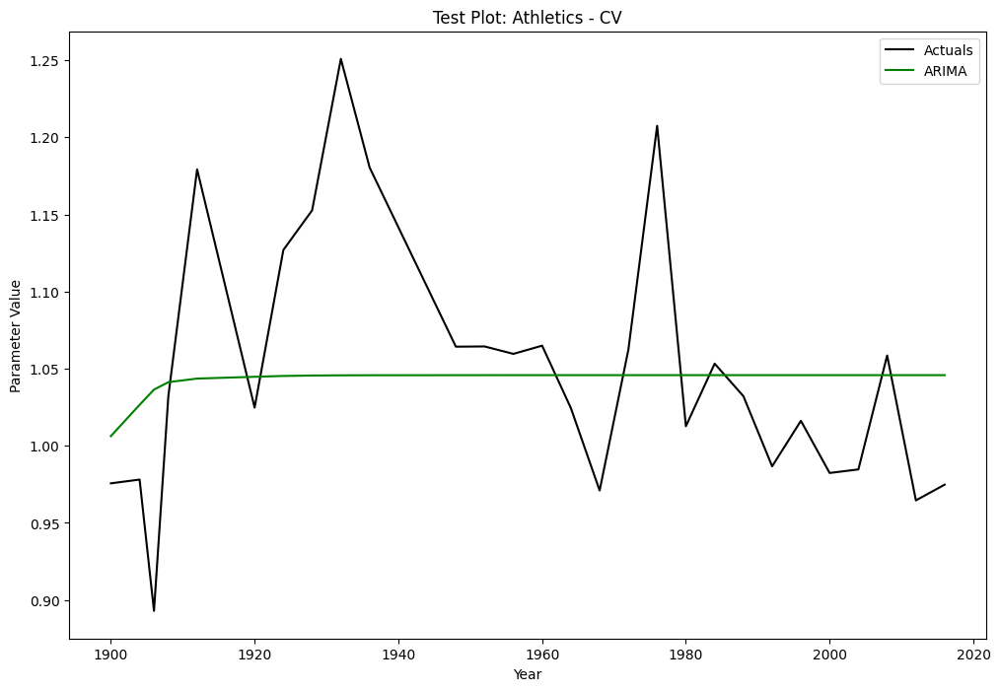

In [11]:
# Test with one sport and parameter
sport = 'Athletics'
parameter = 'CV'

df = sport_data_dict[sport]
df.index = pd.PeriodIndex(df.index, freq='Y')
parameter_df = df[[parameter]].dropna()

year_data = parameter_df.index
year_data_plot = year_data.to_timestamp()  # Conversion for plotting
train_data = parameter_df.iloc[:-1]
test_data = parameter_df.iloc[1:]

# Fit one model for test
arima_model = sm.tsa.ARIMA(train_data[parameter], order=(1, 1, 1))
model_fit = arima_model.fit()
arima_predicted = model_fit.forecast(steps=len(test_data))
arima_actuals = test_data[parameter]

# Plot results
fig, ax = plt.subplots(figsize=(12, 8))
ax.plot(year_data_plot[1:], arima_actuals, label='Actuals', color='black')
ax.plot(year_data_plot[1:], arima_predicted, label='ARIMA', color='green')
ax.set_title(f'Test Plot: {sport} - {parameter}')
ax.set_xlabel('Year')
ax.set_ylabel('Parameter Value')
plt.legend()
plt.show()


In [6]:
# Generate the ordered pairs for actual and predicted values
actual_pairs = list(zip(year_data_plot[1:], arima_actuals))
predicted_pairs = list(zip(year_data_plot[1:], arima_predicted))

# Print the ordered pairs
print("Actuals (Year, Value):")
for pair in actual_pairs:
    print(pair)

print("\nARIMA Predictions (Year, Value):")
for pair in predicted_pairs:
    print(pair)


Actuals (Year, Value):
(Timestamp('1900-01-01 00:00:00'), 0.0)
(Timestamp('1904-01-01 00:00:00'), 0.0)
(Timestamp('1906-01-01 00:00:00'), 0.0)
(Timestamp('1908-01-01 00:00:00'), 0.0)
(Timestamp('1912-01-01 00:00:00'), 0.0)
(Timestamp('1920-01-01 00:00:00'), 0.0)
(Timestamp('1924-01-01 00:00:00'), 0.0)
(Timestamp('1928-01-01 00:00:00'), 0.0)
(Timestamp('1932-01-01 00:00:00'), 0.0)
(Timestamp('1936-01-01 00:00:00'), 0.0)
(Timestamp('1948-01-01 00:00:00'), 0.0)
(Timestamp('1952-01-01 00:00:00'), 0.0)
(Timestamp('1956-01-01 00:00:00'), 0.0)
(Timestamp('1960-01-01 00:00:00'), 0.0)
(Timestamp('1964-01-01 00:00:00'), 0.0)
(Timestamp('1968-01-01 00:00:00'), 0.0)
(Timestamp('1972-01-01 00:00:00'), 0.0)
(Timestamp('1976-01-01 00:00:00'), 1.0)
(Timestamp('1980-01-01 00:00:00'), 0.0)
(Timestamp('1984-01-01 00:00:00'), 4.0)
(Timestamp('1988-01-01 00:00:00'), 1.0)
(Timestamp('1992-01-01 00:00:00'), 5.0)
(Timestamp('1996-01-01 00:00:00'), 7.0)
(Timestamp('2000-01-01 00:00:00'), 4.0)
(Timestamp('2004-

In [7]:
from statsmodels.tsa.stattools import adfuller

result = adfuller(train_data[parameter])
print(f"ADF Statistic: {result[0]}")
print(f"p-value: {result[1]}")
if result[1] > 0.05:
    print("Data is non-stationary. Consider differencing.")
else:
    print("Data is stationary.")


ADF Statistic: -9.21759964718664
p-value: 1.8160617883769962e-15
Data is stationary.


In [8]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the metrics from the CSV file
metrics_df = pd.read_csv('model_metrics/metrics_summary.csv')
print(metrics_df.head())  # Preview the first few rows


           Sport Parameter    Model        R2       MSE
0  Alpine Skiing      drug    ARIMA  1.000000  0.000000
1  Alpine Skiing      drug   SARIMA  1.000000  0.000000
2  Alpine Skiing      drug  SARIMAX  1.000000  0.000000
3  Alpine Skiing    equity    ARIMA -0.029285  0.001349
4  Alpine Skiing    equity   SARIMA -0.095740  0.001436


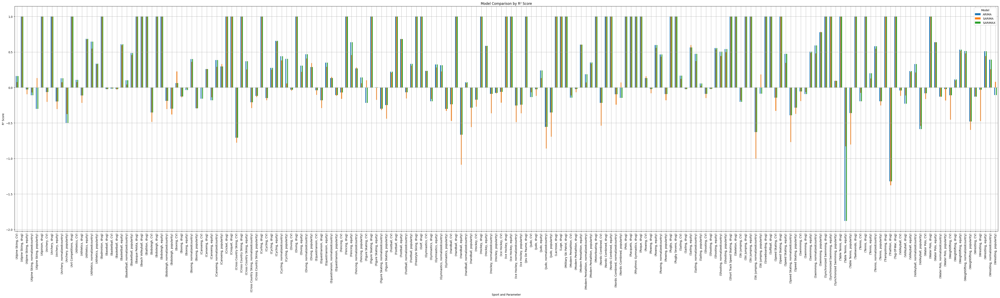

In [9]:
# Group the data by model and calculate the mean R² for each
r2_scores = metrics_df.pivot_table(values='R2', index=['Sport', 'Parameter'], columns='Model')

# Plot the R² scores
r2_scores.plot(kind='bar', figsize=(50, 15))
plt.title('Model Comparison by R² Score')
plt.xlabel('Sport and Parameter')
plt.ylabel('R² Score')
plt.legend(title='Model')
plt.grid(True)
plt.tight_layout()
plt.savefig('model_metrics/r2_comparison.png')
plt.show()


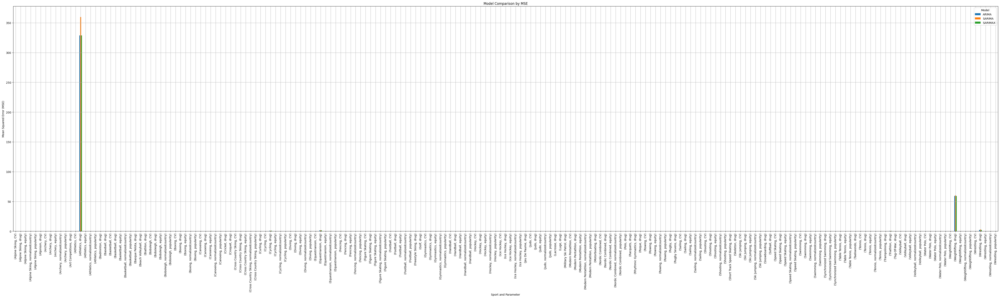

In [10]:
# Group the data by model and calculate the mean MSE for each
mse_scores = metrics_df.pivot_table(values='MSE', index=['Sport', 'Parameter'], columns='Model')

# Plot the MSE scores
mse_scores.plot(kind='bar', figsize=(50, 15))
plt.title('Model Comparison by MSE')
plt.xlabel('Sport and Parameter')
plt.ylabel('Mean Squared Error (MSE)')
plt.legend(title='Model')
plt.grid(True)
plt.tight_layout()
plt.savefig('model_metrics/mse_comparison.png')
plt.show()


In [13]:
# Filter for specific sport and parameter
for sport, df in sport_data_dict.items():
    if sport != 'Football':
        continue

    parameter = 'popularity'
    if parameter not in df.columns:
        continue

    # Ensure the Year index is converted to a PeriodIndex
    df.index = pd.PeriodIndex(df.index, freq='Y')

    # Select parameter data, drop NaNs
    parameter_df = df[[parameter]].dropna()

    if len(parameter_df) < 10:
        continue

    year_data = parameter_df.index
    train_data = parameter_df.iloc[:-1]
    test_data = parameter_df.iloc[1:]

    # Save models in a specific folder for the sport
    sport_model_path = f"model_weights/{sport}"
    os.makedirs(sport_model_path, exist_ok=True)

    # Train and evaluate models
    arima_r2, arima_mse, arima_predicted, arima_actuals = train_and_evaluate_model(
        'ARIMA', sm.tsa.ARIMA, train_data, test_data, parameter, sport_model_path, order=(1, 1, 1)
    )
    sarima_r2, sarima_mse, sarima_predicted, sarima_actuals = train_and_evaluate_model(
        'SARIMA', SARIMAX, train_data, test_data, parameter, sport_model_path, order=(1, 1, 1), seasonal_order=(1, 0, 1, 4)
    )
    sarimax_r2, sarimax_mse, sarimax_predicted, sarimax_actuals = train_and_evaluate_model(
        'SARIMAX', SARIMAX, train_data, test_data, parameter, sport_model_path, order=(1, 1, 1)
    )

    # Save raw predicted vs actual pairs
    raw_pairs = {
        'Year': year_data[1:].to_timestamp().strftime('%Y').tolist(),
        'Actuals': sarimax_actuals,
        'ARIMA_Predicted': arima_predicted,
        'SARIMA_Predicted': sarima_predicted,
        'SARIMAX_Predicted': sarimax_predicted
    }
    pairs_df = pd.DataFrame(raw_pairs)
    pairs_df.to_csv(f"model_metrics/{sport}_{parameter}_raw_pairs.csv", index=False)

# Save metrics to CSV
metrics_df = pd.DataFrame(metrics_data)
metrics_df.to_csv('model_metrics/metrics_summary.csv', index=False)

print("Training, evaluation, and raw pairs saving completed.")


 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.36395D+00    |proj g|=  4.66655D+01

At iterate    5    f= -3.38275D+00    |proj g|=  2.28337D-01

At iterate   10    f= -3.38326D+00    |proj g|=  5.97700D+00

At iterate   15    f= -3.41581D+00    |proj g|=  2.93315D+01

At iterate   20    f= -3.42669D+00    |proj g|=  1.35872D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     21     65      2     0     0   1.359D-01  -3.427D+00
  F =  -3.4266940217898099     

ABNORMA

 This problem is unconstrained.



At iterate   15    f= -3.35824D+00    |proj g|=  7.66113D+00

At iterate   20    f= -3.35910D+00    |proj g|=  2.61192D-02

At iterate   25    f= -3.35932D+00    |proj g|=  2.65428D+00

At iterate   30    f= -3.35976D+00    |proj g|=  1.07201D-01

At iterate   35    f= -3.35984D+00    |proj g|=  1.07289D-01

At iterate   40    f= -3.35985D+00    |proj g|=  2.82494D-02

At iterate   45    f= -3.35985D+00    |proj g|=  1.51293D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     46     86      1     0     0   1.174D-01  -3.360D+00
  F =  -3.3598537240417228     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH   

 This problem is unconstrained.



At iterate   20    f= -3.37226D+00    |proj g|=  9.56925D-02



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.



At iterate   25    f= -3.37227D+00    |proj g|=  6.64112D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     26    123      3     0     0   6.641D-03  -3.372D+00
  F =  -3.3722656600582730     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.29712D+00    |proj g|=  1.23581D+01

At iterate    5    f= -3.29930D+00    |proj g|=  9.43957D-01

At iterate   10    f= -3.30307D+00    |proj g|=  1.58034D+01

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   25    f= -3.33951D+00    |proj g|=  1.07637D-01

At iterate   30    f= -3.33989D+00    |proj g|=  3.93873D+00

At iterate   35    f= -3.34371D+00    |proj g|=  2.80243D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     36     87      2     0     0   2.802D-01  -3.344D+00
  F =  -3.3437059524126864     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.73631D+00    |proj g|=  1.63378D+02

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.32778D+00    |proj g|=  1.08544D+01

At iterate    5    f= -3.32946D+00    |proj g|=  6.46571D-01

At iterate   10    f= -3.33074D+00    |proj g|=  8.29139D+00

At iterate   15    f= -3.33460D+00    |proj g|=  2.49804D-02

At iterate   20    f= -3.33509D+00    |proj g|=  2.49708D+00

At iterate   25    f= -3.33532D+00    |proj g|=  1.83712D-01

At iterate   30    f= -3.33532D+00    |proj g|=  7.30900D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nac


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.29697D+00    |proj g|=  1.85779D+01

At iterate    5    f= -3.30172D+00    |proj g|=  4.35878D-01

At iterate   10    f= -3.30286D+00    |proj g|=  7.92860D+00

At iterate   15    f= -3.30963D+00    |proj g|=  2.11445D-01

At iterate   20    f= -3.30983D+00    |proj g|=  3.59208D-01

At iterate   25    f= -3.30985D+00    |proj g|=  2.96614D-02

At iterate   30    f= -3.30986D+00    |proj g|=  1.37973D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nac

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -3.33147D+00    |proj g|=  5.23960D-01

At iterate   10    f= -3.33323D+00    |proj g|=  8.75752D+00

At iterate   15    f= -3.33655D+00    |proj g|=  3.35888D-01

At iterate   20    f= -3.33726D+00    |proj g|=  2.58502D+00

At iterate   25    f= -3.33738D+00    |proj g|=  4.20073D-02

At iterate   30    f= -3.33739D+00    |proj g|=  2.80797D-02
  ys=-2.861E-09  -gs= 1.160E-08 BFGS update SKIPPED



   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     31     76      1     1     0   2.808D-02  -3.337D+00
  F =  -3.3373859772017793     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.33953D+00    |proj g|=  1.91283D+01

At iterate    5    f= -3.34424D+00    |proj g|=  5.45992D-01

At iterate   10    f= -3.34677D+00    |proj g|=  1.01977D+01

At iterate   15    f= -3.35043D+00    |proj g|=  3.67164D-02

At iter

 This problem is unconstrained.



At iterate   20    f= -3.37647D+00    |proj g|=  3.24184D+00
  ys=-1.395E-08  -gs= 4.387E-08 BFGS update SKIPPED



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     24     83      2     1     0   4.137D-02  -3.377D+00
  F =  -3.3766232199891921     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.78579D+00    |proj g|=  1.75148D+02

At iterate    5    f= -3.01076D+00    |proj g|=  5.23749D-01

At iterate   10    f= -3.01585D+00    |proj g|=  1.25274D+01

At iterate   15    f= -3.22132D+00    |proj g|=  1.40732D+01

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   10    f= -3.39261D+00    |proj g|=  8.07774D+00

At iterate   15    f= -3.39800D+00    |proj g|=  5.81723D-01

At iterate   20    f= -3.39876D+00    |proj g|=  6.22099D-01

At iterate   25    f= -3.39877D+00    |proj g|=  1.03752D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     26     61      1     0     0   1.037D-01  -3.399D+00
  F =  -3.3987695233754991     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f= -3.38653D+00    |proj g|=  6.29333D-01

At iterate   10    f= -3.38830D+00    |proj g|=  1.01127D+01

At iterate   15    f= -3.39489D+00    |proj g|=  4.24770D-02

At iterate   20    f= -3.39509D+00    |proj g|=  6.87383D-01

At iterate   25    f= -3.39598D+00    |proj g|=  1.48147D-01

At iterate   30    f= -3.39598D+00    |proj g|=  1.51617D-01

At iterate   35    f= -3.39599D+00    |proj g|=  6.56281D-03



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   40    f= -3.39650D+00    |proj g|=  5.71166D-01

At iterate   45    f= -3.41880D+00    |proj g|=  1.86098D+01

At iterate   50    f= -3.43147D+00    |proj g|=  6.58329D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     98      2     0     0   6.583D-01  -3.431D+00
  F =  -3.4314705507943497     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.43160D+00    |proj g|=  3.99761D+00

At iter

 This problem is unconstrained.



At iterate   15    f= -3.43528D+00    |proj g|=  1.19541D-01

At iterate   20    f= -3.43607D+00    |proj g|=  5.52298D+00

At iterate   25    f= -3.44171D+00    |proj g|=  1.58958D+00

At iterate   30    f= -3.44250D+00    |proj g|=  6.16129D-01

At iterate   35    f= -3.44285D+00    |proj g|=  1.12465D+00

At iterate   40    f= -3.44559D+00    |proj g|=  5.44217D+00

At iterate   45    f= -3.45588D+00    |proj g|=  1.24577D+00

At iterate   50    f= -3.45831D+00    |proj g|=  6.48313D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     65      1     0     0   6.483D-01  -3.458D+00
  F =  -3.45831206070

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    5    f= -3.06103D+00    |proj g|=  5.27546D-01

At iterate   10    f= -3.06404D+00    |proj g|=  9.79337D+00

At iterate   15    f= -3.28735D+00    |proj g|=  3.51016D+01

At iterate   20    f= -3.38477D+00    |proj g|=  3.23941D-01

At iterate   25    f= -3.39636D+00    |proj g|=  2.53840D-01

At iterate   30    f= -3.46378D+00    |proj g|=  2.99897D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     32     53      1     0     0   2.170D-01  -3.464D+00
  F =  -3.4640959837440684     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   45    f= -3.47172D+00    |proj g|=  1.15420D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     45    128      2     0     0   1.154D-01  -3.472D+00
  F =  -3.4717158307590958     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.40185D+00    |proj g|=  2.19653D+01

At iterate    5    f= -3.40742D+00    |proj g|=  1.20280D+00

At iterate   10    f= -3.41454D+00    |proj g|=  1.64273D+01

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.89154D+00    |proj g|=  1.64230D+02

At iterate    5    f= -3.08520D+00    |proj g|=  5.22328D-01

At iterate   10    f= -3.08759D+00    |proj g|=  8.83290D+00

At iterate   15    f= -3.28606D+00    |proj g|=  4.43426D+01

At iterate   20    f= -3.39844D+00    |proj g|=  4.71515D-01

At iterate   25    f= -3.40309D+00    |proj g|=  3.21503D+00

At iterate   30    f= -3.48172D+00    |proj g|=  6.21352D+00

At iterate   35    f= -3.49210D+00    |proj g|=  1.56563D-02
  ys=-2.231E-12  -gs= 7.217E-11 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of 


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate   30    f= -3.49810D+00    |proj g|=  5.31657D-01

At iterate   35    f= -3.49813D+00    |proj g|=  2.41331D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     35     56      1     0     0   2.413D-02  -3.498D+00
  F =  -3.4981316041031785     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.48440D+00    |proj g|=  8.47888D-02

           * * *

Tit   = total number of iterations
Tnf   = total nu


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



At iterate    5    f= -3.49434D+00    |proj g|=  1.21406D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      5     32      2     1     0   1.214D-01  -3.494D+00
  F =  -3.4943394070112710     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.45789D+00    |proj g|=  5.95868D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments 

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.36891D+00    |proj g|=  1.60952D+01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      3     47      2     0     0   1.468D-01  -3.372D+00
  F =  -3.3720515519768011     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.3


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     29     91      2     0     0   1.196D-01  -3.365D+00
  F =  -3.3650944000572798     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.33216D+00    |proj g|=  1.02957D+01
  ys=-3.781E-11  -gs= 3.274E-09 BFGS update SKIPPED

At iterate    5    f= -3.33368D+00    |proj g|=  1.55332D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of fu


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.


  ys=-7.653E-12  -gs= 1.014E-09 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     18     51      1     1     0   2.461D-02  -3.308D+00
  F =  -3.3079542691059030     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.31381D+00    |proj g|=  1.92530D+01

At iterate    5    f= -3.31874D+00    |proj g|=  5.63609D-01

At iterate   10    f= -3.32093D+00    |proj g|=  9.32187D+00

At iterate   15  


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     48     89      1     0     0   3.071D-02  -3.414D+00
  F =  -3.4136181435530206     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.35273D+00    |proj g|=  1.74626D+01

At iterate    5    f= -3.35665D+00    |proj g|=  4.95139D-01

At iterate   10    f= -3.35777D+00    |proj g|=  8.14967D+00

At iterate   15    f= -3.36434D+00    |proj g|=  1.55821D-01

       

 This problem is unconstrained.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f= -3.38615D+00    |proj g|=  6.21221D-01

At iterate   10    f= -3.38808D+00    |proj g|=  1.06562D+01

At iterate   15    f= -3.39572D+00    |proj g|=  7.33646D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     18     45      1     0     0   3.328D-02  -3.396D+00
  F =  -3.3957230381485899     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.43285D+00    |proj g|=  3.57265D+00

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   40    f= -3.45840D+00    |proj g|=  3.28744D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     40    124      3     0     0   3.287D-03  -3.458D+00
  F =  -3.4584013129880002     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.84737D+00    |proj g|=  1.71317D+02

At iterate    5    f= -3.05763D+00    |proj g|=  5.33305D-01

At iterate   10    f= -3.05989D+00    |proj g|=  8.45947D+00

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     44    157      3     0     0   1.722D-01  -3.470D+00
  F =  -3.4704843612311045     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.40386D+00    |proj g|=  2.15533D+01

At iterate    5    f= -3.40921D+00    |proj g|=  1.01157D+00

At iterate   10    f= -3.41412D+00    |proj g|=  1.49779D+01

At iterate   15    f= -3.42061D+00    |proj g|=  1.02996D-01

       


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.
 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an a


           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      3     65      2     0     0   4.548D-02  -3.485D+00
  F =  -3.4851889083029595     

ABNORMAL_TERMINATION_IN_LNSRCH                              
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -3.49462D+00    |proj g|=  6.54885D-01
  ys=-2.671E-11  -gs= 3.687E-10 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored d